Aplicar Debscan \
Mirar 2 dimensiones el espacio latente \
Hacer VRAE con 4 dimensiones en el espacio latente \
Información extra Gaia distancia y proper motion 1 arcsec de cross match \
color gaia óptico \
color 2mass 2.5 arcsec

In [1]:
# Importaciones de bibliotecas estándar
import os
import sys
import glob
import datetime
import csv
import itertools
from collections import OrderedDict

# Importaciones de NumPy
import numpy as np

# Importaciones de Pandas
import pandas as pd
from pandas.plotting import register_matplotlib_converters

# Importaciones de Matplotlib
import matplotlib.pyplot as plt
from matplotlib.patches import Patch

# Importaciones de Scipy
from scipy.stats import gaussian_kde

# Importaciones de Seaborn
import seaborn as sns

# Importaciones de h5py
import h5py

# Importaciones de Sklearn
from sklearn.manifold import TSNE
from sklearn.model_selection import train_test_split

# Importaciones de TensorFlow
import tensorflow as tf
from tensorflow.keras import Sequential, backend as K
from tensorflow.keras.layers import (Input, Dense, TimeDistributed, LSTM, GRU, Dropout,  
                         Concatenate, Flatten, RepeatVector, Lambda, Bidirectional, SimpleRNN, concatenate)
from tensorflow.keras.activations import relu, sigmoid
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.utils import plot_model
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.callbacks import (Callback, TensorBoard, EarlyStopping,
                             ModelCheckpoint, CSVLogger, ProgbarLogger)

# Importaciones de Keras
from keras.models import Model

# Importaciones de Ray
import ray

# Verifica si existe una GPU disponible
tf.config.list_physical_devices('GPU')

# Carga la extensión TensorBoard
%load_ext tensorboard


2023-07-26 11:49:15.214915: I tensorflow/core/util/port.cc:110] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2023-07-26 11:49:15.583574: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-07-26 11:49:16.239592: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
2023-07-26 11:49:17.564900: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:996] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.

In [2]:
@ray.remote(num_returns=2)
def open_lc(estrellas,
#            separacion,
            banda,
            mjdmin=56658, #1 de enero de 2014
            mjdmax=59215, #1 de enero de 2021
           ):
    df = pd.read_csv(estrellas)
    df = df.loc[(df["time"]>mjdmin)&
                   (df["time"]<mjdmax)&
                    (df["band"]==banda)
               ]
    df = df.sort_values(by="time",ascending=True)
    return df[["time","mag","emag"]].values,len(df)
    
#functions taken from https://github.com/yutarotachibana/CatalinaQSO_AutoEncoder

def times_to_lags(T):
    """(N x n_step) matrix of times -> (N x n_step) matrix of lags.
    First time is assumed to be zero.
    """
    assert T.ndim == 2, "T must be an (N x n_step) matrix"
    return np.c_[np.diff(T, axis=1)/365., np.zeros(T.shape[0])]


def preprocess(X_raw, m_max=np.inf):
    X = X_raw.copy() # copiamos el dataframe
    wrong_units =  np.all(np.isnan(X[:, :, 1])) | (np.nanmax(X[:, :, 1], axis=1) > m_max)
    # mascara para revisar si las mags:
    #hay mags que no tienen valores --> todos nan
    #si hay valores mayor al m_max
    X = X[~wrong_units, :, :]
    #dejamos fuera las observaciones que no cumplan los criterios
    X[:, :, 0] = times_to_lags(X[:, :, 0])
    #aplicamos la funcion a los dias
    # generamos los dias normalizados y un cero para marcar el final de la serie
    means = np.atleast_2d(np.nanmean(X[:, :, 1], axis=1)).T
    # calculamos la media de las time series y pasamos cada media como array
    X[:, :, 1] -= means
    scales = np.atleast_2d(np.nanstd(X[:, :, 1], axis=1)).T
    # std de las time series y vistas como arrays
    X[:, :, 1] /= scales 
    # le agregamos el std de la time serie
    errors = X[:, :, 2] / scales
    # definimos el error como variable y lo sacamos del array
    X = X[:, :, :2]
    return X, means, scales, errors, wrong_units
# el array
# la media de las observaciones
# el std de las mag
# el error dividido en el std de la mag
# la mascara de los datos que tengan mala unidad

def plot_subplots_with_labels(df_encodings, class_labels):
    # Convertir las categorías en valores numéricos en df_encodings
    colores, unique_labels = pd.factorize(class_labels)
    palett = plt.cm.get_cmap('Set1')

    # Crear la lista de patches para la leyenda
    legend_elements = [Patch(facecolor=palett(i), edgecolor='r', label=label) for i, label in enumerate(unique_labels)]
    
    # Obtener todas las combinaciones de columnas en df_encodings
    combinaciones = list(itertools.combinations(range(len(df_encodings.columns) - 1), 2))

    # Configuración de la figura y los ejes
    fig, axs = plt.subplots(3, 7, figsize=(16, 24))
    axs = axs.flatten()

    # Graficar cada combinación de columnas desde df_encodings
    for i, combinacion in enumerate(combinaciones):
        x_col, y_col = combinacion
        axs[i].scatter(df_encodings.iloc[:, x_col], df_encodings.iloc[:, y_col], marker='*', s=0.01, c=colores, cmap=palett, alpha=0.5)  # Se añade alpha aquí
        axs[i].set_xlabel(f'Columna {x_col}')
        axs[i].set_ylabel(f'Columna {y_col}')

    # Añadir la leyenda a la figura
    fig.legend(handles=legend_elements, loc='upper center', ncol=len(unique_labels), fontsize='large', bbox_to_anchor=(0.5, 0.9))
    return fig 

# Función para trazar el histograma en los subplots
def plot_histogram(data_1,data_2):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))
    # Subplot 1: Catálogo general
    ax1.hist(data_1.loc[data_1['split'] == "train", "log_10(R)_W1"], bins=50, color='b',
            density=True, histtype='step', label='Training set')
    ax1.hist(data_2.loc[data_2['split'] == "test", "log_10(R)_W1"], bins=50, color='r',
            density=True, histtype='step', label='Testing set')
    ax1.set_xlabel("log_10(R)")
    ax1.set_ylabel("No of samples")
    ax1.legend()
    ax1.set_title('Error W1')
    # Subplot 2: Estrellas con subtype
    ax2.hist(data_2.loc[data_2['split'] == "train", "log_10(R)_W2"], bins=50, color='b',
            density=True, histtype='step', label='Training set')
    ax2.hist(data_2.loc[data_2['split'] == "test", "log_10(R)_W2"], bins=50, color='r',
            density=True, histtype='step', label='Testing set')
    ax2.set_xlabel("log_10(R)")
    ax2.set_ylabel("No of samples")
    ax2.legend()
    ax2.set_title('Error W2')
    # Ajustar los espacios entre los subplots
    plt.subplots_adjust(hspace=0.4)

    # Mostrar los subplots
    plt.show()
    return



def modelo(lr, model_input,main_input,X_train,aux_input,output_size):
    optimizer = Adam(learning_rate=lr)
    gru_size = 14
    dropout_val = 0.0

    resume_training = False # if True use W&B to recover weights and resume training, if False train a new model

    def sampling(samp_args):
        z_mean, z_log_sigma = samp_args

        batch = K.shape(z_mean)[0]
        dim = K.int_shape(z_mean)[1]
        # by default, random_normal has mean = 0 and std = 1.0
        epsilon = K.random_normal(shape=(batch, dim))
        return z_mean + K.exp(0.5 * z_log_sigma) * epsilon

    from tensorflow.keras.layers import concatenate


    #encoder
    encoder = Bidirectional(GRU(gru_size, name='encoder1', return_sequences=True))(main_input)
    encoder = Dropout(dropout_val, name='drop_encoder1')(encoder) 
    encoder = Bidirectional(GRU(gru_size, name='encoder2', return_sequences=False))(encoder)
    encoder = Dropout(dropout_val, name='drop_encoder2')(encoder)
    codings_mean = Dense(units=output_size, name='encoding_mean', activation='linear')(encoder)
    codings_log_var = Dense(units=output_size, name='encoding_log_var', activation='linear')(encoder) 
    codings = Lambda(sampling, output_shape=(output_size,))([codings_mean, codings_log_var])


    #decoder
    decoder = RepeatVector(X_train.shape[1], name='repeat')(codings)
    decoder = concatenate([aux_input, decoder])
    decoder = GRU(gru_size, name='decoder1', return_sequences=True)(decoder)
    decoder = Dropout(dropout_val, name='drop_decoder1')(decoder)
    decoder = GRU(gru_size, name='decoder2', return_sequences=True)(decoder)
    decoder = TimeDistributed(Dense(1, activation='linear'), name='time_dist')(decoder)

    #VAE
    model = Model(model_input, decoder)
    latent_loss = -0.5*K.sum(1+codings_log_var-K.exp(codings_log_var)-K.square(codings_mean),axis=-1)
    model.add_loss(K.mean(latent_loss)/200.)  
    model.compile(optimizer=optimizer, loss='mse',  metrics=[tf.keras.metrics.MeanAbsoluteError()], weighted_metrics=[tf.keras.metrics.MeanAbsoluteError()], sample_weight_mode='temporal')#,run_eagerly=True)

    return model



def plot100reconstrucciones(df,titulo):
    # Crear subplots 10x10
    fig, axes = plt.subplots(nrows=10, ncols=10, figsize=(40,40))
    # Aplanar arreglo de subplots
    axes = axes.flatten()
    # Iterar sobre cada subplot y plotear los datos correspondientes
    for i, ax in enumerate(axes):
        index = df.index[i]
        df_star = reconstruccion(decoding,lcs_scaled_W,lcs_raw_W,decoding_10,index)
        error,excess_var,nombre = df.iloc[i][["log_10(R)","Excess_var","SPICY"]]
        ax.errorbar(df_star.mjd, df_star.mag,df_star.mag_err, label='Original Lc',color="black",marker=".", linestyle = 'dashed')
        ax.errorbar(df_star.mjd,df_star.rec_mag,df_star.rec_mag_std, label='Reconstructed Lc',color="red",marker=".", linestyle = 'dashed')
        ax.fill_between(df_star.mjd,df_star.rec_mag_min,df_star.rec_mag_max, alpha=0.2,facecolor='#D42F4B')
        ax.invert_yaxis()
        ax.set_title(f"SPICY: {nombre}\nlog(R): {error:.4f},\nE_var: {excess_var:.2e}")
        
        # Ajustar ticks en el eje y
        yticks = np.linspace(df_star.mag.min(), df_star.mag.max(), 4)
        yticks_formatted = [round(ytick, 2) for ytick in yticks]
        ax.set_yticks(yticks_formatted)
        
    plt.tight_layout()
    plt.savefig(f"{titulo}.pdf",bbox_inches='tight')
    plt.show()

def reconstruccion(decoding,lcs_scaled_W,lcs_raw_W,decoding_10,num,catalog):
    value_min = np.min(decoding_10,axis=0)
    value_max = np.max(decoding_10,axis=0)
    value_std = np.std(decoding_10,axis=0)
    mjd_0 = lcs_raw_W[num,0,0]
    df = pd.DataFrame({"decoding":decoding[num,:,0],
                       "decoding_std":value_std[num].reshape(14,),
                       "decoding_min":value_min[num].reshape(14,),
                       "decoding_max":value_max[num].reshape(14,),
                       "lcs_scaled_mjd":lcs_scaled_W[num,:,0],
                        "lcs_scaled_mag":lcs_scaled_W[num,:,1],
                      })
    df["mjd"] = pd.concat([pd.Series(mjd_0/365),df["lcs_scaled_mjd"]]).cumsum().reset_index(drop=True)*365
    df["rec_mag"] = (df.decoding * lcs_raw_W[num,:,1].std()) + lcs_raw_W[num,:,1].mean()
    df["rec_mag_std"] = df.decoding_std * lcs_raw_W[num,:,1].std()
    df["rec_mag_max"] = (df.decoding_max * lcs_raw_W[num,:,1].std()) + lcs_raw_W[num,:,1].mean()
    df["rec_mag_min"] = (df.decoding_min * lcs_raw_W[num,:,1].std()) + lcs_raw_W[num,:,1].mean()

    df["mag"] = lcs_raw_W[num,:,1]
    df["mag_err"] = lcs_raw_W[num,:,2]
    
    nombre = catalog["SPICY"].iloc[num]
    plt.title(f"SPICY {nombre}")
    plt.errorbar(df.mjd, df.mag,df.mag_err, label='Original Lc',color="black",marker=".", linestyle = 'dashed')
    plt.errorbar(df.mjd,df.rec_mag,df.rec_mag_std, label='Reconstructed Lc',color="red",marker=".", linestyle = 'dashed')
    plt.fill_between(df.mjd,df.rec_mag_min,df.rec_mag_max, alpha=0.2,facecolor='#D42F4B')
    plt.gca().invert_yaxis()
    plt.legend()
    return df 



def scatter_plot_con_densidad(x, y, titulo, xlabel, ylabel):
    # Calcular la densidad
    k = gaussian_kde(np.vstack([x, y]))
    density = k(np.vstack([x, y]))

    # Crear la figura y los ejes
    fig, ax = plt.subplots()

    # Crear el scatter plot
    scatter = ax.scatter(x, y, c=density, cmap='viridis', s=1)

    # Agregar la barra de color de densidad
    cb = plt.colorbar(scatter)
    cb.set_label('Densidad')

    # Agregar título y etiquetas de los ejes
    ax.set_title(titulo)
    ax.set_xlabel(xlabel)
    ax.set_ylabel(ylabel)

    # Retornar la figura creada
    return fig

def split_catalog(catalog_path):
    catalog = pd.read_csv(catalog_path)
    spicy_train = catalog.loc[catalog["split"]=="train"]
    spicy_test = catalog.loc[catalog["split"]=="test"]
    return spicy_train, spicy_test,catalog

def load_data(data, postfix):
    prefix_list = ["lcs_scaled_W", "errors_W", "lcs_raw_W", "scales_W", "means_W", "ID_spicy_w"]
    data_dict = {prefix: data[f"{prefix}{postfix}"][:] for prefix in prefix_list}
    data_dict["lcs_scaled_W"][np.isnan(data_dict["lcs_scaled_W"])] = 0
    return data_dict

def load_model(weights_file, model_input,main_input,X_train,aux_input,output_size, learning_rate=1e-3):
    model = modelo(learning_rate,model_input,main_input,X_train,aux_input,output_size)
    model.load_weights(weights_file)
    encode_model = Model(model.input, model.get_layer('lambda').output)
    decode_model = Model(model.input, model.output)
    return encode_model, decode_model

def predict_model(input_data, model):
    input_dict = {'main_input': input_data, 'aux_input': np.delete(input_data, 1, axis=2)}
    return model.predict(input_dict)

def process_data(data, i,url):
    tf.keras.backend.clear_session()
    # Load and split data
    data_dict = load_data(data, i)
    spicy_train, spicy_test, catalog = split_catalog(f'{url}/catalog_train_and_test_W{i}.csv')
    num_catalog_entries = len(catalog)

    # Prepare input data
    X_train = data_dict["lcs_scaled_W"][spicy_train.index.values]
    X_test = data_dict["lcs_scaled_W"][spicy_test.index.values]
    error_train = data_dict["errors_W"][spicy_train.index.values]
    error_test = data_dict["errors_W"][spicy_test.index.values]
    #Defining variables
    lcs_scaled_W = data_dict["lcs_scaled_W"][:]
    lcs_raw_W = data_dict["lcs_raw_W"][:]
    # Prepare model input
    main_input = Input(shape=(lcs_scaled_W.shape[1], 2), name='main_input') #(lag, mag)
    aux_input = Input(shape=(lcs_scaled_W.shape[1], 1), name='aux_input') #(lag)
    model_input = [main_input, aux_input]


    # Load model
    encode_model, decode_model = load_model(f"{url}/log_dir/weights_Unwise_{i}.h5",
                                            model_input,
                                            main_input,
                                            X_train,
                                           aux_input,
                                           8)

    # Perform model predictions
    encoding = predict_model(data_dict["lcs_scaled_W"], encode_model)
    decoding = predict_model(data_dict["lcs_scaled_W"], decode_model)
    decoding_10 = [predict_model(data_dict["lcs_scaled_W"], decode_model) for _ in range(10)]
    # Compute final results
    final_results = np.zeros((num_catalog_entries, 14, 13))
    final_results[:,:,0] = decoding[:,:,0]
    final_results[:,:,1] = np.nanstd(decoding_10,axis=0).reshape(num_catalog_entries,14)
    final_results[:,:,2] = np.nanmin(decoding_10,axis=0).reshape(num_catalog_entries,14)
    final_results[:,:,3] = np.nanmax(decoding_10,axis=0).reshape(num_catalog_entries,14)
    final_results[:,:,4] = lcs_scaled_W[:,:,0]
    final_results[:,:,5] = lcs_scaled_W[:,:,1]
    final_results[:,:,6] = np.concatenate((np.reshape(lcs_raw_W[:,0,0],(num_catalog_entries,1))/365, lcs_scaled_W[:,:-1,0]), axis=1).cumsum(axis=0)*365
    final_results[:,:,7] = decoding[:,:,0]* lcs_raw_W[:,:,1].std(axis=1).reshape(num_catalog_entries,1) + lcs_raw_W[:,:,1].mean(axis=1).reshape(num_catalog_entries,1)
    final_results[:,:,8] = np.nanstd(decoding_10,axis=0).reshape(num_catalog_entries,14) * lcs_raw_W[:,:,1].std(axis=1).reshape(num_catalog_entries,1)
    final_results[:,:,9] = np.nanmax(decoding_10,axis=0).reshape(num_catalog_entries,14)* lcs_raw_W[:,:,1].std(axis=1).reshape(num_catalog_entries,1) + lcs_raw_W[:,:,1].mean(axis=1).reshape(num_catalog_entries,1)
    final_results[:,:,10] = np.nanmin(decoding_10,axis=0).reshape(num_catalog_entries,14)* lcs_raw_W[:,:,1].std(axis=1).reshape(num_catalog_entries,1) + lcs_raw_W[:,:,1].mean(axis=1).reshape(num_catalog_entries,1)
    final_results[:,:,11] = lcs_raw_W[:,:,1]
    final_results[:,:,12] = lcs_raw_W[:,:,2]
    
    # Update catalog
    catalog[f"R_W{i}"] = (1/14) * np.sum((final_results[:,:,11] - final_results[:,:,7])**2/(final_results[:,:,12]**2+final_results[:,:,8]**2),axis=1)
    catalog[f"log_10(R)_W{i}"] = np.log10(catalog[f"R_W{i}"])

    catalog[f"Excess_var_norm_W{i}"] = ((np.std(final_results[:,:,11],axis=1)**2 - np.mean(final_results[:,:,12],axis=1)**2)) /(np.mean(final_results[:,:,11],axis=1)**2)
    catalog[f"Excess_var_sin_norm_W{i}"] = (np.std(final_results[:,:,11],axis=1)**2 - np.mean(final_results[:,:,12],axis=1)**2)
    
    
    num_cols = encoding.shape[1] 
    df_encoding = pd.DataFrame(encoding,
                  columns=[f"{j}_encod_W{i}" for j in range(num_cols)]) 
    
    catalog = pd.concat([catalog,df_encoding],axis=1)

    # Return results
    return  decoding,encoding,data_dict["lcs_scaled_W"][:],data_dict["lcs_raw_W"][:],decoding_10,catalog

def plot_loss_val_loss(df1_path, df2_path):
    df_1 = pd.read_csv(df1_path)
    df_2 = pd.read_csv(df2_path)

    df_1 = df_1.reset_index().rename(columns={"index":"Epoch"})
    df_2 = df_2.reset_index().rename(columns={"index":"Epoch"})

    # Create a figure and a set of subplots
    fig, axs = plt.subplots(2)

    # Create the first subplot
    sns.lineplot(ax=axs[0], data=df_2, x="Epoch", y="loss", linewidth=0.1)
    sns.lineplot(ax=axs[0], data=df_2, x="Epoch", y="val_loss", linewidth=0.1)
    axs[0].set_title('Loss W2')

    # Create the second subplot
    sns.lineplot(ax=axs[1], data=df_1, x="Epoch", y="loss", linewidth=0.1)
    sns.lineplot(ax=axs[1], data=df_1, x="Epoch", y="val_loss", linewidth=0.1)
    axs[1].set_title('Loss W1')

    # Show the plots
    plt.tight_layout() # This automatically adjusts the space between subplots
    plt.show()

def plot_histogram_class(data, hue_col, x_col_1, x_col_2, top_n=7, palette=None):
    """
    data: DataFrame que contiene los datos para trazar
    hue_col: Columna para agrupar y colorear los datos
    x_col_1, x_col_2: Columnas para los ejes x en las dos subtramas
    top_n: Número de grupos principales para incluir en el gráfico (default es 7)
    palette: Paleta de colores para usar (default es None, lo que significa que seaborn elige)
    """
    # Agrupar por hue_col, contar las filas, ordenar por conteo y tomar los grupos top_n
    top_groups = data.groupby(hue_col).count().sort_values(by=x_col_1, ascending=False).head(top_n).index

    # Filtrar los datos para incluir solo los grupos top_n
    data_to_plot = data.loc[data[hue_col].isin(top_groups)]

    # Crear una figura con dos subtramas
    fig, axs = plt.subplots(1,2, figsize=(10,6))

    # Intentar trazar el histograma para la primera columna, capturar la excepción si la paleta no es válida
    sns.histplot(data_to_plot, x=x_col_1, hue=hue_col, palette=palette, fill=False, bins=30, element="step", ax=axs[0])

    # Intentar trazar el histograma para la segunda columna, capturar la excepción si la paleta no es válida

    sns.histplot(data_to_plot, x=x_col_2, hue=hue_col, palette=palette, fill=False, bins=30, element="step", ax=axs[1])

    # Mostrar la figura
    plt.show()
    return


## Crear Hdf5 de curvas de luz 

In [ ]:
cd /media/variablestars/datos1/spicy/lightcurve/

In [ ]:
ray.init()

In [ ]:
#list_spicy = glob.glob("*") este es cuando no tenemos el catalgo con el len de las time series

lcs_1 = []
len_lcs_1 = []
lcs_2 = []
len_lcs_2 = []
for estrella in list_spicy :
    result_lcs_1, result_len_lcs_1 = open_lc.remote(estrella,1)
    lcs_1.append(result_lcs_1)
    len_lcs_1.append(result_len_lcs_1)
    result_lcs_2, result_len_lcs_2 = open_lc.remote(estrella,2)
    lcs_2.append(result_lcs_2)
    len_lcs_2.append(result_len_lcs_2)

lcs_1 = ray.get(lcs_1)
lcs_2 = ray.get(lcs_2)

len_lcs_1 = ray.get(len_lcs_1)
len_lcs_2 = ray.get(len_lcs_2)

catalog = pd.DataFrame({"SPICY":list_spicy})
catalog["SPICY"] = catalog["SPICY"].str[:-4]
catalog["len_W1"] = len_lcs_1


catalog["len_W2"] = len_lcs_2

catalog.loc[catalog["len_W1"]==14,"n_obs_w1==14"] = True
catalog.loc[catalog["len_W1"]!=14,"n_obs_w1==14"] = False
catalog.loc[catalog["len_W2"]==14,"n_obs_w2==14"] = True
catalog.loc[catalog["len_W2"]!=14,"n_obs_w2==14"] = False

lcs_1 = np.array(lcs_1)[catalog["n_obs_w1==14"].astype(bool)]
lcs_2 = np.array(lcs_2)[catalog["n_obs_w2==14"].astype(bool)]

lcs_raw_W1 = pad_sequences(lcs_1, value=np.nan, dtype='float', padding='post')
lcs_raw_W2 = pad_sequences(lcs_2, value=np.nan, dtype='float', padding='post')

lcs_scaled_W1, means_W1, scales_W1, errors_W1, wrong_units_W1 = preprocess(lcs_raw_W1)
lcs_scaled_W2, means_W2, scales_W2, errors_W2, wrong_units_W2 = preprocess(lcs_raw_W2)

data = h5py.File('/home/variablestars/spicy_unwise/reunion_08_03_2023/spicy_GRU_12.hdf5', 'w')

data.create_dataset('lcs_scaled_W1', data=lcs_scaled_W1)
data.create_dataset('lcs_raw_W1', data=lcs_raw_W1)
data.create_dataset('means_W1', data=means_W1)
data.create_dataset('scales_W1', data=scales_W1)
data.create_dataset('errors_W1', data=errors_W1)
data.create_dataset('wrong_units_W1', data=wrong_units_W1)
data.create_dataset('ID_spicy_w1', data= catalog[catalog["n_obs_w1==14"]]["SPICY"].astype(int))

data.create_dataset('lcs_scaled_W2', data=lcs_scaled_W2)
data.create_dataset('lcs_raw_W2', data=lcs_raw_W2)
data.create_dataset('means_W2', data=means_W2)
data.create_dataset('scales_W2', data=scales_W2)
data.create_dataset('errors_W2', data=errors_W2)
data.create_dataset('wrong_units_W2', data=wrong_units_W2)
data.create_dataset('ID_spicy_w2', data= catalog[catalog["n_obs_w2==14"]]["SPICY"].astype(int))


data.close()

## Entrenar

In [323]:
data = h5py.File('/home/variablestars/Nico/spicy_unwise/29_05_23/spicy_GRU_12.hdf5', 'r')

for i in [1,2]:
    catalog = pd.read_csv("/home/variablestars/Nico/spicy_unwise/29_05_23/catalog_Spicy_GRU_12.csv")
    catalog = catalog.loc[catalog[f"n_obs_w{i}==14"]==True].reset_index(drop=True)
    spicy_train,spicy_test = train_test_split(catalog.index,test_size=0.2, random_state=42)
    catalog.loc[spicy_test,"split"] = "test"
    catalog.loc[spicy_train,"split"] = "train"
    spicy_train = spicy_train.sort_values(ascending=True)
    spicy_test = spicy_train.sort_values(ascending=True)
    
    catalog.to_csv(f"/home/variablestars/Nico/spicy_unwise/25_06_23/catalog_train_and_test_W{i}.csv",index=False)
    lcs_scaled = data[f"lcs_scaled_W{i}"][:]
    X_train = data[f"lcs_scaled_W{i}"][spicy_train.values]
    X_test = data[f"lcs_scaled_W{i}"][spicy_test.values]
    error_train = data[f"errors_W{i}"][spicy_train.values]
    error_test =  data[f"errors_W{i}"][spicy_test.values]
    main_input = Input(shape=(lcs_scaled.shape[1], 2), name='main_input') #(lag, mag)
    aux_input = Input(shape=(lcs_scaled.shape[1], 1), name='aux_input') #(lag)
    model_input = [main_input, aux_input]

    sample_weight = 1. / error_train 
    sample_weight[np.isnan(sample_weight)] = 0.0
    X_train[np.isnan(X_train)] = 0.
    X_test[np.isnan(X_test)] = 0.
    model = modelo(1e-3,model_input,main_input,X_train,aux_input)

    log_dir = '/home/variablestars/Nico/spicy_unwise/25_06_23/log_dir/'
    weights_path = os.path.join(log_dir, f'weights_Unwise_{i}.h5')
    logs = os.path.join("logs", datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))

    early_stopping = EarlyStopping(monitor='val_loss', patience=50, mode='auto', restore_best_weights=True)
    check_points = tf.keras.callbacks.ModelCheckpoint(filepath=weights_path, save_freq='epoch', save_weights_only=False, save_best_only=True, monitor='val_loss', verbose=1)


    #aux input contains the delta times, Y (lcs_scaled[:, :, [1]]) is the arrey with the normalized magnitudes, sample_weights is 1/err
    history = model.fit({'main_input': X_train, 'aux_input': np.delete(X_train, 1, axis=2)},
                        X_train[:, :, [1]], 
                        epochs=8000, 
                        batch_size=512,
                        sample_weight=sample_weight,
                        callbacks = [
                                    check_points#,
                                   # early_stopping
                                     ],

                        validation_split=0.2,
                        )
    
    pd.DataFrame(history.history).to_csv(f"/home/variablestars/Nico/spicy_unwise/25_06_23/log_dir/history_Unwise_{i}.csv",index=False)
    

2023-07-25 17:50:46.069980: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-07-25 17:50:46.070526: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-07-25 17:50:46.071154: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Epoch 1/8000


2023-07-25 17:50:47.972577: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-07-25 17:50:47.973335: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-07-25 17:50:47.973856: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

2023-07-25 17:50:49.214380: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-07-25 17:50:49.215205: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-07-25 17:50:49.215679: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

46/50 [==========================>...] - ETA: 0s - loss: 48.0201 - mean_absolute_error: 0.8467 - weighted_mean_absolute_error: 0.8416

2023-07-25 17:50:52.456645: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-07-25 17:50:52.457252: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-07-25 17:50:52.457904: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus


Epoch 1: val_loss improved from inf to 46.41368, saving model to /home/variablestars/Nico/spicy_unwise/25_06_23/log_dir/weights_Unwise_1.h5
50/50 [==============================] - 5s 41ms/step - loss: 47.6177 - mean_absolute_error: 0.8447 - weighted_mean_absolute_error: 0.8397 - val_loss: 46.4137 - val_mean_absolute_error: 0.8190 - val_weighted_mean_absolute_error: 0.8140
Epoch 2/8000
50/50 [==============================] - ETA: 0s - loss: 43.5794 - mean_absolute_error: 0.8113 - weighted_mean_absolute_error: 0.8065
Epoch 2: val_loss improved from 46.41368 to 44.47599, saving model to /home/variablestars/Nico/spicy_unwise/25_06_23/log_dir/weights_Unwise_1.h5
50/50 [==============================] - 1s 19ms/step - loss: 43.5794 - mean_absolute_error: 0.8113 - weighted_mean_absolute_error: 0.8065 - val_loss: 44.4760 - val_mean_absolute_error: 0.8003 - val_weighted_mean_absolute_error: 0.7959
Epoch 3/8000
49/50 [============================>.] - ETA: 0s - loss: 40.0466 - mean_absolute_e

Epoch 17/8000
49/50 [============================>.] - ETA: 0s - loss: 24.5539 - mean_absolute_error: 0.6022 - weighted_mean_absolute_error: 0.5741
Epoch 17: val_loss improved from 26.83110 to 26.25721, saving model to /home/variablestars/Nico/spicy_unwise/25_06_23/log_dir/weights_Unwise_1.h5
50/50 [==============================] - 1s 23ms/step - loss: 24.5769 - mean_absolute_error: 0.6022 - weighted_mean_absolute_error: 0.5742 - val_loss: 26.2572 - val_mean_absolute_error: 0.5944 - val_weighted_mean_absolute_error: 0.5796
Epoch 18/8000
49/50 [============================>.] - ETA: 0s - loss: 24.2364 - mean_absolute_error: 0.5968 - weighted_mean_absolute_error: 0.5690
Epoch 18: val_loss improved from 26.25721 to 25.94488, saving model to /home/variablestars/Nico/spicy_unwise/25_06_23/log_dir/weights_Unwise_1.h5
50/50 [==============================] - 1s 20ms/step - loss: 24.1512 - mean_absolute_error: 0.5967 - weighted_mean_absolute_error: 0.5685 - val_loss: 25.9449 - val_mean_absolu

50/50 [==============================] - 1s 19ms/step - loss: 19.4980 - mean_absolute_error: 0.5294 - weighted_mean_absolute_error: 0.5006 - val_loss: 21.6672 - val_mean_absolute_error: 0.5294 - val_weighted_mean_absolute_error: 0.5146
Epoch 33/8000
50/50 [==============================] - ETA: 0s - loss: 19.2266 - mean_absolute_error: 0.5243 - weighted_mean_absolute_error: 0.4958
Epoch 33: val_loss improved from 21.66720 to 21.23377, saving model to /home/variablestars/Nico/spicy_unwise/25_06_23/log_dir/weights_Unwise_1.h5
50/50 [==============================] - 1s 18ms/step - loss: 19.2266 - mean_absolute_error: 0.5243 - weighted_mean_absolute_error: 0.4958 - val_loss: 21.2338 - val_mean_absolute_error: 0.5232 - val_weighted_mean_absolute_error: 0.5081
Epoch 34/8000
50/50 [==============================] - ETA: 0s - loss: 19.0217 - mean_absolute_error: 0.5215 - weighted_mean_absolute_error: 0.4927
Epoch 34: val_loss improved from 21.23377 to 21.14178, saving model to /home/variables

49/50 [============================>.] - ETA: 0s - loss: 17.7715 - mean_absolute_error: 0.5013 - weighted_mean_absolute_error: 0.4725
Epoch 48: val_loss improved from 19.89018 to 19.63591, saving model to /home/variablestars/Nico/spicy_unwise/25_06_23/log_dir/weights_Unwise_1.h5
50/50 [==============================] - 1s 25ms/step - loss: 17.7638 - mean_absolute_error: 0.5012 - weighted_mean_absolute_error: 0.4721 - val_loss: 19.6359 - val_mean_absolute_error: 0.4984 - val_weighted_mean_absolute_error: 0.4861
Epoch 49/8000
50/50 [==============================] - ETA: 0s - loss: 17.5076 - mean_absolute_error: 0.4971 - weighted_mean_absolute_error: 0.4681
Epoch 49: val_loss improved from 19.63591 to 19.42795, saving model to /home/variablestars/Nico/spicy_unwise/25_06_23/log_dir/weights_Unwise_1.h5
50/50 [==============================] - 1s 21ms/step - loss: 17.5076 - mean_absolute_error: 0.4971 - weighted_mean_absolute_error: 0.4681 - val_loss: 19.4280 - val_mean_absolute_error: 0.49

46/50 [==========================>...] - ETA: 0s - loss: 15.6857 - mean_absolute_error: 0.4627 - weighted_mean_absolute_error: 0.4337
Epoch 64: val_loss did not improve from 17.23382
50/50 [==============================] - 1s 18ms/step - loss: 15.5310 - mean_absolute_error: 0.4626 - weighted_mean_absolute_error: 0.4324 - val_loss: 17.2844 - val_mean_absolute_error: 0.4618 - val_weighted_mean_absolute_error: 0.4446
Epoch 65/8000
48/50 [===========================>..] - ETA: 0s - loss: 15.4282 - mean_absolute_error: 0.4630 - weighted_mean_absolute_error: 0.4318
Epoch 65: val_loss did not improve from 17.23382
50/50 [==============================] - 1s 23ms/step - loss: 15.5507 - mean_absolute_error: 0.4629 - weighted_mean_absolute_error: 0.4329 - val_loss: 17.5991 - val_mean_absolute_error: 0.4688 - val_weighted_mean_absolute_error: 0.4475
Epoch 66/8000
48/50 [===========================>..] - ETA: 0s - loss: 15.5892 - mean_absolute_error: 0.4621 - weighted_mean_absolute_error: 0.4329


49/50 [============================>.] - ETA: 0s - loss: 13.7614 - mean_absolute_error: 0.4365 - weighted_mean_absolute_error: 0.4066
Epoch 80: val_loss improved from 15.42680 to 15.32654, saving model to /home/variablestars/Nico/spicy_unwise/25_06_23/log_dir/weights_Unwise_1.h5
50/50 [==============================] - 1s 20ms/step - loss: 13.7498 - mean_absolute_error: 0.4363 - weighted_mean_absolute_error: 0.4065 - val_loss: 15.3265 - val_mean_absolute_error: 0.4347 - val_weighted_mean_absolute_error: 0.4174
Epoch 81/8000
49/50 [============================>.] - ETA: 0s - loss: 13.6224 - mean_absolute_error: 0.4331 - weighted_mean_absolute_error: 0.4030
Epoch 81: val_loss improved from 15.32654 to 15.16027, saving model to /home/variablestars/Nico/spicy_unwise/25_06_23/log_dir/weights_Unwise_1.h5
50/50 [==============================] - 1s 19ms/step - loss: 13.6070 - mean_absolute_error: 0.4330 - weighted_mean_absolute_error: 0.4029 - val_loss: 15.1603 - val_mean_absolute_error: 0.43

49/50 [============================>.] - ETA: 0s - loss: 13.0907 - mean_absolute_error: 0.4250 - weighted_mean_absolute_error: 0.3930
Epoch 96: val_loss did not improve from 14.47865
50/50 [==============================] - 1s 18ms/step - loss: 13.0419 - mean_absolute_error: 0.4250 - weighted_mean_absolute_error: 0.3928 - val_loss: 14.5842 - val_mean_absolute_error: 0.4263 - val_weighted_mean_absolute_error: 0.4030
Epoch 97/8000
49/50 [============================>.] - ETA: 0s - loss: 12.9840 - mean_absolute_error: 0.4250 - weighted_mean_absolute_error: 0.3924
Epoch 97: val_loss did not improve from 14.47865
50/50 [==============================] - 1s 19ms/step - loss: 13.0371 - mean_absolute_error: 0.4251 - weighted_mean_absolute_error: 0.3927 - val_loss: 14.8111 - val_mean_absolute_error: 0.4309 - val_weighted_mean_absolute_error: 0.4067
Epoch 98/8000
47/50 [===========================>..] - ETA: 0s - loss: 12.9599 - mean_absolute_error: 0.4253 - weighted_mean_absolute_error: 0.3916


Epoch 113/8000
49/50 [============================>.] - ETA: 0s - loss: 12.6914 - mean_absolute_error: 0.4193 - weighted_mean_absolute_error: 0.3841
Epoch 113: val_loss improved from 14.11083 to 14.06933, saving model to /home/variablestars/Nico/spicy_unwise/25_06_23/log_dir/weights_Unwise_1.h5
50/50 [==============================] - 1s 20ms/step - loss: 12.6793 - mean_absolute_error: 0.4196 - weighted_mean_absolute_error: 0.3845 - val_loss: 14.0693 - val_mean_absolute_error: 0.4182 - val_weighted_mean_absolute_error: 0.3911
Epoch 114/8000
49/50 [============================>.] - ETA: 0s - loss: 12.6222 - mean_absolute_error: 0.4197 - weighted_mean_absolute_error: 0.3845
Epoch 114: val_loss did not improve from 14.06933
50/50 [==============================] - 1s 20ms/step - loss: 12.6534 - mean_absolute_error: 0.4197 - weighted_mean_absolute_error: 0.3845 - val_loss: 14.2234 - val_mean_absolute_error: 0.4220 - val_weighted_mean_absolute_error: 0.3959
Epoch 115/8000
48/50 [===========

50/50 [==============================] - ETA: 0s - loss: 12.4193 - mean_absolute_error: 0.4174 - weighted_mean_absolute_error: 0.3808
Epoch 130: val_loss did not improve from 13.84294
50/50 [==============================] - 1s 23ms/step - loss: 12.4193 - mean_absolute_error: 0.4174 - weighted_mean_absolute_error: 0.3808 - val_loss: 13.9023 - val_mean_absolute_error: 0.4157 - val_weighted_mean_absolute_error: 0.3891
Epoch 131/8000
48/50 [===========================>..] - ETA: 0s - loss: 12.4398 - mean_absolute_error: 0.4166 - weighted_mean_absolute_error: 0.3797
Epoch 131: val_loss improved from 13.84294 to 13.76854, saving model to /home/variablestars/Nico/spicy_unwise/25_06_23/log_dir/weights_Unwise_1.h5
50/50 [==============================] - 1s 18ms/step - loss: 12.3967 - mean_absolute_error: 0.4164 - weighted_mean_absolute_error: 0.3800 - val_loss: 13.7685 - val_mean_absolute_error: 0.4144 - val_weighted_mean_absolute_error: 0.3865
Epoch 132/8000
49/50 [==========================

Epoch 148/8000
50/50 [==============================] - ETA: 0s - loss: 12.1258 - mean_absolute_error: 0.4130 - weighted_mean_absolute_error: 0.3751
Epoch 148: val_loss did not improve from 13.60519
50/50 [==============================] - 1s 21ms/step - loss: 12.1258 - mean_absolute_error: 0.4130 - weighted_mean_absolute_error: 0.3751 - val_loss: 13.6286 - val_mean_absolute_error: 0.4125 - val_weighted_mean_absolute_error: 0.3855
Epoch 149/8000
50/50 [==============================] - ETA: 0s - loss: 12.2041 - mean_absolute_error: 0.4147 - weighted_mean_absolute_error: 0.3769
Epoch 149: val_loss did not improve from 13.60519
50/50 [==============================] - 1s 19ms/step - loss: 12.2041 - mean_absolute_error: 0.4147 - weighted_mean_absolute_error: 0.3769 - val_loss: 13.6221 - val_mean_absolute_error: 0.4133 - val_weighted_mean_absolute_error: 0.3844
Epoch 150/8000
50/50 [==============================] - ETA: 0s - loss: 12.1170 - mean_absolute_error: 0.4127 - weighted_mean_abso

50/50 [==============================] - ETA: 0s - loss: 12.0094 - mean_absolute_error: 0.4117 - weighted_mean_absolute_error: 0.3735
Epoch 165: val_loss improved from 13.30894 to 13.27072, saving model to /home/variablestars/Nico/spicy_unwise/25_06_23/log_dir/weights_Unwise_1.h5
50/50 [==============================] - 1s 22ms/step - loss: 12.0094 - mean_absolute_error: 0.4117 - weighted_mean_absolute_error: 0.3735 - val_loss: 13.2707 - val_mean_absolute_error: 0.4077 - val_weighted_mean_absolute_error: 0.3797
Epoch 166/8000
50/50 [==============================] - ETA: 0s - loss: 11.9483 - mean_absolute_error: 0.4102 - weighted_mean_absolute_error: 0.3718
Epoch 166: val_loss did not improve from 13.27072
50/50 [==============================] - 1s 18ms/step - loss: 11.9483 - mean_absolute_error: 0.4102 - weighted_mean_absolute_error: 0.3718 - val_loss: 13.3804 - val_mean_absolute_error: 0.4094 - val_weighted_mean_absolute_error: 0.3819
Epoch 167/8000
49/50 [==========================

49/50 [============================>.] - ETA: 0s - loss: 11.7513 - mean_absolute_error: 0.4072 - weighted_mean_absolute_error: 0.3680
Epoch 182: val_loss did not improve from 13.09024
50/50 [==============================] - 1s 20ms/step - loss: 11.7358 - mean_absolute_error: 0.4072 - weighted_mean_absolute_error: 0.3680 - val_loss: 13.1064 - val_mean_absolute_error: 0.4047 - val_weighted_mean_absolute_error: 0.3790
Epoch 183/8000
48/50 [===========================>..] - ETA: 0s - loss: 11.7144 - mean_absolute_error: 0.4059 - weighted_mean_absolute_error: 0.3667
Epoch 183: val_loss improved from 13.09024 to 13.01842, saving model to /home/variablestars/Nico/spicy_unwise/25_06_23/log_dir/weights_Unwise_1.h5
50/50 [==============================] - 1s 21ms/step - loss: 11.6808 - mean_absolute_error: 0.4060 - weighted_mean_absolute_error: 0.3665 - val_loss: 13.0184 - val_mean_absolute_error: 0.4045 - val_weighted_mean_absolute_error: 0.3758
Epoch 184/8000
50/50 [==========================

Epoch 199/8000
48/50 [===========================>..] - ETA: 0s - loss: 11.4611 - mean_absolute_error: 0.4023 - weighted_mean_absolute_error: 0.3620
Epoch 199: val_loss improved from 12.73767 to 12.67210, saving model to /home/variablestars/Nico/spicy_unwise/25_06_23/log_dir/weights_Unwise_1.h5
50/50 [==============================] - 1s 22ms/step - loss: 11.4195 - mean_absolute_error: 0.4020 - weighted_mean_absolute_error: 0.3617 - val_loss: 12.6721 - val_mean_absolute_error: 0.3994 - val_weighted_mean_absolute_error: 0.3704
Epoch 200/8000
50/50 [==============================] - ETA: 0s - loss: 11.3904 - mean_absolute_error: 0.4011 - weighted_mean_absolute_error: 0.3608
Epoch 200: val_loss improved from 12.67210 to 12.63915, saving model to /home/variablestars/Nico/spicy_unwise/25_06_23/log_dir/weights_Unwise_1.h5
50/50 [==============================] - 1s 14ms/step - loss: 11.3904 - mean_absolute_error: 0.4011 - weighted_mean_absolute_error: 0.3608 - val_loss: 12.6392 - val_mean_ab

Epoch 216/8000
45/50 [==========================>...] - ETA: 0s - loss: 11.2664 - mean_absolute_error: 0.3984 - weighted_mean_absolute_error: 0.3580
Epoch 216: val_loss improved from 12.36961 to 12.34518, saving model to /home/variablestars/Nico/spicy_unwise/25_06_23/log_dir/weights_Unwise_1.h5
50/50 [==============================] - 1s 20ms/step - loss: 11.1610 - mean_absolute_error: 0.3984 - weighted_mean_absolute_error: 0.3569 - val_loss: 12.3452 - val_mean_absolute_error: 0.3968 - val_weighted_mean_absolute_error: 0.3654
Epoch 217/8000
49/50 [============================>.] - ETA: 0s - loss: 11.1319 - mean_absolute_error: 0.3982 - weighted_mean_absolute_error: 0.3565
Epoch 217: val_loss did not improve from 12.34518
50/50 [==============================] - 1s 19ms/step - loss: 11.1454 - mean_absolute_error: 0.3983 - weighted_mean_absolute_error: 0.3567 - val_loss: 12.4405 - val_mean_absolute_error: 0.3985 - val_weighted_mean_absolute_error: 0.3663
Epoch 218/8000
49/50 [===========

Epoch 233/8000
48/50 [===========================>..] - ETA: 0s - loss: 10.9070 - mean_absolute_error: 0.3950 - weighted_mean_absolute_error: 0.3511
Epoch 233: val_loss improved from 12.04668 to 12.02966, saving model to /home/variablestars/Nico/spicy_unwise/25_06_23/log_dir/weights_Unwise_1.h5
50/50 [==============================] - 1s 23ms/step - loss: 10.9074 - mean_absolute_error: 0.3951 - weighted_mean_absolute_error: 0.3516 - val_loss: 12.0297 - val_mean_absolute_error: 0.3931 - val_weighted_mean_absolute_error: 0.3599
Epoch 234/8000
48/50 [===========================>..] - ETA: 0s - loss: 10.9303 - mean_absolute_error: 0.3946 - weighted_mean_absolute_error: 0.3512
Epoch 234: val_loss improved from 12.02966 to 12.01676, saving model to /home/variablestars/Nico/spicy_unwise/25_06_23/log_dir/weights_Unwise_1.h5
50/50 [==============================] - 1s 21ms/step - loss: 10.8968 - mean_absolute_error: 0.3945 - weighted_mean_absolute_error: 0.3516 - val_loss: 12.0168 - val_mean_ab

Epoch 250/8000
48/50 [===========================>..] - ETA: 0s - loss: 10.7237 - mean_absolute_error: 0.3910 - weighted_mean_absolute_error: 0.3468
Epoch 250: val_loss improved from 11.75483 to 11.71596, saving model to /home/variablestars/Nico/spicy_unwise/25_06_23/log_dir/weights_Unwise_1.h5
50/50 [==============================] - 1s 22ms/step - loss: 10.6502 - mean_absolute_error: 0.3910 - weighted_mean_absolute_error: 0.3466 - val_loss: 11.7160 - val_mean_absolute_error: 0.3897 - val_weighted_mean_absolute_error: 0.3548
Epoch 251/8000
50/50 [==============================] - ETA: 0s - loss: 10.6584 - mean_absolute_error: 0.3914 - weighted_mean_absolute_error: 0.3470
Epoch 251: val_loss did not improve from 11.71596
50/50 [==============================] - 1s 19ms/step - loss: 10.6584 - mean_absolute_error: 0.3914 - weighted_mean_absolute_error: 0.3470 - val_loss: 11.7794 - val_mean_absolute_error: 0.3904 - val_weighted_mean_absolute_error: 0.3542
Epoch 252/8000
49/50 [===========

50/50 [==============================] - ETA: 0s - loss: 10.3969 - mean_absolute_error: 0.3870 - weighted_mean_absolute_error: 0.3413
Epoch 267: val_loss did not improve from 11.52321
50/50 [==============================] - 1s 17ms/step - loss: 10.3969 - mean_absolute_error: 0.3870 - weighted_mean_absolute_error: 0.3413 - val_loss: 11.5660 - val_mean_absolute_error: 0.3876 - val_weighted_mean_absolute_error: 0.3511
Epoch 268/8000
49/50 [============================>.] - ETA: 0s - loss: 10.4355 - mean_absolute_error: 0.3873 - weighted_mean_absolute_error: 0.3427
Epoch 268: val_loss improved from 11.52321 to 11.52287, saving model to /home/variablestars/Nico/spicy_unwise/25_06_23/log_dir/weights_Unwise_1.h5
50/50 [==============================] - 1s 22ms/step - loss: 10.4122 - mean_absolute_error: 0.3873 - weighted_mean_absolute_error: 0.3422 - val_loss: 11.5229 - val_mean_absolute_error: 0.3865 - val_weighted_mean_absolute_error: 0.3502
Epoch 269/8000
50/50 [==========================

50/50 [==============================] - 1s 18ms/step - loss: 10.2141 - mean_absolute_error: 0.3846 - weighted_mean_absolute_error: 0.3387 - val_loss: 11.3237 - val_mean_absolute_error: 0.3845 - val_weighted_mean_absolute_error: 0.3468
Epoch 285/8000
48/50 [===========================>..] - ETA: 0s - loss: 10.1925 - mean_absolute_error: 0.3856 - weighted_mean_absolute_error: 0.3392
Epoch 285: val_loss did not improve from 11.32368
50/50 [==============================] - 1s 19ms/step - loss: 10.2255 - mean_absolute_error: 0.3853 - weighted_mean_absolute_error: 0.3393 - val_loss: 11.3485 - val_mean_absolute_error: 0.3846 - val_weighted_mean_absolute_error: 0.3473
Epoch 286/8000
49/50 [============================>.] - ETA: 0s - loss: 10.1846 - mean_absolute_error: 0.3843 - weighted_mean_absolute_error: 0.3378
Epoch 286: val_loss did not improve from 11.32368
50/50 [==============================] - 1s 18ms/step - loss: 10.1981 - mean_absolute_error: 0.3844 - weighted_mean_absolute_error

50/50 [==============================] - 1s 17ms/step - loss: 10.0341 - mean_absolute_error: 0.3825 - weighted_mean_absolute_error: 0.3360 - val_loss: 11.2217 - val_mean_absolute_error: 0.3837 - val_weighted_mean_absolute_error: 0.3463
Epoch 303/8000
50/50 [==============================] - ETA: 0s - loss: 10.0786 - mean_absolute_error: 0.3833 - weighted_mean_absolute_error: 0.3369
Epoch 303: val_loss did not improve from 11.17436
50/50 [==============================] - 1s 21ms/step - loss: 10.0786 - mean_absolute_error: 0.3833 - weighted_mean_absolute_error: 0.3369 - val_loss: 11.3963 - val_mean_absolute_error: 0.3885 - val_weighted_mean_absolute_error: 0.3502
Epoch 304/8000
49/50 [============================>.] - ETA: 0s - loss: 10.0116 - mean_absolute_error: 0.3827 - weighted_mean_absolute_error: 0.3360
Epoch 304: val_loss did not improve from 11.17436
50/50 [==============================] - 1s 22ms/step - loss: 10.0262 - mean_absolute_error: 0.3826 - weighted_mean_absolute_error

50/50 [==============================] - 1s 17ms/step - loss: 9.8672 - mean_absolute_error: 0.3804 - weighted_mean_absolute_error: 0.3333 - val_loss: 10.9924 - val_mean_absolute_error: 0.3811 - val_weighted_mean_absolute_error: 0.3430
Epoch 321/8000
50/50 [==============================] - ETA: 0s - loss: 9.9118 - mean_absolute_error: 0.3819 - weighted_mean_absolute_error: 0.3349
Epoch 321: val_loss did not improve from 10.95819
50/50 [==============================] - 1s 23ms/step - loss: 9.9118 - mean_absolute_error: 0.3819 - weighted_mean_absolute_error: 0.3349 - val_loss: 11.1069 - val_mean_absolute_error: 0.3834 - val_weighted_mean_absolute_error: 0.3456
Epoch 322/8000
49/50 [============================>.] - ETA: 0s - loss: 9.8872 - mean_absolute_error: 0.3810 - weighted_mean_absolute_error: 0.3341
Epoch 322: val_loss improved from 10.95819 to 10.94079, saving model to /home/variablestars/Nico/spicy_unwise/25_06_23/log_dir/weights_Unwise_1.h5
50/50 [==============================

48/50 [===========================>..] - ETA: 0s - loss: 9.7308 - mean_absolute_error: 0.3793 - weighted_mean_absolute_error: 0.3315
Epoch 338: val_loss did not improve from 10.72515
50/50 [==============================] - 1s 21ms/step - loss: 9.7390 - mean_absolute_error: 0.3794 - weighted_mean_absolute_error: 0.3320 - val_loss: 10.7601 - val_mean_absolute_error: 0.3791 - val_weighted_mean_absolute_error: 0.3412
Epoch 339/8000
49/50 [============================>.] - ETA: 0s - loss: 9.6649 - mean_absolute_error: 0.3795 - weighted_mean_absolute_error: 0.3321
Epoch 339: val_loss did not improve from 10.72515
50/50 [==============================] - 1s 21ms/step - loss: 9.7038 - mean_absolute_error: 0.3793 - weighted_mean_absolute_error: 0.3317 - val_loss: 10.7784 - val_mean_absolute_error: 0.3786 - val_weighted_mean_absolute_error: 0.3407
Epoch 340/8000
46/50 [==========================>...] - ETA: 0s - loss: 9.5833 - mean_absolute_error: 0.3782 - weighted_mean_absolute_error: 0.3298
E

Epoch 356/8000
49/50 [============================>.] - ETA: 0s - loss: 9.5703 - mean_absolute_error: 0.3769 - weighted_mean_absolute_error: 0.3298
Epoch 356: val_loss did not improve from 10.55114
50/50 [==============================] - 1s 21ms/step - loss: 9.5508 - mean_absolute_error: 0.3768 - weighted_mean_absolute_error: 0.3296 - val_loss: 10.9979 - val_mean_absolute_error: 0.3845 - val_weighted_mean_absolute_error: 0.3464
Epoch 357/8000
47/50 [===========================>..] - ETA: 0s - loss: 9.6112 - mean_absolute_error: 0.3773 - weighted_mean_absolute_error: 0.3297
Epoch 357: val_loss did not improve from 10.55114
50/50 [==============================] - 1s 19ms/step - loss: 9.5626 - mean_absolute_error: 0.3772 - weighted_mean_absolute_error: 0.3296 - val_loss: 10.5707 - val_mean_absolute_error: 0.3761 - val_weighted_mean_absolute_error: 0.3386
Epoch 358/8000
48/50 [===========================>..] - ETA: 0s - loss: 9.5505 - mean_absolute_error: 0.3765 - weighted_mean_absolute_

Epoch 374/8000
50/50 [==============================] - ETA: 0s - loss: 9.4412 - mean_absolute_error: 0.3752 - weighted_mean_absolute_error: 0.3279
Epoch 374: val_loss did not improve from 10.43248
50/50 [==============================] - 1s 20ms/step - loss: 9.4412 - mean_absolute_error: 0.3752 - weighted_mean_absolute_error: 0.3279 - val_loss: 10.6185 - val_mean_absolute_error: 0.3785 - val_weighted_mean_absolute_error: 0.3414
Epoch 375/8000
45/50 [==========================>...] - ETA: 0s - loss: 9.3981 - mean_absolute_error: 0.3741 - weighted_mean_absolute_error: 0.3269
Epoch 375: val_loss improved from 10.43248 to 10.40986, saving model to /home/variablestars/Nico/spicy_unwise/25_06_23/log_dir/weights_Unwise_1.h5
50/50 [==============================] - 1s 21ms/step - loss: 9.4273 - mean_absolute_error: 0.3742 - weighted_mean_absolute_error: 0.3270 - val_loss: 10.4099 - val_mean_absolute_error: 0.3734 - val_weighted_mean_absolute_error: 0.3342
Epoch 376/8000
50/50 [===============

47/50 [===========================>..] - ETA: 0s - loss: 9.3124 - mean_absolute_error: 0.3730 - weighted_mean_absolute_error: 0.3250
Epoch 392: val_loss did not improve from 10.33488
50/50 [==============================] - 1s 22ms/step - loss: 9.3068 - mean_absolute_error: 0.3732 - weighted_mean_absolute_error: 0.3253 - val_loss: 10.3942 - val_mean_absolute_error: 0.3736 - val_weighted_mean_absolute_error: 0.3358
Epoch 393/8000
50/50 [==============================] - ETA: 0s - loss: 9.3622 - mean_absolute_error: 0.3737 - weighted_mean_absolute_error: 0.3266
Epoch 393: val_loss did not improve from 10.33488
50/50 [==============================] - 1s 22ms/step - loss: 9.3622 - mean_absolute_error: 0.3737 - weighted_mean_absolute_error: 0.3266 - val_loss: 10.4205 - val_mean_absolute_error: 0.3753 - val_weighted_mean_absolute_error: 0.3379
Epoch 394/8000
50/50 [==============================] - ETA: 0s - loss: 9.5908 - mean_absolute_error: 0.3776 - weighted_mean_absolute_error: 0.3311
E

50/50 [==============================] - ETA: 0s - loss: 9.1905 - mean_absolute_error: 0.3718 - weighted_mean_absolute_error: 0.3236
Epoch 410: val_loss improved from 10.21117 to 10.13599, saving model to /home/variablestars/Nico/spicy_unwise/25_06_23/log_dir/weights_Unwise_1.h5
50/50 [==============================] - 1s 22ms/step - loss: 9.1905 - mean_absolute_error: 0.3718 - weighted_mean_absolute_error: 0.3236 - val_loss: 10.1360 - val_mean_absolute_error: 0.3696 - val_weighted_mean_absolute_error: 0.3319
Epoch 411/8000
50/50 [==============================] - ETA: 0s - loss: 9.1649 - mean_absolute_error: 0.3715 - weighted_mean_absolute_error: 0.3231
Epoch 411: val_loss did not improve from 10.13599
50/50 [==============================] - 1s 18ms/step - loss: 9.1649 - mean_absolute_error: 0.3715 - weighted_mean_absolute_error: 0.3231 - val_loss: 10.3950 - val_mean_absolute_error: 0.3773 - val_weighted_mean_absolute_error: 0.3404
Epoch 412/8000
48/50 [===========================>..

Epoch 428/8000
49/50 [============================>.] - ETA: 0s - loss: 9.0294 - mean_absolute_error: 0.3681 - weighted_mean_absolute_error: 0.3204
Epoch 428: val_loss did not improve from 9.94635
50/50 [==============================] - 1s 20ms/step - loss: 9.0376 - mean_absolute_error: 0.3681 - weighted_mean_absolute_error: 0.3199 - val_loss: 9.9921 - val_mean_absolute_error: 0.3672 - val_weighted_mean_absolute_error: 0.3300
Epoch 429/8000
49/50 [============================>.] - ETA: 0s - loss: 9.0028 - mean_absolute_error: 0.3677 - weighted_mean_absolute_error: 0.3197
Epoch 429: val_loss improved from 9.94635 to 9.92648, saving model to /home/variablestars/Nico/spicy_unwise/25_06_23/log_dir/weights_Unwise_1.h5
50/50 [==============================] - 1s 23ms/step - loss: 9.0035 - mean_absolute_error: 0.3676 - weighted_mean_absolute_error: 0.3195 - val_loss: 9.9265 - val_mean_absolute_error: 0.3666 - val_weighted_mean_absolute_error: 0.3284
Epoch 430/8000
49/50 [====================

45/50 [==========================>...] - ETA: 0s - loss: 9.0205 - mean_absolute_error: 0.3675 - weighted_mean_absolute_error: 0.3201
Epoch 446: val_loss did not improve from 9.85315
50/50 [==============================] - 1s 23ms/step - loss: 9.0277 - mean_absolute_error: 0.3680 - weighted_mean_absolute_error: 0.3208 - val_loss: 9.9691 - val_mean_absolute_error: 0.3678 - val_weighted_mean_absolute_error: 0.3293
Epoch 447/8000
50/50 [==============================] - ETA: 0s - loss: 9.0079 - mean_absolute_error: 0.3673 - weighted_mean_absolute_error: 0.3205
Epoch 447: val_loss did not improve from 9.85315
50/50 [==============================] - 1s 21ms/step - loss: 9.0079 - mean_absolute_error: 0.3673 - weighted_mean_absolute_error: 0.3205 - val_loss: 9.9492 - val_mean_absolute_error: 0.3655 - val_weighted_mean_absolute_error: 0.3288
Epoch 448/8000
50/50 [==============================] - ETA: 0s - loss: 9.0239 - mean_absolute_error: 0.3671 - weighted_mean_absolute_error: 0.3206
Epoch

50/50 [==============================] - 1s 19ms/step - loss: 8.7903 - mean_absolute_error: 0.3630 - weighted_mean_absolute_error: 0.3152 - val_loss: 9.8375 - val_mean_absolute_error: 0.3632 - val_weighted_mean_absolute_error: 0.3268
Epoch 465/8000
49/50 [============================>.] - ETA: 0s - loss: 8.8172 - mean_absolute_error: 0.3647 - weighted_mean_absolute_error: 0.3161
Epoch 465: val_loss did not improve from 9.74011
50/50 [==============================] - 1s 20ms/step - loss: 8.8344 - mean_absolute_error: 0.3645 - weighted_mean_absolute_error: 0.3164 - val_loss: 9.7633 - val_mean_absolute_error: 0.3643 - val_weighted_mean_absolute_error: 0.3247
Epoch 466/8000
50/50 [==============================] - ETA: 0s - loss: 8.7728 - mean_absolute_error: 0.3631 - weighted_mean_absolute_error: 0.3151
Epoch 466: val_loss improved from 9.74011 to 9.65369, saving model to /home/variablestars/Nico/spicy_unwise/25_06_23/log_dir/weights_Unwise_1.h5
50/50 [==============================] - 1

50/50 [==============================] - 1s 18ms/step - loss: 8.6293 - mean_absolute_error: 0.3602 - weighted_mean_absolute_error: 0.3123 - val_loss: 9.5461 - val_mean_absolute_error: 0.3596 - val_weighted_mean_absolute_error: 0.3216
Epoch 483/8000
50/50 [==============================] - ETA: 0s - loss: 8.7572 - mean_absolute_error: 0.3620 - weighted_mean_absolute_error: 0.3154
Epoch 483: val_loss did not improve from 9.53213
50/50 [==============================] - 1s 13ms/step - loss: 8.7572 - mean_absolute_error: 0.3620 - weighted_mean_absolute_error: 0.3154 - val_loss: 9.6946 - val_mean_absolute_error: 0.3633 - val_weighted_mean_absolute_error: 0.3250
Epoch 484/8000
50/50 [==============================] - ETA: 0s - loss: 8.7762 - mean_absolute_error: 0.3622 - weighted_mean_absolute_error: 0.3155
Epoch 484: val_loss did not improve from 9.53213
50/50 [==============================] - 1s 22ms/step - loss: 8.7762 - mean_absolute_error: 0.3622 - weighted_mean_absolute_error: 0.3155 

48/50 [===========================>..] - ETA: 0s - loss: 8.6100 - mean_absolute_error: 0.3600 - weighted_mean_absolute_error: 0.3109
Epoch 501: val_loss did not improve from 9.51140
50/50 [==============================] - 1s 23ms/step - loss: 8.6141 - mean_absolute_error: 0.3601 - weighted_mean_absolute_error: 0.3113 - val_loss: 9.7425 - val_mean_absolute_error: 0.3632 - val_weighted_mean_absolute_error: 0.3249
Epoch 502/8000
49/50 [============================>.] - ETA: 0s - loss: 8.6484 - mean_absolute_error: 0.3613 - weighted_mean_absolute_error: 0.3122
Epoch 502: val_loss did not improve from 9.51140
50/50 [==============================] - 1s 20ms/step - loss: 8.6564 - mean_absolute_error: 0.3613 - weighted_mean_absolute_error: 0.3122 - val_loss: 9.5952 - val_mean_absolute_error: 0.3603 - val_weighted_mean_absolute_error: 0.3232
Epoch 503/8000
48/50 [===========================>..] - ETA: 0s - loss: 8.5874 - mean_absolute_error: 0.3600 - weighted_mean_absolute_error: 0.3113
Epoch

49/50 [============================>.] - ETA: 0s - loss: 8.5200 - mean_absolute_error: 0.3585 - weighted_mean_absolute_error: 0.3104
Epoch 519: val_loss did not improve from 9.33110
50/50 [==============================] - 1s 17ms/step - loss: 8.5321 - mean_absolute_error: 0.3586 - weighted_mean_absolute_error: 0.3104 - val_loss: 9.5158 - val_mean_absolute_error: 0.3593 - val_weighted_mean_absolute_error: 0.3209
Epoch 520/8000
49/50 [============================>.] - ETA: 0s - loss: 8.5158 - mean_absolute_error: 0.3584 - weighted_mean_absolute_error: 0.3098
Epoch 520: val_loss did not improve from 9.33110
50/50 [==============================] - 1s 22ms/step - loss: 8.5113 - mean_absolute_error: 0.3585 - weighted_mean_absolute_error: 0.3099 - val_loss: 9.5858 - val_mean_absolute_error: 0.3611 - val_weighted_mean_absolute_error: 0.3237
Epoch 521/8000
48/50 [===========================>..] - ETA: 0s - loss: 8.5272 - mean_absolute_error: 0.3599 - weighted_mean_absolute_error: 0.3109
Epoch

46/50 [==========================>...] - ETA: 0s - loss: 8.4276 - mean_absolute_error: 0.3574 - weighted_mean_absolute_error: 0.3108
Epoch 537: val_loss did not improve from 9.23181
50/50 [==============================] - 1s 23ms/step - loss: 8.4582 - mean_absolute_error: 0.3570 - weighted_mean_absolute_error: 0.3105 - val_loss: 9.4762 - val_mean_absolute_error: 0.3576 - val_weighted_mean_absolute_error: 0.3208
Epoch 538/8000
49/50 [============================>.] - ETA: 0s - loss: 8.2774 - mean_absolute_error: 0.3539 - weighted_mean_absolute_error: 0.3061
Epoch 538: val_loss did not improve from 9.23181
50/50 [==============================] - 1s 21ms/step - loss: 8.3023 - mean_absolute_error: 0.3539 - weighted_mean_absolute_error: 0.3065 - val_loss: 9.2831 - val_mean_absolute_error: 0.3523 - val_weighted_mean_absolute_error: 0.3146
Epoch 539/8000
49/50 [============================>.] - ETA: 0s - loss: 8.3309 - mean_absolute_error: 0.3539 - weighted_mean_absolute_error: 0.3063
Epoch

50/50 [==============================] - 1s 18ms/step - loss: 8.2308 - mean_absolute_error: 0.3519 - weighted_mean_absolute_error: 0.3043 - val_loss: 9.1936 - val_mean_absolute_error: 0.3536 - val_weighted_mean_absolute_error: 0.3153
Epoch 556/8000
48/50 [===========================>..] - ETA: 0s - loss: 8.1953 - mean_absolute_error: 0.3529 - weighted_mean_absolute_error: 0.3042
Epoch 556: val_loss did not improve from 9.09408
50/50 [==============================] - 1s 21ms/step - loss: 8.2097 - mean_absolute_error: 0.3530 - weighted_mean_absolute_error: 0.3043 - val_loss: 9.1250 - val_mean_absolute_error: 0.3503 - val_weighted_mean_absolute_error: 0.3115
Epoch 557/8000
48/50 [===========================>..] - ETA: 0s - loss: 8.1362 - mean_absolute_error: 0.3511 - weighted_mean_absolute_error: 0.3020
Epoch 557: val_loss improved from 9.09408 to 9.08965, saving model to /home/variablestars/Nico/spicy_unwise/25_06_23/log_dir/weights_Unwise_1.h5
50/50 [==============================] - 1

Epoch 574/8000
49/50 [============================>.] - ETA: 0s - loss: 8.0743 - mean_absolute_error: 0.3502 - weighted_mean_absolute_error: 0.3011
Epoch 574: val_loss did not improve from 8.98216
50/50 [==============================] - 1s 22ms/step - loss: 8.1028 - mean_absolute_error: 0.3503 - weighted_mean_absolute_error: 0.3014 - val_loss: 8.9930 - val_mean_absolute_error: 0.3486 - val_weighted_mean_absolute_error: 0.3103
Epoch 575/8000
49/50 [============================>.] - ETA: 0s - loss: 8.1717 - mean_absolute_error: 0.3520 - weighted_mean_absolute_error: 0.3040
Epoch 575: val_loss did not improve from 8.98216
50/50 [==============================] - 1s 18ms/step - loss: 8.1736 - mean_absolute_error: 0.3520 - weighted_mean_absolute_error: 0.3041 - val_loss: 9.1198 - val_mean_absolute_error: 0.3486 - val_weighted_mean_absolute_error: 0.3119
Epoch 576/8000
50/50 [==============================] - ETA: 0s - loss: 8.0770 - mean_absolute_error: 0.3494 - weighted_mean_absolute_erro

Epoch 593/8000
49/50 [============================>.] - ETA: 0s - loss: 7.9805 - mean_absolute_error: 0.3482 - weighted_mean_absolute_error: 0.3005
Epoch 593: val_loss did not improve from 8.97118
50/50 [==============================] - 1s 20ms/step - loss: 7.9945 - mean_absolute_error: 0.3481 - weighted_mean_absolute_error: 0.2999 - val_loss: 8.9939 - val_mean_absolute_error: 0.3468 - val_weighted_mean_absolute_error: 0.3102
Epoch 594/8000
48/50 [===========================>..] - ETA: 0s - loss: 8.0081 - mean_absolute_error: 0.3483 - weighted_mean_absolute_error: 0.2997
Epoch 594: val_loss did not improve from 8.97118
50/50 [==============================] - 1s 21ms/step - loss: 7.9872 - mean_absolute_error: 0.3483 - weighted_mean_absolute_error: 0.2996 - val_loss: 9.0749 - val_mean_absolute_error: 0.3487 - val_weighted_mean_absolute_error: 0.3128
Epoch 595/8000
50/50 [==============================] - ETA: 0s - loss: 8.1713 - mean_absolute_error: 0.3507 - weighted_mean_absolute_erro

Epoch 611/8000
50/50 [==============================] - ETA: 0s - loss: 7.9469 - mean_absolute_error: 0.3476 - weighted_mean_absolute_error: 0.2991
Epoch 611: val_loss did not improve from 8.81824
50/50 [==============================] - 1s 18ms/step - loss: 7.9469 - mean_absolute_error: 0.3476 - weighted_mean_absolute_error: 0.2991 - val_loss: 8.9951 - val_mean_absolute_error: 0.3470 - val_weighted_mean_absolute_error: 0.3095
Epoch 612/8000
50/50 [==============================] - ETA: 0s - loss: 7.9846 - mean_absolute_error: 0.3477 - weighted_mean_absolute_error: 0.2991
Epoch 612: val_loss did not improve from 8.81824
50/50 [==============================] - 1s 21ms/step - loss: 7.9846 - mean_absolute_error: 0.3477 - weighted_mean_absolute_error: 0.2991 - val_loss: 9.2241 - val_mean_absolute_error: 0.3504 - val_weighted_mean_absolute_error: 0.3127
Epoch 613/8000
49/50 [============================>.] - ETA: 0s - loss: 8.0249 - mean_absolute_error: 0.3492 - weighted_mean_absolute_erro

Epoch 630/8000
48/50 [===========================>..] - ETA: 0s - loss: 7.8872 - mean_absolute_error: 0.3460 - weighted_mean_absolute_error: 0.2979
Epoch 630: val_loss did not improve from 8.71869
50/50 [==============================] - 1s 22ms/step - loss: 7.8689 - mean_absolute_error: 0.3461 - weighted_mean_absolute_error: 0.2978 - val_loss: 8.7324 - val_mean_absolute_error: 0.3441 - val_weighted_mean_absolute_error: 0.3068
Epoch 631/8000
49/50 [============================>.] - ETA: 0s - loss: 7.8069 - mean_absolute_error: 0.3443 - weighted_mean_absolute_error: 0.2956
Epoch 631: val_loss improved from 8.71869 to 8.67455, saving model to /home/variablestars/Nico/spicy_unwise/25_06_23/log_dir/weights_Unwise_1.h5
50/50 [==============================] - 1s 20ms/step - loss: 7.7973 - mean_absolute_error: 0.3444 - weighted_mean_absolute_error: 0.2960 - val_loss: 8.6746 - val_mean_absolute_error: 0.3444 - val_weighted_mean_absolute_error: 0.3051
Epoch 632/8000
47/50 [====================

Epoch 649/8000
49/50 [============================>.] - ETA: 0s - loss: 7.8847 - mean_absolute_error: 0.3452 - weighted_mean_absolute_error: 0.2985
Epoch 649: val_loss did not improve from 8.63424
50/50 [==============================] - 1s 22ms/step - loss: 7.8724 - mean_absolute_error: 0.3452 - weighted_mean_absolute_error: 0.2984 - val_loss: 8.7492 - val_mean_absolute_error: 0.3427 - val_weighted_mean_absolute_error: 0.3062
Epoch 650/8000
50/50 [==============================] - ETA: 0s - loss: 7.7110 - mean_absolute_error: 0.3427 - weighted_mean_absolute_error: 0.2947
Epoch 650: val_loss did not improve from 8.63424
50/50 [==============================] - 1s 22ms/step - loss: 7.7110 - mean_absolute_error: 0.3427 - weighted_mean_absolute_error: 0.2947 - val_loss: 8.6375 - val_mean_absolute_error: 0.3415 - val_weighted_mean_absolute_error: 0.3031
Epoch 651/8000
48/50 [===========================>..] - ETA: 0s - loss: 7.7924 - mean_absolute_error: 0.3431 - weighted_mean_absolute_erro

Epoch 668/8000
47/50 [===========================>..] - ETA: 0s - loss: 7.6621 - mean_absolute_error: 0.3417 - weighted_mean_absolute_error: 0.2939
Epoch 668: val_loss did not improve from 8.59554
50/50 [==============================] - 1s 23ms/step - loss: 7.6610 - mean_absolute_error: 0.3413 - weighted_mean_absolute_error: 0.2939 - val_loss: 8.7237 - val_mean_absolute_error: 0.3422 - val_weighted_mean_absolute_error: 0.3062
Epoch 669/8000
50/50 [==============================] - ETA: 0s - loss: 7.7447 - mean_absolute_error: 0.3437 - weighted_mean_absolute_error: 0.2961
Epoch 669: val_loss did not improve from 8.59554
50/50 [==============================] - 1s 23ms/step - loss: 7.7447 - mean_absolute_error: 0.3437 - weighted_mean_absolute_error: 0.2961 - val_loss: 8.7201 - val_mean_absolute_error: 0.3420 - val_weighted_mean_absolute_error: 0.3062
Epoch 670/8000
49/50 [============================>.] - ETA: 0s - loss: 7.7026 - mean_absolute_error: 0.3429 - weighted_mean_absolute_erro

50/50 [==============================] - ETA: 0s - loss: 7.5616 - mean_absolute_error: 0.3392 - weighted_mean_absolute_error: 0.2915
Epoch 686: val_loss improved from 8.52805 to 8.46894, saving model to /home/variablestars/Nico/spicy_unwise/25_06_23/log_dir/weights_Unwise_1.h5
50/50 [==============================] - 1s 23ms/step - loss: 7.5616 - mean_absolute_error: 0.3392 - weighted_mean_absolute_error: 0.2915 - val_loss: 8.4689 - val_mean_absolute_error: 0.3391 - val_weighted_mean_absolute_error: 0.3021
Epoch 687/8000
49/50 [============================>.] - ETA: 0s - loss: 7.6314 - mean_absolute_error: 0.3398 - weighted_mean_absolute_error: 0.2925
Epoch 687: val_loss did not improve from 8.46894
50/50 [==============================] - 1s 21ms/step - loss: 7.6141 - mean_absolute_error: 0.3399 - weighted_mean_absolute_error: 0.2927 - val_loss: 8.7225 - val_mean_absolute_error: 0.3450 - val_weighted_mean_absolute_error: 0.3088
Epoch 688/8000
48/50 [===========================>..] - E

Epoch 705/8000
50/50 [==============================] - ETA: 0s - loss: 7.6091 - mean_absolute_error: 0.3398 - weighted_mean_absolute_error: 0.2921
Epoch 705: val_loss did not improve from 8.42966
50/50 [==============================] - 1s 19ms/step - loss: 7.6091 - mean_absolute_error: 0.3398 - weighted_mean_absolute_error: 0.2921 - val_loss: 8.6773 - val_mean_absolute_error: 0.3418 - val_weighted_mean_absolute_error: 0.3062
Epoch 706/8000
48/50 [===========================>..] - ETA: 0s - loss: 7.5815 - mean_absolute_error: 0.3399 - weighted_mean_absolute_error: 0.2922
Epoch 706: val_loss did not improve from 8.42966
50/50 [==============================] - 1s 23ms/step - loss: 7.5774 - mean_absolute_error: 0.3400 - weighted_mean_absolute_error: 0.2921 - val_loss: 8.5430 - val_mean_absolute_error: 0.3400 - val_weighted_mean_absolute_error: 0.3027
Epoch 707/8000
48/50 [===========================>..] - ETA: 0s - loss: 7.5318 - mean_absolute_error: 0.3389 - weighted_mean_absolute_erro

Epoch 724/8000
47/50 [===========================>..] - ETA: 0s - loss: 7.5858 - mean_absolute_error: 0.3406 - weighted_mean_absolute_error: 0.2922
Epoch 724: val_loss did not improve from 8.38897
50/50 [==============================] - 1s 24ms/step - loss: 7.5636 - mean_absolute_error: 0.3403 - weighted_mean_absolute_error: 0.2923 - val_loss: 8.5139 - val_mean_absolute_error: 0.3390 - val_weighted_mean_absolute_error: 0.3022
Epoch 725/8000
49/50 [============================>.] - ETA: 0s - loss: 7.5048 - mean_absolute_error: 0.3394 - weighted_mean_absolute_error: 0.2907
Epoch 725: val_loss did not improve from 8.38897
50/50 [==============================] - 1s 22ms/step - loss: 7.5186 - mean_absolute_error: 0.3394 - weighted_mean_absolute_error: 0.2908 - val_loss: 8.4075 - val_mean_absolute_error: 0.3375 - val_weighted_mean_absolute_error: 0.3003
Epoch 726/8000
49/50 [============================>.] - ETA: 0s - loss: 7.4713 - mean_absolute_error: 0.3384 - weighted_mean_absolute_erro

Epoch 743/8000
48/50 [===========================>..] - ETA: 0s - loss: 8.0030 - mean_absolute_error: 0.3421 - weighted_mean_absolute_error: 0.2992
Epoch 743: val_loss did not improve from 8.32762
50/50 [==============================] - 1s 19ms/step - loss: 8.0222 - mean_absolute_error: 0.3420 - weighted_mean_absolute_error: 0.2993 - val_loss: 8.8980 - val_mean_absolute_error: 0.3405 - val_weighted_mean_absolute_error: 0.3094
Epoch 744/8000
47/50 [===========================>..] - ETA: 0s - loss: 7.8321 - mean_absolute_error: 0.3405 - weighted_mean_absolute_error: 0.2959
Epoch 744: val_loss did not improve from 8.32762
50/50 [==============================] - 1s 23ms/step - loss: 7.8402 - mean_absolute_error: 0.3405 - weighted_mean_absolute_error: 0.2961 - val_loss: 8.7373 - val_mean_absolute_error: 0.3378 - val_weighted_mean_absolute_error: 0.3054
Epoch 745/8000
49/50 [============================>.] - ETA: 0s - loss: 7.8117 - mean_absolute_error: 0.3390 - weighted_mean_absolute_erro

48/50 [===========================>..] - ETA: 0s - loss: 7.4014 - mean_absolute_error: 0.3362 - weighted_mean_absolute_error: 0.2879
Epoch 762: val_loss did not improve from 8.32762
50/50 [==============================] - 1s 20ms/step - loss: 7.4228 - mean_absolute_error: 0.3363 - weighted_mean_absolute_error: 0.2881 - val_loss: 8.4467 - val_mean_absolute_error: 0.3362 - val_weighted_mean_absolute_error: 0.3005
Epoch 763/8000
50/50 [==============================] - ETA: 0s - loss: 7.4649 - mean_absolute_error: 0.3370 - weighted_mean_absolute_error: 0.2895
Epoch 763: val_loss did not improve from 8.32762
50/50 [==============================] - 1s 20ms/step - loss: 7.4649 - mean_absolute_error: 0.3370 - weighted_mean_absolute_error: 0.2895 - val_loss: 8.4237 - val_mean_absolute_error: 0.3356 - val_weighted_mean_absolute_error: 0.3011
Epoch 764/8000
47/50 [===========================>..] - ETA: 0s - loss: 7.6908 - mean_absolute_error: 0.3423 - weighted_mean_absolute_error: 0.2951
Epoch

Epoch 781/8000
49/50 [============================>.] - ETA: 0s - loss: 7.2865 - mean_absolute_error: 0.3344 - weighted_mean_absolute_error: 0.2865
Epoch 781: val_loss did not improve from 8.24343
50/50 [==============================] - 1s 22ms/step - loss: 7.3047 - mean_absolute_error: 0.3344 - weighted_mean_absolute_error: 0.2866 - val_loss: 8.3092 - val_mean_absolute_error: 0.3340 - val_weighted_mean_absolute_error: 0.2983
Epoch 782/8000
49/50 [============================>.] - ETA: 0s - loss: 7.3078 - mean_absolute_error: 0.3344 - weighted_mean_absolute_error: 0.2864
Epoch 782: val_loss did not improve from 8.24343
50/50 [==============================] - 1s 20ms/step - loss: 7.2976 - mean_absolute_error: 0.3343 - weighted_mean_absolute_error: 0.2861 - val_loss: 8.2757 - val_mean_absolute_error: 0.3334 - val_weighted_mean_absolute_error: 0.2972
Epoch 783/8000
48/50 [===========================>..] - ETA: 0s - loss: 7.3068 - mean_absolute_error: 0.3350 - weighted_mean_absolute_erro

Epoch 800/8000
50/50 [==============================] - ETA: 0s - loss: 7.5181 - mean_absolute_error: 0.3387 - weighted_mean_absolute_error: 0.2908
Epoch 800: val_loss did not improve from 8.18185
50/50 [==============================] - 1s 21ms/step - loss: 7.5181 - mean_absolute_error: 0.3387 - weighted_mean_absolute_error: 0.2908 - val_loss: 8.4259 - val_mean_absolute_error: 0.3369 - val_weighted_mean_absolute_error: 0.3007
Epoch 801/8000
50/50 [==============================] - ETA: 0s - loss: 7.3864 - mean_absolute_error: 0.3354 - weighted_mean_absolute_error: 0.2874
Epoch 801: val_loss did not improve from 8.18185
50/50 [==============================] - 1s 20ms/step - loss: 7.3864 - mean_absolute_error: 0.3354 - weighted_mean_absolute_error: 0.2874 - val_loss: 8.4274 - val_mean_absolute_error: 0.3353 - val_weighted_mean_absolute_error: 0.3004
Epoch 802/8000
48/50 [===========================>..] - ETA: 0s - loss: 7.3607 - mean_absolute_error: 0.3345 - weighted_mean_absolute_erro

Epoch 819/8000
47/50 [===========================>..] - ETA: 0s - loss: 7.2942 - mean_absolute_error: 0.3341 - weighted_mean_absolute_error: 0.2860
Epoch 819: val_loss did not improve from 8.16512
50/50 [==============================] - 1s 19ms/step - loss: 7.2960 - mean_absolute_error: 0.3341 - weighted_mean_absolute_error: 0.2863 - val_loss: 8.2135 - val_mean_absolute_error: 0.3345 - val_weighted_mean_absolute_error: 0.2970
Epoch 820/8000
50/50 [==============================] - ETA: 0s - loss: 7.2846 - mean_absolute_error: 0.3340 - weighted_mean_absolute_error: 0.2862
Epoch 820: val_loss did not improve from 8.16512
50/50 [==============================] - 1s 23ms/step - loss: 7.2846 - mean_absolute_error: 0.3340 - weighted_mean_absolute_error: 0.2862 - val_loss: 8.3433 - val_mean_absolute_error: 0.3346 - val_weighted_mean_absolute_error: 0.2984
Epoch 821/8000
49/50 [============================>.] - ETA: 0s - loss: 7.2809 - mean_absolute_error: 0.3336 - weighted_mean_absolute_erro

Epoch 838/8000
50/50 [==============================] - ETA: 0s - loss: 7.4477 - mean_absolute_error: 0.3362 - weighted_mean_absolute_error: 0.2910
Epoch 838: val_loss did not improve from 8.11648
50/50 [==============================] - 1s 22ms/step - loss: 7.4477 - mean_absolute_error: 0.3362 - weighted_mean_absolute_error: 0.2910 - val_loss: 8.4543 - val_mean_absolute_error: 0.3366 - val_weighted_mean_absolute_error: 0.3027
Epoch 839/8000
50/50 [==============================] - ETA: 0s - loss: 7.3475 - mean_absolute_error: 0.3355 - weighted_mean_absolute_error: 0.2884
Epoch 839: val_loss did not improve from 8.11648
50/50 [==============================] - 1s 19ms/step - loss: 7.3475 - mean_absolute_error: 0.3355 - weighted_mean_absolute_error: 0.2884 - val_loss: 8.3147 - val_mean_absolute_error: 0.3343 - val_weighted_mean_absolute_error: 0.2991
Epoch 840/8000
50/50 [==============================] - ETA: 0s - loss: 7.2559 - mean_absolute_error: 0.3335 - weighted_mean_absolute_erro

Epoch 857/8000
49/50 [============================>.] - ETA: 0s - loss: 7.1878 - mean_absolute_error: 0.3307 - weighted_mean_absolute_error: 0.2840
Epoch 857: val_loss did not improve from 8.11196
50/50 [==============================] - 1s 23ms/step - loss: 7.1622 - mean_absolute_error: 0.3308 - weighted_mean_absolute_error: 0.2839 - val_loss: 8.1295 - val_mean_absolute_error: 0.3301 - val_weighted_mean_absolute_error: 0.2954
Epoch 858/8000
48/50 [===========================>..] - ETA: 0s - loss: 7.3816 - mean_absolute_error: 0.3365 - weighted_mean_absolute_error: 0.2899
Epoch 858: val_loss did not improve from 8.11196
50/50 [==============================] - 1s 21ms/step - loss: 7.3756 - mean_absolute_error: 0.3364 - weighted_mean_absolute_error: 0.2894 - val_loss: 8.3707 - val_mean_absolute_error: 0.3369 - val_weighted_mean_absolute_error: 0.3004
Epoch 859/8000
48/50 [===========================>..] - ETA: 0s - loss: 7.3461 - mean_absolute_error: 0.3353 - weighted_mean_absolute_erro

50/50 [==============================] - ETA: 0s - loss: 7.2554 - mean_absolute_error: 0.3329 - weighted_mean_absolute_error: 0.2865
Epoch 876: val_loss did not improve from 8.11196
50/50 [==============================] - 1s 18ms/step - loss: 7.2554 - mean_absolute_error: 0.3329 - weighted_mean_absolute_error: 0.2865 - val_loss: 8.6502 - val_mean_absolute_error: 0.3424 - val_weighted_mean_absolute_error: 0.3081
Epoch 877/8000
48/50 [===========================>..] - ETA: 0s - loss: 7.7290 - mean_absolute_error: 0.3407 - weighted_mean_absolute_error: 0.2967
Epoch 877: val_loss did not improve from 8.11196
50/50 [==============================] - 1s 21ms/step - loss: 7.7156 - mean_absolute_error: 0.3405 - weighted_mean_absolute_error: 0.2967 - val_loss: 8.3179 - val_mean_absolute_error: 0.3364 - val_weighted_mean_absolute_error: 0.3020
Epoch 878/8000
49/50 [============================>.] - ETA: 0s - loss: 7.4845 - mean_absolute_error: 0.3370 - weighted_mean_absolute_error: 0.2924
Epoch

50/50 [==============================] - 1s 22ms/step - loss: 7.1654 - mean_absolute_error: 0.3309 - weighted_mean_absolute_error: 0.2842 - val_loss: 8.0238 - val_mean_absolute_error: 0.3302 - val_weighted_mean_absolute_error: 0.2944
Epoch 895/8000
50/50 [==============================] - ETA: 0s - loss: 7.1119 - mean_absolute_error: 0.3299 - weighted_mean_absolute_error: 0.2830
Epoch 895: val_loss did not improve from 8.02383
50/50 [==============================] - 1s 19ms/step - loss: 7.1119 - mean_absolute_error: 0.3299 - weighted_mean_absolute_error: 0.2830 - val_loss: 8.1752 - val_mean_absolute_error: 0.3308 - val_weighted_mean_absolute_error: 0.2970
Epoch 896/8000
49/50 [============================>.] - ETA: 0s - loss: 7.1784 - mean_absolute_error: 0.3312 - weighted_mean_absolute_error: 0.2839
Epoch 896: val_loss did not improve from 8.02383
50/50 [==============================] - 1s 21ms/step - loss: 7.1773 - mean_absolute_error: 0.3313 - weighted_mean_absolute_error: 0.2842 

49/50 [============================>.] - ETA: 0s - loss: 7.1206 - mean_absolute_error: 0.3296 - weighted_mean_absolute_error: 0.2829
Epoch 913: val_loss did not improve from 7.99064
50/50 [==============================] - 1s 16ms/step - loss: 7.1182 - mean_absolute_error: 0.3295 - weighted_mean_absolute_error: 0.2828 - val_loss: 7.9920 - val_mean_absolute_error: 0.3299 - val_weighted_mean_absolute_error: 0.2939
Epoch 914/8000
47/50 [===========================>..] - ETA: 0s - loss: 7.1536 - mean_absolute_error: 0.3297 - weighted_mean_absolute_error: 0.2837
Epoch 914: val_loss improved from 7.99064 to 7.98746, saving model to /home/variablestars/Nico/spicy_unwise/25_06_23/log_dir/weights_Unwise_1.h5
50/50 [==============================] - 1s 24ms/step - loss: 7.1319 - mean_absolute_error: 0.3295 - weighted_mean_absolute_error: 0.2833 - val_loss: 7.9875 - val_mean_absolute_error: 0.3278 - val_weighted_mean_absolute_error: 0.2932
Epoch 915/8000
48/50 [===========================>..] - E

Epoch 932/8000
47/50 [===========================>..] - ETA: 0s - loss: 7.2601 - mean_absolute_error: 0.3312 - weighted_mean_absolute_error: 0.2851
Epoch 932: val_loss did not improve from 7.98746
50/50 [==============================] - 1s 21ms/step - loss: 7.2960 - mean_absolute_error: 0.3316 - weighted_mean_absolute_error: 0.2855 - val_loss: 8.5850 - val_mean_absolute_error: 0.3434 - val_weighted_mean_absolute_error: 0.3072
Epoch 933/8000
50/50 [==============================] - ETA: 0s - loss: 7.7100 - mean_absolute_error: 0.3433 - weighted_mean_absolute_error: 0.2973
Epoch 933: val_loss did not improve from 7.98746
50/50 [==============================] - 1s 20ms/step - loss: 7.7100 - mean_absolute_error: 0.3433 - weighted_mean_absolute_error: 0.2973 - val_loss: 8.3777 - val_mean_absolute_error: 0.3383 - val_weighted_mean_absolute_error: 0.3008
Epoch 934/8000
50/50 [==============================] - ETA: 0s - loss: 7.4787 - mean_absolute_error: 0.3382 - weighted_mean_absolute_erro

49/50 [============================>.] - ETA: 0s - loss: 7.1851 - mean_absolute_error: 0.3319 - weighted_mean_absolute_error: 0.2837
Epoch 951: val_loss did not improve from 7.98746
50/50 [==============================] - 1s 20ms/step - loss: 7.1786 - mean_absolute_error: 0.3317 - weighted_mean_absolute_error: 0.2839 - val_loss: 8.1081 - val_mean_absolute_error: 0.3304 - val_weighted_mean_absolute_error: 0.2945
Epoch 952/8000
50/50 [==============================] - ETA: 0s - loss: 7.1003 - mean_absolute_error: 0.3304 - weighted_mean_absolute_error: 0.2824
Epoch 952: val_loss did not improve from 7.98746
50/50 [==============================] - 1s 18ms/step - loss: 7.1003 - mean_absolute_error: 0.3304 - weighted_mean_absolute_error: 0.2824 - val_loss: 8.0553 - val_mean_absolute_error: 0.3313 - val_weighted_mean_absolute_error: 0.2955
Epoch 953/8000
49/50 [============================>.] - ETA: 0s - loss: 7.1834 - mean_absolute_error: 0.3321 - weighted_mean_absolute_error: 0.2848
Epoch

50/50 [==============================] - ETA: 0s - loss: 7.0902 - mean_absolute_error: 0.3299 - weighted_mean_absolute_error: 0.2824
Epoch 970: val_loss did not improve from 7.98746
50/50 [==============================] - 1s 21ms/step - loss: 7.0902 - mean_absolute_error: 0.3299 - weighted_mean_absolute_error: 0.2824 - val_loss: 8.0082 - val_mean_absolute_error: 0.3300 - val_weighted_mean_absolute_error: 0.2937
Epoch 971/8000
50/50 [==============================] - ETA: 0s - loss: 7.0071 - mean_absolute_error: 0.3286 - weighted_mean_absolute_error: 0.2802
Epoch 971: val_loss improved from 7.98746 to 7.98409, saving model to /home/variablestars/Nico/spicy_unwise/25_06_23/log_dir/weights_Unwise_1.h5
50/50 [==============================] - 1s 23ms/step - loss: 7.0071 - mean_absolute_error: 0.3286 - weighted_mean_absolute_error: 0.2802 - val_loss: 7.9841 - val_mean_absolute_error: 0.3303 - val_weighted_mean_absolute_error: 0.2934
Epoch 972/8000
48/50 [===========================>..] - E

Epoch 988/8000
49/50 [============================>.] - ETA: 0s - loss: 7.1623 - mean_absolute_error: 0.3290 - weighted_mean_absolute_error: 0.2845
Epoch 988: val_loss improved from 7.91837 to 7.86364, saving model to /home/variablestars/Nico/spicy_unwise/25_06_23/log_dir/weights_Unwise_1.h5
50/50 [==============================] - 1s 23ms/step - loss: 7.1665 - mean_absolute_error: 0.3289 - weighted_mean_absolute_error: 0.2844 - val_loss: 7.8636 - val_mean_absolute_error: 0.3259 - val_weighted_mean_absolute_error: 0.2908
Epoch 989/8000
48/50 [===========================>..] - ETA: 0s - loss: 7.4466 - mean_absolute_error: 0.3346 - weighted_mean_absolute_error: 0.2922
Epoch 989: val_loss did not improve from 7.86364
50/50 [==============================] - 1s 21ms/step - loss: 7.4465 - mean_absolute_error: 0.3344 - weighted_mean_absolute_error: 0.2919 - val_loss: 8.0880 - val_mean_absolute_error: 0.3302 - val_weighted_mean_absolute_error: 0.2980
Epoch 990/8000
46/50 [====================

Epoch 1007/8000
50/50 [==============================] - ETA: 0s - loss: 7.0601 - mean_absolute_error: 0.3303 - weighted_mean_absolute_error: 0.2827
Epoch 1007: val_loss did not improve from 7.84992
50/50 [==============================] - 1s 20ms/step - loss: 7.0601 - mean_absolute_error: 0.3303 - weighted_mean_absolute_error: 0.2827 - val_loss: 7.9543 - val_mean_absolute_error: 0.3292 - val_weighted_mean_absolute_error: 0.2941
Epoch 1008/8000
47/50 [===========================>..] - ETA: 0s - loss: 7.0523 - mean_absolute_error: 0.3297 - weighted_mean_absolute_error: 0.2818
Epoch 1008: val_loss did not improve from 7.84992
50/50 [==============================] - 1s 22ms/step - loss: 7.0461 - mean_absolute_error: 0.3295 - weighted_mean_absolute_error: 0.2820 - val_loss: 8.0908 - val_mean_absolute_error: 0.3324 - val_weighted_mean_absolute_error: 0.2977
Epoch 1009/8000
49/50 [============================>.] - ETA: 0s - loss: 7.0492 - mean_absolute_error: 0.3288 - weighted_mean_absolute

Epoch 1026/8000
49/50 [============================>.] - ETA: 0s - loss: 6.9802 - mean_absolute_error: 0.3273 - weighted_mean_absolute_error: 0.2805
Epoch 1026: val_loss did not improve from 7.82771
50/50 [==============================] - 1s 20ms/step - loss: 7.0059 - mean_absolute_error: 0.3275 - weighted_mean_absolute_error: 0.2808 - val_loss: 8.1529 - val_mean_absolute_error: 0.3352 - val_weighted_mean_absolute_error: 0.2971
Epoch 1027/8000
47/50 [===========================>..] - ETA: 0s - loss: 7.2468 - mean_absolute_error: 0.3337 - weighted_mean_absolute_error: 0.2866
Epoch 1027: val_loss did not improve from 7.82771
50/50 [==============================] - 1s 19ms/step - loss: 7.2493 - mean_absolute_error: 0.3333 - weighted_mean_absolute_error: 0.2862 - val_loss: 7.9630 - val_mean_absolute_error: 0.3308 - val_weighted_mean_absolute_error: 0.2935
Epoch 1028/8000
50/50 [==============================] - ETA: 0s - loss: 7.0348 - mean_absolute_error: 0.3289 - weighted_mean_absolute

Epoch 1045/8000
48/50 [===========================>..] - ETA: 0s - loss: 7.4472 - mean_absolute_error: 0.3362 - weighted_mean_absolute_error: 0.2922
Epoch 1045: val_loss did not improve from 7.77472
50/50 [==============================] - 1s 22ms/step - loss: 7.4250 - mean_absolute_error: 0.3362 - weighted_mean_absolute_error: 0.2922 - val_loss: 8.1893 - val_mean_absolute_error: 0.3310 - val_weighted_mean_absolute_error: 0.2984
Epoch 1046/8000
48/50 [===========================>..] - ETA: 0s - loss: 7.0726 - mean_absolute_error: 0.3288 - weighted_mean_absolute_error: 0.2833
Epoch 1046: val_loss did not improve from 7.77472
50/50 [==============================] - 1s 17ms/step - loss: 7.0461 - mean_absolute_error: 0.3285 - weighted_mean_absolute_error: 0.2832 - val_loss: 7.9745 - val_mean_absolute_error: 0.3277 - val_weighted_mean_absolute_error: 0.2957
Epoch 1047/8000
50/50 [==============================] - ETA: 0s - loss: 6.9657 - mean_absolute_error: 0.3258 - weighted_mean_absolute

50/50 [==============================] - ETA: 0s - loss: 6.7571 - mean_absolute_error: 0.3221 - weighted_mean_absolute_error: 0.2757
Epoch 1063: val_loss did not improve from 7.65079
50/50 [==============================] - 1s 20ms/step - loss: 6.7571 - mean_absolute_error: 0.3221 - weighted_mean_absolute_error: 0.2757 - val_loss: 7.6936 - val_mean_absolute_error: 0.3234 - val_weighted_mean_absolute_error: 0.2893
Epoch 1064/8000
49/50 [============================>.] - ETA: 0s - loss: 6.8395 - mean_absolute_error: 0.3245 - weighted_mean_absolute_error: 0.2783
Epoch 1064: val_loss did not improve from 7.65079
50/50 [==============================] - 1s 20ms/step - loss: 6.8273 - mean_absolute_error: 0.3245 - weighted_mean_absolute_error: 0.2784 - val_loss: 7.6787 - val_mean_absolute_error: 0.3235 - val_weighted_mean_absolute_error: 0.2891
Epoch 1065/8000
49/50 [============================>.] - ETA: 0s - loss: 6.9426 - mean_absolute_error: 0.3262 - weighted_mean_absolute_error: 0.2812
E

Epoch 1082/8000
48/50 [===========================>..] - ETA: 0s - loss: 7.8262 - mean_absolute_error: 0.3345 - weighted_mean_absolute_error: 0.2985
Epoch 1082: val_loss did not improve from 7.64939
50/50 [==============================] - 1s 21ms/step - loss: 7.8487 - mean_absolute_error: 0.3343 - weighted_mean_absolute_error: 0.2983 - val_loss: 8.6450 - val_mean_absolute_error: 0.3317 - val_weighted_mean_absolute_error: 0.3057
Epoch 1083/8000
49/50 [============================>.] - ETA: 0s - loss: 7.5578 - mean_absolute_error: 0.3313 - weighted_mean_absolute_error: 0.2936
Epoch 1083: val_loss did not improve from 7.64939
50/50 [==============================] - 1s 19ms/step - loss: 7.5595 - mean_absolute_error: 0.3311 - weighted_mean_absolute_error: 0.2934 - val_loss: 7.9966 - val_mean_absolute_error: 0.3253 - val_weighted_mean_absolute_error: 0.2943
Epoch 1084/8000
49/50 [============================>.] - ETA: 0s - loss: 7.1687 - mean_absolute_error: 0.3249 - weighted_mean_absolute

Epoch 1101/8000
49/50 [============================>.] - ETA: 0s - loss: 6.9163 - mean_absolute_error: 0.3246 - weighted_mean_absolute_error: 0.2794
Epoch 1101: val_loss did not improve from 7.64939
50/50 [==============================] - 1s 22ms/step - loss: 6.9280 - mean_absolute_error: 0.3246 - weighted_mean_absolute_error: 0.2796 - val_loss: 7.9544 - val_mean_absolute_error: 0.3290 - val_weighted_mean_absolute_error: 0.2937
Epoch 1102/8000
48/50 [===========================>..] - ETA: 0s - loss: 6.9043 - mean_absolute_error: 0.3253 - weighted_mean_absolute_error: 0.2802
Epoch 1102: val_loss did not improve from 7.64939
50/50 [==============================] - 1s 20ms/step - loss: 6.9444 - mean_absolute_error: 0.3259 - weighted_mean_absolute_error: 0.2809 - val_loss: 8.7717 - val_mean_absolute_error: 0.3467 - val_weighted_mean_absolute_error: 0.3133
Epoch 1103/8000
49/50 [============================>.] - ETA: 0s - loss: 7.0763 - mean_absolute_error: 0.3292 - weighted_mean_absolute

Epoch 1120/8000
48/50 [===========================>..] - ETA: 0s - loss: 6.9991 - mean_absolute_error: 0.3234 - weighted_mean_absolute_error: 0.2813
Epoch 1120: val_loss did not improve from 7.54287
50/50 [==============================] - 1s 22ms/step - loss: 7.0045 - mean_absolute_error: 0.3235 - weighted_mean_absolute_error: 0.2816 - val_loss: 7.9908 - val_mean_absolute_error: 0.3276 - val_weighted_mean_absolute_error: 0.2972
Epoch 1121/8000
50/50 [==============================] - ETA: 0s - loss: 7.1708 - mean_absolute_error: 0.3241 - weighted_mean_absolute_error: 0.2838
Epoch 1121: val_loss did not improve from 7.54287
50/50 [==============================] - 1s 20ms/step - loss: 7.1708 - mean_absolute_error: 0.3241 - weighted_mean_absolute_error: 0.2838 - val_loss: 7.8769 - val_mean_absolute_error: 0.3245 - val_weighted_mean_absolute_error: 0.2949
Epoch 1122/8000
50/50 [==============================] - ETA: 0s - loss: 7.0218 - mean_absolute_error: 0.3227 - weighted_mean_absolute

Epoch 1139/8000
48/50 [===========================>..] - ETA: 0s - loss: 7.4189 - mean_absolute_error: 0.3294 - weighted_mean_absolute_error: 0.2908
Epoch 1139: val_loss did not improve from 7.54287
50/50 [==============================] - 1s 20ms/step - loss: 7.4402 - mean_absolute_error: 0.3298 - weighted_mean_absolute_error: 0.2913 - val_loss: 8.7278 - val_mean_absolute_error: 0.3368 - val_weighted_mean_absolute_error: 0.3084
Epoch 1140/8000
50/50 [==============================] - ETA: 0s - loss: 7.8016 - mean_absolute_error: 0.3335 - weighted_mean_absolute_error: 0.2974
Epoch 1140: val_loss did not improve from 7.54287
50/50 [==============================] - 1s 21ms/step - loss: 7.8016 - mean_absolute_error: 0.3335 - weighted_mean_absolute_error: 0.2974 - val_loss: 8.7223 - val_mean_absolute_error: 0.3325 - val_weighted_mean_absolute_error: 0.3067
Epoch 1141/8000
50/50 [==============================] - ETA: 0s - loss: 8.0450 - mean_absolute_error: 0.3376 - weighted_mean_absolute

Epoch 1158/8000
46/50 [==========================>...] - ETA: 0s - loss: 6.7761 - mean_absolute_error: 0.3199 - weighted_mean_absolute_error: 0.2763
Epoch 1158: val_loss did not improve from 7.54287
50/50 [==============================] - 1s 22ms/step - loss: 6.7751 - mean_absolute_error: 0.3201 - weighted_mean_absolute_error: 0.2769 - val_loss: 7.6392 - val_mean_absolute_error: 0.3202 - val_weighted_mean_absolute_error: 0.2880
Epoch 1159/8000
49/50 [============================>.] - ETA: 0s - loss: 6.7626 - mean_absolute_error: 0.3198 - weighted_mean_absolute_error: 0.2771
Epoch 1159: val_loss did not improve from 7.54287
50/50 [==============================] - 1s 19ms/step - loss: 6.7683 - mean_absolute_error: 0.3200 - weighted_mean_absolute_error: 0.2768 - val_loss: 8.0990 - val_mean_absolute_error: 0.3322 - val_weighted_mean_absolute_error: 0.3011
Epoch 1160/8000
48/50 [===========================>..] - ETA: 0s - loss: 6.9924 - mean_absolute_error: 0.3251 - weighted_mean_absolute

Epoch 1177/8000
50/50 [==============================] - ETA: 0s - loss: 6.7008 - mean_absolute_error: 0.3167 - weighted_mean_absolute_error: 0.2744
Epoch 1177: val_loss did not improve from 7.51281
50/50 [==============================] - 1s 19ms/step - loss: 6.7008 - mean_absolute_error: 0.3167 - weighted_mean_absolute_error: 0.2744 - val_loss: 7.6046 - val_mean_absolute_error: 0.3174 - val_weighted_mean_absolute_error: 0.2862
Epoch 1178/8000
48/50 [===========================>..] - ETA: 0s - loss: 6.7043 - mean_absolute_error: 0.3179 - weighted_mean_absolute_error: 0.2751
Epoch 1178: val_loss did not improve from 7.51281
50/50 [==============================] - 1s 19ms/step - loss: 6.7112 - mean_absolute_error: 0.3182 - weighted_mean_absolute_error: 0.2750 - val_loss: 7.5811 - val_mean_absolute_error: 0.3199 - val_weighted_mean_absolute_error: 0.2866
Epoch 1179/8000
50/50 [==============================] - ETA: 0s - loss: 6.7462 - mean_absolute_error: 0.3193 - weighted_mean_absolute

Epoch 1196/8000
48/50 [===========================>..] - ETA: 0s - loss: 6.7812 - mean_absolute_error: 0.3212 - weighted_mean_absolute_error: 0.2773
Epoch 1196: val_loss did not improve from 7.50862
50/50 [==============================] - 1s 19ms/step - loss: 6.7937 - mean_absolute_error: 0.3211 - weighted_mean_absolute_error: 0.2772 - val_loss: 7.5771 - val_mean_absolute_error: 0.3197 - val_weighted_mean_absolute_error: 0.2855
Epoch 1197/8000
46/50 [==========================>...] - ETA: 0s - loss: 7.1490 - mean_absolute_error: 0.3272 - weighted_mean_absolute_error: 0.2844
Epoch 1197: val_loss did not improve from 7.50862
50/50 [==============================] - 1s 18ms/step - loss: 7.1306 - mean_absolute_error: 0.3272 - weighted_mean_absolute_error: 0.2846 - val_loss: 8.0024 - val_mean_absolute_error: 0.3265 - val_weighted_mean_absolute_error: 0.2949
Epoch 1198/8000
46/50 [==========================>...] - ETA: 0s - loss: 6.9832 - mean_absolute_error: 0.3268 - weighted_mean_absolute

Epoch 1215/8000
49/50 [============================>.] - ETA: 0s - loss: 8.0312 - mean_absolute_error: 0.3411 - weighted_mean_absolute_error: 0.3037
Epoch 1215: val_loss did not improve from 7.50862
50/50 [==============================] - 1s 21ms/step - loss: 7.9943 - mean_absolute_error: 0.3407 - weighted_mean_absolute_error: 0.3033 - val_loss: 7.9574 - val_mean_absolute_error: 0.3255 - val_weighted_mean_absolute_error: 0.2954
Epoch 1216/8000
49/50 [============================>.] - ETA: 0s - loss: 7.0060 - mean_absolute_error: 0.3237 - weighted_mean_absolute_error: 0.2817
Epoch 1216: val_loss did not improve from 7.50862
50/50 [==============================] - 1s 22ms/step - loss: 7.0146 - mean_absolute_error: 0.3236 - weighted_mean_absolute_error: 0.2815 - val_loss: 7.8930 - val_mean_absolute_error: 0.3253 - val_weighted_mean_absolute_error: 0.2948
Epoch 1217/8000
48/50 [===========================>..] - ETA: 0s - loss: 6.9688 - mean_absolute_error: 0.3236 - weighted_mean_absolute

Epoch 1234/8000
50/50 [==============================] - ETA: 0s - loss: 6.7907 - mean_absolute_error: 0.3195 - weighted_mean_absolute_error: 0.2770
Epoch 1234: val_loss did not improve from 7.50862
50/50 [==============================] - 1s 21ms/step - loss: 6.7907 - mean_absolute_error: 0.3195 - weighted_mean_absolute_error: 0.2770 - val_loss: 7.6698 - val_mean_absolute_error: 0.3213 - val_weighted_mean_absolute_error: 0.2898
Epoch 1235/8000
49/50 [============================>.] - ETA: 0s - loss: 6.8573 - mean_absolute_error: 0.3211 - weighted_mean_absolute_error: 0.2789
Epoch 1235: val_loss did not improve from 7.50862
50/50 [==============================] - 1s 21ms/step - loss: 6.8674 - mean_absolute_error: 0.3211 - weighted_mean_absolute_error: 0.2789 - val_loss: 7.8405 - val_mean_absolute_error: 0.3256 - val_weighted_mean_absolute_error: 0.2943
Epoch 1236/8000
50/50 [==============================] - ETA: 0s - loss: 6.8834 - mean_absolute_error: 0.3212 - weighted_mean_absolute

Epoch 1253/8000
47/50 [===========================>..] - ETA: 0s - loss: 6.7044 - mean_absolute_error: 0.3202 - weighted_mean_absolute_error: 0.2761
Epoch 1253: val_loss did not improve from 7.50862
50/50 [==============================] - 1s 22ms/step - loss: 6.7073 - mean_absolute_error: 0.3204 - weighted_mean_absolute_error: 0.2764 - val_loss: 7.7292 - val_mean_absolute_error: 0.3255 - val_weighted_mean_absolute_error: 0.2925
Epoch 1254/8000
48/50 [===========================>..] - ETA: 0s - loss: 6.7919 - mean_absolute_error: 0.3220 - weighted_mean_absolute_error: 0.2783
Epoch 1254: val_loss improved from 7.50862 to 7.47820, saving model to /home/variablestars/Nico/spicy_unwise/25_06_23/log_dir/weights_Unwise_1.h5
50/50 [==============================] - 1s 23ms/step - loss: 6.7790 - mean_absolute_error: 0.3218 - weighted_mean_absolute_error: 0.2780 - val_loss: 7.4782 - val_mean_absolute_error: 0.3208 - val_weighted_mean_absolute_error: 0.2861
Epoch 1255/8000
50/50 [===============

Epoch 1272/8000
48/50 [===========================>..] - ETA: 0s - loss: 6.6567 - mean_absolute_error: 0.3196 - weighted_mean_absolute_error: 0.2738
Epoch 1272: val_loss did not improve from 7.43427
50/50 [==============================] - 1s 21ms/step - loss: 6.6669 - mean_absolute_error: 0.3196 - weighted_mean_absolute_error: 0.2741 - val_loss: 7.6378 - val_mean_absolute_error: 0.3213 - val_weighted_mean_absolute_error: 0.2876
Epoch 1273/8000
45/50 [==========================>...] - ETA: 0s - loss: 6.6492 - mean_absolute_error: 0.3203 - weighted_mean_absolute_error: 0.2747
Epoch 1273: val_loss did not improve from 7.43427
50/50 [==============================] - 1s 20ms/step - loss: 6.6599 - mean_absolute_error: 0.3202 - weighted_mean_absolute_error: 0.2744 - val_loss: 7.6104 - val_mean_absolute_error: 0.3216 - val_weighted_mean_absolute_error: 0.2860
Epoch 1274/8000
45/50 [==========================>...] - ETA: 0s - loss: 6.6387 - mean_absolute_error: 0.3199 - weighted_mean_absolute

Epoch 1291/8000
49/50 [============================>.] - ETA: 0s - loss: 7.0736 - mean_absolute_error: 0.3270 - weighted_mean_absolute_error: 0.2851
Epoch 1291: val_loss did not improve from 7.34639
50/50 [==============================] - 1s 19ms/step - loss: 7.0613 - mean_absolute_error: 0.3268 - weighted_mean_absolute_error: 0.2853 - val_loss: 7.4587 - val_mean_absolute_error: 0.3188 - val_weighted_mean_absolute_error: 0.2856
Epoch 1292/8000
50/50 [==============================] - ETA: 0s - loss: 6.8403 - mean_absolute_error: 0.3211 - weighted_mean_absolute_error: 0.2791
Epoch 1292: val_loss did not improve from 7.34639
50/50 [==============================] - 1s 22ms/step - loss: 6.8403 - mean_absolute_error: 0.3211 - weighted_mean_absolute_error: 0.2791 - val_loss: 7.4595 - val_mean_absolute_error: 0.3187 - val_weighted_mean_absolute_error: 0.2862
Epoch 1293/8000
50/50 [==============================] - ETA: 0s - loss: 6.6376 - mean_absolute_error: 0.3175 - weighted_mean_absolute

Epoch 1310/8000
49/50 [============================>.] - ETA: 0s - loss: 6.5043 - mean_absolute_error: 0.3145 - weighted_mean_absolute_error: 0.2711
Epoch 1310: val_loss did not improve from 7.34639
50/50 [==============================] - 1s 21ms/step - loss: 6.4942 - mean_absolute_error: 0.3145 - weighted_mean_absolute_error: 0.2709 - val_loss: 7.4222 - val_mean_absolute_error: 0.3158 - val_weighted_mean_absolute_error: 0.2839
Epoch 1311/8000
48/50 [===========================>..] - ETA: 0s - loss: 6.5454 - mean_absolute_error: 0.3154 - weighted_mean_absolute_error: 0.2718
Epoch 1311: val_loss did not improve from 7.34639
50/50 [==============================] - 1s 18ms/step - loss: 6.5565 - mean_absolute_error: 0.3155 - weighted_mean_absolute_error: 0.2723 - val_loss: 7.3876 - val_mean_absolute_error: 0.3147 - val_weighted_mean_absolute_error: 0.2829
Epoch 1312/8000
49/50 [============================>.] - ETA: 0s - loss: 6.4619 - mean_absolute_error: 0.3146 - weighted_mean_absolute

Epoch 1329/8000
48/50 [===========================>..] - ETA: 0s - loss: 6.9250 - mean_absolute_error: 0.3186 - weighted_mean_absolute_error: 0.2801
Epoch 1329: val_loss did not improve from 7.34639
50/50 [==============================] - 1s 20ms/step - loss: 6.9075 - mean_absolute_error: 0.3186 - weighted_mean_absolute_error: 0.2800 - val_loss: 7.8288 - val_mean_absolute_error: 0.3204 - val_weighted_mean_absolute_error: 0.2916
Epoch 1330/8000
50/50 [==============================] - ETA: 0s - loss: 6.9933 - mean_absolute_error: 0.3199 - weighted_mean_absolute_error: 0.2815
Epoch 1330: val_loss did not improve from 7.34639
50/50 [==============================] - 1s 18ms/step - loss: 6.9933 - mean_absolute_error: 0.3199 - weighted_mean_absolute_error: 0.2815 - val_loss: 7.7314 - val_mean_absolute_error: 0.3227 - val_weighted_mean_absolute_error: 0.2922
Epoch 1331/8000
50/50 [==============================] - ETA: 0s - loss: 7.5634 - mean_absolute_error: 0.3298 - weighted_mean_absolute

Epoch 1348/8000
49/50 [============================>.] - ETA: 0s - loss: 6.6081 - mean_absolute_error: 0.3136 - weighted_mean_absolute_error: 0.2732
Epoch 1348: val_loss did not improve from 7.34639
50/50 [==============================] - 1s 19ms/step - loss: 6.6017 - mean_absolute_error: 0.3135 - weighted_mean_absolute_error: 0.2731 - val_loss: 7.4135 - val_mean_absolute_error: 0.3141 - val_weighted_mean_absolute_error: 0.2831
Epoch 1349/8000
49/50 [============================>.] - ETA: 0s - loss: 6.6392 - mean_absolute_error: 0.3160 - weighted_mean_absolute_error: 0.2757
Epoch 1349: val_loss did not improve from 7.34639
50/50 [==============================] - 1s 20ms/step - loss: 6.6542 - mean_absolute_error: 0.3160 - weighted_mean_absolute_error: 0.2754 - val_loss: 7.5373 - val_mean_absolute_error: 0.3169 - val_weighted_mean_absolute_error: 0.2863
Epoch 1350/8000
48/50 [===========================>..] - ETA: 0s - loss: 6.5726 - mean_absolute_error: 0.3146 - weighted_mean_absolute

Epoch 1367/8000
50/50 [==============================] - ETA: 0s - loss: 7.2539 - mean_absolute_error: 0.3234 - weighted_mean_absolute_error: 0.2877
Epoch 1367: val_loss did not improve from 7.31142
50/50 [==============================] - 1s 20ms/step - loss: 7.2539 - mean_absolute_error: 0.3234 - weighted_mean_absolute_error: 0.2877 - val_loss: 7.8163 - val_mean_absolute_error: 0.3227 - val_weighted_mean_absolute_error: 0.2924
Epoch 1368/8000
47/50 [===========================>..] - ETA: 0s - loss: 7.0185 - mean_absolute_error: 0.3210 - weighted_mean_absolute_error: 0.2831
Epoch 1368: val_loss did not improve from 7.31142
50/50 [==============================] - 1s 21ms/step - loss: 7.0795 - mean_absolute_error: 0.3213 - weighted_mean_absolute_error: 0.2837 - val_loss: 8.2617 - val_mean_absolute_error: 0.3252 - val_weighted_mean_absolute_error: 0.3003
Epoch 1369/8000
48/50 [===========================>..] - ETA: 0s - loss: 7.6317 - mean_absolute_error: 0.3270 - weighted_mean_absolute

Epoch 1386/8000
48/50 [===========================>..] - ETA: 0s - loss: 6.9389 - mean_absolute_error: 0.3180 - weighted_mean_absolute_error: 0.2799
Epoch 1386: val_loss did not improve from 7.31142
50/50 [==============================] - 1s 22ms/step - loss: 6.9663 - mean_absolute_error: 0.3181 - weighted_mean_absolute_error: 0.2800 - val_loss: 7.7381 - val_mean_absolute_error: 0.3196 - val_weighted_mean_absolute_error: 0.2899
Epoch 1387/8000
49/50 [============================>.] - ETA: 0s - loss: 6.9890 - mean_absolute_error: 0.3184 - weighted_mean_absolute_error: 0.2809
Epoch 1387: val_loss did not improve from 7.31142
50/50 [==============================] - 1s 20ms/step - loss: 6.9768 - mean_absolute_error: 0.3183 - weighted_mean_absolute_error: 0.2805 - val_loss: 7.9729 - val_mean_absolute_error: 0.3160 - val_weighted_mean_absolute_error: 0.2909
Epoch 1388/8000
49/50 [============================>.] - ETA: 0s - loss: 6.8797 - mean_absolute_error: 0.3163 - weighted_mean_absolute

Epoch 1405/8000
47/50 [===========================>..] - ETA: 0s - loss: 6.9120 - mean_absolute_error: 0.3165 - weighted_mean_absolute_error: 0.2785
Epoch 1405: val_loss did not improve from 7.31142
50/50 [==============================] - 1s 18ms/step - loss: 6.9216 - mean_absolute_error: 0.3164 - weighted_mean_absolute_error: 0.2783 - val_loss: 7.7263 - val_mean_absolute_error: 0.3158 - val_weighted_mean_absolute_error: 0.2874
Epoch 1406/8000
49/50 [============================>.] - ETA: 0s - loss: 6.9347 - mean_absolute_error: 0.3167 - weighted_mean_absolute_error: 0.2785
Epoch 1406: val_loss did not improve from 7.31142
50/50 [==============================] - 1s 23ms/step - loss: 6.9313 - mean_absolute_error: 0.3168 - weighted_mean_absolute_error: 0.2787 - val_loss: 7.7781 - val_mean_absolute_error: 0.3178 - val_weighted_mean_absolute_error: 0.2897
Epoch 1407/8000
49/50 [============================>.] - ETA: 0s - loss: 6.8182 - mean_absolute_error: 0.3168 - weighted_mean_absolute

Epoch 1424/8000
49/50 [============================>.] - ETA: 0s - loss: 6.7881 - mean_absolute_error: 0.3143 - weighted_mean_absolute_error: 0.2755
Epoch 1424: val_loss did not improve from 7.31142
50/50 [==============================] - 1s 21ms/step - loss: 6.7825 - mean_absolute_error: 0.3143 - weighted_mean_absolute_error: 0.2754 - val_loss: 7.4583 - val_mean_absolute_error: 0.3163 - val_weighted_mean_absolute_error: 0.2856
Epoch 1425/8000
48/50 [===========================>..] - ETA: 0s - loss: 6.5842 - mean_absolute_error: 0.3128 - weighted_mean_absolute_error: 0.2720
Epoch 1425: val_loss did not improve from 7.31142
50/50 [==============================] - 1s 20ms/step - loss: 6.5654 - mean_absolute_error: 0.3126 - weighted_mean_absolute_error: 0.2717 - val_loss: 7.3238 - val_mean_absolute_error: 0.3115 - val_weighted_mean_absolute_error: 0.2814
Epoch 1426/8000
48/50 [===========================>..] - ETA: 0s - loss: 6.4488 - mean_absolute_error: 0.3102 - weighted_mean_absolute

Epoch 1443/8000
48/50 [===========================>..] - ETA: 0s - loss: 6.8076 - mean_absolute_error: 0.3212 - weighted_mean_absolute_error: 0.2786
Epoch 1443: val_loss did not improve from 7.30492
50/50 [==============================] - 1s 23ms/step - loss: 6.8147 - mean_absolute_error: 0.3213 - weighted_mean_absolute_error: 0.2785 - val_loss: 7.9264 - val_mean_absolute_error: 0.3231 - val_weighted_mean_absolute_error: 0.2958
Epoch 1444/8000
48/50 [===========================>..] - ETA: 0s - loss: 6.8173 - mean_absolute_error: 0.3190 - weighted_mean_absolute_error: 0.2779
Epoch 1444: val_loss did not improve from 7.30492
50/50 [==============================] - 1s 22ms/step - loss: 6.8177 - mean_absolute_error: 0.3188 - weighted_mean_absolute_error: 0.2778 - val_loss: 7.6810 - val_mean_absolute_error: 0.3155 - val_weighted_mean_absolute_error: 0.2866
Epoch 1445/8000
50/50 [==============================] - ETA: 0s - loss: 6.7075 - mean_absolute_error: 0.3169 - weighted_mean_absolute

Epoch 1462/8000
48/50 [===========================>..] - ETA: 0s - loss: 6.6323 - mean_absolute_error: 0.3128 - weighted_mean_absolute_error: 0.2712
Epoch 1462: val_loss did not improve from 7.30492
50/50 [==============================] - 1s 21ms/step - loss: 6.6408 - mean_absolute_error: 0.3127 - weighted_mean_absolute_error: 0.2714 - val_loss: 7.4793 - val_mean_absolute_error: 0.3125 - val_weighted_mean_absolute_error: 0.2820
Epoch 1463/8000
50/50 [==============================] - ETA: 0s - loss: 6.6666 - mean_absolute_error: 0.3127 - weighted_mean_absolute_error: 0.2720
Epoch 1463: val_loss did not improve from 7.30492
50/50 [==============================] - 1s 22ms/step - loss: 6.6666 - mean_absolute_error: 0.3127 - weighted_mean_absolute_error: 0.2720 - val_loss: 7.6262 - val_mean_absolute_error: 0.3143 - val_weighted_mean_absolute_error: 0.2841
Epoch 1464/8000
49/50 [============================>.] - ETA: 0s - loss: 6.7361 - mean_absolute_error: 0.3154 - weighted_mean_absolute

Epoch 1481/8000
45/50 [==========================>...] - ETA: 0s - loss: 6.6713 - mean_absolute_error: 0.3153 - weighted_mean_absolute_error: 0.2743
Epoch 1481: val_loss did not improve from 7.30492
50/50 [==============================] - 1s 17ms/step - loss: 6.6766 - mean_absolute_error: 0.3149 - weighted_mean_absolute_error: 0.2733 - val_loss: 7.4981 - val_mean_absolute_error: 0.3144 - val_weighted_mean_absolute_error: 0.2823
Epoch 1482/8000
49/50 [============================>.] - ETA: 0s - loss: 6.6746 - mean_absolute_error: 0.3152 - weighted_mean_absolute_error: 0.2740
Epoch 1482: val_loss did not improve from 7.30492
50/50 [==============================] - 1s 22ms/step - loss: 6.6709 - mean_absolute_error: 0.3150 - weighted_mean_absolute_error: 0.2737 - val_loss: 7.4927 - val_mean_absolute_error: 0.3140 - val_weighted_mean_absolute_error: 0.2835
Epoch 1483/8000
48/50 [===========================>..] - ETA: 0s - loss: 6.6214 - mean_absolute_error: 0.3133 - weighted_mean_absolute

Epoch 1500/8000
50/50 [==============================] - ETA: 0s - loss: 6.6598 - mean_absolute_error: 0.3137 - weighted_mean_absolute_error: 0.2721
Epoch 1500: val_loss did not improve from 7.30492
50/50 [==============================] - 1s 22ms/step - loss: 6.6598 - mean_absolute_error: 0.3137 - weighted_mean_absolute_error: 0.2721 - val_loss: 7.4611 - val_mean_absolute_error: 0.3143 - val_weighted_mean_absolute_error: 0.2833
Epoch 1501/8000
49/50 [============================>.] - ETA: 0s - loss: 7.1291 - mean_absolute_error: 0.3244 - weighted_mean_absolute_error: 0.2853
Epoch 1501: val_loss did not improve from 7.30492
50/50 [==============================] - 1s 21ms/step - loss: 7.1206 - mean_absolute_error: 0.3243 - weighted_mean_absolute_error: 0.2849 - val_loss: 7.9549 - val_mean_absolute_error: 0.3251 - val_weighted_mean_absolute_error: 0.2936
Epoch 1502/8000
50/50 [==============================] - ETA: 0s - loss: 6.7523 - mean_absolute_error: 0.3164 - weighted_mean_absolute

Epoch 1519/8000
49/50 [============================>.] - ETA: 0s - loss: 6.8576 - mean_absolute_error: 0.3170 - weighted_mean_absolute_error: 0.2769
Epoch 1519: val_loss did not improve from 7.30492
50/50 [==============================] - 1s 20ms/step - loss: 6.8417 - mean_absolute_error: 0.3169 - weighted_mean_absolute_error: 0.2765 - val_loss: 7.7968 - val_mean_absolute_error: 0.3226 - val_weighted_mean_absolute_error: 0.2919
Epoch 1520/8000
50/50 [==============================] - ETA: 0s - loss: 6.7009 - mean_absolute_error: 0.3154 - weighted_mean_absolute_error: 0.2745
Epoch 1520: val_loss did not improve from 7.30492
50/50 [==============================] - 1s 22ms/step - loss: 6.7009 - mean_absolute_error: 0.3154 - weighted_mean_absolute_error: 0.2745 - val_loss: 7.4060 - val_mean_absolute_error: 0.3144 - val_weighted_mean_absolute_error: 0.2813
Epoch 1521/8000
50/50 [==============================] - ETA: 0s - loss: 6.6902 - mean_absolute_error: 0.3138 - weighted_mean_absolute

Epoch 1538/8000
47/50 [===========================>..] - ETA: 0s - loss: 6.5984 - mean_absolute_error: 0.3170 - weighted_mean_absolute_error: 0.2730
Epoch 1538: val_loss did not improve from 7.30492
50/50 [==============================] - 1s 20ms/step - loss: 6.5959 - mean_absolute_error: 0.3169 - weighted_mean_absolute_error: 0.2730 - val_loss: 7.5198 - val_mean_absolute_error: 0.3192 - val_weighted_mean_absolute_error: 0.2854
Epoch 1539/8000
48/50 [===========================>..] - ETA: 0s - loss: 6.7006 - mean_absolute_error: 0.3185 - weighted_mean_absolute_error: 0.2744
Epoch 1539: val_loss did not improve from 7.30492
50/50 [==============================] - 1s 22ms/step - loss: 6.6710 - mean_absolute_error: 0.3184 - weighted_mean_absolute_error: 0.2745 - val_loss: 7.6460 - val_mean_absolute_error: 0.3211 - val_weighted_mean_absolute_error: 0.2881
Epoch 1540/8000
45/50 [==========================>...] - ETA: 0s - loss: 6.6229 - mean_absolute_error: 0.3178 - weighted_mean_absolute

Epoch 1557/8000
46/50 [==========================>...] - ETA: 0s - loss: 7.2666 - mean_absolute_error: 0.3281 - weighted_mean_absolute_error: 0.2868
Epoch 1557: val_loss did not improve from 7.14742
50/50 [==============================] - 1s 18ms/step - loss: 7.3818 - mean_absolute_error: 0.3301 - weighted_mean_absolute_error: 0.2896 - val_loss: 9.7705 - val_mean_absolute_error: 0.3516 - val_weighted_mean_absolute_error: 0.3251
Epoch 1558/8000
49/50 [============================>.] - ETA: 0s - loss: 8.1864 - mean_absolute_error: 0.3402 - weighted_mean_absolute_error: 0.3062
Epoch 1558: val_loss did not improve from 7.14742
50/50 [==============================] - 1s 22ms/step - loss: 8.1602 - mean_absolute_error: 0.3400 - weighted_mean_absolute_error: 0.3059 - val_loss: 8.4326 - val_mean_absolute_error: 0.3301 - val_weighted_mean_absolute_error: 0.2999
Epoch 1559/8000
49/50 [============================>.] - ETA: 0s - loss: 7.1823 - mean_absolute_error: 0.3225 - weighted_mean_absolute

Epoch 1576/8000
45/50 [==========================>...] - ETA: 0s - loss: 6.6285 - mean_absolute_error: 0.3178 - weighted_mean_absolute_error: 0.2742
Epoch 1576: val_loss did not improve from 7.14742
50/50 [==============================] - 1s 16ms/step - loss: 6.6126 - mean_absolute_error: 0.3174 - weighted_mean_absolute_error: 0.2732 - val_loss: 7.4530 - val_mean_absolute_error: 0.3173 - val_weighted_mean_absolute_error: 0.2826
Epoch 1577/8000
50/50 [==============================] - ETA: 0s - loss: 6.4966 - mean_absolute_error: 0.3149 - weighted_mean_absolute_error: 0.2706
Epoch 1577: val_loss did not improve from 7.14742
50/50 [==============================] - 1s 21ms/step - loss: 6.4966 - mean_absolute_error: 0.3149 - weighted_mean_absolute_error: 0.2706 - val_loss: 7.2975 - val_mean_absolute_error: 0.3135 - val_weighted_mean_absolute_error: 0.2800
Epoch 1578/8000
49/50 [============================>.] - ETA: 0s - loss: 6.4433 - mean_absolute_error: 0.3141 - weighted_mean_absolute

Epoch 1595/8000
49/50 [============================>.] - ETA: 0s - loss: 6.6786 - mean_absolute_error: 0.3188 - weighted_mean_absolute_error: 0.2740
Epoch 1595: val_loss did not improve from 7.14742
50/50 [==============================] - 1s 21ms/step - loss: 6.6648 - mean_absolute_error: 0.3189 - weighted_mean_absolute_error: 0.2740 - val_loss: 7.7025 - val_mean_absolute_error: 0.3232 - val_weighted_mean_absolute_error: 0.2869
Epoch 1596/8000
49/50 [============================>.] - ETA: 0s - loss: 6.8583 - mean_absolute_error: 0.3235 - weighted_mean_absolute_error: 0.2789
Epoch 1596: val_loss did not improve from 7.14742
50/50 [==============================] - 1s 21ms/step - loss: 6.8657 - mean_absolute_error: 0.3236 - weighted_mean_absolute_error: 0.2791 - val_loss: 7.7129 - val_mean_absolute_error: 0.3246 - val_weighted_mean_absolute_error: 0.2882
Epoch 1597/8000
50/50 [==============================] - ETA: 0s - loss: 6.7527 - mean_absolute_error: 0.3209 - weighted_mean_absolute

Epoch 1614/8000
46/50 [==========================>...] - ETA: 0s - loss: 6.4041 - mean_absolute_error: 0.3142 - weighted_mean_absolute_error: 0.2691
Epoch 1614: val_loss did not improve from 7.14742
50/50 [==============================] - 1s 21ms/step - loss: 6.4725 - mean_absolute_error: 0.3141 - weighted_mean_absolute_error: 0.2693 - val_loss: 7.2610 - val_mean_absolute_error: 0.3139 - val_weighted_mean_absolute_error: 0.2777
Epoch 1615/8000
50/50 [==============================] - ETA: 0s - loss: 6.6323 - mean_absolute_error: 0.3186 - weighted_mean_absolute_error: 0.2747
Epoch 1615: val_loss did not improve from 7.14742
50/50 [==============================] - 1s 18ms/step - loss: 6.6323 - mean_absolute_error: 0.3186 - weighted_mean_absolute_error: 0.2747 - val_loss: 8.1964 - val_mean_absolute_error: 0.3328 - val_weighted_mean_absolute_error: 0.3024
Epoch 1616/8000
49/50 [============================>.] - ETA: 0s - loss: 6.6684 - mean_absolute_error: 0.3191 - weighted_mean_absolute

Epoch 1633/8000
47/50 [===========================>..] - ETA: 0s - loss: 6.6221 - mean_absolute_error: 0.3178 - weighted_mean_absolute_error: 0.2733
Epoch 1633: val_loss did not improve from 7.14742
50/50 [==============================] - 1s 21ms/step - loss: 6.6155 - mean_absolute_error: 0.3177 - weighted_mean_absolute_error: 0.2735 - val_loss: 7.4683 - val_mean_absolute_error: 0.3188 - val_weighted_mean_absolute_error: 0.2850
Epoch 1634/8000
49/50 [============================>.] - ETA: 0s - loss: 6.6360 - mean_absolute_error: 0.3176 - weighted_mean_absolute_error: 0.2735
Epoch 1634: val_loss did not improve from 7.14742
50/50 [==============================] - 1s 24ms/step - loss: 6.6238 - mean_absolute_error: 0.3176 - weighted_mean_absolute_error: 0.2734 - val_loss: 7.3670 - val_mean_absolute_error: 0.3159 - val_weighted_mean_absolute_error: 0.2837
Epoch 1635/8000
50/50 [==============================] - ETA: 0s - loss: 6.5445 - mean_absolute_error: 0.3153 - weighted_mean_absolute

Epoch 1652/8000
49/50 [============================>.] - ETA: 0s - loss: 6.4445 - mean_absolute_error: 0.3153 - weighted_mean_absolute_error: 0.2700
Epoch 1652: val_loss did not improve from 7.11176
50/50 [==============================] - 1s 18ms/step - loss: 6.4542 - mean_absolute_error: 0.3153 - weighted_mean_absolute_error: 0.2701 - val_loss: 7.2148 - val_mean_absolute_error: 0.3163 - val_weighted_mean_absolute_error: 0.2791
Epoch 1653/8000
48/50 [===========================>..] - ETA: 0s - loss: 6.7173 - mean_absolute_error: 0.3197 - weighted_mean_absolute_error: 0.2761
Epoch 1653: val_loss did not improve from 7.11176
50/50 [==============================] - 1s 19ms/step - loss: 6.6899 - mean_absolute_error: 0.3196 - weighted_mean_absolute_error: 0.2755 - val_loss: 7.5706 - val_mean_absolute_error: 0.3205 - val_weighted_mean_absolute_error: 0.2855
Epoch 1654/8000
48/50 [===========================>..] - ETA: 0s - loss: 6.5949 - mean_absolute_error: 0.3177 - weighted_mean_absolute

Epoch 1671/8000
49/50 [============================>.] - ETA: 0s - loss: 6.5976 - mean_absolute_error: 0.3156 - weighted_mean_absolute_error: 0.2730
Epoch 1671: val_loss did not improve from 7.11176
50/50 [==============================] - 1s 21ms/step - loss: 6.6062 - mean_absolute_error: 0.3157 - weighted_mean_absolute_error: 0.2731 - val_loss: 7.8490 - val_mean_absolute_error: 0.3286 - val_weighted_mean_absolute_error: 0.2911
Epoch 1672/8000
45/50 [==========================>...] - ETA: 0s - loss: 6.8497 - mean_absolute_error: 0.3217 - weighted_mean_absolute_error: 0.2778
Epoch 1672: val_loss did not improve from 7.11176
50/50 [==============================] - 1s 19ms/step - loss: 6.8551 - mean_absolute_error: 0.3223 - weighted_mean_absolute_error: 0.2785 - val_loss: 7.6137 - val_mean_absolute_error: 0.3222 - val_weighted_mean_absolute_error: 0.2864
Epoch 1673/8000
48/50 [===========================>..] - ETA: 0s - loss: 6.8139 - mean_absolute_error: 0.3215 - weighted_mean_absolute

Epoch 1690/8000
48/50 [===========================>..] - ETA: 0s - loss: 6.3074 - mean_absolute_error: 0.3114 - weighted_mean_absolute_error: 0.2679
Epoch 1690: val_loss did not improve from 7.08754
50/50 [==============================] - 1s 20ms/step - loss: 6.3080 - mean_absolute_error: 0.3114 - weighted_mean_absolute_error: 0.2671 - val_loss: 7.1784 - val_mean_absolute_error: 0.3125 - val_weighted_mean_absolute_error: 0.2781
Epoch 1691/8000
50/50 [==============================] - ETA: 0s - loss: 6.3609 - mean_absolute_error: 0.3116 - weighted_mean_absolute_error: 0.2675
Epoch 1691: val_loss did not improve from 7.08754
50/50 [==============================] - 1s 19ms/step - loss: 6.3609 - mean_absolute_error: 0.3116 - weighted_mean_absolute_error: 0.2675 - val_loss: 7.3678 - val_mean_absolute_error: 0.3159 - val_weighted_mean_absolute_error: 0.2814
Epoch 1692/8000
47/50 [===========================>..] - ETA: 0s - loss: 6.4536 - mean_absolute_error: 0.3127 - weighted_mean_absolute

Epoch 1709/8000
50/50 [==============================] - ETA: 0s - loss: 6.7413 - mean_absolute_error: 0.3182 - weighted_mean_absolute_error: 0.2761
Epoch 1709: val_loss did not improve from 7.08754
50/50 [==============================] - 1s 17ms/step - loss: 6.7413 - mean_absolute_error: 0.3182 - weighted_mean_absolute_error: 0.2761 - val_loss: 7.2871 - val_mean_absolute_error: 0.3144 - val_weighted_mean_absolute_error: 0.2802
Epoch 1710/8000
49/50 [============================>.] - ETA: 0s - loss: 6.5747 - mean_absolute_error: 0.3152 - weighted_mean_absolute_error: 0.2730
Epoch 1710: val_loss did not improve from 7.08754
50/50 [==============================] - 1s 22ms/step - loss: 6.5858 - mean_absolute_error: 0.3153 - weighted_mean_absolute_error: 0.2723 - val_loss: 7.1031 - val_mean_absolute_error: 0.3132 - val_weighted_mean_absolute_error: 0.2772
Epoch 1711/8000
50/50 [==============================] - ETA: 0s - loss: 6.4807 - mean_absolute_error: 0.3133 - weighted_mean_absolute

Epoch 1728/8000
50/50 [==============================] - ETA: 0s - loss: 6.5889 - mean_absolute_error: 0.3179 - weighted_mean_absolute_error: 0.2732
Epoch 1728: val_loss did not improve from 7.08754
50/50 [==============================] - 1s 20ms/step - loss: 6.5889 - mean_absolute_error: 0.3179 - weighted_mean_absolute_error: 0.2732 - val_loss: 7.3188 - val_mean_absolute_error: 0.3195 - val_weighted_mean_absolute_error: 0.2838
Epoch 1729/8000
50/50 [==============================] - ETA: 0s - loss: 6.5217 - mean_absolute_error: 0.3164 - weighted_mean_absolute_error: 0.2717
Epoch 1729: val_loss did not improve from 7.08754
50/50 [==============================] - 1s 23ms/step - loss: 6.5217 - mean_absolute_error: 0.3164 - weighted_mean_absolute_error: 0.2717 - val_loss: 7.2635 - val_mean_absolute_error: 0.3166 - val_weighted_mean_absolute_error: 0.2817
Epoch 1730/8000
50/50 [==============================] - ETA: 0s - loss: 6.4886 - mean_absolute_error: 0.3153 - weighted_mean_absolute

Epoch 1747/8000
48/50 [===========================>..] - ETA: 0s - loss: 6.5930 - mean_absolute_error: 0.3141 - weighted_mean_absolute_error: 0.2712
Epoch 1747: val_loss did not improve from 6.99598
50/50 [==============================] - 1s 21ms/step - loss: 6.5971 - mean_absolute_error: 0.3140 - weighted_mean_absolute_error: 0.2706 - val_loss: 7.2055 - val_mean_absolute_error: 0.3160 - val_weighted_mean_absolute_error: 0.2791
Epoch 1748/8000
50/50 [==============================] - ETA: 0s - loss: 6.5992 - mean_absolute_error: 0.3184 - weighted_mean_absolute_error: 0.2746
Epoch 1748: val_loss did not improve from 6.99598
50/50 [==============================] - 1s 20ms/step - loss: 6.5992 - mean_absolute_error: 0.3184 - weighted_mean_absolute_error: 0.2746 - val_loss: 7.1248 - val_mean_absolute_error: 0.3128 - val_weighted_mean_absolute_error: 0.2769
Epoch 1749/8000
48/50 [===========================>..] - ETA: 0s - loss: 6.8272 - mean_absolute_error: 0.3206 - weighted_mean_absolute

Epoch 1766/8000
49/50 [============================>.] - ETA: 0s - loss: 6.3724 - mean_absolute_error: 0.3116 - weighted_mean_absolute_error: 0.2682
Epoch 1766: val_loss did not improve from 6.99598
50/50 [==============================] - 1s 21ms/step - loss: 6.3517 - mean_absolute_error: 0.3115 - weighted_mean_absolute_error: 0.2678 - val_loss: 7.2387 - val_mean_absolute_error: 0.3115 - val_weighted_mean_absolute_error: 0.2782
Epoch 1767/8000
48/50 [===========================>..] - ETA: 0s - loss: 6.2969 - mean_absolute_error: 0.3104 - weighted_mean_absolute_error: 0.2659
Epoch 1767: val_loss did not improve from 6.99598
50/50 [==============================] - 1s 22ms/step - loss: 6.2733 - mean_absolute_error: 0.3101 - weighted_mean_absolute_error: 0.2658 - val_loss: 7.0593 - val_mean_absolute_error: 0.3094 - val_weighted_mean_absolute_error: 0.2744
Epoch 1768/8000
49/50 [============================>.] - ETA: 0s - loss: 6.3867 - mean_absolute_error: 0.3117 - weighted_mean_absolute

Epoch 1785/8000
48/50 [===========================>..] - ETA: 0s - loss: 6.5084 - mean_absolute_error: 0.3145 - weighted_mean_absolute_error: 0.2709
Epoch 1785: val_loss did not improve from 6.98796
50/50 [==============================] - 1s 18ms/step - loss: 6.5092 - mean_absolute_error: 0.3146 - weighted_mean_absolute_error: 0.2706 - val_loss: 7.3285 - val_mean_absolute_error: 0.3145 - val_weighted_mean_absolute_error: 0.2803
Epoch 1786/8000
49/50 [============================>.] - ETA: 0s - loss: 6.4350 - mean_absolute_error: 0.3138 - weighted_mean_absolute_error: 0.2697
Epoch 1786: val_loss did not improve from 6.98796
50/50 [==============================] - 1s 20ms/step - loss: 6.4426 - mean_absolute_error: 0.3138 - weighted_mean_absolute_error: 0.2694 - val_loss: 7.3849 - val_mean_absolute_error: 0.3180 - val_weighted_mean_absolute_error: 0.2817
Epoch 1787/8000
49/50 [============================>.] - ETA: 0s - loss: 6.7445 - mean_absolute_error: 0.3205 - weighted_mean_absolute

Epoch 1804/8000
50/50 [==============================] - ETA: 0s - loss: 6.8342 - mean_absolute_error: 0.3196 - weighted_mean_absolute_error: 0.2776
Epoch 1804: val_loss did not improve from 6.98796
50/50 [==============================] - 1s 21ms/step - loss: 6.8342 - mean_absolute_error: 0.3196 - weighted_mean_absolute_error: 0.2776 - val_loss: 7.3982 - val_mean_absolute_error: 0.3156 - val_weighted_mean_absolute_error: 0.2815
Epoch 1805/8000
49/50 [============================>.] - ETA: 0s - loss: 6.8399 - mean_absolute_error: 0.3189 - weighted_mean_absolute_error: 0.2771
Epoch 1805: val_loss did not improve from 6.98796
50/50 [==============================] - 1s 17ms/step - loss: 6.8559 - mean_absolute_error: 0.3189 - weighted_mean_absolute_error: 0.2774 - val_loss: 7.6552 - val_mean_absolute_error: 0.3180 - val_weighted_mean_absolute_error: 0.2835
Epoch 1806/8000
50/50 [==============================] - ETA: 0s - loss: 6.5809 - mean_absolute_error: 0.3152 - weighted_mean_absolute

Epoch 1823/8000
50/50 [==============================] - ETA: 0s - loss: 6.5061 - mean_absolute_error: 0.3155 - weighted_mean_absolute_error: 0.2724
Epoch 1823: val_loss did not improve from 6.98796
50/50 [==============================] - 1s 18ms/step - loss: 6.5061 - mean_absolute_error: 0.3155 - weighted_mean_absolute_error: 0.2724 - val_loss: 7.9720 - val_mean_absolute_error: 0.3293 - val_weighted_mean_absolute_error: 0.2972
Epoch 1824/8000
50/50 [==============================] - ETA: 0s - loss: 6.6961 - mean_absolute_error: 0.3172 - weighted_mean_absolute_error: 0.2759
Epoch 1824: val_loss did not improve from 6.98796
50/50 [==============================] - 1s 22ms/step - loss: 6.6961 - mean_absolute_error: 0.3172 - weighted_mean_absolute_error: 0.2759 - val_loss: 7.0260 - val_mean_absolute_error: 0.3100 - val_weighted_mean_absolute_error: 0.2755
Epoch 1825/8000
46/50 [==========================>...] - ETA: 0s - loss: 6.2779 - mean_absolute_error: 0.3099 - weighted_mean_absolute

Epoch 1842/8000
50/50 [==============================] - ETA: 0s - loss: 6.4187 - mean_absolute_error: 0.3125 - weighted_mean_absolute_error: 0.2694
Epoch 1842: val_loss did not improve from 6.98796
50/50 [==============================] - 1s 21ms/step - loss: 6.4187 - mean_absolute_error: 0.3125 - weighted_mean_absolute_error: 0.2694 - val_loss: 7.3281 - val_mean_absolute_error: 0.3177 - val_weighted_mean_absolute_error: 0.2822
Epoch 1843/8000
50/50 [==============================] - ETA: 0s - loss: 6.3349 - mean_absolute_error: 0.3109 - weighted_mean_absolute_error: 0.2675
Epoch 1843: val_loss did not improve from 6.98796
50/50 [==============================] - 1s 22ms/step - loss: 6.3349 - mean_absolute_error: 0.3109 - weighted_mean_absolute_error: 0.2675 - val_loss: 7.2479 - val_mean_absolute_error: 0.3136 - val_weighted_mean_absolute_error: 0.2788
Epoch 1844/8000
49/50 [============================>.] - ETA: 0s - loss: 6.4398 - mean_absolute_error: 0.3131 - weighted_mean_absolute

Epoch 1861/8000
46/50 [==========================>...] - ETA: 0s - loss: 6.3288 - mean_absolute_error: 0.3115 - weighted_mean_absolute_error: 0.2667
Epoch 1861: val_loss did not improve from 6.98796
50/50 [==============================] - 1s 22ms/step - loss: 6.3180 - mean_absolute_error: 0.3113 - weighted_mean_absolute_error: 0.2667 - val_loss: 7.2572 - val_mean_absolute_error: 0.3120 - val_weighted_mean_absolute_error: 0.2780
Epoch 1862/8000
49/50 [============================>.] - ETA: 0s - loss: 6.4234 - mean_absolute_error: 0.3134 - weighted_mean_absolute_error: 0.2690
Epoch 1862: val_loss did not improve from 6.98796
50/50 [==============================] - 1s 22ms/step - loss: 6.4326 - mean_absolute_error: 0.3134 - weighted_mean_absolute_error: 0.2692 - val_loss: 7.2921 - val_mean_absolute_error: 0.3145 - val_weighted_mean_absolute_error: 0.2785
Epoch 1863/8000
50/50 [==============================] - ETA: 0s - loss: 6.6921 - mean_absolute_error: 0.3201 - weighted_mean_absolute

Epoch 1880/8000
49/50 [============================>.] - ETA: 0s - loss: 7.9738 - mean_absolute_error: 0.3461 - weighted_mean_absolute_error: 0.3066
Epoch 1880: val_loss did not improve from 6.98796
50/50 [==============================] - 1s 20ms/step - loss: 7.9529 - mean_absolute_error: 0.3457 - weighted_mean_absolute_error: 0.3063 - val_loss: 8.0623 - val_mean_absolute_error: 0.3337 - val_weighted_mean_absolute_error: 0.3004
Epoch 1881/8000
47/50 [===========================>..] - ETA: 0s - loss: 7.1581 - mean_absolute_error: 0.3286 - weighted_mean_absolute_error: 0.2874
Epoch 1881: val_loss did not improve from 6.98796
50/50 [==============================] - 1s 18ms/step - loss: 7.1283 - mean_absolute_error: 0.3283 - weighted_mean_absolute_error: 0.2870 - val_loss: 7.7350 - val_mean_absolute_error: 0.3270 - val_weighted_mean_absolute_error: 0.2920
Epoch 1882/8000
50/50 [==============================] - ETA: 0s - loss: 6.9930 - mean_absolute_error: 0.3247 - weighted_mean_absolute

Epoch 1899/8000
45/50 [==========================>...] - ETA: 0s - loss: 6.3138 - mean_absolute_error: 0.3103 - weighted_mean_absolute_error: 0.2665
Epoch 1899: val_loss did not improve from 6.89600
50/50 [==============================] - 1s 24ms/step - loss: 6.3006 - mean_absolute_error: 0.3101 - weighted_mean_absolute_error: 0.2672 - val_loss: 6.9887 - val_mean_absolute_error: 0.3091 - val_weighted_mean_absolute_error: 0.2753
Epoch 1900/8000
50/50 [==============================] - ETA: 0s - loss: 6.1705 - mean_absolute_error: 0.3077 - weighted_mean_absolute_error: 0.2641
Epoch 1900: val_loss did not improve from 6.89600
50/50 [==============================] - 1s 22ms/step - loss: 6.1705 - mean_absolute_error: 0.3077 - weighted_mean_absolute_error: 0.2641 - val_loss: 7.1333 - val_mean_absolute_error: 0.3098 - val_weighted_mean_absolute_error: 0.2768
Epoch 1901/8000
48/50 [===========================>..] - ETA: 0s - loss: 6.2655 - mean_absolute_error: 0.3095 - weighted_mean_absolute

Epoch 1918/8000
49/50 [============================>.] - ETA: 0s - loss: 6.3611 - mean_absolute_error: 0.3135 - weighted_mean_absolute_error: 0.2697
Epoch 1918: val_loss did not improve from 6.89600
50/50 [==============================] - 1s 19ms/step - loss: 6.3642 - mean_absolute_error: 0.3133 - weighted_mean_absolute_error: 0.2695 - val_loss: 7.2926 - val_mean_absolute_error: 0.3117 - val_weighted_mean_absolute_error: 0.2803
Epoch 1919/8000
50/50 [==============================] - ETA: 0s - loss: 6.3880 - mean_absolute_error: 0.3132 - weighted_mean_absolute_error: 0.2696
Epoch 1919: val_loss did not improve from 6.89600
50/50 [==============================] - 1s 22ms/step - loss: 6.3880 - mean_absolute_error: 0.3132 - weighted_mean_absolute_error: 0.2696 - val_loss: 7.3025 - val_mean_absolute_error: 0.3136 - val_weighted_mean_absolute_error: 0.2793
Epoch 1920/8000
48/50 [===========================>..] - ETA: 0s - loss: 6.2727 - mean_absolute_error: 0.3112 - weighted_mean_absolute

Epoch 1937/8000
45/50 [==========================>...] - ETA: 0s - loss: 6.1931 - mean_absolute_error: 0.3075 - weighted_mean_absolute_error: 0.2632
Epoch 1937: val_loss did not improve from 6.89600
50/50 [==============================] - 1s 22ms/step - loss: 6.2068 - mean_absolute_error: 0.3087 - weighted_mean_absolute_error: 0.2651 - val_loss: 7.3783 - val_mean_absolute_error: 0.3198 - val_weighted_mean_absolute_error: 0.2858
Epoch 1938/8000
50/50 [==============================] - ETA: 0s - loss: 6.3571 - mean_absolute_error: 0.3117 - weighted_mean_absolute_error: 0.2686
Epoch 1938: val_loss did not improve from 6.89600
50/50 [==============================] - 1s 21ms/step - loss: 6.3571 - mean_absolute_error: 0.3117 - weighted_mean_absolute_error: 0.2686 - val_loss: 7.2398 - val_mean_absolute_error: 0.3074 - val_weighted_mean_absolute_error: 0.2780
Epoch 1939/8000
50/50 [==============================] - ETA: 0s - loss: 6.2729 - mean_absolute_error: 0.3097 - weighted_mean_absolute

Epoch 1956/8000
46/50 [==========================>...] - ETA: 0s - loss: 6.1930 - mean_absolute_error: 0.3085 - weighted_mean_absolute_error: 0.2636
Epoch 1956: val_loss did not improve from 6.89600
50/50 [==============================] - 1s 17ms/step - loss: 6.1762 - mean_absolute_error: 0.3085 - weighted_mean_absolute_error: 0.2637 - val_loss: 7.1134 - val_mean_absolute_error: 0.3097 - val_weighted_mean_absolute_error: 0.2755
Epoch 1957/8000
49/50 [============================>.] - ETA: 0s - loss: 6.2920 - mean_absolute_error: 0.3106 - weighted_mean_absolute_error: 0.2663
Epoch 1957: val_loss did not improve from 6.89600
50/50 [==============================] - 1s 22ms/step - loss: 6.2830 - mean_absolute_error: 0.3106 - weighted_mean_absolute_error: 0.2664 - val_loss: 7.0756 - val_mean_absolute_error: 0.3093 - val_weighted_mean_absolute_error: 0.2750
Epoch 1958/8000
49/50 [============================>.] - ETA: 0s - loss: 6.1279 - mean_absolute_error: 0.3078 - weighted_mean_absolute

Epoch 1975/8000
50/50 [==============================] - ETA: 0s - loss: 6.5237 - mean_absolute_error: 0.3142 - weighted_mean_absolute_error: 0.2737
Epoch 1975: val_loss did not improve from 6.89600
50/50 [==============================] - 1s 21ms/step - loss: 6.5237 - mean_absolute_error: 0.3142 - weighted_mean_absolute_error: 0.2737 - val_loss: 7.3106 - val_mean_absolute_error: 0.3134 - val_weighted_mean_absolute_error: 0.2837
Epoch 1976/8000
46/50 [==========================>...] - ETA: 0s - loss: 6.2837 - mean_absolute_error: 0.3096 - weighted_mean_absolute_error: 0.2669
Epoch 1976: val_loss did not improve from 6.89600
50/50 [==============================] - 1s 20ms/step - loss: 6.2857 - mean_absolute_error: 0.3096 - weighted_mean_absolute_error: 0.2672 - val_loss: 7.0848 - val_mean_absolute_error: 0.3083 - val_weighted_mean_absolute_error: 0.2779
Epoch 1977/8000
50/50 [==============================] - ETA: 0s - loss: 6.2242 - mean_absolute_error: 0.3082 - weighted_mean_absolute

Epoch 1994/8000
45/50 [==========================>...] - ETA: 0s - loss: 6.3320 - mean_absolute_error: 0.3115 - weighted_mean_absolute_error: 0.2663
Epoch 1994: val_loss did not improve from 6.89600
50/50 [==============================] - 1s 19ms/step - loss: 6.3478 - mean_absolute_error: 0.3120 - weighted_mean_absolute_error: 0.2675 - val_loss: 7.3347 - val_mean_absolute_error: 0.3153 - val_weighted_mean_absolute_error: 0.2804
Epoch 1995/8000
47/50 [===========================>..] - ETA: 0s - loss: 6.4791 - mean_absolute_error: 0.3151 - weighted_mean_absolute_error: 0.2719
Epoch 1995: val_loss did not improve from 6.89600
50/50 [==============================] - 1s 23ms/step - loss: 6.4684 - mean_absolute_error: 0.3151 - weighted_mean_absolute_error: 0.2710 - val_loss: 7.1326 - val_mean_absolute_error: 0.3117 - val_weighted_mean_absolute_error: 0.2758
Epoch 1996/8000
49/50 [============================>.] - ETA: 0s - loss: 6.5748 - mean_absolute_error: 0.3175 - weighted_mean_absolute

Epoch 2013/8000
47/50 [===========================>..] - ETA: 0s - loss: 6.9240 - mean_absolute_error: 0.3192 - weighted_mean_absolute_error: 0.2812
Epoch 2013: val_loss did not improve from 6.89600
50/50 [==============================] - 1s 21ms/step - loss: 6.9298 - mean_absolute_error: 0.3192 - weighted_mean_absolute_error: 0.2809 - val_loss: 7.8638 - val_mean_absolute_error: 0.3223 - val_weighted_mean_absolute_error: 0.2933
Epoch 2014/8000
49/50 [============================>.] - ETA: 0s - loss: 6.9489 - mean_absolute_error: 0.3201 - weighted_mean_absolute_error: 0.2827
Epoch 2014: val_loss did not improve from 6.89600
50/50 [==============================] - 1s 22ms/step - loss: 6.9512 - mean_absolute_error: 0.3200 - weighted_mean_absolute_error: 0.2827 - val_loss: 7.3894 - val_mean_absolute_error: 0.3120 - val_weighted_mean_absolute_error: 0.2813
Epoch 2015/8000
48/50 [===========================>..] - ETA: 0s - loss: 6.7759 - mean_absolute_error: 0.3148 - weighted_mean_absolute

Epoch 2032/8000
49/50 [============================>.] - ETA: 0s - loss: 6.3641 - mean_absolute_error: 0.3118 - weighted_mean_absolute_error: 0.2679
Epoch 2032: val_loss did not improve from 6.89600
50/50 [==============================] - 1s 23ms/step - loss: 6.3711 - mean_absolute_error: 0.3119 - weighted_mean_absolute_error: 0.2682 - val_loss: 7.1793 - val_mean_absolute_error: 0.3122 - val_weighted_mean_absolute_error: 0.2773
Epoch 2033/8000
49/50 [============================>.] - ETA: 0s - loss: 6.3745 - mean_absolute_error: 0.3118 - weighted_mean_absolute_error: 0.2675
Epoch 2033: val_loss did not improve from 6.89600
50/50 [==============================] - 1s 19ms/step - loss: 6.3783 - mean_absolute_error: 0.3118 - weighted_mean_absolute_error: 0.2676 - val_loss: 7.1867 - val_mean_absolute_error: 0.3109 - val_weighted_mean_absolute_error: 0.2766
Epoch 2034/8000
49/50 [============================>.] - ETA: 0s - loss: 6.4910 - mean_absolute_error: 0.3147 - weighted_mean_absolute

Epoch 2051/8000
49/50 [============================>.] - ETA: 0s - loss: 6.4333 - mean_absolute_error: 0.3142 - weighted_mean_absolute_error: 0.2718
Epoch 2051: val_loss did not improve from 6.89600
50/50 [==============================] - 1s 20ms/step - loss: 6.4403 - mean_absolute_error: 0.3141 - weighted_mean_absolute_error: 0.2717 - val_loss: 7.1386 - val_mean_absolute_error: 0.3139 - val_weighted_mean_absolute_error: 0.2785
Epoch 2052/8000
50/50 [==============================] - ETA: 0s - loss: 6.4342 - mean_absolute_error: 0.3143 - weighted_mean_absolute_error: 0.2709
Epoch 2052: val_loss did not improve from 6.89600
50/50 [==============================] - 1s 23ms/step - loss: 6.4342 - mean_absolute_error: 0.3143 - weighted_mean_absolute_error: 0.2709 - val_loss: 7.0636 - val_mean_absolute_error: 0.3141 - val_weighted_mean_absolute_error: 0.2769
Epoch 2053/8000
49/50 [============================>.] - ETA: 0s - loss: 6.3616 - mean_absolute_error: 0.3124 - weighted_mean_absolute

Epoch 2070/8000
50/50 [==============================] - ETA: 0s - loss: 6.4115 - mean_absolute_error: 0.3140 - weighted_mean_absolute_error: 0.2698
Epoch 2070: val_loss did not improve from 6.89600
50/50 [==============================] - 1s 22ms/step - loss: 6.4115 - mean_absolute_error: 0.3140 - weighted_mean_absolute_error: 0.2698 - val_loss: 7.1654 - val_mean_absolute_error: 0.3162 - val_weighted_mean_absolute_error: 0.2794
Epoch 2071/8000
48/50 [===========================>..] - ETA: 0s - loss: 6.9226 - mean_absolute_error: 0.3234 - weighted_mean_absolute_error: 0.2805
Epoch 2071: val_loss did not improve from 6.89600
50/50 [==============================] - 1s 19ms/step - loss: 6.8886 - mean_absolute_error: 0.3230 - weighted_mean_absolute_error: 0.2804 - val_loss: 7.3890 - val_mean_absolute_error: 0.3171 - val_weighted_mean_absolute_error: 0.2822
Epoch 2072/8000
47/50 [===========================>..] - ETA: 0s - loss: 6.7439 - mean_absolute_error: 0.3189 - weighted_mean_absolute

Epoch 2089/8000
46/50 [==========================>...] - ETA: 0s - loss: 6.1333 - mean_absolute_error: 0.3071 - weighted_mean_absolute_error: 0.2631
Epoch 2089: val_loss did not improve from 6.89600
50/50 [==============================] - 1s 20ms/step - loss: 6.1366 - mean_absolute_error: 0.3075 - weighted_mean_absolute_error: 0.2635 - val_loss: 6.9217 - val_mean_absolute_error: 0.3064 - val_weighted_mean_absolute_error: 0.2737
Epoch 2090/8000
50/50 [==============================] - ETA: 0s - loss: 6.1538 - mean_absolute_error: 0.3075 - weighted_mean_absolute_error: 0.2639
Epoch 2090: val_loss improved from 6.89600 to 6.88734, saving model to /home/variablestars/Nico/spicy_unwise/25_06_23/log_dir/weights_Unwise_1.h5
50/50 [==============================] - 1s 24ms/step - loss: 6.1538 - mean_absolute_error: 0.3075 - weighted_mean_absolute_error: 0.2639 - val_loss: 6.8873 - val_mean_absolute_error: 0.3071 - val_weighted_mean_absolute_error: 0.2736
Epoch 2091/8000
49/50 [===============

Epoch 2108/8000
49/50 [============================>.] - ETA: 0s - loss: 6.1088 - mean_absolute_error: 0.3063 - weighted_mean_absolute_error: 0.2619
Epoch 2108: val_loss improved from 6.86357 to 6.82691, saving model to /home/variablestars/Nico/spicy_unwise/25_06_23/log_dir/weights_Unwise_1.h5
50/50 [==============================] - 1s 20ms/step - loss: 6.1138 - mean_absolute_error: 0.3062 - weighted_mean_absolute_error: 0.2621 - val_loss: 6.8269 - val_mean_absolute_error: 0.3047 - val_weighted_mean_absolute_error: 0.2719
Epoch 2109/8000
50/50 [==============================] - ETA: 0s - loss: 6.1479 - mean_absolute_error: 0.3070 - weighted_mean_absolute_error: 0.2635
Epoch 2109: val_loss did not improve from 6.82691
50/50 [==============================] - 1s 17ms/step - loss: 6.1479 - mean_absolute_error: 0.3070 - weighted_mean_absolute_error: 0.2635 - val_loss: 7.3414 - val_mean_absolute_error: 0.3101 - val_weighted_mean_absolute_error: 0.2805
Epoch 2110/8000
49/50 [===============

Epoch 2127/8000
45/50 [==========================>...] - ETA: 0s - loss: 6.6430 - mean_absolute_error: 0.3140 - weighted_mean_absolute_error: 0.2726
Epoch 2127: val_loss did not improve from 6.82691
50/50 [==============================] - 1s 19ms/step - loss: 6.6324 - mean_absolute_error: 0.3139 - weighted_mean_absolute_error: 0.2721 - val_loss: 7.4999 - val_mean_absolute_error: 0.3152 - val_weighted_mean_absolute_error: 0.2814
Epoch 2128/8000
49/50 [============================>.] - ETA: 0s - loss: 6.3766 - mean_absolute_error: 0.3113 - weighted_mean_absolute_error: 0.2680
Epoch 2128: val_loss did not improve from 6.82691
50/50 [==============================] - 1s 21ms/step - loss: 6.3610 - mean_absolute_error: 0.3112 - weighted_mean_absolute_error: 0.2677 - val_loss: 7.1103 - val_mean_absolute_error: 0.3095 - val_weighted_mean_absolute_error: 0.2746
Epoch 2129/8000
46/50 [==========================>...] - ETA: 0s - loss: 6.2193 - mean_absolute_error: 0.3086 - weighted_mean_absolute

Epoch 2146/8000
49/50 [============================>.] - ETA: 0s - loss: 6.4176 - mean_absolute_error: 0.3131 - weighted_mean_absolute_error: 0.2696
Epoch 2146: val_loss did not improve from 6.82691
50/50 [==============================] - 1s 21ms/step - loss: 6.4262 - mean_absolute_error: 0.3131 - weighted_mean_absolute_error: 0.2698 - val_loss: 7.4151 - val_mean_absolute_error: 0.3136 - val_weighted_mean_absolute_error: 0.2802
Epoch 2147/8000
49/50 [============================>.] - ETA: 0s - loss: 6.3270 - mean_absolute_error: 0.3106 - weighted_mean_absolute_error: 0.2664
Epoch 2147: val_loss did not improve from 6.82691
50/50 [==============================] - 1s 18ms/step - loss: 6.3264 - mean_absolute_error: 0.3107 - weighted_mean_absolute_error: 0.2661 - val_loss: 7.3986 - val_mean_absolute_error: 0.3153 - val_weighted_mean_absolute_error: 0.2809
Epoch 2148/8000
49/50 [============================>.] - ETA: 0s - loss: 6.6004 - mean_absolute_error: 0.3158 - weighted_mean_absolute

Epoch 2165/8000
50/50 [==============================] - ETA: 0s - loss: 6.1275 - mean_absolute_error: 0.3065 - weighted_mean_absolute_error: 0.2624
Epoch 2165: val_loss did not improve from 6.82691
50/50 [==============================] - 1s 22ms/step - loss: 6.1275 - mean_absolute_error: 0.3065 - weighted_mean_absolute_error: 0.2624 - val_loss: 7.0745 - val_mean_absolute_error: 0.3073 - val_weighted_mean_absolute_error: 0.2734
Epoch 2166/8000
50/50 [==============================] - ETA: 0s - loss: 6.2201 - mean_absolute_error: 0.3082 - weighted_mean_absolute_error: 0.2641
Epoch 2166: val_loss did not improve from 6.82691
50/50 [==============================] - 1s 21ms/step - loss: 6.2201 - mean_absolute_error: 0.3082 - weighted_mean_absolute_error: 0.2641 - val_loss: 7.1448 - val_mean_absolute_error: 0.3084 - val_weighted_mean_absolute_error: 0.2744
Epoch 2167/8000
50/50 [==============================] - ETA: 0s - loss: 6.2738 - mean_absolute_error: 0.3097 - weighted_mean_absolute

Epoch 2184/8000
50/50 [==============================] - ETA: 0s - loss: 6.2858 - mean_absolute_error: 0.3092 - weighted_mean_absolute_error: 0.2657
Epoch 2184: val_loss did not improve from 6.82691
50/50 [==============================] - 1s 21ms/step - loss: 6.2858 - mean_absolute_error: 0.3092 - weighted_mean_absolute_error: 0.2657 - val_loss: 6.8843 - val_mean_absolute_error: 0.3102 - val_weighted_mean_absolute_error: 0.2725
Epoch 2185/8000
49/50 [============================>.] - ETA: 0s - loss: 6.1673 - mean_absolute_error: 0.3083 - weighted_mean_absolute_error: 0.2637
Epoch 2185: val_loss did not improve from 6.82691
50/50 [==============================] - 1s 22ms/step - loss: 6.1630 - mean_absolute_error: 0.3083 - weighted_mean_absolute_error: 0.2636 - val_loss: 6.9516 - val_mean_absolute_error: 0.3105 - val_weighted_mean_absolute_error: 0.2722
Epoch 2186/8000
50/50 [==============================] - ETA: 0s - loss: 6.3411 - mean_absolute_error: 0.3126 - weighted_mean_absolute

Epoch 2203/8000
47/50 [===========================>..] - ETA: 0s - loss: 6.4141 - mean_absolute_error: 0.3117 - weighted_mean_absolute_error: 0.2699
Epoch 2203: val_loss did not improve from 6.82691
50/50 [==============================] - 1s 20ms/step - loss: 6.4300 - mean_absolute_error: 0.3113 - weighted_mean_absolute_error: 0.2699 - val_loss: 7.8388 - val_mean_absolute_error: 0.3156 - val_weighted_mean_absolute_error: 0.2862
Epoch 2204/8000
50/50 [==============================] - ETA: 0s - loss: 7.1850 - mean_absolute_error: 0.3237 - weighted_mean_absolute_error: 0.2848
Epoch 2204: val_loss did not improve from 6.82691
50/50 [==============================] - 1s 20ms/step - loss: 7.1850 - mean_absolute_error: 0.3237 - weighted_mean_absolute_error: 0.2848 - val_loss: 7.7693 - val_mean_absolute_error: 0.3207 - val_weighted_mean_absolute_error: 0.2914
Epoch 2205/8000
47/50 [===========================>..] - ETA: 0s - loss: 6.4538 - mean_absolute_error: 0.3148 - weighted_mean_absolute

Epoch 2222/8000
50/50 [==============================] - ETA: 0s - loss: 6.1942 - mean_absolute_error: 0.3075 - weighted_mean_absolute_error: 0.2640
Epoch 2222: val_loss did not improve from 6.82691
50/50 [==============================] - 1s 23ms/step - loss: 6.1942 - mean_absolute_error: 0.3075 - weighted_mean_absolute_error: 0.2640 - val_loss: 6.8460 - val_mean_absolute_error: 0.3092 - val_weighted_mean_absolute_error: 0.2730
Epoch 2223/8000
48/50 [===========================>..] - ETA: 0s - loss: 6.2416 - mean_absolute_error: 0.3099 - weighted_mean_absolute_error: 0.2666
Epoch 2223: val_loss did not improve from 6.82691
50/50 [==============================] - 1s 23ms/step - loss: 6.2510 - mean_absolute_error: 0.3098 - weighted_mean_absolute_error: 0.2665 - val_loss: 6.9777 - val_mean_absolute_error: 0.3109 - val_weighted_mean_absolute_error: 0.2760
Epoch 2224/8000
50/50 [==============================] - ETA: 0s - loss: 6.3461 - mean_absolute_error: 0.3098 - weighted_mean_absolute

Epoch 2241/8000
48/50 [===========================>..] - ETA: 0s - loss: 6.3216 - mean_absolute_error: 0.3102 - weighted_mean_absolute_error: 0.2665
Epoch 2241: val_loss did not improve from 6.82691
50/50 [==============================] - 1s 21ms/step - loss: 6.3101 - mean_absolute_error: 0.3102 - weighted_mean_absolute_error: 0.2666 - val_loss: 7.1448 - val_mean_absolute_error: 0.3120 - val_weighted_mean_absolute_error: 0.2772
Epoch 2242/8000
47/50 [===========================>..] - ETA: 0s - loss: 6.2369 - mean_absolute_error: 0.3091 - weighted_mean_absolute_error: 0.2651
Epoch 2242: val_loss did not improve from 6.82691
50/50 [==============================] - 1s 19ms/step - loss: 6.2630 - mean_absolute_error: 0.3093 - weighted_mean_absolute_error: 0.2654 - val_loss: 7.2029 - val_mean_absolute_error: 0.3098 - val_weighted_mean_absolute_error: 0.2754
Epoch 2243/8000
47/50 [===========================>..] - ETA: 0s - loss: 6.1754 - mean_absolute_error: 0.3080 - weighted_mean_absolute

Epoch 2260/8000
49/50 [============================>.] - ETA: 0s - loss: 6.2213 - mean_absolute_error: 0.3088 - weighted_mean_absolute_error: 0.2641
Epoch 2260: val_loss did not improve from 6.82691
50/50 [==============================] - 1s 22ms/step - loss: 6.2165 - mean_absolute_error: 0.3091 - weighted_mean_absolute_error: 0.2644 - val_loss: 7.6960 - val_mean_absolute_error: 0.3227 - val_weighted_mean_absolute_error: 0.2903
Epoch 2261/8000
50/50 [==============================] - ETA: 0s - loss: 6.5398 - mean_absolute_error: 0.3144 - weighted_mean_absolute_error: 0.2717
Epoch 2261: val_loss did not improve from 6.82691
50/50 [==============================] - 1s 20ms/step - loss: 6.5398 - mean_absolute_error: 0.3144 - weighted_mean_absolute_error: 0.2717 - val_loss: 7.1388 - val_mean_absolute_error: 0.3103 - val_weighted_mean_absolute_error: 0.2767
Epoch 2262/8000
50/50 [==============================] - ETA: 0s - loss: 6.3660 - mean_absolute_error: 0.3113 - weighted_mean_absolute

Epoch 2279/8000
49/50 [============================>.] - ETA: 0s - loss: 6.0765 - mean_absolute_error: 0.3056 - weighted_mean_absolute_error: 0.2623
Epoch 2279: val_loss did not improve from 6.82691
50/50 [==============================] - 1s 24ms/step - loss: 6.0768 - mean_absolute_error: 0.3056 - weighted_mean_absolute_error: 0.2625 - val_loss: 6.9560 - val_mean_absolute_error: 0.3042 - val_weighted_mean_absolute_error: 0.2739
Epoch 2280/8000
49/50 [============================>.] - ETA: 0s - loss: 6.0519 - mean_absolute_error: 0.3043 - weighted_mean_absolute_error: 0.2614
Epoch 2280: val_loss improved from 6.82691 to 6.73755, saving model to /home/variablestars/Nico/spicy_unwise/25_06_23/log_dir/weights_Unwise_1.h5
50/50 [==============================] - 1s 23ms/step - loss: 6.0429 - mean_absolute_error: 0.3043 - weighted_mean_absolute_error: 0.2611 - val_loss: 6.7376 - val_mean_absolute_error: 0.3059 - val_weighted_mean_absolute_error: 0.2703
Epoch 2281/8000
46/50 [===============

Epoch 2298/8000
49/50 [============================>.] - ETA: 0s - loss: 6.8805 - mean_absolute_error: 0.3198 - weighted_mean_absolute_error: 0.2809
Epoch 2298: val_loss did not improve from 6.73755
50/50 [==============================] - 1s 21ms/step - loss: 6.8605 - mean_absolute_error: 0.3198 - weighted_mean_absolute_error: 0.2808 - val_loss: 7.7246 - val_mean_absolute_error: 0.3214 - val_weighted_mean_absolute_error: 0.2910
Epoch 2299/8000
50/50 [==============================] - ETA: 0s - loss: 7.0058 - mean_absolute_error: 0.3227 - weighted_mean_absolute_error: 0.2839
Epoch 2299: val_loss did not improve from 6.73755
50/50 [==============================] - 1s 22ms/step - loss: 7.0058 - mean_absolute_error: 0.3227 - weighted_mean_absolute_error: 0.2839 - val_loss: 7.9065 - val_mean_absolute_error: 0.3252 - val_weighted_mean_absolute_error: 0.2935
Epoch 2300/8000
49/50 [============================>.] - ETA: 0s - loss: 6.9612 - mean_absolute_error: 0.3225 - weighted_mean_absolute

Epoch 2317/8000
50/50 [==============================] - ETA: 0s - loss: 7.6565 - mean_absolute_error: 0.3337 - weighted_mean_absolute_error: 0.2968
Epoch 2317: val_loss did not improve from 6.73755
50/50 [==============================] - 1s 22ms/step - loss: 7.6565 - mean_absolute_error: 0.3337 - weighted_mean_absolute_error: 0.2968 - val_loss: 8.8611 - val_mean_absolute_error: 0.3372 - val_weighted_mean_absolute_error: 0.3104
Epoch 2318/8000
50/50 [==============================] - ETA: 0s - loss: 7.9645 - mean_absolute_error: 0.3420 - weighted_mean_absolute_error: 0.3043
Epoch 2318: val_loss did not improve from 6.73755
50/50 [==============================] - 1s 18ms/step - loss: 7.9645 - mean_absolute_error: 0.3420 - weighted_mean_absolute_error: 0.3043 - val_loss: 8.4399 - val_mean_absolute_error: 0.3353 - val_weighted_mean_absolute_error: 0.3062
Epoch 2319/8000
48/50 [===========================>..] - ETA: 0s - loss: 7.2540 - mean_absolute_error: 0.3278 - weighted_mean_absolute

Epoch 2336/8000
48/50 [===========================>..] - ETA: 0s - loss: 6.4426 - mean_absolute_error: 0.3099 - weighted_mean_absolute_error: 0.2690
Epoch 2336: val_loss did not improve from 6.73755
50/50 [==============================] - 1s 19ms/step - loss: 6.4288 - mean_absolute_error: 0.3100 - weighted_mean_absolute_error: 0.2692 - val_loss: 7.2192 - val_mean_absolute_error: 0.3118 - val_weighted_mean_absolute_error: 0.2806
Epoch 2337/8000
49/50 [============================>.] - ETA: 0s - loss: 6.4539 - mean_absolute_error: 0.3107 - weighted_mean_absolute_error: 0.2694
Epoch 2337: val_loss did not improve from 6.73755
50/50 [==============================] - 1s 22ms/step - loss: 6.4461 - mean_absolute_error: 0.3108 - weighted_mean_absolute_error: 0.2693 - val_loss: 7.1524 - val_mean_absolute_error: 0.3108 - val_weighted_mean_absolute_error: 0.2792
Epoch 2338/8000
49/50 [============================>.] - ETA: 0s - loss: 6.3942 - mean_absolute_error: 0.3087 - weighted_mean_absolute

Epoch 2355/8000
49/50 [============================>.] - ETA: 0s - loss: 6.9882 - mean_absolute_error: 0.3192 - weighted_mean_absolute_error: 0.2801
Epoch 2355: val_loss did not improve from 6.73755
50/50 [==============================] - 1s 19ms/step - loss: 6.9809 - mean_absolute_error: 0.3190 - weighted_mean_absolute_error: 0.2799 - val_loss: 7.6213 - val_mean_absolute_error: 0.3175 - val_weighted_mean_absolute_error: 0.2867
Epoch 2356/8000
48/50 [===========================>..] - ETA: 0s - loss: 6.7051 - mean_absolute_error: 0.3147 - weighted_mean_absolute_error: 0.2735
Epoch 2356: val_loss did not improve from 6.73755
50/50 [==============================] - 1s 22ms/step - loss: 6.6956 - mean_absolute_error: 0.3147 - weighted_mean_absolute_error: 0.2738 - val_loss: 7.4741 - val_mean_absolute_error: 0.3154 - val_weighted_mean_absolute_error: 0.2850
Epoch 2357/8000
49/50 [============================>.] - ETA: 0s - loss: 6.6059 - mean_absolute_error: 0.3137 - weighted_mean_absolute

Epoch 2374/8000
46/50 [==========================>...] - ETA: 0s - loss: 6.6325 - mean_absolute_error: 0.3112 - weighted_mean_absolute_error: 0.2719
Epoch 2374: val_loss did not improve from 6.73755
50/50 [==============================] - 1s 22ms/step - loss: 6.6717 - mean_absolute_error: 0.3113 - weighted_mean_absolute_error: 0.2713 - val_loss: 7.3690 - val_mean_absolute_error: 0.3113 - val_weighted_mean_absolute_error: 0.2798
Epoch 2375/8000
50/50 [==============================] - ETA: 0s - loss: 6.6560 - mean_absolute_error: 0.3111 - weighted_mean_absolute_error: 0.2718
Epoch 2375: val_loss did not improve from 6.73755
50/50 [==============================] - 1s 20ms/step - loss: 6.6560 - mean_absolute_error: 0.3111 - weighted_mean_absolute_error: 0.2718 - val_loss: 7.4161 - val_mean_absolute_error: 0.3152 - val_weighted_mean_absolute_error: 0.2822
Epoch 2376/8000
46/50 [==========================>...] - ETA: 0s - loss: 6.6212 - mean_absolute_error: 0.3118 - weighted_mean_absolute

Epoch 2393/8000
49/50 [============================>.] - ETA: 0s - loss: 7.3104 - mean_absolute_error: 0.3232 - weighted_mean_absolute_error: 0.2858
Epoch 2393: val_loss did not improve from 6.73755
50/50 [==============================] - 1s 22ms/step - loss: 7.2856 - mean_absolute_error: 0.3230 - weighted_mean_absolute_error: 0.2856 - val_loss: 7.6442 - val_mean_absolute_error: 0.3190 - val_weighted_mean_absolute_error: 0.2872
Epoch 2394/8000
46/50 [==========================>...] - ETA: 0s - loss: 7.0638 - mean_absolute_error: 0.3191 - weighted_mean_absolute_error: 0.2800
Epoch 2394: val_loss did not improve from 6.73755
50/50 [==============================] - 1s 22ms/step - loss: 7.0653 - mean_absolute_error: 0.3195 - weighted_mean_absolute_error: 0.2800 - val_loss: 7.8179 - val_mean_absolute_error: 0.3204 - val_weighted_mean_absolute_error: 0.2892
Epoch 2395/8000
48/50 [===========================>..] - ETA: 0s - loss: 7.0869 - mean_absolute_error: 0.3191 - weighted_mean_absolute

Epoch 2412/8000
50/50 [==============================] - ETA: 0s - loss: 11.6746 - mean_absolute_error: 0.3873 - weighted_mean_absolute_error: 0.3605
Epoch 2412: val_loss did not improve from 6.73755
50/50 [==============================] - 1s 23ms/step - loss: 11.6746 - mean_absolute_error: 0.3873 - weighted_mean_absolute_error: 0.3605 - val_loss: 12.7368 - val_mean_absolute_error: 0.3889 - val_weighted_mean_absolute_error: 0.3690
Epoch 2413/8000
47/50 [===========================>..] - ETA: 0s - loss: 11.5897 - mean_absolute_error: 0.3857 - weighted_mean_absolute_error: 0.3581
Epoch 2413: val_loss did not improve from 6.73755
50/50 [==============================] - 1s 18ms/step - loss: 11.5371 - mean_absolute_error: 0.3851 - weighted_mean_absolute_error: 0.3575 - val_loss: 11.9173 - val_mean_absolute_error: 0.3743 - val_weighted_mean_absolute_error: 0.3535
Epoch 2414/8000
47/50 [===========================>..] - ETA: 0s - loss: 10.9418 - mean_absolute_error: 0.3738 - weighted_mean_a

Epoch 2431/8000
48/50 [===========================>..] - ETA: 0s - loss: 8.6780 - mean_absolute_error: 0.3373 - weighted_mean_absolute_error: 0.3078
Epoch 2431: val_loss did not improve from 6.73755
50/50 [==============================] - 1s 20ms/step - loss: 8.6548 - mean_absolute_error: 0.3375 - weighted_mean_absolute_error: 0.3080 - val_loss: 9.9092 - val_mean_absolute_error: 0.3408 - val_weighted_mean_absolute_error: 0.3238
Epoch 2432/8000
50/50 [==============================] - ETA: 0s - loss: 8.9245 - mean_absolute_error: 0.3422 - weighted_mean_absolute_error: 0.3133
Epoch 2432: val_loss did not improve from 6.73755
50/50 [==============================] - 1s 22ms/step - loss: 8.9245 - mean_absolute_error: 0.3422 - weighted_mean_absolute_error: 0.3133 - val_loss: 10.2387 - val_mean_absolute_error: 0.3462 - val_weighted_mean_absolute_error: 0.3280
Epoch 2433/8000
50/50 [==============================] - ETA: 0s - loss: 9.0081 - mean_absolute_error: 0.3441 - weighted_mean_absolut

Epoch 2450/8000
50/50 [==============================] - ETA: 0s - loss: 10.9859 - mean_absolute_error: 0.3748 - weighted_mean_absolute_error: 0.3477
Epoch 2450: val_loss did not improve from 6.73755
50/50 [==============================] - 1s 18ms/step - loss: 10.9859 - mean_absolute_error: 0.3748 - weighted_mean_absolute_error: 0.3477 - val_loss: 11.7544 - val_mean_absolute_error: 0.3714 - val_weighted_mean_absolute_error: 0.3523
Epoch 2451/8000
49/50 [============================>.] - ETA: 0s - loss: 10.7866 - mean_absolute_error: 0.3700 - weighted_mean_absolute_error: 0.3425
Epoch 2451: val_loss did not improve from 6.73755
50/50 [==============================] - 1s 22ms/step - loss: 10.7846 - mean_absolute_error: 0.3701 - weighted_mean_absolute_error: 0.3425 - val_loss: 11.7981 - val_mean_absolute_error: 0.3717 - val_weighted_mean_absolute_error: 0.3515
Epoch 2452/8000
49/50 [============================>.] - ETA: 0s - loss: 10.7092 - mean_absolute_error: 0.3701 - weighted_mean_a

Epoch 2469/8000
50/50 [==============================] - ETA: 0s - loss: 12.6418 - mean_absolute_error: 0.4156 - weighted_mean_absolute_error: 0.3860
Epoch 2469: val_loss did not improve from 6.73755
50/50 [==============================] - 1s 22ms/step - loss: 12.6418 - mean_absolute_error: 0.4156 - weighted_mean_absolute_error: 0.3860 - val_loss: 13.7700 - val_mean_absolute_error: 0.4128 - val_weighted_mean_absolute_error: 0.3927
Epoch 2470/8000
46/50 [==========================>...] - ETA: 0s - loss: 12.2736 - mean_absolute_error: 0.4117 - weighted_mean_absolute_error: 0.3799
Epoch 2470: val_loss did not improve from 6.73755
50/50 [==============================] - 1s 19ms/step - loss: 12.2813 - mean_absolute_error: 0.4114 - weighted_mean_absolute_error: 0.3796 - val_loss: 13.4737 - val_mean_absolute_error: 0.4078 - val_weighted_mean_absolute_error: 0.3846
Epoch 2471/8000
47/50 [===========================>..] - ETA: 0s - loss: 12.0014 - mean_absolute_error: 0.4060 - weighted_mean_a

Epoch 2488/8000
49/50 [============================>.] - ETA: 0s - loss: 10.3800 - mean_absolute_error: 0.3842 - weighted_mean_absolute_error: 0.3448
Epoch 2488: val_loss did not improve from 6.73755
50/50 [==============================] - 1s 23ms/step - loss: 10.4106 - mean_absolute_error: 0.3841 - weighted_mean_absolute_error: 0.3447 - val_loss: 11.5711 - val_mean_absolute_error: 0.3844 - val_weighted_mean_absolute_error: 0.3569
Epoch 2489/8000
49/50 [============================>.] - ETA: 0s - loss: 10.5047 - mean_absolute_error: 0.3854 - weighted_mean_absolute_error: 0.3455
Epoch 2489: val_loss did not improve from 6.73755
50/50 [==============================] - 1s 21ms/step - loss: 10.4872 - mean_absolute_error: 0.3854 - weighted_mean_absolute_error: 0.3451 - val_loss: 11.7839 - val_mean_absolute_error: 0.3834 - val_weighted_mean_absolute_error: 0.3567
Epoch 2490/8000
49/50 [============================>.] - ETA: 0s - loss: 10.6441 - mean_absolute_error: 0.3854 - weighted_mean_a

Epoch 2507/8000
50/50 [==============================] - ETA: 0s - loss: 9.8928 - mean_absolute_error: 0.3772 - weighted_mean_absolute_error: 0.3339
Epoch 2507: val_loss did not improve from 6.73755
50/50 [==============================] - 1s 19ms/step - loss: 9.8928 - mean_absolute_error: 0.3772 - weighted_mean_absolute_error: 0.3339 - val_loss: 11.1058 - val_mean_absolute_error: 0.3771 - val_weighted_mean_absolute_error: 0.3464
Epoch 2508/8000
47/50 [===========================>..] - ETA: 0s - loss: 9.9650 - mean_absolute_error: 0.3774 - weighted_mean_absolute_error: 0.3356 
Epoch 2508: val_loss did not improve from 6.73755
50/50 [==============================] - 1s 22ms/step - loss: 9.9819 - mean_absolute_error: 0.3774 - weighted_mean_absolute_error: 0.3353 - val_loss: 10.7732 - val_mean_absolute_error: 0.3727 - val_weighted_mean_absolute_error: 0.3412
Epoch 2509/8000
50/50 [==============================] - ETA: 0s - loss: 9.6850 - mean_absolute_error: 0.3734 - weighted_mean_absol

Epoch 2526/8000
48/50 [===========================>..] - ETA: 0s - loss: 9.7224 - mean_absolute_error: 0.3749 - weighted_mean_absolute_error: 0.3310
Epoch 2526: val_loss did not improve from 6.73755
50/50 [==============================] - 1s 20ms/step - loss: 9.7140 - mean_absolute_error: 0.3748 - weighted_mean_absolute_error: 0.3308 - val_loss: 10.3596 - val_mean_absolute_error: 0.3706 - val_weighted_mean_absolute_error: 0.3349
Epoch 2527/8000
50/50 [==============================] - ETA: 0s - loss: 9.4357 - mean_absolute_error: 0.3711 - weighted_mean_absolute_error: 0.3262
Epoch 2527: val_loss did not improve from 6.73755
50/50 [==============================] - 1s 22ms/step - loss: 9.4357 - mean_absolute_error: 0.3711 - weighted_mean_absolute_error: 0.3262 - val_loss: 10.2471 - val_mean_absolute_error: 0.3687 - val_weighted_mean_absolute_error: 0.3348
Epoch 2528/8000
48/50 [===========================>..] - ETA: 0s - loss: 9.3647 - mean_absolute_error: 0.3701 - weighted_mean_absolu

Epoch 2545/8000
50/50 [==============================] - ETA: 0s - loss: 9.5187 - mean_absolute_error: 0.3742 - weighted_mean_absolute_error: 0.3309
Epoch 2545: val_loss did not improve from 6.73755
50/50 [==============================] - 1s 21ms/step - loss: 9.5187 - mean_absolute_error: 0.3742 - weighted_mean_absolute_error: 0.3309 - val_loss: 10.0616 - val_mean_absolute_error: 0.3670 - val_weighted_mean_absolute_error: 0.3321
Epoch 2546/8000
50/50 [==============================] - ETA: 0s - loss: 9.1265 - mean_absolute_error: 0.3670 - weighted_mean_absolute_error: 0.3220
Epoch 2546: val_loss did not improve from 6.73755
50/50 [==============================] - 1s 21ms/step - loss: 9.1265 - mean_absolute_error: 0.3670 - weighted_mean_absolute_error: 0.3220 - val_loss: 9.8144 - val_mean_absolute_error: 0.3667 - val_weighted_mean_absolute_error: 0.3276
Epoch 2547/8000
46/50 [==========================>...] - ETA: 0s - loss: 9.1103 - mean_absolute_error: 0.3661 - weighted_mean_absolut

Epoch 2564/8000
49/50 [============================>.] - ETA: 0s - loss: 9.9606 - mean_absolute_error: 0.3783 - weighted_mean_absolute_error: 0.3351
Epoch 2564: val_loss did not improve from 6.73755
50/50 [==============================] - 1s 19ms/step - loss: 9.9542 - mean_absolute_error: 0.3783 - weighted_mean_absolute_error: 0.3350 - val_loss: 10.6176 - val_mean_absolute_error: 0.3733 - val_weighted_mean_absolute_error: 0.3387
Epoch 2565/8000
49/50 [============================>.] - ETA: 0s - loss: 9.4661 - mean_absolute_error: 0.3720 - weighted_mean_absolute_error: 0.3270
Epoch 2565: val_loss did not improve from 6.73755
50/50 [==============================] - 1s 21ms/step - loss: 9.4475 - mean_absolute_error: 0.3718 - weighted_mean_absolute_error: 0.3264 - val_loss: 10.3384 - val_mean_absolute_error: 0.3703 - val_weighted_mean_absolute_error: 0.3335
Epoch 2566/8000
48/50 [===========================>..] - ETA: 0s - loss: 9.2570 - mean_absolute_error: 0.3685 - weighted_mean_absolu

Epoch 2583/8000
49/50 [============================>.] - ETA: 0s - loss: 8.4694 - mean_absolute_error: 0.3573 - weighted_mean_absolute_error: 0.3100
Epoch 2583: val_loss did not improve from 6.73755
50/50 [==============================] - 1s 21ms/step - loss: 8.4700 - mean_absolute_error: 0.3572 - weighted_mean_absolute_error: 0.3102 - val_loss: 9.3849 - val_mean_absolute_error: 0.3558 - val_weighted_mean_absolute_error: 0.3203
Epoch 2584/8000
49/50 [============================>.] - ETA: 0s - loss: 8.4600 - mean_absolute_error: 0.3560 - weighted_mean_absolute_error: 0.3095
Epoch 2584: val_loss did not improve from 6.73755
50/50 [==============================] - 1s 19ms/step - loss: 8.4520 - mean_absolute_error: 0.3561 - weighted_mean_absolute_error: 0.3096 - val_loss: 9.2153 - val_mean_absolute_error: 0.3564 - val_weighted_mean_absolute_error: 0.3176
Epoch 2585/8000
48/50 [===========================>..] - ETA: 0s - loss: 8.3778 - mean_absolute_error: 0.3542 - weighted_mean_absolute

Epoch 2602/8000
49/50 [============================>.] - ETA: 0s - loss: 8.2527 - mean_absolute_error: 0.3518 - weighted_mean_absolute_error: 0.3056
Epoch 2602: val_loss did not improve from 6.73755
50/50 [==============================] - 1s 20ms/step - loss: 8.2388 - mean_absolute_error: 0.3518 - weighted_mean_absolute_error: 0.3058 - val_loss: 9.1190 - val_mean_absolute_error: 0.3518 - val_weighted_mean_absolute_error: 0.3175
Epoch 2603/8000
49/50 [============================>.] - ETA: 0s - loss: 8.6697 - mean_absolute_error: 0.3602 - weighted_mean_absolute_error: 0.3159
Epoch 2603: val_loss did not improve from 6.73755
50/50 [==============================] - 1s 21ms/step - loss: 8.6862 - mean_absolute_error: 0.3603 - weighted_mean_absolute_error: 0.3161 - val_loss: 9.7357 - val_mean_absolute_error: 0.3641 - val_weighted_mean_absolute_error: 0.3258
Epoch 2604/8000
50/50 [==============================] - ETA: 0s - loss: 8.7657 - mean_absolute_error: 0.3628 - weighted_mean_absolute

Epoch 2621/8000
50/50 [==============================] - ETA: 0s - loss: 8.0350 - mean_absolute_error: 0.3471 - weighted_mean_absolute_error: 0.3012
Epoch 2621: val_loss did not improve from 6.73755
50/50 [==============================] - 1s 21ms/step - loss: 8.0350 - mean_absolute_error: 0.3471 - weighted_mean_absolute_error: 0.3012 - val_loss: 8.7246 - val_mean_absolute_error: 0.3481 - val_weighted_mean_absolute_error: 0.3105
Epoch 2622/8000
50/50 [==============================] - ETA: 0s - loss: 8.0287 - mean_absolute_error: 0.3481 - weighted_mean_absolute_error: 0.3023
Epoch 2622: val_loss did not improve from 6.73755
50/50 [==============================] - 1s 19ms/step - loss: 8.0287 - mean_absolute_error: 0.3481 - weighted_mean_absolute_error: 0.3023 - val_loss: 8.8135 - val_mean_absolute_error: 0.3472 - val_weighted_mean_absolute_error: 0.3126
Epoch 2623/8000
50/50 [==============================] - ETA: 0s - loss: 7.9068 - mean_absolute_error: 0.3456 - weighted_mean_absolute

Epoch 2640/8000
50/50 [==============================] - ETA: 0s - loss: 7.8083 - mean_absolute_error: 0.3429 - weighted_mean_absolute_error: 0.2972
Epoch 2640: val_loss did not improve from 6.73755
50/50 [==============================] - 1s 21ms/step - loss: 7.8083 - mean_absolute_error: 0.3429 - weighted_mean_absolute_error: 0.2972 - val_loss: 9.1583 - val_mean_absolute_error: 0.3493 - val_weighted_mean_absolute_error: 0.3143
Epoch 2641/8000
50/50 [==============================] - ETA: 0s - loss: 8.0321 - mean_absolute_error: 0.3464 - weighted_mean_absolute_error: 0.3017
Epoch 2641: val_loss did not improve from 6.73755
50/50 [==============================] - 1s 21ms/step - loss: 8.0321 - mean_absolute_error: 0.3464 - weighted_mean_absolute_error: 0.3017 - val_loss: 8.9452 - val_mean_absolute_error: 0.3437 - val_weighted_mean_absolute_error: 0.3092
Epoch 2642/8000
49/50 [============================>.] - ETA: 0s - loss: 7.9448 - mean_absolute_error: 0.3451 - weighted_mean_absolute

Epoch 2659/8000
50/50 [==============================] - ETA: 0s - loss: 7.8726 - mean_absolute_error: 0.3407 - weighted_mean_absolute_error: 0.2953
Epoch 2659: val_loss did not improve from 6.73755
50/50 [==============================] - 1s 19ms/step - loss: 7.8726 - mean_absolute_error: 0.3407 - weighted_mean_absolute_error: 0.2953 - val_loss: 8.5859 - val_mean_absolute_error: 0.3420 - val_weighted_mean_absolute_error: 0.3044
Epoch 2660/8000
49/50 [============================>.] - ETA: 0s - loss: 7.9097 - mean_absolute_error: 0.3424 - weighted_mean_absolute_error: 0.2969
Epoch 2660: val_loss did not improve from 6.73755
50/50 [==============================] - 1s 21ms/step - loss: 7.9199 - mean_absolute_error: 0.3423 - weighted_mean_absolute_error: 0.2968 - val_loss: 8.6109 - val_mean_absolute_error: 0.3416 - val_weighted_mean_absolute_error: 0.3061
Epoch 2661/8000
48/50 [===========================>..] - ETA: 0s - loss: 7.7368 - mean_absolute_error: 0.3408 - weighted_mean_absolute

Epoch 2678/8000
49/50 [============================>.] - ETA: 0s - loss: 7.4681 - mean_absolute_error: 0.3350 - weighted_mean_absolute_error: 0.2907
Epoch 2678: val_loss did not improve from 6.73755
50/50 [==============================] - 1s 22ms/step - loss: 7.4881 - mean_absolute_error: 0.3352 - weighted_mean_absolute_error: 0.2910 - val_loss: 8.3604 - val_mean_absolute_error: 0.3359 - val_weighted_mean_absolute_error: 0.2997
Epoch 2679/8000
47/50 [===========================>..] - ETA: 0s - loss: 7.4278 - mean_absolute_error: 0.3347 - weighted_mean_absolute_error: 0.2911
Epoch 2679: val_loss did not improve from 6.73755
50/50 [==============================] - 1s 22ms/step - loss: 7.4463 - mean_absolute_error: 0.3345 - weighted_mean_absolute_error: 0.2907 - val_loss: 8.3520 - val_mean_absolute_error: 0.3337 - val_weighted_mean_absolute_error: 0.2992
Epoch 2680/8000
49/50 [============================>.] - ETA: 0s - loss: 7.6356 - mean_absolute_error: 0.3366 - weighted_mean_absolute

Epoch 2697/8000
50/50 [==============================] - ETA: 0s - loss: 7.3504 - mean_absolute_error: 0.3310 - weighted_mean_absolute_error: 0.2869
Epoch 2697: val_loss did not improve from 6.73755
50/50 [==============================] - 1s 22ms/step - loss: 7.3504 - mean_absolute_error: 0.3310 - weighted_mean_absolute_error: 0.2869 - val_loss: 8.0237 - val_mean_absolute_error: 0.3313 - val_weighted_mean_absolute_error: 0.2936
Epoch 2698/8000
47/50 [===========================>..] - ETA: 0s - loss: 7.4172 - mean_absolute_error: 0.3312 - weighted_mean_absolute_error: 0.2868
Epoch 2698: val_loss did not improve from 6.73755
50/50 [==============================] - 1s 19ms/step - loss: 7.4222 - mean_absolute_error: 0.3317 - weighted_mean_absolute_error: 0.2873 - val_loss: 8.7419 - val_mean_absolute_error: 0.3419 - val_weighted_mean_absolute_error: 0.3063
Epoch 2699/8000
48/50 [===========================>..] - ETA: 0s - loss: 7.9378 - mean_absolute_error: 0.3399 - weighted_mean_absolute

Epoch 2716/8000
50/50 [==============================] - ETA: 0s - loss: 7.5506 - mean_absolute_error: 0.3370 - weighted_mean_absolute_error: 0.2933
Epoch 2716: val_loss did not improve from 6.73755
50/50 [==============================] - 1s 21ms/step - loss: 7.5506 - mean_absolute_error: 0.3370 - weighted_mean_absolute_error: 0.2933 - val_loss: 8.1179 - val_mean_absolute_error: 0.3345 - val_weighted_mean_absolute_error: 0.2985
Epoch 2717/8000
49/50 [============================>.] - ETA: 0s - loss: 7.8280 - mean_absolute_error: 0.3404 - weighted_mean_absolute_error: 0.2978
Epoch 2717: val_loss did not improve from 6.73755
50/50 [==============================] - 1s 21ms/step - loss: 7.8311 - mean_absolute_error: 0.3405 - weighted_mean_absolute_error: 0.2979 - val_loss: 8.5443 - val_mean_absolute_error: 0.3398 - val_weighted_mean_absolute_error: 0.3049
Epoch 2718/8000
48/50 [===========================>..] - ETA: 0s - loss: 7.5255 - mean_absolute_error: 0.3351 - weighted_mean_absolute

Epoch 2735/8000
50/50 [==============================] - ETA: 0s - loss: 7.2233 - mean_absolute_error: 0.3295 - weighted_mean_absolute_error: 0.2861
Epoch 2735: val_loss did not improve from 6.73755
50/50 [==============================] - 1s 18ms/step - loss: 7.2233 - mean_absolute_error: 0.3295 - weighted_mean_absolute_error: 0.2861 - val_loss: 7.8737 - val_mean_absolute_error: 0.3289 - val_weighted_mean_absolute_error: 0.2919
Epoch 2736/8000
50/50 [==============================] - ETA: 0s - loss: 7.2139 - mean_absolute_error: 0.3295 - weighted_mean_absolute_error: 0.2866
Epoch 2736: val_loss did not improve from 6.73755
50/50 [==============================] - 1s 20ms/step - loss: 7.2139 - mean_absolute_error: 0.3295 - weighted_mean_absolute_error: 0.2866 - val_loss: 8.0419 - val_mean_absolute_error: 0.3310 - val_weighted_mean_absolute_error: 0.2943
Epoch 2737/8000
49/50 [============================>.] - ETA: 0s - loss: 7.1599 - mean_absolute_error: 0.3290 - weighted_mean_absolute

Epoch 2754/8000
50/50 [==============================] - ETA: 0s - loss: 7.0687 - mean_absolute_error: 0.3266 - weighted_mean_absolute_error: 0.2846
Epoch 2754: val_loss did not improve from 6.73755
50/50 [==============================] - 1s 21ms/step - loss: 7.0687 - mean_absolute_error: 0.3266 - weighted_mean_absolute_error: 0.2846 - val_loss: 7.7327 - val_mean_absolute_error: 0.3261 - val_weighted_mean_absolute_error: 0.2911
Epoch 2755/8000
49/50 [============================>.] - ETA: 0s - loss: 7.0171 - mean_absolute_error: 0.3246 - weighted_mean_absolute_error: 0.2821
Epoch 2755: val_loss did not improve from 6.73755
50/50 [==============================] - 1s 21ms/step - loss: 7.0111 - mean_absolute_error: 0.3246 - weighted_mean_absolute_error: 0.2820 - val_loss: 7.7261 - val_mean_absolute_error: 0.3254 - val_weighted_mean_absolute_error: 0.2901
Epoch 2756/8000
48/50 [===========================>..] - ETA: 0s - loss: 7.4200 - mean_absolute_error: 0.3326 - weighted_mean_absolute

Epoch 2773/8000
49/50 [============================>.] - ETA: 0s - loss: 7.6725 - mean_absolute_error: 0.3369 - weighted_mean_absolute_error: 0.2964
Epoch 2773: val_loss did not improve from 6.73755
50/50 [==============================] - 1s 21ms/step - loss: 7.6850 - mean_absolute_error: 0.3369 - weighted_mean_absolute_error: 0.2968 - val_loss: 8.2991 - val_mean_absolute_error: 0.3382 - val_weighted_mean_absolute_error: 0.3029
Epoch 2774/8000
46/50 [==========================>...] - ETA: 0s - loss: 7.5763 - mean_absolute_error: 0.3365 - weighted_mean_absolute_error: 0.2960
Epoch 2774: val_loss did not improve from 6.73755
50/50 [==============================] - 1s 18ms/step - loss: 7.5752 - mean_absolute_error: 0.3363 - weighted_mean_absolute_error: 0.2959 - val_loss: 8.3659 - val_mean_absolute_error: 0.3379 - val_weighted_mean_absolute_error: 0.3054
Epoch 2775/8000
49/50 [============================>.] - ETA: 0s - loss: 7.6167 - mean_absolute_error: 0.3371 - weighted_mean_absolute

Epoch 2792/8000
48/50 [===========================>..] - ETA: 0s - loss: 7.1180 - mean_absolute_error: 0.3263 - weighted_mean_absolute_error: 0.2858
Epoch 2792: val_loss did not improve from 6.73755
50/50 [==============================] - 1s 18ms/step - loss: 7.1195 - mean_absolute_error: 0.3263 - weighted_mean_absolute_error: 0.2856 - val_loss: 7.7472 - val_mean_absolute_error: 0.3256 - val_weighted_mean_absolute_error: 0.2887
Epoch 2793/8000
50/50 [==============================] - ETA: 0s - loss: 6.9520 - mean_absolute_error: 0.3235 - weighted_mean_absolute_error: 0.2817
Epoch 2793: val_loss did not improve from 6.73755
50/50 [==============================] - 1s 20ms/step - loss: 6.9520 - mean_absolute_error: 0.3235 - weighted_mean_absolute_error: 0.2817 - val_loss: 7.6122 - val_mean_absolute_error: 0.3261 - val_weighted_mean_absolute_error: 0.2890
Epoch 2794/8000
50/50 [==============================] - ETA: 0s - loss: 6.9498 - mean_absolute_error: 0.3230 - weighted_mean_absolute

Epoch 2811/8000
49/50 [============================>.] - ETA: 0s - loss: 9.0643 - mean_absolute_error: 0.3600 - weighted_mean_absolute_error: 0.3288
Epoch 2811: val_loss did not improve from 6.73755
50/50 [==============================] - 1s 20ms/step - loss: 9.0626 - mean_absolute_error: 0.3600 - weighted_mean_absolute_error: 0.3289 - val_loss: 9.4807 - val_mean_absolute_error: 0.3572 - val_weighted_mean_absolute_error: 0.3300
Epoch 2812/8000
48/50 [===========================>..] - ETA: 0s - loss: 8.4503 - mean_absolute_error: 0.3493 - weighted_mean_absolute_error: 0.3153
Epoch 2812: val_loss did not improve from 6.73755
50/50 [==============================] - 1s 22ms/step - loss: 8.4608 - mean_absolute_error: 0.3493 - weighted_mean_absolute_error: 0.3153 - val_loss: 8.9661 - val_mean_absolute_error: 0.3456 - val_weighted_mean_absolute_error: 0.3167
Epoch 2813/8000
50/50 [==============================] - ETA: 0s - loss: 7.9049 - mean_absolute_error: 0.3391 - weighted_mean_absolute

Epoch 2830/8000
49/50 [============================>.] - ETA: 0s - loss: 7.2559 - mean_absolute_error: 0.3287 - weighted_mean_absolute_error: 0.2911
Epoch 2830: val_loss did not improve from 6.73755
50/50 [==============================] - 1s 22ms/step - loss: 7.2752 - mean_absolute_error: 0.3285 - weighted_mean_absolute_error: 0.2912 - val_loss: 7.9538 - val_mean_absolute_error: 0.3273 - val_weighted_mean_absolute_error: 0.2955
Epoch 2831/8000
49/50 [============================>.] - ETA: 0s - loss: 7.0940 - mean_absolute_error: 0.3253 - weighted_mean_absolute_error: 0.2873
Epoch 2831: val_loss did not improve from 6.73755
50/50 [==============================] - 1s 20ms/step - loss: 7.1116 - mean_absolute_error: 0.3254 - weighted_mean_absolute_error: 0.2875 - val_loss: 8.0191 - val_mean_absolute_error: 0.3287 - val_weighted_mean_absolute_error: 0.2965
Epoch 2832/8000
46/50 [==========================>...] - ETA: 0s - loss: 7.1033 - mean_absolute_error: 0.3255 - weighted_mean_absolute

Epoch 2849/8000
47/50 [===========================>..] - ETA: 0s - loss: 7.8630 - mean_absolute_error: 0.3377 - weighted_mean_absolute_error: 0.3029
Epoch 2849: val_loss did not improve from 6.73755
50/50 [==============================] - 1s 20ms/step - loss: 7.8554 - mean_absolute_error: 0.3375 - weighted_mean_absolute_error: 0.3031 - val_loss: 8.3226 - val_mean_absolute_error: 0.3387 - val_weighted_mean_absolute_error: 0.3048
Epoch 2850/8000
48/50 [===========================>..] - ETA: 0s - loss: 8.1355 - mean_absolute_error: 0.3415 - weighted_mean_absolute_error: 0.3076
Epoch 2850: val_loss did not improve from 6.73755
50/50 [==============================] - 1s 22ms/step - loss: 8.1363 - mean_absolute_error: 0.3416 - weighted_mean_absolute_error: 0.3077 - val_loss: 8.5153 - val_mean_absolute_error: 0.3376 - val_weighted_mean_absolute_error: 0.3039
Epoch 2851/8000
50/50 [==============================] - ETA: 0s - loss: 7.7729 - mean_absolute_error: 0.3378 - weighted_mean_absolute

Epoch 2868/8000
48/50 [===========================>..] - ETA: 0s - loss: 7.1626 - mean_absolute_error: 0.3295 - weighted_mean_absolute_error: 0.2889
Epoch 2868: val_loss did not improve from 6.73755
50/50 [==============================] - 1s 21ms/step - loss: 7.1889 - mean_absolute_error: 0.3298 - weighted_mean_absolute_error: 0.2891 - val_loss: 7.8947 - val_mean_absolute_error: 0.3311 - val_weighted_mean_absolute_error: 0.2961
Epoch 2869/8000
49/50 [============================>.] - ETA: 0s - loss: 7.3125 - mean_absolute_error: 0.3316 - weighted_mean_absolute_error: 0.2917
Epoch 2869: val_loss did not improve from 6.73755
50/50 [==============================] - 1s 19ms/step - loss: 7.3063 - mean_absolute_error: 0.3316 - weighted_mean_absolute_error: 0.2915 - val_loss: 8.0774 - val_mean_absolute_error: 0.3343 - val_weighted_mean_absolute_error: 0.2989
Epoch 2870/8000
47/50 [===========================>..] - ETA: 0s - loss: 7.2230 - mean_absolute_error: 0.3297 - weighted_mean_absolute

Epoch 2887/8000
47/50 [===========================>..] - ETA: 0s - loss: 7.3409 - mean_absolute_error: 0.3291 - weighted_mean_absolute_error: 0.2889
Epoch 2887: val_loss did not improve from 6.73755
50/50 [==============================] - 1s 22ms/step - loss: 7.3948 - mean_absolute_error: 0.3307 - weighted_mean_absolute_error: 0.2905 - val_loss: 9.5117 - val_mean_absolute_error: 0.3558 - val_weighted_mean_absolute_error: 0.3264
Epoch 2888/8000
49/50 [============================>.] - ETA: 0s - loss: 8.0301 - mean_absolute_error: 0.3450 - weighted_mean_absolute_error: 0.3063
Epoch 2888: val_loss did not improve from 6.73755
50/50 [==============================] - 1s 22ms/step - loss: 8.0329 - mean_absolute_error: 0.3449 - weighted_mean_absolute_error: 0.3063 - val_loss: 8.1610 - val_mean_absolute_error: 0.3349 - val_weighted_mean_absolute_error: 0.3001
Epoch 2889/8000
50/50 [==============================] - ETA: 0s - loss: 7.2122 - mean_absolute_error: 0.3298 - weighted_mean_absolute

Epoch 2906/8000
47/50 [===========================>..] - ETA: 0s - loss: 6.9958 - mean_absolute_error: 0.3229 - weighted_mean_absolute_error: 0.2827
Epoch 2906: val_loss did not improve from 6.73755
50/50 [==============================] - 1s 21ms/step - loss: 7.0082 - mean_absolute_error: 0.3230 - weighted_mean_absolute_error: 0.2826 - val_loss: 7.3116 - val_mean_absolute_error: 0.3195 - val_weighted_mean_absolute_error: 0.2821
Epoch 2907/8000
50/50 [==============================] - ETA: 0s - loss: 6.8966 - mean_absolute_error: 0.3213 - weighted_mean_absolute_error: 0.2804
Epoch 2907: val_loss did not improve from 6.73755
50/50 [==============================] - 1s 20ms/step - loss: 6.8966 - mean_absolute_error: 0.3213 - weighted_mean_absolute_error: 0.2804 - val_loss: 7.5555 - val_mean_absolute_error: 0.3257 - val_weighted_mean_absolute_error: 0.2907
Epoch 2908/8000
50/50 [==============================] - ETA: 0s - loss: 6.9057 - mean_absolute_error: 0.3218 - weighted_mean_absolute

Epoch 2925/8000
49/50 [============================>.] - ETA: 0s - loss: 7.4312 - mean_absolute_error: 0.3369 - weighted_mean_absolute_error: 0.2969
Epoch 2925: val_loss did not improve from 6.73755
50/50 [==============================] - 1s 20ms/step - loss: 7.4268 - mean_absolute_error: 0.3370 - weighted_mean_absolute_error: 0.2969 - val_loss: 7.7739 - val_mean_absolute_error: 0.3332 - val_weighted_mean_absolute_error: 0.2955
Epoch 2926/8000
50/50 [==============================] - ETA: 0s - loss: 7.0779 - mean_absolute_error: 0.3273 - weighted_mean_absolute_error: 0.2876
Epoch 2926: val_loss did not improve from 6.73755
50/50 [==============================] - 1s 21ms/step - loss: 7.0779 - mean_absolute_error: 0.3273 - weighted_mean_absolute_error: 0.2876 - val_loss: 7.5946 - val_mean_absolute_error: 0.3238 - val_weighted_mean_absolute_error: 0.2895
Epoch 2927/8000
50/50 [==============================] - ETA: 0s - loss: 6.9422 - mean_absolute_error: 0.3235 - weighted_mean_absolute

Epoch 2944/8000
49/50 [============================>.] - ETA: 0s - loss: 6.4761 - mean_absolute_error: 0.3140 - weighted_mean_absolute_error: 0.2716
Epoch 2944: val_loss did not improve from 6.73755
50/50 [==============================] - 1s 22ms/step - loss: 6.4840 - mean_absolute_error: 0.3140 - weighted_mean_absolute_error: 0.2713 - val_loss: 7.0187 - val_mean_absolute_error: 0.3146 - val_weighted_mean_absolute_error: 0.2770
Epoch 2945/8000
48/50 [===========================>..] - ETA: 0s - loss: 6.4889 - mean_absolute_error: 0.3133 - weighted_mean_absolute_error: 0.2712
Epoch 2945: val_loss did not improve from 6.73755
50/50 [==============================] - 1s 19ms/step - loss: 6.4635 - mean_absolute_error: 0.3135 - weighted_mean_absolute_error: 0.2711 - val_loss: 7.0498 - val_mean_absolute_error: 0.3145 - val_weighted_mean_absolute_error: 0.2781
Epoch 2946/8000
50/50 [==============================] - ETA: 0s - loss: 6.4579 - mean_absolute_error: 0.3134 - weighted_mean_absolute

Epoch 2963/8000
47/50 [===========================>..] - ETA: 0s - loss: 7.2640 - mean_absolute_error: 0.3304 - weighted_mean_absolute_error: 0.2913
Epoch 2963: val_loss did not improve from 6.73755
50/50 [==============================] - 1s 20ms/step - loss: 7.2880 - mean_absolute_error: 0.3304 - weighted_mean_absolute_error: 0.2921 - val_loss: 7.8194 - val_mean_absolute_error: 0.3287 - val_weighted_mean_absolute_error: 0.2930
Epoch 2964/8000
50/50 [==============================] - ETA: 0s - loss: 7.0575 - mean_absolute_error: 0.3246 - weighted_mean_absolute_error: 0.2858
Epoch 2964: val_loss did not improve from 6.73755
50/50 [==============================] - 1s 18ms/step - loss: 7.0575 - mean_absolute_error: 0.3246 - weighted_mean_absolute_error: 0.2858 - val_loss: 7.4987 - val_mean_absolute_error: 0.3208 - val_weighted_mean_absolute_error: 0.2856
Epoch 2965/8000
50/50 [==============================] - ETA: 0s - loss: 6.9144 - mean_absolute_error: 0.3224 - weighted_mean_absolute

Epoch 2982/8000
49/50 [============================>.] - ETA: 0s - loss: 7.3679 - mean_absolute_error: 0.3315 - weighted_mean_absolute_error: 0.2934
Epoch 2982: val_loss did not improve from 6.73755
50/50 [==============================] - 1s 21ms/step - loss: 7.3598 - mean_absolute_error: 0.3315 - weighted_mean_absolute_error: 0.2933 - val_loss: 7.8670 - val_mean_absolute_error: 0.3289 - val_weighted_mean_absolute_error: 0.2978
Epoch 2983/8000
49/50 [============================>.] - ETA: 0s - loss: 7.0430 - mean_absolute_error: 0.3258 - weighted_mean_absolute_error: 0.2868
Epoch 2983: val_loss did not improve from 6.73755
50/50 [==============================] - 1s 19ms/step - loss: 7.0563 - mean_absolute_error: 0.3257 - weighted_mean_absolute_error: 0.2869 - val_loss: 7.7452 - val_mean_absolute_error: 0.3250 - val_weighted_mean_absolute_error: 0.2921
Epoch 2984/8000
49/50 [============================>.] - ETA: 0s - loss: 6.9739 - mean_absolute_error: 0.3236 - weighted_mean_absolute

Epoch 3001/8000
47/50 [===========================>..] - ETA: 0s - loss: 8.8173 - mean_absolute_error: 0.3568 - weighted_mean_absolute_error: 0.3241
Epoch 3001: val_loss did not improve from 6.73755
50/50 [==============================] - 1s 18ms/step - loss: 8.7756 - mean_absolute_error: 0.3563 - weighted_mean_absolute_error: 0.3233 - val_loss: 9.1213 - val_mean_absolute_error: 0.3501 - val_weighted_mean_absolute_error: 0.3200
Epoch 3002/8000
50/50 [==============================] - ETA: 0s - loss: 7.7631 - mean_absolute_error: 0.3398 - weighted_mean_absolute_error: 0.3036
Epoch 3002: val_loss did not improve from 6.73755
50/50 [==============================] - 1s 22ms/step - loss: 7.7631 - mean_absolute_error: 0.3398 - weighted_mean_absolute_error: 0.3036 - val_loss: 7.7736 - val_mean_absolute_error: 0.3322 - val_weighted_mean_absolute_error: 0.2971
Epoch 3003/8000
49/50 [============================>.] - ETA: 0s - loss: 7.4633 - mean_absolute_error: 0.3332 - weighted_mean_absolute

Epoch 3020/8000
47/50 [===========================>..] - ETA: 0s - loss: 6.8866 - mean_absolute_error: 0.3208 - weighted_mean_absolute_error: 0.2807
Epoch 3020: val_loss did not improve from 6.73755
50/50 [==============================] - 1s 22ms/step - loss: 6.8749 - mean_absolute_error: 0.3210 - weighted_mean_absolute_error: 0.2814 - val_loss: 7.4940 - val_mean_absolute_error: 0.3220 - val_weighted_mean_absolute_error: 0.2856
Epoch 3021/8000
49/50 [============================>.] - ETA: 0s - loss: 7.2787 - mean_absolute_error: 0.3258 - weighted_mean_absolute_error: 0.2885
Epoch 3021: val_loss did not improve from 6.73755
50/50 [==============================] - 1s 21ms/step - loss: 7.2676 - mean_absolute_error: 0.3258 - weighted_mean_absolute_error: 0.2884 - val_loss: 7.8688 - val_mean_absolute_error: 0.3284 - val_weighted_mean_absolute_error: 0.2918
Epoch 3022/8000
47/50 [===========================>..] - ETA: 0s - loss: 7.0614 - mean_absolute_error: 0.3235 - weighted_mean_absolute

Epoch 3039/8000
48/50 [===========================>..] - ETA: 0s - loss: 6.5803 - mean_absolute_error: 0.3158 - weighted_mean_absolute_error: 0.2750
Epoch 3039: val_loss did not improve from 6.73755
50/50 [==============================] - 1s 17ms/step - loss: 6.5864 - mean_absolute_error: 0.3156 - weighted_mean_absolute_error: 0.2750 - val_loss: 7.0456 - val_mean_absolute_error: 0.3152 - val_weighted_mean_absolute_error: 0.2781
Epoch 3040/8000
50/50 [==============================] - ETA: 0s - loss: 6.6818 - mean_absolute_error: 0.3176 - weighted_mean_absolute_error: 0.2768
Epoch 3040: val_loss did not improve from 6.73755
50/50 [==============================] - 1s 23ms/step - loss: 6.6818 - mean_absolute_error: 0.3176 - weighted_mean_absolute_error: 0.2768 - val_loss: 7.1122 - val_mean_absolute_error: 0.3188 - val_weighted_mean_absolute_error: 0.2808
Epoch 3041/8000
50/50 [==============================] - ETA: 0s - loss: 6.6909 - mean_absolute_error: 0.3181 - weighted_mean_absolute

Epoch 3058/8000
50/50 [==============================] - ETA: 0s - loss: 6.7513 - mean_absolute_error: 0.3211 - weighted_mean_absolute_error: 0.2807
Epoch 3058: val_loss did not improve from 6.73755
50/50 [==============================] - 1s 22ms/step - loss: 6.7513 - mean_absolute_error: 0.3211 - weighted_mean_absolute_error: 0.2807 - val_loss: 7.1673 - val_mean_absolute_error: 0.3205 - val_weighted_mean_absolute_error: 0.2852
Epoch 3059/8000
48/50 [===========================>..] - ETA: 0s - loss: 6.5933 - mean_absolute_error: 0.3175 - weighted_mean_absolute_error: 0.2772
Epoch 3059: val_loss did not improve from 6.73755
50/50 [==============================] - 1s 18ms/step - loss: 6.5919 - mean_absolute_error: 0.3173 - weighted_mean_absolute_error: 0.2767 - val_loss: 7.0298 - val_mean_absolute_error: 0.3148 - val_weighted_mean_absolute_error: 0.2788
Epoch 3060/8000
49/50 [============================>.] - ETA: 0s - loss: 6.5480 - mean_absolute_error: 0.3147 - weighted_mean_absolute

Epoch 3077/8000
47/50 [===========================>..] - ETA: 0s - loss: 7.1171 - mean_absolute_error: 0.3269 - weighted_mean_absolute_error: 0.2875
Epoch 3077: val_loss did not improve from 6.73755
50/50 [==============================] - 1s 18ms/step - loss: 7.0917 - mean_absolute_error: 0.3268 - weighted_mean_absolute_error: 0.2875 - val_loss: 7.5049 - val_mean_absolute_error: 0.3258 - val_weighted_mean_absolute_error: 0.2888
Epoch 3078/8000
48/50 [===========================>..] - ETA: 0s - loss: 6.9101 - mean_absolute_error: 0.3234 - weighted_mean_absolute_error: 0.2833
Epoch 3078: val_loss did not improve from 6.73755
50/50 [==============================] - 1s 23ms/step - loss: 6.9142 - mean_absolute_error: 0.3234 - weighted_mean_absolute_error: 0.2835 - val_loss: 7.3153 - val_mean_absolute_error: 0.3216 - val_weighted_mean_absolute_error: 0.2854
Epoch 3079/8000
48/50 [===========================>..] - ETA: 0s - loss: 6.7722 - mean_absolute_error: 0.3200 - weighted_mean_absolute

Epoch 3096/8000
49/50 [============================>.] - ETA: 0s - loss: 6.7313 - mean_absolute_error: 0.3204 - weighted_mean_absolute_error: 0.2800
Epoch 3096: val_loss did not improve from 6.73755
50/50 [==============================] - 1s 20ms/step - loss: 6.7228 - mean_absolute_error: 0.3204 - weighted_mean_absolute_error: 0.2795 - val_loss: 7.3799 - val_mean_absolute_error: 0.3183 - val_weighted_mean_absolute_error: 0.2840
Epoch 3097/8000
50/50 [==============================] - ETA: 0s - loss: 6.6708 - mean_absolute_error: 0.3178 - weighted_mean_absolute_error: 0.2772
Epoch 3097: val_loss did not improve from 6.73755
50/50 [==============================] - 1s 21ms/step - loss: 6.6708 - mean_absolute_error: 0.3178 - weighted_mean_absolute_error: 0.2772 - val_loss: 7.2659 - val_mean_absolute_error: 0.3175 - val_weighted_mean_absolute_error: 0.2816
Epoch 3098/8000
47/50 [===========================>..] - ETA: 0s - loss: 6.5834 - mean_absolute_error: 0.3166 - weighted_mean_absolute

Epoch 3115/8000
50/50 [==============================] - ETA: 0s - loss: 6.8966 - mean_absolute_error: 0.3231 - weighted_mean_absolute_error: 0.2823
Epoch 3115: val_loss did not improve from 6.73755
50/50 [==============================] - 1s 22ms/step - loss: 6.8966 - mean_absolute_error: 0.3231 - weighted_mean_absolute_error: 0.2823 - val_loss: 7.3805 - val_mean_absolute_error: 0.3212 - val_weighted_mean_absolute_error: 0.2826
Epoch 3116/8000
50/50 [==============================] - ETA: 0s - loss: 6.8120 - mean_absolute_error: 0.3191 - weighted_mean_absolute_error: 0.2788
Epoch 3116: val_loss did not improve from 6.73755
50/50 [==============================] - 1s 22ms/step - loss: 6.8120 - mean_absolute_error: 0.3191 - weighted_mean_absolute_error: 0.2788 - val_loss: 7.4103 - val_mean_absolute_error: 0.3205 - val_weighted_mean_absolute_error: 0.2844
Epoch 3117/8000
47/50 [===========================>..] - ETA: 0s - loss: 6.8070 - mean_absolute_error: 0.3194 - weighted_mean_absolute

Epoch 3134/8000
49/50 [============================>.] - ETA: 0s - loss: 6.6731 - mean_absolute_error: 0.3149 - weighted_mean_absolute_error: 0.2735
Epoch 3134: val_loss did not improve from 6.73755
50/50 [==============================] - 1s 20ms/step - loss: 6.6691 - mean_absolute_error: 0.3148 - weighted_mean_absolute_error: 0.2733 - val_loss: 7.1655 - val_mean_absolute_error: 0.3166 - val_weighted_mean_absolute_error: 0.2783
Epoch 3135/8000
48/50 [===========================>..] - ETA: 0s - loss: 6.7060 - mean_absolute_error: 0.3154 - weighted_mean_absolute_error: 0.2747
Epoch 3135: val_loss did not improve from 6.73755
50/50 [==============================] - 1s 22ms/step - loss: 6.7171 - mean_absolute_error: 0.3156 - weighted_mean_absolute_error: 0.2750 - val_loss: 7.1507 - val_mean_absolute_error: 0.3162 - val_weighted_mean_absolute_error: 0.2788
Epoch 3136/8000
50/50 [==============================] - ETA: 0s - loss: 6.6641 - mean_absolute_error: 0.3148 - weighted_mean_absolute

Epoch 3153/8000
48/50 [===========================>..] - ETA: 0s - loss: 6.5498 - mean_absolute_error: 0.3148 - weighted_mean_absolute_error: 0.2731
Epoch 3153: val_loss did not improve from 6.73755
50/50 [==============================] - 1s 20ms/step - loss: 6.5477 - mean_absolute_error: 0.3148 - weighted_mean_absolute_error: 0.2733 - val_loss: 7.1431 - val_mean_absolute_error: 0.3149 - val_weighted_mean_absolute_error: 0.2790
Epoch 3154/8000
47/50 [===========================>..] - ETA: 0s - loss: 6.5090 - mean_absolute_error: 0.3143 - weighted_mean_absolute_error: 0.2721
Epoch 3154: val_loss did not improve from 6.73755
50/50 [==============================] - 1s 20ms/step - loss: 6.4964 - mean_absolute_error: 0.3142 - weighted_mean_absolute_error: 0.2722 - val_loss: 7.0013 - val_mean_absolute_error: 0.3121 - val_weighted_mean_absolute_error: 0.2761
Epoch 3155/8000
46/50 [==========================>...] - ETA: 0s - loss: 6.4404 - mean_absolute_error: 0.3135 - weighted_mean_absolute

Epoch 3172/8000
50/50 [==============================] - ETA: 0s - loss: 6.3593 - mean_absolute_error: 0.3094 - weighted_mean_absolute_error: 0.2684
Epoch 3172: val_loss did not improve from 6.73755
50/50 [==============================] - 1s 21ms/step - loss: 6.3593 - mean_absolute_error: 0.3094 - weighted_mean_absolute_error: 0.2684 - val_loss: 7.8645 - val_mean_absolute_error: 0.3274 - val_weighted_mean_absolute_error: 0.2948
Epoch 3173/8000
49/50 [============================>.] - ETA: 0s - loss: 7.2014 - mean_absolute_error: 0.3256 - weighted_mean_absolute_error: 0.2880
Epoch 3173: val_loss did not improve from 6.73755
50/50 [==============================] - 1s 22ms/step - loss: 7.2156 - mean_absolute_error: 0.3254 - weighted_mean_absolute_error: 0.2877 - val_loss: 7.3126 - val_mean_absolute_error: 0.3158 - val_weighted_mean_absolute_error: 0.2826
Epoch 3174/8000
50/50 [==============================] - ETA: 0s - loss: 7.0727 - mean_absolute_error: 0.3266 - weighted_mean_absolute

Epoch 3191/8000
49/50 [============================>.] - ETA: 0s - loss: 6.9436 - mean_absolute_error: 0.3213 - weighted_mean_absolute_error: 0.2818
Epoch 3191: val_loss did not improve from 6.73755
50/50 [==============================] - 1s 18ms/step - loss: 6.9619 - mean_absolute_error: 0.3212 - weighted_mean_absolute_error: 0.2818 - val_loss: 7.4668 - val_mean_absolute_error: 0.3226 - val_weighted_mean_absolute_error: 0.2856
Epoch 3192/8000
48/50 [===========================>..] - ETA: 0s - loss: 6.9640 - mean_absolute_error: 0.3233 - weighted_mean_absolute_error: 0.2825
Epoch 3192: val_loss did not improve from 6.73755
50/50 [==============================] - 1s 23ms/step - loss: 6.9606 - mean_absolute_error: 0.3230 - weighted_mean_absolute_error: 0.2820 - val_loss: 7.6707 - val_mean_absolute_error: 0.3226 - val_weighted_mean_absolute_error: 0.2883
Epoch 3193/8000
48/50 [===========================>..] - ETA: 0s - loss: 6.8310 - mean_absolute_error: 0.3208 - weighted_mean_absolute

Epoch 3210/8000
48/50 [===========================>..] - ETA: 0s - loss: 6.6169 - mean_absolute_error: 0.3172 - weighted_mean_absolute_error: 0.2753
Epoch 3210: val_loss did not improve from 6.73755
50/50 [==============================] - 1s 15ms/step - loss: 6.6043 - mean_absolute_error: 0.3173 - weighted_mean_absolute_error: 0.2757 - val_loss: 7.4728 - val_mean_absolute_error: 0.3211 - val_weighted_mean_absolute_error: 0.2894
Epoch 3211/8000
49/50 [============================>.] - ETA: 0s - loss: 6.6249 - mean_absolute_error: 0.3182 - weighted_mean_absolute_error: 0.2766
Epoch 3211: val_loss did not improve from 6.73755
50/50 [==============================] - 1s 21ms/step - loss: 6.6352 - mean_absolute_error: 0.3180 - weighted_mean_absolute_error: 0.2767 - val_loss: 7.3722 - val_mean_absolute_error: 0.3180 - val_weighted_mean_absolute_error: 0.2859
Epoch 3212/8000
50/50 [==============================] - ETA: 0s - loss: 6.6125 - mean_absolute_error: 0.3161 - weighted_mean_absolute

Epoch 3229/8000
50/50 [==============================] - ETA: 0s - loss: 6.4708 - mean_absolute_error: 0.3113 - weighted_mean_absolute_error: 0.2723
Epoch 3229: val_loss did not improve from 6.73755
50/50 [==============================] - 1s 21ms/step - loss: 6.4708 - mean_absolute_error: 0.3113 - weighted_mean_absolute_error: 0.2723 - val_loss: 7.0052 - val_mean_absolute_error: 0.3119 - val_weighted_mean_absolute_error: 0.2760
Epoch 3230/8000
49/50 [============================>.] - ETA: 0s - loss: 6.5188 - mean_absolute_error: 0.3117 - weighted_mean_absolute_error: 0.2735
Epoch 3230: val_loss did not improve from 6.73755
50/50 [==============================] - 1s 16ms/step - loss: 6.5241 - mean_absolute_error: 0.3118 - weighted_mean_absolute_error: 0.2734 - val_loss: 6.9194 - val_mean_absolute_error: 0.3103 - val_weighted_mean_absolute_error: 0.2748
Epoch 3231/8000
49/50 [============================>.] - ETA: 0s - loss: 6.4920 - mean_absolute_error: 0.3115 - weighted_mean_absolute

Epoch 3248/8000
49/50 [============================>.] - ETA: 0s - loss: 6.3342 - mean_absolute_error: 0.3080 - weighted_mean_absolute_error: 0.2693
Epoch 3248: val_loss did not improve from 6.73755
50/50 [==============================] - 1s 20ms/step - loss: 6.3426 - mean_absolute_error: 0.3082 - weighted_mean_absolute_error: 0.2693 - val_loss: 6.7893 - val_mean_absolute_error: 0.3077 - val_weighted_mean_absolute_error: 0.2708
Epoch 3249/8000
49/50 [============================>.] - ETA: 0s - loss: 6.3268 - mean_absolute_error: 0.3068 - weighted_mean_absolute_error: 0.2680
Epoch 3249: val_loss improved from 6.73755 to 6.72647, saving model to /home/variablestars/Nico/spicy_unwise/25_06_23/log_dir/weights_Unwise_1.h5
50/50 [==============================] - 1s 20ms/step - loss: 6.3307 - mean_absolute_error: 0.3068 - weighted_mean_absolute_error: 0.2681 - val_loss: 6.7265 - val_mean_absolute_error: 0.3065 - val_weighted_mean_absolute_error: 0.2713
Epoch 3250/8000
46/50 [===============

Epoch 3267/8000
47/50 [===========================>..] - ETA: 0s - loss: 6.3741 - mean_absolute_error: 0.3071 - weighted_mean_absolute_error: 0.2695
Epoch 3267: val_loss did not improve from 6.60983
50/50 [==============================] - 1s 22ms/step - loss: 6.4097 - mean_absolute_error: 0.3073 - weighted_mean_absolute_error: 0.2694 - val_loss: 7.1380 - val_mean_absolute_error: 0.3124 - val_weighted_mean_absolute_error: 0.2796
Epoch 3268/8000
49/50 [============================>.] - ETA: 0s - loss: 6.4956 - mean_absolute_error: 0.3107 - weighted_mean_absolute_error: 0.2723
Epoch 3268: val_loss did not improve from 6.60983
50/50 [==============================] - 1s 20ms/step - loss: 6.5152 - mean_absolute_error: 0.3108 - weighted_mean_absolute_error: 0.2726 - val_loss: 7.0875 - val_mean_absolute_error: 0.3098 - val_weighted_mean_absolute_error: 0.2765
Epoch 3269/8000
50/50 [==============================] - ETA: 0s - loss: 6.3743 - mean_absolute_error: 0.3094 - weighted_mean_absolute

Epoch 3286/8000
50/50 [==============================] - ETA: 0s - loss: 8.6679 - mean_absolute_error: 0.3483 - weighted_mean_absolute_error: 0.3171
Epoch 3286: val_loss did not improve from 6.60983
50/50 [==============================] - 1s 19ms/step - loss: 8.6679 - mean_absolute_error: 0.3483 - weighted_mean_absolute_error: 0.3171 - val_loss: 9.1447 - val_mean_absolute_error: 0.3456 - val_weighted_mean_absolute_error: 0.3188
Epoch 3287/8000
50/50 [==============================] - ETA: 0s - loss: 7.8756 - mean_absolute_error: 0.3365 - weighted_mean_absolute_error: 0.3036
Epoch 3287: val_loss did not improve from 6.60983
50/50 [==============================] - 1s 21ms/step - loss: 7.8756 - mean_absolute_error: 0.3365 - weighted_mean_absolute_error: 0.3036 - val_loss: 8.1779 - val_mean_absolute_error: 0.3308 - val_weighted_mean_absolute_error: 0.3005
Epoch 3288/8000
48/50 [===========================>..] - ETA: 0s - loss: 7.2438 - mean_absolute_error: 0.3252 - weighted_mean_absolute

Epoch 3305/8000
49/50 [============================>.] - ETA: 0s - loss: 7.0674 - mean_absolute_error: 0.3250 - weighted_mean_absolute_error: 0.2878
Epoch 3305: val_loss did not improve from 6.60983
50/50 [==============================] - 1s 22ms/step - loss: 7.0820 - mean_absolute_error: 0.3249 - weighted_mean_absolute_error: 0.2876 - val_loss: 7.8130 - val_mean_absolute_error: 0.3265 - val_weighted_mean_absolute_error: 0.2949
Epoch 3306/8000
50/50 [==============================] - ETA: 0s - loss: 7.1336 - mean_absolute_error: 0.3255 - weighted_mean_absolute_error: 0.2885
Epoch 3306: val_loss did not improve from 6.60983
50/50 [==============================] - 1s 19ms/step - loss: 7.1336 - mean_absolute_error: 0.3255 - weighted_mean_absolute_error: 0.2885 - val_loss: 7.7674 - val_mean_absolute_error: 0.3268 - val_weighted_mean_absolute_error: 0.2942
Epoch 3307/8000
48/50 [===========================>..] - ETA: 0s - loss: 7.0503 - mean_absolute_error: 0.3245 - weighted_mean_absolute

Epoch 3324/8000
50/50 [==============================] - ETA: 0s - loss: 7.1987 - mean_absolute_error: 0.3250 - weighted_mean_absolute_error: 0.2867
Epoch 3324: val_loss did not improve from 6.60983
50/50 [==============================] - 1s 23ms/step - loss: 7.1987 - mean_absolute_error: 0.3250 - weighted_mean_absolute_error: 0.2867 - val_loss: 7.6790 - val_mean_absolute_error: 0.3261 - val_weighted_mean_absolute_error: 0.2908
Epoch 3325/8000
49/50 [============================>.] - ETA: 0s - loss: 7.1689 - mean_absolute_error: 0.3250 - weighted_mean_absolute_error: 0.2863
Epoch 3325: val_loss did not improve from 6.60983
50/50 [==============================] - 1s 19ms/step - loss: 7.1745 - mean_absolute_error: 0.3250 - weighted_mean_absolute_error: 0.2865 - val_loss: 7.7997 - val_mean_absolute_error: 0.3269 - val_weighted_mean_absolute_error: 0.2932
Epoch 3326/8000
48/50 [===========================>..] - ETA: 0s - loss: 7.1189 - mean_absolute_error: 0.3236 - weighted_mean_absolute

Epoch 3343/8000
50/50 [==============================] - ETA: 0s - loss: 7.6726 - mean_absolute_error: 0.3356 - weighted_mean_absolute_error: 0.2993
Epoch 3343: val_loss did not improve from 6.60983
50/50 [==============================] - 1s 20ms/step - loss: 7.6726 - mean_absolute_error: 0.3356 - weighted_mean_absolute_error: 0.2993 - val_loss: 7.7648 - val_mean_absolute_error: 0.3259 - val_weighted_mean_absolute_error: 0.2929
Epoch 3344/8000
48/50 [===========================>..] - ETA: 0s - loss: 7.0991 - mean_absolute_error: 0.3231 - weighted_mean_absolute_error: 0.2854
Epoch 3344: val_loss did not improve from 6.60983
50/50 [==============================] - 1s 22ms/step - loss: 7.0712 - mean_absolute_error: 0.3230 - weighted_mean_absolute_error: 0.2854 - val_loss: 7.4293 - val_mean_absolute_error: 0.3213 - val_weighted_mean_absolute_error: 0.2864
Epoch 3345/8000
49/50 [============================>.] - ETA: 0s - loss: 6.8654 - mean_absolute_error: 0.3185 - weighted_mean_absolute

Epoch 3362/8000
49/50 [============================>.] - ETA: 0s - loss: 7.6831 - mean_absolute_error: 0.3320 - weighted_mean_absolute_error: 0.2964
Epoch 3362: val_loss did not improve from 6.60983
50/50 [==============================] - 1s 22ms/step - loss: 7.6717 - mean_absolute_error: 0.3319 - weighted_mean_absolute_error: 0.2965 - val_loss: 8.2026 - val_mean_absolute_error: 0.3305 - val_weighted_mean_absolute_error: 0.2991
Epoch 3363/8000
48/50 [===========================>..] - ETA: 0s - loss: 7.5204 - mean_absolute_error: 0.3299 - weighted_mean_absolute_error: 0.2932
Epoch 3363: val_loss did not improve from 6.60983
50/50 [==============================] - 1s 21ms/step - loss: 7.5370 - mean_absolute_error: 0.3299 - weighted_mean_absolute_error: 0.2933 - val_loss: 8.1623 - val_mean_absolute_error: 0.3304 - val_weighted_mean_absolute_error: 0.2989
Epoch 3364/8000
49/50 [============================>.] - ETA: 0s - loss: 7.3991 - mean_absolute_error: 0.3273 - weighted_mean_absolute

Epoch 3381/8000
47/50 [===========================>..] - ETA: 0s - loss: 7.0181 - mean_absolute_error: 0.3206 - weighted_mean_absolute_error: 0.2853
Epoch 3381: val_loss did not improve from 6.60983
50/50 [==============================] - 1s 23ms/step - loss: 7.0945 - mean_absolute_error: 0.3213 - weighted_mean_absolute_error: 0.2859 - val_loss: 8.4370 - val_mean_absolute_error: 0.3361 - val_weighted_mean_absolute_error: 0.3040
Epoch 3382/8000
49/50 [============================>.] - ETA: 0s - loss: 7.5606 - mean_absolute_error: 0.3305 - weighted_mean_absolute_error: 0.2944
Epoch 3382: val_loss did not improve from 6.60983
50/50 [==============================] - 1s 22ms/step - loss: 7.5577 - mean_absolute_error: 0.3304 - weighted_mean_absolute_error: 0.2945 - val_loss: 7.6445 - val_mean_absolute_error: 0.3235 - val_weighted_mean_absolute_error: 0.2888
Epoch 3383/8000
49/50 [============================>.] - ETA: 0s - loss: 7.0125 - mean_absolute_error: 0.3197 - weighted_mean_absolute

Epoch 3400/8000
50/50 [==============================] - ETA: 0s - loss: 6.3672 - mean_absolute_error: 0.3103 - weighted_mean_absolute_error: 0.2697
Epoch 3400: val_loss did not improve from 6.60983
50/50 [==============================] - 1s 19ms/step - loss: 6.3672 - mean_absolute_error: 0.3103 - weighted_mean_absolute_error: 0.2697 - val_loss: 6.8987 - val_mean_absolute_error: 0.3101 - val_weighted_mean_absolute_error: 0.2736
Epoch 3401/8000
50/50 [==============================] - ETA: 0s - loss: 6.3966 - mean_absolute_error: 0.3104 - weighted_mean_absolute_error: 0.2700
Epoch 3401: val_loss did not improve from 6.60983
50/50 [==============================] - 1s 22ms/step - loss: 6.3966 - mean_absolute_error: 0.3104 - weighted_mean_absolute_error: 0.2700 - val_loss: 7.0762 - val_mean_absolute_error: 0.3112 - val_weighted_mean_absolute_error: 0.2772
Epoch 3402/8000
49/50 [============================>.] - ETA: 0s - loss: 6.5352 - mean_absolute_error: 0.3122 - weighted_mean_absolute

Epoch 3419/8000
49/50 [============================>.] - ETA: 0s - loss: 6.3511 - mean_absolute_error: 0.3104 - weighted_mean_absolute_error: 0.2692
Epoch 3419: val_loss did not improve from 6.60983
50/50 [==============================] - 1s 21ms/step - loss: 6.3559 - mean_absolute_error: 0.3104 - weighted_mean_absolute_error: 0.2693 - val_loss: 6.9569 - val_mean_absolute_error: 0.3106 - val_weighted_mean_absolute_error: 0.2764
Epoch 3420/8000
46/50 [==========================>...] - ETA: 0s - loss: 6.3567 - mean_absolute_error: 0.3098 - weighted_mean_absolute_error: 0.2693
Epoch 3420: val_loss did not improve from 6.60983
50/50 [==============================] - 1s 18ms/step - loss: 6.3480 - mean_absolute_error: 0.3097 - weighted_mean_absolute_error: 0.2687 - val_loss: 6.9243 - val_mean_absolute_error: 0.3094 - val_weighted_mean_absolute_error: 0.2746
Epoch 3421/8000
50/50 [==============================] - ETA: 0s - loss: 6.4418 - mean_absolute_error: 0.3113 - weighted_mean_absolute

Epoch 3438/8000
49/50 [============================>.] - ETA: 0s - loss: 6.6939 - mean_absolute_error: 0.3145 - weighted_mean_absolute_error: 0.2770
Epoch 3438: val_loss did not improve from 6.60983
50/50 [==============================] - 1s 22ms/step - loss: 6.6993 - mean_absolute_error: 0.3146 - weighted_mean_absolute_error: 0.2772 - val_loss: 7.2154 - val_mean_absolute_error: 0.3148 - val_weighted_mean_absolute_error: 0.2807
Epoch 3439/8000
49/50 [============================>.] - ETA: 0s - loss: 6.5819 - mean_absolute_error: 0.3109 - weighted_mean_absolute_error: 0.2733
Epoch 3439: val_loss did not improve from 6.60983
50/50 [==============================] - 1s 19ms/step - loss: 6.5832 - mean_absolute_error: 0.3110 - weighted_mean_absolute_error: 0.2733 - val_loss: 7.0455 - val_mean_absolute_error: 0.3107 - val_weighted_mean_absolute_error: 0.2771
Epoch 3440/8000
49/50 [============================>.] - ETA: 0s - loss: 6.4075 - mean_absolute_error: 0.3081 - weighted_mean_absolute

Epoch 3457/8000
50/50 [==============================] - ETA: 0s - loss: 6.2428 - mean_absolute_error: 0.3076 - weighted_mean_absolute_error: 0.2669
Epoch 3457: val_loss did not improve from 6.60983
50/50 [==============================] - 1s 21ms/step - loss: 6.2428 - mean_absolute_error: 0.3076 - weighted_mean_absolute_error: 0.2669 - val_loss: 7.0558 - val_mean_absolute_error: 0.3111 - val_weighted_mean_absolute_error: 0.2773
Epoch 3458/8000
48/50 [===========================>..] - ETA: 0s - loss: 6.3641 - mean_absolute_error: 0.3099 - weighted_mean_absolute_error: 0.2704
Epoch 3458: val_loss did not improve from 6.60983
50/50 [==============================] - 1s 24ms/step - loss: 6.3661 - mean_absolute_error: 0.3101 - weighted_mean_absolute_error: 0.2700 - val_loss: 7.1961 - val_mean_absolute_error: 0.3140 - val_weighted_mean_absolute_error: 0.2793
Epoch 3459/8000
50/50 [==============================] - ETA: 0s - loss: 6.2713 - mean_absolute_error: 0.3088 - weighted_mean_absolute

Epoch 3476/8000
49/50 [============================>.] - ETA: 0s - loss: 6.3822 - mean_absolute_error: 0.3087 - weighted_mean_absolute_error: 0.2701
Epoch 3476: val_loss did not improve from 6.60983
50/50 [==============================] - 1s 19ms/step - loss: 6.3840 - mean_absolute_error: 0.3087 - weighted_mean_absolute_error: 0.2700 - val_loss: 6.9964 - val_mean_absolute_error: 0.3092 - val_weighted_mean_absolute_error: 0.2759
Epoch 3477/8000
48/50 [===========================>..] - ETA: 0s - loss: 6.3640 - mean_absolute_error: 0.3075 - weighted_mean_absolute_error: 0.2700
Epoch 3477: val_loss did not improve from 6.60983
50/50 [==============================] - 1s 21ms/step - loss: 6.3717 - mean_absolute_error: 0.3077 - weighted_mean_absolute_error: 0.2700 - val_loss: 6.8771 - val_mean_absolute_error: 0.3081 - val_weighted_mean_absolute_error: 0.2741
Epoch 3478/8000
48/50 [===========================>..] - ETA: 0s - loss: 6.3249 - mean_absolute_error: 0.3075 - weighted_mean_absolute

Epoch 3495/8000
48/50 [===========================>..] - ETA: 0s - loss: 6.8951 - mean_absolute_error: 0.3156 - weighted_mean_absolute_error: 0.2802
Epoch 3495: val_loss did not improve from 6.60983
50/50 [==============================] - 1s 24ms/step - loss: 6.8881 - mean_absolute_error: 0.3156 - weighted_mean_absolute_error: 0.2804 - val_loss: 7.3885 - val_mean_absolute_error: 0.3152 - val_weighted_mean_absolute_error: 0.2858
Epoch 3496/8000
49/50 [============================>.] - ETA: 0s - loss: 6.6197 - mean_absolute_error: 0.3120 - weighted_mean_absolute_error: 0.2744
Epoch 3496: val_loss did not improve from 6.60983
50/50 [==============================] - 1s 22ms/step - loss: 6.6191 - mean_absolute_error: 0.3121 - weighted_mean_absolute_error: 0.2745 - val_loss: 7.1058 - val_mean_absolute_error: 0.3103 - val_weighted_mean_absolute_error: 0.2791
Epoch 3497/8000
49/50 [============================>.] - ETA: 0s - loss: 6.4609 - mean_absolute_error: 0.3090 - weighted_mean_absolute

Epoch 3514/8000
49/50 [============================>.] - ETA: 0s - loss: 6.4922 - mean_absolute_error: 0.3097 - weighted_mean_absolute_error: 0.2715
Epoch 3514: val_loss did not improve from 6.60983
50/50 [==============================] - 1s 22ms/step - loss: 6.4913 - mean_absolute_error: 0.3098 - weighted_mean_absolute_error: 0.2717 - val_loss: 7.3424 - val_mean_absolute_error: 0.3162 - val_weighted_mean_absolute_error: 0.2835
Epoch 3515/8000
47/50 [===========================>..] - ETA: 0s - loss: 6.7996 - mean_absolute_error: 0.3148 - weighted_mean_absolute_error: 0.2779
Epoch 3515: val_loss did not improve from 6.60983
50/50 [==============================] - 1s 19ms/step - loss: 6.7868 - mean_absolute_error: 0.3149 - weighted_mean_absolute_error: 0.2783 - val_loss: 7.3370 - val_mean_absolute_error: 0.3165 - val_weighted_mean_absolute_error: 0.2844
Epoch 3516/8000
49/50 [============================>.] - ETA: 0s - loss: 6.7323 - mean_absolute_error: 0.3135 - weighted_mean_absolute

Epoch 3533/8000
48/50 [===========================>..] - ETA: 0s - loss: 6.3605 - mean_absolute_error: 0.3074 - weighted_mean_absolute_error: 0.2678
Epoch 3533: val_loss did not improve from 6.60983
50/50 [==============================] - 1s 19ms/step - loss: 6.3592 - mean_absolute_error: 0.3073 - weighted_mean_absolute_error: 0.2679 - val_loss: 7.0272 - val_mean_absolute_error: 0.3076 - val_weighted_mean_absolute_error: 0.2743
Epoch 3534/8000
50/50 [==============================] - ETA: 0s - loss: 6.3382 - mean_absolute_error: 0.3066 - weighted_mean_absolute_error: 0.2675
Epoch 3534: val_loss did not improve from 6.60983
50/50 [==============================] - 1s 22ms/step - loss: 6.3382 - mean_absolute_error: 0.3066 - weighted_mean_absolute_error: 0.2675 - val_loss: 7.0264 - val_mean_absolute_error: 0.3087 - val_weighted_mean_absolute_error: 0.2756
Epoch 3535/8000
48/50 [===========================>..] - ETA: 0s - loss: 6.3478 - mean_absolute_error: 0.3059 - weighted_mean_absolute

Epoch 3552/8000
48/50 [===========================>..] - ETA: 0s - loss: 6.0536 - mean_absolute_error: 0.3007 - weighted_mean_absolute_error: 0.2612
Epoch 3552: val_loss improved from 6.60983 to 6.58265, saving model to /home/variablestars/Nico/spicy_unwise/25_06_23/log_dir/weights_Unwise_1.h5
50/50 [==============================] - 1s 18ms/step - loss: 6.0525 - mean_absolute_error: 0.3007 - weighted_mean_absolute_error: 0.2604 - val_loss: 6.5827 - val_mean_absolute_error: 0.3012 - val_weighted_mean_absolute_error: 0.2663
Epoch 3553/8000
48/50 [===========================>..] - ETA: 0s - loss: 6.0777 - mean_absolute_error: 0.3014 - weighted_mean_absolute_error: 0.2609
Epoch 3553: val_loss did not improve from 6.58265
50/50 [==============================] - 1s 19ms/step - loss: 6.0763 - mean_absolute_error: 0.3013 - weighted_mean_absolute_error: 0.2610 - val_loss: 6.6054 - val_mean_absolute_error: 0.3007 - val_weighted_mean_absolute_error: 0.2662
Epoch 3554/8000
49/50 [===============

Epoch 3571/8000
50/50 [==============================] - ETA: 0s - loss: 5.9712 - mean_absolute_error: 0.3003 - weighted_mean_absolute_error: 0.2600
Epoch 3571: val_loss did not improve from 6.51332
50/50 [==============================] - 1s 20ms/step - loss: 5.9712 - mean_absolute_error: 0.3003 - weighted_mean_absolute_error: 0.2600 - val_loss: 6.5527 - val_mean_absolute_error: 0.3006 - val_weighted_mean_absolute_error: 0.2667
Epoch 3572/8000
50/50 [==============================] - ETA: 0s - loss: 5.9984 - mean_absolute_error: 0.3010 - weighted_mean_absolute_error: 0.2607
Epoch 3572: val_loss did not improve from 6.51332
50/50 [==============================] - 1s 22ms/step - loss: 5.9984 - mean_absolute_error: 0.3010 - weighted_mean_absolute_error: 0.2607 - val_loss: 6.6265 - val_mean_absolute_error: 0.3020 - val_weighted_mean_absolute_error: 0.2692
Epoch 3573/8000
50/50 [==============================] - ETA: 0s - loss: 6.0410 - mean_absolute_error: 0.3023 - weighted_mean_absolute

Epoch 3590/8000
49/50 [============================>.] - ETA: 0s - loss: 8.0089 - mean_absolute_error: 0.3415 - weighted_mean_absolute_error: 0.3089
Epoch 3590: val_loss did not improve from 6.51332
50/50 [==============================] - 1s 21ms/step - loss: 8.0081 - mean_absolute_error: 0.3413 - weighted_mean_absolute_error: 0.3088 - val_loss: 8.1389 - val_mean_absolute_error: 0.3352 - val_weighted_mean_absolute_error: 0.3051
Epoch 3591/8000
48/50 [===========================>..] - ETA: 0s - loss: 7.4311 - mean_absolute_error: 0.3297 - weighted_mean_absolute_error: 0.2960
Epoch 3591: val_loss did not improve from 6.51332
50/50 [==============================] - 1s 23ms/step - loss: 7.4037 - mean_absolute_error: 0.3296 - weighted_mean_absolute_error: 0.2956 - val_loss: 7.8481 - val_mean_absolute_error: 0.3263 - val_weighted_mean_absolute_error: 0.2971
Epoch 3592/8000
48/50 [===========================>..] - ETA: 0s - loss: 7.0467 - mean_absolute_error: 0.3217 - weighted_mean_absolute

Epoch 3609/8000
50/50 [==============================] - ETA: 0s - loss: 7.4863 - mean_absolute_error: 0.3277 - weighted_mean_absolute_error: 0.2918
Epoch 3609: val_loss did not improve from 6.51332
50/50 [==============================] - 1s 19ms/step - loss: 7.4863 - mean_absolute_error: 0.3277 - weighted_mean_absolute_error: 0.2918 - val_loss: 7.8347 - val_mean_absolute_error: 0.3241 - val_weighted_mean_absolute_error: 0.2937
Epoch 3610/8000
49/50 [============================>.] - ETA: 0s - loss: 7.1367 - mean_absolute_error: 0.3215 - weighted_mean_absolute_error: 0.2847
Epoch 3610: val_loss did not improve from 6.51332
50/50 [==============================] - 1s 21ms/step - loss: 7.1212 - mean_absolute_error: 0.3214 - weighted_mean_absolute_error: 0.2845 - val_loss: 7.6204 - val_mean_absolute_error: 0.3212 - val_weighted_mean_absolute_error: 0.2902
Epoch 3611/8000
48/50 [===========================>..] - ETA: 0s - loss: 7.0130 - mean_absolute_error: 0.3214 - weighted_mean_absolute

Epoch 3628/8000
48/50 [===========================>..] - ETA: 0s - loss: 8.0879 - mean_absolute_error: 0.3393 - weighted_mean_absolute_error: 0.3032
Epoch 3628: val_loss did not improve from 6.51332
50/50 [==============================] - 1s 21ms/step - loss: 8.0482 - mean_absolute_error: 0.3394 - weighted_mean_absolute_error: 0.3028 - val_loss: 8.9317 - val_mean_absolute_error: 0.3479 - val_weighted_mean_absolute_error: 0.3156
Epoch 3629/8000
47/50 [===========================>..] - ETA: 0s - loss: 8.2236 - mean_absolute_error: 0.3456 - weighted_mean_absolute_error: 0.3087
Epoch 3629: val_loss did not improve from 6.51332
50/50 [==============================] - 1s 21ms/step - loss: 8.1655 - mean_absolute_error: 0.3454 - weighted_mean_absolute_error: 0.3086 - val_loss: 8.5582 - val_mean_absolute_error: 0.3419 - val_weighted_mean_absolute_error: 0.3091
Epoch 3630/8000
50/50 [==============================] - ETA: 0s - loss: 7.8007 - mean_absolute_error: 0.3379 - weighted_mean_absolute

Epoch 3647/8000
49/50 [============================>.] - ETA: 0s - loss: 7.3065 - mean_absolute_error: 0.3283 - weighted_mean_absolute_error: 0.2881
Epoch 3647: val_loss did not improve from 6.51332
50/50 [==============================] - 1s 21ms/step - loss: 7.3128 - mean_absolute_error: 0.3283 - weighted_mean_absolute_error: 0.2884 - val_loss: 8.1077 - val_mean_absolute_error: 0.3279 - val_weighted_mean_absolute_error: 0.2966
Epoch 3648/8000
50/50 [==============================] - ETA: 0s - loss: 7.3009 - mean_absolute_error: 0.3276 - weighted_mean_absolute_error: 0.2877
Epoch 3648: val_loss did not improve from 6.51332
50/50 [==============================] - 1s 19ms/step - loss: 7.3009 - mean_absolute_error: 0.3276 - weighted_mean_absolute_error: 0.2877 - val_loss: 7.8752 - val_mean_absolute_error: 0.3250 - val_weighted_mean_absolute_error: 0.2915
Epoch 3649/8000
48/50 [===========================>..] - ETA: 0s - loss: 7.2380 - mean_absolute_error: 0.3267 - weighted_mean_absolute

Epoch 3666/8000
50/50 [==============================] - ETA: 0s - loss: 7.9105 - mean_absolute_error: 0.3362 - weighted_mean_absolute_error: 0.2988
Epoch 3666: val_loss did not improve from 6.51332
50/50 [==============================] - 1s 20ms/step - loss: 7.9105 - mean_absolute_error: 0.3362 - weighted_mean_absolute_error: 0.2988 - val_loss: 9.2518 - val_mean_absolute_error: 0.3395 - val_weighted_mean_absolute_error: 0.3128
Epoch 3667/8000
50/50 [==============================] - ETA: 0s - loss: 8.3145 - mean_absolute_error: 0.3416 - weighted_mean_absolute_error: 0.3056
Epoch 3667: val_loss did not improve from 6.51332
50/50 [==============================] - 1s 22ms/step - loss: 8.3145 - mean_absolute_error: 0.3416 - weighted_mean_absolute_error: 0.3056 - val_loss: 8.9303 - val_mean_absolute_error: 0.3408 - val_weighted_mean_absolute_error: 0.3097
Epoch 3668/8000
49/50 [============================>.] - ETA: 0s - loss: 7.8477 - mean_absolute_error: 0.3364 - weighted_mean_absolute

Epoch 3685/8000
49/50 [============================>.] - ETA: 0s - loss: 7.0062 - mean_absolute_error: 0.3224 - weighted_mean_absolute_error: 0.2817
Epoch 3685: val_loss did not improve from 6.51332
50/50 [==============================] - 1s 21ms/step - loss: 6.9994 - mean_absolute_error: 0.3224 - weighted_mean_absolute_error: 0.2814 - val_loss: 7.4271 - val_mean_absolute_error: 0.3222 - val_weighted_mean_absolute_error: 0.2835
Epoch 3686/8000
50/50 [==============================] - ETA: 0s - loss: 7.1640 - mean_absolute_error: 0.3267 - weighted_mean_absolute_error: 0.2855
Epoch 3686: val_loss did not improve from 6.51332
50/50 [==============================] - 1s 18ms/step - loss: 7.1640 - mean_absolute_error: 0.3267 - weighted_mean_absolute_error: 0.2855 - val_loss: 8.1295 - val_mean_absolute_error: 0.3320 - val_weighted_mean_absolute_error: 0.2990
Epoch 3687/8000
45/50 [==========================>...] - ETA: 0s - loss: 7.4941 - mean_absolute_error: 0.3337 - weighted_mean_absolute

Epoch 3704/8000
50/50 [==============================] - ETA: 0s - loss: 6.9370 - mean_absolute_error: 0.3224 - weighted_mean_absolute_error: 0.2814
Epoch 3704: val_loss did not improve from 6.51332
50/50 [==============================] - 1s 20ms/step - loss: 6.9370 - mean_absolute_error: 0.3224 - weighted_mean_absolute_error: 0.2814 - val_loss: 7.5741 - val_mean_absolute_error: 0.3199 - val_weighted_mean_absolute_error: 0.2863
Epoch 3705/8000
49/50 [============================>.] - ETA: 0s - loss: 6.8184 - mean_absolute_error: 0.3190 - weighted_mean_absolute_error: 0.2783
Epoch 3705: val_loss did not improve from 6.51332
50/50 [==============================] - 1s 19ms/step - loss: 6.8114 - mean_absolute_error: 0.3189 - weighted_mean_absolute_error: 0.2782 - val_loss: 7.3417 - val_mean_absolute_error: 0.3181 - val_weighted_mean_absolute_error: 0.2824
Epoch 3706/8000
48/50 [===========================>..] - ETA: 0s - loss: 6.7923 - mean_absolute_error: 0.3180 - weighted_mean_absolute

Epoch 3723/8000
50/50 [==============================] - ETA: 0s - loss: 6.9379 - mean_absolute_error: 0.3213 - weighted_mean_absolute_error: 0.2810
Epoch 3723: val_loss did not improve from 6.51332
50/50 [==============================] - 1s 21ms/step - loss: 6.9379 - mean_absolute_error: 0.3213 - weighted_mean_absolute_error: 0.2810 - val_loss: 7.4276 - val_mean_absolute_error: 0.3203 - val_weighted_mean_absolute_error: 0.2838
Epoch 3724/8000
48/50 [===========================>..] - ETA: 0s - loss: 7.0301 - mean_absolute_error: 0.3229 - weighted_mean_absolute_error: 0.2824
Epoch 3724: val_loss did not improve from 6.51332
50/50 [==============================] - 1s 19ms/step - loss: 7.0352 - mean_absolute_error: 0.3230 - weighted_mean_absolute_error: 0.2823 - val_loss: 7.5074 - val_mean_absolute_error: 0.3219 - val_weighted_mean_absolute_error: 0.2862
Epoch 3725/8000
47/50 [===========================>..] - ETA: 0s - loss: 7.0392 - mean_absolute_error: 0.3221 - weighted_mean_absolute

Epoch 3742/8000
48/50 [===========================>..] - ETA: 0s - loss: 6.6382 - mean_absolute_error: 0.3169 - weighted_mean_absolute_error: 0.2745
Epoch 3742: val_loss did not improve from 6.51332
50/50 [==============================] - 1s 22ms/step - loss: 6.6433 - mean_absolute_error: 0.3171 - weighted_mean_absolute_error: 0.2745 - val_loss: 7.2678 - val_mean_absolute_error: 0.3173 - val_weighted_mean_absolute_error: 0.2797
Epoch 3743/8000
50/50 [==============================] - ETA: 0s - loss: 6.6926 - mean_absolute_error: 0.3180 - weighted_mean_absolute_error: 0.2754
Epoch 3743: val_loss did not improve from 6.51332
50/50 [==============================] - 1s 19ms/step - loss: 6.6926 - mean_absolute_error: 0.3180 - weighted_mean_absolute_error: 0.2754 - val_loss: 7.3175 - val_mean_absolute_error: 0.3198 - val_weighted_mean_absolute_error: 0.2827
Epoch 3744/8000
46/50 [==========================>...] - ETA: 0s - loss: 6.6776 - mean_absolute_error: 0.3183 - weighted_mean_absolute

Epoch 3761/8000
50/50 [==============================] - ETA: 0s - loss: 6.9817 - mean_absolute_error: 0.3255 - weighted_mean_absolute_error: 0.2825
Epoch 3761: val_loss did not improve from 6.51332
50/50 [==============================] - 1s 22ms/step - loss: 6.9817 - mean_absolute_error: 0.3255 - weighted_mean_absolute_error: 0.2825 - val_loss: 7.6078 - val_mean_absolute_error: 0.3264 - val_weighted_mean_absolute_error: 0.2897
Epoch 3762/8000
50/50 [==============================] - ETA: 0s - loss: 7.0156 - mean_absolute_error: 0.3249 - weighted_mean_absolute_error: 0.2832
Epoch 3762: val_loss did not improve from 6.51332
50/50 [==============================] - 1s 22ms/step - loss: 7.0156 - mean_absolute_error: 0.3249 - weighted_mean_absolute_error: 0.2832 - val_loss: 7.5290 - val_mean_absolute_error: 0.3213 - val_weighted_mean_absolute_error: 0.2862
Epoch 3763/8000
49/50 [============================>.] - ETA: 0s - loss: 7.0033 - mean_absolute_error: 0.3227 - weighted_mean_absolute

Epoch 3780/8000
50/50 [==============================] - ETA: 0s - loss: 7.1134 - mean_absolute_error: 0.3220 - weighted_mean_absolute_error: 0.2854
Epoch 3780: val_loss did not improve from 6.51332
50/50 [==============================] - 1s 19ms/step - loss: 7.1134 - mean_absolute_error: 0.3220 - weighted_mean_absolute_error: 0.2854 - val_loss: 7.6812 - val_mean_absolute_error: 0.3214 - val_weighted_mean_absolute_error: 0.2896
Epoch 3781/8000
49/50 [============================>.] - ETA: 0s - loss: 7.2400 - mean_absolute_error: 0.3222 - weighted_mean_absolute_error: 0.2865
Epoch 3781: val_loss did not improve from 6.51332
50/50 [==============================] - 1s 22ms/step - loss: 7.2466 - mean_absolute_error: 0.3219 - weighted_mean_absolute_error: 0.2867 - val_loss: 7.5953 - val_mean_absolute_error: 0.3173 - val_weighted_mean_absolute_error: 0.2881
Epoch 3782/8000
48/50 [===========================>..] - ETA: 0s - loss: 6.7795 - mean_absolute_error: 0.3139 - weighted_mean_absolute

Epoch 3799/8000
48/50 [===========================>..] - ETA: 0s - loss: 6.6520 - mean_absolute_error: 0.3103 - weighted_mean_absolute_error: 0.2743
Epoch 3799: val_loss did not improve from 6.51332
50/50 [==============================] - 1s 22ms/step - loss: 6.6254 - mean_absolute_error: 0.3101 - weighted_mean_absolute_error: 0.2739 - val_loss: 7.1527 - val_mean_absolute_error: 0.3075 - val_weighted_mean_absolute_error: 0.2765
Epoch 3800/8000
47/50 [===========================>..] - ETA: 0s - loss: 6.6657 - mean_absolute_error: 0.3109 - weighted_mean_absolute_error: 0.2751
Epoch 3800: val_loss did not improve from 6.51332
50/50 [==============================] - 1s 17ms/step - loss: 6.6893 - mean_absolute_error: 0.3114 - weighted_mean_absolute_error: 0.2752 - val_loss: 7.5631 - val_mean_absolute_error: 0.3164 - val_weighted_mean_absolute_error: 0.2875
Epoch 3801/8000
50/50 [==============================] - ETA: 0s - loss: 6.7775 - mean_absolute_error: 0.3130 - weighted_mean_absolute

Epoch 3818/8000
49/50 [============================>.] - ETA: 0s - loss: 6.7147 - mean_absolute_error: 0.3141 - weighted_mean_absolute_error: 0.2741
Epoch 3818: val_loss did not improve from 6.51332
50/50 [==============================] - 1s 20ms/step - loss: 6.7012 - mean_absolute_error: 0.3139 - weighted_mean_absolute_error: 0.2741 - val_loss: 7.4043 - val_mean_absolute_error: 0.3119 - val_weighted_mean_absolute_error: 0.2822
Epoch 3819/8000
50/50 [==============================] - ETA: 0s - loss: 6.6952 - mean_absolute_error: 0.3132 - weighted_mean_absolute_error: 0.2745
Epoch 3819: val_loss did not improve from 6.51332
50/50 [==============================] - 1s 21ms/step - loss: 6.6952 - mean_absolute_error: 0.3132 - weighted_mean_absolute_error: 0.2745 - val_loss: 7.3418 - val_mean_absolute_error: 0.3114 - val_weighted_mean_absolute_error: 0.2808
Epoch 3820/8000
46/50 [==========================>...] - ETA: 0s - loss: 7.2591 - mean_absolute_error: 0.3287 - weighted_mean_absolute

Epoch 3837/8000
48/50 [===========================>..] - ETA: 0s - loss: 6.5020 - mean_absolute_error: 0.3125 - weighted_mean_absolute_error: 0.2727
Epoch 3837: val_loss did not improve from 6.51332
50/50 [==============================] - 1s 21ms/step - loss: 6.5242 - mean_absolute_error: 0.3126 - weighted_mean_absolute_error: 0.2727 - val_loss: 7.3046 - val_mean_absolute_error: 0.3145 - val_weighted_mean_absolute_error: 0.2829
Epoch 3838/8000
49/50 [============================>.] - ETA: 0s - loss: 6.6784 - mean_absolute_error: 0.3156 - weighted_mean_absolute_error: 0.2766
Epoch 3838: val_loss did not improve from 6.51332
50/50 [==============================] - 1s 23ms/step - loss: 6.7038 - mean_absolute_error: 0.3158 - weighted_mean_absolute_error: 0.2769 - val_loss: 8.0977 - val_mean_absolute_error: 0.3320 - val_weighted_mean_absolute_error: 0.3002
Epoch 3839/8000
48/50 [===========================>..] - ETA: 0s - loss: 7.5752 - mean_absolute_error: 0.3314 - weighted_mean_absolute

Epoch 3856/8000
50/50 [==============================] - ETA: 0s - loss: 6.5819 - mean_absolute_error: 0.3122 - weighted_mean_absolute_error: 0.2725
Epoch 3856: val_loss did not improve from 6.51332
50/50 [==============================] - 1s 19ms/step - loss: 6.5819 - mean_absolute_error: 0.3122 - weighted_mean_absolute_error: 0.2725 - val_loss: 6.9727 - val_mean_absolute_error: 0.3120 - val_weighted_mean_absolute_error: 0.2755
Epoch 3857/8000
48/50 [===========================>..] - ETA: 0s - loss: 6.7518 - mean_absolute_error: 0.3149 - weighted_mean_absolute_error: 0.2765
Epoch 3857: val_loss did not improve from 6.51332
50/50 [==============================] - 1s 20ms/step - loss: 6.7654 - mean_absolute_error: 0.3148 - weighted_mean_absolute_error: 0.2767 - val_loss: 7.4902 - val_mean_absolute_error: 0.3190 - val_weighted_mean_absolute_error: 0.2864
Epoch 3858/8000
50/50 [==============================] - ETA: 0s - loss: 6.8314 - mean_absolute_error: 0.3163 - weighted_mean_absolute

Epoch 3875/8000
49/50 [============================>.] - ETA: 0s - loss: 6.2875 - mean_absolute_error: 0.3056 - weighted_mean_absolute_error: 0.2658
Epoch 3875: val_loss did not improve from 6.51332
50/50 [==============================] - 1s 20ms/step - loss: 6.2920 - mean_absolute_error: 0.3056 - weighted_mean_absolute_error: 0.2658 - val_loss: 6.8111 - val_mean_absolute_error: 0.3054 - val_weighted_mean_absolute_error: 0.2696
Epoch 3876/8000
50/50 [==============================] - ETA: 0s - loss: 6.3069 - mean_absolute_error: 0.3062 - weighted_mean_absolute_error: 0.2662
Epoch 3876: val_loss did not improve from 6.51332
50/50 [==============================] - 1s 22ms/step - loss: 6.3069 - mean_absolute_error: 0.3062 - weighted_mean_absolute_error: 0.2662 - val_loss: 6.8963 - val_mean_absolute_error: 0.3077 - val_weighted_mean_absolute_error: 0.2722
Epoch 3877/8000
49/50 [============================>.] - ETA: 0s - loss: 6.4013 - mean_absolute_error: 0.3082 - weighted_mean_absolute

Epoch 3894/8000
50/50 [==============================] - ETA: 0s - loss: 6.3453 - mean_absolute_error: 0.3061 - weighted_mean_absolute_error: 0.2685
Epoch 3894: val_loss did not improve from 6.51332
50/50 [==============================] - 1s 23ms/step - loss: 6.3453 - mean_absolute_error: 0.3061 - weighted_mean_absolute_error: 0.2685 - val_loss: 6.7881 - val_mean_absolute_error: 0.3058 - val_weighted_mean_absolute_error: 0.2707
Epoch 3895/8000
50/50 [==============================] - ETA: 0s - loss: 6.3642 - mean_absolute_error: 0.3063 - weighted_mean_absolute_error: 0.2691
Epoch 3895: val_loss did not improve from 6.51332
50/50 [==============================] - 1s 22ms/step - loss: 6.3642 - mean_absolute_error: 0.3063 - weighted_mean_absolute_error: 0.2691 - val_loss: 6.8968 - val_mean_absolute_error: 0.3080 - val_weighted_mean_absolute_error: 0.2732
Epoch 3896/8000
49/50 [============================>.] - ETA: 0s - loss: 6.5202 - mean_absolute_error: 0.3098 - weighted_mean_absolute

Epoch 3913/8000
47/50 [===========================>..] - ETA: 0s - loss: 6.1993 - mean_absolute_error: 0.3034 - weighted_mean_absolute_error: 0.2645
Epoch 3913: val_loss did not improve from 6.51332
50/50 [==============================] - 1s 21ms/step - loss: 6.2264 - mean_absolute_error: 0.3036 - weighted_mean_absolute_error: 0.2651 - val_loss: 6.9132 - val_mean_absolute_error: 0.3045 - val_weighted_mean_absolute_error: 0.2723
Epoch 3914/8000
49/50 [============================>.] - ETA: 0s - loss: 6.4059 - mean_absolute_error: 0.3047 - weighted_mean_absolute_error: 0.2685
Epoch 3914: val_loss did not improve from 6.51332
50/50 [==============================] - 1s 22ms/step - loss: 6.4064 - mean_absolute_error: 0.3047 - weighted_mean_absolute_error: 0.2683 - val_loss: 7.0621 - val_mean_absolute_error: 0.3068 - val_weighted_mean_absolute_error: 0.2739
Epoch 3915/8000
49/50 [============================>.] - ETA: 0s - loss: 6.3349 - mean_absolute_error: 0.3039 - weighted_mean_absolute

Epoch 3932/8000
50/50 [==============================] - ETA: 0s - loss: 6.3365 - mean_absolute_error: 0.3053 - weighted_mean_absolute_error: 0.2684
Epoch 3932: val_loss did not improve from 6.51332
50/50 [==============================] - 1s 16ms/step - loss: 6.3365 - mean_absolute_error: 0.3053 - weighted_mean_absolute_error: 0.2684 - val_loss: 6.8041 - val_mean_absolute_error: 0.3038 - val_weighted_mean_absolute_error: 0.2716
Epoch 3933/8000
50/50 [==============================] - ETA: 0s - loss: 6.4718 - mean_absolute_error: 0.3086 - weighted_mean_absolute_error: 0.2732
Epoch 3933: val_loss did not improve from 6.51332
50/50 [==============================] - 1s 20ms/step - loss: 6.4718 - mean_absolute_error: 0.3086 - weighted_mean_absolute_error: 0.2732 - val_loss: 7.8898 - val_mean_absolute_error: 0.3282 - val_weighted_mean_absolute_error: 0.2978
Epoch 3934/8000
48/50 [===========================>..] - ETA: 0s - loss: 7.0758 - mean_absolute_error: 0.3233 - weighted_mean_absolute

Epoch 3951/8000
50/50 [==============================] - ETA: 0s - loss: 6.3137 - mean_absolute_error: 0.3060 - weighted_mean_absolute_error: 0.2686
Epoch 3951: val_loss did not improve from 6.51332
50/50 [==============================] - 1s 23ms/step - loss: 6.3137 - mean_absolute_error: 0.3060 - weighted_mean_absolute_error: 0.2686 - val_loss: 6.9839 - val_mean_absolute_error: 0.3067 - val_weighted_mean_absolute_error: 0.2753
Epoch 3952/8000
50/50 [==============================] - ETA: 0s - loss: 6.3115 - mean_absolute_error: 0.3070 - weighted_mean_absolute_error: 0.2694
Epoch 3952: val_loss did not improve from 6.51332
50/50 [==============================] - 1s 22ms/step - loss: 6.3115 - mean_absolute_error: 0.3070 - weighted_mean_absolute_error: 0.2694 - val_loss: 6.8885 - val_mean_absolute_error: 0.3074 - val_weighted_mean_absolute_error: 0.2757
Epoch 3953/8000
48/50 [===========================>..] - ETA: 0s - loss: 6.3990 - mean_absolute_error: 0.3090 - weighted_mean_absolute

Epoch 3970/8000
50/50 [==============================] - ETA: 0s - loss: 6.0614 - mean_absolute_error: 0.3007 - weighted_mean_absolute_error: 0.2626
Epoch 3970: val_loss did not improve from 6.50039
50/50 [==============================] - 1s 19ms/step - loss: 6.0614 - mean_absolute_error: 0.3007 - weighted_mean_absolute_error: 0.2626 - val_loss: 6.5918 - val_mean_absolute_error: 0.3031 - val_weighted_mean_absolute_error: 0.2694
Epoch 3971/8000
47/50 [===========================>..] - ETA: 0s - loss: 6.1600 - mean_absolute_error: 0.3028 - weighted_mean_absolute_error: 0.2655
Epoch 3971: val_loss did not improve from 6.50039
50/50 [==============================] - 1s 24ms/step - loss: 6.1447 - mean_absolute_error: 0.3032 - weighted_mean_absolute_error: 0.2657 - val_loss: 7.0183 - val_mean_absolute_error: 0.3112 - val_weighted_mean_absolute_error: 0.2788
Epoch 3972/8000
48/50 [===========================>..] - ETA: 0s - loss: 6.4622 - mean_absolute_error: 0.3112 - weighted_mean_absolute

Epoch 3989/8000
50/50 [==============================] - ETA: 0s - loss: 6.1149 - mean_absolute_error: 0.3019 - weighted_mean_absolute_error: 0.2634
Epoch 3989: val_loss did not improve from 6.49104
50/50 [==============================] - 1s 22ms/step - loss: 6.1149 - mean_absolute_error: 0.3019 - weighted_mean_absolute_error: 0.2634 - val_loss: 6.5128 - val_mean_absolute_error: 0.3012 - val_weighted_mean_absolute_error: 0.2666
Epoch 3990/8000
49/50 [============================>.] - ETA: 0s - loss: 6.0409 - mean_absolute_error: 0.3008 - weighted_mean_absolute_error: 0.2620
Epoch 3990: val_loss improved from 6.49104 to 6.47347, saving model to /home/variablestars/Nico/spicy_unwise/25_06_23/log_dir/weights_Unwise_1.h5
50/50 [==============================] - 1s 21ms/step - loss: 6.0521 - mean_absolute_error: 0.3007 - weighted_mean_absolute_error: 0.2622 - val_loss: 6.4735 - val_mean_absolute_error: 0.2997 - val_weighted_mean_absolute_error: 0.2663
Epoch 3991/8000
49/50 [===============

Epoch 4008/8000
48/50 [===========================>..] - ETA: 0s - loss: 6.2378 - mean_absolute_error: 0.3043 - weighted_mean_absolute_error: 0.2653
Epoch 4008: val_loss did not improve from 6.46152
50/50 [==============================] - 1s 17ms/step - loss: 6.2368 - mean_absolute_error: 0.3044 - weighted_mean_absolute_error: 0.2652 - val_loss: 6.7600 - val_mean_absolute_error: 0.3035 - val_weighted_mean_absolute_error: 0.2711
Epoch 4009/8000
48/50 [===========================>..] - ETA: 0s - loss: 6.1905 - mean_absolute_error: 0.3043 - weighted_mean_absolute_error: 0.2647
Epoch 4009: val_loss did not improve from 6.46152
50/50 [==============================] - 1s 21ms/step - loss: 6.2033 - mean_absolute_error: 0.3041 - weighted_mean_absolute_error: 0.2647 - val_loss: 6.6340 - val_mean_absolute_error: 0.3023 - val_weighted_mean_absolute_error: 0.2688
Epoch 4010/8000
49/50 [============================>.] - ETA: 0s - loss: 6.1138 - mean_absolute_error: 0.3024 - weighted_mean_absolute

Epoch 4027/8000
49/50 [============================>.] - ETA: 0s - loss: 5.8675 - mean_absolute_error: 0.2967 - weighted_mean_absolute_error: 0.2576
Epoch 4027: val_loss did not improve from 6.36078
50/50 [==============================] - 1s 23ms/step - loss: 5.8653 - mean_absolute_error: 0.2970 - weighted_mean_absolute_error: 0.2577 - val_loss: 6.4360 - val_mean_absolute_error: 0.2988 - val_weighted_mean_absolute_error: 0.2642
Epoch 4028/8000
49/50 [============================>.] - ETA: 0s - loss: 6.1130 - mean_absolute_error: 0.3028 - weighted_mean_absolute_error: 0.2643
Epoch 4028: val_loss did not improve from 6.36078
50/50 [==============================] - 1s 19ms/step - loss: 6.1213 - mean_absolute_error: 0.3029 - weighted_mean_absolute_error: 0.2642 - val_loss: 6.6186 - val_mean_absolute_error: 0.3027 - val_weighted_mean_absolute_error: 0.2692
Epoch 4029/8000
50/50 [==============================] - ETA: 0s - loss: 6.0420 - mean_absolute_error: 0.3010 - weighted_mean_absolute

Epoch 4046/8000
47/50 [===========================>..] - ETA: 0s - loss: 5.8224 - mean_absolute_error: 0.2964 - weighted_mean_absolute_error: 0.2574
Epoch 4046: val_loss did not improve from 6.26706
50/50 [==============================] - 1s 21ms/step - loss: 5.8307 - mean_absolute_error: 0.2963 - weighted_mean_absolute_error: 0.2573 - val_loss: 6.3644 - val_mean_absolute_error: 0.2965 - val_weighted_mean_absolute_error: 0.2622
Epoch 4047/8000
50/50 [==============================] - ETA: 0s - loss: 5.9051 - mean_absolute_error: 0.2982 - weighted_mean_absolute_error: 0.2595
Epoch 4047: val_loss did not improve from 6.26706
50/50 [==============================] - 1s 23ms/step - loss: 5.9051 - mean_absolute_error: 0.2982 - weighted_mean_absolute_error: 0.2595 - val_loss: 6.4491 - val_mean_absolute_error: 0.2990 - val_weighted_mean_absolute_error: 0.2660
Epoch 4048/8000
50/50 [==============================] - ETA: 0s - loss: 5.8915 - mean_absolute_error: 0.2975 - weighted_mean_absolute

Epoch 4065/8000
50/50 [==============================] - ETA: 0s - loss: 5.9498 - mean_absolute_error: 0.2980 - weighted_mean_absolute_error: 0.2599
Epoch 4065: val_loss did not improve from 6.26706
50/50 [==============================] - 1s 18ms/step - loss: 5.9498 - mean_absolute_error: 0.2980 - weighted_mean_absolute_error: 0.2599 - val_loss: 6.5055 - val_mean_absolute_error: 0.2980 - val_weighted_mean_absolute_error: 0.2655
Epoch 4066/8000
47/50 [===========================>..] - ETA: 0s - loss: 5.9423 - mean_absolute_error: 0.2980 - weighted_mean_absolute_error: 0.2597
Epoch 4066: val_loss did not improve from 6.26706
50/50 [==============================] - 1s 21ms/step - loss: 5.9323 - mean_absolute_error: 0.2980 - weighted_mean_absolute_error: 0.2596 - val_loss: 6.6232 - val_mean_absolute_error: 0.3000 - val_weighted_mean_absolute_error: 0.2682
Epoch 4067/8000
48/50 [===========================>..] - ETA: 0s - loss: 5.9476 - mean_absolute_error: 0.2982 - weighted_mean_absolute

Epoch 4084/8000
46/50 [==========================>...] - ETA: 0s - loss: 6.6393 - mean_absolute_error: 0.3121 - weighted_mean_absolute_error: 0.2766
Epoch 4084: val_loss did not improve from 6.26706
50/50 [==============================] - 1s 20ms/step - loss: 6.6390 - mean_absolute_error: 0.3118 - weighted_mean_absolute_error: 0.2769 - val_loss: 7.1187 - val_mean_absolute_error: 0.3083 - val_weighted_mean_absolute_error: 0.2790
Epoch 4085/8000
50/50 [==============================] - ETA: 0s - loss: 6.4145 - mean_absolute_error: 0.3071 - weighted_mean_absolute_error: 0.2716
Epoch 4085: val_loss did not improve from 6.26706
50/50 [==============================] - 1s 17ms/step - loss: 6.4145 - mean_absolute_error: 0.3071 - weighted_mean_absolute_error: 0.2716 - val_loss: 7.0315 - val_mean_absolute_error: 0.3058 - val_weighted_mean_absolute_error: 0.2767
Epoch 4086/8000
48/50 [===========================>..] - ETA: 0s - loss: 6.2758 - mean_absolute_error: 0.3051 - weighted_mean_absolute

Epoch 4103/8000
49/50 [============================>.] - ETA: 0s - loss: 5.9414 - mean_absolute_error: 0.2976 - weighted_mean_absolute_error: 0.2594
Epoch 4103: val_loss did not improve from 6.26706
50/50 [==============================] - 1s 22ms/step - loss: 5.9416 - mean_absolute_error: 0.2976 - weighted_mean_absolute_error: 0.2591 - val_loss: 6.4431 - val_mean_absolute_error: 0.2969 - val_weighted_mean_absolute_error: 0.2651
Epoch 4104/8000
49/50 [============================>.] - ETA: 0s - loss: 5.8449 - mean_absolute_error: 0.2963 - weighted_mean_absolute_error: 0.2565
Epoch 4104: val_loss did not improve from 6.26706
50/50 [==============================] - 1s 21ms/step - loss: 5.8626 - mean_absolute_error: 0.2963 - weighted_mean_absolute_error: 0.2567 - val_loss: 6.3893 - val_mean_absolute_error: 0.2981 - val_weighted_mean_absolute_error: 0.2644
Epoch 4105/8000
50/50 [==============================] - ETA: 0s - loss: 5.8611 - mean_absolute_error: 0.2969 - weighted_mean_absolute

Epoch 4122/8000
48/50 [===========================>..] - ETA: 0s - loss: 5.9860 - mean_absolute_error: 0.2996 - weighted_mean_absolute_error: 0.2612
Epoch 4122: val_loss did not improve from 6.26706
50/50 [==============================] - 1s 20ms/step - loss: 5.9870 - mean_absolute_error: 0.2997 - weighted_mean_absolute_error: 0.2613 - val_loss: 6.5304 - val_mean_absolute_error: 0.2997 - val_weighted_mean_absolute_error: 0.2672
Epoch 4123/8000
49/50 [============================>.] - ETA: 0s - loss: 6.0664 - mean_absolute_error: 0.3017 - weighted_mean_absolute_error: 0.2639
Epoch 4123: val_loss did not improve from 6.26706
50/50 [==============================] - 1s 23ms/step - loss: 6.0642 - mean_absolute_error: 0.3018 - weighted_mean_absolute_error: 0.2639 - val_loss: 7.0374 - val_mean_absolute_error: 0.3112 - val_weighted_mean_absolute_error: 0.2793
Epoch 4124/8000
49/50 [============================>.] - ETA: 0s - loss: 6.1993 - mean_absolute_error: 0.3058 - weighted_mean_absolute

Epoch 4141/8000
48/50 [===========================>..] - ETA: 0s - loss: 5.7624 - mean_absolute_error: 0.2947 - weighted_mean_absolute_error: 0.2560
Epoch 4141: val_loss did not improve from 6.26706
50/50 [==============================] - 1s 19ms/step - loss: 5.7717 - mean_absolute_error: 0.2948 - weighted_mean_absolute_error: 0.2560 - val_loss: 6.3832 - val_mean_absolute_error: 0.2944 - val_weighted_mean_absolute_error: 0.2630
Epoch 4142/8000
50/50 [==============================] - ETA: 0s - loss: 5.7947 - mean_absolute_error: 0.2950 - weighted_mean_absolute_error: 0.2564
Epoch 4142: val_loss did not improve from 6.26706
50/50 [==============================] - 1s 18ms/step - loss: 5.7947 - mean_absolute_error: 0.2950 - weighted_mean_absolute_error: 0.2564 - val_loss: 6.3718 - val_mean_absolute_error: 0.2960 - val_weighted_mean_absolute_error: 0.2637
Epoch 4143/8000
48/50 [===========================>..] - ETA: 0s - loss: 7.0293 - mean_absolute_error: 0.3201 - weighted_mean_absolute

Epoch 4160/8000
50/50 [==============================] - ETA: 0s - loss: 5.8167 - mean_absolute_error: 0.2967 - weighted_mean_absolute_error: 0.2583
Epoch 4160: val_loss did not improve from 6.26706
50/50 [==============================] - 1s 22ms/step - loss: 5.8167 - mean_absolute_error: 0.2967 - weighted_mean_absolute_error: 0.2583 - val_loss: 6.5190 - val_mean_absolute_error: 0.3018 - val_weighted_mean_absolute_error: 0.2698
Epoch 4161/8000
50/50 [==============================] - ETA: 0s - loss: 5.8188 - mean_absolute_error: 0.2971 - weighted_mean_absolute_error: 0.2586
Epoch 4161: val_loss did not improve from 6.26706
50/50 [==============================] - 1s 20ms/step - loss: 5.8188 - mean_absolute_error: 0.2971 - weighted_mean_absolute_error: 0.2586 - val_loss: 6.2799 - val_mean_absolute_error: 0.2952 - val_weighted_mean_absolute_error: 0.2619
Epoch 4162/8000
49/50 [============================>.] - ETA: 0s - loss: 5.7519 - mean_absolute_error: 0.2953 - weighted_mean_absolute

Epoch 4179/8000
49/50 [============================>.] - ETA: 0s - loss: 5.8578 - mean_absolute_error: 0.2974 - weighted_mean_absolute_error: 0.2596
Epoch 4179: val_loss did not improve from 6.21610
50/50 [==============================] - 1s 21ms/step - loss: 5.8438 - mean_absolute_error: 0.2973 - weighted_mean_absolute_error: 0.2595 - val_loss: 6.4135 - val_mean_absolute_error: 0.2978 - val_weighted_mean_absolute_error: 0.2651
Epoch 4180/8000
50/50 [==============================] - ETA: 0s - loss: 5.8159 - mean_absolute_error: 0.2959 - weighted_mean_absolute_error: 0.2581
Epoch 4180: val_loss did not improve from 6.21610
50/50 [==============================] - 1s 19ms/step - loss: 5.8159 - mean_absolute_error: 0.2959 - weighted_mean_absolute_error: 0.2581 - val_loss: 6.3523 - val_mean_absolute_error: 0.2971 - val_weighted_mean_absolute_error: 0.2643
Epoch 4181/8000
48/50 [===========================>..] - ETA: 0s - loss: 5.7887 - mean_absolute_error: 0.2965 - weighted_mean_absolute

Epoch 4198/8000
50/50 [==============================] - ETA: 0s - loss: 5.6939 - mean_absolute_error: 0.2944 - weighted_mean_absolute_error: 0.2551
Epoch 4198: val_loss improved from 6.20165 to 6.15149, saving model to /home/variablestars/Nico/spicy_unwise/25_06_23/log_dir/weights_Unwise_1.h5
50/50 [==============================] - 1s 22ms/step - loss: 5.6939 - mean_absolute_error: 0.2944 - weighted_mean_absolute_error: 0.2551 - val_loss: 6.1515 - val_mean_absolute_error: 0.2933 - val_weighted_mean_absolute_error: 0.2605
Epoch 4199/8000
50/50 [==============================] - ETA: 0s - loss: 5.6745 - mean_absolute_error: 0.2941 - weighted_mean_absolute_error: 0.2550
Epoch 4199: val_loss improved from 6.15149 to 6.14630, saving model to /home/variablestars/Nico/spicy_unwise/25_06_23/log_dir/weights_Unwise_1.h5
50/50 [==============================] - 1s 21ms/step - loss: 5.6745 - mean_absolute_error: 0.2941 - weighted_mean_absolute_error: 0.2550 - val_loss: 6.1463 - val_mean_absolute

Epoch 4217/8000
50/50 [==============================] - ETA: 0s - loss: 5.9375 - mean_absolute_error: 0.3003 - weighted_mean_absolute_error: 0.2628
Epoch 4217: val_loss did not improve from 6.14630
50/50 [==============================] - 1s 20ms/step - loss: 5.9375 - mean_absolute_error: 0.3003 - weighted_mean_absolute_error: 0.2628 - val_loss: 6.3314 - val_mean_absolute_error: 0.2990 - val_weighted_mean_absolute_error: 0.2648
Epoch 4218/8000
50/50 [==============================] - ETA: 0s - loss: 6.0963 - mean_absolute_error: 0.3015 - weighted_mean_absolute_error: 0.2650
Epoch 4218: val_loss did not improve from 6.14630
50/50 [==============================] - 1s 23ms/step - loss: 6.0963 - mean_absolute_error: 0.3015 - weighted_mean_absolute_error: 0.2650 - val_loss: 6.4605 - val_mean_absolute_error: 0.3003 - val_weighted_mean_absolute_error: 0.2663
Epoch 4219/8000
50/50 [==============================] - ETA: 0s - loss: 6.1167 - mean_absolute_error: 0.3024 - weighted_mean_absolute

Epoch 4236/8000
49/50 [============================>.] - ETA: 0s - loss: 5.7218 - mean_absolute_error: 0.2956 - weighted_mean_absolute_error: 0.2561
Epoch 4236: val_loss did not improve from 6.14630
50/50 [==============================] - 1s 22ms/step - loss: 5.7317 - mean_absolute_error: 0.2957 - weighted_mean_absolute_error: 0.2562 - val_loss: 6.2408 - val_mean_absolute_error: 0.2954 - val_weighted_mean_absolute_error: 0.2620
Epoch 4237/8000
50/50 [==============================] - ETA: 0s - loss: 5.7401 - mean_absolute_error: 0.2958 - weighted_mean_absolute_error: 0.2567
Epoch 4237: val_loss did not improve from 6.14630
50/50 [==============================] - 1s 16ms/step - loss: 5.7401 - mean_absolute_error: 0.2958 - weighted_mean_absolute_error: 0.2567 - val_loss: 6.2544 - val_mean_absolute_error: 0.2945 - val_weighted_mean_absolute_error: 0.2617
Epoch 4238/8000
49/50 [============================>.] - ETA: 0s - loss: 5.7173 - mean_absolute_error: 0.2951 - weighted_mean_absolute

Epoch 4255/8000
48/50 [===========================>..] - ETA: 0s - loss: 6.1401 - mean_absolute_error: 0.3023 - weighted_mean_absolute_error: 0.2649
Epoch 4255: val_loss did not improve from 6.14630
50/50 [==============================] - 1s 23ms/step - loss: 6.1186 - mean_absolute_error: 0.3022 - weighted_mean_absolute_error: 0.2644 - val_loss: 6.7660 - val_mean_absolute_error: 0.3002 - val_weighted_mean_absolute_error: 0.2707
Epoch 4256/8000
50/50 [==============================] - ETA: 0s - loss: 6.0843 - mean_absolute_error: 0.3002 - weighted_mean_absolute_error: 0.2630
Epoch 4256: val_loss did not improve from 6.14630
50/50 [==============================] - 1s 22ms/step - loss: 6.0843 - mean_absolute_error: 0.3002 - weighted_mean_absolute_error: 0.2630 - val_loss: 6.7060 - val_mean_absolute_error: 0.2988 - val_weighted_mean_absolute_error: 0.2700
Epoch 4257/8000
45/50 [==========================>...] - ETA: 0s - loss: 5.9615 - mean_absolute_error: 0.2982 - weighted_mean_absolute

Epoch 4274/8000
46/50 [==========================>...] - ETA: 0s - loss: 5.7625 - mean_absolute_error: 0.2947 - weighted_mean_absolute_error: 0.2567
Epoch 4274: val_loss did not improve from 6.14630
50/50 [==============================] - 1s 20ms/step - loss: 5.7442 - mean_absolute_error: 0.2947 - weighted_mean_absolute_error: 0.2569 - val_loss: 6.1812 - val_mean_absolute_error: 0.2935 - val_weighted_mean_absolute_error: 0.2612
Epoch 4275/8000
46/50 [==========================>...] - ETA: 0s - loss: 5.7476 - mean_absolute_error: 0.2932 - weighted_mean_absolute_error: 0.2560
Epoch 4275: val_loss did not improve from 6.14630
50/50 [==============================] - 1s 22ms/step - loss: 5.7168 - mean_absolute_error: 0.2931 - weighted_mean_absolute_error: 0.2560 - val_loss: 6.2313 - val_mean_absolute_error: 0.2931 - val_weighted_mean_absolute_error: 0.2623
Epoch 4276/8000
50/50 [==============================] - ETA: 0s - loss: 5.6946 - mean_absolute_error: 0.2936 - weighted_mean_absolute

Epoch 4293/8000
50/50 [==============================] - ETA: 0s - loss: 5.6548 - mean_absolute_error: 0.2928 - weighted_mean_absolute_error: 0.2542
Epoch 4293: val_loss did not improve from 6.14630
50/50 [==============================] - 1s 21ms/step - loss: 5.6548 - mean_absolute_error: 0.2928 - weighted_mean_absolute_error: 0.2542 - val_loss: 6.2928 - val_mean_absolute_error: 0.2926 - val_weighted_mean_absolute_error: 0.2622
Epoch 4294/8000
45/50 [==========================>...] - ETA: 0s - loss: 5.7279 - mean_absolute_error: 0.2933 - weighted_mean_absolute_error: 0.2549
Epoch 4294: val_loss did not improve from 6.14630
50/50 [==============================] - 1s 18ms/step - loss: 5.7018 - mean_absolute_error: 0.2934 - weighted_mean_absolute_error: 0.2552 - val_loss: 6.4127 - val_mean_absolute_error: 0.2927 - val_weighted_mean_absolute_error: 0.2638
Epoch 4295/8000
47/50 [===========================>..] - ETA: 0s - loss: 5.7153 - mean_absolute_error: 0.2929 - weighted_mean_absolute

Epoch 4312/8000
49/50 [============================>.] - ETA: 0s - loss: 5.6604 - mean_absolute_error: 0.2925 - weighted_mean_absolute_error: 0.2538
Epoch 4312: val_loss did not improve from 6.14630
50/50 [==============================] - 1s 20ms/step - loss: 5.6603 - mean_absolute_error: 0.2925 - weighted_mean_absolute_error: 0.2539 - val_loss: 6.3103 - val_mean_absolute_error: 0.2938 - val_weighted_mean_absolute_error: 0.2625
Epoch 4313/8000
49/50 [============================>.] - ETA: 0s - loss: 5.6567 - mean_absolute_error: 0.2920 - weighted_mean_absolute_error: 0.2530
Epoch 4313: val_loss did not improve from 6.14630
50/50 [==============================] - 1s 23ms/step - loss: 5.6536 - mean_absolute_error: 0.2920 - weighted_mean_absolute_error: 0.2529 - val_loss: 6.1822 - val_mean_absolute_error: 0.2909 - val_weighted_mean_absolute_error: 0.2596
Epoch 4314/8000
50/50 [==============================] - ETA: 0s - loss: 5.6104 - mean_absolute_error: 0.2919 - weighted_mean_absolute

Epoch 4331/8000
48/50 [===========================>..] - ETA: 0s - loss: 5.6886 - mean_absolute_error: 0.2929 - weighted_mean_absolute_error: 0.2541
Epoch 4331: val_loss did not improve from 6.09946
50/50 [==============================] - 1s 22ms/step - loss: 5.7001 - mean_absolute_error: 0.2932 - weighted_mean_absolute_error: 0.2543 - val_loss: 6.1813 - val_mean_absolute_error: 0.2922 - val_weighted_mean_absolute_error: 0.2587
Epoch 4332/8000
48/50 [===========================>..] - ETA: 0s - loss: 5.6626 - mean_absolute_error: 0.2927 - weighted_mean_absolute_error: 0.2537
Epoch 4332: val_loss did not improve from 6.09946
50/50 [==============================] - 1s 18ms/step - loss: 5.6673 - mean_absolute_error: 0.2925 - weighted_mean_absolute_error: 0.2536 - val_loss: 6.3073 - val_mean_absolute_error: 0.2919 - val_weighted_mean_absolute_error: 0.2606
Epoch 4333/8000
50/50 [==============================] - ETA: 0s - loss: 5.6462 - mean_absolute_error: 0.2923 - weighted_mean_absolute

Epoch 4350/8000
48/50 [===========================>..] - ETA: 0s - loss: 5.9881 - mean_absolute_error: 0.2987 - weighted_mean_absolute_error: 0.2633
Epoch 4350: val_loss did not improve from 6.05201
50/50 [==============================] - 1s 21ms/step - loss: 5.9839 - mean_absolute_error: 0.2987 - weighted_mean_absolute_error: 0.2636 - val_loss: 6.6039 - val_mean_absolute_error: 0.2998 - val_weighted_mean_absolute_error: 0.2694
Epoch 4351/8000
50/50 [==============================] - ETA: 0s - loss: 6.0600 - mean_absolute_error: 0.2994 - weighted_mean_absolute_error: 0.2646
Epoch 4351: val_loss did not improve from 6.05201
50/50 [==============================] - 1s 19ms/step - loss: 6.0600 - mean_absolute_error: 0.2994 - weighted_mean_absolute_error: 0.2646 - val_loss: 6.7238 - val_mean_absolute_error: 0.3028 - val_weighted_mean_absolute_error: 0.2727
Epoch 4352/8000
47/50 [===========================>..] - ETA: 0s - loss: 6.0412 - mean_absolute_error: 0.3007 - weighted_mean_absolute

Epoch 4369/8000
47/50 [===========================>..] - ETA: 0s - loss: 5.9896 - mean_absolute_error: 0.2987 - weighted_mean_absolute_error: 0.2618
Epoch 4369: val_loss did not improve from 6.05201
50/50 [==============================] - 1s 22ms/step - loss: 5.9838 - mean_absolute_error: 0.2989 - weighted_mean_absolute_error: 0.2616 - val_loss: 6.6529 - val_mean_absolute_error: 0.3035 - val_weighted_mean_absolute_error: 0.2720
Epoch 4370/8000
49/50 [============================>.] - ETA: 0s - loss: 5.9694 - mean_absolute_error: 0.3006 - weighted_mean_absolute_error: 0.2624
Epoch 4370: val_loss did not improve from 6.05201
50/50 [==============================] - 1s 23ms/step - loss: 5.9699 - mean_absolute_error: 0.3006 - weighted_mean_absolute_error: 0.2625 - val_loss: 6.7374 - val_mean_absolute_error: 0.2997 - val_weighted_mean_absolute_error: 0.2707
Epoch 4371/8000
49/50 [============================>.] - ETA: 0s - loss: 5.8711 - mean_absolute_error: 0.2971 - weighted_mean_absolute

Epoch 4388/8000
49/50 [============================>.] - ETA: 0s - loss: 5.8876 - mean_absolute_error: 0.2989 - weighted_mean_absolute_error: 0.2610
Epoch 4388: val_loss did not improve from 6.05201
50/50 [==============================] - 1s 21ms/step - loss: 5.8891 - mean_absolute_error: 0.2987 - weighted_mean_absolute_error: 0.2608 - val_loss: 6.3005 - val_mean_absolute_error: 0.2981 - val_weighted_mean_absolute_error: 0.2638
Epoch 4389/8000
50/50 [==============================] - ETA: 0s - loss: 5.7931 - mean_absolute_error: 0.2963 - weighted_mean_absolute_error: 0.2584
Epoch 4389: val_loss did not improve from 6.05201
50/50 [==============================] - 1s 20ms/step - loss: 5.7931 - mean_absolute_error: 0.2963 - weighted_mean_absolute_error: 0.2584 - val_loss: 6.2357 - val_mean_absolute_error: 0.2954 - val_weighted_mean_absolute_error: 0.2611
Epoch 4390/8000
49/50 [============================>.] - ETA: 0s - loss: 5.8608 - mean_absolute_error: 0.2964 - weighted_mean_absolute

Epoch 4407/8000
50/50 [==============================] - ETA: 0s - loss: 5.9050 - mean_absolute_error: 0.2965 - weighted_mean_absolute_error: 0.2589
Epoch 4407: val_loss did not improve from 6.05201
50/50 [==============================] - 1s 22ms/step - loss: 5.9050 - mean_absolute_error: 0.2965 - weighted_mean_absolute_error: 0.2589 - val_loss: 6.4074 - val_mean_absolute_error: 0.2958 - val_weighted_mean_absolute_error: 0.2633
Epoch 4408/8000
49/50 [============================>.] - ETA: 0s - loss: 5.8447 - mean_absolute_error: 0.2946 - weighted_mean_absolute_error: 0.2567
Epoch 4408: val_loss did not improve from 6.05201
50/50 [==============================] - 1s 19ms/step - loss: 5.8492 - mean_absolute_error: 0.2945 - weighted_mean_absolute_error: 0.2567 - val_loss: 6.2789 - val_mean_absolute_error: 0.2946 - val_weighted_mean_absolute_error: 0.2612
Epoch 4409/8000
48/50 [===========================>..] - ETA: 0s - loss: 5.7952 - mean_absolute_error: 0.2946 - weighted_mean_absolute

Epoch 4426/8000
49/50 [============================>.] - ETA: 0s - loss: 5.7414 - mean_absolute_error: 0.2930 - weighted_mean_absolute_error: 0.2541
Epoch 4426: val_loss did not improve from 6.05201
50/50 [==============================] - 1s 17ms/step - loss: 5.7401 - mean_absolute_error: 0.2930 - weighted_mean_absolute_error: 0.2542 - val_loss: 6.1779 - val_mean_absolute_error: 0.2927 - val_weighted_mean_absolute_error: 0.2581
Epoch 4427/8000
50/50 [==============================] - ETA: 0s - loss: 5.7387 - mean_absolute_error: 0.2937 - weighted_mean_absolute_error: 0.2552
Epoch 4427: val_loss did not improve from 6.05201
50/50 [==============================] - 1s 23ms/step - loss: 5.7387 - mean_absolute_error: 0.2937 - weighted_mean_absolute_error: 0.2552 - val_loss: 6.2474 - val_mean_absolute_error: 0.2932 - val_weighted_mean_absolute_error: 0.2607
Epoch 4428/8000
49/50 [============================>.] - ETA: 0s - loss: 5.6419 - mean_absolute_error: 0.2922 - weighted_mean_absolute

Epoch 4444/8000
48/50 [===========================>..] - ETA: 0s - loss: 5.7199 - mean_absolute_error: 0.2928 - weighted_mean_absolute_error: 0.2555
Epoch 4444: val_loss did not improve from 5.93314
50/50 [==============================] - 1s 19ms/step - loss: 5.7404 - mean_absolute_error: 0.2929 - weighted_mean_absolute_error: 0.2558 - val_loss: 6.1922 - val_mean_absolute_error: 0.2923 - val_weighted_mean_absolute_error: 0.2608
Epoch 4445/8000
48/50 [===========================>..] - ETA: 0s - loss: 5.6770 - mean_absolute_error: 0.2930 - weighted_mean_absolute_error: 0.2545
Epoch 4445: val_loss did not improve from 5.93314
50/50 [==============================] - 1s 20ms/step - loss: 5.6936 - mean_absolute_error: 0.2928 - weighted_mean_absolute_error: 0.2546 - val_loss: 6.0628 - val_mean_absolute_error: 0.2917 - val_weighted_mean_absolute_error: 0.2568
Epoch 4446/8000
48/50 [===========================>..] - ETA: 0s - loss: 5.7796 - mean_absolute_error: 0.2942 - weighted_mean_absolute

Epoch 4463/8000
50/50 [==============================] - ETA: 0s - loss: 5.9862 - mean_absolute_error: 0.2977 - weighted_mean_absolute_error: 0.2619
Epoch 4463: val_loss did not improve from 5.93314
50/50 [==============================] - 1s 19ms/step - loss: 5.9862 - mean_absolute_error: 0.2977 - weighted_mean_absolute_error: 0.2619 - val_loss: 6.5179 - val_mean_absolute_error: 0.2961 - val_weighted_mean_absolute_error: 0.2669
Epoch 4464/8000
50/50 [==============================] - ETA: 0s - loss: 6.0190 - mean_absolute_error: 0.2976 - weighted_mean_absolute_error: 0.2620
Epoch 4464: val_loss did not improve from 5.93314
50/50 [==============================] - 1s 22ms/step - loss: 6.0190 - mean_absolute_error: 0.2976 - weighted_mean_absolute_error: 0.2620 - val_loss: 6.7910 - val_mean_absolute_error: 0.3019 - val_weighted_mean_absolute_error: 0.2724
Epoch 4465/8000
50/50 [==============================] - ETA: 0s - loss: 6.2112 - mean_absolute_error: 0.3025 - weighted_mean_absolute

Epoch 4482/8000
50/50 [==============================] - ETA: 0s - loss: 5.6660 - mean_absolute_error: 0.2924 - weighted_mean_absolute_error: 0.2543
Epoch 4482: val_loss did not improve from 5.93314
50/50 [==============================] - 1s 20ms/step - loss: 5.6660 - mean_absolute_error: 0.2924 - weighted_mean_absolute_error: 0.2543 - val_loss: 6.1393 - val_mean_absolute_error: 0.2938 - val_weighted_mean_absolute_error: 0.2595
Epoch 4483/8000
50/50 [==============================] - ETA: 0s - loss: 5.7718 - mean_absolute_error: 0.2942 - weighted_mean_absolute_error: 0.2568
Epoch 4483: val_loss did not improve from 5.93314
50/50 [==============================] - 1s 19ms/step - loss: 5.7718 - mean_absolute_error: 0.2942 - weighted_mean_absolute_error: 0.2568 - val_loss: 6.2352 - val_mean_absolute_error: 0.2941 - val_weighted_mean_absolute_error: 0.2625
Epoch 4484/8000
49/50 [============================>.] - ETA: 0s - loss: 5.9239 - mean_absolute_error: 0.2970 - weighted_mean_absolute

Epoch 4501/8000
48/50 [===========================>..] - ETA: 0s - loss: 5.6909 - mean_absolute_error: 0.2929 - weighted_mean_absolute_error: 0.2546
Epoch 4501: val_loss did not improve from 5.92664
50/50 [==============================] - 1s 20ms/step - loss: 5.6641 - mean_absolute_error: 0.2927 - weighted_mean_absolute_error: 0.2544 - val_loss: 6.2055 - val_mean_absolute_error: 0.2915 - val_weighted_mean_absolute_error: 0.2609
Epoch 4502/8000
46/50 [==========================>...] - ETA: 0s - loss: 5.5828 - mean_absolute_error: 0.2913 - weighted_mean_absolute_error: 0.2532
Epoch 4502: val_loss did not improve from 5.92664
50/50 [==============================] - 1s 20ms/step - loss: 5.5927 - mean_absolute_error: 0.2911 - weighted_mean_absolute_error: 0.2525 - val_loss: 6.0975 - val_mean_absolute_error: 0.2892 - val_weighted_mean_absolute_error: 0.2577
Epoch 4503/8000
48/50 [===========================>..] - ETA: 0s - loss: 5.5447 - mean_absolute_error: 0.2894 - weighted_mean_absolute

Epoch 4520/8000
49/50 [============================>.] - ETA: 0s - loss: 5.5495 - mean_absolute_error: 0.2892 - weighted_mean_absolute_error: 0.2513
Epoch 4520: val_loss did not improve from 5.92664
50/50 [==============================] - 1s 21ms/step - loss: 5.5627 - mean_absolute_error: 0.2892 - weighted_mean_absolute_error: 0.2514 - val_loss: 6.0973 - val_mean_absolute_error: 0.2892 - val_weighted_mean_absolute_error: 0.2564
Epoch 4521/8000
48/50 [===========================>..] - ETA: 0s - loss: 5.7440 - mean_absolute_error: 0.2938 - weighted_mean_absolute_error: 0.2566
Epoch 4521: val_loss did not improve from 5.92664
50/50 [==============================] - 1s 19ms/step - loss: 5.7463 - mean_absolute_error: 0.2938 - weighted_mean_absolute_error: 0.2567 - val_loss: 6.2093 - val_mean_absolute_error: 0.2951 - val_weighted_mean_absolute_error: 0.2608
Epoch 4522/8000
48/50 [===========================>..] - ETA: 0s - loss: 5.7978 - mean_absolute_error: 0.2944 - weighted_mean_absolute

Epoch 4539/8000
45/50 [==========================>...] - ETA: 0s - loss: 5.5876 - mean_absolute_error: 0.2896 - weighted_mean_absolute_error: 0.2528
Epoch 4539: val_loss did not improve from 5.92664
50/50 [==============================] - 1s 22ms/step - loss: 5.6250 - mean_absolute_error: 0.2900 - weighted_mean_absolute_error: 0.2534 - val_loss: 6.0376 - val_mean_absolute_error: 0.2877 - val_weighted_mean_absolute_error: 0.2566
Epoch 4540/8000
49/50 [============================>.] - ETA: 0s - loss: 5.6123 - mean_absolute_error: 0.2890 - weighted_mean_absolute_error: 0.2519
Epoch 4540: val_loss did not improve from 5.92664
50/50 [==============================] - 1s 22ms/step - loss: 5.6137 - mean_absolute_error: 0.2891 - weighted_mean_absolute_error: 0.2521 - val_loss: 6.2110 - val_mean_absolute_error: 0.2903 - val_weighted_mean_absolute_error: 0.2606
Epoch 4541/8000
49/50 [============================>.] - ETA: 0s - loss: 5.7421 - mean_absolute_error: 0.2914 - weighted_mean_absolute

Epoch 4558/8000
47/50 [===========================>..] - ETA: 0s - loss: 5.9117 - mean_absolute_error: 0.2957 - weighted_mean_absolute_error: 0.2608
Epoch 4558: val_loss did not improve from 5.92664
50/50 [==============================] - 1s 20ms/step - loss: 5.9093 - mean_absolute_error: 0.2958 - weighted_mean_absolute_error: 0.2611 - val_loss: 6.4061 - val_mean_absolute_error: 0.2952 - val_weighted_mean_absolute_error: 0.2644
Epoch 4559/8000
49/50 [============================>.] - ETA: 0s - loss: 5.7377 - mean_absolute_error: 0.2920 - weighted_mean_absolute_error: 0.2561
Epoch 4559: val_loss did not improve from 5.92664
50/50 [==============================] - 1s 23ms/step - loss: 5.7341 - mean_absolute_error: 0.2921 - weighted_mean_absolute_error: 0.2563 - val_loss: 6.2313 - val_mean_absolute_error: 0.2931 - val_weighted_mean_absolute_error: 0.2617
Epoch 4560/8000
50/50 [==============================] - ETA: 0s - loss: 5.7601 - mean_absolute_error: 0.2928 - weighted_mean_absolute

Epoch 4577/8000
50/50 [==============================] - ETA: 0s - loss: 5.6300 - mean_absolute_error: 0.2898 - weighted_mean_absolute_error: 0.2542
Epoch 4577: val_loss did not improve from 5.92664
50/50 [==============================] - 1s 17ms/step - loss: 5.6300 - mean_absolute_error: 0.2898 - weighted_mean_absolute_error: 0.2542 - val_loss: 6.0571 - val_mean_absolute_error: 0.2885 - val_weighted_mean_absolute_error: 0.2574
Epoch 4578/8000
45/50 [==========================>...] - ETA: 0s - loss: 5.7310 - mean_absolute_error: 0.2931 - weighted_mean_absolute_error: 0.2581
Epoch 4578: val_loss did not improve from 5.92664
50/50 [==============================] - 1s 24ms/step - loss: 5.8088 - mean_absolute_error: 0.2935 - weighted_mean_absolute_error: 0.2585 - val_loss: 6.2248 - val_mean_absolute_error: 0.2941 - val_weighted_mean_absolute_error: 0.2621
Epoch 4579/8000
48/50 [===========================>..] - ETA: 0s - loss: 5.6337 - mean_absolute_error: 0.2918 - weighted_mean_absolute

Epoch 4596/8000
50/50 [==============================] - ETA: 0s - loss: 5.4504 - mean_absolute_error: 0.2872 - weighted_mean_absolute_error: 0.2489
Epoch 4596: val_loss did not improve from 5.92664
50/50 [==============================] - 1s 24ms/step - loss: 5.4504 - mean_absolute_error: 0.2872 - weighted_mean_absolute_error: 0.2489 - val_loss: 5.9712 - val_mean_absolute_error: 0.2872 - val_weighted_mean_absolute_error: 0.2544
Epoch 4597/8000
49/50 [============================>.] - ETA: 0s - loss: 5.4628 - mean_absolute_error: 0.2869 - weighted_mean_absolute_error: 0.2494
Epoch 4597: val_loss did not improve from 5.92664
50/50 [==============================] - 1s 19ms/step - loss: 5.4528 - mean_absolute_error: 0.2868 - weighted_mean_absolute_error: 0.2489 - val_loss: 6.0253 - val_mean_absolute_error: 0.2884 - val_weighted_mean_absolute_error: 0.2557
Epoch 4598/8000
50/50 [==============================] - ETA: 0s - loss: 5.4474 - mean_absolute_error: 0.2864 - weighted_mean_absolute

Epoch 4615/8000
48/50 [===========================>..] - ETA: 0s - loss: 5.7881 - mean_absolute_error: 0.2928 - weighted_mean_absolute_error: 0.2574
Epoch 4615: val_loss did not improve from 5.92664
50/50 [==============================] - 1s 18ms/step - loss: 5.8051 - mean_absolute_error: 0.2927 - weighted_mean_absolute_error: 0.2574 - val_loss: 6.2779 - val_mean_absolute_error: 0.2915 - val_weighted_mean_absolute_error: 0.2624
Epoch 4616/8000
47/50 [===========================>..] - ETA: 0s - loss: 5.9079 - mean_absolute_error: 0.2954 - weighted_mean_absolute_error: 0.2601
Epoch 4616: val_loss did not improve from 5.92664
50/50 [==============================] - 1s 22ms/step - loss: 5.9086 - mean_absolute_error: 0.2955 - weighted_mean_absolute_error: 0.2606 - val_loss: 6.6185 - val_mean_absolute_error: 0.2977 - val_weighted_mean_absolute_error: 0.2703
Epoch 4617/8000
49/50 [============================>.] - ETA: 0s - loss: 5.9662 - mean_absolute_error: 0.2994 - weighted_mean_absolute

Epoch 4634/8000
50/50 [==============================] - ETA: 0s - loss: 6.1392 - mean_absolute_error: 0.2996 - weighted_mean_absolute_error: 0.2664
Epoch 4634: val_loss did not improve from 5.92664
50/50 [==============================] - 1s 19ms/step - loss: 6.1392 - mean_absolute_error: 0.2996 - weighted_mean_absolute_error: 0.2664 - val_loss: 6.9219 - val_mean_absolute_error: 0.3000 - val_weighted_mean_absolute_error: 0.2737
Epoch 4635/8000
50/50 [==============================] - ETA: 0s - loss: 5.9131 - mean_absolute_error: 0.2966 - weighted_mean_absolute_error: 0.2610
Epoch 4635: val_loss did not improve from 5.92664
50/50 [==============================] - 1s 18ms/step - loss: 5.9131 - mean_absolute_error: 0.2966 - weighted_mean_absolute_error: 0.2610 - val_loss: 6.7150 - val_mean_absolute_error: 0.2950 - val_weighted_mean_absolute_error: 0.2694
Epoch 4636/8000
50/50 [==============================] - ETA: 0s - loss: 5.7700 - mean_absolute_error: 0.2933 - weighted_mean_absolute

Epoch 4653/8000
47/50 [===========================>..] - ETA: 0s - loss: 5.7295 - mean_absolute_error: 0.2911 - weighted_mean_absolute_error: 0.2546
Epoch 4653: val_loss did not improve from 5.92664
50/50 [==============================] - 1s 24ms/step - loss: 5.7126 - mean_absolute_error: 0.2911 - weighted_mean_absolute_error: 0.2550 - val_loss: 6.4394 - val_mean_absolute_error: 0.2923 - val_weighted_mean_absolute_error: 0.2634
Epoch 4654/8000
50/50 [==============================] - ETA: 0s - loss: 5.6949 - mean_absolute_error: 0.2904 - weighted_mean_absolute_error: 0.2549
Epoch 4654: val_loss did not improve from 5.92664
50/50 [==============================] - 1s 22ms/step - loss: 5.6949 - mean_absolute_error: 0.2904 - weighted_mean_absolute_error: 0.2549 - val_loss: 6.3216 - val_mean_absolute_error: 0.2921 - val_weighted_mean_absolute_error: 0.2618
Epoch 4655/8000
49/50 [============================>.] - ETA: 0s - loss: 5.6582 - mean_absolute_error: 0.2901 - weighted_mean_absolute

Epoch 4672/8000
46/50 [==========================>...] - ETA: 0s - loss: 6.2764 - mean_absolute_error: 0.3031 - weighted_mean_absolute_error: 0.2688
Epoch 4672: val_loss did not improve from 5.92664
50/50 [==============================] - 1s 22ms/step - loss: 6.3426 - mean_absolute_error: 0.3038 - weighted_mean_absolute_error: 0.2689 - val_loss: 7.3225 - val_mean_absolute_error: 0.3121 - val_weighted_mean_absolute_error: 0.2818
Epoch 4673/8000
50/50 [==============================] - ETA: 0s - loss: 6.9315 - mean_absolute_error: 0.3154 - weighted_mean_absolute_error: 0.2824
Epoch 4673: val_loss did not improve from 5.92664
50/50 [==============================] - 1s 23ms/step - loss: 6.9315 - mean_absolute_error: 0.3154 - weighted_mean_absolute_error: 0.2824 - val_loss: 7.1105 - val_mean_absolute_error: 0.3103 - val_weighted_mean_absolute_error: 0.2781
Epoch 4674/8000
49/50 [============================>.] - ETA: 0s - loss: 6.6403 - mean_absolute_error: 0.3099 - weighted_mean_absolute

Epoch 4691/8000
50/50 [==============================] - ETA: 0s - loss: 6.7795 - mean_absolute_error: 0.3113 - weighted_mean_absolute_error: 0.2782
Epoch 4691: val_loss did not improve from 5.92664
50/50 [==============================] - 1s 20ms/step - loss: 6.7795 - mean_absolute_error: 0.3113 - weighted_mean_absolute_error: 0.2782 - val_loss: 6.9983 - val_mean_absolute_error: 0.3094 - val_weighted_mean_absolute_error: 0.2774
Epoch 4692/8000
50/50 [==============================] - ETA: 0s - loss: 6.5502 - mean_absolute_error: 0.3082 - weighted_mean_absolute_error: 0.2738
Epoch 4692: val_loss did not improve from 5.92664
50/50 [==============================] - 1s 23ms/step - loss: 6.5502 - mean_absolute_error: 0.3082 - weighted_mean_absolute_error: 0.2738 - val_loss: 6.7029 - val_mean_absolute_error: 0.3032 - val_weighted_mean_absolute_error: 0.2723
Epoch 4693/8000
50/50 [==============================] - ETA: 0s - loss: 6.3002 - mean_absolute_error: 0.3027 - weighted_mean_absolute

Epoch 4710/8000
50/50 [==============================] - ETA: 0s - loss: 5.9882 - mean_absolute_error: 0.2982 - weighted_mean_absolute_error: 0.2635
Epoch 4710: val_loss did not improve from 5.92664
50/50 [==============================] - 1s 17ms/step - loss: 5.9882 - mean_absolute_error: 0.2982 - weighted_mean_absolute_error: 0.2635 - val_loss: 6.7606 - val_mean_absolute_error: 0.3039 - val_weighted_mean_absolute_error: 0.2735
Epoch 4711/8000
47/50 [===========================>..] - ETA: 0s - loss: 7.0600 - mean_absolute_error: 0.3234 - weighted_mean_absolute_error: 0.2911
Epoch 4711: val_loss did not improve from 5.92664
50/50 [==============================] - 1s 20ms/step - loss: 7.0374 - mean_absolute_error: 0.3228 - weighted_mean_absolute_error: 0.2899 - val_loss: 7.0829 - val_mean_absolute_error: 0.3121 - val_weighted_mean_absolute_error: 0.2832
Epoch 4712/8000
49/50 [============================>.] - ETA: 0s - loss: 6.3441 - mean_absolute_error: 0.3089 - weighted_mean_absolute

Epoch 4729/8000
50/50 [==============================] - ETA: 0s - loss: 5.7661 - mean_absolute_error: 0.2929 - weighted_mean_absolute_error: 0.2570
Epoch 4729: val_loss did not improve from 5.92664
50/50 [==============================] - 1s 19ms/step - loss: 5.7661 - mean_absolute_error: 0.2929 - weighted_mean_absolute_error: 0.2570 - val_loss: 6.2598 - val_mean_absolute_error: 0.2934 - val_weighted_mean_absolute_error: 0.2636
Epoch 4730/8000
48/50 [===========================>..] - ETA: 0s - loss: 5.7620 - mean_absolute_error: 0.2934 - weighted_mean_absolute_error: 0.2566
Epoch 4730: val_loss did not improve from 5.92664
50/50 [==============================] - 1s 20ms/step - loss: 5.7629 - mean_absolute_error: 0.2934 - weighted_mean_absolute_error: 0.2569 - val_loss: 6.1798 - val_mean_absolute_error: 0.2923 - val_weighted_mean_absolute_error: 0.2613
Epoch 4731/8000
49/50 [============================>.] - ETA: 0s - loss: 5.7277 - mean_absolute_error: 0.2923 - weighted_mean_absolute

Epoch 4748/8000
50/50 [==============================] - ETA: 0s - loss: 5.8058 - mean_absolute_error: 0.2933 - weighted_mean_absolute_error: 0.2583
Epoch 4748: val_loss did not improve from 5.92664
50/50 [==============================] - 1s 22ms/step - loss: 5.8058 - mean_absolute_error: 0.2933 - weighted_mean_absolute_error: 0.2583 - val_loss: 6.4718 - val_mean_absolute_error: 0.2933 - val_weighted_mean_absolute_error: 0.2673
Epoch 4749/8000
48/50 [===========================>..] - ETA: 0s - loss: 5.8862 - mean_absolute_error: 0.2940 - weighted_mean_absolute_error: 0.2598
Epoch 4749: val_loss did not improve from 5.92664
50/50 [==============================] - 1s 19ms/step - loss: 5.8946 - mean_absolute_error: 0.2942 - weighted_mean_absolute_error: 0.2599 - val_loss: 6.8586 - val_mean_absolute_error: 0.3022 - val_weighted_mean_absolute_error: 0.2757
Epoch 4750/8000
50/50 [==============================] - ETA: 0s - loss: 6.2879 - mean_absolute_error: 0.3037 - weighted_mean_absolute

Epoch 4767/8000
49/50 [============================>.] - ETA: 0s - loss: 5.8828 - mean_absolute_error: 0.2968 - weighted_mean_absolute_error: 0.2607
Epoch 4767: val_loss did not improve from 5.92664
50/50 [==============================] - 1s 23ms/step - loss: 5.8764 - mean_absolute_error: 0.2968 - weighted_mean_absolute_error: 0.2609 - val_loss: 6.4089 - val_mean_absolute_error: 0.2974 - val_weighted_mean_absolute_error: 0.2667
Epoch 4768/8000
48/50 [===========================>..] - ETA: 0s - loss: 6.2143 - mean_absolute_error: 0.3017 - weighted_mean_absolute_error: 0.2681
Epoch 4768: val_loss did not improve from 5.92664
50/50 [==============================] - 1s 18ms/step - loss: 6.2082 - mean_absolute_error: 0.3014 - weighted_mean_absolute_error: 0.2680 - val_loss: 6.6934 - val_mean_absolute_error: 0.3001 - val_weighted_mean_absolute_error: 0.2715
Epoch 4769/8000
48/50 [===========================>..] - ETA: 0s - loss: 6.1031 - mean_absolute_error: 0.2989 - weighted_mean_absolute

Epoch 4786/8000
47/50 [===========================>..] - ETA: 0s - loss: 6.4314 - mean_absolute_error: 0.3105 - weighted_mean_absolute_error: 0.2753
Epoch 4786: val_loss did not improve from 5.92664
50/50 [==============================] - 1s 19ms/step - loss: 6.4803 - mean_absolute_error: 0.3110 - weighted_mean_absolute_error: 0.2762 - val_loss: 7.4022 - val_mean_absolute_error: 0.3186 - val_weighted_mean_absolute_error: 0.2890
Epoch 4787/8000
48/50 [===========================>..] - ETA: 0s - loss: 6.8643 - mean_absolute_error: 0.3192 - weighted_mean_absolute_error: 0.2858
Epoch 4787: val_loss did not improve from 5.92664
50/50 [==============================] - 1s 23ms/step - loss: 6.8671 - mean_absolute_error: 0.3193 - weighted_mean_absolute_error: 0.2855 - val_loss: 7.6368 - val_mean_absolute_error: 0.3207 - val_weighted_mean_absolute_error: 0.2929
Epoch 4788/8000
50/50 [==============================] - ETA: 0s - loss: 7.1067 - mean_absolute_error: 0.3238 - weighted_mean_absolute

Epoch 4805/8000
49/50 [============================>.] - ETA: 0s - loss: 6.4020 - mean_absolute_error: 0.3072 - weighted_mean_absolute_error: 0.2742
Epoch 4805: val_loss did not improve from 5.92664
50/50 [==============================] - 1s 19ms/step - loss: 6.4255 - mean_absolute_error: 0.3073 - weighted_mean_absolute_error: 0.2747 - val_loss: 7.3975 - val_mean_absolute_error: 0.3102 - val_weighted_mean_absolute_error: 0.2876
Epoch 4806/8000
50/50 [==============================] - ETA: 0s - loss: 6.3961 - mean_absolute_error: 0.3070 - weighted_mean_absolute_error: 0.2742
Epoch 4806: val_loss did not improve from 5.92664
50/50 [==============================] - 1s 22ms/step - loss: 6.3961 - mean_absolute_error: 0.3070 - weighted_mean_absolute_error: 0.2742 - val_loss: 7.0757 - val_mean_absolute_error: 0.3051 - val_weighted_mean_absolute_error: 0.2809
Epoch 4807/8000
49/50 [============================>.] - ETA: 0s - loss: 6.5154 - mean_absolute_error: 0.3094 - weighted_mean_absolute

Epoch 4824/8000
49/50 [============================>.] - ETA: 0s - loss: 6.7944 - mean_absolute_error: 0.3174 - weighted_mean_absolute_error: 0.2830
Epoch 4824: val_loss did not improve from 5.92664
50/50 [==============================] - 1s 19ms/step - loss: 6.7901 - mean_absolute_error: 0.3174 - weighted_mean_absolute_error: 0.2829 - val_loss: 7.3160 - val_mean_absolute_error: 0.3128 - val_weighted_mean_absolute_error: 0.2864
Epoch 4825/8000
49/50 [============================>.] - ETA: 0s - loss: 6.4910 - mean_absolute_error: 0.3109 - weighted_mean_absolute_error: 0.2756
Epoch 4825: val_loss did not improve from 5.92664
50/50 [==============================] - 1s 23ms/step - loss: 6.4985 - mean_absolute_error: 0.3110 - weighted_mean_absolute_error: 0.2758 - val_loss: 7.3984 - val_mean_absolute_error: 0.3112 - val_weighted_mean_absolute_error: 0.2860
Epoch 4826/8000
50/50 [==============================] - ETA: 0s - loss: 6.3966 - mean_absolute_error: 0.3092 - weighted_mean_absolute

Epoch 4843/8000
48/50 [===========================>..] - ETA: 0s - loss: 5.9245 - mean_absolute_error: 0.2958 - weighted_mean_absolute_error: 0.2595
Epoch 4843: val_loss did not improve from 5.92664
50/50 [==============================] - 1s 21ms/step - loss: 5.9109 - mean_absolute_error: 0.2957 - weighted_mean_absolute_error: 0.2596 - val_loss: 6.6996 - val_mean_absolute_error: 0.2964 - val_weighted_mean_absolute_error: 0.2710
Epoch 4844/8000
46/50 [==========================>...] - ETA: 0s - loss: 6.3140 - mean_absolute_error: 0.3027 - weighted_mean_absolute_error: 0.2690
Epoch 4844: val_loss did not improve from 5.92664
50/50 [==============================] - 1s 19ms/step - loss: 6.3240 - mean_absolute_error: 0.3034 - weighted_mean_absolute_error: 0.2700 - val_loss: 7.3628 - val_mean_absolute_error: 0.3106 - val_weighted_mean_absolute_error: 0.2854
Epoch 4845/8000
47/50 [===========================>..] - ETA: 0s - loss: 6.4387 - mean_absolute_error: 0.3064 - weighted_mean_absolute

Epoch 4862/8000
49/50 [============================>.] - ETA: 0s - loss: 5.9970 - mean_absolute_error: 0.2981 - weighted_mean_absolute_error: 0.2614
Epoch 4862: val_loss did not improve from 5.92664
50/50 [==============================] - 1s 22ms/step - loss: 5.9924 - mean_absolute_error: 0.2980 - weighted_mean_absolute_error: 0.2613 - val_loss: 6.8388 - val_mean_absolute_error: 0.3003 - val_weighted_mean_absolute_error: 0.2728
Epoch 4863/8000
48/50 [===========================>..] - ETA: 0s - loss: 6.0133 - mean_absolute_error: 0.2980 - weighted_mean_absolute_error: 0.2618
Epoch 4863: val_loss did not improve from 5.92664
50/50 [==============================] - 1s 19ms/step - loss: 6.0245 - mean_absolute_error: 0.2978 - weighted_mean_absolute_error: 0.2618 - val_loss: 6.5054 - val_mean_absolute_error: 0.2962 - val_weighted_mean_absolute_error: 0.2675
Epoch 4864/8000
48/50 [===========================>..] - ETA: 0s - loss: 5.9853 - mean_absolute_error: 0.2968 - weighted_mean_absolute

Epoch 4881/8000
49/50 [============================>.] - ETA: 0s - loss: 5.8245 - mean_absolute_error: 0.2922 - weighted_mean_absolute_error: 0.2554
Epoch 4881: val_loss did not improve from 5.92664
50/50 [==============================] - 1s 20ms/step - loss: 5.8099 - mean_absolute_error: 0.2922 - weighted_mean_absolute_error: 0.2553 - val_loss: 6.5284 - val_mean_absolute_error: 0.2925 - val_weighted_mean_absolute_error: 0.2636
Epoch 4882/8000
48/50 [===========================>..] - ETA: 0s - loss: 5.9191 - mean_absolute_error: 0.2948 - weighted_mean_absolute_error: 0.2585
Epoch 4882: val_loss did not improve from 5.92664
50/50 [==============================] - 1s 23ms/step - loss: 5.9292 - mean_absolute_error: 0.2950 - weighted_mean_absolute_error: 0.2587 - val_loss: 6.5928 - val_mean_absolute_error: 0.2963 - val_weighted_mean_absolute_error: 0.2683
Epoch 4883/8000
49/50 [============================>.] - ETA: 0s - loss: 5.9455 - mean_absolute_error: 0.2954 - weighted_mean_absolute

Epoch 4900/8000
49/50 [============================>.] - ETA: 0s - loss: 5.7289 - mean_absolute_error: 0.2907 - weighted_mean_absolute_error: 0.2537
Epoch 4900: val_loss did not improve from 5.92664
50/50 [==============================] - 1s 17ms/step - loss: 5.7221 - mean_absolute_error: 0.2907 - weighted_mean_absolute_error: 0.2537 - val_loss: 6.2953 - val_mean_absolute_error: 0.2909 - val_weighted_mean_absolute_error: 0.2619
Epoch 4901/8000
49/50 [============================>.] - ETA: 0s - loss: 5.6516 - mean_absolute_error: 0.2899 - weighted_mean_absolute_error: 0.2529
Epoch 4901: val_loss did not improve from 5.92664
50/50 [==============================] - 1s 21ms/step - loss: 5.6500 - mean_absolute_error: 0.2900 - weighted_mean_absolute_error: 0.2528 - val_loss: 6.3146 - val_mean_absolute_error: 0.2901 - val_weighted_mean_absolute_error: 0.2618
Epoch 4902/8000
50/50 [==============================] - ETA: 0s - loss: 5.5994 - mean_absolute_error: 0.2888 - weighted_mean_absolute

Epoch 4919/8000
50/50 [==============================] - ETA: 0s - loss: 6.2304 - mean_absolute_error: 0.3025 - weighted_mean_absolute_error: 0.2683
Epoch 4919: val_loss did not improve from 5.92664
50/50 [==============================] - 1s 19ms/step - loss: 6.2304 - mean_absolute_error: 0.3025 - weighted_mean_absolute_error: 0.2683 - val_loss: 6.8146 - val_mean_absolute_error: 0.3006 - val_weighted_mean_absolute_error: 0.2733
Epoch 4920/8000
49/50 [============================>.] - ETA: 0s - loss: 6.1268 - mean_absolute_error: 0.3006 - weighted_mean_absolute_error: 0.2661
Epoch 4920: val_loss did not improve from 5.92664
50/50 [==============================] - 1s 21ms/step - loss: 6.1330 - mean_absolute_error: 0.3004 - weighted_mean_absolute_error: 0.2660 - val_loss: 6.7367 - val_mean_absolute_error: 0.2985 - val_weighted_mean_absolute_error: 0.2712
Epoch 4921/8000
49/50 [============================>.] - ETA: 0s - loss: 6.0391 - mean_absolute_error: 0.2982 - weighted_mean_absolute

Epoch 4938/8000
50/50 [==============================] - ETA: 0s - loss: 6.3451 - mean_absolute_error: 0.3058 - weighted_mean_absolute_error: 0.2694
Epoch 4938: val_loss did not improve from 5.92664
50/50 [==============================] - 1s 15ms/step - loss: 6.3451 - mean_absolute_error: 0.3058 - weighted_mean_absolute_error: 0.2694 - val_loss: 6.8859 - val_mean_absolute_error: 0.3051 - val_weighted_mean_absolute_error: 0.2744
Epoch 4939/8000
48/50 [===========================>..] - ETA: 0s - loss: 6.2813 - mean_absolute_error: 0.3044 - weighted_mean_absolute_error: 0.2682
Epoch 4939: val_loss did not improve from 5.92664
50/50 [==============================] - 1s 20ms/step - loss: 6.2865 - mean_absolute_error: 0.3043 - weighted_mean_absolute_error: 0.2681 - val_loss: 7.0785 - val_mean_absolute_error: 0.3050 - val_weighted_mean_absolute_error: 0.2765
Epoch 4940/8000
48/50 [===========================>..] - ETA: 0s - loss: 6.2809 - mean_absolute_error: 0.3040 - weighted_mean_absolute

Epoch 4957/8000
48/50 [===========================>..] - ETA: 0s - loss: 6.1764 - mean_absolute_error: 0.3029 - weighted_mean_absolute_error: 0.2669
Epoch 4957: val_loss did not improve from 5.92664
50/50 [==============================] - 1s 19ms/step - loss: 6.1638 - mean_absolute_error: 0.3029 - weighted_mean_absolute_error: 0.2669 - val_loss: 6.6550 - val_mean_absolute_error: 0.3024 - val_weighted_mean_absolute_error: 0.2707
Epoch 4958/8000
48/50 [===========================>..] - ETA: 0s - loss: 6.0956 - mean_absolute_error: 0.3019 - weighted_mean_absolute_error: 0.2654
Epoch 4958: val_loss did not improve from 5.92664
50/50 [==============================] - 1s 23ms/step - loss: 6.1124 - mean_absolute_error: 0.3021 - weighted_mean_absolute_error: 0.2658 - val_loss: 6.5519 - val_mean_absolute_error: 0.2998 - val_weighted_mean_absolute_error: 0.2677
Epoch 4959/8000
49/50 [============================>.] - ETA: 0s - loss: 6.0032 - mean_absolute_error: 0.3000 - weighted_mean_absolute

Epoch 4976/8000
50/50 [==============================] - ETA: 0s - loss: 6.0463 - mean_absolute_error: 0.2990 - weighted_mean_absolute_error: 0.2634
Epoch 4976: val_loss did not improve from 5.92664
50/50 [==============================] - 1s 19ms/step - loss: 6.0463 - mean_absolute_error: 0.2990 - weighted_mean_absolute_error: 0.2634 - val_loss: 6.4938 - val_mean_absolute_error: 0.2975 - val_weighted_mean_absolute_error: 0.2668
Epoch 4977/8000
49/50 [============================>.] - ETA: 0s - loss: 6.1661 - mean_absolute_error: 0.3012 - weighted_mean_absolute_error: 0.2655
Epoch 4977: val_loss did not improve from 5.92664
50/50 [==============================] - 1s 20ms/step - loss: 6.1678 - mean_absolute_error: 0.3012 - weighted_mean_absolute_error: 0.2657 - val_loss: 6.6616 - val_mean_absolute_error: 0.3022 - val_weighted_mean_absolute_error: 0.2701
Epoch 4978/8000
49/50 [============================>.] - ETA: 0s - loss: 6.1702 - mean_absolute_error: 0.3005 - weighted_mean_absolute

Epoch 4995/8000
50/50 [==============================] - ETA: 0s - loss: 6.1712 - mean_absolute_error: 0.3016 - weighted_mean_absolute_error: 0.2681
Epoch 4995: val_loss did not improve from 5.92664
50/50 [==============================] - 1s 21ms/step - loss: 6.1712 - mean_absolute_error: 0.3016 - weighted_mean_absolute_error: 0.2681 - val_loss: 6.5848 - val_mean_absolute_error: 0.3028 - val_weighted_mean_absolute_error: 0.2712
Epoch 4996/8000
49/50 [============================>.] - ETA: 0s - loss: 6.1553 - mean_absolute_error: 0.3012 - weighted_mean_absolute_error: 0.2681
Epoch 4996: val_loss did not improve from 5.92664
50/50 [==============================] - 1s 19ms/step - loss: 6.1551 - mean_absolute_error: 0.3011 - weighted_mean_absolute_error: 0.2676 - val_loss: 6.5761 - val_mean_absolute_error: 0.3008 - val_weighted_mean_absolute_error: 0.2705
Epoch 4997/8000
49/50 [============================>.] - ETA: 0s - loss: 6.0485 - mean_absolute_error: 0.2992 - weighted_mean_absolute

Epoch 5014/8000
49/50 [============================>.] - ETA: 0s - loss: 6.4537 - mean_absolute_error: 0.3090 - weighted_mean_absolute_error: 0.2748
Epoch 5014: val_loss did not improve from 5.92664
50/50 [==============================] - 1s 22ms/step - loss: 6.4807 - mean_absolute_error: 0.3092 - weighted_mean_absolute_error: 0.2751 - val_loss: 7.1266 - val_mean_absolute_error: 0.3092 - val_weighted_mean_absolute_error: 0.2816
Epoch 5015/8000
49/50 [============================>.] - ETA: 0s - loss: 6.4525 - mean_absolute_error: 0.3089 - weighted_mean_absolute_error: 0.2750
Epoch 5015: val_loss did not improve from 5.92664
50/50 [==============================] - 1s 22ms/step - loss: 6.4774 - mean_absolute_error: 0.3090 - weighted_mean_absolute_error: 0.2753 - val_loss: 7.0858 - val_mean_absolute_error: 0.3068 - val_weighted_mean_absolute_error: 0.2816
Epoch 5016/8000
49/50 [============================>.] - ETA: 0s - loss: 6.4074 - mean_absolute_error: 0.3071 - weighted_mean_absolute

Epoch 5033/8000
49/50 [============================>.] - ETA: 0s - loss: 5.7676 - mean_absolute_error: 0.2915 - weighted_mean_absolute_error: 0.2570
Epoch 5033: val_loss did not improve from 5.92664
50/50 [==============================] - 1s 21ms/step - loss: 5.7611 - mean_absolute_error: 0.2915 - weighted_mean_absolute_error: 0.2569 - val_loss: 6.5724 - val_mean_absolute_error: 0.2916 - val_weighted_mean_absolute_error: 0.2673
Epoch 5034/8000
48/50 [===========================>..] - ETA: 0s - loss: 5.7314 - mean_absolute_error: 0.2910 - weighted_mean_absolute_error: 0.2560
Epoch 5034: val_loss did not improve from 5.92664
50/50 [==============================] - 1s 21ms/step - loss: 5.7327 - mean_absolute_error: 0.2910 - weighted_mean_absolute_error: 0.2558 - val_loss: 6.4883 - val_mean_absolute_error: 0.2925 - val_weighted_mean_absolute_error: 0.2666
Epoch 5035/8000
50/50 [==============================] - ETA: 0s - loss: 5.8088 - mean_absolute_error: 0.2921 - weighted_mean_absolute

Epoch 5052/8000
49/50 [============================>.] - ETA: 0s - loss: 6.1849 - mean_absolute_error: 0.2996 - weighted_mean_absolute_error: 0.2644
Epoch 5052: val_loss did not improve from 5.92664
50/50 [==============================] - 1s 22ms/step - loss: 6.1899 - mean_absolute_error: 0.2998 - weighted_mean_absolute_error: 0.2646 - val_loss: 6.6750 - val_mean_absolute_error: 0.2990 - val_weighted_mean_absolute_error: 0.2692
Epoch 5053/8000
48/50 [===========================>..] - ETA: 0s - loss: 6.2489 - mean_absolute_error: 0.3011 - weighted_mean_absolute_error: 0.2657
Epoch 5053: val_loss did not improve from 5.92664
50/50 [==============================] - 1s 18ms/step - loss: 6.2465 - mean_absolute_error: 0.3011 - weighted_mean_absolute_error: 0.2659 - val_loss: 6.8076 - val_mean_absolute_error: 0.3011 - val_weighted_mean_absolute_error: 0.2721
Epoch 5054/8000
49/50 [============================>.] - ETA: 0s - loss: 6.2237 - mean_absolute_error: 0.3001 - weighted_mean_absolute

Epoch 5071/8000
49/50 [============================>.] - ETA: 0s - loss: 5.9181 - mean_absolute_error: 0.2957 - weighted_mean_absolute_error: 0.2593
Epoch 5071: val_loss did not improve from 5.92664
50/50 [==============================] - 1s 21ms/step - loss: 5.9264 - mean_absolute_error: 0.2958 - weighted_mean_absolute_error: 0.2595 - val_loss: 6.3999 - val_mean_absolute_error: 0.2954 - val_weighted_mean_absolute_error: 0.2636
Epoch 5072/8000
50/50 [==============================] - ETA: 0s - loss: 5.8739 - mean_absolute_error: 0.2945 - weighted_mean_absolute_error: 0.2582
Epoch 5072: val_loss did not improve from 5.92664
50/50 [==============================] - 1s 19ms/step - loss: 5.8739 - mean_absolute_error: 0.2945 - weighted_mean_absolute_error: 0.2582 - val_loss: 6.4276 - val_mean_absolute_error: 0.2954 - val_weighted_mean_absolute_error: 0.2640
Epoch 5073/8000
50/50 [==============================] - ETA: 0s - loss: 5.8474 - mean_absolute_error: 0.2937 - weighted_mean_absolute

Epoch 5090/8000
50/50 [==============================] - ETA: 0s - loss: 5.9409 - mean_absolute_error: 0.2939 - weighted_mean_absolute_error: 0.2584
Epoch 5090: val_loss did not improve from 5.92664
50/50 [==============================] - 1s 20ms/step - loss: 5.9409 - mean_absolute_error: 0.2939 - weighted_mean_absolute_error: 0.2584 - val_loss: 6.5992 - val_mean_absolute_error: 0.2946 - val_weighted_mean_absolute_error: 0.2662
Epoch 5091/8000
49/50 [============================>.] - ETA: 0s - loss: 5.9017 - mean_absolute_error: 0.2938 - weighted_mean_absolute_error: 0.2581
Epoch 5091: val_loss did not improve from 5.92664
50/50 [==============================] - 1s 23ms/step - loss: 5.8943 - mean_absolute_error: 0.2938 - weighted_mean_absolute_error: 0.2581 - val_loss: 6.4596 - val_mean_absolute_error: 0.2939 - val_weighted_mean_absolute_error: 0.2641
Epoch 5092/8000
49/50 [============================>.] - ETA: 0s - loss: 5.8454 - mean_absolute_error: 0.2934 - weighted_mean_absolute

Epoch 5109/8000
49/50 [============================>.] - ETA: 0s - loss: 5.8666 - mean_absolute_error: 0.2930 - weighted_mean_absolute_error: 0.2565
Epoch 5109: val_loss did not improve from 5.92664
50/50 [==============================] - 1s 19ms/step - loss: 5.8745 - mean_absolute_error: 0.2929 - weighted_mean_absolute_error: 0.2567 - val_loss: 6.5410 - val_mean_absolute_error: 0.2923 - val_weighted_mean_absolute_error: 0.2658
Epoch 5110/8000
48/50 [===========================>..] - ETA: 0s - loss: 5.8624 - mean_absolute_error: 0.2934 - weighted_mean_absolute_error: 0.2575
Epoch 5110: val_loss did not improve from 5.92664
50/50 [==============================] - 1s 19ms/step - loss: 5.8772 - mean_absolute_error: 0.2934 - weighted_mean_absolute_error: 0.2575 - val_loss: 6.6554 - val_mean_absolute_error: 0.2925 - val_weighted_mean_absolute_error: 0.2669
Epoch 5111/8000
48/50 [===========================>..] - ETA: 0s - loss: 5.8634 - mean_absolute_error: 0.2924 - weighted_mean_absolute

Epoch 5128/8000
48/50 [===========================>..] - ETA: 0s - loss: 6.4570 - mean_absolute_error: 0.3036 - weighted_mean_absolute_error: 0.2701
Epoch 5128: val_loss did not improve from 5.92664
50/50 [==============================] - 1s 21ms/step - loss: 6.4214 - mean_absolute_error: 0.3033 - weighted_mean_absolute_error: 0.2698 - val_loss: 6.9934 - val_mean_absolute_error: 0.3021 - val_weighted_mean_absolute_error: 0.2747
Epoch 5129/8000
49/50 [============================>.] - ETA: 0s - loss: 6.3795 - mean_absolute_error: 0.3039 - weighted_mean_absolute_error: 0.2686
Epoch 5129: val_loss did not improve from 5.92664
50/50 [==============================] - 1s 18ms/step - loss: 6.3742 - mean_absolute_error: 0.3038 - weighted_mean_absolute_error: 0.2687 - val_loss: 7.0944 - val_mean_absolute_error: 0.3051 - val_weighted_mean_absolute_error: 0.2777
Epoch 5130/8000
48/50 [===========================>..] - ETA: 0s - loss: 6.2556 - mean_absolute_error: 0.3019 - weighted_mean_absolute

Epoch 5147/8000
48/50 [===========================>..] - ETA: 0s - loss: 5.9969 - mean_absolute_error: 0.2946 - weighted_mean_absolute_error: 0.2590
Epoch 5147: val_loss did not improve from 5.92664
50/50 [==============================] - 1s 22ms/step - loss: 6.0054 - mean_absolute_error: 0.2944 - weighted_mean_absolute_error: 0.2590 - val_loss: 6.6676 - val_mean_absolute_error: 0.2940 - val_weighted_mean_absolute_error: 0.2667
Epoch 5148/8000
49/50 [============================>.] - ETA: 0s - loss: 6.0875 - mean_absolute_error: 0.2953 - weighted_mean_absolute_error: 0.2601
Epoch 5148: val_loss did not improve from 5.92664
50/50 [==============================] - 1s 19ms/step - loss: 6.0755 - mean_absolute_error: 0.2952 - weighted_mean_absolute_error: 0.2602 - val_loss: 6.9530 - val_mean_absolute_error: 0.2964 - val_weighted_mean_absolute_error: 0.2712
Epoch 5149/8000
47/50 [===========================>..] - ETA: 0s - loss: 6.0889 - mean_absolute_error: 0.2928 - weighted_mean_absolute

Epoch 5166/8000
48/50 [===========================>..] - ETA: 0s - loss: 6.7883 - mean_absolute_error: 0.3079 - weighted_mean_absolute_error: 0.2775
Epoch 5166: val_loss did not improve from 5.92664
50/50 [==============================] - 1s 21ms/step - loss: 6.8011 - mean_absolute_error: 0.3081 - weighted_mean_absolute_error: 0.2775 - val_loss: 7.5664 - val_mean_absolute_error: 0.3095 - val_weighted_mean_absolute_error: 0.2854
Epoch 5167/8000
50/50 [==============================] - ETA: 0s - loss: 7.2360 - mean_absolute_error: 0.3211 - weighted_mean_absolute_error: 0.2895
Epoch 5167: val_loss did not improve from 5.92664
50/50 [==============================] - 1s 19ms/step - loss: 7.2360 - mean_absolute_error: 0.3211 - weighted_mean_absolute_error: 0.2895 - val_loss: 8.1115 - val_mean_absolute_error: 0.3243 - val_weighted_mean_absolute_error: 0.2993
Epoch 5168/8000
49/50 [============================>.] - ETA: 0s - loss: 7.0584 - mean_absolute_error: 0.3185 - weighted_mean_absolute

Epoch 5185/8000
50/50 [==============================] - ETA: 0s - loss: 6.6705 - mean_absolute_error: 0.3080 - weighted_mean_absolute_error: 0.2754
Epoch 5185: val_loss did not improve from 5.92664
50/50 [==============================] - 1s 21ms/step - loss: 6.6705 - mean_absolute_error: 0.3080 - weighted_mean_absolute_error: 0.2754 - val_loss: 7.6005 - val_mean_absolute_error: 0.3073 - val_weighted_mean_absolute_error: 0.2877
Epoch 5186/8000
49/50 [============================>.] - ETA: 0s - loss: 6.6641 - mean_absolute_error: 0.3086 - weighted_mean_absolute_error: 0.2756
Epoch 5186: val_loss did not improve from 5.92664
50/50 [==============================] - 1s 19ms/step - loss: 6.6777 - mean_absolute_error: 0.3084 - weighted_mean_absolute_error: 0.2754 - val_loss: 7.6293 - val_mean_absolute_error: 0.3076 - val_weighted_mean_absolute_error: 0.2883
Epoch 5187/8000
48/50 [===========================>..] - ETA: 0s - loss: 6.6490 - mean_absolute_error: 0.3079 - weighted_mean_absolute

Epoch 5204/8000
49/50 [============================>.] - ETA: 0s - loss: 6.2931 - mean_absolute_error: 0.3010 - weighted_mean_absolute_error: 0.2680
Epoch 5204: val_loss did not improve from 5.92664
50/50 [==============================] - 1s 19ms/step - loss: 6.2952 - mean_absolute_error: 0.3009 - weighted_mean_absolute_error: 0.2681 - val_loss: 7.1603 - val_mean_absolute_error: 0.3008 - val_weighted_mean_absolute_error: 0.2790
Epoch 5205/8000
49/50 [============================>.] - ETA: 0s - loss: 6.1138 - mean_absolute_error: 0.2964 - weighted_mean_absolute_error: 0.2634
Epoch 5205: val_loss did not improve from 5.92664
50/50 [==============================] - 1s 19ms/step - loss: 6.1132 - mean_absolute_error: 0.2964 - weighted_mean_absolute_error: 0.2633 - val_loss: 6.8682 - val_mean_absolute_error: 0.2944 - val_weighted_mean_absolute_error: 0.2709
Epoch 5206/8000
47/50 [===========================>..] - ETA: 0s - loss: 6.0980 - mean_absolute_error: 0.2944 - weighted_mean_absolute

Epoch 5223/8000
49/50 [============================>.] - ETA: 0s - loss: 6.3785 - mean_absolute_error: 0.3018 - weighted_mean_absolute_error: 0.2701
Epoch 5223: val_loss did not improve from 5.92664
50/50 [==============================] - 1s 20ms/step - loss: 6.3582 - mean_absolute_error: 0.3017 - weighted_mean_absolute_error: 0.2701 - val_loss: 7.0151 - val_mean_absolute_error: 0.2987 - val_weighted_mean_absolute_error: 0.2758
Epoch 5224/8000
48/50 [===========================>..] - ETA: 0s - loss: 6.0696 - mean_absolute_error: 0.2976 - weighted_mean_absolute_error: 0.2646
Epoch 5224: val_loss did not improve from 5.92664
50/50 [==============================] - 1s 22ms/step - loss: 6.0752 - mean_absolute_error: 0.2973 - weighted_mean_absolute_error: 0.2643 - val_loss: 6.7041 - val_mean_absolute_error: 0.2945 - val_weighted_mean_absolute_error: 0.2708
Epoch 5225/8000
50/50 [==============================] - ETA: 0s - loss: 5.9209 - mean_absolute_error: 0.2934 - weighted_mean_absolute

Epoch 5242/8000
48/50 [===========================>..] - ETA: 0s - loss: 5.8653 - mean_absolute_error: 0.2900 - weighted_mean_absolute_error: 0.2566
Epoch 5242: val_loss did not improve from 5.92664
50/50 [==============================] - 1s 18ms/step - loss: 5.8583 - mean_absolute_error: 0.2902 - weighted_mean_absolute_error: 0.2570 - val_loss: 6.7265 - val_mean_absolute_error: 0.2885 - val_weighted_mean_absolute_error: 0.2673
Epoch 5243/8000
49/50 [============================>.] - ETA: 0s - loss: 5.7597 - mean_absolute_error: 0.2883 - weighted_mean_absolute_error: 0.2548
Epoch 5243: val_loss did not improve from 5.92664
50/50 [==============================] - 1s 23ms/step - loss: 5.7723 - mean_absolute_error: 0.2883 - weighted_mean_absolute_error: 0.2550 - val_loss: 6.6083 - val_mean_absolute_error: 0.2895 - val_weighted_mean_absolute_error: 0.2658
Epoch 5244/8000
50/50 [==============================] - ETA: 0s - loss: 5.7647 - mean_absolute_error: 0.2884 - weighted_mean_absolute

Epoch 5261/8000
50/50 [==============================] - ETA: 0s - loss: 6.0408 - mean_absolute_error: 0.2937 - weighted_mean_absolute_error: 0.2619
Epoch 5261: val_loss did not improve from 5.92664
50/50 [==============================] - 1s 16ms/step - loss: 6.0408 - mean_absolute_error: 0.2937 - weighted_mean_absolute_error: 0.2619 - val_loss: 6.6848 - val_mean_absolute_error: 0.2930 - val_weighted_mean_absolute_error: 0.2696
Epoch 5262/8000
50/50 [==============================] - ETA: 0s - loss: 6.0548 - mean_absolute_error: 0.2940 - weighted_mean_absolute_error: 0.2619
Epoch 5262: val_loss did not improve from 5.92664
50/50 [==============================] - 1s 20ms/step - loss: 6.0548 - mean_absolute_error: 0.2940 - weighted_mean_absolute_error: 0.2619 - val_loss: 6.6166 - val_mean_absolute_error: 0.2917 - val_weighted_mean_absolute_error: 0.2676
Epoch 5263/8000
49/50 [============================>.] - ETA: 0s - loss: 6.0828 - mean_absolute_error: 0.2947 - weighted_mean_absolute

Epoch 5280/8000
50/50 [==============================] - ETA: 0s - loss: 6.0766 - mean_absolute_error: 0.2975 - weighted_mean_absolute_error: 0.2630
Epoch 5280: val_loss did not improve from 5.92664
50/50 [==============================] - 1s 22ms/step - loss: 6.0766 - mean_absolute_error: 0.2975 - weighted_mean_absolute_error: 0.2630 - val_loss: 6.7554 - val_mean_absolute_error: 0.2957 - val_weighted_mean_absolute_error: 0.2718
Epoch 5281/8000
49/50 [============================>.] - ETA: 0s - loss: 5.9361 - mean_absolute_error: 0.2938 - weighted_mean_absolute_error: 0.2598
Epoch 5281: val_loss did not improve from 5.92664
50/50 [==============================] - 1s 18ms/step - loss: 5.9357 - mean_absolute_error: 0.2938 - weighted_mean_absolute_error: 0.2598 - val_loss: 6.4108 - val_mean_absolute_error: 0.2911 - val_weighted_mean_absolute_error: 0.2648
Epoch 5282/8000
47/50 [===========================>..] - ETA: 0s - loss: 5.8042 - mean_absolute_error: 0.2905 - weighted_mean_absolute

Epoch 5299/8000
45/50 [==========================>...] - ETA: 0s - loss: 5.7680 - mean_absolute_error: 0.2874 - weighted_mean_absolute_error: 0.2539
Epoch 5299: val_loss did not improve from 5.92664
50/50 [==============================] - 1s 16ms/step - loss: 5.7612 - mean_absolute_error: 0.2874 - weighted_mean_absolute_error: 0.2545 - val_loss: 6.2625 - val_mean_absolute_error: 0.2869 - val_weighted_mean_absolute_error: 0.2597
Epoch 5300/8000
49/50 [============================>.] - ETA: 0s - loss: 5.7973 - mean_absolute_error: 0.2884 - weighted_mean_absolute_error: 0.2553
Epoch 5300: val_loss did not improve from 5.92664
50/50 [==============================] - 1s 18ms/step - loss: 5.7985 - mean_absolute_error: 0.2884 - weighted_mean_absolute_error: 0.2551 - val_loss: 6.4102 - val_mean_absolute_error: 0.2913 - val_weighted_mean_absolute_error: 0.2633
Epoch 5301/8000
50/50 [==============================] - ETA: 0s - loss: 5.8348 - mean_absolute_error: 0.2902 - weighted_mean_absolute

Epoch 5318/8000
50/50 [==============================] - ETA: 0s - loss: 5.9500 - mean_absolute_error: 0.2910 - weighted_mean_absolute_error: 0.2593
Epoch 5318: val_loss did not improve from 5.92664
50/50 [==============================] - 1s 16ms/step - loss: 5.9500 - mean_absolute_error: 0.2910 - weighted_mean_absolute_error: 0.2593 - val_loss: 6.8727 - val_mean_absolute_error: 0.2926 - val_weighted_mean_absolute_error: 0.2705
Epoch 5319/8000
50/50 [==============================] - ETA: 0s - loss: 6.0226 - mean_absolute_error: 0.2921 - weighted_mean_absolute_error: 0.2602
Epoch 5319: val_loss did not improve from 5.92664
50/50 [==============================] - 1s 19ms/step - loss: 6.0226 - mean_absolute_error: 0.2921 - weighted_mean_absolute_error: 0.2602 - val_loss: 6.7112 - val_mean_absolute_error: 0.2908 - val_weighted_mean_absolute_error: 0.2666
Epoch 5320/8000
49/50 [============================>.] - ETA: 0s - loss: 5.8820 - mean_absolute_error: 0.2898 - weighted_mean_absolute

Epoch 5337/8000
49/50 [============================>.] - ETA: 0s - loss: 5.8633 - mean_absolute_error: 0.2903 - weighted_mean_absolute_error: 0.2578
Epoch 5337: val_loss did not improve from 5.92664
50/50 [==============================] - 1s 22ms/step - loss: 5.8734 - mean_absolute_error: 0.2904 - weighted_mean_absolute_error: 0.2578 - val_loss: 6.4806 - val_mean_absolute_error: 0.2889 - val_weighted_mean_absolute_error: 0.2658
Epoch 5338/8000
49/50 [============================>.] - ETA: 0s - loss: 5.8062 - mean_absolute_error: 0.2895 - weighted_mean_absolute_error: 0.2555
Epoch 5338: val_loss did not improve from 5.92664
50/50 [==============================] - 1s 19ms/step - loss: 5.8052 - mean_absolute_error: 0.2895 - weighted_mean_absolute_error: 0.2553 - val_loss: 6.7564 - val_mean_absolute_error: 0.2913 - val_weighted_mean_absolute_error: 0.2702
Epoch 5339/8000
48/50 [===========================>..] - ETA: 0s - loss: 5.8556 - mean_absolute_error: 0.2900 - weighted_mean_absolute

Epoch 5356/8000
47/50 [===========================>..] - ETA: 0s - loss: 6.1014 - mean_absolute_error: 0.2968 - weighted_mean_absolute_error: 0.2622
Epoch 5356: val_loss did not improve from 5.92664
50/50 [==============================] - 1s 22ms/step - loss: 6.1230 - mean_absolute_error: 0.2968 - weighted_mean_absolute_error: 0.2622 - val_loss: 6.9339 - val_mean_absolute_error: 0.2958 - val_weighted_mean_absolute_error: 0.2734
Epoch 5357/8000
49/50 [============================>.] - ETA: 0s - loss: 6.2931 - mean_absolute_error: 0.2997 - weighted_mean_absolute_error: 0.2662
Epoch 5357: val_loss did not improve from 5.92664
50/50 [==============================] - 1s 22ms/step - loss: 6.2851 - mean_absolute_error: 0.2997 - weighted_mean_absolute_error: 0.2663 - val_loss: 7.2774 - val_mean_absolute_error: 0.3009 - val_weighted_mean_absolute_error: 0.2811
Epoch 5358/8000
46/50 [==========================>...] - ETA: 0s - loss: 6.5098 - mean_absolute_error: 0.3055 - weighted_mean_absolute

Epoch 5375/8000
45/50 [==========================>...] - ETA: 0s - loss: 5.6762 - mean_absolute_error: 0.2883 - weighted_mean_absolute_error: 0.2552
Epoch 5375: val_loss did not improve from 5.92664
50/50 [==============================] - 1s 19ms/step - loss: 5.7166 - mean_absolute_error: 0.2887 - weighted_mean_absolute_error: 0.2550 - val_loss: 6.4048 - val_mean_absolute_error: 0.2911 - val_weighted_mean_absolute_error: 0.2643
Epoch 5376/8000
50/50 [==============================] - ETA: 0s - loss: 5.7835 - mean_absolute_error: 0.2906 - weighted_mean_absolute_error: 0.2568
Epoch 5376: val_loss did not improve from 5.92664
50/50 [==============================] - 1s 22ms/step - loss: 5.7835 - mean_absolute_error: 0.2906 - weighted_mean_absolute_error: 0.2568 - val_loss: 6.3279 - val_mean_absolute_error: 0.2897 - val_weighted_mean_absolute_error: 0.2621
Epoch 5377/8000
49/50 [============================>.] - ETA: 0s - loss: 5.6701 - mean_absolute_error: 0.2879 - weighted_mean_absolute

Epoch 5394/8000
48/50 [===========================>..] - ETA: 0s - loss: 6.2734 - mean_absolute_error: 0.3002 - weighted_mean_absolute_error: 0.2681
Epoch 5394: val_loss did not improve from 5.92664
50/50 [==============================] - 1s 13ms/step - loss: 6.2687 - mean_absolute_error: 0.3002 - weighted_mean_absolute_error: 0.2676 - val_loss: 6.9365 - val_mean_absolute_error: 0.3029 - val_weighted_mean_absolute_error: 0.2773
Epoch 5395/8000
50/50 [==============================] - ETA: 0s - loss: 6.3394 - mean_absolute_error: 0.3022 - weighted_mean_absolute_error: 0.2696
Epoch 5395: val_loss did not improve from 5.92664
50/50 [==============================] - 1s 17ms/step - loss: 6.3394 - mean_absolute_error: 0.3022 - weighted_mean_absolute_error: 0.2696 - val_loss: 6.8951 - val_mean_absolute_error: 0.3001 - val_weighted_mean_absolute_error: 0.2745
Epoch 5396/8000
47/50 [===========================>..] - ETA: 0s - loss: 6.2236 - mean_absolute_error: 0.3004 - weighted_mean_absolute

Epoch 5413/8000
49/50 [============================>.] - ETA: 0s - loss: 6.0373 - mean_absolute_error: 0.2957 - weighted_mean_absolute_error: 0.2626
Epoch 5413: val_loss did not improve from 5.92664
50/50 [==============================] - 1s 18ms/step - loss: 6.0311 - mean_absolute_error: 0.2955 - weighted_mean_absolute_error: 0.2628 - val_loss: 6.8043 - val_mean_absolute_error: 0.2971 - val_weighted_mean_absolute_error: 0.2733
Epoch 5414/8000
45/50 [==========================>...] - ETA: 0s - loss: 6.1488 - mean_absolute_error: 0.2982 - weighted_mean_absolute_error: 0.2658
Epoch 5414: val_loss did not improve from 5.92664
50/50 [==============================] - 1s 21ms/step - loss: 6.2316 - mean_absolute_error: 0.2993 - weighted_mean_absolute_error: 0.2675 - val_loss: 7.3688 - val_mean_absolute_error: 0.3112 - val_weighted_mean_absolute_error: 0.2874
Epoch 5415/8000
50/50 [==============================] - ETA: 0s - loss: 6.6274 - mean_absolute_error: 0.3076 - weighted_mean_absolute

Epoch 5432/8000
48/50 [===========================>..] - ETA: 0s - loss: 5.9642 - mean_absolute_error: 0.2965 - weighted_mean_absolute_error: 0.2620
Epoch 5432: val_loss did not improve from 5.92664
50/50 [==============================] - 1s 22ms/step - loss: 5.9962 - mean_absolute_error: 0.2964 - weighted_mean_absolute_error: 0.2617 - val_loss: 6.4523 - val_mean_absolute_error: 0.2957 - val_weighted_mean_absolute_error: 0.2674
Epoch 5433/8000
48/50 [===========================>..] - ETA: 0s - loss: 5.9449 - mean_absolute_error: 0.2958 - weighted_mean_absolute_error: 0.2612
Epoch 5433: val_loss did not improve from 5.92664
50/50 [==============================] - 1s 18ms/step - loss: 5.9442 - mean_absolute_error: 0.2957 - weighted_mean_absolute_error: 0.2610 - val_loss: 6.3990 - val_mean_absolute_error: 0.2934 - val_weighted_mean_absolute_error: 0.2654
Epoch 5434/8000
50/50 [==============================] - ETA: 0s - loss: 5.9222 - mean_absolute_error: 0.2954 - weighted_mean_absolute

Epoch 5451/8000
48/50 [===========================>..] - ETA: 0s - loss: 5.9730 - mean_absolute_error: 0.2947 - weighted_mean_absolute_error: 0.2616
Epoch 5451: val_loss did not improve from 5.92664
50/50 [==============================] - 1s 19ms/step - loss: 5.9925 - mean_absolute_error: 0.2949 - weighted_mean_absolute_error: 0.2617 - val_loss: 6.5474 - val_mean_absolute_error: 0.2912 - val_weighted_mean_absolute_error: 0.2679
Epoch 5452/8000
49/50 [============================>.] - ETA: 0s - loss: 5.8889 - mean_absolute_error: 0.2928 - weighted_mean_absolute_error: 0.2585
Epoch 5452: val_loss did not improve from 5.92664
50/50 [==============================] - 1s 20ms/step - loss: 5.8826 - mean_absolute_error: 0.2927 - weighted_mean_absolute_error: 0.2585 - val_loss: 6.6672 - val_mean_absolute_error: 0.2945 - val_weighted_mean_absolute_error: 0.2704
Epoch 5453/8000
50/50 [==============================] - ETA: 0s - loss: 5.8924 - mean_absolute_error: 0.2932 - weighted_mean_absolute

Epoch 5470/8000
50/50 [==============================] - ETA: 0s - loss: 5.9080 - mean_absolute_error: 0.2943 - weighted_mean_absolute_error: 0.2600
Epoch 5470: val_loss did not improve from 5.92664
50/50 [==============================] - 1s 20ms/step - loss: 5.9080 - mean_absolute_error: 0.2943 - weighted_mean_absolute_error: 0.2600 - val_loss: 6.4737 - val_mean_absolute_error: 0.2955 - val_weighted_mean_absolute_error: 0.2670
Epoch 5471/8000
50/50 [==============================] - ETA: 0s - loss: 5.9264 - mean_absolute_error: 0.2951 - weighted_mean_absolute_error: 0.2601
Epoch 5471: val_loss did not improve from 5.92664
50/50 [==============================] - 1s 22ms/step - loss: 5.9264 - mean_absolute_error: 0.2951 - weighted_mean_absolute_error: 0.2601 - val_loss: 6.4579 - val_mean_absolute_error: 0.2943 - val_weighted_mean_absolute_error: 0.2655
Epoch 5472/8000
49/50 [============================>.] - ETA: 0s - loss: 5.8786 - mean_absolute_error: 0.2953 - weighted_mean_absolute

Epoch 5489/8000
48/50 [===========================>..] - ETA: 0s - loss: 5.7884 - mean_absolute_error: 0.2935 - weighted_mean_absolute_error: 0.2579
Epoch 5489: val_loss did not improve from 5.92664
50/50 [==============================] - 1s 18ms/step - loss: 5.8022 - mean_absolute_error: 0.2935 - weighted_mean_absolute_error: 0.2581 - val_loss: 6.4919 - val_mean_absolute_error: 0.2930 - val_weighted_mean_absolute_error: 0.2664
Epoch 5490/8000
50/50 [==============================] - ETA: 0s - loss: 5.8006 - mean_absolute_error: 0.2945 - weighted_mean_absolute_error: 0.2586
Epoch 5490: val_loss did not improve from 5.92664
50/50 [==============================] - 1s 21ms/step - loss: 5.8006 - mean_absolute_error: 0.2945 - weighted_mean_absolute_error: 0.2586 - val_loss: 6.4761 - val_mean_absolute_error: 0.2942 - val_weighted_mean_absolute_error: 0.2659
Epoch 5491/8000
48/50 [===========================>..] - ETA: 0s - loss: 5.7711 - mean_absolute_error: 0.2938 - weighted_mean_absolute

Epoch 5508/8000
50/50 [==============================] - ETA: 0s - loss: 5.8909 - mean_absolute_error: 0.2946 - weighted_mean_absolute_error: 0.2600
Epoch 5508: val_loss did not improve from 5.92664
50/50 [==============================] - 1s 22ms/step - loss: 5.8909 - mean_absolute_error: 0.2946 - weighted_mean_absolute_error: 0.2600 - val_loss: 6.3674 - val_mean_absolute_error: 0.2917 - val_weighted_mean_absolute_error: 0.2659
Epoch 5509/8000
49/50 [============================>.] - ETA: 0s - loss: 5.7915 - mean_absolute_error: 0.2923 - weighted_mean_absolute_error: 0.2579
Epoch 5509: val_loss did not improve from 5.92664
50/50 [==============================] - 1s 18ms/step - loss: 5.7944 - mean_absolute_error: 0.2924 - weighted_mean_absolute_error: 0.2580 - val_loss: 6.4700 - val_mean_absolute_error: 0.2919 - val_weighted_mean_absolute_error: 0.2688
Epoch 5510/8000
47/50 [===========================>..] - ETA: 0s - loss: 5.7486 - mean_absolute_error: 0.2915 - weighted_mean_absolute

Epoch 5527/8000
50/50 [==============================] - ETA: 0s - loss: 5.9263 - mean_absolute_error: 0.2956 - weighted_mean_absolute_error: 0.2605
Epoch 5527: val_loss did not improve from 5.92664
50/50 [==============================] - 1s 20ms/step - loss: 5.9263 - mean_absolute_error: 0.2956 - weighted_mean_absolute_error: 0.2605 - val_loss: 6.5719 - val_mean_absolute_error: 0.2934 - val_weighted_mean_absolute_error: 0.2682
Epoch 5528/8000
50/50 [==============================] - ETA: 0s - loss: 5.8610 - mean_absolute_error: 0.2936 - weighted_mean_absolute_error: 0.2585
Epoch 5528: val_loss did not improve from 5.92664
50/50 [==============================] - 1s 19ms/step - loss: 5.8610 - mean_absolute_error: 0.2936 - weighted_mean_absolute_error: 0.2585 - val_loss: 6.4588 - val_mean_absolute_error: 0.2910 - val_weighted_mean_absolute_error: 0.2665
Epoch 5529/8000
49/50 [============================>.] - ETA: 0s - loss: 5.8135 - mean_absolute_error: 0.2922 - weighted_mean_absolute

Epoch 5546/8000
46/50 [==========================>...] - ETA: 0s - loss: 6.3404 - mean_absolute_error: 0.3001 - weighted_mean_absolute_error: 0.2694
Epoch 5546: val_loss did not improve from 5.92664
50/50 [==============================] - 1s 20ms/step - loss: 6.3036 - mean_absolute_error: 0.2999 - weighted_mean_absolute_error: 0.2688 - val_loss: 6.7166 - val_mean_absolute_error: 0.2981 - val_weighted_mean_absolute_error: 0.2724
Epoch 5547/8000
49/50 [============================>.] - ETA: 0s - loss: 6.5783 - mean_absolute_error: 0.3068 - weighted_mean_absolute_error: 0.2772
Epoch 5547: val_loss did not improve from 5.92664
50/50 [==============================] - 1s 16ms/step - loss: 6.5782 - mean_absolute_error: 0.3069 - weighted_mean_absolute_error: 0.2774 - val_loss: 7.2369 - val_mean_absolute_error: 0.3092 - val_weighted_mean_absolute_error: 0.2866
Epoch 5548/8000
49/50 [============================>.] - ETA: 0s - loss: 6.6811 - mean_absolute_error: 0.3082 - weighted_mean_absolute

Epoch 5565/8000
48/50 [===========================>..] - ETA: 0s - loss: 5.8516 - mean_absolute_error: 0.2901 - weighted_mean_absolute_error: 0.2584
Epoch 5565: val_loss did not improve from 5.92664
50/50 [==============================] - 1s 19ms/step - loss: 5.8353 - mean_absolute_error: 0.2902 - weighted_mean_absolute_error: 0.2584 - val_loss: 6.6364 - val_mean_absolute_error: 0.2893 - val_weighted_mean_absolute_error: 0.2677
Epoch 5566/8000
50/50 [==============================] - ETA: 0s - loss: 5.7667 - mean_absolute_error: 0.2875 - weighted_mean_absolute_error: 0.2563
Epoch 5566: val_loss did not improve from 5.92664
50/50 [==============================] - 1s 20ms/step - loss: 5.7667 - mean_absolute_error: 0.2875 - weighted_mean_absolute_error: 0.2563 - val_loss: 6.4529 - val_mean_absolute_error: 0.2878 - val_weighted_mean_absolute_error: 0.2656
Epoch 5567/8000
50/50 [==============================] - ETA: 0s - loss: 5.7279 - mean_absolute_error: 0.2867 - weighted_mean_absolute

Epoch 5584/8000
48/50 [===========================>..] - ETA: 0s - loss: 5.7387 - mean_absolute_error: 0.2889 - weighted_mean_absolute_error: 0.2563
Epoch 5584: val_loss did not improve from 5.92664
50/50 [==============================] - 1s 22ms/step - loss: 5.7337 - mean_absolute_error: 0.2889 - weighted_mean_absolute_error: 0.2563 - val_loss: 6.3983 - val_mean_absolute_error: 0.2918 - val_weighted_mean_absolute_error: 0.2656
Epoch 5585/8000
48/50 [===========================>..] - ETA: 0s - loss: 5.9752 - mean_absolute_error: 0.2945 - weighted_mean_absolute_error: 0.2622
Epoch 5585: val_loss did not improve from 5.92664
50/50 [==============================] - 1s 21ms/step - loss: 5.9761 - mean_absolute_error: 0.2943 - weighted_mean_absolute_error: 0.2621 - val_loss: 6.3799 - val_mean_absolute_error: 0.2908 - val_weighted_mean_absolute_error: 0.2645
Epoch 5586/8000
49/50 [============================>.] - ETA: 0s - loss: 5.8618 - mean_absolute_error: 0.2912 - weighted_mean_absolute

Epoch 5603/8000
50/50 [==============================] - ETA: 0s - loss: 5.7077 - mean_absolute_error: 0.2886 - weighted_mean_absolute_error: 0.2554
Epoch 5603: val_loss did not improve from 5.92664
50/50 [==============================] - 1s 21ms/step - loss: 5.7077 - mean_absolute_error: 0.2886 - weighted_mean_absolute_error: 0.2554 - val_loss: 6.1972 - val_mean_absolute_error: 0.2881 - val_weighted_mean_absolute_error: 0.2622
Epoch 5604/8000
48/50 [===========================>..] - ETA: 0s - loss: 5.6222 - mean_absolute_error: 0.2879 - weighted_mean_absolute_error: 0.2543
Epoch 5604: val_loss did not improve from 5.92664
50/50 [==============================] - 1s 19ms/step - loss: 5.6348 - mean_absolute_error: 0.2880 - weighted_mean_absolute_error: 0.2543 - val_loss: 6.2070 - val_mean_absolute_error: 0.2876 - val_weighted_mean_absolute_error: 0.2615
Epoch 5605/8000
47/50 [===========================>..] - ETA: 0s - loss: 5.7659 - mean_absolute_error: 0.2909 - weighted_mean_absolute

Epoch 5622/8000
50/50 [==============================] - ETA: 0s - loss: 5.9016 - mean_absolute_error: 0.2947 - weighted_mean_absolute_error: 0.2591
Epoch 5622: val_loss did not improve from 5.92664
50/50 [==============================] - 1s 23ms/step - loss: 5.9016 - mean_absolute_error: 0.2947 - weighted_mean_absolute_error: 0.2591 - val_loss: 6.7521 - val_mean_absolute_error: 0.2926 - val_weighted_mean_absolute_error: 0.2698
Epoch 5623/8000
50/50 [==============================] - ETA: 0s - loss: 5.9225 - mean_absolute_error: 0.2943 - weighted_mean_absolute_error: 0.2588
Epoch 5623: val_loss did not improve from 5.92664
50/50 [==============================] - 1s 22ms/step - loss: 5.9225 - mean_absolute_error: 0.2943 - weighted_mean_absolute_error: 0.2588 - val_loss: 7.1114 - val_mean_absolute_error: 0.3013 - val_weighted_mean_absolute_error: 0.2784
Epoch 5624/8000
50/50 [==============================] - ETA: 0s - loss: 6.1175 - mean_absolute_error: 0.2988 - weighted_mean_absolute

Epoch 5641/8000
49/50 [============================>.] - ETA: 0s - loss: 5.7675 - mean_absolute_error: 0.2914 - weighted_mean_absolute_error: 0.2575
Epoch 5641: val_loss did not improve from 5.92664
50/50 [==============================] - 1s 23ms/step - loss: 5.7677 - mean_absolute_error: 0.2914 - weighted_mean_absolute_error: 0.2576 - val_loss: 6.4944 - val_mean_absolute_error: 0.2922 - val_weighted_mean_absolute_error: 0.2683
Epoch 5642/8000
50/50 [==============================] - ETA: 0s - loss: 5.7713 - mean_absolute_error: 0.2925 - weighted_mean_absolute_error: 0.2584
Epoch 5642: val_loss did not improve from 5.92664
50/50 [==============================] - 1s 22ms/step - loss: 5.7713 - mean_absolute_error: 0.2925 - weighted_mean_absolute_error: 0.2584 - val_loss: 6.6023 - val_mean_absolute_error: 0.2958 - val_weighted_mean_absolute_error: 0.2708
Epoch 5643/8000
47/50 [===========================>..] - ETA: 0s - loss: 6.1277 - mean_absolute_error: 0.3013 - weighted_mean_absolute

Epoch 5660/8000
50/50 [==============================] - ETA: 0s - loss: 5.6594 - mean_absolute_error: 0.2876 - weighted_mean_absolute_error: 0.2547
Epoch 5660: val_loss did not improve from 5.92664
50/50 [==============================] - 1s 20ms/step - loss: 5.6594 - mean_absolute_error: 0.2876 - weighted_mean_absolute_error: 0.2547 - val_loss: 6.2920 - val_mean_absolute_error: 0.2866 - val_weighted_mean_absolute_error: 0.2610
Epoch 5661/8000
50/50 [==============================] - ETA: 0s - loss: 5.6457 - mean_absolute_error: 0.2866 - weighted_mean_absolute_error: 0.2534
Epoch 5661: val_loss did not improve from 5.92664
50/50 [==============================] - 1s 21ms/step - loss: 5.6457 - mean_absolute_error: 0.2866 - weighted_mean_absolute_error: 0.2534 - val_loss: 6.1835 - val_mean_absolute_error: 0.2857 - val_weighted_mean_absolute_error: 0.2587
Epoch 5662/8000
45/50 [==========================>...] - ETA: 0s - loss: 5.5941 - mean_absolute_error: 0.2855 - weighted_mean_absolute

Epoch 5679/8000
50/50 [==============================] - ETA: 0s - loss: 5.5671 - mean_absolute_error: 0.2868 - weighted_mean_absolute_error: 0.2520
Epoch 5679: val_loss did not improve from 5.92664
50/50 [==============================] - 1s 19ms/step - loss: 5.5671 - mean_absolute_error: 0.2868 - weighted_mean_absolute_error: 0.2520 - val_loss: 6.3180 - val_mean_absolute_error: 0.2854 - val_weighted_mean_absolute_error: 0.2601
Epoch 5680/8000
48/50 [===========================>..] - ETA: 0s - loss: 5.5333 - mean_absolute_error: 0.2858 - weighted_mean_absolute_error: 0.2518
Epoch 5680: val_loss did not improve from 5.92664
50/50 [==============================] - 1s 22ms/step - loss: 5.5219 - mean_absolute_error: 0.2859 - weighted_mean_absolute_error: 0.2515 - val_loss: 6.2084 - val_mean_absolute_error: 0.2861 - val_weighted_mean_absolute_error: 0.2619
Epoch 5681/8000
50/50 [==============================] - ETA: 0s - loss: 5.4912 - mean_absolute_error: 0.2848 - weighted_mean_absolute

Epoch 5698/8000
50/50 [==============================] - ETA: 0s - loss: 5.8629 - mean_absolute_error: 0.2915 - weighted_mean_absolute_error: 0.2583
Epoch 5698: val_loss did not improve from 5.92664
50/50 [==============================] - 1s 22ms/step - loss: 5.8629 - mean_absolute_error: 0.2915 - weighted_mean_absolute_error: 0.2583 - val_loss: 6.2495 - val_mean_absolute_error: 0.2877 - val_weighted_mean_absolute_error: 0.2610
Epoch 5699/8000
49/50 [============================>.] - ETA: 0s - loss: 5.7971 - mean_absolute_error: 0.2899 - weighted_mean_absolute_error: 0.2569
Epoch 5699: val_loss did not improve from 5.92664
50/50 [==============================] - 1s 21ms/step - loss: 5.8332 - mean_absolute_error: 0.2902 - weighted_mean_absolute_error: 0.2572 - val_loss: 6.7548 - val_mean_absolute_error: 0.2971 - val_weighted_mean_absolute_error: 0.2732
Epoch 5700/8000
49/50 [============================>.] - ETA: 0s - loss: 6.0712 - mean_absolute_error: 0.2976 - weighted_mean_absolute

Epoch 5717/8000
49/50 [============================>.] - ETA: 0s - loss: 5.8456 - mean_absolute_error: 0.2914 - weighted_mean_absolute_error: 0.2575
Epoch 5717: val_loss did not improve from 5.92664
50/50 [==============================] - 1s 21ms/step - loss: 5.8447 - mean_absolute_error: 0.2914 - weighted_mean_absolute_error: 0.2576 - val_loss: 6.2136 - val_mean_absolute_error: 0.2891 - val_weighted_mean_absolute_error: 0.2595
Epoch 5718/8000
45/50 [==========================>...] - ETA: 0s - loss: 5.7767 - mean_absolute_error: 0.2896 - weighted_mean_absolute_error: 0.2558
Epoch 5718: val_loss did not improve from 5.92664
50/50 [==============================] - 1s 21ms/step - loss: 5.7394 - mean_absolute_error: 0.2894 - weighted_mean_absolute_error: 0.2553 - val_loss: 6.2800 - val_mean_absolute_error: 0.2895 - val_weighted_mean_absolute_error: 0.2623
Epoch 5719/8000
50/50 [==============================] - ETA: 0s - loss: 5.7205 - mean_absolute_error: 0.2888 - weighted_mean_absolute

Epoch 5736/8000
50/50 [==============================] - ETA: 0s - loss: 6.2193 - mean_absolute_error: 0.2973 - weighted_mean_absolute_error: 0.2647
Epoch 5736: val_loss did not improve from 5.92664
50/50 [==============================] - 1s 21ms/step - loss: 6.2193 - mean_absolute_error: 0.2973 - weighted_mean_absolute_error: 0.2647 - val_loss: 6.7215 - val_mean_absolute_error: 0.2981 - val_weighted_mean_absolute_error: 0.2701
Epoch 5737/8000
48/50 [===========================>..] - ETA: 0s - loss: 6.0948 - mean_absolute_error: 0.2962 - weighted_mean_absolute_error: 0.2628
Epoch 5737: val_loss did not improve from 5.92664
50/50 [==============================] - 1s 21ms/step - loss: 6.1102 - mean_absolute_error: 0.2961 - weighted_mean_absolute_error: 0.2626 - val_loss: 6.5902 - val_mean_absolute_error: 0.2940 - val_weighted_mean_absolute_error: 0.2676
Epoch 5738/8000
50/50 [==============================] - ETA: 0s - loss: 5.9162 - mean_absolute_error: 0.2936 - weighted_mean_absolute

Epoch 5755/8000
47/50 [===========================>..] - ETA: 0s - loss: 5.6957 - mean_absolute_error: 0.2877 - weighted_mean_absolute_error: 0.2532
Epoch 5755: val_loss did not improve from 5.92664
50/50 [==============================] - 1s 21ms/step - loss: 5.6897 - mean_absolute_error: 0.2874 - weighted_mean_absolute_error: 0.2529 - val_loss: 6.0172 - val_mean_absolute_error: 0.2844 - val_weighted_mean_absolute_error: 0.2539
Epoch 5756/8000
49/50 [============================>.] - ETA: 0s - loss: 5.6184 - mean_absolute_error: 0.2854 - weighted_mean_absolute_error: 0.2510
Epoch 5756: val_loss did not improve from 5.92664
50/50 [==============================] - 1s 23ms/step - loss: 5.6259 - mean_absolute_error: 0.2854 - weighted_mean_absolute_error: 0.2511 - val_loss: 6.1372 - val_mean_absolute_error: 0.2856 - val_weighted_mean_absolute_error: 0.2569
Epoch 5757/8000
49/50 [============================>.] - ETA: 0s - loss: 5.6544 - mean_absolute_error: 0.2878 - weighted_mean_absolute

Epoch 5774/8000
50/50 [==============================] - ETA: 0s - loss: 5.8684 - mean_absolute_error: 0.2900 - weighted_mean_absolute_error: 0.2570
Epoch 5774: val_loss did not improve from 5.92664
50/50 [==============================] - 1s 18ms/step - loss: 5.8684 - mean_absolute_error: 0.2900 - weighted_mean_absolute_error: 0.2570 - val_loss: 6.3352 - val_mean_absolute_error: 0.2884 - val_weighted_mean_absolute_error: 0.2606
Epoch 5775/8000
49/50 [============================>.] - ETA: 0s - loss: 5.7499 - mean_absolute_error: 0.2886 - weighted_mean_absolute_error: 0.2549
Epoch 5775: val_loss did not improve from 5.92664
50/50 [==============================] - 1s 23ms/step - loss: 5.7459 - mean_absolute_error: 0.2886 - weighted_mean_absolute_error: 0.2548 - val_loss: 6.2202 - val_mean_absolute_error: 0.2873 - val_weighted_mean_absolute_error: 0.2597
Epoch 5776/8000
49/50 [============================>.] - ETA: 0s - loss: 5.7522 - mean_absolute_error: 0.2876 - weighted_mean_absolute

Epoch 5793/8000
45/50 [==========================>...] - ETA: 0s - loss: 6.1260 - mean_absolute_error: 0.2940 - weighted_mean_absolute_error: 0.2633
Epoch 5793: val_loss did not improve from 5.92664
50/50 [==============================] - 1s 18ms/step - loss: 6.1163 - mean_absolute_error: 0.2940 - weighted_mean_absolute_error: 0.2633 - val_loss: 6.5751 - val_mean_absolute_error: 0.2922 - val_weighted_mean_absolute_error: 0.2667
Epoch 5794/8000
48/50 [===========================>..] - ETA: 0s - loss: 5.9863 - mean_absolute_error: 0.2919 - weighted_mean_absolute_error: 0.2598
Epoch 5794: val_loss did not improve from 5.92664
50/50 [==============================] - 1s 20ms/step - loss: 5.9793 - mean_absolute_error: 0.2919 - weighted_mean_absolute_error: 0.2599 - val_loss: 6.5703 - val_mean_absolute_error: 0.2898 - val_weighted_mean_absolute_error: 0.2671
Epoch 5795/8000
48/50 [===========================>..] - ETA: 0s - loss: 5.9814 - mean_absolute_error: 0.2924 - weighted_mean_absolute

Epoch 5812/8000
50/50 [==============================] - ETA: 0s - loss: 5.7711 - mean_absolute_error: 0.2861 - weighted_mean_absolute_error: 0.2540
Epoch 5812: val_loss did not improve from 5.92664
50/50 [==============================] - 1s 22ms/step - loss: 5.7711 - mean_absolute_error: 0.2861 - weighted_mean_absolute_error: 0.2540 - val_loss: 6.3214 - val_mean_absolute_error: 0.2847 - val_weighted_mean_absolute_error: 0.2597
Epoch 5813/8000
50/50 [==============================] - ETA: 0s - loss: 5.7562 - mean_absolute_error: 0.2865 - weighted_mean_absolute_error: 0.2543
Epoch 5813: val_loss did not improve from 5.92664
50/50 [==============================] - 1s 22ms/step - loss: 5.7562 - mean_absolute_error: 0.2865 - weighted_mean_absolute_error: 0.2543 - val_loss: 6.3554 - val_mean_absolute_error: 0.2855 - val_weighted_mean_absolute_error: 0.2604
Epoch 5814/8000
50/50 [==============================] - ETA: 0s - loss: 5.9540 - mean_absolute_error: 0.2902 - weighted_mean_absolute

Epoch 5831/8000
48/50 [===========================>..] - ETA: 0s - loss: 5.6312 - mean_absolute_error: 0.2833 - weighted_mean_absolute_error: 0.2506
Epoch 5831: val_loss did not improve from 5.86652
50/50 [==============================] - 1s 20ms/step - loss: 5.6291 - mean_absolute_error: 0.2831 - weighted_mean_absolute_error: 0.2506 - val_loss: 6.1590 - val_mean_absolute_error: 0.2827 - val_weighted_mean_absolute_error: 0.2581
Epoch 5832/8000
48/50 [===========================>..] - ETA: 0s - loss: 5.4821 - mean_absolute_error: 0.2813 - weighted_mean_absolute_error: 0.2488
Epoch 5832: val_loss did not improve from 5.86652
50/50 [==============================] - 1s 23ms/step - loss: 5.4887 - mean_absolute_error: 0.2813 - weighted_mean_absolute_error: 0.2486 - val_loss: 5.8722 - val_mean_absolute_error: 0.2799 - val_weighted_mean_absolute_error: 0.2530
Epoch 5833/8000
50/50 [==============================] - ETA: 0s - loss: 5.3999 - mean_absolute_error: 0.2795 - weighted_mean_absolute

Epoch 5850/8000
48/50 [===========================>..] - ETA: 0s - loss: 6.0041 - mean_absolute_error: 0.2944 - weighted_mean_absolute_error: 0.2590
Epoch 5850: val_loss did not improve from 5.80933
50/50 [==============================] - 1s 21ms/step - loss: 6.0112 - mean_absolute_error: 0.2945 - weighted_mean_absolute_error: 0.2590 - val_loss: 6.5412 - val_mean_absolute_error: 0.2933 - val_weighted_mean_absolute_error: 0.2636
Epoch 5851/8000
49/50 [============================>.] - ETA: 0s - loss: 5.8942 - mean_absolute_error: 0.2927 - weighted_mean_absolute_error: 0.2573
Epoch 5851: val_loss did not improve from 5.80933
50/50 [==============================] - 1s 19ms/step - loss: 5.8890 - mean_absolute_error: 0.2927 - weighted_mean_absolute_error: 0.2571 - val_loss: 6.3611 - val_mean_absolute_error: 0.2892 - val_weighted_mean_absolute_error: 0.2612
Epoch 5852/8000
49/50 [============================>.] - ETA: 0s - loss: 5.8295 - mean_absolute_error: 0.2899 - weighted_mean_absolute

Epoch 5869/8000
50/50 [==============================] - ETA: 0s - loss: 5.8266 - mean_absolute_error: 0.2894 - weighted_mean_absolute_error: 0.2553
Epoch 5869: val_loss did not improve from 5.80933
50/50 [==============================] - 1s 18ms/step - loss: 5.8266 - mean_absolute_error: 0.2894 - weighted_mean_absolute_error: 0.2553 - val_loss: 6.2569 - val_mean_absolute_error: 0.2865 - val_weighted_mean_absolute_error: 0.2591
Epoch 5870/8000
50/50 [==============================] - ETA: 0s - loss: 5.6840 - mean_absolute_error: 0.2866 - weighted_mean_absolute_error: 0.2527
Epoch 5870: val_loss did not improve from 5.80933
50/50 [==============================] - 1s 21ms/step - loss: 5.6840 - mean_absolute_error: 0.2866 - weighted_mean_absolute_error: 0.2527 - val_loss: 6.0604 - val_mean_absolute_error: 0.2831 - val_weighted_mean_absolute_error: 0.2560
Epoch 5871/8000
49/50 [============================>.] - ETA: 0s - loss: 5.6613 - mean_absolute_error: 0.2856 - weighted_mean_absolute

Epoch 5888/8000
50/50 [==============================] - ETA: 0s - loss: 5.7685 - mean_absolute_error: 0.2878 - weighted_mean_absolute_error: 0.2575
Epoch 5888: val_loss did not improve from 5.80933
50/50 [==============================] - 1s 21ms/step - loss: 5.7685 - mean_absolute_error: 0.2878 - weighted_mean_absolute_error: 0.2575 - val_loss: 6.2587 - val_mean_absolute_error: 0.2856 - val_weighted_mean_absolute_error: 0.2611
Epoch 5889/8000
50/50 [==============================] - ETA: 0s - loss: 5.6772 - mean_absolute_error: 0.2859 - weighted_mean_absolute_error: 0.2548
Epoch 5889: val_loss did not improve from 5.80933
50/50 [==============================] - 1s 22ms/step - loss: 5.6772 - mean_absolute_error: 0.2859 - weighted_mean_absolute_error: 0.2548 - val_loss: 6.3838 - val_mean_absolute_error: 0.2861 - val_weighted_mean_absolute_error: 0.2641
Epoch 5890/8000
50/50 [==============================] - ETA: 0s - loss: 5.6577 - mean_absolute_error: 0.2852 - weighted_mean_absolute

Epoch 5907/8000
48/50 [===========================>..] - ETA: 0s - loss: 5.4833 - mean_absolute_error: 0.2826 - weighted_mean_absolute_error: 0.2487
Epoch 5907: val_loss did not improve from 5.80933
50/50 [==============================] - 1s 17ms/step - loss: 5.4863 - mean_absolute_error: 0.2826 - weighted_mean_absolute_error: 0.2492 - val_loss: 5.9481 - val_mean_absolute_error: 0.2801 - val_weighted_mean_absolute_error: 0.2550
Epoch 5908/8000
49/50 [============================>.] - ETA: 0s - loss: 5.3899 - mean_absolute_error: 0.2799 - weighted_mean_absolute_error: 0.2465
Epoch 5908: val_loss did not improve from 5.80933
50/50 [==============================] - 1s 23ms/step - loss: 5.3966 - mean_absolute_error: 0.2797 - weighted_mean_absolute_error: 0.2465 - val_loss: 5.9499 - val_mean_absolute_error: 0.2793 - val_weighted_mean_absolute_error: 0.2542
Epoch 5909/8000
49/50 [============================>.] - ETA: 0s - loss: 5.3318 - mean_absolute_error: 0.2786 - weighted_mean_absolute

Epoch 5926/8000
47/50 [===========================>..] - ETA: 0s - loss: 5.9349 - mean_absolute_error: 0.2944 - weighted_mean_absolute_error: 0.2614
Epoch 5926: val_loss did not improve from 5.80933
50/50 [==============================] - 1s 20ms/step - loss: 5.9338 - mean_absolute_error: 0.2943 - weighted_mean_absolute_error: 0.2612 - val_loss: 6.4934 - val_mean_absolute_error: 0.2919 - val_weighted_mean_absolute_error: 0.2659
Epoch 5927/8000
50/50 [==============================] - ETA: 0s - loss: 5.8012 - mean_absolute_error: 0.2927 - weighted_mean_absolute_error: 0.2583
Epoch 5927: val_loss did not improve from 5.80933
50/50 [==============================] - 1s 21ms/step - loss: 5.8012 - mean_absolute_error: 0.2927 - weighted_mean_absolute_error: 0.2583 - val_loss: 6.4456 - val_mean_absolute_error: 0.2918 - val_weighted_mean_absolute_error: 0.2663
Epoch 5928/8000
48/50 [===========================>..] - ETA: 0s - loss: 5.7538 - mean_absolute_error: 0.2917 - weighted_mean_absolute

Epoch 5945/8000
46/50 [==========================>...] - ETA: 0s - loss: 5.6300 - mean_absolute_error: 0.2866 - weighted_mean_absolute_error: 0.2533
Epoch 5945: val_loss did not improve from 5.80933
50/50 [==============================] - 1s 19ms/step - loss: 5.6425 - mean_absolute_error: 0.2866 - weighted_mean_absolute_error: 0.2533 - val_loss: 6.2802 - val_mean_absolute_error: 0.2869 - val_weighted_mean_absolute_error: 0.2615
Epoch 5946/8000
50/50 [==============================] - ETA: 0s - loss: 5.6083 - mean_absolute_error: 0.2862 - weighted_mean_absolute_error: 0.2523
Epoch 5946: val_loss did not improve from 5.80933
50/50 [==============================] - 1s 20ms/step - loss: 5.6083 - mean_absolute_error: 0.2862 - weighted_mean_absolute_error: 0.2523 - val_loss: 6.3177 - val_mean_absolute_error: 0.2873 - val_weighted_mean_absolute_error: 0.2622
Epoch 5947/8000
46/50 [==========================>...] - ETA: 0s - loss: 5.6134 - mean_absolute_error: 0.2864 - weighted_mean_absolute

Epoch 5964/8000
50/50 [==============================] - ETA: 0s - loss: 5.6911 - mean_absolute_error: 0.2876 - weighted_mean_absolute_error: 0.2543
Epoch 5964: val_loss did not improve from 5.80933
50/50 [==============================] - 1s 20ms/step - loss: 5.6911 - mean_absolute_error: 0.2876 - weighted_mean_absolute_error: 0.2543 - val_loss: 6.1998 - val_mean_absolute_error: 0.2861 - val_weighted_mean_absolute_error: 0.2585
Epoch 5965/8000
49/50 [============================>.] - ETA: 0s - loss: 5.6328 - mean_absolute_error: 0.2858 - weighted_mean_absolute_error: 0.2523
Epoch 5965: val_loss did not improve from 5.80933
50/50 [==============================] - 1s 22ms/step - loss: 5.6457 - mean_absolute_error: 0.2857 - weighted_mean_absolute_error: 0.2526 - val_loss: 6.2416 - val_mean_absolute_error: 0.2881 - val_weighted_mean_absolute_error: 0.2621
Epoch 5966/8000
49/50 [============================>.] - ETA: 0s - loss: 5.8986 - mean_absolute_error: 0.2936 - weighted_mean_absolute

Epoch 5983/8000
46/50 [==========================>...] - ETA: 0s - loss: 5.3998 - mean_absolute_error: 0.2796 - weighted_mean_absolute_error: 0.2458
Epoch 5983: val_loss did not improve from 5.80933
50/50 [==============================] - 1s 21ms/step - loss: 5.3806 - mean_absolute_error: 0.2796 - weighted_mean_absolute_error: 0.2459 - val_loss: 5.8797 - val_mean_absolute_error: 0.2796 - val_weighted_mean_absolute_error: 0.2519
Epoch 5984/8000
50/50 [==============================] - ETA: 0s - loss: 5.4668 - mean_absolute_error: 0.2822 - weighted_mean_absolute_error: 0.2486
Epoch 5984: val_loss did not improve from 5.80933
50/50 [==============================] - 1s 22ms/step - loss: 5.4668 - mean_absolute_error: 0.2822 - weighted_mean_absolute_error: 0.2486 - val_loss: 6.0249 - val_mean_absolute_error: 0.2827 - val_weighted_mean_absolute_error: 0.2550
Epoch 5985/8000
49/50 [============================>.] - ETA: 0s - loss: 5.4621 - mean_absolute_error: 0.2821 - weighted_mean_absolute

Epoch 6002/8000
49/50 [============================>.] - ETA: 0s - loss: 5.5789 - mean_absolute_error: 0.2849 - weighted_mean_absolute_error: 0.2516
Epoch 6002: val_loss did not improve from 5.80933
50/50 [==============================] - 1s 22ms/step - loss: 5.5848 - mean_absolute_error: 0.2849 - weighted_mean_absolute_error: 0.2517 - val_loss: 6.1666 - val_mean_absolute_error: 0.2842 - val_weighted_mean_absolute_error: 0.2580
Epoch 6003/8000
50/50 [==============================] - ETA: 0s - loss: 5.6122 - mean_absolute_error: 0.2853 - weighted_mean_absolute_error: 0.2524
Epoch 6003: val_loss did not improve from 5.80933
50/50 [==============================] - 1s 17ms/step - loss: 5.6122 - mean_absolute_error: 0.2853 - weighted_mean_absolute_error: 0.2524 - val_loss: 6.4006 - val_mean_absolute_error: 0.2863 - val_weighted_mean_absolute_error: 0.2621
Epoch 6004/8000
48/50 [===========================>..] - ETA: 0s - loss: 5.5768 - mean_absolute_error: 0.2848 - weighted_mean_absolute

Epoch 6021/8000
48/50 [===========================>..] - ETA: 0s - loss: 6.0427 - mean_absolute_error: 0.2949 - weighted_mean_absolute_error: 0.2638
Epoch 6021: val_loss did not improve from 5.80933
50/50 [==============================] - 1s 20ms/step - loss: 6.0657 - mean_absolute_error: 0.2950 - weighted_mean_absolute_error: 0.2641 - val_loss: 6.8472 - val_mean_absolute_error: 0.2976 - val_weighted_mean_absolute_error: 0.2732
Epoch 6022/8000
50/50 [==============================] - ETA: 0s - loss: 6.3127 - mean_absolute_error: 0.2988 - weighted_mean_absolute_error: 0.2682
Epoch 6022: val_loss did not improve from 5.80933
50/50 [==============================] - 1s 20ms/step - loss: 6.3127 - mean_absolute_error: 0.2988 - weighted_mean_absolute_error: 0.2682 - val_loss: 7.0155 - val_mean_absolute_error: 0.2957 - val_weighted_mean_absolute_error: 0.2738
Epoch 6023/8000
49/50 [============================>.] - ETA: 0s - loss: 6.1003 - mean_absolute_error: 0.2933 - weighted_mean_absolute

Epoch 6040/8000
49/50 [============================>.] - ETA: 0s - loss: 5.6350 - mean_absolute_error: 0.2852 - weighted_mean_absolute_error: 0.2528
Epoch 6040: val_loss did not improve from 5.80933
50/50 [==============================] - 1s 21ms/step - loss: 5.6374 - mean_absolute_error: 0.2852 - weighted_mean_absolute_error: 0.2532 - val_loss: 6.3983 - val_mean_absolute_error: 0.2850 - val_weighted_mean_absolute_error: 0.2621
Epoch 6041/8000
48/50 [===========================>..] - ETA: 0s - loss: 5.6568 - mean_absolute_error: 0.2848 - weighted_mean_absolute_error: 0.2531
Epoch 6041: val_loss did not improve from 5.80933
50/50 [==============================] - 1s 19ms/step - loss: 5.6513 - mean_absolute_error: 0.2848 - weighted_mean_absolute_error: 0.2531 - val_loss: 6.3405 - val_mean_absolute_error: 0.2844 - val_weighted_mean_absolute_error: 0.2610
Epoch 6042/8000
50/50 [==============================] - ETA: 0s - loss: 5.8853 - mean_absolute_error: 0.2893 - weighted_mean_absolute

Epoch 6059/8000
49/50 [============================>.] - ETA: 0s - loss: 6.0532 - mean_absolute_error: 0.2964 - weighted_mean_absolute_error: 0.2660
Epoch 6059: val_loss did not improve from 5.80933
50/50 [==============================] - 1s 22ms/step - loss: 6.0599 - mean_absolute_error: 0.2962 - weighted_mean_absolute_error: 0.2661 - val_loss: 6.4284 - val_mean_absolute_error: 0.2929 - val_weighted_mean_absolute_error: 0.2676
Epoch 6060/8000
49/50 [============================>.] - ETA: 0s - loss: 5.8073 - mean_absolute_error: 0.2907 - weighted_mean_absolute_error: 0.2593
Epoch 6060: val_loss did not improve from 5.80933
50/50 [==============================] - 1s 20ms/step - loss: 5.7904 - mean_absolute_error: 0.2906 - weighted_mean_absolute_error: 0.2589 - val_loss: 6.2737 - val_mean_absolute_error: 0.2879 - val_weighted_mean_absolute_error: 0.2623
Epoch 6061/8000
49/50 [============================>.] - ETA: 0s - loss: 5.6927 - mean_absolute_error: 0.2872 - weighted_mean_absolute

Epoch 6078/8000
47/50 [===========================>..] - ETA: 0s - loss: 5.6765 - mean_absolute_error: 0.2859 - weighted_mean_absolute_error: 0.2538
Epoch 6078: val_loss did not improve from 5.80933
50/50 [==============================] - 1s 18ms/step - loss: 5.6697 - mean_absolute_error: 0.2857 - weighted_mean_absolute_error: 0.2540 - val_loss: 6.2835 - val_mean_absolute_error: 0.2849 - val_weighted_mean_absolute_error: 0.2603
Epoch 6079/8000
50/50 [==============================] - ETA: 0s - loss: 5.6174 - mean_absolute_error: 0.2845 - weighted_mean_absolute_error: 0.2525
Epoch 6079: val_loss did not improve from 5.80933
50/50 [==============================] - 1s 22ms/step - loss: 5.6174 - mean_absolute_error: 0.2845 - weighted_mean_absolute_error: 0.2525 - val_loss: 6.2068 - val_mean_absolute_error: 0.2845 - val_weighted_mean_absolute_error: 0.2594
Epoch 6080/8000
48/50 [===========================>..] - ETA: 0s - loss: 5.5473 - mean_absolute_error: 0.2847 - weighted_mean_absolute

Epoch 6097/8000
46/50 [==========================>...] - ETA: 0s - loss: 5.7036 - mean_absolute_error: 0.2883 - weighted_mean_absolute_error: 0.2556
Epoch 6097: val_loss did not improve from 5.80933
50/50 [==============================] - 1s 17ms/step - loss: 5.7073 - mean_absolute_error: 0.2885 - weighted_mean_absolute_error: 0.2560 - val_loss: 6.4126 - val_mean_absolute_error: 0.2883 - val_weighted_mean_absolute_error: 0.2644
Epoch 6098/8000
49/50 [============================>.] - ETA: 0s - loss: 5.7633 - mean_absolute_error: 0.2890 - weighted_mean_absolute_error: 0.2570
Epoch 6098: val_loss did not improve from 5.80933
50/50 [==============================] - 1s 20ms/step - loss: 5.7601 - mean_absolute_error: 0.2890 - weighted_mean_absolute_error: 0.2570 - val_loss: 6.4447 - val_mean_absolute_error: 0.2894 - val_weighted_mean_absolute_error: 0.2651
Epoch 6099/8000
48/50 [===========================>..] - ETA: 0s - loss: 5.8204 - mean_absolute_error: 0.2899 - weighted_mean_absolute

Epoch 6116/8000
50/50 [==============================] - ETA: 0s - loss: 5.5063 - mean_absolute_error: 0.2825 - weighted_mean_absolute_error: 0.2502
Epoch 6116: val_loss did not improve from 5.80933
50/50 [==============================] - 1s 18ms/step - loss: 5.5063 - mean_absolute_error: 0.2825 - weighted_mean_absolute_error: 0.2502 - val_loss: 6.2267 - val_mean_absolute_error: 0.2823 - val_weighted_mean_absolute_error: 0.2585
Epoch 6117/8000
48/50 [===========================>..] - ETA: 0s - loss: 5.4386 - mean_absolute_error: 0.2807 - weighted_mean_absolute_error: 0.2485
Epoch 6117: val_loss did not improve from 5.80933
50/50 [==============================] - 1s 22ms/step - loss: 5.4502 - mean_absolute_error: 0.2805 - weighted_mean_absolute_error: 0.2483 - val_loss: 6.2430 - val_mean_absolute_error: 0.2805 - val_weighted_mean_absolute_error: 0.2596
Epoch 6118/8000
50/50 [==============================] - ETA: 0s - loss: 5.5934 - mean_absolute_error: 0.2836 - weighted_mean_absolute

Epoch 6135/8000
50/50 [==============================] - ETA: 0s - loss: 5.4597 - mean_absolute_error: 0.2820 - weighted_mean_absolute_error: 0.2484
Epoch 6135: val_loss did not improve from 5.80933
50/50 [==============================] - 1s 17ms/step - loss: 5.4597 - mean_absolute_error: 0.2820 - weighted_mean_absolute_error: 0.2484 - val_loss: 6.0698 - val_mean_absolute_error: 0.2811 - val_weighted_mean_absolute_error: 0.2567
Epoch 6136/8000
49/50 [============================>.] - ETA: 0s - loss: 5.4937 - mean_absolute_error: 0.2830 - weighted_mean_absolute_error: 0.2496
Epoch 6136: val_loss did not improve from 5.80933
50/50 [==============================] - 1s 21ms/step - loss: 5.5308 - mean_absolute_error: 0.2833 - weighted_mean_absolute_error: 0.2502 - val_loss: 6.6351 - val_mean_absolute_error: 0.2926 - val_weighted_mean_absolute_error: 0.2672
Epoch 6137/8000
49/50 [============================>.] - ETA: 0s - loss: 5.8251 - mean_absolute_error: 0.2906 - weighted_mean_absolute

Epoch 6154/8000
49/50 [============================>.] - ETA: 0s - loss: 5.5864 - mean_absolute_error: 0.2853 - weighted_mean_absolute_error: 0.2513
Epoch 6154: val_loss did not improve from 5.80933
50/50 [==============================] - 1s 22ms/step - loss: 5.5791 - mean_absolute_error: 0.2853 - weighted_mean_absolute_error: 0.2514 - val_loss: 6.1627 - val_mean_absolute_error: 0.2878 - val_weighted_mean_absolute_error: 0.2598
Epoch 6155/8000
50/50 [==============================] - ETA: 0s - loss: 5.8003 - mean_absolute_error: 0.2906 - weighted_mean_absolute_error: 0.2581
Epoch 6155: val_loss did not improve from 5.80933
50/50 [==============================] - 1s 21ms/step - loss: 5.8003 - mean_absolute_error: 0.2906 - weighted_mean_absolute_error: 0.2581 - val_loss: 6.3527 - val_mean_absolute_error: 0.2918 - val_weighted_mean_absolute_error: 0.2647
Epoch 6156/8000
49/50 [============================>.] - ETA: 0s - loss: 5.9420 - mean_absolute_error: 0.2936 - weighted_mean_absolute

Epoch 6173/8000
50/50 [==============================] - ETA: 0s - loss: 5.6855 - mean_absolute_error: 0.2866 - weighted_mean_absolute_error: 0.2541
Epoch 6173: val_loss did not improve from 5.80933
50/50 [==============================] - 1s 22ms/step - loss: 5.6855 - mean_absolute_error: 0.2866 - weighted_mean_absolute_error: 0.2541 - val_loss: 6.2163 - val_mean_absolute_error: 0.2853 - val_weighted_mean_absolute_error: 0.2613
Epoch 6174/8000
49/50 [============================>.] - ETA: 0s - loss: 5.7361 - mean_absolute_error: 0.2858 - weighted_mean_absolute_error: 0.2548
Epoch 6174: val_loss did not improve from 5.80933
50/50 [==============================] - 1s 22ms/step - loss: 5.7398 - mean_absolute_error: 0.2856 - weighted_mean_absolute_error: 0.2546 - val_loss: 6.3535 - val_mean_absolute_error: 0.2860 - val_weighted_mean_absolute_error: 0.2635
Epoch 6175/8000
46/50 [==========================>...] - ETA: 0s - loss: 5.7434 - mean_absolute_error: 0.2860 - weighted_mean_absolute

Epoch 6192/8000
48/50 [===========================>..] - ETA: 0s - loss: 5.6504 - mean_absolute_error: 0.2851 - weighted_mean_absolute_error: 0.2529
Epoch 6192: val_loss did not improve from 5.80933
50/50 [==============================] - 1s 20ms/step - loss: 5.6820 - mean_absolute_error: 0.2852 - weighted_mean_absolute_error: 0.2533 - val_loss: 6.0344 - val_mean_absolute_error: 0.2835 - val_weighted_mean_absolute_error: 0.2572
Epoch 6193/8000
50/50 [==============================] - ETA: 0s - loss: 5.8268 - mean_absolute_error: 0.2896 - weighted_mean_absolute_error: 0.2579
Epoch 6193: val_loss did not improve from 5.80933
50/50 [==============================] - 1s 21ms/step - loss: 5.8268 - mean_absolute_error: 0.2896 - weighted_mean_absolute_error: 0.2579 - val_loss: 6.6167 - val_mean_absolute_error: 0.2951 - val_weighted_mean_absolute_error: 0.2706
Epoch 6194/8000
49/50 [============================>.] - ETA: 0s - loss: 6.0101 - mean_absolute_error: 0.2945 - weighted_mean_absolute

Epoch 6211/8000
49/50 [============================>.] - ETA: 0s - loss: 5.4770 - mean_absolute_error: 0.2838 - weighted_mean_absolute_error: 0.2499
Epoch 6211: val_loss did not improve from 5.80933
50/50 [==============================] - 1s 14ms/step - loss: 5.4819 - mean_absolute_error: 0.2838 - weighted_mean_absolute_error: 0.2500 - val_loss: 5.9060 - val_mean_absolute_error: 0.2820 - val_weighted_mean_absolute_error: 0.2537
Epoch 6212/8000
50/50 [==============================] - ETA: 0s - loss: 5.4405 - mean_absolute_error: 0.2825 - weighted_mean_absolute_error: 0.2490
Epoch 6212: val_loss did not improve from 5.80933
50/50 [==============================] - 1s 20ms/step - loss: 5.4405 - mean_absolute_error: 0.2825 - weighted_mean_absolute_error: 0.2490 - val_loss: 5.8449 - val_mean_absolute_error: 0.2802 - val_weighted_mean_absolute_error: 0.2523
Epoch 6213/8000
48/50 [===========================>..] - ETA: 0s - loss: 5.4403 - mean_absolute_error: 0.2816 - weighted_mean_absolute

Epoch 6230/8000
48/50 [===========================>..] - ETA: 0s - loss: 5.5452 - mean_absolute_error: 0.2862 - weighted_mean_absolute_error: 0.2515
Epoch 6230: val_loss did not improve from 5.78544
50/50 [==============================] - 1s 22ms/step - loss: 5.5439 - mean_absolute_error: 0.2860 - weighted_mean_absolute_error: 0.2516 - val_loss: 6.0776 - val_mean_absolute_error: 0.2857 - val_weighted_mean_absolute_error: 0.2574
Epoch 6231/8000
47/50 [===========================>..] - ETA: 0s - loss: 5.5822 - mean_absolute_error: 0.2865 - weighted_mean_absolute_error: 0.2523
Epoch 6231: val_loss did not improve from 5.78544
50/50 [==============================] - 1s 19ms/step - loss: 5.5908 - mean_absolute_error: 0.2865 - weighted_mean_absolute_error: 0.2523 - val_loss: 6.0725 - val_mean_absolute_error: 0.2869 - val_weighted_mean_absolute_error: 0.2577
Epoch 6232/8000
47/50 [===========================>..] - ETA: 0s - loss: 5.5672 - mean_absolute_error: 0.2865 - weighted_mean_absolute

Epoch 6249/8000
49/50 [============================>.] - ETA: 0s - loss: 5.7461 - mean_absolute_error: 0.2900 - weighted_mean_absolute_error: 0.2566
Epoch 6249: val_loss did not improve from 5.78544
50/50 [==============================] - 1s 18ms/step - loss: 5.7512 - mean_absolute_error: 0.2900 - weighted_mean_absolute_error: 0.2568 - val_loss: 6.1516 - val_mean_absolute_error: 0.2886 - val_weighted_mean_absolute_error: 0.2592
Epoch 6250/8000
49/50 [============================>.] - ETA: 0s - loss: 5.7554 - mean_absolute_error: 0.2892 - weighted_mean_absolute_error: 0.2561
Epoch 6250: val_loss did not improve from 5.78544
50/50 [==============================] - 1s 21ms/step - loss: 5.7525 - mean_absolute_error: 0.2892 - weighted_mean_absolute_error: 0.2562 - val_loss: 6.1234 - val_mean_absolute_error: 0.2897 - val_weighted_mean_absolute_error: 0.2607
Epoch 6251/8000
48/50 [===========================>..] - ETA: 0s - loss: 5.6015 - mean_absolute_error: 0.2882 - weighted_mean_absolute

Epoch 6268/8000
48/50 [===========================>..] - ETA: 0s - loss: 5.9175 - mean_absolute_error: 0.2997 - weighted_mean_absolute_error: 0.2657
Epoch 6268: val_loss did not improve from 5.78544
50/50 [==============================] - 1s 21ms/step - loss: 5.9249 - mean_absolute_error: 0.2997 - weighted_mean_absolute_error: 0.2661 - val_loss: 6.5209 - val_mean_absolute_error: 0.2993 - val_weighted_mean_absolute_error: 0.2741
Epoch 6269/8000
50/50 [==============================] - ETA: 0s - loss: 5.8555 - mean_absolute_error: 0.2970 - weighted_mean_absolute_error: 0.2638
Epoch 6269: val_loss did not improve from 5.78544
50/50 [==============================] - 1s 20ms/step - loss: 5.8555 - mean_absolute_error: 0.2970 - weighted_mean_absolute_error: 0.2638 - val_loss: 6.4945 - val_mean_absolute_error: 0.2978 - val_weighted_mean_absolute_error: 0.2720
Epoch 6270/8000
49/50 [============================>.] - ETA: 0s - loss: 5.7516 - mean_absolute_error: 0.2955 - weighted_mean_absolute

Epoch 6287/8000
48/50 [===========================>..] - ETA: 0s - loss: 5.7311 - mean_absolute_error: 0.2932 - weighted_mean_absolute_error: 0.2600
Epoch 6287: val_loss did not improve from 5.78544
50/50 [==============================] - 1s 21ms/step - loss: 5.7426 - mean_absolute_error: 0.2930 - weighted_mean_absolute_error: 0.2599 - val_loss: 6.1719 - val_mean_absolute_error: 0.2904 - val_weighted_mean_absolute_error: 0.2630
Epoch 6288/8000
50/50 [==============================] - ETA: 0s - loss: 5.5835 - mean_absolute_error: 0.2895 - weighted_mean_absolute_error: 0.2558
Epoch 6288: val_loss did not improve from 5.78544
50/50 [==============================] - 1s 21ms/step - loss: 5.5835 - mean_absolute_error: 0.2895 - weighted_mean_absolute_error: 0.2558 - val_loss: 6.0928 - val_mean_absolute_error: 0.2884 - val_weighted_mean_absolute_error: 0.2612
Epoch 6289/8000
49/50 [============================>.] - ETA: 0s - loss: 5.5248 - mean_absolute_error: 0.2873 - weighted_mean_absolute

Epoch 6306/8000
49/50 [============================>.] - ETA: 0s - loss: 5.5793 - mean_absolute_error: 0.2853 - weighted_mean_absolute_error: 0.2523
Epoch 6306: val_loss did not improve from 5.74453
50/50 [==============================] - 1s 22ms/step - loss: 5.5661 - mean_absolute_error: 0.2853 - weighted_mean_absolute_error: 0.2524 - val_loss: 6.1022 - val_mean_absolute_error: 0.2845 - val_weighted_mean_absolute_error: 0.2594
Epoch 6307/8000
48/50 [===========================>..] - ETA: 0s - loss: 5.6910 - mean_absolute_error: 0.2881 - weighted_mean_absolute_error: 0.2553
Epoch 6307: val_loss did not improve from 5.74453
50/50 [==============================] - 1s 18ms/step - loss: 5.6831 - mean_absolute_error: 0.2882 - weighted_mean_absolute_error: 0.2556 - val_loss: 6.4051 - val_mean_absolute_error: 0.2920 - val_weighted_mean_absolute_error: 0.2647
Epoch 6308/8000
48/50 [===========================>..] - ETA: 0s - loss: 5.7070 - mean_absolute_error: 0.2886 - weighted_mean_absolute

Epoch 6325/8000
50/50 [==============================] - ETA: 0s - loss: 5.4039 - mean_absolute_error: 0.2835 - weighted_mean_absolute_error: 0.2491
Epoch 6325: val_loss did not improve from 5.74453
50/50 [==============================] - 1s 21ms/step - loss: 5.4039 - mean_absolute_error: 0.2835 - weighted_mean_absolute_error: 0.2491 - val_loss: 6.2082 - val_mean_absolute_error: 0.2870 - val_weighted_mean_absolute_error: 0.2611
Epoch 6326/8000
47/50 [===========================>..] - ETA: 0s - loss: 5.4840 - mean_absolute_error: 0.2857 - weighted_mean_absolute_error: 0.2509
Epoch 6326: val_loss did not improve from 5.74453
50/50 [==============================] - 1s 22ms/step - loss: 5.4603 - mean_absolute_error: 0.2858 - weighted_mean_absolute_error: 0.2510 - val_loss: 6.1030 - val_mean_absolute_error: 0.2862 - val_weighted_mean_absolute_error: 0.2595
Epoch 6327/8000
50/50 [==============================] - ETA: 0s - loss: 5.4226 - mean_absolute_error: 0.2849 - weighted_mean_absolute

Epoch 6344/8000
47/50 [===========================>..] - ETA: 0s - loss: 5.6712 - mean_absolute_error: 0.2893 - weighted_mean_absolute_error: 0.2543
Epoch 6344: val_loss did not improve from 5.74453
50/50 [==============================] - 1s 22ms/step - loss: 5.6944 - mean_absolute_error: 0.2890 - weighted_mean_absolute_error: 0.2547 - val_loss: 6.2605 - val_mean_absolute_error: 0.2877 - val_weighted_mean_absolute_error: 0.2599
Epoch 6345/8000
49/50 [============================>.] - ETA: 0s - loss: 5.8654 - mean_absolute_error: 0.2926 - weighted_mean_absolute_error: 0.2602
Epoch 6345: val_loss did not improve from 5.74453
50/50 [==============================] - 1s 22ms/step - loss: 5.8618 - mean_absolute_error: 0.2929 - weighted_mean_absolute_error: 0.2603 - val_loss: 6.9394 - val_mean_absolute_error: 0.2989 - val_weighted_mean_absolute_error: 0.2745
Epoch 6346/8000
49/50 [============================>.] - ETA: 0s - loss: 5.9314 - mean_absolute_error: 0.2943 - weighted_mean_absolute

50/50 [==============================] - 1s 21ms/step - loss: 5.1809 - mean_absolute_error: 0.2774 - weighted_mean_absolute_error: 0.2434 - val_loss: 5.6875 - val_mean_absolute_error: 0.2772 - val_weighted_mean_absolute_error: 0.2499
Epoch 6363/8000
48/50 [===========================>..] - ETA: 0s - loss: 5.1561 - mean_absolute_error: 0.2770 - weighted_mean_absolute_error: 0.2430
Epoch 6363: val_loss did not improve from 5.68749
50/50 [==============================] - 1s 19ms/step - loss: 5.1475 - mean_absolute_error: 0.2767 - weighted_mean_absolute_error: 0.2429 - val_loss: 5.6888 - val_mean_absolute_error: 0.2764 - val_weighted_mean_absolute_error: 0.2494
Epoch 6364/8000
50/50 [==============================] - ETA: 0s - loss: 5.1747 - mean_absolute_error: 0.2766 - weighted_mean_absolute_error: 0.2437
Epoch 6364: val_loss did not improve from 5.68749
50/50 [==============================] - 1s 22ms/step - loss: 5.1747 - mean_absolute_error: 0.2766 - weighted_mean_absolute_error: 0.2

50/50 [==============================] - 1s 20ms/step - loss: 5.1148 - mean_absolute_error: 0.2746 - weighted_mean_absolute_error: 0.2404 - val_loss: 5.5814 - val_mean_absolute_error: 0.2736 - val_weighted_mean_absolute_error: 0.2463
Epoch 6382/8000
49/50 [============================>.] - ETA: 0s - loss: 5.1279 - mean_absolute_error: 0.2746 - weighted_mean_absolute_error: 0.2407
Epoch 6382: val_loss did not improve from 5.58142
50/50 [==============================] - 1s 20ms/step - loss: 5.1147 - mean_absolute_error: 0.2746 - weighted_mean_absolute_error: 0.2407 - val_loss: 5.6118 - val_mean_absolute_error: 0.2747 - val_weighted_mean_absolute_error: 0.2473
Epoch 6383/8000
50/50 [==============================] - ETA: 0s - loss: 5.1652 - mean_absolute_error: 0.2751 - weighted_mean_absolute_error: 0.2418
Epoch 6383: val_loss did not improve from 5.58142
50/50 [==============================] - 1s 19ms/step - loss: 5.1652 - mean_absolute_error: 0.2751 - weighted_mean_absolute_error: 0.2

50/50 [==============================] - 1s 21ms/step - loss: 5.1695 - mean_absolute_error: 0.2763 - weighted_mean_absolute_error: 0.2428 - val_loss: 5.7183 - val_mean_absolute_error: 0.2752 - val_weighted_mean_absolute_error: 0.2500
Epoch 6401/8000
49/50 [============================>.] - ETA: 0s - loss: 5.1668 - mean_absolute_error: 0.2754 - weighted_mean_absolute_error: 0.2421
Epoch 6401: val_loss did not improve from 5.58142
50/50 [==============================] - 1s 21ms/step - loss: 5.1774 - mean_absolute_error: 0.2754 - weighted_mean_absolute_error: 0.2421 - val_loss: 5.8071 - val_mean_absolute_error: 0.2773 - val_weighted_mean_absolute_error: 0.2520
Epoch 6402/8000
48/50 [===========================>..] - ETA: 0s - loss: 5.2588 - mean_absolute_error: 0.2775 - weighted_mean_absolute_error: 0.2452
Epoch 6402: val_loss did not improve from 5.58142
50/50 [==============================] - 1s 21ms/step - loss: 5.2720 - mean_absolute_error: 0.2777 - weighted_mean_absolute_error: 0.2

50/50 [==============================] - 1s 20ms/step - loss: 5.2080 - mean_absolute_error: 0.2769 - weighted_mean_absolute_error: 0.2459 - val_loss: 5.7817 - val_mean_absolute_error: 0.2773 - val_weighted_mean_absolute_error: 0.2523
Epoch 6420/8000
50/50 [==============================] - ETA: 0s - loss: 5.1665 - mean_absolute_error: 0.2756 - weighted_mean_absolute_error: 0.2437
Epoch 6420: val_loss did not improve from 5.58142
50/50 [==============================] - 1s 19ms/step - loss: 5.1665 - mean_absolute_error: 0.2756 - weighted_mean_absolute_error: 0.2437 - val_loss: 5.7986 - val_mean_absolute_error: 0.2776 - val_weighted_mean_absolute_error: 0.2522
Epoch 6421/8000
50/50 [==============================] - ETA: 0s - loss: 5.2013 - mean_absolute_error: 0.2766 - weighted_mean_absolute_error: 0.2445
Epoch 6421: val_loss did not improve from 5.58142
50/50 [==============================] - 1s 21ms/step - loss: 5.2013 - mean_absolute_error: 0.2766 - weighted_mean_absolute_error: 0.2

50/50 [==============================] - 1s 20ms/step - loss: 5.5512 - mean_absolute_error: 0.2851 - weighted_mean_absolute_error: 0.2523 - val_loss: 5.9956 - val_mean_absolute_error: 0.2840 - val_weighted_mean_absolute_error: 0.2573
Epoch 6439/8000
47/50 [===========================>..] - ETA: 0s - loss: 5.4476 - mean_absolute_error: 0.2822 - weighted_mean_absolute_error: 0.2496
Epoch 6439: val_loss did not improve from 5.58142
50/50 [==============================] - 1s 20ms/step - loss: 5.4491 - mean_absolute_error: 0.2823 - weighted_mean_absolute_error: 0.2497 - val_loss: 5.9096 - val_mean_absolute_error: 0.2817 - val_weighted_mean_absolute_error: 0.2545
Epoch 6440/8000
50/50 [==============================] - ETA: 0s - loss: 5.3723 - mean_absolute_error: 0.2809 - weighted_mean_absolute_error: 0.2479
Epoch 6440: val_loss did not improve from 5.58142
50/50 [==============================] - 1s 21ms/step - loss: 5.3723 - mean_absolute_error: 0.2809 - weighted_mean_absolute_error: 0.2

50/50 [==============================] - 1s 20ms/step - loss: 5.7675 - mean_absolute_error: 0.2886 - weighted_mean_absolute_error: 0.2561 - val_loss: 6.7164 - val_mean_absolute_error: 0.2959 - val_weighted_mean_absolute_error: 0.2714
Epoch 6458/8000
48/50 [===========================>..] - ETA: 0s - loss: 6.4314 - mean_absolute_error: 0.3025 - weighted_mean_absolute_error: 0.2715
Epoch 6458: val_loss did not improve from 5.58142
50/50 [==============================] - 1s 18ms/step - loss: 6.4361 - mean_absolute_error: 0.3027 - weighted_mean_absolute_error: 0.2712 - val_loss: 7.1443 - val_mean_absolute_error: 0.3061 - val_weighted_mean_absolute_error: 0.2789
Epoch 6459/8000
48/50 [===========================>..] - ETA: 0s - loss: 6.4855 - mean_absolute_error: 0.3047 - weighted_mean_absolute_error: 0.2716
Epoch 6459: val_loss did not improve from 5.58142
50/50 [==============================] - 1s 18ms/step - loss: 6.5086 - mean_absolute_error: 0.3043 - weighted_mean_absolute_error: 0.2

50/50 [==============================] - 1s 19ms/step - loss: 5.5189 - mean_absolute_error: 0.2854 - weighted_mean_absolute_error: 0.2525 - val_loss: 5.9830 - val_mean_absolute_error: 0.2840 - val_weighted_mean_absolute_error: 0.2557
Epoch 6477/8000
48/50 [===========================>..] - ETA: 0s - loss: 5.4748 - mean_absolute_error: 0.2837 - weighted_mean_absolute_error: 0.2510
Epoch 6477: val_loss did not improve from 5.58142
50/50 [==============================] - 1s 21ms/step - loss: 5.4769 - mean_absolute_error: 0.2838 - weighted_mean_absolute_error: 0.2511 - val_loss: 5.9527 - val_mean_absolute_error: 0.2833 - val_weighted_mean_absolute_error: 0.2539
Epoch 6478/8000
49/50 [============================>.] - ETA: 0s - loss: 5.3930 - mean_absolute_error: 0.2821 - weighted_mean_absolute_error: 0.2487
Epoch 6478: val_loss did not improve from 5.58142
50/50 [==============================] - 1s 18ms/step - loss: 5.3961 - mean_absolute_error: 0.2821 - weighted_mean_absolute_error: 0.2

50/50 [==============================] - 1s 20ms/step - loss: 5.3181 - mean_absolute_error: 0.2801 - weighted_mean_absolute_error: 0.2462 - val_loss: 5.8137 - val_mean_absolute_error: 0.2799 - val_weighted_mean_absolute_error: 0.2514
Epoch 6496/8000
50/50 [==============================] - ETA: 0s - loss: 5.3196 - mean_absolute_error: 0.2807 - weighted_mean_absolute_error: 0.2466
Epoch 6496: val_loss did not improve from 5.58142
50/50 [==============================] - 1s 20ms/step - loss: 5.3196 - mean_absolute_error: 0.2807 - weighted_mean_absolute_error: 0.2466 - val_loss: 5.7770 - val_mean_absolute_error: 0.2797 - val_weighted_mean_absolute_error: 0.2497
Epoch 6497/8000
48/50 [===========================>..] - ETA: 0s - loss: 5.3718 - mean_absolute_error: 0.2811 - weighted_mean_absolute_error: 0.2472
Epoch 6497: val_loss did not improve from 5.58142
50/50 [==============================] - 1s 20ms/step - loss: 5.3772 - mean_absolute_error: 0.2814 - weighted_mean_absolute_error: 0.2

50/50 [==============================] - 1s 16ms/step - loss: 5.4358 - mean_absolute_error: 0.2822 - weighted_mean_absolute_error: 0.2485 - val_loss: 6.0188 - val_mean_absolute_error: 0.2835 - val_weighted_mean_absolute_error: 0.2552
Epoch 6515/8000
49/50 [============================>.] - ETA: 0s - loss: 5.3876 - mean_absolute_error: 0.2816 - weighted_mean_absolute_error: 0.2477
Epoch 6515: val_loss did not improve from 5.58142
50/50 [==============================] - 1s 21ms/step - loss: 5.3940 - mean_absolute_error: 0.2816 - weighted_mean_absolute_error: 0.2477 - val_loss: 5.8448 - val_mean_absolute_error: 0.2805 - val_weighted_mean_absolute_error: 0.2502
Epoch 6516/8000
50/50 [==============================] - ETA: 0s - loss: 5.3318 - mean_absolute_error: 0.2802 - weighted_mean_absolute_error: 0.2460
Epoch 6516: val_loss did not improve from 5.58142
50/50 [==============================] - 1s 22ms/step - loss: 5.3318 - mean_absolute_error: 0.2802 - weighted_mean_absolute_error: 0.2

50/50 [==============================] - 1s 17ms/step - loss: 5.4416 - mean_absolute_error: 0.2819 - weighted_mean_absolute_error: 0.2487 - val_loss: 5.9755 - val_mean_absolute_error: 0.2814 - val_weighted_mean_absolute_error: 0.2533
Epoch 6534/8000
49/50 [============================>.] - ETA: 0s - loss: 5.5109 - mean_absolute_error: 0.2822 - weighted_mean_absolute_error: 0.2500
Epoch 6534: val_loss did not improve from 5.58142
50/50 [==============================] - 1s 19ms/step - loss: 5.5151 - mean_absolute_error: 0.2822 - weighted_mean_absolute_error: 0.2504 - val_loss: 6.1181 - val_mean_absolute_error: 0.2837 - val_weighted_mean_absolute_error: 0.2570
Epoch 6535/8000
48/50 [===========================>..] - ETA: 0s - loss: 5.6202 - mean_absolute_error: 0.2849 - weighted_mean_absolute_error: 0.2535
Epoch 6535: val_loss did not improve from 5.58142
50/50 [==============================] - 1s 19ms/step - loss: 5.6407 - mean_absolute_error: 0.2849 - weighted_mean_absolute_error: 0.2

50/50 [==============================] - 1s 19ms/step - loss: 5.7231 - mean_absolute_error: 0.2852 - weighted_mean_absolute_error: 0.2535 - val_loss: 6.1048 - val_mean_absolute_error: 0.2849 - val_weighted_mean_absolute_error: 0.2561
Epoch 6553/8000
49/50 [============================>.] - ETA: 0s - loss: 5.6187 - mean_absolute_error: 0.2850 - weighted_mean_absolute_error: 0.2512
Epoch 6553: val_loss did not improve from 5.58142
50/50 [==============================] - 1s 21ms/step - loss: 5.6284 - mean_absolute_error: 0.2849 - weighted_mean_absolute_error: 0.2511 - val_loss: 6.0419 - val_mean_absolute_error: 0.2829 - val_weighted_mean_absolute_error: 0.2538
Epoch 6554/8000
50/50 [==============================] - ETA: 0s - loss: 5.9303 - mean_absolute_error: 0.2925 - weighted_mean_absolute_error: 0.2614
Epoch 6554: val_loss did not improve from 5.58142
50/50 [==============================] - 1s 20ms/step - loss: 5.9303 - mean_absolute_error: 0.2925 - weighted_mean_absolute_error: 0.2

50/50 [==============================] - 1s 16ms/step - loss: 5.5662 - mean_absolute_error: 0.2820 - weighted_mean_absolute_error: 0.2497 - val_loss: 6.2602 - val_mean_absolute_error: 0.2826 - val_weighted_mean_absolute_error: 0.2587
Epoch 6572/8000
47/50 [===========================>..] - ETA: 0s - loss: 5.6661 - mean_absolute_error: 0.2848 - weighted_mean_absolute_error: 0.2533
Epoch 6572: val_loss did not improve from 5.58142
50/50 [==============================] - 1s 19ms/step - loss: 5.6859 - mean_absolute_error: 0.2852 - weighted_mean_absolute_error: 0.2533 - val_loss: 6.5889 - val_mean_absolute_error: 0.2905 - val_weighted_mean_absolute_error: 0.2674
Epoch 6573/8000
48/50 [===========================>..] - ETA: 0s - loss: 5.6538 - mean_absolute_error: 0.2865 - weighted_mean_absolute_error: 0.2543
Epoch 6573: val_loss did not improve from 5.58142
50/50 [==============================] - 1s 23ms/step - loss: 5.6526 - mean_absolute_error: 0.2863 - weighted_mean_absolute_error: 0.2

50/50 [==============================] - 1s 19ms/step - loss: 5.3583 - mean_absolute_error: 0.2792 - weighted_mean_absolute_error: 0.2459 - val_loss: 6.2066 - val_mean_absolute_error: 0.2871 - val_weighted_mean_absolute_error: 0.2597
Epoch 6591/8000
49/50 [============================>.] - ETA: 0s - loss: 5.5059 - mean_absolute_error: 0.2826 - weighted_mean_absolute_error: 0.2499
Epoch 6591: val_loss did not improve from 5.58142
50/50 [==============================] - 1s 20ms/step - loss: 5.5154 - mean_absolute_error: 0.2827 - weighted_mean_absolute_error: 0.2502 - val_loss: 5.8604 - val_mean_absolute_error: 0.2792 - val_weighted_mean_absolute_error: 0.2516
Epoch 6592/8000
47/50 [===========================>..] - ETA: 0s - loss: 5.2825 - mean_absolute_error: 0.2784 - weighted_mean_absolute_error: 0.2447
Epoch 6592: val_loss did not improve from 5.58142
50/50 [==============================] - 1s 20ms/step - loss: 5.2823 - mean_absolute_error: 0.2782 - weighted_mean_absolute_error: 0.2

50/50 [==============================] - 1s 18ms/step - loss: 5.3195 - mean_absolute_error: 0.2786 - weighted_mean_absolute_error: 0.2444 - val_loss: 5.9037 - val_mean_absolute_error: 0.2775 - val_weighted_mean_absolute_error: 0.2517
Epoch 6610/8000
49/50 [============================>.] - ETA: 0s - loss: 5.2319 - mean_absolute_error: 0.2772 - weighted_mean_absolute_error: 0.2436
Epoch 6610: val_loss did not improve from 5.58142
50/50 [==============================] - 1s 21ms/step - loss: 5.2403 - mean_absolute_error: 0.2772 - weighted_mean_absolute_error: 0.2434 - val_loss: 5.8682 - val_mean_absolute_error: 0.2769 - val_weighted_mean_absolute_error: 0.2507
Epoch 6611/8000
49/50 [============================>.] - ETA: 0s - loss: 5.2831 - mean_absolute_error: 0.2777 - weighted_mean_absolute_error: 0.2444
Epoch 6611: val_loss did not improve from 5.58142
50/50 [==============================] - 1s 21ms/step - loss: 5.2785 - mean_absolute_error: 0.2777 - weighted_mean_absolute_error: 0.2

50/50 [==============================] - 1s 18ms/step - loss: 5.4825 - mean_absolute_error: 0.2807 - weighted_mean_absolute_error: 0.2491 - val_loss: 6.0874 - val_mean_absolute_error: 0.2814 - val_weighted_mean_absolute_error: 0.2568
Epoch 6629/8000
49/50 [============================>.] - ETA: 0s - loss: 5.6529 - mean_absolute_error: 0.2825 - weighted_mean_absolute_error: 0.2523
Epoch 6629: val_loss did not improve from 5.58142
50/50 [==============================] - 1s 21ms/step - loss: 5.6566 - mean_absolute_error: 0.2825 - weighted_mean_absolute_error: 0.2523 - val_loss: 5.9928 - val_mean_absolute_error: 0.2805 - val_weighted_mean_absolute_error: 0.2546
Epoch 6630/8000
49/50 [============================>.] - ETA: 0s - loss: 5.4927 - mean_absolute_error: 0.2799 - weighted_mean_absolute_error: 0.2493
Epoch 6630: val_loss did not improve from 5.58142
50/50 [==============================] - 1s 16ms/step - loss: 5.4852 - mean_absolute_error: 0.2799 - weighted_mean_absolute_error: 0.2

50/50 [==============================] - 1s 20ms/step - loss: 5.3014 - mean_absolute_error: 0.2786 - weighted_mean_absolute_error: 0.2449 - val_loss: 6.0644 - val_mean_absolute_error: 0.2795 - val_weighted_mean_absolute_error: 0.2541
Epoch 6648/8000
48/50 [===========================>..] - ETA: 0s - loss: 5.5100 - mean_absolute_error: 0.2836 - weighted_mean_absolute_error: 0.2500
Epoch 6648: val_loss did not improve from 5.58142
50/50 [==============================] - 1s 21ms/step - loss: 5.5251 - mean_absolute_error: 0.2840 - weighted_mean_absolute_error: 0.2506 - val_loss: 6.2229 - val_mean_absolute_error: 0.2878 - val_weighted_mean_absolute_error: 0.2609
Epoch 6649/8000
50/50 [==============================] - ETA: 0s - loss: 5.6225 - mean_absolute_error: 0.2870 - weighted_mean_absolute_error: 0.2538
Epoch 6649: val_loss did not improve from 5.58142
50/50 [==============================] - 1s 16ms/step - loss: 5.6225 - mean_absolute_error: 0.2870 - weighted_mean_absolute_error: 0.2

50/50 [==============================] - 1s 20ms/step - loss: 5.3780 - mean_absolute_error: 0.2805 - weighted_mean_absolute_error: 0.2474 - val_loss: 5.9186 - val_mean_absolute_error: 0.2821 - val_weighted_mean_absolute_error: 0.2552
Epoch 6667/8000
48/50 [===========================>..] - ETA: 0s - loss: 5.3088 - mean_absolute_error: 0.2792 - weighted_mean_absolute_error: 0.2457
Epoch 6667: val_loss did not improve from 5.58142
50/50 [==============================] - 1s 21ms/step - loss: 5.3154 - mean_absolute_error: 0.2794 - weighted_mean_absolute_error: 0.2456 - val_loss: 5.8457 - val_mean_absolute_error: 0.2802 - val_weighted_mean_absolute_error: 0.2533
Epoch 6668/8000
48/50 [===========================>..] - ETA: 0s - loss: 5.3790 - mean_absolute_error: 0.2795 - weighted_mean_absolute_error: 0.2474
Epoch 6668: val_loss did not improve from 5.58142
50/50 [==============================] - 1s 19ms/step - loss: 5.3658 - mean_absolute_error: 0.2794 - weighted_mean_absolute_error: 0.2

50/50 [==============================] - 1s 17ms/step - loss: 5.2606 - mean_absolute_error: 0.2791 - weighted_mean_absolute_error: 0.2449 - val_loss: 5.9516 - val_mean_absolute_error: 0.2825 - val_weighted_mean_absolute_error: 0.2570
Epoch 6686/8000
50/50 [==============================] - ETA: 0s - loss: 5.3564 - mean_absolute_error: 0.2809 - weighted_mean_absolute_error: 0.2478
Epoch 6686: val_loss did not improve from 5.58142
50/50 [==============================] - 1s 21ms/step - loss: 5.3564 - mean_absolute_error: 0.2809 - weighted_mean_absolute_error: 0.2478 - val_loss: 5.8516 - val_mean_absolute_error: 0.2805 - val_weighted_mean_absolute_error: 0.2538
Epoch 6687/8000
49/50 [============================>.] - ETA: 0s - loss: 5.3379 - mean_absolute_error: 0.2796 - weighted_mean_absolute_error: 0.2478
Epoch 6687: val_loss did not improve from 5.58142
50/50 [==============================] - 1s 21ms/step - loss: 5.3516 - mean_absolute_error: 0.2797 - weighted_mean_absolute_error: 0.2

50/50 [==============================] - 1s 20ms/step - loss: 5.4402 - mean_absolute_error: 0.2833 - weighted_mean_absolute_error: 0.2499 - val_loss: 6.0058 - val_mean_absolute_error: 0.2822 - val_weighted_mean_absolute_error: 0.2566
Epoch 6705/8000
49/50 [============================>.] - ETA: 0s - loss: 5.4054 - mean_absolute_error: 0.2817 - weighted_mean_absolute_error: 0.2481
Epoch 6705: val_loss did not improve from 5.58142
50/50 [==============================] - 1s 20ms/step - loss: 5.4049 - mean_absolute_error: 0.2817 - weighted_mean_absolute_error: 0.2482 - val_loss: 5.9613 - val_mean_absolute_error: 0.2825 - val_weighted_mean_absolute_error: 0.2550
Epoch 6706/8000
50/50 [==============================] - ETA: 0s - loss: 5.3460 - mean_absolute_error: 0.2801 - weighted_mean_absolute_error: 0.2468
Epoch 6706: val_loss did not improve from 5.58142
50/50 [==============================] - 1s 20ms/step - loss: 5.3460 - mean_absolute_error: 0.2801 - weighted_mean_absolute_error: 0.2

50/50 [==============================] - 1s 20ms/step - loss: 5.5888 - mean_absolute_error: 0.2825 - weighted_mean_absolute_error: 0.2517 - val_loss: 6.0391 - val_mean_absolute_error: 0.2814 - val_weighted_mean_absolute_error: 0.2566
Epoch 6724/8000
46/50 [==========================>...] - ETA: 0s - loss: 5.7093 - mean_absolute_error: 0.2849 - weighted_mean_absolute_error: 0.2550
Epoch 6724: val_loss did not improve from 5.58142
50/50 [==============================] - 1s 19ms/step - loss: 5.7007 - mean_absolute_error: 0.2852 - weighted_mean_absolute_error: 0.2546 - val_loss: 6.4189 - val_mean_absolute_error: 0.2841 - val_weighted_mean_absolute_error: 0.2599
Epoch 6725/8000
49/50 [============================>.] - ETA: 0s - loss: 5.6728 - mean_absolute_error: 0.2847 - weighted_mean_absolute_error: 0.2545
Epoch 6725: val_loss did not improve from 5.58142
50/50 [==============================] - 1s 20ms/step - loss: 5.6797 - mean_absolute_error: 0.2848 - weighted_mean_absolute_error: 0.2

50/50 [==============================] - 1s 20ms/step - loss: 5.6392 - mean_absolute_error: 0.2854 - weighted_mean_absolute_error: 0.2549 - val_loss: 6.1435 - val_mean_absolute_error: 0.2850 - val_weighted_mean_absolute_error: 0.2592
Epoch 6743/8000
50/50 [==============================] - ETA: 0s - loss: 5.6492 - mean_absolute_error: 0.2851 - weighted_mean_absolute_error: 0.2552
Epoch 6743: val_loss did not improve from 5.58142
50/50 [==============================] - 1s 20ms/step - loss: 5.6492 - mean_absolute_error: 0.2851 - weighted_mean_absolute_error: 0.2552 - val_loss: 6.0212 - val_mean_absolute_error: 0.2826 - val_weighted_mean_absolute_error: 0.2572
Epoch 6744/8000
48/50 [===========================>..] - ETA: 0s - loss: 5.5638 - mean_absolute_error: 0.2830 - weighted_mean_absolute_error: 0.2528
Epoch 6744: val_loss did not improve from 5.58142
50/50 [==============================] - 1s 20ms/step - loss: 5.5582 - mean_absolute_error: 0.2829 - weighted_mean_absolute_error: 0.2

50/50 [==============================] - 1s 20ms/step - loss: 5.7788 - mean_absolute_error: 0.2873 - weighted_mean_absolute_error: 0.2567 - val_loss: 6.5633 - val_mean_absolute_error: 0.2891 - val_weighted_mean_absolute_error: 0.2660
Epoch 6762/8000
48/50 [===========================>..] - ETA: 0s - loss: 5.7983 - mean_absolute_error: 0.2879 - weighted_mean_absolute_error: 0.2569
Epoch 6762: val_loss did not improve from 5.58142
50/50 [==============================] - 1s 17ms/step - loss: 5.8052 - mean_absolute_error: 0.2879 - weighted_mean_absolute_error: 0.2571 - val_loss: 6.2346 - val_mean_absolute_error: 0.2853 - val_weighted_mean_absolute_error: 0.2590
Epoch 6763/8000
47/50 [===========================>..] - ETA: 0s - loss: 5.7978 - mean_absolute_error: 0.2872 - weighted_mean_absolute_error: 0.2567
Epoch 6763: val_loss did not improve from 5.58142
50/50 [==============================] - 1s 18ms/step - loss: 5.8028 - mean_absolute_error: 0.2872 - weighted_mean_absolute_error: 0.2

50/50 [==============================] - 1s 19ms/step - loss: 5.7396 - mean_absolute_error: 0.2868 - weighted_mean_absolute_error: 0.2555 - val_loss: 6.0632 - val_mean_absolute_error: 0.2854 - val_weighted_mean_absolute_error: 0.2566
Epoch 6781/8000
50/50 [==============================] - ETA: 0s - loss: 5.5540 - mean_absolute_error: 0.2824 - weighted_mean_absolute_error: 0.2515
Epoch 6781: val_loss did not improve from 5.58142
50/50 [==============================] - 1s 20ms/step - loss: 5.5540 - mean_absolute_error: 0.2824 - weighted_mean_absolute_error: 0.2515 - val_loss: 5.9208 - val_mean_absolute_error: 0.2812 - val_weighted_mean_absolute_error: 0.2527
Epoch 6782/8000
48/50 [===========================>..] - ETA: 0s - loss: 5.5776 - mean_absolute_error: 0.2831 - weighted_mean_absolute_error: 0.2519
Epoch 6782: val_loss did not improve from 5.58142
50/50 [==============================] - 1s 21ms/step - loss: 5.5563 - mean_absolute_error: 0.2830 - weighted_mean_absolute_error: 0.2

50/50 [==============================] - 1s 20ms/step - loss: 5.6289 - mean_absolute_error: 0.2854 - weighted_mean_absolute_error: 0.2538 - val_loss: 6.0802 - val_mean_absolute_error: 0.2868 - val_weighted_mean_absolute_error: 0.2580
Epoch 6800/8000
50/50 [==============================] - ETA: 0s - loss: 5.6456 - mean_absolute_error: 0.2838 - weighted_mean_absolute_error: 0.2534
Epoch 6800: val_loss did not improve from 5.58142
50/50 [==============================] - 1s 22ms/step - loss: 5.6456 - mean_absolute_error: 0.2838 - weighted_mean_absolute_error: 0.2534 - val_loss: 6.2966 - val_mean_absolute_error: 0.2870 - val_weighted_mean_absolute_error: 0.2617
Epoch 6801/8000
49/50 [============================>.] - ETA: 0s - loss: 6.5577 - mean_absolute_error: 0.3000 - weighted_mean_absolute_error: 0.2732
Epoch 6801: val_loss did not improve from 5.58142
50/50 [==============================] - 1s 19ms/step - loss: 6.5642 - mean_absolute_error: 0.3000 - weighted_mean_absolute_error: 0.2

50/50 [==============================] - 1s 17ms/step - loss: 6.3354 - mean_absolute_error: 0.2990 - weighted_mean_absolute_error: 0.2684 - val_loss: 6.5068 - val_mean_absolute_error: 0.2941 - val_weighted_mean_absolute_error: 0.2657
Epoch 6819/8000
49/50 [============================>.] - ETA: 0s - loss: 6.0755 - mean_absolute_error: 0.2931 - weighted_mean_absolute_error: 0.2618
Epoch 6819: val_loss did not improve from 5.58142
50/50 [==============================] - 1s 19ms/step - loss: 6.0763 - mean_absolute_error: 0.2931 - weighted_mean_absolute_error: 0.2619 - val_loss: 6.3411 - val_mean_absolute_error: 0.2914 - val_weighted_mean_absolute_error: 0.2625
Epoch 6820/8000
46/50 [==========================>...] - ETA: 0s - loss: 6.0479 - mean_absolute_error: 0.2921 - weighted_mean_absolute_error: 0.2610
Epoch 6820: val_loss did not improve from 5.58142
50/50 [==============================] - 1s 19ms/step - loss: 6.0396 - mean_absolute_error: 0.2925 - weighted_mean_absolute_error: 0.2

50/50 [==============================] - 1s 18ms/step - loss: 5.8658 - mean_absolute_error: 0.2915 - weighted_mean_absolute_error: 0.2583 - val_loss: 6.4307 - val_mean_absolute_error: 0.2922 - val_weighted_mean_absolute_error: 0.2640
Epoch 6838/8000
47/50 [===========================>..] - ETA: 0s - loss: 5.8800 - mean_absolute_error: 0.2906 - weighted_mean_absolute_error: 0.2578
Epoch 6838: val_loss did not improve from 5.58142
50/50 [==============================] - 1s 18ms/step - loss: 5.8540 - mean_absolute_error: 0.2905 - weighted_mean_absolute_error: 0.2579 - val_loss: 6.2792 - val_mean_absolute_error: 0.2902 - val_weighted_mean_absolute_error: 0.2612
Epoch 6839/8000
48/50 [===========================>..] - ETA: 0s - loss: 5.9084 - mean_absolute_error: 0.2908 - weighted_mean_absolute_error: 0.2591
Epoch 6839: val_loss did not improve from 5.58142
50/50 [==============================] - 1s 21ms/step - loss: 5.9052 - mean_absolute_error: 0.2909 - weighted_mean_absolute_error: 0.2

50/50 [==============================] - 1s 18ms/step - loss: 6.0879 - mean_absolute_error: 0.2946 - weighted_mean_absolute_error: 0.2626 - val_loss: 6.5222 - val_mean_absolute_error: 0.2944 - val_weighted_mean_absolute_error: 0.2664
Epoch 6857/8000
49/50 [============================>.] - ETA: 0s - loss: 6.0209 - mean_absolute_error: 0.2951 - weighted_mean_absolute_error: 0.2625
Epoch 6857: val_loss did not improve from 5.58142
50/50 [==============================] - 1s 22ms/step - loss: 6.0289 - mean_absolute_error: 0.2949 - weighted_mean_absolute_error: 0.2624 - val_loss: 6.4065 - val_mean_absolute_error: 0.2931 - val_weighted_mean_absolute_error: 0.2649
Epoch 6858/8000
47/50 [===========================>..] - ETA: 0s - loss: 5.9067 - mean_absolute_error: 0.2927 - weighted_mean_absolute_error: 0.2590
Epoch 6858: val_loss did not improve from 5.58142
50/50 [==============================] - 1s 20ms/step - loss: 5.8918 - mean_absolute_error: 0.2928 - weighted_mean_absolute_error: 0.2

50/50 [==============================] - 1s 18ms/step - loss: 6.1894 - mean_absolute_error: 0.2990 - weighted_mean_absolute_error: 0.2646 - val_loss: 6.6475 - val_mean_absolute_error: 0.2986 - val_weighted_mean_absolute_error: 0.2683
Epoch 6876/8000
48/50 [===========================>..] - ETA: 0s - loss: 6.2605 - mean_absolute_error: 0.2998 - weighted_mean_absolute_error: 0.2658
Epoch 6876: val_loss did not improve from 5.58142
50/50 [==============================] - 1s 22ms/step - loss: 6.2404 - mean_absolute_error: 0.2997 - weighted_mean_absolute_error: 0.2660 - val_loss: 6.6677 - val_mean_absolute_error: 0.2977 - val_weighted_mean_absolute_error: 0.2693
Epoch 6877/8000
50/50 [==============================] - ETA: 0s - loss: 6.2942 - mean_absolute_error: 0.3000 - weighted_mean_absolute_error: 0.2666
Epoch 6877: val_loss did not improve from 5.58142
50/50 [==============================] - 1s 19ms/step - loss: 6.2942 - mean_absolute_error: 0.3000 - weighted_mean_absolute_error: 0.2

50/50 [==============================] - 1s 18ms/step - loss: 5.9357 - mean_absolute_error: 0.2935 - weighted_mean_absolute_error: 0.2593 - val_loss: 6.2740 - val_mean_absolute_error: 0.2904 - val_weighted_mean_absolute_error: 0.2623
Epoch 6895/8000
50/50 [==============================] - ETA: 0s - loss: 5.8978 - mean_absolute_error: 0.2920 - weighted_mean_absolute_error: 0.2600
Epoch 6895: val_loss did not improve from 5.58142
50/50 [==============================] - 1s 16ms/step - loss: 5.8978 - mean_absolute_error: 0.2920 - weighted_mean_absolute_error: 0.2600 - val_loss: 6.8041 - val_mean_absolute_error: 0.3033 - val_weighted_mean_absolute_error: 0.2761
Epoch 6896/8000
49/50 [============================>.] - ETA: 0s - loss: 6.2247 - mean_absolute_error: 0.3008 - weighted_mean_absolute_error: 0.2686
Epoch 6896: val_loss did not improve from 5.58142
50/50 [==============================] - 1s 19ms/step - loss: 6.2329 - mean_absolute_error: 0.3009 - weighted_mean_absolute_error: 0.2

50/50 [==============================] - 1s 15ms/step - loss: 5.9006 - mean_absolute_error: 0.2909 - weighted_mean_absolute_error: 0.2595 - val_loss: 6.6053 - val_mean_absolute_error: 0.2952 - val_weighted_mean_absolute_error: 0.2684
Epoch 6914/8000
50/50 [==============================] - ETA: 0s - loss: 6.1499 - mean_absolute_error: 0.2951 - weighted_mean_absolute_error: 0.2655
Epoch 6914: val_loss did not improve from 5.58142
50/50 [==============================] - 1s 19ms/step - loss: 6.1499 - mean_absolute_error: 0.2951 - weighted_mean_absolute_error: 0.2655 - val_loss: 6.6138 - val_mean_absolute_error: 0.2968 - val_weighted_mean_absolute_error: 0.2700
Epoch 6915/8000
49/50 [============================>.] - ETA: 0s - loss: 6.1168 - mean_absolute_error: 0.2960 - weighted_mean_absolute_error: 0.2646
Epoch 6915: val_loss did not improve from 5.58142
50/50 [==============================] - 1s 21ms/step - loss: 6.1261 - mean_absolute_error: 0.2960 - weighted_mean_absolute_error: 0.2

50/50 [==============================] - 1s 19ms/step - loss: 6.4748 - mean_absolute_error: 0.3040 - weighted_mean_absolute_error: 0.2727 - val_loss: 6.9386 - val_mean_absolute_error: 0.3001 - val_weighted_mean_absolute_error: 0.2749
Epoch 6933/8000
50/50 [==============================] - ETA: 0s - loss: 6.1857 - mean_absolute_error: 0.2988 - weighted_mean_absolute_error: 0.2661
Epoch 6933: val_loss did not improve from 5.58142
50/50 [==============================] - 1s 20ms/step - loss: 6.1857 - mean_absolute_error: 0.2988 - weighted_mean_absolute_error: 0.2661 - val_loss: 6.6381 - val_mean_absolute_error: 0.2942 - val_weighted_mean_absolute_error: 0.2693
Epoch 6934/8000
48/50 [===========================>..] - ETA: 0s - loss: 6.1059 - mean_absolute_error: 0.2970 - weighted_mean_absolute_error: 0.2639
Epoch 6934: val_loss did not improve from 5.58142
50/50 [==============================] - 1s 20ms/step - loss: 6.0947 - mean_absolute_error: 0.2970 - weighted_mean_absolute_error: 0.2

50/50 [==============================] - 1s 20ms/step - loss: 5.8884 - mean_absolute_error: 0.2924 - weighted_mean_absolute_error: 0.2585 - val_loss: 6.3153 - val_mean_absolute_error: 0.2896 - val_weighted_mean_absolute_error: 0.2636
Epoch 6952/8000
49/50 [============================>.] - ETA: 0s - loss: 5.7545 - mean_absolute_error: 0.2896 - weighted_mean_absolute_error: 0.2553
Epoch 6952: val_loss did not improve from 5.58142
50/50 [==============================] - 1s 19ms/step - loss: 5.7494 - mean_absolute_error: 0.2895 - weighted_mean_absolute_error: 0.2553 - val_loss: 6.2187 - val_mean_absolute_error: 0.2887 - val_weighted_mean_absolute_error: 0.2616
Epoch 6953/8000
47/50 [===========================>..] - ETA: 0s - loss: 5.7135 - mean_absolute_error: 0.2891 - weighted_mean_absolute_error: 0.2551
Epoch 6953: val_loss did not improve from 5.58142
50/50 [==============================] - 1s 19ms/step - loss: 5.7168 - mean_absolute_error: 0.2891 - weighted_mean_absolute_error: 0.2

50/50 [==============================] - 1s 19ms/step - loss: 5.9231 - mean_absolute_error: 0.2906 - weighted_mean_absolute_error: 0.2584 - val_loss: 6.2390 - val_mean_absolute_error: 0.2866 - val_weighted_mean_absolute_error: 0.2605
Epoch 6971/8000
48/50 [===========================>..] - ETA: 0s - loss: 5.7998 - mean_absolute_error: 0.2896 - weighted_mean_absolute_error: 0.2575
Epoch 6971: val_loss did not improve from 5.58142
50/50 [==============================] - 1s 18ms/step - loss: 5.8340 - mean_absolute_error: 0.2896 - weighted_mean_absolute_error: 0.2576 - val_loss: 6.3486 - val_mean_absolute_error: 0.2923 - val_weighted_mean_absolute_error: 0.2650
Epoch 6972/8000
49/50 [============================>.] - ETA: 0s - loss: 5.8456 - mean_absolute_error: 0.2905 - weighted_mean_absolute_error: 0.2586
Epoch 6972: val_loss did not improve from 5.58142
50/50 [==============================] - 1s 21ms/step - loss: 5.8601 - mean_absolute_error: 0.2906 - weighted_mean_absolute_error: 0.2

50/50 [==============================] - 1s 18ms/step - loss: 5.8027 - mean_absolute_error: 0.2905 - weighted_mean_absolute_error: 0.2582 - val_loss: 6.3586 - val_mean_absolute_error: 0.2894 - val_weighted_mean_absolute_error: 0.2650
Epoch 6990/8000
49/50 [============================>.] - ETA: 0s - loss: 5.9142 - mean_absolute_error: 0.2919 - weighted_mean_absolute_error: 0.2606
Epoch 6990: val_loss did not improve from 5.58142
50/50 [==============================] - 1s 21ms/step - loss: 5.9107 - mean_absolute_error: 0.2919 - weighted_mean_absolute_error: 0.2607 - val_loss: 6.4049 - val_mean_absolute_error: 0.2923 - val_weighted_mean_absolute_error: 0.2674
Epoch 6991/8000
50/50 [==============================] - ETA: 0s - loss: 5.9527 - mean_absolute_error: 0.2922 - weighted_mean_absolute_error: 0.2617
Epoch 6991: val_loss did not improve from 5.58142
50/50 [==============================] - 1s 21ms/step - loss: 5.9527 - mean_absolute_error: 0.2922 - weighted_mean_absolute_error: 0.2

50/50 [==============================] - 1s 17ms/step - loss: 5.7322 - mean_absolute_error: 0.2870 - weighted_mean_absolute_error: 0.2551 - val_loss: 6.0102 - val_mean_absolute_error: 0.2835 - val_weighted_mean_absolute_error: 0.2561
Epoch 7009/8000
48/50 [===========================>..] - ETA: 0s - loss: 5.8087 - mean_absolute_error: 0.2895 - weighted_mean_absolute_error: 0.2589
Epoch 7009: val_loss did not improve from 5.58142
50/50 [==============================] - 1s 20ms/step - loss: 5.7956 - mean_absolute_error: 0.2897 - weighted_mean_absolute_error: 0.2586 - val_loss: 6.4361 - val_mean_absolute_error: 0.2960 - val_weighted_mean_absolute_error: 0.2688
Epoch 7010/8000
50/50 [==============================] - ETA: 0s - loss: 5.8606 - mean_absolute_error: 0.2918 - weighted_mean_absolute_error: 0.2599
Epoch 7010: val_loss did not improve from 5.58142
50/50 [==============================] - 1s 22ms/step - loss: 5.8606 - mean_absolute_error: 0.2918 - weighted_mean_absolute_error: 0.2

50/50 [==============================] - 1s 18ms/step - loss: 6.1336 - mean_absolute_error: 0.2950 - weighted_mean_absolute_error: 0.2651 - val_loss: 6.5996 - val_mean_absolute_error: 0.2925 - val_weighted_mean_absolute_error: 0.2705
Epoch 7028/8000
49/50 [============================>.] - ETA: 0s - loss: 6.0403 - mean_absolute_error: 0.2941 - weighted_mean_absolute_error: 0.2637
Epoch 7028: val_loss did not improve from 5.58142
50/50 [==============================] - 1s 17ms/step - loss: 6.0456 - mean_absolute_error: 0.2943 - weighted_mean_absolute_error: 0.2639 - val_loss: 6.8053 - val_mean_absolute_error: 0.2987 - val_weighted_mean_absolute_error: 0.2741
Epoch 7029/8000
48/50 [===========================>..] - ETA: 0s - loss: 6.7003 - mean_absolute_error: 0.3111 - weighted_mean_absolute_error: 0.2799
Epoch 7029: val_loss did not improve from 5.58142
50/50 [==============================] - 1s 19ms/step - loss: 6.7635 - mean_absolute_error: 0.3118 - weighted_mean_absolute_error: 0.2

50/50 [==============================] - 1s 16ms/step - loss: 6.3668 - mean_absolute_error: 0.2960 - weighted_mean_absolute_error: 0.2668 - val_loss: 7.1750 - val_mean_absolute_error: 0.2982 - val_weighted_mean_absolute_error: 0.2766
Epoch 7047/8000
49/50 [============================>.] - ETA: 0s - loss: 6.6120 - mean_absolute_error: 0.3004 - weighted_mean_absolute_error: 0.2709
Epoch 7047: val_loss did not improve from 5.58142
50/50 [==============================] - 1s 21ms/step - loss: 6.6303 - mean_absolute_error: 0.3006 - weighted_mean_absolute_error: 0.2713 - val_loss: 7.2477 - val_mean_absolute_error: 0.3051 - val_weighted_mean_absolute_error: 0.2797
Epoch 7048/8000
46/50 [==========================>...] - ETA: 0s - loss: 6.7178 - mean_absolute_error: 0.3027 - weighted_mean_absolute_error: 0.2728
Epoch 7048: val_loss did not improve from 5.58142
50/50 [==============================] - 1s 21ms/step - loss: 6.7310 - mean_absolute_error: 0.3026 - weighted_mean_absolute_error: 0.2

50/50 [==============================] - 1s 17ms/step - loss: 5.8953 - mean_absolute_error: 0.2867 - weighted_mean_absolute_error: 0.2546 - val_loss: 6.4002 - val_mean_absolute_error: 0.2868 - val_weighted_mean_absolute_error: 0.2596
Epoch 7066/8000
48/50 [===========================>..] - ETA: 0s - loss: 5.8624 - mean_absolute_error: 0.2866 - weighted_mean_absolute_error: 0.2544
Epoch 7066: val_loss did not improve from 5.58142
50/50 [==============================] - 1s 22ms/step - loss: 5.8478 - mean_absolute_error: 0.2864 - weighted_mean_absolute_error: 0.2542 - val_loss: 6.3241 - val_mean_absolute_error: 0.2852 - val_weighted_mean_absolute_error: 0.2581
Epoch 7067/8000
48/50 [===========================>..] - ETA: 0s - loss: 5.9343 - mean_absolute_error: 0.2869 - weighted_mean_absolute_error: 0.2555
Epoch 7067: val_loss did not improve from 5.58142
50/50 [==============================] - 1s 22ms/step - loss: 5.9622 - mean_absolute_error: 0.2872 - weighted_mean_absolute_error: 0.2

50/50 [==============================] - 1s 19ms/step - loss: 5.8940 - mean_absolute_error: 0.2893 - weighted_mean_absolute_error: 0.2581 - val_loss: 6.2350 - val_mean_absolute_error: 0.2894 - val_weighted_mean_absolute_error: 0.2604
Epoch 7085/8000
48/50 [===========================>..] - ETA: 0s - loss: 5.9625 - mean_absolute_error: 0.2905 - weighted_mean_absolute_error: 0.2599
Epoch 7085: val_loss did not improve from 5.58142
50/50 [==============================] - 1s 21ms/step - loss: 6.0072 - mean_absolute_error: 0.2907 - weighted_mean_absolute_error: 0.2602 - val_loss: 6.5960 - val_mean_absolute_error: 0.2967 - val_weighted_mean_absolute_error: 0.2689
Epoch 7086/8000
48/50 [===========================>..] - ETA: 0s - loss: 5.9576 - mean_absolute_error: 0.2920 - weighted_mean_absolute_error: 0.2611
Epoch 7086: val_loss did not improve from 5.58142
50/50 [==============================] - 1s 21ms/step - loss: 5.9723 - mean_absolute_error: 0.2921 - weighted_mean_absolute_error: 0.2

50/50 [==============================] - 1s 17ms/step - loss: 6.7195 - mean_absolute_error: 0.3053 - weighted_mean_absolute_error: 0.2771 - val_loss: 7.1761 - val_mean_absolute_error: 0.3054 - val_weighted_mean_absolute_error: 0.2794
Epoch 7104/8000
48/50 [===========================>..] - ETA: 0s - loss: 6.6058 - mean_absolute_error: 0.3043 - weighted_mean_absolute_error: 0.2760
Epoch 7104: val_loss did not improve from 5.58142
50/50 [==============================] - 1s 21ms/step - loss: 6.6265 - mean_absolute_error: 0.3045 - weighted_mean_absolute_error: 0.2761 - val_loss: 6.8149 - val_mean_absolute_error: 0.2999 - val_weighted_mean_absolute_error: 0.2743
Epoch 7105/8000
49/50 [============================>.] - ETA: 0s - loss: 6.2989 - mean_absolute_error: 0.2987 - weighted_mean_absolute_error: 0.2691
Epoch 7105: val_loss did not improve from 5.58142
50/50 [==============================] - 1s 20ms/step - loss: 6.2993 - mean_absolute_error: 0.2989 - weighted_mean_absolute_error: 0.2

50/50 [==============================] - 1s 18ms/step - loss: 5.9474 - mean_absolute_error: 0.2947 - weighted_mean_absolute_error: 0.2634 - val_loss: 6.4073 - val_mean_absolute_error: 0.2957 - val_weighted_mean_absolute_error: 0.2695
Epoch 7123/8000
50/50 [==============================] - ETA: 0s - loss: 6.0737 - mean_absolute_error: 0.2970 - weighted_mean_absolute_error: 0.2665
Epoch 7123: val_loss did not improve from 5.58142
50/50 [==============================] - 1s 21ms/step - loss: 6.0737 - mean_absolute_error: 0.2970 - weighted_mean_absolute_error: 0.2665 - val_loss: 6.3269 - val_mean_absolute_error: 0.2951 - val_weighted_mean_absolute_error: 0.2674
Epoch 7124/8000
50/50 [==============================] - ETA: 0s - loss: 5.9493 - mean_absolute_error: 0.2952 - weighted_mean_absolute_error: 0.2643
Epoch 7124: val_loss did not improve from 5.58142
50/50 [==============================] - 1s 20ms/step - loss: 5.9493 - mean_absolute_error: 0.2952 - weighted_mean_absolute_error: 0.2

50/50 [==============================] - 1s 18ms/step - loss: 5.8041 - mean_absolute_error: 0.2896 - weighted_mean_absolute_error: 0.2586 - val_loss: 6.2398 - val_mean_absolute_error: 0.2915 - val_weighted_mean_absolute_error: 0.2634
Epoch 7142/8000
47/50 [===========================>..] - ETA: 0s - loss: 5.8079 - mean_absolute_error: 0.2904 - weighted_mean_absolute_error: 0.2584
Epoch 7142: val_loss did not improve from 5.58142
50/50 [==============================] - 1s 16ms/step - loss: 5.7846 - mean_absolute_error: 0.2905 - weighted_mean_absolute_error: 0.2583 - val_loss: 6.1673 - val_mean_absolute_error: 0.2908 - val_weighted_mean_absolute_error: 0.2631
Epoch 7143/8000
49/50 [============================>.] - ETA: 0s - loss: 5.9038 - mean_absolute_error: 0.2934 - weighted_mean_absolute_error: 0.2615
Epoch 7143: val_loss did not improve from 5.58142
50/50 [==============================] - 1s 21ms/step - loss: 5.9204 - mean_absolute_error: 0.2935 - weighted_mean_absolute_error: 0.2

50/50 [==============================] - 1s 19ms/step - loss: 5.6442 - mean_absolute_error: 0.2865 - weighted_mean_absolute_error: 0.2558 - val_loss: 5.9907 - val_mean_absolute_error: 0.2866 - val_weighted_mean_absolute_error: 0.2586
Epoch 7161/8000
46/50 [==========================>...] - ETA: 0s - loss: 5.6208 - mean_absolute_error: 0.2855 - weighted_mean_absolute_error: 0.2538
Epoch 7161: val_loss did not improve from 5.58142
50/50 [==============================] - 1s 20ms/step - loss: 5.6600 - mean_absolute_error: 0.2862 - weighted_mean_absolute_error: 0.2550 - val_loss: 6.0871 - val_mean_absolute_error: 0.2886 - val_weighted_mean_absolute_error: 0.2616
Epoch 7162/8000
47/50 [===========================>..] - ETA: 0s - loss: 5.7084 - mean_absolute_error: 0.2888 - weighted_mean_absolute_error: 0.2570
Epoch 7162: val_loss did not improve from 5.58142
50/50 [==============================] - 1s 21ms/step - loss: 5.7286 - mean_absolute_error: 0.2891 - weighted_mean_absolute_error: 0.2

50/50 [==============================] - 1s 20ms/step - loss: 5.5813 - mean_absolute_error: 0.2861 - weighted_mean_absolute_error: 0.2533 - val_loss: 5.9526 - val_mean_absolute_error: 0.2846 - val_weighted_mean_absolute_error: 0.2573
Epoch 7180/8000
50/50 [==============================] - ETA: 0s - loss: 5.5069 - mean_absolute_error: 0.2850 - weighted_mean_absolute_error: 0.2521
Epoch 7180: val_loss did not improve from 5.58142
50/50 [==============================] - 1s 21ms/step - loss: 5.5069 - mean_absolute_error: 0.2850 - weighted_mean_absolute_error: 0.2521 - val_loss: 5.8481 - val_mean_absolute_error: 0.2828 - val_weighted_mean_absolute_error: 0.2559
Epoch 7181/8000
50/50 [==============================] - ETA: 0s - loss: 5.4773 - mean_absolute_error: 0.2841 - weighted_mean_absolute_error: 0.2513
Epoch 7181: val_loss did not improve from 5.58142
50/50 [==============================] - 1s 22ms/step - loss: 5.4773 - mean_absolute_error: 0.2841 - weighted_mean_absolute_error: 0.2

50/50 [==============================] - 1s 19ms/step - loss: 5.4784 - mean_absolute_error: 0.2845 - weighted_mean_absolute_error: 0.2519 - val_loss: 5.7556 - val_mean_absolute_error: 0.2825 - val_weighted_mean_absolute_error: 0.2536
Epoch 7199/8000
48/50 [===========================>..] - ETA: 0s - loss: 5.4135 - mean_absolute_error: 0.2832 - weighted_mean_absolute_error: 0.2500
Epoch 7199: val_loss did not improve from 5.58142
50/50 [==============================] - 1s 21ms/step - loss: 5.4084 - mean_absolute_error: 0.2831 - weighted_mean_absolute_error: 0.2502 - val_loss: 5.7693 - val_mean_absolute_error: 0.2821 - val_weighted_mean_absolute_error: 0.2529
Epoch 7200/8000
50/50 [==============================] - ETA: 0s - loss: 5.3501 - mean_absolute_error: 0.2817 - weighted_mean_absolute_error: 0.2485
Epoch 7200: val_loss did not improve from 5.58142
50/50 [==============================] - 1s 22ms/step - loss: 5.3501 - mean_absolute_error: 0.2817 - weighted_mean_absolute_error: 0.2

50/50 [==============================] - 1s 19ms/step - loss: 5.5787 - mean_absolute_error: 0.2856 - weighted_mean_absolute_error: 0.2543 - val_loss: 6.2377 - val_mean_absolute_error: 0.2878 - val_weighted_mean_absolute_error: 0.2633
Epoch 7218/8000
50/50 [==============================] - ETA: 0s - loss: 5.6500 - mean_absolute_error: 0.2877 - weighted_mean_absolute_error: 0.2564
Epoch 7218: val_loss did not improve from 5.58142
50/50 [==============================] - 1s 17ms/step - loss: 5.6500 - mean_absolute_error: 0.2877 - weighted_mean_absolute_error: 0.2564 - val_loss: 6.1678 - val_mean_absolute_error: 0.2875 - val_weighted_mean_absolute_error: 0.2613
Epoch 7219/8000
49/50 [============================>.] - ETA: 0s - loss: 5.6688 - mean_absolute_error: 0.2884 - weighted_mean_absolute_error: 0.2567
Epoch 7219: val_loss did not improve from 5.58142
50/50 [==============================] - 1s 18ms/step - loss: 5.6828 - mean_absolute_error: 0.2883 - weighted_mean_absolute_error: 0.2

50/50 [==============================] - 1s 17ms/step - loss: 5.7852 - mean_absolute_error: 0.2880 - weighted_mean_absolute_error: 0.2586 - val_loss: 6.2370 - val_mean_absolute_error: 0.2866 - val_weighted_mean_absolute_error: 0.2616
Epoch 7237/8000
50/50 [==============================] - ETA: 0s - loss: 5.8072 - mean_absolute_error: 0.2888 - weighted_mean_absolute_error: 0.2594
Epoch 7237: val_loss did not improve from 5.58142
50/50 [==============================] - 1s 19ms/step - loss: 5.8072 - mean_absolute_error: 0.2888 - weighted_mean_absolute_error: 0.2594 - val_loss: 6.3427 - val_mean_absolute_error: 0.2885 - val_weighted_mean_absolute_error: 0.2642
Epoch 7238/8000
50/50 [==============================] - ETA: 0s - loss: 5.8813 - mean_absolute_error: 0.2901 - weighted_mean_absolute_error: 0.2612
Epoch 7238: val_loss did not improve from 5.58142
50/50 [==============================] - 1s 20ms/step - loss: 5.8813 - mean_absolute_error: 0.2901 - weighted_mean_absolute_error: 0.2

50/50 [==============================] - 1s 19ms/step - loss: 6.1765 - mean_absolute_error: 0.2981 - weighted_mean_absolute_error: 0.2695 - val_loss: 6.8649 - val_mean_absolute_error: 0.2980 - val_weighted_mean_absolute_error: 0.2739
Epoch 7256/8000
50/50 [==============================] - ETA: 0s - loss: 6.2133 - mean_absolute_error: 0.2985 - weighted_mean_absolute_error: 0.2702
Epoch 7256: val_loss did not improve from 5.58142
50/50 [==============================] - 1s 18ms/step - loss: 6.2133 - mean_absolute_error: 0.2985 - weighted_mean_absolute_error: 0.2702 - val_loss: 6.6911 - val_mean_absolute_error: 0.2988 - val_weighted_mean_absolute_error: 0.2730
Epoch 7257/8000
47/50 [===========================>..] - ETA: 0s - loss: 6.3744 - mean_absolute_error: 0.3000 - weighted_mean_absolute_error: 0.2719
Epoch 7257: val_loss did not improve from 5.58142
50/50 [==============================] - 1s 20ms/step - loss: 6.3388 - mean_absolute_error: 0.3000 - weighted_mean_absolute_error: 0.2

50/50 [==============================] - 1s 17ms/step - loss: 6.7567 - mean_absolute_error: 0.3092 - weighted_mean_absolute_error: 0.2807 - val_loss: 6.9620 - val_mean_absolute_error: 0.3015 - val_weighted_mean_absolute_error: 0.2752
Epoch 7275/8000
49/50 [============================>.] - ETA: 0s - loss: 6.3328 - mean_absolute_error: 0.3006 - weighted_mean_absolute_error: 0.2706
Epoch 7275: val_loss did not improve from 5.58142
50/50 [==============================] - 1s 18ms/step - loss: 6.3184 - mean_absolute_error: 0.3007 - weighted_mean_absolute_error: 0.2704 - val_loss: 6.8130 - val_mean_absolute_error: 0.2994 - val_weighted_mean_absolute_error: 0.2720
Epoch 7276/8000
48/50 [===========================>..] - ETA: 0s - loss: 6.1410 - mean_absolute_error: 0.2974 - weighted_mean_absolute_error: 0.2666
Epoch 7276: val_loss did not improve from 5.58142
50/50 [==============================] - 1s 19ms/step - loss: 6.1587 - mean_absolute_error: 0.2975 - weighted_mean_absolute_error: 0.2

50/50 [==============================] - 1s 15ms/step - loss: 5.8370 - mean_absolute_error: 0.2901 - weighted_mean_absolute_error: 0.2600 - val_loss: 6.4152 - val_mean_absolute_error: 0.2903 - val_weighted_mean_absolute_error: 0.2662
Epoch 7294/8000
48/50 [===========================>..] - ETA: 0s - loss: 5.8939 - mean_absolute_error: 0.2914 - weighted_mean_absolute_error: 0.2613
Epoch 7294: val_loss did not improve from 5.58142
50/50 [==============================] - 1s 21ms/step - loss: 5.8833 - mean_absolute_error: 0.2913 - weighted_mean_absolute_error: 0.2617 - val_loss: 6.3591 - val_mean_absolute_error: 0.2899 - val_weighted_mean_absolute_error: 0.2646
Epoch 7295/8000
48/50 [===========================>..] - ETA: 0s - loss: 5.7188 - mean_absolute_error: 0.2884 - weighted_mean_absolute_error: 0.2579
Epoch 7295: val_loss did not improve from 5.58142
50/50 [==============================] - 1s 20ms/step - loss: 5.7460 - mean_absolute_error: 0.2885 - weighted_mean_absolute_error: 0.2

50/50 [==============================] - 1s 19ms/step - loss: 6.1951 - mean_absolute_error: 0.2959 - weighted_mean_absolute_error: 0.2674 - val_loss: 7.1783 - val_mean_absolute_error: 0.2983 - val_weighted_mean_absolute_error: 0.2782
Epoch 7313/8000
49/50 [============================>.] - ETA: 0s - loss: 6.9131 - mean_absolute_error: 0.3128 - weighted_mean_absolute_error: 0.2863
Epoch 7313: val_loss did not improve from 5.58142
50/50 [==============================] - 1s 23ms/step - loss: 6.9354 - mean_absolute_error: 0.3129 - weighted_mean_absolute_error: 0.2866 - val_loss: 7.7867 - val_mean_absolute_error: 0.3182 - val_weighted_mean_absolute_error: 0.2966
Epoch 7314/8000
50/50 [==============================] - ETA: 0s - loss: 6.9136 - mean_absolute_error: 0.3114 - weighted_mean_absolute_error: 0.2845
Epoch 7314: val_loss did not improve from 5.58142
50/50 [==============================] - 1s 21ms/step - loss: 6.9136 - mean_absolute_error: 0.3114 - weighted_mean_absolute_error: 0.2

50/50 [==============================] - 1s 17ms/step - loss: 6.0044 - mean_absolute_error: 0.2938 - weighted_mean_absolute_error: 0.2650 - val_loss: 6.7122 - val_mean_absolute_error: 0.2972 - val_weighted_mean_absolute_error: 0.2745
Epoch 7332/8000
50/50 [==============================] - ETA: 0s - loss: 5.9922 - mean_absolute_error: 0.2950 - weighted_mean_absolute_error: 0.2653
Epoch 7332: val_loss did not improve from 5.58142
50/50 [==============================] - 1s 21ms/step - loss: 5.9922 - mean_absolute_error: 0.2950 - weighted_mean_absolute_error: 0.2653 - val_loss: 6.6127 - val_mean_absolute_error: 0.2952 - val_weighted_mean_absolute_error: 0.2719
Epoch 7333/8000
50/50 [==============================] - ETA: 0s - loss: 6.0152 - mean_absolute_error: 0.2952 - weighted_mean_absolute_error: 0.2658
Epoch 7333: val_loss did not improve from 5.58142
50/50 [==============================] - 1s 22ms/step - loss: 6.0152 - mean_absolute_error: 0.2952 - weighted_mean_absolute_error: 0.2

50/50 [==============================] - 1s 15ms/step - loss: 6.4438 - mean_absolute_error: 0.3011 - weighted_mean_absolute_error: 0.2743 - val_loss: 7.0632 - val_mean_absolute_error: 0.3001 - val_weighted_mean_absolute_error: 0.2781
Epoch 7351/8000
47/50 [===========================>..] - ETA: 0s - loss: 6.2848 - mean_absolute_error: 0.2991 - weighted_mean_absolute_error: 0.2704
Epoch 7351: val_loss did not improve from 5.58142
50/50 [==============================] - 1s 19ms/step - loss: 6.3125 - mean_absolute_error: 0.2993 - weighted_mean_absolute_error: 0.2714 - val_loss: 6.9119 - val_mean_absolute_error: 0.2993 - val_weighted_mean_absolute_error: 0.2756
Epoch 7352/8000
50/50 [==============================] - ETA: 0s - loss: 6.2567 - mean_absolute_error: 0.2979 - weighted_mean_absolute_error: 0.2704
Epoch 7352: val_loss did not improve from 5.58142
50/50 [==============================] - 1s 22ms/step - loss: 6.2567 - mean_absolute_error: 0.2979 - weighted_mean_absolute_error: 0.2

50/50 [==============================] - 1s 17ms/step - loss: 6.1884 - mean_absolute_error: 0.2985 - weighted_mean_absolute_error: 0.2692 - val_loss: 6.7366 - val_mean_absolute_error: 0.2972 - val_weighted_mean_absolute_error: 0.2733
Epoch 7370/8000
46/50 [==========================>...] - ETA: 0s - loss: 6.1926 - mean_absolute_error: 0.2970 - weighted_mean_absolute_error: 0.2680
Epoch 7370: val_loss did not improve from 5.58142
50/50 [==============================] - 1s 22ms/step - loss: 6.1935 - mean_absolute_error: 0.2971 - weighted_mean_absolute_error: 0.2679 - val_loss: 6.7595 - val_mean_absolute_error: 0.2962 - val_weighted_mean_absolute_error: 0.2725
Epoch 7371/8000
49/50 [============================>.] - ETA: 0s - loss: 6.0050 - mean_absolute_error: 0.2939 - weighted_mean_absolute_error: 0.2639
Epoch 7371: val_loss did not improve from 5.58142
50/50 [==============================] - 1s 22ms/step - loss: 6.0009 - mean_absolute_error: 0.2939 - weighted_mean_absolute_error: 0.2

50/50 [==============================] - 1s 19ms/step - loss: 5.7282 - mean_absolute_error: 0.2880 - weighted_mean_absolute_error: 0.2576 - val_loss: 6.3939 - val_mean_absolute_error: 0.2885 - val_weighted_mean_absolute_error: 0.2640
Epoch 7389/8000
48/50 [===========================>..] - ETA: 0s - loss: 5.7502 - mean_absolute_error: 0.2877 - weighted_mean_absolute_error: 0.2579
Epoch 7389: val_loss did not improve from 5.58142
50/50 [==============================] - 1s 18ms/step - loss: 5.7394 - mean_absolute_error: 0.2879 - weighted_mean_absolute_error: 0.2578 - val_loss: 6.4810 - val_mean_absolute_error: 0.2892 - val_weighted_mean_absolute_error: 0.2657
Epoch 7390/8000
50/50 [==============================] - ETA: 0s - loss: 5.7202 - mean_absolute_error: 0.2883 - weighted_mean_absolute_error: 0.2571
Epoch 7390: val_loss did not improve from 5.58142
50/50 [==============================] - 1s 22ms/step - loss: 5.7202 - mean_absolute_error: 0.2883 - weighted_mean_absolute_error: 0.2

50/50 [==============================] - 1s 16ms/step - loss: 5.6080 - mean_absolute_error: 0.2863 - weighted_mean_absolute_error: 0.2552 - val_loss: 6.1768 - val_mean_absolute_error: 0.2866 - val_weighted_mean_absolute_error: 0.2609
Epoch 7408/8000
50/50 [==============================] - ETA: 0s - loss: 5.6540 - mean_absolute_error: 0.2880 - weighted_mean_absolute_error: 0.2561
Epoch 7408: val_loss did not improve from 5.58142
50/50 [==============================] - 1s 19ms/step - loss: 5.6540 - mean_absolute_error: 0.2880 - weighted_mean_absolute_error: 0.2561 - val_loss: 6.1845 - val_mean_absolute_error: 0.2867 - val_weighted_mean_absolute_error: 0.2613
Epoch 7409/8000
48/50 [===========================>..] - ETA: 0s - loss: 5.6592 - mean_absolute_error: 0.2877 - weighted_mean_absolute_error: 0.2560
Epoch 7409: val_loss did not improve from 5.58142
50/50 [==============================] - 1s 21ms/step - loss: 5.6621 - mean_absolute_error: 0.2876 - weighted_mean_absolute_error: 0.2

50/50 [==============================] - 1s 20ms/step - loss: 6.1962 - mean_absolute_error: 0.2970 - weighted_mean_absolute_error: 0.2702 - val_loss: 6.7375 - val_mean_absolute_error: 0.2947 - val_weighted_mean_absolute_error: 0.2761
Epoch 7427/8000
48/50 [===========================>..] - ETA: 0s - loss: 5.8599 - mean_absolute_error: 0.2900 - weighted_mean_absolute_error: 0.2623
Epoch 7427: val_loss did not improve from 5.58142
50/50 [==============================] - 1s 22ms/step - loss: 5.8555 - mean_absolute_error: 0.2899 - weighted_mean_absolute_error: 0.2626 - val_loss: 6.3945 - val_mean_absolute_error: 0.2894 - val_weighted_mean_absolute_error: 0.2674
Epoch 7428/8000
50/50 [==============================] - ETA: 0s - loss: 6.5525 - mean_absolute_error: 0.3007 - weighted_mean_absolute_error: 0.2750
Epoch 7428: val_loss did not improve from 5.58142
50/50 [==============================] - 1s 19ms/step - loss: 6.5525 - mean_absolute_error: 0.3007 - weighted_mean_absolute_error: 0.2

50/50 [==============================] - 1s 19ms/step - loss: 5.5143 - mean_absolute_error: 0.2850 - weighted_mean_absolute_error: 0.2528 - val_loss: 6.1183 - val_mean_absolute_error: 0.2838 - val_weighted_mean_absolute_error: 0.2597
Epoch 7446/8000
49/50 [============================>.] - ETA: 0s - loss: 5.4669 - mean_absolute_error: 0.2835 - weighted_mean_absolute_error: 0.2514
Epoch 7446: val_loss did not improve from 5.58142
50/50 [==============================] - 1s 20ms/step - loss: 5.4680 - mean_absolute_error: 0.2835 - weighted_mean_absolute_error: 0.2514 - val_loss: 6.1010 - val_mean_absolute_error: 0.2829 - val_weighted_mean_absolute_error: 0.2587
Epoch 7447/8000
50/50 [==============================] - ETA: 0s - loss: 5.5427 - mean_absolute_error: 0.2841 - weighted_mean_absolute_error: 0.2531
Epoch 7447: val_loss did not improve from 5.58142
50/50 [==============================] - 1s 22ms/step - loss: 5.5427 - mean_absolute_error: 0.2841 - weighted_mean_absolute_error: 0.2

50/50 [==============================] - 1s 20ms/step - loss: 5.6972 - mean_absolute_error: 0.2873 - weighted_mean_absolute_error: 0.2579 - val_loss: 6.4388 - val_mean_absolute_error: 0.2882 - val_weighted_mean_absolute_error: 0.2680
Epoch 7465/8000
50/50 [==============================] - ETA: 0s - loss: 5.6004 - mean_absolute_error: 0.2860 - weighted_mean_absolute_error: 0.2559
Epoch 7465: val_loss did not improve from 5.58142
50/50 [==============================] - 1s 20ms/step - loss: 5.6004 - mean_absolute_error: 0.2860 - weighted_mean_absolute_error: 0.2559 - val_loss: 6.3813 - val_mean_absolute_error: 0.2883 - val_weighted_mean_absolute_error: 0.2657
Epoch 7466/8000
47/50 [===========================>..] - ETA: 0s - loss: 5.6761 - mean_absolute_error: 0.2872 - weighted_mean_absolute_error: 0.2573
Epoch 7466: val_loss did not improve from 5.58142
50/50 [==============================] - 1s 22ms/step - loss: 5.7010 - mean_absolute_error: 0.2873 - weighted_mean_absolute_error: 0.2

50/50 [==============================] - 1s 19ms/step - loss: 6.1316 - mean_absolute_error: 0.2934 - weighted_mean_absolute_error: 0.2661 - val_loss: 6.5449 - val_mean_absolute_error: 0.2895 - val_weighted_mean_absolute_error: 0.2690
Epoch 7484/8000
48/50 [===========================>..] - ETA: 0s - loss: 5.9813 - mean_absolute_error: 0.2915 - weighted_mean_absolute_error: 0.2626
Epoch 7484: val_loss did not improve from 5.58142
50/50 [==============================] - 1s 21ms/step - loss: 5.9582 - mean_absolute_error: 0.2914 - weighted_mean_absolute_error: 0.2626 - val_loss: 6.7550 - val_mean_absolute_error: 0.2952 - val_weighted_mean_absolute_error: 0.2728
Epoch 7485/8000
50/50 [==============================] - ETA: 0s - loss: 5.9817 - mean_absolute_error: 0.2917 - weighted_mean_absolute_error: 0.2629
Epoch 7485: val_loss did not improve from 5.58142
50/50 [==============================] - 1s 19ms/step - loss: 5.9817 - mean_absolute_error: 0.2917 - weighted_mean_absolute_error: 0.2

50/50 [==============================] - 1s 19ms/step - loss: 6.0775 - mean_absolute_error: 0.2916 - weighted_mean_absolute_error: 0.2655 - val_loss: 7.3854 - val_mean_absolute_error: 0.3007 - val_weighted_mean_absolute_error: 0.2849
Epoch 7503/8000
45/50 [==========================>...] - ETA: 0s - loss: 6.4152 - mean_absolute_error: 0.2989 - weighted_mean_absolute_error: 0.2714
Epoch 7503: val_loss did not improve from 5.58142
50/50 [==============================] - 1s 19ms/step - loss: 6.3820 - mean_absolute_error: 0.2982 - weighted_mean_absolute_error: 0.2714 - val_loss: 6.8555 - val_mean_absolute_error: 0.2912 - val_weighted_mean_absolute_error: 0.2726
Epoch 7504/8000
47/50 [===========================>..] - ETA: 0s - loss: 6.1073 - mean_absolute_error: 0.2926 - weighted_mean_absolute_error: 0.2658
Epoch 7504: val_loss did not improve from 5.58142
50/50 [==============================] - 1s 21ms/step - loss: 6.1110 - mean_absolute_error: 0.2922 - weighted_mean_absolute_error: 0.2

50/50 [==============================] - 1s 18ms/step - loss: 5.9368 - mean_absolute_error: 0.2916 - weighted_mean_absolute_error: 0.2618 - val_loss: 6.9560 - val_mean_absolute_error: 0.3015 - val_weighted_mean_absolute_error: 0.2774
Epoch 7522/8000
45/50 [==========================>...] - ETA: 0s - loss: 6.2581 - mean_absolute_error: 0.2973 - weighted_mean_absolute_error: 0.2683
Epoch 7522: val_loss did not improve from 5.58142
50/50 [==============================] - 1s 19ms/step - loss: 6.2336 - mean_absolute_error: 0.2965 - weighted_mean_absolute_error: 0.2679 - val_loss: 6.5776 - val_mean_absolute_error: 0.2910 - val_weighted_mean_absolute_error: 0.2677
Epoch 7523/8000
49/50 [============================>.] - ETA: 0s - loss: 5.7924 - mean_absolute_error: 0.2873 - weighted_mean_absolute_error: 0.2571
Epoch 7523: val_loss did not improve from 5.58142
50/50 [==============================] - 1s 22ms/step - loss: 5.7968 - mean_absolute_error: 0.2873 - weighted_mean_absolute_error: 0.2

50/50 [==============================] - 1s 19ms/step - loss: 5.6744 - mean_absolute_error: 0.2842 - weighted_mean_absolute_error: 0.2533 - val_loss: 6.2148 - val_mean_absolute_error: 0.2851 - val_weighted_mean_absolute_error: 0.2587
Epoch 7541/8000
50/50 [==============================] - ETA: 0s - loss: 5.6041 - mean_absolute_error: 0.2838 - weighted_mean_absolute_error: 0.2519
Epoch 7541: val_loss did not improve from 5.58142
50/50 [==============================] - 1s 20ms/step - loss: 5.6041 - mean_absolute_error: 0.2838 - weighted_mean_absolute_error: 0.2519 - val_loss: 6.1631 - val_mean_absolute_error: 0.2836 - val_weighted_mean_absolute_error: 0.2579
Epoch 7542/8000
48/50 [===========================>..] - ETA: 0s - loss: 5.5772 - mean_absolute_error: 0.2833 - weighted_mean_absolute_error: 0.2520
Epoch 7542: val_loss did not improve from 5.58142
50/50 [==============================] - 1s 21ms/step - loss: 5.5880 - mean_absolute_error: 0.2835 - weighted_mean_absolute_error: 0.2

50/50 [==============================] - 1s 20ms/step - loss: 5.2531 - mean_absolute_error: 0.2762 - weighted_mean_absolute_error: 0.2451 - val_loss: 5.9558 - val_mean_absolute_error: 0.2764 - val_weighted_mean_absolute_error: 0.2537
Epoch 7560/8000
48/50 [===========================>..] - ETA: 0s - loss: 5.2989 - mean_absolute_error: 0.2762 - weighted_mean_absolute_error: 0.2450
Epoch 7560: val_loss did not improve from 5.58142
50/50 [==============================] - 1s 19ms/step - loss: 5.2986 - mean_absolute_error: 0.2761 - weighted_mean_absolute_error: 0.2452 - val_loss: 5.9057 - val_mean_absolute_error: 0.2760 - val_weighted_mean_absolute_error: 0.2523
Epoch 7561/8000
50/50 [==============================] - ETA: 0s - loss: 5.4621 - mean_absolute_error: 0.2800 - weighted_mean_absolute_error: 0.2504
Epoch 7561: val_loss did not improve from 5.58142
50/50 [==============================] - 1s 21ms/step - loss: 5.4621 - mean_absolute_error: 0.2800 - weighted_mean_absolute_error: 0.2

50/50 [==============================] - 1s 20ms/step - loss: 6.2539 - mean_absolute_error: 0.2950 - weighted_mean_absolute_error: 0.2675 - val_loss: 7.2125 - val_mean_absolute_error: 0.2919 - val_weighted_mean_absolute_error: 0.2755
Epoch 7579/8000
48/50 [===========================>..] - ETA: 0s - loss: 5.9682 - mean_absolute_error: 0.2899 - weighted_mean_absolute_error: 0.2625
Epoch 7579: val_loss did not improve from 5.58142
50/50 [==============================] - 1s 19ms/step - loss: 5.9959 - mean_absolute_error: 0.2900 - weighted_mean_absolute_error: 0.2622 - val_loss: 6.9874 - val_mean_absolute_error: 0.2952 - val_weighted_mean_absolute_error: 0.2759
Epoch 7580/8000
49/50 [============================>.] - ETA: 0s - loss: 6.0341 - mean_absolute_error: 0.2921 - weighted_mean_absolute_error: 0.2630
Epoch 7580: val_loss did not improve from 5.58142
50/50 [==============================] - 1s 21ms/step - loss: 6.0234 - mean_absolute_error: 0.2921 - weighted_mean_absolute_error: 0.2

50/50 [==============================] - 1s 18ms/step - loss: 5.8768 - mean_absolute_error: 0.2859 - weighted_mean_absolute_error: 0.2569 - val_loss: 6.3874 - val_mean_absolute_error: 0.2846 - val_weighted_mean_absolute_error: 0.2605
Epoch 7598/8000
50/50 [==============================] - ETA: 0s - loss: 5.7126 - mean_absolute_error: 0.2833 - weighted_mean_absolute_error: 0.2534
Epoch 7598: val_loss did not improve from 5.58142
50/50 [==============================] - 1s 21ms/step - loss: 5.7126 - mean_absolute_error: 0.2833 - weighted_mean_absolute_error: 0.2534 - val_loss: 6.3095 - val_mean_absolute_error: 0.2835 - val_weighted_mean_absolute_error: 0.2608
Epoch 7599/8000
46/50 [==========================>...] - ETA: 0s - loss: 5.6275 - mean_absolute_error: 0.2814 - weighted_mean_absolute_error: 0.2516
Epoch 7599: val_loss did not improve from 5.58142
50/50 [==============================] - 1s 21ms/step - loss: 5.6289 - mean_absolute_error: 0.2815 - weighted_mean_absolute_error: 0.2

50/50 [==============================] - 1s 20ms/step - loss: 5.7521 - mean_absolute_error: 0.2854 - weighted_mean_absolute_error: 0.2557 - val_loss: 6.2856 - val_mean_absolute_error: 0.2860 - val_weighted_mean_absolute_error: 0.2613
Epoch 7617/8000
48/50 [===========================>..] - ETA: 0s - loss: 5.8810 - mean_absolute_error: 0.2893 - weighted_mean_absolute_error: 0.2592
Epoch 7617: val_loss did not improve from 5.58142
50/50 [==============================] - 1s 20ms/step - loss: 5.9080 - mean_absolute_error: 0.2895 - weighted_mean_absolute_error: 0.2600 - val_loss: 6.6643 - val_mean_absolute_error: 0.2937 - val_weighted_mean_absolute_error: 0.2692
Epoch 7618/8000
50/50 [==============================] - ETA: 0s - loss: 6.0554 - mean_absolute_error: 0.2913 - weighted_mean_absolute_error: 0.2626
Epoch 7618: val_loss did not improve from 5.58142
50/50 [==============================] - 1s 21ms/step - loss: 6.0554 - mean_absolute_error: 0.2913 - weighted_mean_absolute_error: 0.2

50/50 [==============================] - 1s 16ms/step - loss: 5.9746 - mean_absolute_error: 0.2901 - weighted_mean_absolute_error: 0.2615 - val_loss: 7.1990 - val_mean_absolute_error: 0.2980 - val_weighted_mean_absolute_error: 0.2803
Epoch 7636/8000
50/50 [==============================] - ETA: 0s - loss: 6.2384 - mean_absolute_error: 0.2959 - weighted_mean_absolute_error: 0.2677
Epoch 7636: val_loss did not improve from 5.58142
50/50 [==============================] - 1s 17ms/step - loss: 6.2384 - mean_absolute_error: 0.2959 - weighted_mean_absolute_error: 0.2677 - val_loss: 6.7684 - val_mean_absolute_error: 0.2933 - val_weighted_mean_absolute_error: 0.2708
Epoch 7637/8000
49/50 [============================>.] - ETA: 0s - loss: 5.8834 - mean_absolute_error: 0.2911 - weighted_mean_absolute_error: 0.2600
Epoch 7637: val_loss did not improve from 5.58142
50/50 [==============================] - 1s 20ms/step - loss: 5.8805 - mean_absolute_error: 0.2910 - weighted_mean_absolute_error: 0.2

50/50 [==============================] - 1s 20ms/step - loss: 5.4356 - mean_absolute_error: 0.2773 - weighted_mean_absolute_error: 0.2476 - val_loss: 5.8976 - val_mean_absolute_error: 0.2738 - val_weighted_mean_absolute_error: 0.2514
Epoch 7655/8000
49/50 [============================>.] - ETA: 0s - loss: 5.3642 - mean_absolute_error: 0.2763 - weighted_mean_absolute_error: 0.2463
Epoch 7655: val_loss did not improve from 5.58142
50/50 [==============================] - 1s 17ms/step - loss: 5.3540 - mean_absolute_error: 0.2762 - weighted_mean_absolute_error: 0.2464 - val_loss: 5.8221 - val_mean_absolute_error: 0.2737 - val_weighted_mean_absolute_error: 0.2508
Epoch 7656/8000
48/50 [===========================>..] - ETA: 0s - loss: 5.3358 - mean_absolute_error: 0.2764 - weighted_mean_absolute_error: 0.2469
Epoch 7656: val_loss did not improve from 5.58142
50/50 [==============================] - 1s 21ms/step - loss: 5.3415 - mean_absolute_error: 0.2766 - weighted_mean_absolute_error: 0.2

50/50 [==============================] - 1s 19ms/step - loss: 5.6156 - mean_absolute_error: 0.2803 - weighted_mean_absolute_error: 0.2516 - val_loss: 6.0283 - val_mean_absolute_error: 0.2778 - val_weighted_mean_absolute_error: 0.2538
Epoch 7674/8000
50/50 [==============================] - ETA: 0s - loss: 5.6866 - mean_absolute_error: 0.2817 - weighted_mean_absolute_error: 0.2529
Epoch 7674: val_loss did not improve from 5.58142
50/50 [==============================] - 1s 18ms/step - loss: 5.6866 - mean_absolute_error: 0.2817 - weighted_mean_absolute_error: 0.2529 - val_loss: 6.1162 - val_mean_absolute_error: 0.2833 - val_weighted_mean_absolute_error: 0.2593
Epoch 7675/8000
48/50 [===========================>..] - ETA: 0s - loss: 5.8545 - mean_absolute_error: 0.2856 - weighted_mean_absolute_error: 0.2570
Epoch 7675: val_loss did not improve from 5.58142
50/50 [==============================] - 1s 18ms/step - loss: 5.8365 - mean_absolute_error: 0.2857 - weighted_mean_absolute_error: 0.2

50/50 [==============================] - 1s 19ms/step - loss: 5.5895 - mean_absolute_error: 0.2829 - weighted_mean_absolute_error: 0.2526 - val_loss: 6.0839 - val_mean_absolute_error: 0.2828 - val_weighted_mean_absolute_error: 0.2578
Epoch 7693/8000
48/50 [===========================>..] - ETA: 0s - loss: 5.5239 - mean_absolute_error: 0.2816 - weighted_mean_absolute_error: 0.2506
Epoch 7693: val_loss did not improve from 5.58142
50/50 [==============================] - 1s 20ms/step - loss: 5.5213 - mean_absolute_error: 0.2819 - weighted_mean_absolute_error: 0.2508 - val_loss: 6.1178 - val_mean_absolute_error: 0.2828 - val_weighted_mean_absolute_error: 0.2578
Epoch 7694/8000
49/50 [============================>.] - ETA: 0s - loss: 5.5819 - mean_absolute_error: 0.2828 - weighted_mean_absolute_error: 0.2525
Epoch 7694: val_loss did not improve from 5.58142
50/50 [==============================] - 1s 22ms/step - loss: 5.5800 - mean_absolute_error: 0.2829 - weighted_mean_absolute_error: 0.2

50/50 [==============================] - 1s 19ms/step - loss: 6.5664 - mean_absolute_error: 0.3008 - weighted_mean_absolute_error: 0.2735 - val_loss: 7.2120 - val_mean_absolute_error: 0.3055 - val_weighted_mean_absolute_error: 0.2817
Epoch 7712/8000
50/50 [==============================] - ETA: 0s - loss: 6.1712 - mean_absolute_error: 0.2939 - weighted_mean_absolute_error: 0.2658
Epoch 7712: val_loss did not improve from 5.58142
50/50 [==============================] - 1s 20ms/step - loss: 6.1712 - mean_absolute_error: 0.2939 - weighted_mean_absolute_error: 0.2658 - val_loss: 6.1550 - val_mean_absolute_error: 0.2850 - val_weighted_mean_absolute_error: 0.2610
Epoch 7713/8000
45/50 [==========================>...] - ETA: 0s - loss: 5.6655 - mean_absolute_error: 0.2846 - weighted_mean_absolute_error: 0.2549
Epoch 7713: val_loss did not improve from 5.58142
50/50 [==============================] - 1s 21ms/step - loss: 5.6807 - mean_absolute_error: 0.2843 - weighted_mean_absolute_error: 0.2

50/50 [==============================] - 1s 15ms/step - loss: 5.8483 - mean_absolute_error: 0.2898 - weighted_mean_absolute_error: 0.2603 - val_loss: 6.2771 - val_mean_absolute_error: 0.2866 - val_weighted_mean_absolute_error: 0.2638
Epoch 7731/8000
49/50 [============================>.] - ETA: 0s - loss: 5.8027 - mean_absolute_error: 0.2882 - weighted_mean_absolute_error: 0.2591
Epoch 7731: val_loss did not improve from 5.58142
50/50 [==============================] - 1s 20ms/step - loss: 5.7944 - mean_absolute_error: 0.2882 - weighted_mean_absolute_error: 0.2587 - val_loss: 6.2869 - val_mean_absolute_error: 0.2902 - val_weighted_mean_absolute_error: 0.2657
Epoch 7732/8000
48/50 [===========================>..] - ETA: 0s - loss: 5.8833 - mean_absolute_error: 0.2912 - weighted_mean_absolute_error: 0.2615
Epoch 7732: val_loss did not improve from 5.58142
50/50 [==============================] - 1s 21ms/step - loss: 5.9035 - mean_absolute_error: 0.2912 - weighted_mean_absolute_error: 0.2

50/50 [==============================] - 1s 19ms/step - loss: 5.8867 - mean_absolute_error: 0.2909 - weighted_mean_absolute_error: 0.2630 - val_loss: 6.3969 - val_mean_absolute_error: 0.2891 - val_weighted_mean_absolute_error: 0.2682
Epoch 7750/8000
50/50 [==============================] - ETA: 0s - loss: 5.8868 - mean_absolute_error: 0.2905 - weighted_mean_absolute_error: 0.2622
Epoch 7750: val_loss did not improve from 5.58142
50/50 [==============================] - 1s 20ms/step - loss: 5.8868 - mean_absolute_error: 0.2905 - weighted_mean_absolute_error: 0.2622 - val_loss: 6.7182 - val_mean_absolute_error: 0.2979 - val_weighted_mean_absolute_error: 0.2758
Epoch 7751/8000
49/50 [============================>.] - ETA: 0s - loss: 6.3127 - mean_absolute_error: 0.2986 - weighted_mean_absolute_error: 0.2714
Epoch 7751: val_loss did not improve from 5.58142
50/50 [==============================] - 1s 22ms/step - loss: 6.3187 - mean_absolute_error: 0.2987 - weighted_mean_absolute_error: 0.2

50/50 [==============================] - 1s 20ms/step - loss: 5.3092 - mean_absolute_error: 0.2773 - weighted_mean_absolute_error: 0.2477 - val_loss: 5.9408 - val_mean_absolute_error: 0.2786 - val_weighted_mean_absolute_error: 0.2540
Epoch 7769/8000
50/50 [==============================] - ETA: 0s - loss: 5.3198 - mean_absolute_error: 0.2775 - weighted_mean_absolute_error: 0.2469
Epoch 7769: val_loss did not improve from 5.58142
50/50 [==============================] - 1s 20ms/step - loss: 5.3198 - mean_absolute_error: 0.2775 - weighted_mean_absolute_error: 0.2469 - val_loss: 5.7731 - val_mean_absolute_error: 0.2766 - val_weighted_mean_absolute_error: 0.2517
Epoch 7770/8000
49/50 [============================>.] - ETA: 0s - loss: 5.2990 - mean_absolute_error: 0.2770 - weighted_mean_absolute_error: 0.2471
Epoch 7770: val_loss did not improve from 5.58142
50/50 [==============================] - 1s 19ms/step - loss: 5.2886 - mean_absolute_error: 0.2770 - weighted_mean_absolute_error: 0.2

50/50 [==============================] - ETA: 0s - loss: 5.6646 - mean_absolute_error: 0.2836 - weighted_mean_absolute_error: 0.2542
Epoch 7787: val_loss did not improve from 5.53697
50/50 [==============================] - 1s 19ms/step - loss: 5.6646 - mean_absolute_error: 0.2836 - weighted_mean_absolute_error: 0.2542 - val_loss: 6.0476 - val_mean_absolute_error: 0.2810 - val_weighted_mean_absolute_error: 0.2569
Epoch 7788/8000
48/50 [===========================>..] - ETA: 0s - loss: 5.6616 - mean_absolute_error: 0.2847 - weighted_mean_absolute_error: 0.2555
Epoch 7788: val_loss did not improve from 5.53697
50/50 [==============================] - 1s 22ms/step - loss: 5.6801 - mean_absolute_error: 0.2847 - weighted_mean_absolute_error: 0.2556 - val_loss: 6.0953 - val_mean_absolute_error: 0.2838 - val_weighted_mean_absolute_error: 0.2585
Epoch 7789/8000
49/50 [============================>.] - ETA: 0s - loss: 5.7746 - mean_absolute_error: 0.2875 - weighted_mean_absolute_error: 0.2582
E

Epoch 7806/8000
45/50 [==========================>...] - ETA: 0s - loss: 5.3101 - mean_absolute_error: 0.2765 - weighted_mean_absolute_error: 0.2470
Epoch 7806: val_loss did not improve from 5.53697
50/50 [==============================] - 1s 18ms/step - loss: 5.3204 - mean_absolute_error: 0.2765 - weighted_mean_absolute_error: 0.2471 - val_loss: 5.8245 - val_mean_absolute_error: 0.2747 - val_weighted_mean_absolute_error: 0.2522
Epoch 7807/8000
50/50 [==============================] - ETA: 0s - loss: 5.2814 - mean_absolute_error: 0.2753 - weighted_mean_absolute_error: 0.2467
Epoch 7807: val_loss did not improve from 5.53697
50/50 [==============================] - 1s 21ms/step - loss: 5.2814 - mean_absolute_error: 0.2753 - weighted_mean_absolute_error: 0.2467 - val_loss: 5.7619 - val_mean_absolute_error: 0.2741 - val_weighted_mean_absolute_error: 0.2517
Epoch 7808/8000
49/50 [============================>.] - ETA: 0s - loss: 5.2406 - mean_absolute_error: 0.2742 - weighted_mean_absolute

Epoch 7825/8000
49/50 [============================>.] - ETA: 0s - loss: 5.2823 - mean_absolute_error: 0.2762 - weighted_mean_absolute_error: 0.2466
Epoch 7825: val_loss did not improve from 5.53697
50/50 [==============================] - 1s 20ms/step - loss: 5.2819 - mean_absolute_error: 0.2762 - weighted_mean_absolute_error: 0.2466 - val_loss: 5.9683 - val_mean_absolute_error: 0.2772 - val_weighted_mean_absolute_error: 0.2557
Epoch 7826/8000
48/50 [===========================>..] - ETA: 0s - loss: 5.3216 - mean_absolute_error: 0.2762 - weighted_mean_absolute_error: 0.2469
Epoch 7826: val_loss did not improve from 5.53697
50/50 [==============================] - 1s 23ms/step - loss: 5.3277 - mean_absolute_error: 0.2764 - weighted_mean_absolute_error: 0.2473 - val_loss: 5.8991 - val_mean_absolute_error: 0.2777 - val_weighted_mean_absolute_error: 0.2564
Epoch 7827/8000
47/50 [===========================>..] - ETA: 0s - loss: 5.2643 - mean_absolute_error: 0.2753 - weighted_mean_absolute

Epoch 7844/8000
48/50 [===========================>..] - ETA: 0s - loss: 5.6279 - mean_absolute_error: 0.2844 - weighted_mean_absolute_error: 0.2559
Epoch 7844: val_loss did not improve from 5.53697
50/50 [==============================] - 1s 18ms/step - loss: 5.6075 - mean_absolute_error: 0.2845 - weighted_mean_absolute_error: 0.2560 - val_loss: 6.3192 - val_mean_absolute_error: 0.2888 - val_weighted_mean_absolute_error: 0.2676
Epoch 7845/8000
49/50 [============================>.] - ETA: 0s - loss: 5.7264 - mean_absolute_error: 0.2872 - weighted_mean_absolute_error: 0.2591
Epoch 7845: val_loss did not improve from 5.53697
50/50 [==============================] - 1s 18ms/step - loss: 5.7198 - mean_absolute_error: 0.2871 - weighted_mean_absolute_error: 0.2587 - val_loss: 6.1982 - val_mean_absolute_error: 0.2848 - val_weighted_mean_absolute_error: 0.2648
Epoch 7846/8000
46/50 [==========================>...] - ETA: 0s - loss: 5.6184 - mean_absolute_error: 0.2850 - weighted_mean_absolute

Epoch 7863/8000
48/50 [===========================>..] - ETA: 0s - loss: 5.7026 - mean_absolute_error: 0.2860 - weighted_mean_absolute_error: 0.2575
Epoch 7863: val_loss did not improve from 5.53697
50/50 [==============================] - 1s 20ms/step - loss: 5.7222 - mean_absolute_error: 0.2865 - weighted_mean_absolute_error: 0.2576 - val_loss: 6.3720 - val_mean_absolute_error: 0.2915 - val_weighted_mean_absolute_error: 0.2664
Epoch 7864/8000
49/50 [============================>.] - ETA: 0s - loss: 6.2198 - mean_absolute_error: 0.2950 - weighted_mean_absolute_error: 0.2681
Epoch 7864: val_loss did not improve from 5.53697
50/50 [==============================] - 1s 20ms/step - loss: 6.2114 - mean_absolute_error: 0.2951 - weighted_mean_absolute_error: 0.2680 - val_loss: 6.5470 - val_mean_absolute_error: 0.2945 - val_weighted_mean_absolute_error: 0.2701
Epoch 7865/8000
49/50 [============================>.] - ETA: 0s - loss: 6.1823 - mean_absolute_error: 0.2956 - weighted_mean_absolute

Epoch 7882/8000
48/50 [===========================>..] - ETA: 0s - loss: 5.8845 - mean_absolute_error: 0.2898 - weighted_mean_absolute_error: 0.2589
Epoch 7882: val_loss did not improve from 5.53697
50/50 [==============================] - 1s 15ms/step - loss: 5.8984 - mean_absolute_error: 0.2899 - weighted_mean_absolute_error: 0.2594 - val_loss: 6.3902 - val_mean_absolute_error: 0.2892 - val_weighted_mean_absolute_error: 0.2629
Epoch 7883/8000
50/50 [==============================] - ETA: 0s - loss: 5.7358 - mean_absolute_error: 0.2871 - weighted_mean_absolute_error: 0.2564
Epoch 7883: val_loss did not improve from 5.53697
50/50 [==============================] - 1s 17ms/step - loss: 5.7358 - mean_absolute_error: 0.2871 - weighted_mean_absolute_error: 0.2564 - val_loss: 5.9842 - val_mean_absolute_error: 0.2838 - val_weighted_mean_absolute_error: 0.2589
Epoch 7884/8000
49/50 [============================>.] - ETA: 0s - loss: 5.4885 - mean_absolute_error: 0.2825 - weighted_mean_absolute

Epoch 7901/8000
50/50 [==============================] - ETA: 0s - loss: 5.6149 - mean_absolute_error: 0.2852 - weighted_mean_absolute_error: 0.2551
Epoch 7901: val_loss did not improve from 5.53697
50/50 [==============================] - 1s 23ms/step - loss: 5.6149 - mean_absolute_error: 0.2852 - weighted_mean_absolute_error: 0.2551 - val_loss: 5.9869 - val_mean_absolute_error: 0.2809 - val_weighted_mean_absolute_error: 0.2585
Epoch 7902/8000
48/50 [===========================>..] - ETA: 0s - loss: 5.4465 - mean_absolute_error: 0.2814 - weighted_mean_absolute_error: 0.2504
Epoch 7902: val_loss did not improve from 5.53697
50/50 [==============================] - 1s 21ms/step - loss: 5.4527 - mean_absolute_error: 0.2813 - weighted_mean_absolute_error: 0.2506 - val_loss: 5.8360 - val_mean_absolute_error: 0.2781 - val_weighted_mean_absolute_error: 0.2540
Epoch 7903/8000
47/50 [===========================>..] - ETA: 0s - loss: 5.4044 - mean_absolute_error: 0.2812 - weighted_mean_absolute

Epoch 7920/8000
49/50 [============================>.] - ETA: 0s - loss: 5.5036 - mean_absolute_error: 0.2839 - weighted_mean_absolute_error: 0.2528
Epoch 7920: val_loss did not improve from 5.53697
50/50 [==============================] - 1s 22ms/step - loss: 5.5036 - mean_absolute_error: 0.2840 - weighted_mean_absolute_error: 0.2531 - val_loss: 5.9772 - val_mean_absolute_error: 0.2829 - val_weighted_mean_absolute_error: 0.2581
Epoch 7921/8000
50/50 [==============================] - ETA: 0s - loss: 5.4407 - mean_absolute_error: 0.2819 - weighted_mean_absolute_error: 0.2512
Epoch 7921: val_loss did not improve from 5.53697
50/50 [==============================] - 1s 19ms/step - loss: 5.4407 - mean_absolute_error: 0.2819 - weighted_mean_absolute_error: 0.2512 - val_loss: 5.8647 - val_mean_absolute_error: 0.2806 - val_weighted_mean_absolute_error: 0.2552
Epoch 7922/8000
50/50 [==============================] - ETA: 0s - loss: 5.4240 - mean_absolute_error: 0.2816 - weighted_mean_absolute

Epoch 7939/8000
50/50 [==============================] - ETA: 0s - loss: 5.3912 - mean_absolute_error: 0.2822 - weighted_mean_absolute_error: 0.2486
Epoch 7939: val_loss did not improve from 5.53697
50/50 [==============================] - 1s 21ms/step - loss: 5.3912 - mean_absolute_error: 0.2822 - weighted_mean_absolute_error: 0.2486 - val_loss: 5.8262 - val_mean_absolute_error: 0.2810 - val_weighted_mean_absolute_error: 0.2537
Epoch 7940/8000
47/50 [===========================>..] - ETA: 0s - loss: 5.3507 - mean_absolute_error: 0.2815 - weighted_mean_absolute_error: 0.2476
Epoch 7940: val_loss did not improve from 5.53697
50/50 [==============================] - 1s 20ms/step - loss: 5.3539 - mean_absolute_error: 0.2816 - weighted_mean_absolute_error: 0.2478 - val_loss: 5.7849 - val_mean_absolute_error: 0.2799 - val_weighted_mean_absolute_error: 0.2524
Epoch 7941/8000
49/50 [============================>.] - ETA: 0s - loss: 5.3155 - mean_absolute_error: 0.2806 - weighted_mean_absolute

Epoch 7958/8000
49/50 [============================>.] - ETA: 0s - loss: 5.3458 - mean_absolute_error: 0.2802 - weighted_mean_absolute_error: 0.2485
Epoch 7958: val_loss did not improve from 5.53697
50/50 [==============================] - 1s 19ms/step - loss: 5.3626 - mean_absolute_error: 0.2801 - weighted_mean_absolute_error: 0.2488 - val_loss: 5.9870 - val_mean_absolute_error: 0.2798 - val_weighted_mean_absolute_error: 0.2564
Epoch 7959/8000
48/50 [===========================>..] - ETA: 0s - loss: 5.4893 - mean_absolute_error: 0.2815 - weighted_mean_absolute_error: 0.2515
Epoch 7959: val_loss did not improve from 5.53697
50/50 [==============================] - 1s 22ms/step - loss: 5.4972 - mean_absolute_error: 0.2816 - weighted_mean_absolute_error: 0.2518 - val_loss: 6.2002 - val_mean_absolute_error: 0.2827 - val_weighted_mean_absolute_error: 0.2599
Epoch 7960/8000
50/50 [==============================] - ETA: 0s - loss: 5.6278 - mean_absolute_error: 0.2843 - weighted_mean_absolute

Epoch 7977/8000
49/50 [============================>.] - ETA: 0s - loss: 5.4222 - mean_absolute_error: 0.2830 - weighted_mean_absolute_error: 0.2506
Epoch 7977: val_loss did not improve from 5.53697
50/50 [==============================] - 1s 18ms/step - loss: 5.4160 - mean_absolute_error: 0.2830 - weighted_mean_absolute_error: 0.2508 - val_loss: 5.8525 - val_mean_absolute_error: 0.2832 - val_weighted_mean_absolute_error: 0.2552
Epoch 7978/8000
49/50 [============================>.] - ETA: 0s - loss: 5.3688 - mean_absolute_error: 0.2818 - weighted_mean_absolute_error: 0.2496
Epoch 7978: val_loss did not improve from 5.53697
50/50 [==============================] - 1s 22ms/step - loss: 5.3675 - mean_absolute_error: 0.2818 - weighted_mean_absolute_error: 0.2495 - val_loss: 5.8287 - val_mean_absolute_error: 0.2826 - val_weighted_mean_absolute_error: 0.2543
Epoch 7979/8000
49/50 [============================>.] - ETA: 0s - loss: 5.3824 - mean_absolute_error: 0.2826 - weighted_mean_absolute

Epoch 7996/8000
49/50 [============================>.] - ETA: 0s - loss: 6.5075 - mean_absolute_error: 0.3040 - weighted_mean_absolute_error: 0.2729
Epoch 7996: val_loss did not improve from 5.53697
50/50 [==============================] - 1s 19ms/step - loss: 6.4841 - mean_absolute_error: 0.3039 - weighted_mean_absolute_error: 0.2728 - val_loss: 6.6335 - val_mean_absolute_error: 0.2992 - val_weighted_mean_absolute_error: 0.2701
Epoch 7997/8000
49/50 [============================>.] - ETA: 0s - loss: 6.3316 - mean_absolute_error: 0.3006 - weighted_mean_absolute_error: 0.2697
Epoch 7997: val_loss did not improve from 5.53697
50/50 [==============================] - 1s 21ms/step - loss: 6.3356 - mean_absolute_error: 0.3006 - weighted_mean_absolute_error: 0.2699 - val_loss: 6.5233 - val_mean_absolute_error: 0.2961 - val_weighted_mean_absolute_error: 0.2684
Epoch 7998/8000
48/50 [===========================>..] - ETA: 0s - loss: 6.0746 - mean_absolute_error: 0.2966 - weighted_mean_absolute

2023-07-25 20:02:43.940064: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-07-25 20:02:43.940586: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-07-25 20:02:43.941392: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Epoch 1/8000


2023-07-25 20:02:46.080645: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-07-25 20:02:46.081439: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-07-25 20:02:46.081971: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

2023-07-25 20:02:47.326923: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-07-25 20:02:47.327686: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-07-25 20:02:47.328435: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

57/59 [===========================>..] - ETA: 0s - loss: 31.1791 - mean_absolute_error: 0.8196 - weighted_mean_absolute_error: 0.8158

2023-07-25 20:02:50.672063: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-07-25 20:02:50.672638: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-07-25 20:02:50.673186: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus


Epoch 1: val_loss improved from inf to 27.86587, saving model to /home/variablestars/Nico/spicy_unwise/25_06_23/log_dir/weights_Unwise_2.h5
59/59 [==============================] - 5s 37ms/step - loss: 31.0924 - mean_absolute_error: 0.8188 - weighted_mean_absolute_error: 0.8148 - val_loss: 27.8659 - val_mean_absolute_error: 0.7883 - val_weighted_mean_absolute_error: 0.7839
Epoch 2/8000
56/59 [===========================>..] - ETA: 0s - loss: 26.4798 - mean_absolute_error: 0.7608 - weighted_mean_absolute_error: 0.7471
Epoch 2: val_loss improved from 27.86587 to 24.06476, saving model to /home/variablestars/Nico/spicy_unwise/25_06_23/log_dir/weights_Unwise_2.h5
59/59 [==============================] - 1s 21ms/step - loss: 26.3783 - mean_absolute_error: 0.7599 - weighted_mean_absolute_error: 0.7453 - val_loss: 24.0648 - val_mean_absolute_error: 0.7378 - val_weighted_mean_absolute_error: 0.7167
Epoch 3/8000
58/59 [============================>.] - ETA: 0s - loss: 24.1274 - mean_absolute_e

Epoch 17/8000
59/59 [==============================] - ETA: 0s - loss: 14.7905 - mean_absolute_error: 0.5789 - weighted_mean_absolute_error: 0.5300
Epoch 17: val_loss improved from 14.30758 to 14.27107, saving model to /home/variablestars/Nico/spicy_unwise/25_06_23/log_dir/weights_Unwise_2.h5
59/59 [==============================] - 1s 21ms/step - loss: 14.7905 - mean_absolute_error: 0.5789 - weighted_mean_absolute_error: 0.5300 - val_loss: 14.2711 - val_mean_absolute_error: 0.5783 - val_weighted_mean_absolute_error: 0.5263
Epoch 18/8000
57/59 [===========================>..] - ETA: 0s - loss: 14.6649 - mean_absolute_error: 0.5772 - weighted_mean_absolute_error: 0.5276
Epoch 18: val_loss improved from 14.27107 to 14.11277, saving model to /home/variablestars/Nico/spicy_unwise/25_06_23/log_dir/weights_Unwise_2.h5
59/59 [==============================] - 1s 20ms/step - loss: 14.6754 - mean_absolute_error: 0.5771 - weighted_mean_absolute_error: 0.5279 - val_loss: 14.1128 - val_mean_absolu

Epoch 33/8000
57/59 [===========================>..] - ETA: 0s - loss: 12.8227 - mean_absolute_error: 0.5393 - weighted_mean_absolute_error: 0.4893
Epoch 33: val_loss improved from 12.41033 to 12.19468, saving model to /home/variablestars/Nico/spicy_unwise/25_06_23/log_dir/weights_Unwise_2.h5
59/59 [==============================] - 1s 19ms/step - loss: 12.7918 - mean_absolute_error: 0.5394 - weighted_mean_absolute_error: 0.4887 - val_loss: 12.1947 - val_mean_absolute_error: 0.5371 - val_weighted_mean_absolute_error: 0.4825
Epoch 34/8000
58/59 [============================>.] - ETA: 0s - loss: 12.6470 - mean_absolute_error: 0.5365 - weighted_mean_absolute_error: 0.4854
Epoch 34: val_loss did not improve from 12.19468
59/59 [==============================] - 1s 18ms/step - loss: 12.6445 - mean_absolute_error: 0.5365 - weighted_mean_absolute_error: 0.4854 - val_loss: 12.2431 - val_mean_absolute_error: 0.5388 - val_weighted_mean_absolute_error: 0.4831
Epoch 35/8000
54/59 [================

57/59 [===========================>..] - ETA: 0s - loss: 12.1995 - mean_absolute_error: 0.5283 - weighted_mean_absolute_error: 0.4746
Epoch 50: val_loss improved from 11.83344 to 11.79872, saving model to /home/variablestars/Nico/spicy_unwise/25_06_23/log_dir/weights_Unwise_2.h5
59/59 [==============================] - 1s 18ms/step - loss: 12.2337 - mean_absolute_error: 0.5283 - weighted_mean_absolute_error: 0.4748 - val_loss: 11.7987 - val_mean_absolute_error: 0.5287 - val_weighted_mean_absolute_error: 0.4718
Epoch 51/8000
58/59 [============================>.] - ETA: 0s - loss: 12.2193 - mean_absolute_error: 0.5277 - weighted_mean_absolute_error: 0.4743
Epoch 51: val_loss did not improve from 11.79872
59/59 [==============================] - 1s 20ms/step - loss: 12.2086 - mean_absolute_error: 0.5278 - weighted_mean_absolute_error: 0.4743 - val_loss: 11.8024 - val_mean_absolute_error: 0.5283 - val_weighted_mean_absolute_error: 0.4728
Epoch 52/8000
58/59 [============================>.

59/59 [==============================] - ETA: 0s - loss: 10.5463 - mean_absolute_error: 0.4900 - weighted_mean_absolute_error: 0.4365
Epoch 66: val_loss improved from 10.20878 to 10.20219, saving model to /home/variablestars/Nico/spicy_unwise/25_06_23/log_dir/weights_Unwise_2.h5
59/59 [==============================] - 1s 18ms/step - loss: 10.5463 - mean_absolute_error: 0.4900 - weighted_mean_absolute_error: 0.4365 - val_loss: 10.2022 - val_mean_absolute_error: 0.4909 - val_weighted_mean_absolute_error: 0.4351
Epoch 67/8000
58/59 [============================>.] - ETA: 0s - loss: 10.5632 - mean_absolute_error: 0.4906 - weighted_mean_absolute_error: 0.4371
Epoch 67: val_loss improved from 10.20219 to 10.18348, saving model to /home/variablestars/Nico/spicy_unwise/25_06_23/log_dir/weights_Unwise_2.h5
59/59 [==============================] - 1s 19ms/step - loss: 10.5635 - mean_absolute_error: 0.4906 - weighted_mean_absolute_error: 0.4372 - val_loss: 10.1835 - val_mean_absolute_error: 0.49

Epoch 82/8000
58/59 [============================>.] - ETA: 0s - loss: 9.3646 - mean_absolute_error: 0.4516 - weighted_mean_absolute_error: 0.3998
Epoch 82: val_loss improved from 9.05409 to 8.96788, saving model to /home/variablestars/Nico/spicy_unwise/25_06_23/log_dir/weights_Unwise_2.h5
59/59 [==============================] - 1s 18ms/step - loss: 9.3670 - mean_absolute_error: 0.4517 - weighted_mean_absolute_error: 0.4002 - val_loss: 8.9679 - val_mean_absolute_error: 0.4501 - val_weighted_mean_absolute_error: 0.3970
Epoch 83/8000
59/59 [==============================] - ETA: 0s - loss: 9.1995 - mean_absolute_error: 0.4466 - weighted_mean_absolute_error: 0.3953
Epoch 83: val_loss improved from 8.96788 to 8.77260, saving model to /home/variablestars/Nico/spicy_unwise/25_06_23/log_dir/weights_Unwise_2.h5
59/59 [==============================] - 1s 17ms/step - loss: 9.1995 - mean_absolute_error: 0.4466 - weighted_mean_absolute_error: 0.3953 - val_loss: 8.7726 - val_mean_absolute_error: 

Epoch 98/8000
54/59 [==========================>...] - ETA: 0s - loss: 8.5368 - mean_absolute_error: 0.4255 - weighted_mean_absolute_error: 0.3766
Epoch 98: val_loss improved from 8.23866 to 8.17914, saving model to /home/variablestars/Nico/spicy_unwise/25_06_23/log_dir/weights_Unwise_2.h5
59/59 [==============================] - 1s 18ms/step - loss: 8.5134 - mean_absolute_error: 0.4256 - weighted_mean_absolute_error: 0.3762 - val_loss: 8.1791 - val_mean_absolute_error: 0.4250 - val_weighted_mean_absolute_error: 0.3741
Epoch 99/8000
59/59 [==============================] - ETA: 0s - loss: 8.4829 - mean_absolute_error: 0.4243 - weighted_mean_absolute_error: 0.3757
Epoch 99: val_loss did not improve from 8.17914
59/59 [==============================] - 1s 19ms/step - loss: 8.4829 - mean_absolute_error: 0.4243 - weighted_mean_absolute_error: 0.3757 - val_loss: 8.3401 - val_mean_absolute_error: 0.4277 - val_weighted_mean_absolute_error: 0.3764
Epoch 100/8000
57/59 [========================

59/59 [==============================] - 1s 19ms/step - loss: 7.5215 - mean_absolute_error: 0.3935 - weighted_mean_absolute_error: 0.3462 - val_loss: 7.3049 - val_mean_absolute_error: 0.3913 - val_weighted_mean_absolute_error: 0.3430
Epoch 115/8000
59/59 [==============================] - ETA: 0s - loss: 7.4760 - mean_absolute_error: 0.3921 - weighted_mean_absolute_error: 0.3444
Epoch 115: val_loss improved from 7.30490 to 7.24312, saving model to /home/variablestars/Nico/spicy_unwise/25_06_23/log_dir/weights_Unwise_2.h5
59/59 [==============================] - 1s 20ms/step - loss: 7.4760 - mean_absolute_error: 0.3921 - weighted_mean_absolute_error: 0.3444 - val_loss: 7.2431 - val_mean_absolute_error: 0.3899 - val_weighted_mean_absolute_error: 0.3429
Epoch 116/8000
59/59 [==============================] - ETA: 0s - loss: 7.4453 - mean_absolute_error: 0.3908 - weighted_mean_absolute_error: 0.3433
Epoch 116: val_loss did not improve from 7.24312
59/59 [==============================] - 1

Epoch 132/8000
59/59 [==============================] - ETA: 0s - loss: 7.2561 - mean_absolute_error: 0.3839 - weighted_mean_absolute_error: 0.3365
Epoch 132: val_loss did not improve from 7.07066
59/59 [==============================] - 1s 18ms/step - loss: 7.2561 - mean_absolute_error: 0.3839 - weighted_mean_absolute_error: 0.3365 - val_loss: 7.1621 - val_mean_absolute_error: 0.3840 - val_weighted_mean_absolute_error: 0.3376
Epoch 133/8000
59/59 [==============================] - ETA: 0s - loss: 7.2172 - mean_absolute_error: 0.3827 - weighted_mean_absolute_error: 0.3350
Epoch 133: val_loss improved from 7.07066 to 7.03807, saving model to /home/variablestars/Nico/spicy_unwise/25_06_23/log_dir/weights_Unwise_2.h5
59/59 [==============================] - 1s 20ms/step - loss: 7.2172 - mean_absolute_error: 0.3827 - weighted_mean_absolute_error: 0.3350 - val_loss: 7.0381 - val_mean_absolute_error: 0.3815 - val_weighted_mean_absolute_error: 0.3352
Epoch 134/8000
55/59 [====================

57/59 [===========================>..] - ETA: 0s - loss: 7.1196 - mean_absolute_error: 0.3784 - weighted_mean_absolute_error: 0.3316
Epoch 149: val_loss improved from 6.93675 to 6.92095, saving model to /home/variablestars/Nico/spicy_unwise/25_06_23/log_dir/weights_Unwise_2.h5
59/59 [==============================] - 1s 21ms/step - loss: 7.0830 - mean_absolute_error: 0.3780 - weighted_mean_absolute_error: 0.3309 - val_loss: 6.9209 - val_mean_absolute_error: 0.3766 - val_weighted_mean_absolute_error: 0.3311
Epoch 150/8000
58/59 [============================>.] - ETA: 0s - loss: 7.0716 - mean_absolute_error: 0.3771 - weighted_mean_absolute_error: 0.3302
Epoch 150: val_loss did not improve from 6.92095
59/59 [==============================] - 1s 20ms/step - loss: 7.0706 - mean_absolute_error: 0.3773 - weighted_mean_absolute_error: 0.3303 - val_loss: 6.9637 - val_mean_absolute_error: 0.3775 - val_weighted_mean_absolute_error: 0.3319
Epoch 151/8000
57/59 [===========================>..] - E

Epoch 167/8000
57/59 [===========================>..] - ETA: 0s - loss: 6.9260 - mean_absolute_error: 0.3736 - weighted_mean_absolute_error: 0.3273
Epoch 167: val_loss improved from 6.80027 to 6.75596, saving model to /home/variablestars/Nico/spicy_unwise/25_06_23/log_dir/weights_Unwise_2.h5
59/59 [==============================] - 1s 22ms/step - loss: 6.9297 - mean_absolute_error: 0.3735 - weighted_mean_absolute_error: 0.3270 - val_loss: 6.7560 - val_mean_absolute_error: 0.3726 - val_weighted_mean_absolute_error: 0.3272
Epoch 168/8000
56/59 [===========================>..] - ETA: 0s - loss: 6.9258 - mean_absolute_error: 0.3726 - weighted_mean_absolute_error: 0.3267
Epoch 168: val_loss did not improve from 6.75596
59/59 [==============================] - 1s 20ms/step - loss: 6.9087 - mean_absolute_error: 0.3727 - weighted_mean_absolute_error: 0.3262 - val_loss: 6.7789 - val_mean_absolute_error: 0.3742 - val_weighted_mean_absolute_error: 0.3298
Epoch 169/8000
59/59 [====================

Epoch 185/8000
59/59 [==============================] - ETA: 0s - loss: 6.7671 - mean_absolute_error: 0.3688 - weighted_mean_absolute_error: 0.3229
Epoch 185: val_loss did not improve from 6.67637
59/59 [==============================] - 1s 20ms/step - loss: 6.7671 - mean_absolute_error: 0.3688 - weighted_mean_absolute_error: 0.3229 - val_loss: 6.6769 - val_mean_absolute_error: 0.3700 - val_weighted_mean_absolute_error: 0.3264
Epoch 186/8000
57/59 [===========================>..] - ETA: 0s - loss: 6.7770 - mean_absolute_error: 0.3691 - weighted_mean_absolute_error: 0.3233
Epoch 186: val_loss improved from 6.67637 to 6.63018, saving model to /home/variablestars/Nico/spicy_unwise/25_06_23/log_dir/weights_Unwise_2.h5
59/59 [==============================] - 1s 20ms/step - loss: 6.7700 - mean_absolute_error: 0.3691 - weighted_mean_absolute_error: 0.3233 - val_loss: 6.6302 - val_mean_absolute_error: 0.3685 - val_weighted_mean_absolute_error: 0.3238
Epoch 187/8000
59/59 [====================

57/59 [===========================>..] - ETA: 0s - loss: 6.6341 - mean_absolute_error: 0.3656 - weighted_mean_absolute_error: 0.3197
Epoch 202: val_loss improved from 6.52934 to 6.50823, saving model to /home/variablestars/Nico/spicy_unwise/25_06_23/log_dir/weights_Unwise_2.h5
59/59 [==============================] - 1s 19ms/step - loss: 6.6437 - mean_absolute_error: 0.3657 - weighted_mean_absolute_error: 0.3200 - val_loss: 6.5082 - val_mean_absolute_error: 0.3654 - val_weighted_mean_absolute_error: 0.3221
Epoch 203/8000
57/59 [===========================>..] - ETA: 0s - loss: 6.6343 - mean_absolute_error: 0.3653 - weighted_mean_absolute_error: 0.3203
Epoch 203: val_loss improved from 6.50823 to 6.49716, saving model to /home/variablestars/Nico/spicy_unwise/25_06_23/log_dir/weights_Unwise_2.h5
59/59 [==============================] - 1s 19ms/step - loss: 6.6303 - mean_absolute_error: 0.3653 - weighted_mean_absolute_error: 0.3198 - val_loss: 6.4972 - val_mean_absolute_error: 0.3639 - va

59/59 [==============================] - ETA: 0s - loss: 6.4787 - mean_absolute_error: 0.3614 - weighted_mean_absolute_error: 0.3161
Epoch 219: val_loss did not improve from 6.40291
59/59 [==============================] - 1s 20ms/step - loss: 6.4787 - mean_absolute_error: 0.3614 - weighted_mean_absolute_error: 0.3161 - val_loss: 6.6815 - val_mean_absolute_error: 0.3708 - val_weighted_mean_absolute_error: 0.3266
Epoch 220/8000
58/59 [============================>.] - ETA: 0s - loss: 6.4844 - mean_absolute_error: 0.3623 - weighted_mean_absolute_error: 0.3170
Epoch 220: val_loss improved from 6.40291 to 6.39812, saving model to /home/variablestars/Nico/spicy_unwise/25_06_23/log_dir/weights_Unwise_2.h5
59/59 [==============================] - 1s 19ms/step - loss: 6.4980 - mean_absolute_error: 0.3623 - weighted_mean_absolute_error: 0.3171 - val_loss: 6.3981 - val_mean_absolute_error: 0.3615 - val_weighted_mean_absolute_error: 0.3182
Epoch 221/8000
56/59 [===========================>..] - E

Epoch 237/8000
55/59 [==========================>...] - ETA: 0s - loss: 6.3308 - mean_absolute_error: 0.3579 - weighted_mean_absolute_error: 0.3132
Epoch 237: val_loss did not improve from 6.27222
59/59 [==============================] - 1s 20ms/step - loss: 6.3287 - mean_absolute_error: 0.3580 - weighted_mean_absolute_error: 0.3129 - val_loss: 6.2810 - val_mean_absolute_error: 0.3593 - val_weighted_mean_absolute_error: 0.3165
Epoch 238/8000
58/59 [============================>.] - ETA: 0s - loss: 6.3239 - mean_absolute_error: 0.3576 - weighted_mean_absolute_error: 0.3124
Epoch 238: val_loss improved from 6.27222 to 6.20714, saving model to /home/variablestars/Nico/spicy_unwise/25_06_23/log_dir/weights_Unwise_2.h5
59/59 [==============================] - 1s 21ms/step - loss: 6.3202 - mean_absolute_error: 0.3576 - weighted_mean_absolute_error: 0.3124 - val_loss: 6.2071 - val_mean_absolute_error: 0.3577 - val_weighted_mean_absolute_error: 0.3140
Epoch 239/8000
58/59 [====================

59/59 [==============================] - ETA: 0s - loss: 6.1854 - mean_absolute_error: 0.3545 - weighted_mean_absolute_error: 0.3098
Epoch 255: val_loss improved from 6.14083 to 6.09867, saving model to /home/variablestars/Nico/spicy_unwise/25_06_23/log_dir/weights_Unwise_2.h5
59/59 [==============================] - 1s 19ms/step - loss: 6.1854 - mean_absolute_error: 0.3545 - weighted_mean_absolute_error: 0.3098 - val_loss: 6.0987 - val_mean_absolute_error: 0.3535 - val_weighted_mean_absolute_error: 0.3111
Epoch 256/8000
57/59 [===========================>..] - ETA: 0s - loss: 6.1594 - mean_absolute_error: 0.3538 - weighted_mean_absolute_error: 0.3094
Epoch 256: val_loss did not improve from 6.09867
59/59 [==============================] - 1s 19ms/step - loss: 6.1606 - mean_absolute_error: 0.3538 - weighted_mean_absolute_error: 0.3090 - val_loss: 6.1536 - val_mean_absolute_error: 0.3555 - val_weighted_mean_absolute_error: 0.3128
Epoch 257/8000
57/59 [===========================>..] - E

Epoch 273/8000
57/59 [===========================>..] - ETA: 0s - loss: 6.0001 - mean_absolute_error: 0.3506 - weighted_mean_absolute_error: 0.3065
Epoch 273: val_loss did not improve from 5.96519
59/59 [==============================] - 1s 20ms/step - loss: 6.0259 - mean_absolute_error: 0.3508 - weighted_mean_absolute_error: 0.3065 - val_loss: 5.9922 - val_mean_absolute_error: 0.3511 - val_weighted_mean_absolute_error: 0.3100
Epoch 274/8000
56/59 [===========================>..] - ETA: 0s - loss: 6.0132 - mean_absolute_error: 0.3505 - weighted_mean_absolute_error: 0.3060
Epoch 274: val_loss improved from 5.96519 to 5.95899, saving model to /home/variablestars/Nico/spicy_unwise/25_06_23/log_dir/weights_Unwise_2.h5
59/59 [==============================] - 1s 21ms/step - loss: 6.0166 - mean_absolute_error: 0.3505 - weighted_mean_absolute_error: 0.3062 - val_loss: 5.9590 - val_mean_absolute_error: 0.3499 - val_weighted_mean_absolute_error: 0.3083
Epoch 275/8000
57/59 [====================

59/59 [==============================] - 1s 18ms/step - loss: 5.8818 - mean_absolute_error: 0.3469 - weighted_mean_absolute_error: 0.3028 - val_loss: 5.8413 - val_mean_absolute_error: 0.3466 - val_weighted_mean_absolute_error: 0.3053
Epoch 291/8000
58/59 [============================>.] - ETA: 0s - loss: 5.8686 - mean_absolute_error: 0.3467 - weighted_mean_absolute_error: 0.3027
Epoch 291: val_loss improved from 5.79485 to 5.78320, saving model to /home/variablestars/Nico/spicy_unwise/25_06_23/log_dir/weights_Unwise_2.h5
59/59 [==============================] - 1s 18ms/step - loss: 5.8683 - mean_absolute_error: 0.3466 - weighted_mean_absolute_error: 0.3025 - val_loss: 5.7832 - val_mean_absolute_error: 0.3469 - val_weighted_mean_absolute_error: 0.3044
Epoch 292/8000
57/59 [===========================>..] - ETA: 0s - loss: 5.8536 - mean_absolute_error: 0.3466 - weighted_mean_absolute_error: 0.3025
Epoch 292: val_loss did not improve from 5.78320
59/59 [==============================] - 1

59/59 [==============================] - 1s 19ms/step - loss: 5.7573 - mean_absolute_error: 0.3436 - weighted_mean_absolute_error: 0.3002 - val_loss: 5.6747 - val_mean_absolute_error: 0.3434 - val_weighted_mean_absolute_error: 0.3017
Epoch 309/8000
56/59 [===========================>..] - ETA: 0s - loss: 5.7758 - mean_absolute_error: 0.3438 - weighted_mean_absolute_error: 0.3006
Epoch 309: val_loss did not improve from 5.67465
59/59 [==============================] - 1s 17ms/step - loss: 5.7686 - mean_absolute_error: 0.3439 - weighted_mean_absolute_error: 0.3005 - val_loss: 5.7013 - val_mean_absolute_error: 0.3442 - val_weighted_mean_absolute_error: 0.3025
Epoch 310/8000
57/59 [===========================>..] - ETA: 0s - loss: 5.7650 - mean_absolute_error: 0.3440 - weighted_mean_absolute_error: 0.3002
Epoch 310: val_loss did not improve from 5.67465
59/59 [==============================] - 1s 18ms/step - loss: 5.7606 - mean_absolute_error: 0.3440 - weighted_mean_absolute_error: 0.3004 

Epoch 327/8000
57/59 [===========================>..] - ETA: 0s - loss: 5.6751 - mean_absolute_error: 0.3421 - weighted_mean_absolute_error: 0.2999
Epoch 327: val_loss did not improve from 5.58598
59/59 [==============================] - 1s 21ms/step - loss: 5.6754 - mean_absolute_error: 0.3421 - weighted_mean_absolute_error: 0.2996 - val_loss: 5.6270 - val_mean_absolute_error: 0.3435 - val_weighted_mean_absolute_error: 0.3028
Epoch 328/8000
58/59 [============================>.] - ETA: 0s - loss: 5.6171 - mean_absolute_error: 0.3408 - weighted_mean_absolute_error: 0.2977
Epoch 328: val_loss improved from 5.58598 to 5.56779, saving model to /home/variablestars/Nico/spicy_unwise/25_06_23/log_dir/weights_Unwise_2.h5
59/59 [==============================] - 1s 21ms/step - loss: 5.6342 - mean_absolute_error: 0.3408 - weighted_mean_absolute_error: 0.2978 - val_loss: 5.5678 - val_mean_absolute_error: 0.3407 - val_weighted_mean_absolute_error: 0.2998
Epoch 329/8000
54/59 [====================

59/59 [==============================] - 1s 19ms/step - loss: 5.5293 - mean_absolute_error: 0.3381 - weighted_mean_absolute_error: 0.2958 - val_loss: 5.5230 - val_mean_absolute_error: 0.3401 - val_weighted_mean_absolute_error: 0.3000
Epoch 345/8000
58/59 [============================>.] - ETA: 0s - loss: 5.5547 - mean_absolute_error: 0.3389 - weighted_mean_absolute_error: 0.2969
Epoch 345: val_loss improved from 5.48963 to 5.48588, saving model to /home/variablestars/Nico/spicy_unwise/25_06_23/log_dir/weights_Unwise_2.h5
59/59 [==============================] - 1s 21ms/step - loss: 5.5534 - mean_absolute_error: 0.3388 - weighted_mean_absolute_error: 0.2969 - val_loss: 5.4859 - val_mean_absolute_error: 0.3391 - val_weighted_mean_absolute_error: 0.2992
Epoch 346/8000
59/59 [==============================] - ETA: 0s - loss: 5.5175 - mean_absolute_error: 0.3376 - weighted_mean_absolute_error: 0.2954
Epoch 346: val_loss did not improve from 5.48588
59/59 [==============================] - 1

57/59 [===========================>..] - ETA: 0s - loss: 5.4247 - mean_absolute_error: 0.3349 - weighted_mean_absolute_error: 0.2932
Epoch 362: val_loss did not improve from 5.39411
59/59 [==============================] - 1s 17ms/step - loss: 5.4222 - mean_absolute_error: 0.3349 - weighted_mean_absolute_error: 0.2933 - val_loss: 5.4203 - val_mean_absolute_error: 0.3362 - val_weighted_mean_absolute_error: 0.2972
Epoch 363/8000
57/59 [===========================>..] - ETA: 0s - loss: 5.4129 - mean_absolute_error: 0.3353 - weighted_mean_absolute_error: 0.2936
Epoch 363: val_loss did not improve from 5.39411
59/59 [==============================] - 1s 19ms/step - loss: 5.4383 - mean_absolute_error: 0.3352 - weighted_mean_absolute_error: 0.2938 - val_loss: 5.4366 - val_mean_absolute_error: 0.3375 - val_weighted_mean_absolute_error: 0.2981
Epoch 364/8000
58/59 [============================>.] - ETA: 0s - loss: 5.4142 - mean_absolute_error: 0.3350 - weighted_mean_absolute_error: 0.2934
Epoch

59/59 [==============================] - ETA: 0s - loss: 5.5376 - mean_absolute_error: 0.3369 - weighted_mean_absolute_error: 0.2970
Epoch 380: val_loss did not improve from 5.35209
59/59 [==============================] - 1s 21ms/step - loss: 5.5376 - mean_absolute_error: 0.3369 - weighted_mean_absolute_error: 0.2970 - val_loss: 5.3722 - val_mean_absolute_error: 0.3350 - val_weighted_mean_absolute_error: 0.2969
Epoch 381/8000
57/59 [===========================>..] - ETA: 0s - loss: 5.4597 - mean_absolute_error: 0.3346 - weighted_mean_absolute_error: 0.2947
Epoch 381: val_loss did not improve from 5.35209
59/59 [==============================] - 1s 20ms/step - loss: 5.4554 - mean_absolute_error: 0.3348 - weighted_mean_absolute_error: 0.2948 - val_loss: 5.3806 - val_mean_absolute_error: 0.3357 - val_weighted_mean_absolute_error: 0.2970
Epoch 382/8000
59/59 [==============================] - ETA: 0s - loss: 5.5156 - mean_absolute_error: 0.3377 - weighted_mean_absolute_error: 0.2974
Epoch

Epoch 398/8000
58/59 [============================>.] - ETA: 0s - loss: 5.2736 - mean_absolute_error: 0.3311 - weighted_mean_absolute_error: 0.2904
Epoch 398: val_loss improved from 5.26249 to 5.26196, saving model to /home/variablestars/Nico/spicy_unwise/25_06_23/log_dir/weights_Unwise_2.h5
59/59 [==============================] - 1s 20ms/step - loss: 5.2757 - mean_absolute_error: 0.3312 - weighted_mean_absolute_error: 0.2904 - val_loss: 5.2620 - val_mean_absolute_error: 0.3316 - val_weighted_mean_absolute_error: 0.2938
Epoch 399/8000
56/59 [===========================>..] - ETA: 0s - loss: 5.2683 - mean_absolute_error: 0.3301 - weighted_mean_absolute_error: 0.2900
Epoch 399: val_loss did not improve from 5.26196
59/59 [==============================] - 1s 20ms/step - loss: 5.2587 - mean_absolute_error: 0.3301 - weighted_mean_absolute_error: 0.2899 - val_loss: 5.2720 - val_mean_absolute_error: 0.3336 - val_weighted_mean_absolute_error: 0.2947
Epoch 400/8000
56/59 [====================

59/59 [==============================] - 1s 19ms/step - loss: 5.2072 - mean_absolute_error: 0.3286 - weighted_mean_absolute_error: 0.2887 - val_loss: 5.2223 - val_mean_absolute_error: 0.3312 - val_weighted_mean_absolute_error: 0.2921
Epoch 416/8000
58/59 [============================>.] - ETA: 0s - loss: 5.2043 - mean_absolute_error: 0.3290 - weighted_mean_absolute_error: 0.2890
Epoch 416: val_loss improved from 5.16942 to 5.15818, saving model to /home/variablestars/Nico/spicy_unwise/25_06_23/log_dir/weights_Unwise_2.h5
59/59 [==============================] - 1s 20ms/step - loss: 5.2066 - mean_absolute_error: 0.3289 - weighted_mean_absolute_error: 0.2890 - val_loss: 5.1582 - val_mean_absolute_error: 0.3293 - val_weighted_mean_absolute_error: 0.2915
Epoch 417/8000
57/59 [===========================>..] - ETA: 0s - loss: 5.2548 - mean_absolute_error: 0.3299 - weighted_mean_absolute_error: 0.2906
Epoch 417: val_loss did not improve from 5.15818
59/59 [==============================] - 1

Epoch 434/8000
59/59 [==============================] - ETA: 0s - loss: 5.1452 - mean_absolute_error: 0.3267 - weighted_mean_absolute_error: 0.2872
Epoch 434: val_loss did not improve from 5.11811
59/59 [==============================] - 1s 19ms/step - loss: 5.1452 - mean_absolute_error: 0.3267 - weighted_mean_absolute_error: 0.2872 - val_loss: 5.1203 - val_mean_absolute_error: 0.3286 - val_weighted_mean_absolute_error: 0.2902
Epoch 435/8000
59/59 [==============================] - ETA: 0s - loss: 5.1295 - mean_absolute_error: 0.3266 - weighted_mean_absolute_error: 0.2867
Epoch 435: val_loss improved from 5.11811 to 5.10838, saving model to /home/variablestars/Nico/spicy_unwise/25_06_23/log_dir/weights_Unwise_2.h5
59/59 [==============================] - 1s 22ms/step - loss: 5.1295 - mean_absolute_error: 0.3266 - weighted_mean_absolute_error: 0.2867 - val_loss: 5.1084 - val_mean_absolute_error: 0.3280 - val_weighted_mean_absolute_error: 0.2895
Epoch 436/8000
57/59 [====================

59/59 [==============================] - 1s 18ms/step - loss: 5.0509 - mean_absolute_error: 0.3244 - weighted_mean_absolute_error: 0.2848 - val_loss: 5.0719 - val_mean_absolute_error: 0.3274 - val_weighted_mean_absolute_error: 0.2891
Epoch 452/8000
59/59 [==============================] - ETA: 0s - loss: 5.0686 - mean_absolute_error: 0.3245 - weighted_mean_absolute_error: 0.2852
Epoch 452: val_loss did not improve from 5.07188
59/59 [==============================] - 1s 20ms/step - loss: 5.0686 - mean_absolute_error: 0.3245 - weighted_mean_absolute_error: 0.2852 - val_loss: 5.0964 - val_mean_absolute_error: 0.3283 - val_weighted_mean_absolute_error: 0.2901
Epoch 453/8000
55/59 [==========================>...] - ETA: 0s - loss: 5.1021 - mean_absolute_error: 0.3254 - weighted_mean_absolute_error: 0.2865
Epoch 453: val_loss did not improve from 5.07188
59/59 [==============================] - 1s 19ms/step - loss: 5.0773 - mean_absolute_error: 0.3252 - weighted_mean_absolute_error: 0.2858 

Epoch 470/8000
57/59 [===========================>..] - ETA: 0s - loss: 5.0253 - mean_absolute_error: 0.3231 - weighted_mean_absolute_error: 0.2846
Epoch 470: val_loss did not improve from 5.01816
59/59 [==============================] - 1s 22ms/step - loss: 5.0245 - mean_absolute_error: 0.3232 - weighted_mean_absolute_error: 0.2846 - val_loss: 5.2247 - val_mean_absolute_error: 0.3325 - val_weighted_mean_absolute_error: 0.2955
Epoch 471/8000
57/59 [===========================>..] - ETA: 0s - loss: 5.2838 - mean_absolute_error: 0.3303 - weighted_mean_absolute_error: 0.2924
Epoch 471: val_loss did not improve from 5.01816
59/59 [==============================] - 1s 21ms/step - loss: 5.2813 - mean_absolute_error: 0.3300 - weighted_mean_absolute_error: 0.2920 - val_loss: 5.1412 - val_mean_absolute_error: 0.3282 - val_weighted_mean_absolute_error: 0.2905
Epoch 472/8000
57/59 [===========================>..] - ETA: 0s - loss: 5.0563 - mean_absolute_error: 0.3238 - weighted_mean_absolute_erro

Epoch 489/8000
57/59 [===========================>..] - ETA: 0s - loss: 5.0597 - mean_absolute_error: 0.3235 - weighted_mean_absolute_error: 0.2849
Epoch 489: val_loss did not improve from 5.00814
59/59 [==============================] - 1s 20ms/step - loss: 5.0444 - mean_absolute_error: 0.3235 - weighted_mean_absolute_error: 0.2848 - val_loss: 5.0289 - val_mean_absolute_error: 0.3251 - val_weighted_mean_absolute_error: 0.2871
Epoch 490/8000
59/59 [==============================] - ETA: 0s - loss: 5.0322 - mean_absolute_error: 0.3229 - weighted_mean_absolute_error: 0.2842
Epoch 490: val_loss did not improve from 5.00814
59/59 [==============================] - 1s 22ms/step - loss: 5.0322 - mean_absolute_error: 0.3229 - weighted_mean_absolute_error: 0.2842 - val_loss: 5.0140 - val_mean_absolute_error: 0.3240 - val_weighted_mean_absolute_error: 0.2863
Epoch 491/8000
59/59 [==============================] - ETA: 0s - loss: 4.9962 - mean_absolute_error: 0.3219 - weighted_mean_absolute_erro

Epoch 507/8000
56/59 [===========================>..] - ETA: 0s - loss: 4.9543 - mean_absolute_error: 0.3202 - weighted_mean_absolute_error: 0.2815
Epoch 507: val_loss improved from 4.92510 to 4.92316, saving model to /home/variablestars/Nico/spicy_unwise/25_06_23/log_dir/weights_Unwise_2.h5
59/59 [==============================] - 1s 19ms/step - loss: 4.9476 - mean_absolute_error: 0.3202 - weighted_mean_absolute_error: 0.2815 - val_loss: 4.9232 - val_mean_absolute_error: 0.3221 - val_weighted_mean_absolute_error: 0.2850
Epoch 508/8000
58/59 [============================>.] - ETA: 0s - loss: 4.9327 - mean_absolute_error: 0.3200 - weighted_mean_absolute_error: 0.2813
Epoch 508: val_loss did not improve from 4.92316
59/59 [==============================] - 1s 21ms/step - loss: 4.9291 - mean_absolute_error: 0.3199 - weighted_mean_absolute_error: 0.2813 - val_loss: 4.9268 - val_mean_absolute_error: 0.3215 - val_weighted_mean_absolute_error: 0.2837
Epoch 509/8000
56/59 [====================

55/59 [==========================>...] - ETA: 0s - loss: 4.9363 - mean_absolute_error: 0.3198 - weighted_mean_absolute_error: 0.2814
Epoch 525: val_loss improved from 4.90393 to 4.88736, saving model to /home/variablestars/Nico/spicy_unwise/25_06_23/log_dir/weights_Unwise_2.h5
59/59 [==============================] - 1s 19ms/step - loss: 4.9409 - mean_absolute_error: 0.3197 - weighted_mean_absolute_error: 0.2813 - val_loss: 4.8874 - val_mean_absolute_error: 0.3208 - val_weighted_mean_absolute_error: 0.2832
Epoch 526/8000
57/59 [===========================>..] - ETA: 0s - loss: 4.9108 - mean_absolute_error: 0.3191 - weighted_mean_absolute_error: 0.2805
Epoch 526: val_loss improved from 4.88736 to 4.87979, saving model to /home/variablestars/Nico/spicy_unwise/25_06_23/log_dir/weights_Unwise_2.h5
59/59 [==============================] - 1s 20ms/step - loss: 4.9097 - mean_absolute_error: 0.3191 - weighted_mean_absolute_error: 0.2806 - val_loss: 4.8798 - val_mean_absolute_error: 0.3216 - va

Epoch 543/8000
57/59 [===========================>..] - ETA: 0s - loss: 4.8449 - mean_absolute_error: 0.3170 - weighted_mean_absolute_error: 0.2785
Epoch 543: val_loss improved from 4.83039 to 4.82558, saving model to /home/variablestars/Nico/spicy_unwise/25_06_23/log_dir/weights_Unwise_2.h5
59/59 [==============================] - 1s 19ms/step - loss: 4.8425 - mean_absolute_error: 0.3172 - weighted_mean_absolute_error: 0.2789 - val_loss: 4.8256 - val_mean_absolute_error: 0.3194 - val_weighted_mean_absolute_error: 0.2829
Epoch 544/8000
55/59 [==========================>...] - ETA: 0s - loss: 4.9671 - mean_absolute_error: 0.3198 - weighted_mean_absolute_error: 0.2823
Epoch 544: val_loss did not improve from 4.82558
59/59 [==============================] - 1s 19ms/step - loss: 4.9572 - mean_absolute_error: 0.3200 - weighted_mean_absolute_error: 0.2827 - val_loss: 5.0857 - val_mean_absolute_error: 0.3253 - val_weighted_mean_absolute_error: 0.2899
Epoch 545/8000
59/59 [====================

59/59 [==============================] - ETA: 0s - loss: 4.8426 - mean_absolute_error: 0.3174 - weighted_mean_absolute_error: 0.2790
Epoch 561: val_loss improved from 4.81924 to 4.80852, saving model to /home/variablestars/Nico/spicy_unwise/25_06_23/log_dir/weights_Unwise_2.h5
59/59 [==============================] - 1s 20ms/step - loss: 4.8426 - mean_absolute_error: 0.3174 - weighted_mean_absolute_error: 0.2790 - val_loss: 4.8085 - val_mean_absolute_error: 0.3187 - val_weighted_mean_absolute_error: 0.2814
Epoch 562/8000
56/59 [===========================>..] - ETA: 0s - loss: 4.8082 - mean_absolute_error: 0.3157 - weighted_mean_absolute_error: 0.2773
Epoch 562: val_loss did not improve from 4.80852
59/59 [==============================] - 1s 21ms/step - loss: 4.8030 - mean_absolute_error: 0.3159 - weighted_mean_absolute_error: 0.2773 - val_loss: 4.8695 - val_mean_absolute_error: 0.3197 - val_weighted_mean_absolute_error: 0.2824
Epoch 563/8000
58/59 [============================>.] - E

59/59 [==============================] - 1s 18ms/step - loss: 4.7975 - mean_absolute_error: 0.3156 - weighted_mean_absolute_error: 0.2775 - val_loss: 4.8165 - val_mean_absolute_error: 0.3189 - val_weighted_mean_absolute_error: 0.2825
Epoch 580/8000
58/59 [============================>.] - ETA: 0s - loss: 4.8181 - mean_absolute_error: 0.3163 - weighted_mean_absolute_error: 0.2783
Epoch 580: val_loss did not improve from 4.79143
59/59 [==============================] - 1s 19ms/step - loss: 4.8161 - mean_absolute_error: 0.3162 - weighted_mean_absolute_error: 0.2783 - val_loss: 4.8317 - val_mean_absolute_error: 0.3183 - val_weighted_mean_absolute_error: 0.2818
Epoch 581/8000
59/59 [==============================] - ETA: 0s - loss: 4.8255 - mean_absolute_error: 0.3163 - weighted_mean_absolute_error: 0.2786
Epoch 581: val_loss did not improve from 4.79143
59/59 [==============================] - 1s 21ms/step - loss: 4.8255 - mean_absolute_error: 0.3163 - weighted_mean_absolute_error: 0.2786 

Epoch 598/8000
57/59 [===========================>..] - ETA: 0s - loss: 4.7172 - mean_absolute_error: 0.3137 - weighted_mean_absolute_error: 0.2756
Epoch 598: val_loss improved from 4.75774 to 4.74225, saving model to /home/variablestars/Nico/spicy_unwise/25_06_23/log_dir/weights_Unwise_2.h5
59/59 [==============================] - 1s 21ms/step - loss: 4.7229 - mean_absolute_error: 0.3137 - weighted_mean_absolute_error: 0.2755 - val_loss: 4.7422 - val_mean_absolute_error: 0.3157 - val_weighted_mean_absolute_error: 0.2794
Epoch 599/8000
59/59 [==============================] - ETA: 0s - loss: 4.7314 - mean_absolute_error: 0.3136 - weighted_mean_absolute_error: 0.2755
Epoch 599: val_loss improved from 4.74225 to 4.72560, saving model to /home/variablestars/Nico/spicy_unwise/25_06_23/log_dir/weights_Unwise_2.h5
59/59 [==============================] - 1s 19ms/step - loss: 4.7314 - mean_absolute_error: 0.3136 - weighted_mean_absolute_error: 0.2755 - val_loss: 4.7256 - val_mean_absolute_err

Epoch 617/8000
59/59 [==============================] - ETA: 0s - loss: 4.8531 - mean_absolute_error: 0.3169 - weighted_mean_absolute_error: 0.2803
Epoch 617: val_loss did not improve from 4.72560
59/59 [==============================] - 1s 21ms/step - loss: 4.8531 - mean_absolute_error: 0.3169 - weighted_mean_absolute_error: 0.2803 - val_loss: 4.8420 - val_mean_absolute_error: 0.3194 - val_weighted_mean_absolute_error: 0.2828
Epoch 618/8000
58/59 [============================>.] - ETA: 0s - loss: 4.8020 - mean_absolute_error: 0.3163 - weighted_mean_absolute_error: 0.2784
Epoch 618: val_loss did not improve from 4.72560
59/59 [==============================] - 1s 18ms/step - loss: 4.8077 - mean_absolute_error: 0.3163 - weighted_mean_absolute_error: 0.2786 - val_loss: 4.8506 - val_mean_absolute_error: 0.3194 - val_weighted_mean_absolute_error: 0.2837
Epoch 619/8000
57/59 [===========================>..] - ETA: 0s - loss: 5.1004 - mean_absolute_error: 0.3246 - weighted_mean_absolute_erro

Epoch 635/8000
59/59 [==============================] - ETA: 0s - loss: 4.6914 - mean_absolute_error: 0.3127 - weighted_mean_absolute_error: 0.2752
Epoch 635: val_loss did not improve from 4.68119
59/59 [==============================] - 1s 20ms/step - loss: 4.6914 - mean_absolute_error: 0.3127 - weighted_mean_absolute_error: 0.2752 - val_loss: 4.6983 - val_mean_absolute_error: 0.3144 - val_weighted_mean_absolute_error: 0.2780
Epoch 636/8000
58/59 [============================>.] - ETA: 0s - loss: 4.6722 - mean_absolute_error: 0.3119 - weighted_mean_absolute_error: 0.2744
Epoch 636: val_loss did not improve from 4.68119
59/59 [==============================] - 1s 19ms/step - loss: 4.6745 - mean_absolute_error: 0.3120 - weighted_mean_absolute_error: 0.2745 - val_loss: 4.6914 - val_mean_absolute_error: 0.3150 - val_weighted_mean_absolute_error: 0.2786
Epoch 637/8000
59/59 [==============================] - ETA: 0s - loss: 4.6926 - mean_absolute_error: 0.3129 - weighted_mean_absolute_erro

Epoch 654/8000
56/59 [===========================>..] - ETA: 0s - loss: 4.6691 - mean_absolute_error: 0.3108 - weighted_mean_absolute_error: 0.2733
Epoch 654: val_loss did not improve from 4.64777
59/59 [==============================] - 1s 22ms/step - loss: 4.6615 - mean_absolute_error: 0.3109 - weighted_mean_absolute_error: 0.2735 - val_loss: 4.6914 - val_mean_absolute_error: 0.3137 - val_weighted_mean_absolute_error: 0.2779
Epoch 655/8000
59/59 [==============================] - ETA: 0s - loss: 4.6443 - mean_absolute_error: 0.3108 - weighted_mean_absolute_error: 0.2733
Epoch 655: val_loss did not improve from 4.64777
59/59 [==============================] - 1s 16ms/step - loss: 4.6443 - mean_absolute_error: 0.3108 - weighted_mean_absolute_error: 0.2733 - val_loss: 4.6692 - val_mean_absolute_error: 0.3124 - val_weighted_mean_absolute_error: 0.2767
Epoch 656/8000
59/59 [==============================] - ETA: 0s - loss: 4.6666 - mean_absolute_error: 0.3116 - weighted_mean_absolute_erro

Epoch 673/8000
57/59 [===========================>..] - ETA: 0s - loss: 4.6371 - mean_absolute_error: 0.3108 - weighted_mean_absolute_error: 0.2732
Epoch 673: val_loss did not improve from 4.63636
59/59 [==============================] - 1s 21ms/step - loss: 4.6368 - mean_absolute_error: 0.3107 - weighted_mean_absolute_error: 0.2732 - val_loss: 4.6665 - val_mean_absolute_error: 0.3123 - val_weighted_mean_absolute_error: 0.2770
Epoch 674/8000
59/59 [==============================] - ETA: 0s - loss: 4.6225 - mean_absolute_error: 0.3101 - weighted_mean_absolute_error: 0.2726
Epoch 674: val_loss did not improve from 4.63636
59/59 [==============================] - 1s 18ms/step - loss: 4.6225 - mean_absolute_error: 0.3101 - weighted_mean_absolute_error: 0.2726 - val_loss: 4.7708 - val_mean_absolute_error: 0.3160 - val_weighted_mean_absolute_error: 0.2794
Epoch 675/8000
59/59 [==============================] - ETA: 0s - loss: 4.7187 - mean_absolute_error: 0.3122 - weighted_mean_absolute_erro

57/59 [===========================>..] - ETA: 0s - loss: 4.7180 - mean_absolute_error: 0.3126 - weighted_mean_absolute_error: 0.2760
Epoch 692: val_loss did not improve from 4.63636
59/59 [==============================] - 1s 20ms/step - loss: 4.7155 - mean_absolute_error: 0.3125 - weighted_mean_absolute_error: 0.2757 - val_loss: 4.7539 - val_mean_absolute_error: 0.3140 - val_weighted_mean_absolute_error: 0.2794
Epoch 693/8000
57/59 [===========================>..] - ETA: 0s - loss: 4.6776 - mean_absolute_error: 0.3118 - weighted_mean_absolute_error: 0.2745
Epoch 693: val_loss did not improve from 4.63636
59/59 [==============================] - 1s 21ms/step - loss: 4.6753 - mean_absolute_error: 0.3116 - weighted_mean_absolute_error: 0.2745 - val_loss: 4.7126 - val_mean_absolute_error: 0.3126 - val_weighted_mean_absolute_error: 0.2777
Epoch 694/8000
59/59 [==============================] - ETA: 0s - loss: 4.6745 - mean_absolute_error: 0.3117 - weighted_mean_absolute_error: 0.2746
Epoch

Epoch 711/8000
57/59 [===========================>..] - ETA: 0s - loss: 4.5735 - mean_absolute_error: 0.3083 - weighted_mean_absolute_error: 0.2712
Epoch 711: val_loss did not improve from 4.61520
59/59 [==============================] - 1s 19ms/step - loss: 4.5836 - mean_absolute_error: 0.3086 - weighted_mean_absolute_error: 0.2713 - val_loss: 4.6885 - val_mean_absolute_error: 0.3123 - val_weighted_mean_absolute_error: 0.2778
Epoch 712/8000
59/59 [==============================] - ETA: 0s - loss: 4.6068 - mean_absolute_error: 0.3096 - weighted_mean_absolute_error: 0.2726
Epoch 712: val_loss did not improve from 4.61520
59/59 [==============================] - 1s 18ms/step - loss: 4.6068 - mean_absolute_error: 0.3096 - weighted_mean_absolute_error: 0.2726 - val_loss: 4.6735 - val_mean_absolute_error: 0.3117 - val_weighted_mean_absolute_error: 0.2772
Epoch 713/8000
57/59 [===========================>..] - ETA: 0s - loss: 4.5960 - mean_absolute_error: 0.3093 - weighted_mean_absolute_erro

59/59 [==============================] - 1s 19ms/step - loss: 4.5657 - mean_absolute_error: 0.3080 - weighted_mean_absolute_error: 0.2709 - val_loss: 4.5986 - val_mean_absolute_error: 0.3098 - val_weighted_mean_absolute_error: 0.2749
Epoch 730/8000
57/59 [===========================>..] - ETA: 0s - loss: 4.5449 - mean_absolute_error: 0.3076 - weighted_mean_absolute_error: 0.2703
Epoch 730: val_loss did not improve from 4.59863
59/59 [==============================] - 1s 19ms/step - loss: 4.5495 - mean_absolute_error: 0.3075 - weighted_mean_absolute_error: 0.2704 - val_loss: 4.6122 - val_mean_absolute_error: 0.3107 - val_weighted_mean_absolute_error: 0.2755
Epoch 731/8000
57/59 [===========================>..] - ETA: 0s - loss: 4.6158 - mean_absolute_error: 0.3097 - weighted_mean_absolute_error: 0.2730
Epoch 731: val_loss did not improve from 4.59863
59/59 [==============================] - 1s 21ms/step - loss: 4.6101 - mean_absolute_error: 0.3096 - weighted_mean_absolute_error: 0.2730 

Epoch 748/8000
59/59 [==============================] - ETA: 0s - loss: 4.5357 - mean_absolute_error: 0.3068 - weighted_mean_absolute_error: 0.2700
Epoch 748: val_loss did not improve from 4.54886
59/59 [==============================] - 1s 19ms/step - loss: 4.5357 - mean_absolute_error: 0.3068 - weighted_mean_absolute_error: 0.2700 - val_loss: 4.5530 - val_mean_absolute_error: 0.3094 - val_weighted_mean_absolute_error: 0.2729
Epoch 749/8000
59/59 [==============================] - ETA: 0s - loss: 4.6088 - mean_absolute_error: 0.3093 - weighted_mean_absolute_error: 0.2727
Epoch 749: val_loss did not improve from 4.54886
59/59 [==============================] - 1s 20ms/step - loss: 4.6088 - mean_absolute_error: 0.3093 - weighted_mean_absolute_error: 0.2727 - val_loss: 4.6067 - val_mean_absolute_error: 0.3114 - val_weighted_mean_absolute_error: 0.2751
Epoch 750/8000
59/59 [==============================] - ETA: 0s - loss: 4.6591 - mean_absolute_error: 0.3103 - weighted_mean_absolute_erro

Epoch 767/8000
58/59 [============================>.] - ETA: 0s - loss: 4.5656 - mean_absolute_error: 0.3073 - weighted_mean_absolute_error: 0.2712
Epoch 767: val_loss did not improve from 4.54095
59/59 [==============================] - 1s 20ms/step - loss: 4.5711 - mean_absolute_error: 0.3073 - weighted_mean_absolute_error: 0.2714 - val_loss: 4.5633 - val_mean_absolute_error: 0.3085 - val_weighted_mean_absolute_error: 0.2743
Epoch 768/8000
57/59 [===========================>..] - ETA: 0s - loss: 4.5674 - mean_absolute_error: 0.3072 - weighted_mean_absolute_error: 0.2713
Epoch 768: val_loss did not improve from 4.54095
59/59 [==============================] - 1s 20ms/step - loss: 4.5614 - mean_absolute_error: 0.3072 - weighted_mean_absolute_error: 0.2711 - val_loss: 4.5596 - val_mean_absolute_error: 0.3084 - val_weighted_mean_absolute_error: 0.2735
Epoch 769/8000
58/59 [============================>.] - ETA: 0s - loss: 4.5528 - mean_absolute_error: 0.3068 - weighted_mean_absolute_erro

58/59 [============================>.] - ETA: 0s - loss: 4.6128 - mean_absolute_error: 0.3083 - weighted_mean_absolute_error: 0.2723
Epoch 786: val_loss did not improve from 4.54095
59/59 [==============================] - 1s 21ms/step - loss: 4.6118 - mean_absolute_error: 0.3083 - weighted_mean_absolute_error: 0.2725 - val_loss: 4.6398 - val_mean_absolute_error: 0.3107 - val_weighted_mean_absolute_error: 0.2758
Epoch 787/8000
59/59 [==============================] - ETA: 0s - loss: 4.5900 - mean_absolute_error: 0.3082 - weighted_mean_absolute_error: 0.2722
Epoch 787: val_loss did not improve from 4.54095
59/59 [==============================] - 1s 18ms/step - loss: 4.5900 - mean_absolute_error: 0.3082 - weighted_mean_absolute_error: 0.2722 - val_loss: 4.6066 - val_mean_absolute_error: 0.3101 - val_weighted_mean_absolute_error: 0.2756
Epoch 788/8000
57/59 [===========================>..] - ETA: 0s - loss: 4.5761 - mean_absolute_error: 0.3078 - weighted_mean_absolute_error: 0.2719
Epoch

Epoch 805/8000
58/59 [============================>.] - ETA: 0s - loss: 4.5463 - mean_absolute_error: 0.3067 - weighted_mean_absolute_error: 0.2707
Epoch 805: val_loss did not improve from 4.53146
59/59 [==============================] - 1s 18ms/step - loss: 4.5443 - mean_absolute_error: 0.3066 - weighted_mean_absolute_error: 0.2707 - val_loss: 4.5491 - val_mean_absolute_error: 0.3069 - val_weighted_mean_absolute_error: 0.2727
Epoch 806/8000
58/59 [============================>.] - ETA: 0s - loss: 4.5302 - mean_absolute_error: 0.3063 - weighted_mean_absolute_error: 0.2704
Epoch 806: val_loss did not improve from 4.53146
59/59 [==============================] - 1s 19ms/step - loss: 4.5321 - mean_absolute_error: 0.3064 - weighted_mean_absolute_error: 0.2705 - val_loss: 4.5769 - val_mean_absolute_error: 0.3076 - val_weighted_mean_absolute_error: 0.2740
Epoch 807/8000
57/59 [===========================>..] - ETA: 0s - loss: 4.5473 - mean_absolute_error: 0.3067 - weighted_mean_absolute_erro

59/59 [==============================] - ETA: 0s - loss: 4.5476 - mean_absolute_error: 0.3066 - weighted_mean_absolute_error: 0.2708
Epoch 824: val_loss did not improve from 4.53146
59/59 [==============================] - 1s 21ms/step - loss: 4.5476 - mean_absolute_error: 0.3066 - weighted_mean_absolute_error: 0.2708 - val_loss: 4.6150 - val_mean_absolute_error: 0.3093 - val_weighted_mean_absolute_error: 0.2759
Epoch 825/8000
59/59 [==============================] - ETA: 0s - loss: 4.5454 - mean_absolute_error: 0.3063 - weighted_mean_absolute_error: 0.2704
Epoch 825: val_loss did not improve from 4.53146
59/59 [==============================] - 1s 20ms/step - loss: 4.5454 - mean_absolute_error: 0.3063 - weighted_mean_absolute_error: 0.2704 - val_loss: 4.5975 - val_mean_absolute_error: 0.3093 - val_weighted_mean_absolute_error: 0.2753
Epoch 826/8000
56/59 [===========================>..] - ETA: 0s - loss: 4.5393 - mean_absolute_error: 0.3060 - weighted_mean_absolute_error: 0.2704
Epoch

Epoch 843/8000
58/59 [============================>.] - ETA: 0s - loss: 4.4570 - mean_absolute_error: 0.3043 - weighted_mean_absolute_error: 0.2682
Epoch 843: val_loss did not improve from 4.50456
59/59 [==============================] - 1s 21ms/step - loss: 4.4586 - mean_absolute_error: 0.3043 - weighted_mean_absolute_error: 0.2683 - val_loss: 4.6024 - val_mean_absolute_error: 0.3087 - val_weighted_mean_absolute_error: 0.2749
Epoch 844/8000
58/59 [============================>.] - ETA: 0s - loss: 4.4642 - mean_absolute_error: 0.3043 - weighted_mean_absolute_error: 0.2681
Epoch 844: val_loss did not improve from 4.50456
59/59 [==============================] - 1s 19ms/step - loss: 4.4656 - mean_absolute_error: 0.3042 - weighted_mean_absolute_error: 0.2680 - val_loss: 4.5126 - val_mean_absolute_error: 0.3060 - val_weighted_mean_absolute_error: 0.2712
Epoch 845/8000
58/59 [============================>.] - ETA: 0s - loss: 4.4891 - mean_absolute_error: 0.3042 - weighted_mean_absolute_erro

Epoch 861/8000
59/59 [==============================] - ETA: 0s - loss: 4.4606 - mean_absolute_error: 0.3037 - weighted_mean_absolute_error: 0.2684
Epoch 861: val_loss did not improve from 4.44218
59/59 [==============================] - 1s 18ms/step - loss: 4.4606 - mean_absolute_error: 0.3037 - weighted_mean_absolute_error: 0.2684 - val_loss: 4.4912 - val_mean_absolute_error: 0.3059 - val_weighted_mean_absolute_error: 0.2710
Epoch 862/8000
58/59 [============================>.] - ETA: 0s - loss: 4.4358 - mean_absolute_error: 0.3028 - weighted_mean_absolute_error: 0.2671
Epoch 862: val_loss did not improve from 4.44218
59/59 [==============================] - 1s 19ms/step - loss: 4.4400 - mean_absolute_error: 0.3029 - weighted_mean_absolute_error: 0.2671 - val_loss: 4.4738 - val_mean_absolute_error: 0.3056 - val_weighted_mean_absolute_error: 0.2711
Epoch 863/8000
59/59 [==============================] - ETA: 0s - loss: 4.4260 - mean_absolute_error: 0.3028 - weighted_mean_absolute_erro

Epoch 880/8000
56/59 [===========================>..] - ETA: 0s - loss: 4.3645 - mean_absolute_error: 0.3016 - weighted_mean_absolute_error: 0.2658
Epoch 880: val_loss did not improve from 4.41362
59/59 [==============================] - 1s 21ms/step - loss: 4.3762 - mean_absolute_error: 0.3017 - weighted_mean_absolute_error: 0.2656 - val_loss: 4.4490 - val_mean_absolute_error: 0.3052 - val_weighted_mean_absolute_error: 0.2705
Epoch 881/8000
56/59 [===========================>..] - ETA: 0s - loss: 4.4342 - mean_absolute_error: 0.3036 - weighted_mean_absolute_error: 0.2674
Epoch 881: val_loss did not improve from 4.41362
59/59 [==============================] - 1s 20ms/step - loss: 4.4443 - mean_absolute_error: 0.3034 - weighted_mean_absolute_error: 0.2677 - val_loss: 4.5533 - val_mean_absolute_error: 0.3096 - val_weighted_mean_absolute_error: 0.2761
Epoch 882/8000
58/59 [============================>.] - ETA: 0s - loss: 4.4192 - mean_absolute_error: 0.3028 - weighted_mean_absolute_erro

58/59 [============================>.] - ETA: 0s - loss: 4.7045 - mean_absolute_error: 0.3113 - weighted_mean_absolute_error: 0.2757
Epoch 899: val_loss did not improve from 4.41362
59/59 [==============================] - 1s 19ms/step - loss: 4.7137 - mean_absolute_error: 0.3113 - weighted_mean_absolute_error: 0.2758 - val_loss: 4.7149 - val_mean_absolute_error: 0.3161 - val_weighted_mean_absolute_error: 0.2816
Epoch 900/8000
59/59 [==============================] - ETA: 0s - loss: 4.7378 - mean_absolute_error: 0.3116 - weighted_mean_absolute_error: 0.2769
Epoch 900: val_loss did not improve from 4.41362
59/59 [==============================] - 1s 20ms/step - loss: 4.7378 - mean_absolute_error: 0.3116 - weighted_mean_absolute_error: 0.2769 - val_loss: 4.6431 - val_mean_absolute_error: 0.3125 - val_weighted_mean_absolute_error: 0.2770
Epoch 901/8000
57/59 [===========================>..] - ETA: 0s - loss: 4.6757 - mean_absolute_error: 0.3097 - weighted_mean_absolute_error: 0.2749
Epoch

59/59 [==============================] - ETA: 0s - loss: 4.4522 - mean_absolute_error: 0.3036 - weighted_mean_absolute_error: 0.2679
Epoch 918: val_loss did not improve from 4.41362
59/59 [==============================] - 1s 21ms/step - loss: 4.4522 - mean_absolute_error: 0.3036 - weighted_mean_absolute_error: 0.2679 - val_loss: 4.5655 - val_mean_absolute_error: 0.3074 - val_weighted_mean_absolute_error: 0.2735
Epoch 919/8000
57/59 [===========================>..] - ETA: 0s - loss: 4.4480 - mean_absolute_error: 0.3033 - weighted_mean_absolute_error: 0.2677
Epoch 919: val_loss did not improve from 4.41362
59/59 [==============================] - 1s 21ms/step - loss: 4.4416 - mean_absolute_error: 0.3033 - weighted_mean_absolute_error: 0.2675 - val_loss: 4.5605 - val_mean_absolute_error: 0.3060 - val_weighted_mean_absolute_error: 0.2736
Epoch 920/8000
57/59 [===========================>..] - ETA: 0s - loss: 4.4221 - mean_absolute_error: 0.3025 - weighted_mean_absolute_error: 0.2664
Epoch

56/59 [===========================>..] - ETA: 0s - loss: 4.4656 - mean_absolute_error: 0.3034 - weighted_mean_absolute_error: 0.2685
Epoch 937: val_loss did not improve from 4.41362
59/59 [==============================] - 1s 22ms/step - loss: 4.4552 - mean_absolute_error: 0.3036 - weighted_mean_absolute_error: 0.2683 - val_loss: 4.4777 - val_mean_absolute_error: 0.3039 - val_weighted_mean_absolute_error: 0.2712
Epoch 938/8000
59/59 [==============================] - ETA: 0s - loss: 4.4199 - mean_absolute_error: 0.3022 - weighted_mean_absolute_error: 0.2668
Epoch 938: val_loss did not improve from 4.41362
59/59 [==============================] - 1s 20ms/step - loss: 4.4199 - mean_absolute_error: 0.3022 - weighted_mean_absolute_error: 0.2668 - val_loss: 4.5552 - val_mean_absolute_error: 0.3057 - val_weighted_mean_absolute_error: 0.2735
Epoch 939/8000
57/59 [===========================>..] - ETA: 0s - loss: 4.4318 - mean_absolute_error: 0.3029 - weighted_mean_absolute_error: 0.2677
Epoch

58/59 [============================>.] - ETA: 0s - loss: 4.3814 - mean_absolute_error: 0.3011 - weighted_mean_absolute_error: 0.2658
Epoch 956: val_loss did not improve from 4.41362
59/59 [==============================] - 1s 19ms/step - loss: 4.3790 - mean_absolute_error: 0.3011 - weighted_mean_absolute_error: 0.2657 - val_loss: 4.4164 - val_mean_absolute_error: 0.3038 - val_weighted_mean_absolute_error: 0.2699
Epoch 957/8000
58/59 [============================>.] - ETA: 0s - loss: 4.3645 - mean_absolute_error: 0.3007 - weighted_mean_absolute_error: 0.2654
Epoch 957: val_loss improved from 4.41362 to 4.39213, saving model to /home/variablestars/Nico/spicy_unwise/25_06_23/log_dir/weights_Unwise_2.h5
59/59 [==============================] - 1s 19ms/step - loss: 4.3609 - mean_absolute_error: 0.3007 - weighted_mean_absolute_error: 0.2654 - val_loss: 4.3921 - val_mean_absolute_error: 0.3020 - val_weighted_mean_absolute_error: 0.2691
Epoch 958/8000
54/59 [==========================>...] - E

59/59 [==============================] - 1s 20ms/step - loss: 4.3242 - mean_absolute_error: 0.2997 - weighted_mean_absolute_error: 0.2644 - val_loss: 4.4444 - val_mean_absolute_error: 0.3016 - val_weighted_mean_absolute_error: 0.2700
Epoch 975/8000
58/59 [============================>.] - ETA: 0s - loss: 4.3302 - mean_absolute_error: 0.2995 - weighted_mean_absolute_error: 0.2645
Epoch 975: val_loss did not improve from 4.38915
59/59 [==============================] - 1s 18ms/step - loss: 4.3299 - mean_absolute_error: 0.2995 - weighted_mean_absolute_error: 0.2646 - val_loss: 4.4539 - val_mean_absolute_error: 0.3040 - val_weighted_mean_absolute_error: 0.2716
Epoch 976/8000
54/59 [==========================>...] - ETA: 0s - loss: 4.3266 - mean_absolute_error: 0.2991 - weighted_mean_absolute_error: 0.2645
Epoch 976: val_loss did not improve from 4.38915
59/59 [==============================] - 1s 18ms/step - loss: 4.3022 - mean_absolute_error: 0.2989 - weighted_mean_absolute_error: 0.2637 

57/59 [===========================>..] - ETA: 0s - loss: 4.5258 - mean_absolute_error: 0.3048 - weighted_mean_absolute_error: 0.2713
Epoch 993: val_loss did not improve from 4.38357
59/59 [==============================] - 1s 19ms/step - loss: 4.5248 - mean_absolute_error: 0.3048 - weighted_mean_absolute_error: 0.2710 - val_loss: 4.5088 - val_mean_absolute_error: 0.3050 - val_weighted_mean_absolute_error: 0.2729
Epoch 994/8000
58/59 [============================>.] - ETA: 0s - loss: 4.4966 - mean_absolute_error: 0.3030 - weighted_mean_absolute_error: 0.2695
Epoch 994: val_loss did not improve from 4.38357
59/59 [==============================] - 1s 16ms/step - loss: 4.4946 - mean_absolute_error: 0.3031 - weighted_mean_absolute_error: 0.2697 - val_loss: 4.4936 - val_mean_absolute_error: 0.3038 - val_weighted_mean_absolute_error: 0.2721
Epoch 995/8000
59/59 [==============================] - ETA: 0s - loss: 4.6969 - mean_absolute_error: 0.3097 - weighted_mean_absolute_error: 0.2757
Epoch

Epoch 1012/8000
57/59 [===========================>..] - ETA: 0s - loss: 4.4204 - mean_absolute_error: 0.3034 - weighted_mean_absolute_error: 0.2678
Epoch 1012: val_loss did not improve from 4.38357
59/59 [==============================] - 1s 21ms/step - loss: 4.4264 - mean_absolute_error: 0.3032 - weighted_mean_absolute_error: 0.2679 - val_loss: 4.5476 - val_mean_absolute_error: 0.3066 - val_weighted_mean_absolute_error: 0.2748
Epoch 1013/8000
59/59 [==============================] - ETA: 0s - loss: 4.4184 - mean_absolute_error: 0.3031 - weighted_mean_absolute_error: 0.2681
Epoch 1013: val_loss did not improve from 4.38357
59/59 [==============================] - 1s 18ms/step - loss: 4.4184 - mean_absolute_error: 0.3031 - weighted_mean_absolute_error: 0.2681 - val_loss: 4.6115 - val_mean_absolute_error: 0.3083 - val_weighted_mean_absolute_error: 0.2768
Epoch 1014/8000
58/59 [============================>.] - ETA: 0s - loss: 4.4405 - mean_absolute_error: 0.3038 - weighted_mean_absolute

Epoch 1031/8000
59/59 [==============================] - ETA: 0s - loss: 4.3353 - mean_absolute_error: 0.3005 - weighted_mean_absolute_error: 0.2653
Epoch 1031: val_loss did not improve from 4.38357
59/59 [==============================] - 1s 19ms/step - loss: 4.3353 - mean_absolute_error: 0.3005 - weighted_mean_absolute_error: 0.2653 - val_loss: 4.4570 - val_mean_absolute_error: 0.3032 - val_weighted_mean_absolute_error: 0.2708
Epoch 1032/8000
57/59 [===========================>..] - ETA: 0s - loss: 4.3239 - mean_absolute_error: 0.3005 - weighted_mean_absolute_error: 0.2655
Epoch 1032: val_loss did not improve from 4.38357
59/59 [==============================] - 1s 19ms/step - loss: 4.3296 - mean_absolute_error: 0.3005 - weighted_mean_absolute_error: 0.2654 - val_loss: 4.4228 - val_mean_absolute_error: 0.3022 - val_weighted_mean_absolute_error: 0.2701
Epoch 1033/8000
59/59 [==============================] - ETA: 0s - loss: 4.3300 - mean_absolute_error: 0.3001 - weighted_mean_absolute

Epoch 1050/8000
57/59 [===========================>..] - ETA: 0s - loss: 4.3333 - mean_absolute_error: 0.2992 - weighted_mean_absolute_error: 0.2642
Epoch 1050: val_loss did not improve from 4.36717
59/59 [==============================] - 1s 19ms/step - loss: 4.3218 - mean_absolute_error: 0.2991 - weighted_mean_absolute_error: 0.2642 - val_loss: 4.3886 - val_mean_absolute_error: 0.3004 - val_weighted_mean_absolute_error: 0.2682
Epoch 1051/8000
59/59 [==============================] - ETA: 0s - loss: 4.2906 - mean_absolute_error: 0.2985 - weighted_mean_absolute_error: 0.2635
Epoch 1051: val_loss did not improve from 4.36717
59/59 [==============================] - 1s 21ms/step - loss: 4.2906 - mean_absolute_error: 0.2985 - weighted_mean_absolute_error: 0.2635 - val_loss: 4.3709 - val_mean_absolute_error: 0.3006 - val_weighted_mean_absolute_error: 0.2669
Epoch 1052/8000
54/59 [==========================>...] - ETA: 0s - loss: 4.2947 - mean_absolute_error: 0.2983 - weighted_mean_absolute

Epoch 1069/8000
57/59 [===========================>..] - ETA: 0s - loss: 4.2521 - mean_absolute_error: 0.2971 - weighted_mean_absolute_error: 0.2623
Epoch 1069: val_loss did not improve from 4.32585
59/59 [==============================] - 1s 20ms/step - loss: 4.2506 - mean_absolute_error: 0.2970 - weighted_mean_absolute_error: 0.2623 - val_loss: 4.3722 - val_mean_absolute_error: 0.3014 - val_weighted_mean_absolute_error: 0.2687
Epoch 1070/8000
58/59 [============================>.] - ETA: 0s - loss: 4.2507 - mean_absolute_error: 0.2969 - weighted_mean_absolute_error: 0.2624
Epoch 1070: val_loss improved from 4.32585 to 4.28851, saving model to /home/variablestars/Nico/spicy_unwise/25_06_23/log_dir/weights_Unwise_2.h5
59/59 [==============================] - 1s 21ms/step - loss: 4.2483 - mean_absolute_error: 0.2968 - weighted_mean_absolute_error: 0.2623 - val_loss: 4.2885 - val_mean_absolute_error: 0.2983 - val_weighted_mean_absolute_error: 0.2659
Epoch 1071/8000
58/59 [===============

Epoch 1088/8000
59/59 [==============================] - ETA: 0s - loss: 4.3394 - mean_absolute_error: 0.2994 - weighted_mean_absolute_error: 0.2653
Epoch 1088: val_loss did not improve from 4.28851
59/59 [==============================] - 1s 20ms/step - loss: 4.3394 - mean_absolute_error: 0.2994 - weighted_mean_absolute_error: 0.2653 - val_loss: 4.4660 - val_mean_absolute_error: 0.3048 - val_weighted_mean_absolute_error: 0.2724
Epoch 1089/8000
59/59 [==============================] - ETA: 0s - loss: 4.3630 - mean_absolute_error: 0.3011 - weighted_mean_absolute_error: 0.2667
Epoch 1089: val_loss did not improve from 4.28851
59/59 [==============================] - 1s 21ms/step - loss: 4.3630 - mean_absolute_error: 0.3011 - weighted_mean_absolute_error: 0.2667 - val_loss: 4.4079 - val_mean_absolute_error: 0.3027 - val_weighted_mean_absolute_error: 0.2702
Epoch 1090/8000
58/59 [============================>.] - ETA: 0s - loss: 4.3313 - mean_absolute_error: 0.2999 - weighted_mean_absolute

Epoch 1107/8000
59/59 [==============================] - ETA: 0s - loss: 4.4478 - mean_absolute_error: 0.3033 - weighted_mean_absolute_error: 0.2692
Epoch 1107: val_loss did not improve from 4.28851
59/59 [==============================] - 1s 20ms/step - loss: 4.4478 - mean_absolute_error: 0.3033 - weighted_mean_absolute_error: 0.2692 - val_loss: 4.4430 - val_mean_absolute_error: 0.3020 - val_weighted_mean_absolute_error: 0.2704
Epoch 1108/8000
55/59 [==========================>...] - ETA: 0s - loss: 4.3702 - mean_absolute_error: 0.3007 - weighted_mean_absolute_error: 0.2662
Epoch 1108: val_loss did not improve from 4.28851
59/59 [==============================] - 1s 21ms/step - loss: 4.3677 - mean_absolute_error: 0.3009 - weighted_mean_absolute_error: 0.2666 - val_loss: 4.4011 - val_mean_absolute_error: 0.3010 - val_weighted_mean_absolute_error: 0.2696
Epoch 1109/8000
57/59 [===========================>..] - ETA: 0s - loss: 4.3566 - mean_absolute_error: 0.3002 - weighted_mean_absolute

Epoch 1126/8000
59/59 [==============================] - ETA: 0s - loss: 4.2377 - mean_absolute_error: 0.2973 - weighted_mean_absolute_error: 0.2623
Epoch 1126: val_loss did not improve from 4.28851
59/59 [==============================] - 1s 21ms/step - loss: 4.2377 - mean_absolute_error: 0.2973 - weighted_mean_absolute_error: 0.2623 - val_loss: 4.3314 - val_mean_absolute_error: 0.2991 - val_weighted_mean_absolute_error: 0.2682
Epoch 1127/8000
58/59 [============================>.] - ETA: 0s - loss: 4.2394 - mean_absolute_error: 0.2976 - weighted_mean_absolute_error: 0.2628
Epoch 1127: val_loss did not improve from 4.28851
59/59 [==============================] - 1s 21ms/step - loss: 4.2422 - mean_absolute_error: 0.2976 - weighted_mean_absolute_error: 0.2628 - val_loss: 4.3244 - val_mean_absolute_error: 0.2987 - val_weighted_mean_absolute_error: 0.2677
Epoch 1128/8000
59/59 [==============================] - ETA: 0s - loss: 4.2477 - mean_absolute_error: 0.2975 - weighted_mean_absolute

Epoch 1145/8000
59/59 [==============================] - ETA: 0s - loss: 4.2411 - mean_absolute_error: 0.2963 - weighted_mean_absolute_error: 0.2628
Epoch 1145: val_loss did not improve from 4.28851
59/59 [==============================] - 1s 20ms/step - loss: 4.2411 - mean_absolute_error: 0.2963 - weighted_mean_absolute_error: 0.2628 - val_loss: 4.3738 - val_mean_absolute_error: 0.3003 - val_weighted_mean_absolute_error: 0.2687
Epoch 1146/8000
58/59 [============================>.] - ETA: 0s - loss: 4.2266 - mean_absolute_error: 0.2964 - weighted_mean_absolute_error: 0.2626
Epoch 1146: val_loss did not improve from 4.28851
59/59 [==============================] - 1s 20ms/step - loss: 4.2263 - mean_absolute_error: 0.2964 - weighted_mean_absolute_error: 0.2623 - val_loss: 4.2889 - val_mean_absolute_error: 0.2981 - val_weighted_mean_absolute_error: 0.2660
Epoch 1147/8000
57/59 [===========================>..] - ETA: 0s - loss: 4.2085 - mean_absolute_error: 0.2951 - weighted_mean_absolute

56/59 [===========================>..] - ETA: 0s - loss: 4.2058 - mean_absolute_error: 0.2950 - weighted_mean_absolute_error: 0.2615
Epoch 1163: val_loss did not improve from 4.22943
59/59 [==============================] - 1s 20ms/step - loss: 4.2001 - mean_absolute_error: 0.2949 - weighted_mean_absolute_error: 0.2615 - val_loss: 4.2404 - val_mean_absolute_error: 0.2968 - val_weighted_mean_absolute_error: 0.2657
Epoch 1164/8000
55/59 [==========================>...] - ETA: 0s - loss: 4.1684 - mean_absolute_error: 0.2939 - weighted_mean_absolute_error: 0.2603
Epoch 1164: val_loss did not improve from 4.22943
59/59 [==============================] - 1s 19ms/step - loss: 4.1705 - mean_absolute_error: 0.2940 - weighted_mean_absolute_error: 0.2601 - val_loss: 4.2456 - val_mean_absolute_error: 0.2956 - val_weighted_mean_absolute_error: 0.2646
Epoch 1165/8000
57/59 [===========================>..] - ETA: 0s - loss: 4.1517 - mean_absolute_error: 0.2937 - weighted_mean_absolute_error: 0.2597
E

Epoch 1182/8000
59/59 [==============================] - ETA: 0s - loss: 4.2207 - mean_absolute_error: 0.2953 - weighted_mean_absolute_error: 0.2620
Epoch 1182: val_loss did not improve from 4.21068
59/59 [==============================] - 1s 19ms/step - loss: 4.2207 - mean_absolute_error: 0.2953 - weighted_mean_absolute_error: 0.2620 - val_loss: 4.2309 - val_mean_absolute_error: 0.2964 - val_weighted_mean_absolute_error: 0.2653
Epoch 1183/8000
59/59 [==============================] - ETA: 0s - loss: 4.2107 - mean_absolute_error: 0.2946 - weighted_mean_absolute_error: 0.2615
Epoch 1183: val_loss did not improve from 4.21068
59/59 [==============================] - 1s 20ms/step - loss: 4.2107 - mean_absolute_error: 0.2946 - weighted_mean_absolute_error: 0.2615 - val_loss: 4.2881 - val_mean_absolute_error: 0.2996 - val_weighted_mean_absolute_error: 0.2682
Epoch 1184/8000
59/59 [==============================] - ETA: 0s - loss: 4.2729 - mean_absolute_error: 0.2962 - weighted_mean_absolute

Epoch 1201/8000
59/59 [==============================] - ETA: 0s - loss: 4.1402 - mean_absolute_error: 0.2929 - weighted_mean_absolute_error: 0.2598
Epoch 1201: val_loss improved from 4.19138 to 4.18766, saving model to /home/variablestars/Nico/spicy_unwise/25_06_23/log_dir/weights_Unwise_2.h5
59/59 [==============================] - 1s 21ms/step - loss: 4.1402 - mean_absolute_error: 0.2929 - weighted_mean_absolute_error: 0.2598 - val_loss: 4.1877 - val_mean_absolute_error: 0.2944 - val_weighted_mean_absolute_error: 0.2636
Epoch 1202/8000
59/59 [==============================] - ETA: 0s - loss: 4.1400 - mean_absolute_error: 0.2931 - weighted_mean_absolute_error: 0.2598
Epoch 1202: val_loss improved from 4.18766 to 4.16908, saving model to /home/variablestars/Nico/spicy_unwise/25_06_23/log_dir/weights_Unwise_2.h5
59/59 [==============================] - 1s 20ms/step - loss: 4.1400 - mean_absolute_error: 0.2931 - weighted_mean_absolute_error: 0.2598 - val_loss: 4.1691 - val_mean_absolute

58/59 [============================>.] - ETA: 0s - loss: 4.4814 - mean_absolute_error: 0.3060 - weighted_mean_absolute_error: 0.2708
Epoch 1219: val_loss did not improve from 4.14932
59/59 [==============================] - 1s 21ms/step - loss: 4.4787 - mean_absolute_error: 0.3060 - weighted_mean_absolute_error: 0.2709 - val_loss: 4.5947 - val_mean_absolute_error: 0.3098 - val_weighted_mean_absolute_error: 0.2787
Epoch 1220/8000
59/59 [==============================] - ETA: 0s - loss: 4.4567 - mean_absolute_error: 0.3053 - weighted_mean_absolute_error: 0.2703
Epoch 1220: val_loss did not improve from 4.14932
59/59 [==============================] - 1s 19ms/step - loss: 4.4567 - mean_absolute_error: 0.3053 - weighted_mean_absolute_error: 0.2703 - val_loss: 4.5256 - val_mean_absolute_error: 0.3068 - val_weighted_mean_absolute_error: 0.2747
Epoch 1221/8000
59/59 [==============================] - ETA: 0s - loss: 4.4515 - mean_absolute_error: 0.3049 - weighted_mean_absolute_error: 0.2703
E

Epoch 1238/8000
59/59 [==============================] - ETA: 0s - loss: 4.3065 - mean_absolute_error: 0.3003 - weighted_mean_absolute_error: 0.2659
Epoch 1238: val_loss did not improve from 4.14932
59/59 [==============================] - 1s 20ms/step - loss: 4.3065 - mean_absolute_error: 0.3003 - weighted_mean_absolute_error: 0.2659 - val_loss: 4.4103 - val_mean_absolute_error: 0.3037 - val_weighted_mean_absolute_error: 0.2713
Epoch 1239/8000
58/59 [============================>.] - ETA: 0s - loss: 4.2925 - mean_absolute_error: 0.2999 - weighted_mean_absolute_error: 0.2651
Epoch 1239: val_loss did not improve from 4.14932
59/59 [==============================] - 1s 20ms/step - loss: 4.2889 - mean_absolute_error: 0.3000 - weighted_mean_absolute_error: 0.2651 - val_loss: 4.3978 - val_mean_absolute_error: 0.3037 - val_weighted_mean_absolute_error: 0.2719
Epoch 1240/8000
58/59 [============================>.] - ETA: 0s - loss: 4.2940 - mean_absolute_error: 0.2998 - weighted_mean_absolute

Epoch 1257/8000
56/59 [===========================>..] - ETA: 0s - loss: 4.1751 - mean_absolute_error: 0.2962 - weighted_mean_absolute_error: 0.2619
Epoch 1257: val_loss did not improve from 4.14932
59/59 [==============================] - 1s 21ms/step - loss: 4.1862 - mean_absolute_error: 0.2961 - weighted_mean_absolute_error: 0.2619 - val_loss: 4.3350 - val_mean_absolute_error: 0.2997 - val_weighted_mean_absolute_error: 0.2695
Epoch 1258/8000
59/59 [==============================] - ETA: 0s - loss: 4.1821 - mean_absolute_error: 0.2957 - weighted_mean_absolute_error: 0.2619
Epoch 1258: val_loss did not improve from 4.14932
59/59 [==============================] - 1s 21ms/step - loss: 4.1821 - mean_absolute_error: 0.2957 - weighted_mean_absolute_error: 0.2619 - val_loss: 4.3138 - val_mean_absolute_error: 0.3000 - val_weighted_mean_absolute_error: 0.2695
Epoch 1259/8000
58/59 [============================>.] - ETA: 0s - loss: 4.1835 - mean_absolute_error: 0.2960 - weighted_mean_absolute

Epoch 1276/8000
59/59 [==============================] - ETA: 0s - loss: 4.1571 - mean_absolute_error: 0.2933 - weighted_mean_absolute_error: 0.2611
Epoch 1276: val_loss did not improve from 4.14932
59/59 [==============================] - 1s 19ms/step - loss: 4.1571 - mean_absolute_error: 0.2933 - weighted_mean_absolute_error: 0.2611 - val_loss: 4.2091 - val_mean_absolute_error: 0.2957 - val_weighted_mean_absolute_error: 0.2649
Epoch 1277/8000
54/59 [==========================>...] - ETA: 0s - loss: 4.1071 - mean_absolute_error: 0.2931 - weighted_mean_absolute_error: 0.2599
Epoch 1277: val_loss did not improve from 4.14932
59/59 [==============================] - 1s 19ms/step - loss: 4.1265 - mean_absolute_error: 0.2934 - weighted_mean_absolute_error: 0.2604 - val_loss: 4.2236 - val_mean_absolute_error: 0.2975 - val_weighted_mean_absolute_error: 0.2660
Epoch 1278/8000
58/59 [============================>.] - ETA: 0s - loss: 4.1745 - mean_absolute_error: 0.2947 - weighted_mean_absolute

Epoch 1295/8000
58/59 [============================>.] - ETA: 0s - loss: 4.0844 - mean_absolute_error: 0.2919 - weighted_mean_absolute_error: 0.2583
Epoch 1295: val_loss did not improve from 4.13935
59/59 [==============================] - 1s 20ms/step - loss: 4.0851 - mean_absolute_error: 0.2919 - weighted_mean_absolute_error: 0.2583 - val_loss: 4.1946 - val_mean_absolute_error: 0.2946 - val_weighted_mean_absolute_error: 0.2638
Epoch 1296/8000
58/59 [============================>.] - ETA: 0s - loss: 4.1059 - mean_absolute_error: 0.2925 - weighted_mean_absolute_error: 0.2590
Epoch 1296: val_loss did not improve from 4.13935
59/59 [==============================] - 1s 20ms/step - loss: 4.1052 - mean_absolute_error: 0.2925 - weighted_mean_absolute_error: 0.2588 - val_loss: 4.1999 - val_mean_absolute_error: 0.2955 - val_weighted_mean_absolute_error: 0.2647
Epoch 1297/8000
59/59 [==============================] - ETA: 0s - loss: 4.1120 - mean_absolute_error: 0.2921 - weighted_mean_absolute

Epoch 1314/8000
58/59 [============================>.] - ETA: 0s - loss: 4.0988 - mean_absolute_error: 0.2917 - weighted_mean_absolute_error: 0.2589
Epoch 1314: val_loss did not improve from 4.13935
59/59 [==============================] - 1s 21ms/step - loss: 4.0972 - mean_absolute_error: 0.2917 - weighted_mean_absolute_error: 0.2590 - val_loss: 4.1878 - val_mean_absolute_error: 0.2924 - val_weighted_mean_absolute_error: 0.2636
Epoch 1315/8000
59/59 [==============================] - ETA: 0s - loss: 4.1132 - mean_absolute_error: 0.2921 - weighted_mean_absolute_error: 0.2598
Epoch 1315: val_loss did not improve from 4.13935
59/59 [==============================] - 1s 21ms/step - loss: 4.1132 - mean_absolute_error: 0.2921 - weighted_mean_absolute_error: 0.2598 - val_loss: 4.2195 - val_mean_absolute_error: 0.2949 - val_weighted_mean_absolute_error: 0.2646
Epoch 1316/8000
58/59 [============================>.] - ETA: 0s - loss: 4.0842 - mean_absolute_error: 0.2912 - weighted_mean_absolute

Epoch 1333/8000
57/59 [===========================>..] - ETA: 0s - loss: 4.1352 - mean_absolute_error: 0.2918 - weighted_mean_absolute_error: 0.2597
Epoch 1333: val_loss did not improve from 4.12075
59/59 [==============================] - 1s 20ms/step - loss: 4.1310 - mean_absolute_error: 0.2919 - weighted_mean_absolute_error: 0.2598 - val_loss: 4.1920 - val_mean_absolute_error: 0.2937 - val_weighted_mean_absolute_error: 0.2648
Epoch 1334/8000
58/59 [============================>.] - ETA: 0s - loss: 4.1228 - mean_absolute_error: 0.2923 - weighted_mean_absolute_error: 0.2601
Epoch 1334: val_loss did not improve from 4.12075
59/59 [==============================] - 1s 20ms/step - loss: 4.1214 - mean_absolute_error: 0.2923 - weighted_mean_absolute_error: 0.2602 - val_loss: 4.2306 - val_mean_absolute_error: 0.2965 - val_weighted_mean_absolute_error: 0.2669
Epoch 1335/8000
57/59 [===========================>..] - ETA: 0s - loss: 4.1456 - mean_absolute_error: 0.2919 - weighted_mean_absolute

Epoch 1352/8000
57/59 [===========================>..] - ETA: 0s - loss: 4.0016 - mean_absolute_error: 0.2889 - weighted_mean_absolute_error: 0.2564
Epoch 1352: val_loss did not improve from 4.10994
59/59 [==============================] - 1s 20ms/step - loss: 4.0036 - mean_absolute_error: 0.2889 - weighted_mean_absolute_error: 0.2564 - val_loss: 4.1300 - val_mean_absolute_error: 0.2923 - val_weighted_mean_absolute_error: 0.2625
Epoch 1353/8000
59/59 [==============================] - ETA: 0s - loss: 4.0003 - mean_absolute_error: 0.2883 - weighted_mean_absolute_error: 0.2563
Epoch 1353: val_loss improved from 4.10994 to 4.10282, saving model to /home/variablestars/Nico/spicy_unwise/25_06_23/log_dir/weights_Unwise_2.h5
59/59 [==============================] - 1s 19ms/step - loss: 4.0003 - mean_absolute_error: 0.2883 - weighted_mean_absolute_error: 0.2563 - val_loss: 4.1028 - val_mean_absolute_error: 0.2919 - val_weighted_mean_absolute_error: 0.2617
Epoch 1354/8000
57/59 [===============

58/59 [============================>.] - ETA: 0s - loss: 4.0047 - mean_absolute_error: 0.2893 - weighted_mean_absolute_error: 0.2563
Epoch 1370: val_loss did not improve from 4.06419
59/59 [==============================] - 1s 20ms/step - loss: 4.0061 - mean_absolute_error: 0.2894 - weighted_mean_absolute_error: 0.2565 - val_loss: 4.1468 - val_mean_absolute_error: 0.2916 - val_weighted_mean_absolute_error: 0.2619
Epoch 1371/8000
56/59 [===========================>..] - ETA: 0s - loss: 4.0416 - mean_absolute_error: 0.2898 - weighted_mean_absolute_error: 0.2580
Epoch 1371: val_loss did not improve from 4.06419
59/59 [==============================] - 1s 22ms/step - loss: 4.0425 - mean_absolute_error: 0.2895 - weighted_mean_absolute_error: 0.2576 - val_loss: 4.1242 - val_mean_absolute_error: 0.2916 - val_weighted_mean_absolute_error: 0.2622
Epoch 1372/8000
57/59 [===========================>..] - ETA: 0s - loss: 4.0773 - mean_absolute_error: 0.2903 - weighted_mean_absolute_error: 0.2583
E

Epoch 1389/8000
57/59 [===========================>..] - ETA: 0s - loss: 4.0739 - mean_absolute_error: 0.2911 - weighted_mean_absolute_error: 0.2589
Epoch 1389: val_loss did not improve from 4.06419
59/59 [==============================] - 1s 19ms/step - loss: 4.0747 - mean_absolute_error: 0.2912 - weighted_mean_absolute_error: 0.2591 - val_loss: 4.2446 - val_mean_absolute_error: 0.2968 - val_weighted_mean_absolute_error: 0.2678
Epoch 1390/8000
57/59 [===========================>..] - ETA: 0s - loss: 4.1251 - mean_absolute_error: 0.2924 - weighted_mean_absolute_error: 0.2607
Epoch 1390: val_loss did not improve from 4.06419
59/59 [==============================] - 1s 19ms/step - loss: 4.1158 - mean_absolute_error: 0.2924 - weighted_mean_absolute_error: 0.2605 - val_loss: 4.2127 - val_mean_absolute_error: 0.2966 - val_weighted_mean_absolute_error: 0.2670
Epoch 1391/8000
58/59 [============================>.] - ETA: 0s - loss: 4.0937 - mean_absolute_error: 0.2923 - weighted_mean_absolute

Epoch 1408/8000
58/59 [============================>.] - ETA: 0s - loss: 3.9803 - mean_absolute_error: 0.2874 - weighted_mean_absolute_error: 0.2556
Epoch 1408: val_loss did not improve from 4.03923
59/59 [==============================] - 1s 19ms/step - loss: 3.9776 - mean_absolute_error: 0.2875 - weighted_mean_absolute_error: 0.2556 - val_loss: 4.0555 - val_mean_absolute_error: 0.2909 - val_weighted_mean_absolute_error: 0.2605
Epoch 1409/8000
58/59 [============================>.] - ETA: 0s - loss: 4.1478 - mean_absolute_error: 0.2928 - weighted_mean_absolute_error: 0.2616
Epoch 1409: val_loss did not improve from 4.03923
59/59 [==============================] - 1s 19ms/step - loss: 4.1462 - mean_absolute_error: 0.2927 - weighted_mean_absolute_error: 0.2616 - val_loss: 4.2578 - val_mean_absolute_error: 0.2986 - val_weighted_mean_absolute_error: 0.2694
Epoch 1410/8000
56/59 [===========================>..] - ETA: 0s - loss: 4.1100 - mean_absolute_error: 0.2924 - weighted_mean_absolute

Epoch 1427/8000
56/59 [===========================>..] - ETA: 0s - loss: 4.1286 - mean_absolute_error: 0.2921 - weighted_mean_absolute_error: 0.2610
Epoch 1427: val_loss did not improve from 4.03923
59/59 [==============================] - 1s 21ms/step - loss: 4.1191 - mean_absolute_error: 0.2919 - weighted_mean_absolute_error: 0.2609 - val_loss: 4.1927 - val_mean_absolute_error: 0.2934 - val_weighted_mean_absolute_error: 0.2657
Epoch 1428/8000
58/59 [============================>.] - ETA: 0s - loss: 4.1239 - mean_absolute_error: 0.2921 - weighted_mean_absolute_error: 0.2614
Epoch 1428: val_loss did not improve from 4.03923
59/59 [==============================] - 1s 20ms/step - loss: 4.1255 - mean_absolute_error: 0.2920 - weighted_mean_absolute_error: 0.2613 - val_loss: 4.2732 - val_mean_absolute_error: 0.2949 - val_weighted_mean_absolute_error: 0.2676
Epoch 1429/8000
59/59 [==============================] - ETA: 0s - loss: 4.3663 - mean_absolute_error: 0.3000 - weighted_mean_absolute

Epoch 1446/8000
56/59 [===========================>..] - ETA: 0s - loss: 4.0543 - mean_absolute_error: 0.2898 - weighted_mean_absolute_error: 0.2588
Epoch 1446: val_loss did not improve from 4.03923
59/59 [==============================] - 1s 15ms/step - loss: 4.0468 - mean_absolute_error: 0.2897 - weighted_mean_absolute_error: 0.2587 - val_loss: 4.0828 - val_mean_absolute_error: 0.2933 - val_weighted_mean_absolute_error: 0.2632
Epoch 1447/8000
54/59 [==========================>...] - ETA: 0s - loss: 4.0847 - mean_absolute_error: 0.2906 - weighted_mean_absolute_error: 0.2600
Epoch 1447: val_loss did not improve from 4.03923
59/59 [==============================] - 1s 19ms/step - loss: 4.0809 - mean_absolute_error: 0.2904 - weighted_mean_absolute_error: 0.2598 - val_loss: 4.0595 - val_mean_absolute_error: 0.2911 - val_weighted_mean_absolute_error: 0.2619
Epoch 1448/8000
58/59 [============================>.] - ETA: 0s - loss: 4.0444 - mean_absolute_error: 0.2894 - weighted_mean_absolute

Epoch 1465/8000
59/59 [==============================] - ETA: 0s - loss: 3.9973 - mean_absolute_error: 0.2874 - weighted_mean_absolute_error: 0.2560
Epoch 1465: val_loss did not improve from 4.02377
59/59 [==============================] - 1s 19ms/step - loss: 3.9973 - mean_absolute_error: 0.2874 - weighted_mean_absolute_error: 0.2560 - val_loss: 4.0551 - val_mean_absolute_error: 0.2901 - val_weighted_mean_absolute_error: 0.2607
Epoch 1466/8000
57/59 [===========================>..] - ETA: 0s - loss: 4.1312 - mean_absolute_error: 0.2929 - weighted_mean_absolute_error: 0.2615
Epoch 1466: val_loss did not improve from 4.02377
59/59 [==============================] - 1s 20ms/step - loss: 4.1228 - mean_absolute_error: 0.2928 - weighted_mean_absolute_error: 0.2614 - val_loss: 4.0957 - val_mean_absolute_error: 0.2931 - val_weighted_mean_absolute_error: 0.2628
Epoch 1467/8000
59/59 [==============================] - ETA: 0s - loss: 4.0412 - mean_absolute_error: 0.2895 - weighted_mean_absolute

Epoch 1484/8000
57/59 [===========================>..] - ETA: 0s - loss: 4.0469 - mean_absolute_error: 0.2884 - weighted_mean_absolute_error: 0.2569
Epoch 1484: val_loss did not improve from 4.02377
59/59 [==============================] - 1s 22ms/step - loss: 4.0497 - mean_absolute_error: 0.2884 - weighted_mean_absolute_error: 0.2572 - val_loss: 4.1867 - val_mean_absolute_error: 0.2937 - val_weighted_mean_absolute_error: 0.2649
Epoch 1485/8000
59/59 [==============================] - ETA: 0s - loss: 4.0035 - mean_absolute_error: 0.2882 - weighted_mean_absolute_error: 0.2563
Epoch 1485: val_loss did not improve from 4.02377
59/59 [==============================] - 1s 19ms/step - loss: 4.0035 - mean_absolute_error: 0.2882 - weighted_mean_absolute_error: 0.2563 - val_loss: 4.1667 - val_mean_absolute_error: 0.2903 - val_weighted_mean_absolute_error: 0.2615
Epoch 1486/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.9763 - mean_absolute_error: 0.2870 - weighted_mean_absolute

Epoch 1503/8000
59/59 [==============================] - ETA: 0s - loss: 3.8949 - mean_absolute_error: 0.2842 - weighted_mean_absolute_error: 0.2536
Epoch 1503: val_loss did not improve from 3.94521
59/59 [==============================] - 1s 19ms/step - loss: 3.8949 - mean_absolute_error: 0.2842 - weighted_mean_absolute_error: 0.2536 - val_loss: 3.9859 - val_mean_absolute_error: 0.2892 - val_weighted_mean_absolute_error: 0.2601
Epoch 1504/8000
56/59 [===========================>..] - ETA: 0s - loss: 3.8917 - mean_absolute_error: 0.2846 - weighted_mean_absolute_error: 0.2535
Epoch 1504: val_loss did not improve from 3.94521
59/59 [==============================] - 1s 16ms/step - loss: 3.8973 - mean_absolute_error: 0.2846 - weighted_mean_absolute_error: 0.2535 - val_loss: 3.9638 - val_mean_absolute_error: 0.2880 - val_weighted_mean_absolute_error: 0.2588
Epoch 1505/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.9145 - mean_absolute_error: 0.2843 - weighted_mean_absolute

Epoch 1522/8000
54/59 [==========================>...] - ETA: 0s - loss: 3.9045 - mean_absolute_error: 0.2847 - weighted_mean_absolute_error: 0.2529
Epoch 1522: val_loss did not improve from 3.94521
59/59 [==============================] - 1s 20ms/step - loss: 3.9129 - mean_absolute_error: 0.2850 - weighted_mean_absolute_error: 0.2535 - val_loss: 4.0129 - val_mean_absolute_error: 0.2883 - val_weighted_mean_absolute_error: 0.2588
Epoch 1523/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.9021 - mean_absolute_error: 0.2844 - weighted_mean_absolute_error: 0.2531
Epoch 1523: val_loss did not improve from 3.94521
59/59 [==============================] - 1s 20ms/step - loss: 3.8990 - mean_absolute_error: 0.2843 - weighted_mean_absolute_error: 0.2531 - val_loss: 4.0227 - val_mean_absolute_error: 0.2884 - val_weighted_mean_absolute_error: 0.2582
Epoch 1524/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.9017 - mean_absolute_error: 0.2848 - weighted_mean_absolute

Epoch 1541/8000
59/59 [==============================] - ETA: 0s - loss: 3.9500 - mean_absolute_error: 0.2858 - weighted_mean_absolute_error: 0.2547
Epoch 1541: val_loss did not improve from 3.94521
59/59 [==============================] - 1s 19ms/step - loss: 3.9500 - mean_absolute_error: 0.2858 - weighted_mean_absolute_error: 0.2547 - val_loss: 3.9988 - val_mean_absolute_error: 0.2884 - val_weighted_mean_absolute_error: 0.2594
Epoch 1542/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.9432 - mean_absolute_error: 0.2859 - weighted_mean_absolute_error: 0.2546
Epoch 1542: val_loss did not improve from 3.94521
59/59 [==============================] - 1s 18ms/step - loss: 3.9387 - mean_absolute_error: 0.2859 - weighted_mean_absolute_error: 0.2545 - val_loss: 3.9746 - val_mean_absolute_error: 0.2891 - val_weighted_mean_absolute_error: 0.2584
Epoch 1543/8000
59/59 [==============================] - ETA: 0s - loss: 3.9366 - mean_absolute_error: 0.2857 - weighted_mean_absolute

Epoch 1560/8000
55/59 [==========================>...] - ETA: 0s - loss: 3.9388 - mean_absolute_error: 0.2857 - weighted_mean_absolute_error: 0.2551
Epoch 1560: val_loss did not improve from 3.93612
59/59 [==============================] - 1s 17ms/step - loss: 3.9713 - mean_absolute_error: 0.2866 - weighted_mean_absolute_error: 0.2562 - val_loss: 4.2459 - val_mean_absolute_error: 0.2975 - val_weighted_mean_absolute_error: 0.2692
Epoch 1561/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.9906 - mean_absolute_error: 0.2879 - weighted_mean_absolute_error: 0.2572
Epoch 1561: val_loss did not improve from 3.93612
59/59 [==============================] - 1s 19ms/step - loss: 3.9907 - mean_absolute_error: 0.2879 - weighted_mean_absolute_error: 0.2573 - val_loss: 3.9572 - val_mean_absolute_error: 0.2860 - val_weighted_mean_absolute_error: 0.2576
Epoch 1562/8000
59/59 [==============================] - ETA: 0s - loss: 3.9664 - mean_absolute_error: 0.2870 - weighted_mean_absolute

Epoch 1579/8000
58/59 [============================>.] - ETA: 0s - loss: 4.3374 - mean_absolute_error: 0.2980 - weighted_mean_absolute_error: 0.2682
Epoch 1579: val_loss did not improve from 3.90684
59/59 [==============================] - 1s 20ms/step - loss: 4.3359 - mean_absolute_error: 0.2981 - weighted_mean_absolute_error: 0.2683 - val_loss: 4.1698 - val_mean_absolute_error: 0.2931 - val_weighted_mean_absolute_error: 0.2639
Epoch 1580/8000
55/59 [==========================>...] - ETA: 0s - loss: 4.2290 - mean_absolute_error: 0.2941 - weighted_mean_absolute_error: 0.2642
Epoch 1580: val_loss did not improve from 3.90684
59/59 [==============================] - 1s 15ms/step - loss: 4.2255 - mean_absolute_error: 0.2939 - weighted_mean_absolute_error: 0.2638 - val_loss: 4.1073 - val_mean_absolute_error: 0.2911 - val_weighted_mean_absolute_error: 0.2621
Epoch 1581/8000
58/59 [============================>.] - ETA: 0s - loss: 4.1434 - mean_absolute_error: 0.2909 - weighted_mean_absolute

Epoch 1598/8000
59/59 [==============================] - ETA: 0s - loss: 3.9516 - mean_absolute_error: 0.2862 - weighted_mean_absolute_error: 0.2547
Epoch 1598: val_loss did not improve from 3.90684
59/59 [==============================] - 1s 20ms/step - loss: 3.9516 - mean_absolute_error: 0.2862 - weighted_mean_absolute_error: 0.2547 - val_loss: 3.9988 - val_mean_absolute_error: 0.2890 - val_weighted_mean_absolute_error: 0.2585
Epoch 1599/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.9197 - mean_absolute_error: 0.2859 - weighted_mean_absolute_error: 0.2542
Epoch 1599: val_loss did not improve from 3.90684
59/59 [==============================] - 1s 18ms/step - loss: 3.9374 - mean_absolute_error: 0.2859 - weighted_mean_absolute_error: 0.2544 - val_loss: 3.9961 - val_mean_absolute_error: 0.2880 - val_weighted_mean_absolute_error: 0.2589
Epoch 1600/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.9381 - mean_absolute_error: 0.2859 - weighted_mean_absolute

Epoch 1617/8000
58/59 [============================>.] - ETA: 0s - loss: 3.9191 - mean_absolute_error: 0.2851 - weighted_mean_absolute_error: 0.2546
Epoch 1617: val_loss did not improve from 3.90684
59/59 [==============================] - 1s 17ms/step - loss: 3.9153 - mean_absolute_error: 0.2850 - weighted_mean_absolute_error: 0.2544 - val_loss: 3.9215 - val_mean_absolute_error: 0.2861 - val_weighted_mean_absolute_error: 0.2575
Epoch 1618/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.9246 - mean_absolute_error: 0.2850 - weighted_mean_absolute_error: 0.2545
Epoch 1618: val_loss did not improve from 3.90684
59/59 [==============================] - 1s 17ms/step - loss: 3.9224 - mean_absolute_error: 0.2850 - weighted_mean_absolute_error: 0.2547 - val_loss: 3.9355 - val_mean_absolute_error: 0.2869 - val_weighted_mean_absolute_error: 0.2569
Epoch 1619/8000
59/59 [==============================] - ETA: 0s - loss: 3.8939 - mean_absolute_error: 0.2841 - weighted_mean_absolute

59/59 [==============================] - 1s 19ms/step - loss: 3.9006 - mean_absolute_error: 0.2839 - weighted_mean_absolute_error: 0.2538 - val_loss: 3.8667 - val_mean_absolute_error: 0.2851 - val_weighted_mean_absolute_error: 0.2549
Epoch 1636/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.8904 - mean_absolute_error: 0.2839 - weighted_mean_absolute_error: 0.2534
Epoch 1636: val_loss did not improve from 3.86674
59/59 [==============================] - 1s 19ms/step - loss: 3.8865 - mean_absolute_error: 0.2838 - weighted_mean_absolute_error: 0.2534 - val_loss: 3.9068 - val_mean_absolute_error: 0.2854 - val_weighted_mean_absolute_error: 0.2567
Epoch 1637/8000
59/59 [==============================] - ETA: 0s - loss: 3.8646 - mean_absolute_error: 0.2833 - weighted_mean_absolute_error: 0.2527
Epoch 1637: val_loss did not improve from 3.86674
59/59 [==============================] - 1s 19ms/step - loss: 3.8646 - mean_absolute_error: 0.2833 - weighted_mean_absolute_error: 0.2

59/59 [==============================] - 1s 19ms/step - loss: 3.9494 - mean_absolute_error: 0.2855 - weighted_mean_absolute_error: 0.2563 - val_loss: 4.0762 - val_mean_absolute_error: 0.2944 - val_weighted_mean_absolute_error: 0.2654
Epoch 1655/8000
59/59 [==============================] - ETA: 0s - loss: 4.0360 - mean_absolute_error: 0.2886 - weighted_mean_absolute_error: 0.2589
Epoch 1655: val_loss did not improve from 3.86674
59/59 [==============================] - 1s 19ms/step - loss: 4.0360 - mean_absolute_error: 0.2886 - weighted_mean_absolute_error: 0.2589 - val_loss: 4.0762 - val_mean_absolute_error: 0.2923 - val_weighted_mean_absolute_error: 0.2637
Epoch 1656/8000
59/59 [==============================] - ETA: 0s - loss: 3.9918 - mean_absolute_error: 0.2859 - weighted_mean_absolute_error: 0.2567
Epoch 1656: val_loss did not improve from 3.86674
59/59 [==============================] - 1s 19ms/step - loss: 3.9918 - mean_absolute_error: 0.2859 - weighted_mean_absolute_error: 0.2

Epoch 1673/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.8152 - mean_absolute_error: 0.2810 - weighted_mean_absolute_error: 0.2510
Epoch 1673: val_loss improved from 3.80833 to 3.76699, saving model to /home/variablestars/Nico/spicy_unwise/25_06_23/log_dir/weights_Unwise_2.h5
59/59 [==============================] - 1s 18ms/step - loss: 3.8080 - mean_absolute_error: 0.2809 - weighted_mean_absolute_error: 0.2508 - val_loss: 3.7670 - val_mean_absolute_error: 0.2819 - val_weighted_mean_absolute_error: 0.2523
Epoch 1674/8000
58/59 [============================>.] - ETA: 0s - loss: 3.8401 - mean_absolute_error: 0.2823 - weighted_mean_absolute_error: 0.2518
Epoch 1674: val_loss did not improve from 3.76699
59/59 [==============================] - 1s 18ms/step - loss: 3.8418 - mean_absolute_error: 0.2824 - weighted_mean_absolute_error: 0.2519 - val_loss: 3.8661 - val_mean_absolute_error: 0.2871 - val_weighted_mean_absolute_error: 0.2565
Epoch 1675/8000
59/59 [===============

Epoch 1692/8000
58/59 [============================>.] - ETA: 0s - loss: 3.8713 - mean_absolute_error: 0.2836 - weighted_mean_absolute_error: 0.2530
Epoch 1692: val_loss did not improve from 3.76699
59/59 [==============================] - 1s 16ms/step - loss: 3.8726 - mean_absolute_error: 0.2836 - weighted_mean_absolute_error: 0.2530 - val_loss: 3.8549 - val_mean_absolute_error: 0.2853 - val_weighted_mean_absolute_error: 0.2549
Epoch 1693/8000
58/59 [============================>.] - ETA: 0s - loss: 3.8721 - mean_absolute_error: 0.2841 - weighted_mean_absolute_error: 0.2537
Epoch 1693: val_loss did not improve from 3.76699
59/59 [==============================] - 1s 20ms/step - loss: 3.8776 - mean_absolute_error: 0.2841 - weighted_mean_absolute_error: 0.2537 - val_loss: 3.8888 - val_mean_absolute_error: 0.2869 - val_weighted_mean_absolute_error: 0.2574
Epoch 1694/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.9185 - mean_absolute_error: 0.2849 - weighted_mean_absolute

Epoch 1711/8000
56/59 [===========================>..] - ETA: 0s - loss: 3.8495 - mean_absolute_error: 0.2823 - weighted_mean_absolute_error: 0.2530
Epoch 1711: val_loss did not improve from 3.76699
59/59 [==============================] - 1s 22ms/step - loss: 3.8447 - mean_absolute_error: 0.2825 - weighted_mean_absolute_error: 0.2529 - val_loss: 3.8605 - val_mean_absolute_error: 0.2844 - val_weighted_mean_absolute_error: 0.2562
Epoch 1712/8000
58/59 [============================>.] - ETA: 0s - loss: 4.0517 - mean_absolute_error: 0.2902 - weighted_mean_absolute_error: 0.2601
Epoch 1712: val_loss did not improve from 3.76699
59/59 [==============================] - 1s 20ms/step - loss: 4.0520 - mean_absolute_error: 0.2902 - weighted_mean_absolute_error: 0.2601 - val_loss: 4.1965 - val_mean_absolute_error: 0.2973 - val_weighted_mean_absolute_error: 0.2678
Epoch 1713/8000
56/59 [===========================>..] - ETA: 0s - loss: 4.2384 - mean_absolute_error: 0.2955 - weighted_mean_absolute

Epoch 1730/8000
59/59 [==============================] - ETA: 0s - loss: 3.8406 - mean_absolute_error: 0.2816 - weighted_mean_absolute_error: 0.2525
Epoch 1730: val_loss did not improve from 3.76699
59/59 [==============================] - 1s 19ms/step - loss: 3.8406 - mean_absolute_error: 0.2816 - weighted_mean_absolute_error: 0.2525 - val_loss: 3.8285 - val_mean_absolute_error: 0.2841 - val_weighted_mean_absolute_error: 0.2548
Epoch 1731/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.9023 - mean_absolute_error: 0.2835 - weighted_mean_absolute_error: 0.2544
Epoch 1731: val_loss did not improve from 3.76699
59/59 [==============================] - 1s 21ms/step - loss: 3.9003 - mean_absolute_error: 0.2835 - weighted_mean_absolute_error: 0.2543 - val_loss: 3.8268 - val_mean_absolute_error: 0.2840 - val_weighted_mean_absolute_error: 0.2548
Epoch 1732/8000
55/59 [==========================>...] - ETA: 0s - loss: 3.9147 - mean_absolute_error: 0.2841 - weighted_mean_absolute

Epoch 1749/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.8149 - mean_absolute_error: 0.2825 - weighted_mean_absolute_error: 0.2519
Epoch 1749: val_loss did not improve from 3.76699
59/59 [==============================] - 1s 19ms/step - loss: 3.8167 - mean_absolute_error: 0.2823 - weighted_mean_absolute_error: 0.2517 - val_loss: 3.8528 - val_mean_absolute_error: 0.2844 - val_weighted_mean_absolute_error: 0.2556
Epoch 1750/8000
59/59 [==============================] - ETA: 0s - loss: 3.8781 - mean_absolute_error: 0.2837 - weighted_mean_absolute_error: 0.2533
Epoch 1750: val_loss did not improve from 3.76699
59/59 [==============================] - 1s 21ms/step - loss: 3.8781 - mean_absolute_error: 0.2837 - weighted_mean_absolute_error: 0.2533 - val_loss: 3.9046 - val_mean_absolute_error: 0.2860 - val_weighted_mean_absolute_error: 0.2556
Epoch 1751/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.9856 - mean_absolute_error: 0.2873 - weighted_mean_absolute

Epoch 1768/8000
59/59 [==============================] - ETA: 0s - loss: 3.9722 - mean_absolute_error: 0.2874 - weighted_mean_absolute_error: 0.2571
Epoch 1768: val_loss did not improve from 3.76699
59/59 [==============================] - 1s 19ms/step - loss: 3.9722 - mean_absolute_error: 0.2874 - weighted_mean_absolute_error: 0.2571 - val_loss: 4.0069 - val_mean_absolute_error: 0.2905 - val_weighted_mean_absolute_error: 0.2604
Epoch 1769/8000
58/59 [============================>.] - ETA: 0s - loss: 3.9388 - mean_absolute_error: 0.2868 - weighted_mean_absolute_error: 0.2563
Epoch 1769: val_loss did not improve from 3.76699
59/59 [==============================] - 1s 20ms/step - loss: 3.9430 - mean_absolute_error: 0.2867 - weighted_mean_absolute_error: 0.2563 - val_loss: 4.1210 - val_mean_absolute_error: 0.2964 - val_weighted_mean_absolute_error: 0.2663
Epoch 1770/8000
59/59 [==============================] - ETA: 0s - loss: 3.9806 - mean_absolute_error: 0.2879 - weighted_mean_absolute

Epoch 1787/8000
59/59 [==============================] - ETA: 0s - loss: 3.8317 - mean_absolute_error: 0.2828 - weighted_mean_absolute_error: 0.2528
Epoch 1787: val_loss did not improve from 3.76699
59/59 [==============================] - 1s 20ms/step - loss: 3.8317 - mean_absolute_error: 0.2828 - weighted_mean_absolute_error: 0.2528 - val_loss: 3.9214 - val_mean_absolute_error: 0.2869 - val_weighted_mean_absolute_error: 0.2571
Epoch 1788/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.7989 - mean_absolute_error: 0.2822 - weighted_mean_absolute_error: 0.2517
Epoch 1788: val_loss did not improve from 3.76699
59/59 [==============================] - 1s 21ms/step - loss: 3.8108 - mean_absolute_error: 0.2821 - weighted_mean_absolute_error: 0.2518 - val_loss: 3.8689 - val_mean_absolute_error: 0.2857 - val_weighted_mean_absolute_error: 0.2569
Epoch 1789/8000
58/59 [============================>.] - ETA: 0s - loss: 3.8033 - mean_absolute_error: 0.2819 - weighted_mean_absolute

Epoch 1806/8000
59/59 [==============================] - ETA: 0s - loss: 3.9793 - mean_absolute_error: 0.2875 - weighted_mean_absolute_error: 0.2578
Epoch 1806: val_loss did not improve from 3.76699
59/59 [==============================] - 1s 20ms/step - loss: 3.9793 - mean_absolute_error: 0.2875 - weighted_mean_absolute_error: 0.2578 - val_loss: 4.0258 - val_mean_absolute_error: 0.2912 - val_weighted_mean_absolute_error: 0.2611
Epoch 1807/8000
54/59 [==========================>...] - ETA: 0s - loss: 3.9484 - mean_absolute_error: 0.2868 - weighted_mean_absolute_error: 0.2571
Epoch 1807: val_loss did not improve from 3.76699
59/59 [==============================] - 1s 19ms/step - loss: 3.9586 - mean_absolute_error: 0.2869 - weighted_mean_absolute_error: 0.2571 - val_loss: 3.9922 - val_mean_absolute_error: 0.2884 - val_weighted_mean_absolute_error: 0.2592
Epoch 1808/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.9969 - mean_absolute_error: 0.2887 - weighted_mean_absolute

Epoch 1825/8000
59/59 [==============================] - ETA: 0s - loss: 3.9589 - mean_absolute_error: 0.2870 - weighted_mean_absolute_error: 0.2573
Epoch 1825: val_loss did not improve from 3.76699
59/59 [==============================] - 1s 22ms/step - loss: 3.9589 - mean_absolute_error: 0.2870 - weighted_mean_absolute_error: 0.2573 - val_loss: 3.9451 - val_mean_absolute_error: 0.2885 - val_weighted_mean_absolute_error: 0.2592
Epoch 1826/8000
58/59 [============================>.] - ETA: 0s - loss: 3.9194 - mean_absolute_error: 0.2857 - weighted_mean_absolute_error: 0.2557
Epoch 1826: val_loss did not improve from 3.76699
59/59 [==============================] - 1s 20ms/step - loss: 3.9222 - mean_absolute_error: 0.2857 - weighted_mean_absolute_error: 0.2559 - val_loss: 3.9176 - val_mean_absolute_error: 0.2888 - val_weighted_mean_absolute_error: 0.2596
Epoch 1827/8000
58/59 [============================>.] - ETA: 0s - loss: 3.9323 - mean_absolute_error: 0.2866 - weighted_mean_absolute

Epoch 1844/8000
59/59 [==============================] - ETA: 0s - loss: 3.8904 - mean_absolute_error: 0.2835 - weighted_mean_absolute_error: 0.2546
Epoch 1844: val_loss did not improve from 3.76699
59/59 [==============================] - 1s 17ms/step - loss: 3.8904 - mean_absolute_error: 0.2835 - weighted_mean_absolute_error: 0.2546 - val_loss: 3.8354 - val_mean_absolute_error: 0.2849 - val_weighted_mean_absolute_error: 0.2556
Epoch 1845/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.8527 - mean_absolute_error: 0.2827 - weighted_mean_absolute_error: 0.2529
Epoch 1845: val_loss did not improve from 3.76699
59/59 [==============================] - 1s 20ms/step - loss: 3.8498 - mean_absolute_error: 0.2827 - weighted_mean_absolute_error: 0.2529 - val_loss: 3.8379 - val_mean_absolute_error: 0.2859 - val_weighted_mean_absolute_error: 0.2551
Epoch 1846/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.9093 - mean_absolute_error: 0.2848 - weighted_mean_absolute

Epoch 1863/8000
58/59 [============================>.] - ETA: 0s - loss: 3.9115 - mean_absolute_error: 0.2854 - weighted_mean_absolute_error: 0.2553
Epoch 1863: val_loss did not improve from 3.76699
59/59 [==============================] - 1s 19ms/step - loss: 3.9144 - mean_absolute_error: 0.2853 - weighted_mean_absolute_error: 0.2554 - val_loss: 3.8750 - val_mean_absolute_error: 0.2870 - val_weighted_mean_absolute_error: 0.2564
Epoch 1864/8000
56/59 [===========================>..] - ETA: 0s - loss: 3.8832 - mean_absolute_error: 0.2842 - weighted_mean_absolute_error: 0.2546
Epoch 1864: val_loss did not improve from 3.76699
59/59 [==============================] - 1s 21ms/step - loss: 3.8844 - mean_absolute_error: 0.2843 - weighted_mean_absolute_error: 0.2546 - val_loss: 3.8582 - val_mean_absolute_error: 0.2865 - val_weighted_mean_absolute_error: 0.2563
Epoch 1865/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.8363 - mean_absolute_error: 0.2828 - weighted_mean_absolute

57/59 [===========================>..] - ETA: 0s - loss: 3.6962 - mean_absolute_error: 0.2779 - weighted_mean_absolute_error: 0.2482
Epoch 1881: val_loss did not improve from 3.70986
59/59 [==============================] - 1s 18ms/step - loss: 3.6974 - mean_absolute_error: 0.2779 - weighted_mean_absolute_error: 0.2481 - val_loss: 3.7273 - val_mean_absolute_error: 0.2806 - val_weighted_mean_absolute_error: 0.2515
Epoch 1882/8000
59/59 [==============================] - ETA: 0s - loss: 3.6929 - mean_absolute_error: 0.2778 - weighted_mean_absolute_error: 0.2483
Epoch 1882: val_loss did not improve from 3.70986
59/59 [==============================] - 1s 21ms/step - loss: 3.6929 - mean_absolute_error: 0.2778 - weighted_mean_absolute_error: 0.2483 - val_loss: 3.7242 - val_mean_absolute_error: 0.2815 - val_weighted_mean_absolute_error: 0.2519
Epoch 1883/8000
59/59 [==============================] - ETA: 0s - loss: 3.7227 - mean_absolute_error: 0.2789 - weighted_mean_absolute_error: 0.2492
E

Epoch 1900/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.7823 - mean_absolute_error: 0.2799 - weighted_mean_absolute_error: 0.2511
Epoch 1900: val_loss did not improve from 3.67945
59/59 [==============================] - 1s 19ms/step - loss: 3.7848 - mean_absolute_error: 0.2799 - weighted_mean_absolute_error: 0.2512 - val_loss: 3.7210 - val_mean_absolute_error: 0.2800 - val_weighted_mean_absolute_error: 0.2514
Epoch 1901/8000
58/59 [============================>.] - ETA: 0s - loss: 3.7097 - mean_absolute_error: 0.2776 - weighted_mean_absolute_error: 0.2485
Epoch 1901: val_loss did not improve from 3.67945
59/59 [==============================] - 1s 19ms/step - loss: 3.7090 - mean_absolute_error: 0.2776 - weighted_mean_absolute_error: 0.2485 - val_loss: 3.6873 - val_mean_absolute_error: 0.2804 - val_weighted_mean_absolute_error: 0.2507
Epoch 1902/8000
56/59 [===========================>..] - ETA: 0s - loss: 3.7073 - mean_absolute_error: 0.2788 - weighted_mean_absolute

Epoch 1919/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.7643 - mean_absolute_error: 0.2801 - weighted_mean_absolute_error: 0.2504
Epoch 1919: val_loss did not improve from 3.67461
59/59 [==============================] - 1s 21ms/step - loss: 3.7600 - mean_absolute_error: 0.2801 - weighted_mean_absolute_error: 0.2503 - val_loss: 3.7466 - val_mean_absolute_error: 0.2817 - val_weighted_mean_absolute_error: 0.2524
Epoch 1920/8000
59/59 [==============================] - ETA: 0s - loss: 3.7703 - mean_absolute_error: 0.2808 - weighted_mean_absolute_error: 0.2509
Epoch 1920: val_loss did not improve from 3.67461
59/59 [==============================] - 1s 19ms/step - loss: 3.7703 - mean_absolute_error: 0.2808 - weighted_mean_absolute_error: 0.2509 - val_loss: 3.7731 - val_mean_absolute_error: 0.2837 - val_weighted_mean_absolute_error: 0.2544
Epoch 1921/8000
56/59 [===========================>..] - ETA: 0s - loss: 3.7798 - mean_absolute_error: 0.2815 - weighted_mean_absolute

Epoch 1938/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.8860 - mean_absolute_error: 0.2851 - weighted_mean_absolute_error: 0.2561
Epoch 1938: val_loss did not improve from 3.67461
59/59 [==============================] - 1s 18ms/step - loss: 3.8864 - mean_absolute_error: 0.2854 - weighted_mean_absolute_error: 0.2560 - val_loss: 3.8960 - val_mean_absolute_error: 0.2903 - val_weighted_mean_absolute_error: 0.2603
Epoch 1939/8000
59/59 [==============================] - ETA: 0s - loss: 3.8451 - mean_absolute_error: 0.2837 - weighted_mean_absolute_error: 0.2541
Epoch 1939: val_loss did not improve from 3.67461
59/59 [==============================] - 1s 20ms/step - loss: 3.8451 - mean_absolute_error: 0.2837 - weighted_mean_absolute_error: 0.2541 - val_loss: 3.8282 - val_mean_absolute_error: 0.2851 - val_weighted_mean_absolute_error: 0.2559
Epoch 1940/8000
59/59 [==============================] - ETA: 0s - loss: 3.7862 - mean_absolute_error: 0.2812 - weighted_mean_absolute

Epoch 1957/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.8131 - mean_absolute_error: 0.2808 - weighted_mean_absolute_error: 0.2528
Epoch 1957: val_loss did not improve from 3.67461
59/59 [==============================] - 1s 21ms/step - loss: 3.8260 - mean_absolute_error: 0.2807 - weighted_mean_absolute_error: 0.2530 - val_loss: 3.8360 - val_mean_absolute_error: 0.2830 - val_weighted_mean_absolute_error: 0.2561
Epoch 1958/8000
59/59 [==============================] - ETA: 0s - loss: 3.8246 - mean_absolute_error: 0.2816 - weighted_mean_absolute_error: 0.2538
Epoch 1958: val_loss did not improve from 3.67461
59/59 [==============================] - 1s 17ms/step - loss: 3.8246 - mean_absolute_error: 0.2816 - weighted_mean_absolute_error: 0.2538 - val_loss: 3.7822 - val_mean_absolute_error: 0.2807 - val_weighted_mean_absolute_error: 0.2541
Epoch 1959/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.7717 - mean_absolute_error: 0.2795 - weighted_mean_absolute

Epoch 1976/8000
58/59 [============================>.] - ETA: 0s - loss: 4.0764 - mean_absolute_error: 0.2916 - weighted_mean_absolute_error: 0.2626
Epoch 1976: val_loss did not improve from 3.67461
59/59 [==============================] - 1s 20ms/step - loss: 4.0728 - mean_absolute_error: 0.2916 - weighted_mean_absolute_error: 0.2626 - val_loss: 4.0847 - val_mean_absolute_error: 0.2923 - val_weighted_mean_absolute_error: 0.2644
Epoch 1977/8000
58/59 [============================>.] - ETA: 0s - loss: 3.9442 - mean_absolute_error: 0.2868 - weighted_mean_absolute_error: 0.2578
Epoch 1977: val_loss did not improve from 3.67461
59/59 [==============================] - 1s 19ms/step - loss: 3.9601 - mean_absolute_error: 0.2873 - weighted_mean_absolute_error: 0.2583 - val_loss: 5.7896 - val_mean_absolute_error: 0.3518 - val_weighted_mean_absolute_error: 0.3232
Epoch 1978/8000
56/59 [===========================>..] - ETA: 0s - loss: 5.0346 - mean_absolute_error: 0.3216 - weighted_mean_absolute

Epoch 1995/8000
59/59 [==============================] - ETA: 0s - loss: 3.6846 - mean_absolute_error: 0.2772 - weighted_mean_absolute_error: 0.2484
Epoch 1995: val_loss did not improve from 3.67461
59/59 [==============================] - 1s 22ms/step - loss: 3.6846 - mean_absolute_error: 0.2772 - weighted_mean_absolute_error: 0.2484 - val_loss: 3.7781 - val_mean_absolute_error: 0.2798 - val_weighted_mean_absolute_error: 0.2518
Epoch 1996/8000
57/59 [===========================>..] - ETA: 0s - loss: 4.0370 - mean_absolute_error: 0.2881 - weighted_mean_absolute_error: 0.2609
Epoch 1996: val_loss did not improve from 3.67461
59/59 [==============================] - 1s 20ms/step - loss: 4.0348 - mean_absolute_error: 0.2879 - weighted_mean_absolute_error: 0.2609 - val_loss: 3.9171 - val_mean_absolute_error: 0.2855 - val_weighted_mean_absolute_error: 0.2588
Epoch 1997/8000
59/59 [==============================] - ETA: 0s - loss: 3.7248 - mean_absolute_error: 0.2783 - weighted_mean_absolute

Epoch 2014/8000
59/59 [==============================] - ETA: 0s - loss: 3.9377 - mean_absolute_error: 0.2841 - weighted_mean_absolute_error: 0.2565
Epoch 2014: val_loss did not improve from 3.67420
59/59 [==============================] - 1s 20ms/step - loss: 3.9377 - mean_absolute_error: 0.2841 - weighted_mean_absolute_error: 0.2565 - val_loss: 4.0733 - val_mean_absolute_error: 0.2906 - val_weighted_mean_absolute_error: 0.2637
Epoch 2015/8000
59/59 [==============================] - ETA: 0s - loss: 3.9961 - mean_absolute_error: 0.2872 - weighted_mean_absolute_error: 0.2585
Epoch 2015: val_loss did not improve from 3.67420
59/59 [==============================] - 1s 20ms/step - loss: 3.9961 - mean_absolute_error: 0.2872 - weighted_mean_absolute_error: 0.2585 - val_loss: 3.9720 - val_mean_absolute_error: 0.2884 - val_weighted_mean_absolute_error: 0.2610
Epoch 2016/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.9167 - mean_absolute_error: 0.2850 - weighted_mean_absolute

Epoch 2033/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.7102 - mean_absolute_error: 0.2774 - weighted_mean_absolute_error: 0.2495
Epoch 2033: val_loss did not improve from 3.67420
59/59 [==============================] - 1s 20ms/step - loss: 3.7140 - mean_absolute_error: 0.2774 - weighted_mean_absolute_error: 0.2494 - val_loss: 3.6971 - val_mean_absolute_error: 0.2789 - val_weighted_mean_absolute_error: 0.2519
Epoch 2034/8000
58/59 [============================>.] - ETA: 0s - loss: 3.7007 - mean_absolute_error: 0.2774 - weighted_mean_absolute_error: 0.2498
Epoch 2034: val_loss improved from 3.67420 to 3.65942, saving model to /home/variablestars/Nico/spicy_unwise/25_06_23/log_dir/weights_Unwise_2.h5
59/59 [==============================] - 1s 18ms/step - loss: 3.6980 - mean_absolute_error: 0.2773 - weighted_mean_absolute_error: 0.2497 - val_loss: 3.6594 - val_mean_absolute_error: 0.2780 - val_weighted_mean_absolute_error: 0.2500
Epoch 2035/8000
58/59 [===============

Epoch 2052/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.7419 - mean_absolute_error: 0.2786 - weighted_mean_absolute_error: 0.2513
Epoch 2052: val_loss did not improve from 3.65926
59/59 [==============================] - 1s 19ms/step - loss: 3.7407 - mean_absolute_error: 0.2786 - weighted_mean_absolute_error: 0.2512 - val_loss: 3.7377 - val_mean_absolute_error: 0.2790 - val_weighted_mean_absolute_error: 0.2527
Epoch 2053/8000
59/59 [==============================] - ETA: 0s - loss: 3.7266 - mean_absolute_error: 0.2773 - weighted_mean_absolute_error: 0.2503
Epoch 2053: val_loss did not improve from 3.65926
59/59 [==============================] - 1s 20ms/step - loss: 3.7266 - mean_absolute_error: 0.2773 - weighted_mean_absolute_error: 0.2503 - val_loss: 3.7317 - val_mean_absolute_error: 0.2792 - val_weighted_mean_absolute_error: 0.2540
Epoch 2054/8000
56/59 [===========================>..] - ETA: 0s - loss: 3.8667 - mean_absolute_error: 0.2821 - weighted_mean_absolute

Epoch 2071/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.7348 - mean_absolute_error: 0.2782 - weighted_mean_absolute_error: 0.2511
Epoch 2071: val_loss did not improve from 3.65926
59/59 [==============================] - 1s 20ms/step - loss: 3.7302 - mean_absolute_error: 0.2782 - weighted_mean_absolute_error: 0.2511 - val_loss: 3.6835 - val_mean_absolute_error: 0.2789 - val_weighted_mean_absolute_error: 0.2524
Epoch 2072/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.7515 - mean_absolute_error: 0.2787 - weighted_mean_absolute_error: 0.2520
Epoch 2072: val_loss did not improve from 3.65926
59/59 [==============================] - 1s 19ms/step - loss: 3.7512 - mean_absolute_error: 0.2786 - weighted_mean_absolute_error: 0.2518 - val_loss: 3.7430 - val_mean_absolute_error: 0.2802 - val_weighted_mean_absolute_error: 0.2540
Epoch 2073/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.7040 - mean_absolute_error: 0.2766 - weighted_mean_absolute

Epoch 2090/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.7748 - mean_absolute_error: 0.2805 - weighted_mean_absolute_error: 0.2528
Epoch 2090: val_loss did not improve from 3.65926
59/59 [==============================] - 1s 19ms/step - loss: 3.7768 - mean_absolute_error: 0.2804 - weighted_mean_absolute_error: 0.2527 - val_loss: 3.7235 - val_mean_absolute_error: 0.2799 - val_weighted_mean_absolute_error: 0.2532
Epoch 2091/8000
59/59 [==============================] - ETA: 0s - loss: 3.7533 - mean_absolute_error: 0.2793 - weighted_mean_absolute_error: 0.2514
Epoch 2091: val_loss did not improve from 3.65926
59/59 [==============================] - 1s 20ms/step - loss: 3.7533 - mean_absolute_error: 0.2793 - weighted_mean_absolute_error: 0.2514 - val_loss: 3.8766 - val_mean_absolute_error: 0.2815 - val_weighted_mean_absolute_error: 0.2555
Epoch 2092/8000
59/59 [==============================] - ETA: 0s - loss: 3.8067 - mean_absolute_error: 0.2811 - weighted_mean_absolute

Epoch 2109/8000
58/59 [============================>.] - ETA: 0s - loss: 3.8676 - mean_absolute_error: 0.2816 - weighted_mean_absolute_error: 0.2551
Epoch 2109: val_loss did not improve from 3.65712
59/59 [==============================] - 1s 20ms/step - loss: 3.8655 - mean_absolute_error: 0.2817 - weighted_mean_absolute_error: 0.2551 - val_loss: 3.9287 - val_mean_absolute_error: 0.2864 - val_weighted_mean_absolute_error: 0.2621
Epoch 2110/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.8710 - mean_absolute_error: 0.2814 - weighted_mean_absolute_error: 0.2553
Epoch 2110: val_loss did not improve from 3.65712
59/59 [==============================] - 1s 21ms/step - loss: 3.8701 - mean_absolute_error: 0.2815 - weighted_mean_absolute_error: 0.2554 - val_loss: 3.8602 - val_mean_absolute_error: 0.2858 - val_weighted_mean_absolute_error: 0.2588
Epoch 2111/8000
59/59 [==============================] - ETA: 0s - loss: 4.1186 - mean_absolute_error: 0.2896 - weighted_mean_absolute

Epoch 2128/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.7398 - mean_absolute_error: 0.2776 - weighted_mean_absolute_error: 0.2509
Epoch 2128: val_loss did not improve from 3.65712
59/59 [==============================] - 1s 21ms/step - loss: 3.7419 - mean_absolute_error: 0.2775 - weighted_mean_absolute_error: 0.2508 - val_loss: 3.7013 - val_mean_absolute_error: 0.2791 - val_weighted_mean_absolute_error: 0.2523
Epoch 2129/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.7273 - mean_absolute_error: 0.2774 - weighted_mean_absolute_error: 0.2506
Epoch 2129: val_loss did not improve from 3.65712
59/59 [==============================] - 1s 18ms/step - loss: 3.7254 - mean_absolute_error: 0.2774 - weighted_mean_absolute_error: 0.2505 - val_loss: 3.6705 - val_mean_absolute_error: 0.2776 - val_weighted_mean_absolute_error: 0.2506
Epoch 2130/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.7645 - mean_absolute_error: 0.2778 - weighted_mean_absolute

Epoch 2147/8000
56/59 [===========================>..] - ETA: 0s - loss: 3.6577 - mean_absolute_error: 0.2752 - weighted_mean_absolute_error: 0.2476
Epoch 2147: val_loss did not improve from 3.63851
59/59 [==============================] - 1s 20ms/step - loss: 3.6582 - mean_absolute_error: 0.2752 - weighted_mean_absolute_error: 0.2477 - val_loss: 3.6828 - val_mean_absolute_error: 0.2769 - val_weighted_mean_absolute_error: 0.2504
Epoch 2148/8000
59/59 [==============================] - ETA: 0s - loss: 3.6741 - mean_absolute_error: 0.2758 - weighted_mean_absolute_error: 0.2484
Epoch 2148: val_loss did not improve from 3.63851
59/59 [==============================] - 1s 19ms/step - loss: 3.6741 - mean_absolute_error: 0.2758 - weighted_mean_absolute_error: 0.2484 - val_loss: 3.6834 - val_mean_absolute_error: 0.2788 - val_weighted_mean_absolute_error: 0.2508
Epoch 2149/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.6470 - mean_absolute_error: 0.2749 - weighted_mean_absolute

Epoch 2166/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.8179 - mean_absolute_error: 0.2818 - weighted_mean_absolute_error: 0.2539
Epoch 2166: val_loss did not improve from 3.63851
59/59 [==============================] - 1s 18ms/step - loss: 3.8203 - mean_absolute_error: 0.2820 - weighted_mean_absolute_error: 0.2542 - val_loss: 3.8148 - val_mean_absolute_error: 0.2845 - val_weighted_mean_absolute_error: 0.2565
Epoch 2167/8000
59/59 [==============================] - ETA: 0s - loss: 3.8818 - mean_absolute_error: 0.2840 - weighted_mean_absolute_error: 0.2558
Epoch 2167: val_loss did not improve from 3.63851
59/59 [==============================] - 1s 20ms/step - loss: 3.8818 - mean_absolute_error: 0.2840 - weighted_mean_absolute_error: 0.2558 - val_loss: 4.1990 - val_mean_absolute_error: 0.2934 - val_weighted_mean_absolute_error: 0.2667
Epoch 2168/8000
54/59 [==========================>...] - ETA: 0s - loss: 3.9866 - mean_absolute_error: 0.2863 - weighted_mean_absolute

Epoch 2185/8000
59/59 [==============================] - ETA: 0s - loss: 3.6949 - mean_absolute_error: 0.2757 - weighted_mean_absolute_error: 0.2497
Epoch 2185: val_loss did not improve from 3.63851
59/59 [==============================] - 1s 19ms/step - loss: 3.6949 - mean_absolute_error: 0.2757 - weighted_mean_absolute_error: 0.2497 - val_loss: 3.7663 - val_mean_absolute_error: 0.2800 - val_weighted_mean_absolute_error: 0.2553
Epoch 2186/8000
59/59 [==============================] - ETA: 0s - loss: 3.6627 - mean_absolute_error: 0.2749 - weighted_mean_absolute_error: 0.2488
Epoch 2186: val_loss did not improve from 3.63851
59/59 [==============================] - 1s 18ms/step - loss: 3.6627 - mean_absolute_error: 0.2749 - weighted_mean_absolute_error: 0.2488 - val_loss: 3.6981 - val_mean_absolute_error: 0.2787 - val_weighted_mean_absolute_error: 0.2529
Epoch 2187/8000
58/59 [============================>.] - ETA: 0s - loss: 4.2854 - mean_absolute_error: 0.2934 - weighted_mean_absolute

Epoch 2204/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.7546 - mean_absolute_error: 0.2778 - weighted_mean_absolute_error: 0.2510
Epoch 2204: val_loss did not improve from 3.63851
59/59 [==============================] - 1s 22ms/step - loss: 3.7573 - mean_absolute_error: 0.2778 - weighted_mean_absolute_error: 0.2512 - val_loss: 3.6893 - val_mean_absolute_error: 0.2783 - val_weighted_mean_absolute_error: 0.2524
Epoch 2205/8000
59/59 [==============================] - ETA: 0s - loss: 3.7088 - mean_absolute_error: 0.2768 - weighted_mean_absolute_error: 0.2499
Epoch 2205: val_loss did not improve from 3.63851
59/59 [==============================] - 1s 21ms/step - loss: 3.7088 - mean_absolute_error: 0.2768 - weighted_mean_absolute_error: 0.2499 - val_loss: 3.7251 - val_mean_absolute_error: 0.2783 - val_weighted_mean_absolute_error: 0.2526
Epoch 2206/8000
59/59 [==============================] - ETA: 0s - loss: 3.7366 - mean_absolute_error: 0.2770 - weighted_mean_absolute

Epoch 2223/8000
59/59 [==============================] - ETA: 0s - loss: 3.6283 - mean_absolute_error: 0.2755 - weighted_mean_absolute_error: 0.2478
Epoch 2223: val_loss did not improve from 3.63851
59/59 [==============================] - 1s 18ms/step - loss: 3.6283 - mean_absolute_error: 0.2755 - weighted_mean_absolute_error: 0.2478 - val_loss: 3.6646 - val_mean_absolute_error: 0.2768 - val_weighted_mean_absolute_error: 0.2501
Epoch 2224/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.6860 - mean_absolute_error: 0.2761 - weighted_mean_absolute_error: 0.2486
Epoch 2224: val_loss did not improve from 3.63851
59/59 [==============================] - 1s 21ms/step - loss: 3.6797 - mean_absolute_error: 0.2762 - weighted_mean_absolute_error: 0.2487 - val_loss: 3.6902 - val_mean_absolute_error: 0.2782 - val_weighted_mean_absolute_error: 0.2516
Epoch 2225/8000
58/59 [============================>.] - ETA: 0s - loss: 3.6588 - mean_absolute_error: 0.2752 - weighted_mean_absolute

58/59 [============================>.] - ETA: 0s - loss: 3.5884 - mean_absolute_error: 0.2733 - weighted_mean_absolute_error: 0.2459
Epoch 2241: val_loss did not improve from 3.60100
59/59 [==============================] - 1s 20ms/step - loss: 3.5869 - mean_absolute_error: 0.2733 - weighted_mean_absolute_error: 0.2459 - val_loss: 3.6851 - val_mean_absolute_error: 0.2778 - val_weighted_mean_absolute_error: 0.2505
Epoch 2242/8000
58/59 [============================>.] - ETA: 0s - loss: 3.6160 - mean_absolute_error: 0.2742 - weighted_mean_absolute_error: 0.2466
Epoch 2242: val_loss did not improve from 3.60100
59/59 [==============================] - 1s 19ms/step - loss: 3.6161 - mean_absolute_error: 0.2741 - weighted_mean_absolute_error: 0.2465 - val_loss: 3.6298 - val_mean_absolute_error: 0.2747 - val_weighted_mean_absolute_error: 0.2484
Epoch 2243/8000
59/59 [==============================] - ETA: 0s - loss: 3.5575 - mean_absolute_error: 0.2718 - weighted_mean_absolute_error: 0.2443
E

Epoch 2260/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.6628 - mean_absolute_error: 0.2769 - weighted_mean_absolute_error: 0.2496
Epoch 2260: val_loss did not improve from 3.60100
59/59 [==============================] - 1s 20ms/step - loss: 3.6667 - mean_absolute_error: 0.2770 - weighted_mean_absolute_error: 0.2498 - val_loss: 4.0195 - val_mean_absolute_error: 0.2909 - val_weighted_mean_absolute_error: 0.2651
Epoch 2261/8000
58/59 [============================>.] - ETA: 0s - loss: 3.7738 - mean_absolute_error: 0.2807 - weighted_mean_absolute_error: 0.2535
Epoch 2261: val_loss did not improve from 3.60100
59/59 [==============================] - 1s 19ms/step - loss: 3.7717 - mean_absolute_error: 0.2807 - weighted_mean_absolute_error: 0.2534 - val_loss: 3.7391 - val_mean_absolute_error: 0.2791 - val_weighted_mean_absolute_error: 0.2524
Epoch 2262/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.6570 - mean_absolute_error: 0.2759 - weighted_mean_absolute

Epoch 2279/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.7041 - mean_absolute_error: 0.2769 - weighted_mean_absolute_error: 0.2505
Epoch 2279: val_loss did not improve from 3.55484
59/59 [==============================] - 1s 21ms/step - loss: 3.7064 - mean_absolute_error: 0.2768 - weighted_mean_absolute_error: 0.2503 - val_loss: 3.6729 - val_mean_absolute_error: 0.2782 - val_weighted_mean_absolute_error: 0.2514
Epoch 2280/8000
56/59 [===========================>..] - ETA: 0s - loss: 3.6350 - mean_absolute_error: 0.2746 - weighted_mean_absolute_error: 0.2480
Epoch 2280: val_loss did not improve from 3.55484
59/59 [==============================] - 1s 19ms/step - loss: 3.6509 - mean_absolute_error: 0.2746 - weighted_mean_absolute_error: 0.2481 - val_loss: 3.6414 - val_mean_absolute_error: 0.2783 - val_weighted_mean_absolute_error: 0.2515
Epoch 2281/8000
58/59 [============================>.] - ETA: 0s - loss: 3.7400 - mean_absolute_error: 0.2770 - weighted_mean_absolute

Epoch 2298/8000
59/59 [==============================] - ETA: 0s - loss: 4.0253 - mean_absolute_error: 0.2886 - weighted_mean_absolute_error: 0.2614
Epoch 2298: val_loss did not improve from 3.55484
59/59 [==============================] - 1s 20ms/step - loss: 4.0253 - mean_absolute_error: 0.2886 - weighted_mean_absolute_error: 0.2614 - val_loss: 3.9366 - val_mean_absolute_error: 0.2881 - val_weighted_mean_absolute_error: 0.2607
Epoch 2299/8000
59/59 [==============================] - ETA: 0s - loss: 3.8446 - mean_absolute_error: 0.2814 - weighted_mean_absolute_error: 0.2543
Epoch 2299: val_loss did not improve from 3.55484
59/59 [==============================] - 1s 19ms/step - loss: 3.8446 - mean_absolute_error: 0.2814 - weighted_mean_absolute_error: 0.2543 - val_loss: 3.8242 - val_mean_absolute_error: 0.2835 - val_weighted_mean_absolute_error: 0.2563
Epoch 2300/8000
59/59 [==============================] - ETA: 0s - loss: 4.1531 - mean_absolute_error: 0.2920 - weighted_mean_absolute

Epoch 2317/8000
58/59 [============================>.] - ETA: 0s - loss: 3.8129 - mean_absolute_error: 0.2783 - weighted_mean_absolute_error: 0.2529
Epoch 2317: val_loss did not improve from 3.55484
59/59 [==============================] - 1s 20ms/step - loss: 3.8132 - mean_absolute_error: 0.2783 - weighted_mean_absolute_error: 0.2528 - val_loss: 3.8428 - val_mean_absolute_error: 0.2805 - val_weighted_mean_absolute_error: 0.2563
Epoch 2318/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.7101 - mean_absolute_error: 0.2747 - weighted_mean_absolute_error: 0.2488
Epoch 2318: val_loss did not improve from 3.55484
59/59 [==============================] - 1s 19ms/step - loss: 3.7051 - mean_absolute_error: 0.2747 - weighted_mean_absolute_error: 0.2488 - val_loss: 3.6728 - val_mean_absolute_error: 0.2760 - val_weighted_mean_absolute_error: 0.2502
Epoch 2319/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.6708 - mean_absolute_error: 0.2730 - weighted_mean_absolute

Epoch 2336/8000
56/59 [===========================>..] - ETA: 0s - loss: 3.6181 - mean_absolute_error: 0.2731 - weighted_mean_absolute_error: 0.2466
Epoch 2336: val_loss did not improve from 3.55484
59/59 [==============================] - 1s 21ms/step - loss: 3.6224 - mean_absolute_error: 0.2732 - weighted_mean_absolute_error: 0.2469 - val_loss: 3.6077 - val_mean_absolute_error: 0.2752 - val_weighted_mean_absolute_error: 0.2488
Epoch 2337/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.6114 - mean_absolute_error: 0.2726 - weighted_mean_absolute_error: 0.2468
Epoch 2337: val_loss did not improve from 3.55484
59/59 [==============================] - 1s 18ms/step - loss: 3.6083 - mean_absolute_error: 0.2728 - weighted_mean_absolute_error: 0.2467 - val_loss: 3.6643 - val_mean_absolute_error: 0.2776 - val_weighted_mean_absolute_error: 0.2513
Epoch 2338/8000
56/59 [===========================>..] - ETA: 0s - loss: 3.7032 - mean_absolute_error: 0.2760 - weighted_mean_absolute

Epoch 2355/8000
58/59 [============================>.] - ETA: 0s - loss: 3.5444 - mean_absolute_error: 0.2716 - weighted_mean_absolute_error: 0.2444
Epoch 2355: val_loss did not improve from 3.51158
59/59 [==============================] - 1s 19ms/step - loss: 3.5456 - mean_absolute_error: 0.2717 - weighted_mean_absolute_error: 0.2445 - val_loss: 3.5809 - val_mean_absolute_error: 0.2743 - val_weighted_mean_absolute_error: 0.2478
Epoch 2356/8000
59/59 [==============================] - ETA: 0s - loss: 3.5946 - mean_absolute_error: 0.2733 - weighted_mean_absolute_error: 0.2465
Epoch 2356: val_loss did not improve from 3.51158
59/59 [==============================] - 1s 17ms/step - loss: 3.5946 - mean_absolute_error: 0.2733 - weighted_mean_absolute_error: 0.2465 - val_loss: 3.8253 - val_mean_absolute_error: 0.2815 - val_weighted_mean_absolute_error: 0.2554
Epoch 2357/8000
59/59 [==============================] - ETA: 0s - loss: 3.6625 - mean_absolute_error: 0.2751 - weighted_mean_absolute

Epoch 2374/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.7859 - mean_absolute_error: 0.2778 - weighted_mean_absolute_error: 0.2527
Epoch 2374: val_loss did not improve from 3.51158
59/59 [==============================] - 1s 18ms/step - loss: 3.7781 - mean_absolute_error: 0.2776 - weighted_mean_absolute_error: 0.2526 - val_loss: 3.6742 - val_mean_absolute_error: 0.2781 - val_weighted_mean_absolute_error: 0.2527
Epoch 2375/8000
57/59 [===========================>..] - ETA: 0s - loss: 4.1525 - mean_absolute_error: 0.2900 - weighted_mean_absolute_error: 0.2654
Epoch 2375: val_loss did not improve from 3.51158
59/59 [==============================] - 1s 21ms/step - loss: 4.1567 - mean_absolute_error: 0.2900 - weighted_mean_absolute_error: 0.2652 - val_loss: 4.2649 - val_mean_absolute_error: 0.2969 - val_weighted_mean_absolute_error: 0.2719
Epoch 2376/8000
58/59 [============================>.] - ETA: 0s - loss: 3.9730 - mean_absolute_error: 0.2836 - weighted_mean_absolute

Epoch 2393/8000
56/59 [===========================>..] - ETA: 0s - loss: 3.7428 - mean_absolute_error: 0.2761 - weighted_mean_absolute_error: 0.2507
Epoch 2393: val_loss did not improve from 3.51158
59/59 [==============================] - 1s 19ms/step - loss: 3.7451 - mean_absolute_error: 0.2762 - weighted_mean_absolute_error: 0.2509 - val_loss: 3.6311 - val_mean_absolute_error: 0.2773 - val_weighted_mean_absolute_error: 0.2504
Epoch 2394/8000
56/59 [===========================>..] - ETA: 0s - loss: 3.6756 - mean_absolute_error: 0.2753 - weighted_mean_absolute_error: 0.2492
Epoch 2394: val_loss did not improve from 3.51158
59/59 [==============================] - 1s 21ms/step - loss: 3.6745 - mean_absolute_error: 0.2752 - weighted_mean_absolute_error: 0.2489 - val_loss: 3.5766 - val_mean_absolute_error: 0.2730 - val_weighted_mean_absolute_error: 0.2471
Epoch 2395/8000
58/59 [============================>.] - ETA: 0s - loss: 3.6522 - mean_absolute_error: 0.2733 - weighted_mean_absolute

Epoch 2412/8000
58/59 [============================>.] - ETA: 0s - loss: 3.7166 - mean_absolute_error: 0.2765 - weighted_mean_absolute_error: 0.2515
Epoch 2412: val_loss did not improve from 3.51158
59/59 [==============================] - 1s 20ms/step - loss: 3.7337 - mean_absolute_error: 0.2766 - weighted_mean_absolute_error: 0.2517 - val_loss: 3.9965 - val_mean_absolute_error: 0.2916 - val_weighted_mean_absolute_error: 0.2643
Epoch 2413/8000
58/59 [============================>.] - ETA: 0s - loss: 5.1043 - mean_absolute_error: 0.3217 - weighted_mean_absolute_error: 0.2959
Epoch 2413: val_loss did not improve from 3.51158
59/59 [==============================] - 1s 20ms/step - loss: 5.1014 - mean_absolute_error: 0.3216 - weighted_mean_absolute_error: 0.2956 - val_loss: 4.3579 - val_mean_absolute_error: 0.3015 - val_weighted_mean_absolute_error: 0.2747
Epoch 2414/8000
59/59 [==============================] - ETA: 0s - loss: 4.1099 - mean_absolute_error: 0.2884 - weighted_mean_absolute

Epoch 2431/8000
59/59 [==============================] - ETA: 0s - loss: 3.6841 - mean_absolute_error: 0.2753 - weighted_mean_absolute_error: 0.2488
Epoch 2431: val_loss did not improve from 3.51158
59/59 [==============================] - 1s 18ms/step - loss: 3.6841 - mean_absolute_error: 0.2753 - weighted_mean_absolute_error: 0.2488 - val_loss: 3.7559 - val_mean_absolute_error: 0.2792 - val_weighted_mean_absolute_error: 0.2539
Epoch 2432/8000
59/59 [==============================] - ETA: 0s - loss: 3.8457 - mean_absolute_error: 0.2807 - weighted_mean_absolute_error: 0.2551
Epoch 2432: val_loss did not improve from 3.51158
59/59 [==============================] - 1s 19ms/step - loss: 3.8457 - mean_absolute_error: 0.2807 - weighted_mean_absolute_error: 0.2551 - val_loss: 3.9006 - val_mean_absolute_error: 0.2876 - val_weighted_mean_absolute_error: 0.2596
Epoch 2433/8000
56/59 [===========================>..] - ETA: 0s - loss: 3.8178 - mean_absolute_error: 0.2801 - weighted_mean_absolute

Epoch 2450/8000
59/59 [==============================] - ETA: 0s - loss: 4.1353 - mean_absolute_error: 0.2889 - weighted_mean_absolute_error: 0.2635
Epoch 2450: val_loss did not improve from 3.51158
59/59 [==============================] - 1s 20ms/step - loss: 4.1353 - mean_absolute_error: 0.2889 - weighted_mean_absolute_error: 0.2635 - val_loss: 4.1617 - val_mean_absolute_error: 0.2949 - val_weighted_mean_absolute_error: 0.2682
Epoch 2451/8000
57/59 [===========================>..] - ETA: 0s - loss: 4.0499 - mean_absolute_error: 0.2855 - weighted_mean_absolute_error: 0.2598
Epoch 2451: val_loss did not improve from 3.51158
59/59 [==============================] - 1s 19ms/step - loss: 4.0420 - mean_absolute_error: 0.2853 - weighted_mean_absolute_error: 0.2597 - val_loss: 3.8207 - val_mean_absolute_error: 0.2823 - val_weighted_mean_absolute_error: 0.2559
Epoch 2452/8000
59/59 [==============================] - ETA: 0s - loss: 3.8115 - mean_absolute_error: 0.2772 - weighted_mean_absolute

Epoch 2469/8000
58/59 [============================>.] - ETA: 0s - loss: 3.6142 - mean_absolute_error: 0.2732 - weighted_mean_absolute_error: 0.2466
Epoch 2469: val_loss improved from 3.51158 to 3.51125, saving model to /home/variablestars/Nico/spicy_unwise/25_06_23/log_dir/weights_Unwise_2.h5
59/59 [==============================] - 1s 20ms/step - loss: 3.6127 - mean_absolute_error: 0.2731 - weighted_mean_absolute_error: 0.2465 - val_loss: 3.5113 - val_mean_absolute_error: 0.2718 - val_weighted_mean_absolute_error: 0.2455
Epoch 2470/8000
58/59 [============================>.] - ETA: 0s - loss: 3.5600 - mean_absolute_error: 0.2704 - weighted_mean_absolute_error: 0.2444
Epoch 2470: val_loss did not improve from 3.51125
59/59 [==============================] - 1s 21ms/step - loss: 3.5583 - mean_absolute_error: 0.2704 - weighted_mean_absolute_error: 0.2444 - val_loss: 3.5885 - val_mean_absolute_error: 0.2737 - val_weighted_mean_absolute_error: 0.2491
Epoch 2471/8000
59/59 [===============

Epoch 2488/8000
59/59 [==============================] - ETA: 0s - loss: 3.5630 - mean_absolute_error: 0.2710 - weighted_mean_absolute_error: 0.2455
Epoch 2488: val_loss did not improve from 3.46560
59/59 [==============================] - 1s 21ms/step - loss: 3.5630 - mean_absolute_error: 0.2710 - weighted_mean_absolute_error: 0.2455 - val_loss: 3.6209 - val_mean_absolute_error: 0.2753 - val_weighted_mean_absolute_error: 0.2499
Epoch 2489/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.6058 - mean_absolute_error: 0.2727 - weighted_mean_absolute_error: 0.2469
Epoch 2489: val_loss did not improve from 3.46560
59/59 [==============================] - 1s 21ms/step - loss: 3.6028 - mean_absolute_error: 0.2726 - weighted_mean_absolute_error: 0.2466 - val_loss: 3.6185 - val_mean_absolute_error: 0.2746 - val_weighted_mean_absolute_error: 0.2486
Epoch 2490/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.5614 - mean_absolute_error: 0.2710 - weighted_mean_absolute

Epoch 2507/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.8692 - mean_absolute_error: 0.2816 - weighted_mean_absolute_error: 0.2545
Epoch 2507: val_loss did not improve from 3.46560
59/59 [==============================] - 1s 18ms/step - loss: 3.8741 - mean_absolute_error: 0.2816 - weighted_mean_absolute_error: 0.2547 - val_loss: 3.7386 - val_mean_absolute_error: 0.2808 - val_weighted_mean_absolute_error: 0.2529
Epoch 2508/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.7464 - mean_absolute_error: 0.2781 - weighted_mean_absolute_error: 0.2508
Epoch 2508: val_loss did not improve from 3.46560
59/59 [==============================] - 1s 22ms/step - loss: 3.7490 - mean_absolute_error: 0.2778 - weighted_mean_absolute_error: 0.2508 - val_loss: 3.6540 - val_mean_absolute_error: 0.2775 - val_weighted_mean_absolute_error: 0.2501
Epoch 2509/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.8013 - mean_absolute_error: 0.2796 - weighted_mean_absolute

Epoch 2526/8000
59/59 [==============================] - ETA: 0s - loss: 3.5815 - mean_absolute_error: 0.2725 - weighted_mean_absolute_error: 0.2453
Epoch 2526: val_loss did not improve from 3.46560
59/59 [==============================] - 1s 20ms/step - loss: 3.5815 - mean_absolute_error: 0.2725 - weighted_mean_absolute_error: 0.2453 - val_loss: 3.5411 - val_mean_absolute_error: 0.2714 - val_weighted_mean_absolute_error: 0.2457
Epoch 2527/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.6634 - mean_absolute_error: 0.2755 - weighted_mean_absolute_error: 0.2485
Epoch 2527: val_loss did not improve from 3.46560
59/59 [==============================] - 1s 20ms/step - loss: 3.6562 - mean_absolute_error: 0.2752 - weighted_mean_absolute_error: 0.2482 - val_loss: 3.7138 - val_mean_absolute_error: 0.2781 - val_weighted_mean_absolute_error: 0.2530
Epoch 2528/8000
56/59 [===========================>..] - ETA: 0s - loss: 3.6681 - mean_absolute_error: 0.2758 - weighted_mean_absolute

Epoch 2545/8000
59/59 [==============================] - ETA: 0s - loss: 3.6917 - mean_absolute_error: 0.2752 - weighted_mean_absolute_error: 0.2495
Epoch 2545: val_loss did not improve from 3.46560
59/59 [==============================] - 1s 21ms/step - loss: 3.6917 - mean_absolute_error: 0.2752 - weighted_mean_absolute_error: 0.2495 - val_loss: 3.6277 - val_mean_absolute_error: 0.2754 - val_weighted_mean_absolute_error: 0.2497
Epoch 2546/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.6764 - mean_absolute_error: 0.2738 - weighted_mean_absolute_error: 0.2486
Epoch 2546: val_loss did not improve from 3.46560
59/59 [==============================] - 1s 21ms/step - loss: 3.6741 - mean_absolute_error: 0.2739 - weighted_mean_absolute_error: 0.2485 - val_loss: 3.6049 - val_mean_absolute_error: 0.2756 - val_weighted_mean_absolute_error: 0.2500
Epoch 2547/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.6100 - mean_absolute_error: 0.2727 - weighted_mean_absolute

Epoch 2564/8000
59/59 [==============================] - ETA: 0s - loss: 3.9903 - mean_absolute_error: 0.2869 - weighted_mean_absolute_error: 0.2605
Epoch 2564: val_loss did not improve from 3.46560
59/59 [==============================] - 1s 20ms/step - loss: 3.9903 - mean_absolute_error: 0.2869 - weighted_mean_absolute_error: 0.2605 - val_loss: 3.9780 - val_mean_absolute_error: 0.2910 - val_weighted_mean_absolute_error: 0.2629
Epoch 2565/8000
58/59 [============================>.] - ETA: 0s - loss: 3.8026 - mean_absolute_error: 0.2802 - weighted_mean_absolute_error: 0.2538
Epoch 2565: val_loss did not improve from 3.46560
59/59 [==============================] - 1s 20ms/step - loss: 3.8032 - mean_absolute_error: 0.2801 - weighted_mean_absolute_error: 0.2536 - val_loss: 3.5285 - val_mean_absolute_error: 0.2731 - val_weighted_mean_absolute_error: 0.2464
Epoch 2566/8000
58/59 [============================>.] - ETA: 0s - loss: 3.5358 - mean_absolute_error: 0.2715 - weighted_mean_absolute

Epoch 2583/8000
58/59 [============================>.] - ETA: 0s - loss: 4.2571 - mean_absolute_error: 0.2949 - weighted_mean_absolute_error: 0.2676
Epoch 2583: val_loss did not improve from 3.46560
59/59 [==============================] - 1s 19ms/step - loss: 4.2521 - mean_absolute_error: 0.2949 - weighted_mean_absolute_error: 0.2676 - val_loss: 3.9799 - val_mean_absolute_error: 0.2915 - val_weighted_mean_absolute_error: 0.2614
Epoch 2584/8000
59/59 [==============================] - ETA: 0s - loss: 4.1357 - mean_absolute_error: 0.2908 - weighted_mean_absolute_error: 0.2629
Epoch 2584: val_loss did not improve from 3.46560
59/59 [==============================] - 1s 20ms/step - loss: 4.1357 - mean_absolute_error: 0.2908 - weighted_mean_absolute_error: 0.2629 - val_loss: 4.0177 - val_mean_absolute_error: 0.2915 - val_weighted_mean_absolute_error: 0.2619
Epoch 2585/8000
55/59 [==========================>...] - ETA: 0s - loss: 4.1739 - mean_absolute_error: 0.2919 - weighted_mean_absolute

Epoch 2602/8000
56/59 [===========================>..] - ETA: 0s - loss: 3.7461 - mean_absolute_error: 0.2778 - weighted_mean_absolute_error: 0.2510
Epoch 2602: val_loss did not improve from 3.46560
59/59 [==============================] - 1s 21ms/step - loss: 3.7460 - mean_absolute_error: 0.2776 - weighted_mean_absolute_error: 0.2508 - val_loss: 3.6294 - val_mean_absolute_error: 0.2764 - val_weighted_mean_absolute_error: 0.2486
Epoch 2603/8000
57/59 [===========================>..] - ETA: 0s - loss: 4.1556 - mean_absolute_error: 0.2904 - weighted_mean_absolute_error: 0.2642
Epoch 2603: val_loss did not improve from 3.46560
59/59 [==============================] - 1s 21ms/step - loss: 4.1676 - mean_absolute_error: 0.2910 - weighted_mean_absolute_error: 0.2645 - val_loss: 4.5623 - val_mean_absolute_error: 0.3092 - val_weighted_mean_absolute_error: 0.2818
Epoch 2604/8000
56/59 [===========================>..] - ETA: 0s - loss: 4.3215 - mean_absolute_error: 0.2956 - weighted_mean_absolute

Epoch 2621/8000
59/59 [==============================] - ETA: 0s - loss: 4.1572 - mean_absolute_error: 0.2916 - weighted_mean_absolute_error: 0.2672
Epoch 2621: val_loss did not improve from 3.46560
59/59 [==============================] - 1s 20ms/step - loss: 4.1572 - mean_absolute_error: 0.2916 - weighted_mean_absolute_error: 0.2672 - val_loss: 3.9196 - val_mean_absolute_error: 0.2861 - val_weighted_mean_absolute_error: 0.2612
Epoch 2622/8000
56/59 [===========================>..] - ETA: 0s - loss: 3.8160 - mean_absolute_error: 0.2785 - weighted_mean_absolute_error: 0.2536
Epoch 2622: val_loss did not improve from 3.46560
59/59 [==============================] - 1s 18ms/step - loss: 3.8094 - mean_absolute_error: 0.2786 - weighted_mean_absolute_error: 0.2535 - val_loss: 3.6808 - val_mean_absolute_error: 0.2770 - val_weighted_mean_absolute_error: 0.2516
Epoch 2623/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.7324 - mean_absolute_error: 0.2750 - weighted_mean_absolute

Epoch 2640/8000
58/59 [============================>.] - ETA: 0s - loss: 3.6135 - mean_absolute_error: 0.2726 - weighted_mean_absolute_error: 0.2469
Epoch 2640: val_loss did not improve from 3.46560
59/59 [==============================] - 1s 20ms/step - loss: 3.6191 - mean_absolute_error: 0.2727 - weighted_mean_absolute_error: 0.2470 - val_loss: 3.6119 - val_mean_absolute_error: 0.2738 - val_weighted_mean_absolute_error: 0.2492
Epoch 2641/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.5715 - mean_absolute_error: 0.2709 - weighted_mean_absolute_error: 0.2455
Epoch 2641: val_loss did not improve from 3.46560
59/59 [==============================] - 1s 19ms/step - loss: 3.5719 - mean_absolute_error: 0.2710 - weighted_mean_absolute_error: 0.2455 - val_loss: 3.5492 - val_mean_absolute_error: 0.2722 - val_weighted_mean_absolute_error: 0.2472
Epoch 2642/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.7117 - mean_absolute_error: 0.2752 - weighted_mean_absolute

Epoch 2659/8000
55/59 [==========================>...] - ETA: 0s - loss: 3.6555 - mean_absolute_error: 0.2739 - weighted_mean_absolute_error: 0.2486
Epoch 2659: val_loss did not improve from 3.46560
59/59 [==============================] - 1s 20ms/step - loss: 3.6425 - mean_absolute_error: 0.2738 - weighted_mean_absolute_error: 0.2483 - val_loss: 3.5821 - val_mean_absolute_error: 0.2735 - val_weighted_mean_absolute_error: 0.2482
Epoch 2660/8000
59/59 [==============================] - ETA: 0s - loss: 3.7463 - mean_absolute_error: 0.2763 - weighted_mean_absolute_error: 0.2510
Epoch 2660: val_loss did not improve from 3.46560
59/59 [==============================] - 1s 19ms/step - loss: 3.7463 - mean_absolute_error: 0.2763 - weighted_mean_absolute_error: 0.2510 - val_loss: 3.5997 - val_mean_absolute_error: 0.2751 - val_weighted_mean_absolute_error: 0.2486
Epoch 2661/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.6602 - mean_absolute_error: 0.2732 - weighted_mean_absolute

Epoch 2678/8000
59/59 [==============================] - ETA: 0s - loss: 3.8172 - mean_absolute_error: 0.2801 - weighted_mean_absolute_error: 0.2537
Epoch 2678: val_loss did not improve from 3.46560
59/59 [==============================] - 1s 20ms/step - loss: 3.8172 - mean_absolute_error: 0.2801 - weighted_mean_absolute_error: 0.2537 - val_loss: 4.1420 - val_mean_absolute_error: 0.2952 - val_weighted_mean_absolute_error: 0.2685
Epoch 2679/8000
59/59 [==============================] - ETA: 0s - loss: 3.8591 - mean_absolute_error: 0.2807 - weighted_mean_absolute_error: 0.2551
Epoch 2679: val_loss did not improve from 3.46560
59/59 [==============================] - 1s 18ms/step - loss: 3.8591 - mean_absolute_error: 0.2807 - weighted_mean_absolute_error: 0.2551 - val_loss: 3.7352 - val_mean_absolute_error: 0.2777 - val_weighted_mean_absolute_error: 0.2525
Epoch 2680/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.6814 - mean_absolute_error: 0.2749 - weighted_mean_absolute

Epoch 2697/8000
55/59 [==========================>...] - ETA: 0s - loss: 3.4984 - mean_absolute_error: 0.2686 - weighted_mean_absolute_error: 0.2429
Epoch 2697: val_loss did not improve from 3.46560
59/59 [==============================] - 1s 19ms/step - loss: 3.4944 - mean_absolute_error: 0.2686 - weighted_mean_absolute_error: 0.2429 - val_loss: 3.5397 - val_mean_absolute_error: 0.2714 - val_weighted_mean_absolute_error: 0.2456
Epoch 2698/8000
59/59 [==============================] - ETA: 0s - loss: 3.5527 - mean_absolute_error: 0.2711 - weighted_mean_absolute_error: 0.2448
Epoch 2698: val_loss did not improve from 3.46560
59/59 [==============================] - 1s 18ms/step - loss: 3.5527 - mean_absolute_error: 0.2711 - weighted_mean_absolute_error: 0.2448 - val_loss: 3.5381 - val_mean_absolute_error: 0.2732 - val_weighted_mean_absolute_error: 0.2473
Epoch 2699/8000
58/59 [============================>.] - ETA: 0s - loss: 3.5513 - mean_absolute_error: 0.2709 - weighted_mean_absolute

Epoch 2716/8000
59/59 [==============================] - ETA: 0s - loss: 3.8030 - mean_absolute_error: 0.2787 - weighted_mean_absolute_error: 0.2533
Epoch 2716: val_loss did not improve from 3.46560
59/59 [==============================] - 1s 22ms/step - loss: 3.8030 - mean_absolute_error: 0.2787 - weighted_mean_absolute_error: 0.2533 - val_loss: 3.7305 - val_mean_absolute_error: 0.2794 - val_weighted_mean_absolute_error: 0.2529
Epoch 2717/8000
59/59 [==============================] - ETA: 0s - loss: 3.6840 - mean_absolute_error: 0.2746 - weighted_mean_absolute_error: 0.2489
Epoch 2717: val_loss did not improve from 3.46560
59/59 [==============================] - 1s 18ms/step - loss: 3.6840 - mean_absolute_error: 0.2746 - weighted_mean_absolute_error: 0.2489 - val_loss: 3.6631 - val_mean_absolute_error: 0.2754 - val_weighted_mean_absolute_error: 0.2510
Epoch 2718/8000
59/59 [==============================] - ETA: 0s - loss: 3.7100 - mean_absolute_error: 0.2752 - weighted_mean_absolute

Epoch 2735/8000
56/59 [===========================>..] - ETA: 0s - loss: 3.6413 - mean_absolute_error: 0.2736 - weighted_mean_absolute_error: 0.2485
Epoch 2735: val_loss did not improve from 3.46560
59/59 [==============================] - 1s 17ms/step - loss: 3.6448 - mean_absolute_error: 0.2735 - weighted_mean_absolute_error: 0.2481 - val_loss: 3.5926 - val_mean_absolute_error: 0.2723 - val_weighted_mean_absolute_error: 0.2471
Epoch 2736/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.5911 - mean_absolute_error: 0.2714 - weighted_mean_absolute_error: 0.2457
Epoch 2736: val_loss did not improve from 3.46560
59/59 [==============================] - 1s 20ms/step - loss: 3.6011 - mean_absolute_error: 0.2715 - weighted_mean_absolute_error: 0.2458 - val_loss: 3.7305 - val_mean_absolute_error: 0.2759 - val_weighted_mean_absolute_error: 0.2510
Epoch 2737/8000
55/59 [==========================>...] - ETA: 0s - loss: 3.6265 - mean_absolute_error: 0.2740 - weighted_mean_absolute

Epoch 2754/8000
58/59 [============================>.] - ETA: 0s - loss: 3.9887 - mean_absolute_error: 0.2850 - weighted_mean_absolute_error: 0.2586
Epoch 2754: val_loss did not improve from 3.46560
59/59 [==============================] - 1s 18ms/step - loss: 3.9853 - mean_absolute_error: 0.2850 - weighted_mean_absolute_error: 0.2587 - val_loss: 3.8751 - val_mean_absolute_error: 0.2843 - val_weighted_mean_absolute_error: 0.2573
Epoch 2755/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.9342 - mean_absolute_error: 0.2833 - weighted_mean_absolute_error: 0.2571
Epoch 2755: val_loss did not improve from 3.46560
59/59 [==============================] - 1s 16ms/step - loss: 3.9350 - mean_absolute_error: 0.2833 - weighted_mean_absolute_error: 0.2572 - val_loss: 3.8456 - val_mean_absolute_error: 0.2836 - val_weighted_mean_absolute_error: 0.2562
Epoch 2756/8000
55/59 [==========================>...] - ETA: 0s - loss: 3.8526 - mean_absolute_error: 0.2811 - weighted_mean_absolute

Epoch 2773/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.5735 - mean_absolute_error: 0.2709 - weighted_mean_absolute_error: 0.2442
Epoch 2773: val_loss did not improve from 3.46560
59/59 [==============================] - 1s 20ms/step - loss: 3.5647 - mean_absolute_error: 0.2710 - weighted_mean_absolute_error: 0.2443 - val_loss: 3.5712 - val_mean_absolute_error: 0.2727 - val_weighted_mean_absolute_error: 0.2469
Epoch 2774/8000
59/59 [==============================] - ETA: 0s - loss: 3.6167 - mean_absolute_error: 0.2722 - weighted_mean_absolute_error: 0.2463
Epoch 2774: val_loss did not improve from 3.46560
59/59 [==============================] - 1s 20ms/step - loss: 3.6167 - mean_absolute_error: 0.2722 - weighted_mean_absolute_error: 0.2463 - val_loss: 3.8527 - val_mean_absolute_error: 0.2839 - val_weighted_mean_absolute_error: 0.2582
Epoch 2775/8000
58/59 [============================>.] - ETA: 0s - loss: 3.8209 - mean_absolute_error: 0.2803 - weighted_mean_absolute

Epoch 2792/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.8020 - mean_absolute_error: 0.2776 - weighted_mean_absolute_error: 0.2527
Epoch 2792: val_loss did not improve from 3.46560
59/59 [==============================] - 1s 20ms/step - loss: 3.7925 - mean_absolute_error: 0.2776 - weighted_mean_absolute_error: 0.2526 - val_loss: 3.7726 - val_mean_absolute_error: 0.2799 - val_weighted_mean_absolute_error: 0.2548
Epoch 2793/8000
58/59 [============================>.] - ETA: 0s - loss: 3.6615 - mean_absolute_error: 0.2740 - weighted_mean_absolute_error: 0.2478
Epoch 2793: val_loss did not improve from 3.46560
59/59 [==============================] - 1s 16ms/step - loss: 3.6663 - mean_absolute_error: 0.2740 - weighted_mean_absolute_error: 0.2478 - val_loss: 3.6591 - val_mean_absolute_error: 0.2750 - val_weighted_mean_absolute_error: 0.2508
Epoch 2794/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.7852 - mean_absolute_error: 0.2781 - weighted_mean_absolute

Epoch 2811/8000
58/59 [============================>.] - ETA: 0s - loss: 3.8276 - mean_absolute_error: 0.2813 - weighted_mean_absolute_error: 0.2535
Epoch 2811: val_loss did not improve from 3.46560
59/59 [==============================] - 1s 22ms/step - loss: 3.8273 - mean_absolute_error: 0.2814 - weighted_mean_absolute_error: 0.2535 - val_loss: 3.8128 - val_mean_absolute_error: 0.2821 - val_weighted_mean_absolute_error: 0.2561
Epoch 2812/8000
56/59 [===========================>..] - ETA: 0s - loss: 3.7494 - mean_absolute_error: 0.2783 - weighted_mean_absolute_error: 0.2508
Epoch 2812: val_loss did not improve from 3.46560
59/59 [==============================] - 1s 18ms/step - loss: 3.7552 - mean_absolute_error: 0.2782 - weighted_mean_absolute_error: 0.2509 - val_loss: 3.7012 - val_mean_absolute_error: 0.2793 - val_weighted_mean_absolute_error: 0.2515
Epoch 2813/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.7657 - mean_absolute_error: 0.2777 - weighted_mean_absolute

Epoch 2830/8000
58/59 [============================>.] - ETA: 0s - loss: 3.6034 - mean_absolute_error: 0.2733 - weighted_mean_absolute_error: 0.2466
Epoch 2830: val_loss did not improve from 3.46560
59/59 [==============================] - 1s 20ms/step - loss: 3.6048 - mean_absolute_error: 0.2732 - weighted_mean_absolute_error: 0.2466 - val_loss: 3.6025 - val_mean_absolute_error: 0.2741 - val_weighted_mean_absolute_error: 0.2476
Epoch 2831/8000
59/59 [==============================] - ETA: 0s - loss: 3.5858 - mean_absolute_error: 0.2722 - weighted_mean_absolute_error: 0.2450
Epoch 2831: val_loss did not improve from 3.46560
59/59 [==============================] - 1s 18ms/step - loss: 3.5858 - mean_absolute_error: 0.2722 - weighted_mean_absolute_error: 0.2450 - val_loss: 3.6147 - val_mean_absolute_error: 0.2750 - val_weighted_mean_absolute_error: 0.2480
Epoch 2832/8000
59/59 [==============================] - ETA: 0s - loss: 3.5365 - mean_absolute_error: 0.2709 - weighted_mean_absolute

Epoch 2849/8000
58/59 [============================>.] - ETA: 0s - loss: 3.5382 - mean_absolute_error: 0.2709 - weighted_mean_absolute_error: 0.2442
Epoch 2849: val_loss did not improve from 3.46560
59/59 [==============================] - 1s 21ms/step - loss: 3.5339 - mean_absolute_error: 0.2708 - weighted_mean_absolute_error: 0.2440 - val_loss: 3.5617 - val_mean_absolute_error: 0.2734 - val_weighted_mean_absolute_error: 0.2475
Epoch 2850/8000
58/59 [============================>.] - ETA: 0s - loss: 3.7068 - mean_absolute_error: 0.2769 - weighted_mean_absolute_error: 0.2508
Epoch 2850: val_loss did not improve from 3.46560
59/59 [==============================] - 1s 20ms/step - loss: 3.7078 - mean_absolute_error: 0.2769 - weighted_mean_absolute_error: 0.2509 - val_loss: 3.7272 - val_mean_absolute_error: 0.2821 - val_weighted_mean_absolute_error: 0.2542
Epoch 2851/8000
58/59 [============================>.] - ETA: 0s - loss: 3.7084 - mean_absolute_error: 0.2777 - weighted_mean_absolute

Epoch 2868/8000
57/59 [===========================>..] - ETA: 0s - loss: 4.0108 - mean_absolute_error: 0.2868 - weighted_mean_absolute_error: 0.2608
Epoch 2868: val_loss did not improve from 3.44247
59/59 [==============================] - 1s 19ms/step - loss: 4.0068 - mean_absolute_error: 0.2867 - weighted_mean_absolute_error: 0.2607 - val_loss: 3.9970 - val_mean_absolute_error: 0.2866 - val_weighted_mean_absolute_error: 0.2617
Epoch 2869/8000
56/59 [===========================>..] - ETA: 0s - loss: 3.8782 - mean_absolute_error: 0.2825 - weighted_mean_absolute_error: 0.2565
Epoch 2869: val_loss did not improve from 3.44247
59/59 [==============================] - 1s 21ms/step - loss: 3.8961 - mean_absolute_error: 0.2824 - weighted_mean_absolute_error: 0.2568 - val_loss: 3.9041 - val_mean_absolute_error: 0.2833 - val_weighted_mean_absolute_error: 0.2586
Epoch 2870/8000
59/59 [==============================] - ETA: 0s - loss: 3.7865 - mean_absolute_error: 0.2789 - weighted_mean_absolute

Epoch 2887/8000
56/59 [===========================>..] - ETA: 0s - loss: 3.5252 - mean_absolute_error: 0.2695 - weighted_mean_absolute_error: 0.2434
Epoch 2887: val_loss did not improve from 3.44247
59/59 [==============================] - 1s 21ms/step - loss: 3.5165 - mean_absolute_error: 0.2697 - weighted_mean_absolute_error: 0.2435 - val_loss: 3.5110 - val_mean_absolute_error: 0.2717 - val_weighted_mean_absolute_error: 0.2464
Epoch 2888/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.5472 - mean_absolute_error: 0.2709 - weighted_mean_absolute_error: 0.2445
Epoch 2888: val_loss did not improve from 3.44247
59/59 [==============================] - 1s 18ms/step - loss: 3.5497 - mean_absolute_error: 0.2709 - weighted_mean_absolute_error: 0.2446 - val_loss: 3.5783 - val_mean_absolute_error: 0.2741 - val_weighted_mean_absolute_error: 0.2485
Epoch 2889/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.4858 - mean_absolute_error: 0.2697 - weighted_mean_absolute

Epoch 2906/8000
58/59 [============================>.] - ETA: 0s - loss: 3.4108 - mean_absolute_error: 0.2652 - weighted_mean_absolute_error: 0.2399
Epoch 2906: val_loss did not improve from 3.44247
59/59 [==============================] - 1s 19ms/step - loss: 3.4086 - mean_absolute_error: 0.2653 - weighted_mean_absolute_error: 0.2399 - val_loss: 3.4484 - val_mean_absolute_error: 0.2670 - val_weighted_mean_absolute_error: 0.2419
Epoch 2907/8000
55/59 [==========================>...] - ETA: 0s - loss: 3.4284 - mean_absolute_error: 0.2660 - weighted_mean_absolute_error: 0.2410
Epoch 2907: val_loss did not improve from 3.44247
59/59 [==============================] - 1s 19ms/step - loss: 3.4302 - mean_absolute_error: 0.2659 - weighted_mean_absolute_error: 0.2410 - val_loss: 3.4639 - val_mean_absolute_error: 0.2686 - val_weighted_mean_absolute_error: 0.2445
Epoch 2908/8000
59/59 [==============================] - ETA: 0s - loss: 3.4655 - mean_absolute_error: 0.2675 - weighted_mean_absolute

Epoch 2925/8000
58/59 [============================>.] - ETA: 0s - loss: 3.4729 - mean_absolute_error: 0.2668 - weighted_mean_absolute_error: 0.2417
Epoch 2925: val_loss did not improve from 3.44247
59/59 [==============================] - 1s 19ms/step - loss: 3.4695 - mean_absolute_error: 0.2668 - weighted_mean_absolute_error: 0.2417 - val_loss: 3.6218 - val_mean_absolute_error: 0.2758 - val_weighted_mean_absolute_error: 0.2516
Epoch 2926/8000
58/59 [============================>.] - ETA: 0s - loss: 3.5454 - mean_absolute_error: 0.2705 - weighted_mean_absolute_error: 0.2456
Epoch 2926: val_loss did not improve from 3.44247
59/59 [==============================] - 1s 20ms/step - loss: 3.5463 - mean_absolute_error: 0.2704 - weighted_mean_absolute_error: 0.2455 - val_loss: 3.5423 - val_mean_absolute_error: 0.2713 - val_weighted_mean_absolute_error: 0.2471
Epoch 2927/8000
59/59 [==============================] - ETA: 0s - loss: 3.5280 - mean_absolute_error: 0.2692 - weighted_mean_absolute

Epoch 2944/8000
56/59 [===========================>..] - ETA: 0s - loss: 4.0056 - mean_absolute_error: 0.2874 - weighted_mean_absolute_error: 0.2618
Epoch 2944: val_loss did not improve from 3.44247
59/59 [==============================] - 1s 20ms/step - loss: 4.0063 - mean_absolute_error: 0.2872 - weighted_mean_absolute_error: 0.2616 - val_loss: 3.7304 - val_mean_absolute_error: 0.2801 - val_weighted_mean_absolute_error: 0.2535
Epoch 2945/8000
59/59 [==============================] - ETA: 0s - loss: 3.8161 - mean_absolute_error: 0.2791 - weighted_mean_absolute_error: 0.2538
Epoch 2945: val_loss did not improve from 3.44247
59/59 [==============================] - 1s 19ms/step - loss: 3.8161 - mean_absolute_error: 0.2791 - weighted_mean_absolute_error: 0.2538 - val_loss: 3.6981 - val_mean_absolute_error: 0.2793 - val_weighted_mean_absolute_error: 0.2526
Epoch 2946/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.7053 - mean_absolute_error: 0.2757 - weighted_mean_absolute

Epoch 2963/8000
57/59 [===========================>..] - ETA: 0s - loss: 4.0149 - mean_absolute_error: 0.2885 - weighted_mean_absolute_error: 0.2611
Epoch 2963: val_loss did not improve from 3.44247
59/59 [==============================] - 1s 19ms/step - loss: 4.0226 - mean_absolute_error: 0.2885 - weighted_mean_absolute_error: 0.2615 - val_loss: 4.0259 - val_mean_absolute_error: 0.2917 - val_weighted_mean_absolute_error: 0.2641
Epoch 2964/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.9739 - mean_absolute_error: 0.2873 - weighted_mean_absolute_error: 0.2600
Epoch 2964: val_loss did not improve from 3.44247
59/59 [==============================] - 1s 21ms/step - loss: 3.9726 - mean_absolute_error: 0.2873 - weighted_mean_absolute_error: 0.2601 - val_loss: 3.9764 - val_mean_absolute_error: 0.2892 - val_weighted_mean_absolute_error: 0.2626
Epoch 2965/8000
58/59 [============================>.] - ETA: 0s - loss: 4.0745 - mean_absolute_error: 0.2896 - weighted_mean_absolute

Epoch 2982/8000
56/59 [===========================>..] - ETA: 0s - loss: 3.6868 - mean_absolute_error: 0.2749 - weighted_mean_absolute_error: 0.2493
Epoch 2982: val_loss did not improve from 3.44247
59/59 [==============================] - 1s 21ms/step - loss: 3.6810 - mean_absolute_error: 0.2746 - weighted_mean_absolute_error: 0.2488 - val_loss: 3.6768 - val_mean_absolute_error: 0.2741 - val_weighted_mean_absolute_error: 0.2503
Epoch 2983/8000
59/59 [==============================] - ETA: 0s - loss: 3.6084 - mean_absolute_error: 0.2721 - weighted_mean_absolute_error: 0.2463
Epoch 2983: val_loss did not improve from 3.44247
59/59 [==============================] - 1s 18ms/step - loss: 3.6084 - mean_absolute_error: 0.2721 - weighted_mean_absolute_error: 0.2463 - val_loss: 3.6456 - val_mean_absolute_error: 0.2737 - val_weighted_mean_absolute_error: 0.2495
Epoch 2984/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.6095 - mean_absolute_error: 0.2718 - weighted_mean_absolute

Epoch 3001/8000
56/59 [===========================>..] - ETA: 0s - loss: 3.4281 - mean_absolute_error: 0.2665 - weighted_mean_absolute_error: 0.2410
Epoch 3001: val_loss did not improve from 3.41044
59/59 [==============================] - 1s 21ms/step - loss: 3.4320 - mean_absolute_error: 0.2665 - weighted_mean_absolute_error: 0.2411 - val_loss: 3.4336 - val_mean_absolute_error: 0.2692 - val_weighted_mean_absolute_error: 0.2445
Epoch 3002/8000
56/59 [===========================>..] - ETA: 0s - loss: 3.4361 - mean_absolute_error: 0.2671 - weighted_mean_absolute_error: 0.2413
Epoch 3002: val_loss did not improve from 3.41044
59/59 [==============================] - 1s 21ms/step - loss: 3.4388 - mean_absolute_error: 0.2671 - weighted_mean_absolute_error: 0.2414 - val_loss: 3.4519 - val_mean_absolute_error: 0.2696 - val_weighted_mean_absolute_error: 0.2449
Epoch 3003/8000
58/59 [============================>.] - ETA: 0s - loss: 3.4776 - mean_absolute_error: 0.2681 - weighted_mean_absolute

Epoch 3020/8000
59/59 [==============================] - ETA: 0s - loss: 3.4937 - mean_absolute_error: 0.2694 - weighted_mean_absolute_error: 0.2432
Epoch 3020: val_loss did not improve from 3.41044
59/59 [==============================] - 1s 21ms/step - loss: 3.4937 - mean_absolute_error: 0.2694 - weighted_mean_absolute_error: 0.2432 - val_loss: 3.6057 - val_mean_absolute_error: 0.2755 - val_weighted_mean_absolute_error: 0.2504
Epoch 3021/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.7153 - mean_absolute_error: 0.2770 - weighted_mean_absolute_error: 0.2519
Epoch 3021: val_loss did not improve from 3.41044
59/59 [==============================] - 1s 19ms/step - loss: 3.7104 - mean_absolute_error: 0.2770 - weighted_mean_absolute_error: 0.2518 - val_loss: 3.8420 - val_mean_absolute_error: 0.2858 - val_weighted_mean_absolute_error: 0.2596
Epoch 3022/8000
56/59 [===========================>..] - ETA: 0s - loss: 3.6836 - mean_absolute_error: 0.2765 - weighted_mean_absolute

Epoch 3039/8000
59/59 [==============================] - ETA: 0s - loss: 3.4248 - mean_absolute_error: 0.2668 - weighted_mean_absolute_error: 0.2409
Epoch 3039: val_loss did not improve from 3.39120
59/59 [==============================] - 1s 19ms/step - loss: 3.4248 - mean_absolute_error: 0.2668 - weighted_mean_absolute_error: 0.2409 - val_loss: 3.4464 - val_mean_absolute_error: 0.2669 - val_weighted_mean_absolute_error: 0.2428
Epoch 3040/8000
58/59 [============================>.] - ETA: 0s - loss: 3.4471 - mean_absolute_error: 0.2669 - weighted_mean_absolute_error: 0.2412
Epoch 3040: val_loss did not improve from 3.39120
59/59 [==============================] - 1s 20ms/step - loss: 3.4460 - mean_absolute_error: 0.2669 - weighted_mean_absolute_error: 0.2412 - val_loss: 3.4769 - val_mean_absolute_error: 0.2687 - val_weighted_mean_absolute_error: 0.2452
Epoch 3041/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.4628 - mean_absolute_error: 0.2668 - weighted_mean_absolute

Epoch 3058/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.5667 - mean_absolute_error: 0.2717 - weighted_mean_absolute_error: 0.2466
Epoch 3058: val_loss did not improve from 3.39120
59/59 [==============================] - 1s 20ms/step - loss: 3.5609 - mean_absolute_error: 0.2717 - weighted_mean_absolute_error: 0.2466 - val_loss: 3.5067 - val_mean_absolute_error: 0.2728 - val_weighted_mean_absolute_error: 0.2470
Epoch 3059/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.4804 - mean_absolute_error: 0.2686 - weighted_mean_absolute_error: 0.2433
Epoch 3059: val_loss did not improve from 3.39120
59/59 [==============================] - 1s 19ms/step - loss: 3.4716 - mean_absolute_error: 0.2684 - weighted_mean_absolute_error: 0.2433 - val_loss: 3.3958 - val_mean_absolute_error: 0.2671 - val_weighted_mean_absolute_error: 0.2429
Epoch 3060/8000
59/59 [==============================] - ETA: 0s - loss: 3.3755 - mean_absolute_error: 0.2644 - weighted_mean_absolute

Epoch 3077/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.5420 - mean_absolute_error: 0.2691 - weighted_mean_absolute_error: 0.2435
Epoch 3077: val_loss did not improve from 3.39120
59/59 [==============================] - 1s 19ms/step - loss: 3.5429 - mean_absolute_error: 0.2691 - weighted_mean_absolute_error: 0.2438 - val_loss: 3.5713 - val_mean_absolute_error: 0.2688 - val_weighted_mean_absolute_error: 0.2465
Epoch 3078/8000
56/59 [===========================>..] - ETA: 0s - loss: 3.5676 - mean_absolute_error: 0.2692 - weighted_mean_absolute_error: 0.2440
Epoch 3078: val_loss did not improve from 3.39120
59/59 [==============================] - 1s 18ms/step - loss: 3.5579 - mean_absolute_error: 0.2692 - weighted_mean_absolute_error: 0.2441 - val_loss: 3.5032 - val_mean_absolute_error: 0.2710 - val_weighted_mean_absolute_error: 0.2452
Epoch 3079/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.4829 - mean_absolute_error: 0.2659 - weighted_mean_absolute

Epoch 3096/8000
59/59 [==============================] - ETA: 0s - loss: 3.5760 - mean_absolute_error: 0.2711 - weighted_mean_absolute_error: 0.2464
Epoch 3096: val_loss did not improve from 3.39120
59/59 [==============================] - 1s 19ms/step - loss: 3.5760 - mean_absolute_error: 0.2711 - weighted_mean_absolute_error: 0.2464 - val_loss: 3.5377 - val_mean_absolute_error: 0.2699 - val_weighted_mean_absolute_error: 0.2466
Epoch 3097/8000
58/59 [============================>.] - ETA: 0s - loss: 3.5155 - mean_absolute_error: 0.2691 - weighted_mean_absolute_error: 0.2439
Epoch 3097: val_loss did not improve from 3.39120
59/59 [==============================] - 1s 20ms/step - loss: 3.5221 - mean_absolute_error: 0.2691 - weighted_mean_absolute_error: 0.2440 - val_loss: 3.7740 - val_mean_absolute_error: 0.2772 - val_weighted_mean_absolute_error: 0.2540
Epoch 3098/8000
59/59 [==============================] - ETA: 0s - loss: 3.7623 - mean_absolute_error: 0.2778 - weighted_mean_absolute

Epoch 3115/8000
58/59 [============================>.] - ETA: 0s - loss: 3.5609 - mean_absolute_error: 0.2696 - weighted_mean_absolute_error: 0.2446
Epoch 3115: val_loss did not improve from 3.39120
59/59 [==============================] - 1s 19ms/step - loss: 3.5580 - mean_absolute_error: 0.2697 - weighted_mean_absolute_error: 0.2446 - val_loss: 3.5579 - val_mean_absolute_error: 0.2709 - val_weighted_mean_absolute_error: 0.2467
Epoch 3116/8000
58/59 [============================>.] - ETA: 0s - loss: 3.6288 - mean_absolute_error: 0.2737 - weighted_mean_absolute_error: 0.2479
Epoch 3116: val_loss did not improve from 3.39120
59/59 [==============================] - 1s 20ms/step - loss: 3.6322 - mean_absolute_error: 0.2737 - weighted_mean_absolute_error: 0.2480 - val_loss: 3.6973 - val_mean_absolute_error: 0.2797 - val_weighted_mean_absolute_error: 0.2549
Epoch 3117/8000
59/59 [==============================] - ETA: 0s - loss: 3.6057 - mean_absolute_error: 0.2721 - weighted_mean_absolute

Epoch 3134/8000
59/59 [==============================] - ETA: 0s - loss: 3.5789 - mean_absolute_error: 0.2723 - weighted_mean_absolute_error: 0.2470
Epoch 3134: val_loss did not improve from 3.39120
59/59 [==============================] - 1s 21ms/step - loss: 3.5789 - mean_absolute_error: 0.2723 - weighted_mean_absolute_error: 0.2470 - val_loss: 3.5794 - val_mean_absolute_error: 0.2738 - val_weighted_mean_absolute_error: 0.2482
Epoch 3135/8000
54/59 [==========================>...] - ETA: 0s - loss: 3.4746 - mean_absolute_error: 0.2679 - weighted_mean_absolute_error: 0.2420
Epoch 3135: val_loss did not improve from 3.39120
59/59 [==============================] - 1s 19ms/step - loss: 3.4797 - mean_absolute_error: 0.2681 - weighted_mean_absolute_error: 0.2425 - val_loss: 3.4620 - val_mean_absolute_error: 0.2695 - val_weighted_mean_absolute_error: 0.2455
Epoch 3136/8000
58/59 [============================>.] - ETA: 0s - loss: 3.4991 - mean_absolute_error: 0.2689 - weighted_mean_absolute

Epoch 3153/8000
56/59 [===========================>..] - ETA: 0s - loss: 3.9118 - mean_absolute_error: 0.2855 - weighted_mean_absolute_error: 0.2587
Epoch 3153: val_loss did not improve from 3.35936
59/59 [==============================] - 1s 19ms/step - loss: 3.9017 - mean_absolute_error: 0.2852 - weighted_mean_absolute_error: 0.2583 - val_loss: 3.6686 - val_mean_absolute_error: 0.2794 - val_weighted_mean_absolute_error: 0.2526
Epoch 3154/8000
58/59 [============================>.] - ETA: 0s - loss: 3.7374 - mean_absolute_error: 0.2780 - weighted_mean_absolute_error: 0.2519
Epoch 3154: val_loss did not improve from 3.35936
59/59 [==============================] - 1s 20ms/step - loss: 3.7340 - mean_absolute_error: 0.2779 - weighted_mean_absolute_error: 0.2518 - val_loss: 3.6460 - val_mean_absolute_error: 0.2774 - val_weighted_mean_absolute_error: 0.2511
Epoch 3155/8000
56/59 [===========================>..] - ETA: 0s - loss: 3.5881 - mean_absolute_error: 0.2731 - weighted_mean_absolute

Epoch 3172/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.6835 - mean_absolute_error: 0.2740 - weighted_mean_absolute_error: 0.2494
Epoch 3172: val_loss did not improve from 3.35936
59/59 [==============================] - 1s 19ms/step - loss: 3.6909 - mean_absolute_error: 0.2742 - weighted_mean_absolute_error: 0.2492 - val_loss: 3.6572 - val_mean_absolute_error: 0.2761 - val_weighted_mean_absolute_error: 0.2521
Epoch 3173/8000
59/59 [==============================] - ETA: 0s - loss: 3.6601 - mean_absolute_error: 0.2725 - weighted_mean_absolute_error: 0.2476
Epoch 3173: val_loss did not improve from 3.35936
59/59 [==============================] - 1s 15ms/step - loss: 3.6601 - mean_absolute_error: 0.2725 - weighted_mean_absolute_error: 0.2476 - val_loss: 3.4505 - val_mean_absolute_error: 0.2685 - val_weighted_mean_absolute_error: 0.2441
Epoch 3174/8000
58/59 [============================>.] - ETA: 0s - loss: 3.6611 - mean_absolute_error: 0.2728 - weighted_mean_absolute

Epoch 3191/8000
58/59 [============================>.] - ETA: 0s - loss: 3.3764 - mean_absolute_error: 0.2641 - weighted_mean_absolute_error: 0.2392
Epoch 3191: val_loss did not improve from 3.35936
59/59 [==============================] - 1s 17ms/step - loss: 3.3681 - mean_absolute_error: 0.2640 - weighted_mean_absolute_error: 0.2391 - val_loss: 3.3996 - val_mean_absolute_error: 0.2642 - val_weighted_mean_absolute_error: 0.2402
Epoch 3192/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.3684 - mean_absolute_error: 0.2644 - weighted_mean_absolute_error: 0.2392
Epoch 3192: val_loss improved from 3.35936 to 3.35242, saving model to /home/variablestars/Nico/spicy_unwise/25_06_23/log_dir/weights_Unwise_2.h5
59/59 [==============================] - 1s 21ms/step - loss: 3.3642 - mean_absolute_error: 0.2643 - weighted_mean_absolute_error: 0.2391 - val_loss: 3.3524 - val_mean_absolute_error: 0.2641 - val_weighted_mean_absolute_error: 0.2395
Epoch 3193/8000
59/59 [===============

Epoch 3210/8000
54/59 [==========================>...] - ETA: 0s - loss: 3.7652 - mean_absolute_error: 0.2799 - weighted_mean_absolute_error: 0.2547
Epoch 3210: val_loss did not improve from 3.35242
59/59 [==============================] - 1s 15ms/step - loss: 3.7456 - mean_absolute_error: 0.2794 - weighted_mean_absolute_error: 0.2546 - val_loss: 3.6159 - val_mean_absolute_error: 0.2755 - val_weighted_mean_absolute_error: 0.2504
Epoch 3211/8000
58/59 [============================>.] - ETA: 0s - loss: 3.6173 - mean_absolute_error: 0.2739 - weighted_mean_absolute_error: 0.2489
Epoch 3211: val_loss did not improve from 3.35242
59/59 [==============================] - 1s 19ms/step - loss: 3.6128 - mean_absolute_error: 0.2738 - weighted_mean_absolute_error: 0.2489 - val_loss: 3.5393 - val_mean_absolute_error: 0.2726 - val_weighted_mean_absolute_error: 0.2474
Epoch 3212/8000
56/59 [===========================>..] - ETA: 0s - loss: 3.6253 - mean_absolute_error: 0.2744 - weighted_mean_absolute

Epoch 3229/8000
59/59 [==============================] - ETA: 0s - loss: 3.7683 - mean_absolute_error: 0.2800 - weighted_mean_absolute_error: 0.2540
Epoch 3229: val_loss did not improve from 3.35242
59/59 [==============================] - 1s 20ms/step - loss: 3.7683 - mean_absolute_error: 0.2800 - weighted_mean_absolute_error: 0.2540 - val_loss: 3.7513 - val_mean_absolute_error: 0.2798 - val_weighted_mean_absolute_error: 0.2548
Epoch 3230/8000
58/59 [============================>.] - ETA: 0s - loss: 3.7167 - mean_absolute_error: 0.2783 - weighted_mean_absolute_error: 0.2516
Epoch 3230: val_loss did not improve from 3.35242
59/59 [==============================] - 1s 19ms/step - loss: 3.7159 - mean_absolute_error: 0.2782 - weighted_mean_absolute_error: 0.2515 - val_loss: 3.7212 - val_mean_absolute_error: 0.2794 - val_weighted_mean_absolute_error: 0.2546
Epoch 3231/8000
58/59 [============================>.] - ETA: 0s - loss: 3.7499 - mean_absolute_error: 0.2783 - weighted_mean_absolute

Epoch 3248/8000
58/59 [============================>.] - ETA: 0s - loss: 3.4460 - mean_absolute_error: 0.2679 - weighted_mean_absolute_error: 0.2424
Epoch 3248: val_loss did not improve from 3.35242
59/59 [==============================] - 1s 20ms/step - loss: 3.4511 - mean_absolute_error: 0.2679 - weighted_mean_absolute_error: 0.2426 - val_loss: 3.5446 - val_mean_absolute_error: 0.2742 - val_weighted_mean_absolute_error: 0.2493
Epoch 3249/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.5078 - mean_absolute_error: 0.2705 - weighted_mean_absolute_error: 0.2450
Epoch 3249: val_loss did not improve from 3.35242
59/59 [==============================] - 1s 19ms/step - loss: 3.5014 - mean_absolute_error: 0.2703 - weighted_mean_absolute_error: 0.2448 - val_loss: 3.4658 - val_mean_absolute_error: 0.2686 - val_weighted_mean_absolute_error: 0.2443
Epoch 3250/8000
58/59 [============================>.] - ETA: 0s - loss: 3.4554 - mean_absolute_error: 0.2675 - weighted_mean_absolute

Epoch 3267/8000
59/59 [==============================] - ETA: 0s - loss: 3.7184 - mean_absolute_error: 0.2774 - weighted_mean_absolute_error: 0.2528
Epoch 3267: val_loss did not improve from 3.35242
59/59 [==============================] - 1s 18ms/step - loss: 3.7184 - mean_absolute_error: 0.2774 - weighted_mean_absolute_error: 0.2528 - val_loss: 3.5473 - val_mean_absolute_error: 0.2748 - val_weighted_mean_absolute_error: 0.2504
Epoch 3268/8000
58/59 [============================>.] - ETA: 0s - loss: 3.6240 - mean_absolute_error: 0.2733 - weighted_mean_absolute_error: 0.2490
Epoch 3268: val_loss did not improve from 3.35242
59/59 [==============================] - 1s 20ms/step - loss: 3.6245 - mean_absolute_error: 0.2733 - weighted_mean_absolute_error: 0.2490 - val_loss: 3.4893 - val_mean_absolute_error: 0.2729 - val_weighted_mean_absolute_error: 0.2478
Epoch 3269/8000
56/59 [===========================>..] - ETA: 0s - loss: 3.6525 - mean_absolute_error: 0.2744 - weighted_mean_absolute

Epoch 3286/8000
58/59 [============================>.] - ETA: 0s - loss: 3.4417 - mean_absolute_error: 0.2660 - weighted_mean_absolute_error: 0.2414
Epoch 3286: val_loss improved from 3.34777 to 3.30689, saving model to /home/variablestars/Nico/spicy_unwise/25_06_23/log_dir/weights_Unwise_2.h5
59/59 [==============================] - 1s 21ms/step - loss: 3.4398 - mean_absolute_error: 0.2660 - weighted_mean_absolute_error: 0.2415 - val_loss: 3.3069 - val_mean_absolute_error: 0.2644 - val_weighted_mean_absolute_error: 0.2393
Epoch 3287/8000
58/59 [============================>.] - ETA: 0s - loss: 3.4318 - mean_absolute_error: 0.2654 - weighted_mean_absolute_error: 0.2409
Epoch 3287: val_loss did not improve from 3.30689
59/59 [==============================] - 1s 19ms/step - loss: 3.4296 - mean_absolute_error: 0.2654 - weighted_mean_absolute_error: 0.2408 - val_loss: 3.4233 - val_mean_absolute_error: 0.2669 - val_weighted_mean_absolute_error: 0.2429
Epoch 3288/8000
58/59 [===============

Epoch 3305/8000
59/59 [==============================] - ETA: 0s - loss: 3.4316 - mean_absolute_error: 0.2648 - weighted_mean_absolute_error: 0.2407
Epoch 3305: val_loss did not improve from 3.30689
59/59 [==============================] - 1s 19ms/step - loss: 3.4316 - mean_absolute_error: 0.2648 - weighted_mean_absolute_error: 0.2407 - val_loss: 3.4267 - val_mean_absolute_error: 0.2674 - val_weighted_mean_absolute_error: 0.2427
Epoch 3306/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.4529 - mean_absolute_error: 0.2653 - weighted_mean_absolute_error: 0.2409
Epoch 3306: val_loss did not improve from 3.30689
59/59 [==============================] - 1s 20ms/step - loss: 3.4496 - mean_absolute_error: 0.2655 - weighted_mean_absolute_error: 0.2410 - val_loss: 3.3904 - val_mean_absolute_error: 0.2656 - val_weighted_mean_absolute_error: 0.2412
Epoch 3307/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.4703 - mean_absolute_error: 0.2675 - weighted_mean_absolute

Epoch 3324/8000
56/59 [===========================>..] - ETA: 0s - loss: 3.4572 - mean_absolute_error: 0.2652 - weighted_mean_absolute_error: 0.2418
Epoch 3324: val_loss did not improve from 3.30689
59/59 [==============================] - 1s 18ms/step - loss: 3.4607 - mean_absolute_error: 0.2652 - weighted_mean_absolute_error: 0.2417 - val_loss: 3.3487 - val_mean_absolute_error: 0.2654 - val_weighted_mean_absolute_error: 0.2407
Epoch 3325/8000
58/59 [============================>.] - ETA: 0s - loss: 3.4704 - mean_absolute_error: 0.2653 - weighted_mean_absolute_error: 0.2423
Epoch 3325: val_loss did not improve from 3.30689
59/59 [==============================] - 1s 19ms/step - loss: 3.4725 - mean_absolute_error: 0.2653 - weighted_mean_absolute_error: 0.2423 - val_loss: 3.5399 - val_mean_absolute_error: 0.2742 - val_weighted_mean_absolute_error: 0.2495
Epoch 3326/8000
56/59 [===========================>..] - ETA: 0s - loss: 3.4652 - mean_absolute_error: 0.2657 - weighted_mean_absolute

Epoch 3343/8000
59/59 [==============================] - ETA: 0s - loss: 3.5508 - mean_absolute_error: 0.2680 - weighted_mean_absolute_error: 0.2452
Epoch 3343: val_loss did not improve from 3.30689
59/59 [==============================] - 1s 18ms/step - loss: 3.5508 - mean_absolute_error: 0.2680 - weighted_mean_absolute_error: 0.2452 - val_loss: 3.4194 - val_mean_absolute_error: 0.2678 - val_weighted_mean_absolute_error: 0.2437
Epoch 3344/8000
56/59 [===========================>..] - ETA: 0s - loss: 3.4636 - mean_absolute_error: 0.2662 - weighted_mean_absolute_error: 0.2426
Epoch 3344: val_loss did not improve from 3.30689
59/59 [==============================] - 1s 18ms/step - loss: 3.4771 - mean_absolute_error: 0.2660 - weighted_mean_absolute_error: 0.2426 - val_loss: 3.4357 - val_mean_absolute_error: 0.2670 - val_weighted_mean_absolute_error: 0.2448
Epoch 3345/8000
56/59 [===========================>..] - ETA: 0s - loss: 3.4693 - mean_absolute_error: 0.2656 - weighted_mean_absolute

Epoch 3362/8000
58/59 [============================>.] - ETA: 0s - loss: 3.7764 - mean_absolute_error: 0.2773 - weighted_mean_absolute_error: 0.2534
Epoch 3362: val_loss did not improve from 3.30689
59/59 [==============================] - 1s 19ms/step - loss: 3.7782 - mean_absolute_error: 0.2773 - weighted_mean_absolute_error: 0.2534 - val_loss: 3.6668 - val_mean_absolute_error: 0.2749 - val_weighted_mean_absolute_error: 0.2516
Epoch 3363/8000
58/59 [============================>.] - ETA: 0s - loss: 3.7431 - mean_absolute_error: 0.2761 - weighted_mean_absolute_error: 0.2523
Epoch 3363: val_loss did not improve from 3.30689
59/59 [==============================] - 1s 20ms/step - loss: 3.7402 - mean_absolute_error: 0.2760 - weighted_mean_absolute_error: 0.2523 - val_loss: 3.7300 - val_mean_absolute_error: 0.2769 - val_weighted_mean_absolute_error: 0.2534
Epoch 3364/8000
58/59 [============================>.] - ETA: 0s - loss: 3.7889 - mean_absolute_error: 0.2784 - weighted_mean_absolute

Epoch 3381/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.4194 - mean_absolute_error: 0.2654 - weighted_mean_absolute_error: 0.2412
Epoch 3381: val_loss did not improve from 3.30689
59/59 [==============================] - 1s 19ms/step - loss: 3.4271 - mean_absolute_error: 0.2654 - weighted_mean_absolute_error: 0.2414 - val_loss: 3.3886 - val_mean_absolute_error: 0.2649 - val_weighted_mean_absolute_error: 0.2412
Epoch 3382/8000
58/59 [============================>.] - ETA: 0s - loss: 3.4065 - mean_absolute_error: 0.2644 - weighted_mean_absolute_error: 0.2403
Epoch 3382: val_loss did not improve from 3.30689
59/59 [==============================] - 1s 19ms/step - loss: 3.4037 - mean_absolute_error: 0.2644 - weighted_mean_absolute_error: 0.2403 - val_loss: 3.3641 - val_mean_absolute_error: 0.2638 - val_weighted_mean_absolute_error: 0.2406
Epoch 3383/8000
58/59 [============================>.] - ETA: 0s - loss: 3.6396 - mean_absolute_error: 0.2730 - weighted_mean_absolute

Epoch 3400/8000
59/59 [==============================] - ETA: 0s - loss: 3.5597 - mean_absolute_error: 0.2687 - weighted_mean_absolute_error: 0.2451
Epoch 3400: val_loss did not improve from 3.30689
59/59 [==============================] - 1s 20ms/step - loss: 3.5597 - mean_absolute_error: 0.2687 - weighted_mean_absolute_error: 0.2451 - val_loss: 3.5836 - val_mean_absolute_error: 0.2717 - val_weighted_mean_absolute_error: 0.2483
Epoch 3401/8000
56/59 [===========================>..] - ETA: 0s - loss: 3.5900 - mean_absolute_error: 0.2693 - weighted_mean_absolute_error: 0.2458
Epoch 3401: val_loss did not improve from 3.30689
59/59 [==============================] - 1s 20ms/step - loss: 3.5799 - mean_absolute_error: 0.2692 - weighted_mean_absolute_error: 0.2457 - val_loss: 3.5349 - val_mean_absolute_error: 0.2688 - val_weighted_mean_absolute_error: 0.2463
Epoch 3402/8000
58/59 [============================>.] - ETA: 0s - loss: 3.5422 - mean_absolute_error: 0.2679 - weighted_mean_absolute

Epoch 3419/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.6675 - mean_absolute_error: 0.2741 - weighted_mean_absolute_error: 0.2509
Epoch 3419: val_loss did not improve from 3.30689
59/59 [==============================] - 1s 20ms/step - loss: 3.6625 - mean_absolute_error: 0.2742 - weighted_mean_absolute_error: 0.2507 - val_loss: 3.6378 - val_mean_absolute_error: 0.2769 - val_weighted_mean_absolute_error: 0.2523
Epoch 3420/8000
56/59 [===========================>..] - ETA: 0s - loss: 3.6588 - mean_absolute_error: 0.2731 - weighted_mean_absolute_error: 0.2496
Epoch 3420: val_loss did not improve from 3.30689
59/59 [==============================] - 1s 21ms/step - loss: 3.6688 - mean_absolute_error: 0.2731 - weighted_mean_absolute_error: 0.2501 - val_loss: 3.6104 - val_mean_absolute_error: 0.2758 - val_weighted_mean_absolute_error: 0.2518
Epoch 3421/8000
59/59 [==============================] - ETA: 0s - loss: 3.7411 - mean_absolute_error: 0.2765 - weighted_mean_absolute

Epoch 3438/8000
58/59 [============================>.] - ETA: 0s - loss: 3.5013 - mean_absolute_error: 0.2683 - weighted_mean_absolute_error: 0.2441
Epoch 3438: val_loss did not improve from 3.30689
59/59 [==============================] - 1s 21ms/step - loss: 3.5030 - mean_absolute_error: 0.2683 - weighted_mean_absolute_error: 0.2443 - val_loss: 3.7075 - val_mean_absolute_error: 0.2793 - val_weighted_mean_absolute_error: 0.2544
Epoch 3439/8000
54/59 [==========================>...] - ETA: 0s - loss: 3.5226 - mean_absolute_error: 0.2700 - weighted_mean_absolute_error: 0.2450
Epoch 3439: val_loss did not improve from 3.30689
59/59 [==============================] - 1s 19ms/step - loss: 3.5227 - mean_absolute_error: 0.2702 - weighted_mean_absolute_error: 0.2452 - val_loss: 3.4729 - val_mean_absolute_error: 0.2707 - val_weighted_mean_absolute_error: 0.2464
Epoch 3440/8000
58/59 [============================>.] - ETA: 0s - loss: 3.4610 - mean_absolute_error: 0.2675 - weighted_mean_absolute

Epoch 3457/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.4174 - mean_absolute_error: 0.2633 - weighted_mean_absolute_error: 0.2397
Epoch 3457: val_loss did not improve from 3.30689
59/59 [==============================] - 1s 18ms/step - loss: 3.4137 - mean_absolute_error: 0.2634 - weighted_mean_absolute_error: 0.2398 - val_loss: 3.3742 - val_mean_absolute_error: 0.2675 - val_weighted_mean_absolute_error: 0.2415
Epoch 3458/8000
58/59 [============================>.] - ETA: 0s - loss: 3.4709 - mean_absolute_error: 0.2655 - weighted_mean_absolute_error: 0.2414
Epoch 3458: val_loss did not improve from 3.30689
59/59 [==============================] - 1s 18ms/step - loss: 3.4727 - mean_absolute_error: 0.2655 - weighted_mean_absolute_error: 0.2415 - val_loss: 3.4595 - val_mean_absolute_error: 0.2684 - val_weighted_mean_absolute_error: 0.2444
Epoch 3459/8000
55/59 [==========================>...] - ETA: 0s - loss: 3.5315 - mean_absolute_error: 0.2660 - weighted_mean_absolute

Epoch 3476/8000
56/59 [===========================>..] - ETA: 0s - loss: 3.7472 - mean_absolute_error: 0.2754 - weighted_mean_absolute_error: 0.2525
Epoch 3476: val_loss did not improve from 3.29360
59/59 [==============================] - 1s 20ms/step - loss: 3.7454 - mean_absolute_error: 0.2752 - weighted_mean_absolute_error: 0.2525 - val_loss: 3.6314 - val_mean_absolute_error: 0.2747 - val_weighted_mean_absolute_error: 0.2519
Epoch 3477/8000
58/59 [============================>.] - ETA: 0s - loss: 4.4110 - mean_absolute_error: 0.2976 - weighted_mean_absolute_error: 0.2736
Epoch 3477: val_loss did not improve from 3.29360
59/59 [==============================] - 1s 21ms/step - loss: 4.4249 - mean_absolute_error: 0.2982 - weighted_mean_absolute_error: 0.2742 - val_loss: 6.2364 - val_mean_absolute_error: 0.3664 - val_weighted_mean_absolute_error: 0.3409
Epoch 3478/8000
57/59 [===========================>..] - ETA: 0s - loss: 5.6036 - mean_absolute_error: 0.3386 - weighted_mean_absolute

Epoch 3495/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.7825 - mean_absolute_error: 0.2771 - weighted_mean_absolute_error: 0.2531
Epoch 3495: val_loss did not improve from 3.29360
59/59 [==============================] - 1s 19ms/step - loss: 3.7803 - mean_absolute_error: 0.2770 - weighted_mean_absolute_error: 0.2531 - val_loss: 3.6301 - val_mean_absolute_error: 0.2773 - val_weighted_mean_absolute_error: 0.2500
Epoch 3496/8000
54/59 [==========================>...] - ETA: 0s - loss: 3.7106 - mean_absolute_error: 0.2737 - weighted_mean_absolute_error: 0.2500
Epoch 3496: val_loss did not improve from 3.29360
59/59 [==============================] - 1s 22ms/step - loss: 3.6910 - mean_absolute_error: 0.2735 - weighted_mean_absolute_error: 0.2495 - val_loss: 3.5499 - val_mean_absolute_error: 0.2724 - val_weighted_mean_absolute_error: 0.2474
Epoch 3497/8000
59/59 [==============================] - ETA: 0s - loss: 3.6264 - mean_absolute_error: 0.2715 - weighted_mean_absolute

Epoch 3514/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.4729 - mean_absolute_error: 0.2653 - weighted_mean_absolute_error: 0.2417
Epoch 3514: val_loss did not improve from 3.29360
59/59 [==============================] - 1s 20ms/step - loss: 3.4760 - mean_absolute_error: 0.2653 - weighted_mean_absolute_error: 0.2416 - val_loss: 3.3964 - val_mean_absolute_error: 0.2666 - val_weighted_mean_absolute_error: 0.2423
Epoch 3515/8000
59/59 [==============================] - ETA: 0s - loss: 3.4892 - mean_absolute_error: 0.2667 - weighted_mean_absolute_error: 0.2425
Epoch 3515: val_loss did not improve from 3.29360
59/59 [==============================] - 1s 18ms/step - loss: 3.4892 - mean_absolute_error: 0.2667 - weighted_mean_absolute_error: 0.2425 - val_loss: 3.4382 - val_mean_absolute_error: 0.2676 - val_weighted_mean_absolute_error: 0.2436
Epoch 3516/8000
59/59 [==============================] - ETA: 0s - loss: 3.4718 - mean_absolute_error: 0.2660 - weighted_mean_absolute

Epoch 3533/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.5466 - mean_absolute_error: 0.2689 - weighted_mean_absolute_error: 0.2455
Epoch 3533: val_loss did not improve from 3.24338
59/59 [==============================] - 1s 20ms/step - loss: 3.5528 - mean_absolute_error: 0.2690 - weighted_mean_absolute_error: 0.2457 - val_loss: 3.5835 - val_mean_absolute_error: 0.2742 - val_weighted_mean_absolute_error: 0.2500
Epoch 3534/8000
59/59 [==============================] - ETA: 0s - loss: 3.5524 - mean_absolute_error: 0.2691 - weighted_mean_absolute_error: 0.2454
Epoch 3534: val_loss did not improve from 3.24338
59/59 [==============================] - 1s 15ms/step - loss: 3.5524 - mean_absolute_error: 0.2691 - weighted_mean_absolute_error: 0.2454 - val_loss: 3.4593 - val_mean_absolute_error: 0.2686 - val_weighted_mean_absolute_error: 0.2440
Epoch 3535/8000
59/59 [==============================] - ETA: 0s - loss: 3.4283 - mean_absolute_error: 0.2643 - weighted_mean_absolute

Epoch 3552/8000
58/59 [============================>.] - ETA: 0s - loss: 3.4350 - mean_absolute_error: 0.2640 - weighted_mean_absolute_error: 0.2405
Epoch 3552: val_loss did not improve from 3.24338
59/59 [==============================] - 1s 21ms/step - loss: 3.4362 - mean_absolute_error: 0.2640 - weighted_mean_absolute_error: 0.2406 - val_loss: 3.4049 - val_mean_absolute_error: 0.2651 - val_weighted_mean_absolute_error: 0.2416
Epoch 3553/8000
59/59 [==============================] - ETA: 0s - loss: 3.6688 - mean_absolute_error: 0.2718 - weighted_mean_absolute_error: 0.2486
Epoch 3553: val_loss did not improve from 3.24338
59/59 [==============================] - 1s 19ms/step - loss: 3.6688 - mean_absolute_error: 0.2718 - weighted_mean_absolute_error: 0.2486 - val_loss: 3.6692 - val_mean_absolute_error: 0.2752 - val_weighted_mean_absolute_error: 0.2509
Epoch 3554/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.5559 - mean_absolute_error: 0.2685 - weighted_mean_absolute

Epoch 3571/8000
56/59 [===========================>..] - ETA: 0s - loss: 3.3644 - mean_absolute_error: 0.2631 - weighted_mean_absolute_error: 0.2384
Epoch 3571: val_loss did not improve from 3.24338
59/59 [==============================] - 1s 19ms/step - loss: 3.3697 - mean_absolute_error: 0.2634 - weighted_mean_absolute_error: 0.2389 - val_loss: 3.4012 - val_mean_absolute_error: 0.2678 - val_weighted_mean_absolute_error: 0.2421
Epoch 3572/8000
56/59 [===========================>..] - ETA: 0s - loss: 3.4245 - mean_absolute_error: 0.2640 - weighted_mean_absolute_error: 0.2400
Epoch 3572: val_loss did not improve from 3.24338
59/59 [==============================] - 1s 19ms/step - loss: 3.4163 - mean_absolute_error: 0.2640 - weighted_mean_absolute_error: 0.2398 - val_loss: 3.3299 - val_mean_absolute_error: 0.2641 - val_weighted_mean_absolute_error: 0.2398
Epoch 3573/8000
59/59 [==============================] - ETA: 0s - loss: 3.3426 - mean_absolute_error: 0.2618 - weighted_mean_absolute

Epoch 3590/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.4937 - mean_absolute_error: 0.2664 - weighted_mean_absolute_error: 0.2432
Epoch 3590: val_loss did not improve from 3.24338
59/59 [==============================] - 1s 20ms/step - loss: 3.5042 - mean_absolute_error: 0.2665 - weighted_mean_absolute_error: 0.2432 - val_loss: 3.4824 - val_mean_absolute_error: 0.2659 - val_weighted_mean_absolute_error: 0.2441
Epoch 3591/8000
59/59 [==============================] - ETA: 0s - loss: 3.6991 - mean_absolute_error: 0.2729 - weighted_mean_absolute_error: 0.2492
Epoch 3591: val_loss did not improve from 3.24338
59/59 [==============================] - 1s 18ms/step - loss: 3.6991 - mean_absolute_error: 0.2729 - weighted_mean_absolute_error: 0.2492 - val_loss: 4.0874 - val_mean_absolute_error: 0.2863 - val_weighted_mean_absolute_error: 0.2647
Epoch 3592/8000
58/59 [============================>.] - ETA: 0s - loss: 4.7554 - mean_absolute_error: 0.3080 - weighted_mean_absolute

Epoch 3609/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.5255 - mean_absolute_error: 0.2681 - weighted_mean_absolute_error: 0.2435
Epoch 3609: val_loss did not improve from 3.24338
59/59 [==============================] - 1s 22ms/step - loss: 3.5220 - mean_absolute_error: 0.2681 - weighted_mean_absolute_error: 0.2438 - val_loss: 3.5480 - val_mean_absolute_error: 0.2701 - val_weighted_mean_absolute_error: 0.2471
Epoch 3610/8000
59/59 [==============================] - ETA: 0s - loss: 3.5296 - mean_absolute_error: 0.2675 - weighted_mean_absolute_error: 0.2438
Epoch 3610: val_loss did not improve from 3.24338
59/59 [==============================] - 1s 19ms/step - loss: 3.5296 - mean_absolute_error: 0.2675 - weighted_mean_absolute_error: 0.2438 - val_loss: 3.4497 - val_mean_absolute_error: 0.2671 - val_weighted_mean_absolute_error: 0.2428
Epoch 3611/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.8577 - mean_absolute_error: 0.2805 - weighted_mean_absolute

Epoch 3628/8000
59/59 [==============================] - ETA: 0s - loss: 3.8721 - mean_absolute_error: 0.2784 - weighted_mean_absolute_error: 0.2549
Epoch 3628: val_loss did not improve from 3.24338
59/59 [==============================] - 1s 19ms/step - loss: 3.8721 - mean_absolute_error: 0.2784 - weighted_mean_absolute_error: 0.2549 - val_loss: 3.8307 - val_mean_absolute_error: 0.2795 - val_weighted_mean_absolute_error: 0.2570
Epoch 3629/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.7002 - mean_absolute_error: 0.2728 - weighted_mean_absolute_error: 0.2492
Epoch 3629: val_loss did not improve from 3.24338
59/59 [==============================] - 1s 19ms/step - loss: 3.6971 - mean_absolute_error: 0.2728 - weighted_mean_absolute_error: 0.2491 - val_loss: 3.5977 - val_mean_absolute_error: 0.2729 - val_weighted_mean_absolute_error: 0.2488
Epoch 3630/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.6020 - mean_absolute_error: 0.2677 - weighted_mean_absolute

Epoch 3647/8000
59/59 [==============================] - ETA: 0s - loss: 3.6014 - mean_absolute_error: 0.2714 - weighted_mean_absolute_error: 0.2481
Epoch 3647: val_loss did not improve from 3.24338
59/59 [==============================] - 1s 20ms/step - loss: 3.6014 - mean_absolute_error: 0.2714 - weighted_mean_absolute_error: 0.2481 - val_loss: 3.4896 - val_mean_absolute_error: 0.2712 - val_weighted_mean_absolute_error: 0.2459
Epoch 3648/8000
59/59 [==============================] - ETA: 0s - loss: 3.5833 - mean_absolute_error: 0.2699 - weighted_mean_absolute_error: 0.2465
Epoch 3648: val_loss did not improve from 3.24338
59/59 [==============================] - 1s 20ms/step - loss: 3.5833 - mean_absolute_error: 0.2699 - weighted_mean_absolute_error: 0.2465 - val_loss: 3.4553 - val_mean_absolute_error: 0.2706 - val_weighted_mean_absolute_error: 0.2452
Epoch 3649/8000
59/59 [==============================] - ETA: 0s - loss: 3.6115 - mean_absolute_error: 0.2699 - weighted_mean_absolute

Epoch 3666/8000
58/59 [============================>.] - ETA: 0s - loss: 3.7773 - mean_absolute_error: 0.2766 - weighted_mean_absolute_error: 0.2527
Epoch 3666: val_loss did not improve from 3.24338
59/59 [==============================] - 1s 18ms/step - loss: 3.7738 - mean_absolute_error: 0.2766 - weighted_mean_absolute_error: 0.2528 - val_loss: 3.7978 - val_mean_absolute_error: 0.2787 - val_weighted_mean_absolute_error: 0.2561
Epoch 3667/8000
58/59 [============================>.] - ETA: 0s - loss: 3.9468 - mean_absolute_error: 0.2823 - weighted_mean_absolute_error: 0.2576
Epoch 3667: val_loss did not improve from 3.24338
59/59 [==============================] - 1s 21ms/step - loss: 3.9506 - mean_absolute_error: 0.2825 - weighted_mean_absolute_error: 0.2577 - val_loss: 4.4306 - val_mean_absolute_error: 0.3033 - val_weighted_mean_absolute_error: 0.2786
Epoch 3668/8000
57/59 [===========================>..] - ETA: 0s - loss: 4.1121 - mean_absolute_error: 0.2914 - weighted_mean_absolute

Epoch 3685/8000
59/59 [==============================] - ETA: 0s - loss: 3.6198 - mean_absolute_error: 0.2727 - weighted_mean_absolute_error: 0.2479
Epoch 3685: val_loss did not improve from 3.24338
59/59 [==============================] - 1s 19ms/step - loss: 3.6198 - mean_absolute_error: 0.2727 - weighted_mean_absolute_error: 0.2479 - val_loss: 3.7337 - val_mean_absolute_error: 0.2803 - val_weighted_mean_absolute_error: 0.2569
Epoch 3686/8000
58/59 [============================>.] - ETA: 0s - loss: 3.7138 - mean_absolute_error: 0.2767 - weighted_mean_absolute_error: 0.2525
Epoch 3686: val_loss did not improve from 3.24338
59/59 [==============================] - 1s 20ms/step - loss: 3.7116 - mean_absolute_error: 0.2768 - weighted_mean_absolute_error: 0.2525 - val_loss: 3.6247 - val_mean_absolute_error: 0.2750 - val_weighted_mean_absolute_error: 0.2506
Epoch 3687/8000
58/59 [============================>.] - ETA: 0s - loss: 3.6912 - mean_absolute_error: 0.2749 - weighted_mean_absolute

Epoch 3704/8000
58/59 [============================>.] - ETA: 0s - loss: 3.6439 - mean_absolute_error: 0.2712 - weighted_mean_absolute_error: 0.2465
Epoch 3704: val_loss did not improve from 3.24338
59/59 [==============================] - 1s 19ms/step - loss: 3.6451 - mean_absolute_error: 0.2712 - weighted_mean_absolute_error: 0.2466 - val_loss: 3.7398 - val_mean_absolute_error: 0.2752 - val_weighted_mean_absolute_error: 0.2521
Epoch 3705/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.7306 - mean_absolute_error: 0.2734 - weighted_mean_absolute_error: 0.2495
Epoch 3705: val_loss did not improve from 3.24338
59/59 [==============================] - 1s 20ms/step - loss: 3.7483 - mean_absolute_error: 0.2737 - weighted_mean_absolute_error: 0.2499 - val_loss: 3.9091 - val_mean_absolute_error: 0.2834 - val_weighted_mean_absolute_error: 0.2601
Epoch 3706/8000
58/59 [============================>.] - ETA: 0s - loss: 3.8563 - mean_absolute_error: 0.2778 - weighted_mean_absolute

Epoch 3723/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.6060 - mean_absolute_error: 0.2724 - weighted_mean_absolute_error: 0.2485
Epoch 3723: val_loss did not improve from 3.24338
59/59 [==============================] - 1s 20ms/step - loss: 3.6012 - mean_absolute_error: 0.2724 - weighted_mean_absolute_error: 0.2483 - val_loss: 3.6556 - val_mean_absolute_error: 0.2781 - val_weighted_mean_absolute_error: 0.2548
Epoch 3724/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.6968 - mean_absolute_error: 0.2753 - weighted_mean_absolute_error: 0.2518
Epoch 3724: val_loss did not improve from 3.24338
59/59 [==============================] - 1s 21ms/step - loss: 3.6972 - mean_absolute_error: 0.2753 - weighted_mean_absolute_error: 0.2517 - val_loss: 3.6053 - val_mean_absolute_error: 0.2752 - val_weighted_mean_absolute_error: 0.2508
Epoch 3725/8000
54/59 [==========================>...] - ETA: 0s - loss: 3.6526 - mean_absolute_error: 0.2722 - weighted_mean_absolute

Epoch 3742/8000
58/59 [============================>.] - ETA: 0s - loss: 3.5125 - mean_absolute_error: 0.2693 - weighted_mean_absolute_error: 0.2452
Epoch 3742: val_loss did not improve from 3.24338
59/59 [==============================] - 1s 17ms/step - loss: 3.5112 - mean_absolute_error: 0.2693 - weighted_mean_absolute_error: 0.2452 - val_loss: 3.3730 - val_mean_absolute_error: 0.2683 - val_weighted_mean_absolute_error: 0.2424
Epoch 3743/8000
58/59 [============================>.] - ETA: 0s - loss: 3.4305 - mean_absolute_error: 0.2655 - weighted_mean_absolute_error: 0.2414
Epoch 3743: val_loss did not improve from 3.24338
59/59 [==============================] - 1s 20ms/step - loss: 3.4268 - mean_absolute_error: 0.2655 - weighted_mean_absolute_error: 0.2413 - val_loss: 3.4153 - val_mean_absolute_error: 0.2679 - val_weighted_mean_absolute_error: 0.2438
Epoch 3744/8000
56/59 [===========================>..] - ETA: 0s - loss: 3.3684 - mean_absolute_error: 0.2641 - weighted_mean_absolute

Epoch 3761/8000
54/59 [==========================>...] - ETA: 0s - loss: 3.4555 - mean_absolute_error: 0.2657 - weighted_mean_absolute_error: 0.2416
Epoch 3761: val_loss did not improve from 3.24338
59/59 [==============================] - 1s 18ms/step - loss: 3.4719 - mean_absolute_error: 0.2656 - weighted_mean_absolute_error: 0.2421 - val_loss: 3.4051 - val_mean_absolute_error: 0.2677 - val_weighted_mean_absolute_error: 0.2428
Epoch 3762/8000
58/59 [============================>.] - ETA: 0s - loss: 3.4732 - mean_absolute_error: 0.2670 - weighted_mean_absolute_error: 0.2432
Epoch 3762: val_loss did not improve from 3.24338
59/59 [==============================] - 1s 21ms/step - loss: 3.4794 - mean_absolute_error: 0.2670 - weighted_mean_absolute_error: 0.2432 - val_loss: 3.3761 - val_mean_absolute_error: 0.2689 - val_weighted_mean_absolute_error: 0.2438
Epoch 3763/8000
59/59 [==============================] - ETA: 0s - loss: 3.5092 - mean_absolute_error: 0.2673 - weighted_mean_absolute

Epoch 3780/8000
55/59 [==========================>...] - ETA: 0s - loss: 3.5631 - mean_absolute_error: 0.2692 - weighted_mean_absolute_error: 0.2451
Epoch 3780: val_loss did not improve from 3.24338
59/59 [==============================] - 1s 19ms/step - loss: 3.5716 - mean_absolute_error: 0.2691 - weighted_mean_absolute_error: 0.2451 - val_loss: 3.5780 - val_mean_absolute_error: 0.2714 - val_weighted_mean_absolute_error: 0.2486
Epoch 3781/8000
57/59 [===========================>..] - ETA: 0s - loss: 4.3751 - mean_absolute_error: 0.2959 - weighted_mean_absolute_error: 0.2728
Epoch 3781: val_loss did not improve from 3.24338
59/59 [==============================] - 1s 19ms/step - loss: 4.3757 - mean_absolute_error: 0.2960 - weighted_mean_absolute_error: 0.2727 - val_loss: 4.3567 - val_mean_absolute_error: 0.3000 - val_weighted_mean_absolute_error: 0.2757
Epoch 3782/8000
57/59 [===========================>..] - ETA: 0s - loss: 4.0112 - mean_absolute_error: 0.2841 - weighted_mean_absolute

Epoch 3799/8000
58/59 [============================>.] - ETA: 0s - loss: 3.5566 - mean_absolute_error: 0.2709 - weighted_mean_absolute_error: 0.2467
Epoch 3799: val_loss did not improve from 3.24338
59/59 [==============================] - 1s 16ms/step - loss: 3.5570 - mean_absolute_error: 0.2710 - weighted_mean_absolute_error: 0.2468 - val_loss: 3.6626 - val_mean_absolute_error: 0.2781 - val_weighted_mean_absolute_error: 0.2525
Epoch 3800/8000
56/59 [===========================>..] - ETA: 0s - loss: 3.5205 - mean_absolute_error: 0.2693 - weighted_mean_absolute_error: 0.2451
Epoch 3800: val_loss did not improve from 3.24338
59/59 [==============================] - 1s 17ms/step - loss: 3.5194 - mean_absolute_error: 0.2693 - weighted_mean_absolute_error: 0.2449 - val_loss: 3.3771 - val_mean_absolute_error: 0.2676 - val_weighted_mean_absolute_error: 0.2421
Epoch 3801/8000
58/59 [============================>.] - ETA: 0s - loss: 3.4245 - mean_absolute_error: 0.2652 - weighted_mean_absolute

Epoch 3818/8000
54/59 [==========================>...] - ETA: 0s - loss: 3.4656 - mean_absolute_error: 0.2672 - weighted_mean_absolute_error: 0.2416
Epoch 3818: val_loss did not improve from 3.24338
59/59 [==============================] - 1s 18ms/step - loss: 3.4642 - mean_absolute_error: 0.2670 - weighted_mean_absolute_error: 0.2421 - val_loss: 3.3861 - val_mean_absolute_error: 0.2672 - val_weighted_mean_absolute_error: 0.2419
Epoch 3819/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.4498 - mean_absolute_error: 0.2660 - weighted_mean_absolute_error: 0.2417
Epoch 3819: val_loss did not improve from 3.24338
59/59 [==============================] - 1s 21ms/step - loss: 3.4540 - mean_absolute_error: 0.2660 - weighted_mean_absolute_error: 0.2414 - val_loss: 3.3860 - val_mean_absolute_error: 0.2675 - val_weighted_mean_absolute_error: 0.2422
Epoch 3820/8000
58/59 [============================>.] - ETA: 0s - loss: 3.4468 - mean_absolute_error: 0.2670 - weighted_mean_absolute

Epoch 3837/8000
57/59 [===========================>..] - ETA: 0s - loss: 4.1079 - mean_absolute_error: 0.2885 - weighted_mean_absolute_error: 0.2638
Epoch 3837: val_loss did not improve from 3.24338
59/59 [==============================] - 1s 19ms/step - loss: 4.0987 - mean_absolute_error: 0.2884 - weighted_mean_absolute_error: 0.2635 - val_loss: 4.0445 - val_mean_absolute_error: 0.2886 - val_weighted_mean_absolute_error: 0.2651
Epoch 3838/8000
58/59 [============================>.] - ETA: 0s - loss: 4.0702 - mean_absolute_error: 0.2869 - weighted_mean_absolute_error: 0.2622
Epoch 3838: val_loss did not improve from 3.24338
59/59 [==============================] - 1s 19ms/step - loss: 4.0717 - mean_absolute_error: 0.2869 - weighted_mean_absolute_error: 0.2623 - val_loss: 4.2295 - val_mean_absolute_error: 0.2936 - val_weighted_mean_absolute_error: 0.2712
Epoch 3839/8000
58/59 [============================>.] - ETA: 0s - loss: 4.1853 - mean_absolute_error: 0.2900 - weighted_mean_absolute

Epoch 3856/8000
57/59 [===========================>..] - ETA: 0s - loss: 4.8030 - mean_absolute_error: 0.3124 - weighted_mean_absolute_error: 0.2870
Epoch 3856: val_loss did not improve from 3.24338
59/59 [==============================] - 1s 22ms/step - loss: 4.8054 - mean_absolute_error: 0.3125 - weighted_mean_absolute_error: 0.2873 - val_loss: 4.7123 - val_mean_absolute_error: 0.3128 - val_weighted_mean_absolute_error: 0.2888
Epoch 3857/8000
59/59 [==============================] - ETA: 0s - loss: 4.6970 - mean_absolute_error: 0.3079 - weighted_mean_absolute_error: 0.2834
Epoch 3857: val_loss did not improve from 3.24338
59/59 [==============================] - 1s 19ms/step - loss: 4.6970 - mean_absolute_error: 0.3079 - weighted_mean_absolute_error: 0.2834 - val_loss: 4.5881 - val_mean_absolute_error: 0.3059 - val_weighted_mean_absolute_error: 0.2841
Epoch 3858/8000
58/59 [============================>.] - ETA: 0s - loss: 4.5904 - mean_absolute_error: 0.3054 - weighted_mean_absolute

Epoch 3875/8000
57/59 [===========================>..] - ETA: 0s - loss: 4.1679 - mean_absolute_error: 0.2900 - weighted_mean_absolute_error: 0.2661
Epoch 3875: val_loss did not improve from 3.24338
59/59 [==============================] - 1s 20ms/step - loss: 4.1661 - mean_absolute_error: 0.2899 - weighted_mean_absolute_error: 0.2659 - val_loss: 4.1227 - val_mean_absolute_error: 0.2900 - val_weighted_mean_absolute_error: 0.2689
Epoch 3876/8000
58/59 [============================>.] - ETA: 0s - loss: 4.1280 - mean_absolute_error: 0.2883 - weighted_mean_absolute_error: 0.2646
Epoch 3876: val_loss did not improve from 3.24338
59/59 [==============================] - 1s 19ms/step - loss: 4.1299 - mean_absolute_error: 0.2883 - weighted_mean_absolute_error: 0.2646 - val_loss: 4.0415 - val_mean_absolute_error: 0.2865 - val_weighted_mean_absolute_error: 0.2658
Epoch 3877/8000
58/59 [============================>.] - ETA: 0s - loss: 3.9830 - mean_absolute_error: 0.2835 - weighted_mean_absolute

Epoch 3894/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.5500 - mean_absolute_error: 0.2695 - weighted_mean_absolute_error: 0.2451
Epoch 3894: val_loss did not improve from 3.24338
59/59 [==============================] - 1s 18ms/step - loss: 3.5496 - mean_absolute_error: 0.2696 - weighted_mean_absolute_error: 0.2451 - val_loss: 3.5936 - val_mean_absolute_error: 0.2705 - val_weighted_mean_absolute_error: 0.2490
Epoch 3895/8000
56/59 [===========================>..] - ETA: 0s - loss: 3.5210 - mean_absolute_error: 0.2684 - weighted_mean_absolute_error: 0.2446
Epoch 3895: val_loss did not improve from 3.24338
59/59 [==============================] - 1s 19ms/step - loss: 3.5255 - mean_absolute_error: 0.2684 - weighted_mean_absolute_error: 0.2445 - val_loss: 3.5324 - val_mean_absolute_error: 0.2696 - val_weighted_mean_absolute_error: 0.2474
Epoch 3896/8000
56/59 [===========================>..] - ETA: 0s - loss: 3.5160 - mean_absolute_error: 0.2672 - weighted_mean_absolute

Epoch 3913/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.3795 - mean_absolute_error: 0.2623 - weighted_mean_absolute_error: 0.2381
Epoch 3913: val_loss did not improve from 3.24338
59/59 [==============================] - 1s 15ms/step - loss: 3.3814 - mean_absolute_error: 0.2622 - weighted_mean_absolute_error: 0.2384 - val_loss: 3.4608 - val_mean_absolute_error: 0.2655 - val_weighted_mean_absolute_error: 0.2436
Epoch 3914/8000
58/59 [============================>.] - ETA: 0s - loss: 3.3952 - mean_absolute_error: 0.2629 - weighted_mean_absolute_error: 0.2396
Epoch 3914: val_loss did not improve from 3.24338
59/59 [==============================] - 1s 18ms/step - loss: 3.3968 - mean_absolute_error: 0.2629 - weighted_mean_absolute_error: 0.2395 - val_loss: 3.4228 - val_mean_absolute_error: 0.2640 - val_weighted_mean_absolute_error: 0.2421
Epoch 3915/8000
59/59 [==============================] - ETA: 0s - loss: 3.3966 - mean_absolute_error: 0.2627 - weighted_mean_absolute

Epoch 3932/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.4734 - mean_absolute_error: 0.2666 - weighted_mean_absolute_error: 0.2419
Epoch 3932: val_loss did not improve from 3.24338
59/59 [==============================] - 1s 19ms/step - loss: 3.4601 - mean_absolute_error: 0.2665 - weighted_mean_absolute_error: 0.2418 - val_loss: 3.3829 - val_mean_absolute_error: 0.2681 - val_weighted_mean_absolute_error: 0.2422
Epoch 3933/8000
58/59 [============================>.] - ETA: 0s - loss: 3.4627 - mean_absolute_error: 0.2659 - weighted_mean_absolute_error: 0.2415
Epoch 3933: val_loss did not improve from 3.24338
59/59 [==============================] - 1s 18ms/step - loss: 3.4578 - mean_absolute_error: 0.2659 - weighted_mean_absolute_error: 0.2414 - val_loss: 3.3945 - val_mean_absolute_error: 0.2664 - val_weighted_mean_absolute_error: 0.2415
Epoch 3934/8000
56/59 [===========================>..] - ETA: 0s - loss: 3.5350 - mean_absolute_error: 0.2692 - weighted_mean_absolute

Epoch 3951/8000
58/59 [============================>.] - ETA: 0s - loss: 3.4803 - mean_absolute_error: 0.2678 - weighted_mean_absolute_error: 0.2435
Epoch 3951: val_loss did not improve from 3.24338
59/59 [==============================] - 1s 19ms/step - loss: 3.4752 - mean_absolute_error: 0.2678 - weighted_mean_absolute_error: 0.2433 - val_loss: 3.4159 - val_mean_absolute_error: 0.2679 - val_weighted_mean_absolute_error: 0.2441
Epoch 3952/8000
58/59 [============================>.] - ETA: 0s - loss: 3.3692 - mean_absolute_error: 0.2643 - weighted_mean_absolute_error: 0.2396
Epoch 3952: val_loss did not improve from 3.24338
59/59 [==============================] - 1s 21ms/step - loss: 3.3742 - mean_absolute_error: 0.2642 - weighted_mean_absolute_error: 0.2395 - val_loss: 3.3276 - val_mean_absolute_error: 0.2641 - val_weighted_mean_absolute_error: 0.2407
Epoch 3953/8000
55/59 [==========================>...] - ETA: 0s - loss: 3.4052 - mean_absolute_error: 0.2651 - weighted_mean_absolute

Epoch 3970/8000
57/59 [===========================>..] - ETA: 0s - loss: 4.1039 - mean_absolute_error: 0.2897 - weighted_mean_absolute_error: 0.2644
Epoch 3970: val_loss did not improve from 3.24338
59/59 [==============================] - 1s 18ms/step - loss: 4.0857 - mean_absolute_error: 0.2893 - weighted_mean_absolute_error: 0.2640 - val_loss: 3.6458 - val_mean_absolute_error: 0.2769 - val_weighted_mean_absolute_error: 0.2518
Epoch 3971/8000
59/59 [==============================] - ETA: 0s - loss: 3.7124 - mean_absolute_error: 0.2771 - weighted_mean_absolute_error: 0.2521
Epoch 3971: val_loss did not improve from 3.24338
59/59 [==============================] - 1s 21ms/step - loss: 3.7124 - mean_absolute_error: 0.2771 - weighted_mean_absolute_error: 0.2521 - val_loss: 3.6804 - val_mean_absolute_error: 0.2797 - val_weighted_mean_absolute_error: 0.2544
Epoch 3972/8000
58/59 [============================>.] - ETA: 0s - loss: 3.6951 - mean_absolute_error: 0.2763 - weighted_mean_absolute

Epoch 3989/8000
59/59 [==============================] - ETA: 0s - loss: 3.3816 - mean_absolute_error: 0.2646 - weighted_mean_absolute_error: 0.2391
Epoch 3989: val_loss did not improve from 3.24338
59/59 [==============================] - 1s 18ms/step - loss: 3.3816 - mean_absolute_error: 0.2646 - weighted_mean_absolute_error: 0.2391 - val_loss: 3.2800 - val_mean_absolute_error: 0.2636 - val_weighted_mean_absolute_error: 0.2386
Epoch 3990/8000
56/59 [===========================>..] - ETA: 0s - loss: 3.3066 - mean_absolute_error: 0.2612 - weighted_mean_absolute_error: 0.2361
Epoch 3990: val_loss did not improve from 3.24338
59/59 [==============================] - 1s 21ms/step - loss: 3.2961 - mean_absolute_error: 0.2611 - weighted_mean_absolute_error: 0.2359 - val_loss: 3.4040 - val_mean_absolute_error: 0.2642 - val_weighted_mean_absolute_error: 0.2423
Epoch 3991/8000
58/59 [============================>.] - ETA: 0s - loss: 3.4770 - mean_absolute_error: 0.2667 - weighted_mean_absolute

Epoch 4008/8000
59/59 [==============================] - ETA: 0s - loss: 3.3375 - mean_absolute_error: 0.2625 - weighted_mean_absolute_error: 0.2374
Epoch 4008: val_loss did not improve from 3.24338
59/59 [==============================] - 1s 21ms/step - loss: 3.3375 - mean_absolute_error: 0.2625 - weighted_mean_absolute_error: 0.2374 - val_loss: 3.3078 - val_mean_absolute_error: 0.2639 - val_weighted_mean_absolute_error: 0.2390
Epoch 4009/8000
59/59 [==============================] - ETA: 0s - loss: 3.3190 - mean_absolute_error: 0.2610 - weighted_mean_absolute_error: 0.2366
Epoch 4009: val_loss did not improve from 3.24338
59/59 [==============================] - 1s 20ms/step - loss: 3.3190 - mean_absolute_error: 0.2610 - weighted_mean_absolute_error: 0.2366 - val_loss: 3.3558 - val_mean_absolute_error: 0.2634 - val_weighted_mean_absolute_error: 0.2394
Epoch 4010/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.3714 - mean_absolute_error: 0.2633 - weighted_mean_absolute

Epoch 4027/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.4121 - mean_absolute_error: 0.2662 - weighted_mean_absolute_error: 0.2402
Epoch 4027: val_loss did not improve from 3.24338
59/59 [==============================] - 1s 18ms/step - loss: 3.4129 - mean_absolute_error: 0.2660 - weighted_mean_absolute_error: 0.2402 - val_loss: 3.3129 - val_mean_absolute_error: 0.2651 - val_weighted_mean_absolute_error: 0.2408
Epoch 4028/8000
59/59 [==============================] - ETA: 0s - loss: 3.3675 - mean_absolute_error: 0.2642 - weighted_mean_absolute_error: 0.2388
Epoch 4028: val_loss did not improve from 3.24338
59/59 [==============================] - 1s 18ms/step - loss: 3.3675 - mean_absolute_error: 0.2642 - weighted_mean_absolute_error: 0.2388 - val_loss: 3.7279 - val_mean_absolute_error: 0.2779 - val_weighted_mean_absolute_error: 0.2541
Epoch 4029/8000
59/59 [==============================] - ETA: 0s - loss: 3.5119 - mean_absolute_error: 0.2680 - weighted_mean_absolute

Epoch 4046/8000
56/59 [===========================>..] - ETA: 0s - loss: 3.4501 - mean_absolute_error: 0.2638 - weighted_mean_absolute_error: 0.2404
Epoch 4046: val_loss did not improve from 3.24338
59/59 [==============================] - 1s 21ms/step - loss: 3.4418 - mean_absolute_error: 0.2638 - weighted_mean_absolute_error: 0.2403 - val_loss: 3.4735 - val_mean_absolute_error: 0.2665 - val_weighted_mean_absolute_error: 0.2437
Epoch 4047/8000
59/59 [==============================] - ETA: 0s - loss: 3.4116 - mean_absolute_error: 0.2640 - weighted_mean_absolute_error: 0.2397
Epoch 4047: val_loss did not improve from 3.24338
59/59 [==============================] - 1s 18ms/step - loss: 3.4116 - mean_absolute_error: 0.2640 - weighted_mean_absolute_error: 0.2397 - val_loss: 3.3972 - val_mean_absolute_error: 0.2643 - val_weighted_mean_absolute_error: 0.2424
Epoch 4048/8000
58/59 [============================>.] - ETA: 0s - loss: 3.5159 - mean_absolute_error: 0.2682 - weighted_mean_absolute

Epoch 4065/8000
59/59 [==============================] - ETA: 0s - loss: 3.3513 - mean_absolute_error: 0.2641 - weighted_mean_absolute_error: 0.2387
Epoch 4065: val_loss did not improve from 3.24338
59/59 [==============================] - 1s 19ms/step - loss: 3.3513 - mean_absolute_error: 0.2641 - weighted_mean_absolute_error: 0.2387 - val_loss: 3.3083 - val_mean_absolute_error: 0.2649 - val_weighted_mean_absolute_error: 0.2397
Epoch 4066/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.4290 - mean_absolute_error: 0.2680 - weighted_mean_absolute_error: 0.2419
Epoch 4066: val_loss did not improve from 3.24338
59/59 [==============================] - 1s 19ms/step - loss: 3.4300 - mean_absolute_error: 0.2685 - weighted_mean_absolute_error: 0.2421 - val_loss: 3.9242 - val_mean_absolute_error: 0.2884 - val_weighted_mean_absolute_error: 0.2638
Epoch 4067/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.7843 - mean_absolute_error: 0.2816 - weighted_mean_absolute

Epoch 4084/8000
58/59 [============================>.] - ETA: 0s - loss: 3.5239 - mean_absolute_error: 0.2692 - weighted_mean_absolute_error: 0.2453
Epoch 4084: val_loss did not improve from 3.24338
59/59 [==============================] - 1s 17ms/step - loss: 3.5213 - mean_absolute_error: 0.2693 - weighted_mean_absolute_error: 0.2453 - val_loss: 3.5569 - val_mean_absolute_error: 0.2748 - val_weighted_mean_absolute_error: 0.2507
Epoch 4085/8000
59/59 [==============================] - ETA: 0s - loss: 3.5832 - mean_absolute_error: 0.2725 - weighted_mean_absolute_error: 0.2479
Epoch 4085: val_loss did not improve from 3.24338
59/59 [==============================] - 1s 22ms/step - loss: 3.5832 - mean_absolute_error: 0.2725 - weighted_mean_absolute_error: 0.2479 - val_loss: 3.5952 - val_mean_absolute_error: 0.2745 - val_weighted_mean_absolute_error: 0.2493
Epoch 4086/8000
58/59 [============================>.] - ETA: 0s - loss: 3.6022 - mean_absolute_error: 0.2722 - weighted_mean_absolute

Epoch 4103/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.5798 - mean_absolute_error: 0.2736 - weighted_mean_absolute_error: 0.2478
Epoch 4103: val_loss did not improve from 3.24338
59/59 [==============================] - 1s 20ms/step - loss: 3.5793 - mean_absolute_error: 0.2735 - weighted_mean_absolute_error: 0.2478 - val_loss: 3.5142 - val_mean_absolute_error: 0.2728 - val_weighted_mean_absolute_error: 0.2477
Epoch 4104/8000
59/59 [==============================] - ETA: 0s - loss: 3.5036 - mean_absolute_error: 0.2694 - weighted_mean_absolute_error: 0.2445
Epoch 4104: val_loss did not improve from 3.24338
59/59 [==============================] - 1s 20ms/step - loss: 3.5036 - mean_absolute_error: 0.2694 - weighted_mean_absolute_error: 0.2445 - val_loss: 3.4281 - val_mean_absolute_error: 0.2693 - val_weighted_mean_absolute_error: 0.2439
Epoch 4105/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.4733 - mean_absolute_error: 0.2670 - weighted_mean_absolute

Epoch 4122/8000
56/59 [===========================>..] - ETA: 0s - loss: 3.5527 - mean_absolute_error: 0.2711 - weighted_mean_absolute_error: 0.2471
Epoch 4122: val_loss did not improve from 3.24338
59/59 [==============================] - 1s 21ms/step - loss: 3.5439 - mean_absolute_error: 0.2712 - weighted_mean_absolute_error: 0.2467 - val_loss: 3.4744 - val_mean_absolute_error: 0.2736 - val_weighted_mean_absolute_error: 0.2473
Epoch 4123/8000
59/59 [==============================] - ETA: 0s - loss: 3.4665 - mean_absolute_error: 0.2684 - weighted_mean_absolute_error: 0.2438
Epoch 4123: val_loss did not improve from 3.24338
59/59 [==============================] - 1s 21ms/step - loss: 3.4665 - mean_absolute_error: 0.2684 - weighted_mean_absolute_error: 0.2438 - val_loss: 3.3812 - val_mean_absolute_error: 0.2673 - val_weighted_mean_absolute_error: 0.2429
Epoch 4124/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.4337 - mean_absolute_error: 0.2666 - weighted_mean_absolute

Epoch 4141/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.2720 - mean_absolute_error: 0.2597 - weighted_mean_absolute_error: 0.2356
Epoch 4141: val_loss improved from 3.24338 to 3.16588, saving model to /home/variablestars/Nico/spicy_unwise/25_06_23/log_dir/weights_Unwise_2.h5
59/59 [==============================] - 1s 21ms/step - loss: 3.2636 - mean_absolute_error: 0.2596 - weighted_mean_absolute_error: 0.2355 - val_loss: 3.1659 - val_mean_absolute_error: 0.2594 - val_weighted_mean_absolute_error: 0.2350
Epoch 4142/8000
58/59 [============================>.] - ETA: 0s - loss: 3.2572 - mean_absolute_error: 0.2585 - weighted_mean_absolute_error: 0.2350
Epoch 4142: val_loss did not improve from 3.16588
59/59 [==============================] - 1s 17ms/step - loss: 3.2544 - mean_absolute_error: 0.2585 - weighted_mean_absolute_error: 0.2348 - val_loss: 3.2845 - val_mean_absolute_error: 0.2625 - val_weighted_mean_absolute_error: 0.2395
Epoch 4143/8000
57/59 [===============

Epoch 4160/8000
58/59 [============================>.] - ETA: 0s - loss: 3.6209 - mean_absolute_error: 0.2710 - weighted_mean_absolute_error: 0.2469
Epoch 4160: val_loss did not improve from 3.16588
59/59 [==============================] - 1s 18ms/step - loss: 3.6189 - mean_absolute_error: 0.2710 - weighted_mean_absolute_error: 0.2469 - val_loss: 3.3509 - val_mean_absolute_error: 0.2645 - val_weighted_mean_absolute_error: 0.2402
Epoch 4161/8000
59/59 [==============================] - ETA: 0s - loss: 3.3334 - mean_absolute_error: 0.2603 - weighted_mean_absolute_error: 0.2361
Epoch 4161: val_loss did not improve from 3.16588
59/59 [==============================] - 1s 21ms/step - loss: 3.3334 - mean_absolute_error: 0.2603 - weighted_mean_absolute_error: 0.2361 - val_loss: 3.3247 - val_mean_absolute_error: 0.2617 - val_weighted_mean_absolute_error: 0.2384
Epoch 4162/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.4417 - mean_absolute_error: 0.2655 - weighted_mean_absolute

Epoch 4179/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.3924 - mean_absolute_error: 0.2629 - weighted_mean_absolute_error: 0.2392
Epoch 4179: val_loss did not improve from 3.16588
59/59 [==============================] - 1s 18ms/step - loss: 3.3979 - mean_absolute_error: 0.2630 - weighted_mean_absolute_error: 0.2395 - val_loss: 3.4369 - val_mean_absolute_error: 0.2661 - val_weighted_mean_absolute_error: 0.2438
Epoch 4180/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.3316 - mean_absolute_error: 0.2608 - weighted_mean_absolute_error: 0.2369
Epoch 4180: val_loss did not improve from 3.16588
59/59 [==============================] - 1s 20ms/step - loss: 3.3223 - mean_absolute_error: 0.2609 - weighted_mean_absolute_error: 0.2367 - val_loss: 3.2962 - val_mean_absolute_error: 0.2612 - val_weighted_mean_absolute_error: 0.2383
Epoch 4181/8000
59/59 [==============================] - ETA: 0s - loss: 3.4186 - mean_absolute_error: 0.2651 - weighted_mean_absolute

Epoch 4198/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.5628 - mean_absolute_error: 0.2722 - weighted_mean_absolute_error: 0.2468
Epoch 4198: val_loss did not improve from 3.16588
59/59 [==============================] - 1s 20ms/step - loss: 3.5812 - mean_absolute_error: 0.2722 - weighted_mean_absolute_error: 0.2474 - val_loss: 3.5772 - val_mean_absolute_error: 0.2766 - val_weighted_mean_absolute_error: 0.2505
Epoch 4199/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.5927 - mean_absolute_error: 0.2731 - weighted_mean_absolute_error: 0.2484
Epoch 4199: val_loss did not improve from 3.16588
59/59 [==============================] - 1s 20ms/step - loss: 3.5957 - mean_absolute_error: 0.2732 - weighted_mean_absolute_error: 0.2486 - val_loss: 3.5559 - val_mean_absolute_error: 0.2749 - val_weighted_mean_absolute_error: 0.2492
Epoch 4200/8000
58/59 [============================>.] - ETA: 0s - loss: 3.5086 - mean_absolute_error: 0.2692 - weighted_mean_absolute

Epoch 4217/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.4426 - mean_absolute_error: 0.2656 - weighted_mean_absolute_error: 0.2412
Epoch 4217: val_loss did not improve from 3.16588
59/59 [==============================] - 1s 21ms/step - loss: 3.4344 - mean_absolute_error: 0.2656 - weighted_mean_absolute_error: 0.2412 - val_loss: 3.4131 - val_mean_absolute_error: 0.2678 - val_weighted_mean_absolute_error: 0.2429
Epoch 4218/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.4046 - mean_absolute_error: 0.2649 - weighted_mean_absolute_error: 0.2406
Epoch 4218: val_loss did not improve from 3.16588
59/59 [==============================] - 1s 20ms/step - loss: 3.4039 - mean_absolute_error: 0.2650 - weighted_mean_absolute_error: 0.2404 - val_loss: 3.3671 - val_mean_absolute_error: 0.2672 - val_weighted_mean_absolute_error: 0.2419
Epoch 4219/8000
58/59 [============================>.] - ETA: 0s - loss: 3.3869 - mean_absolute_error: 0.2641 - weighted_mean_absolute

Epoch 4236/8000
58/59 [============================>.] - ETA: 0s - loss: 3.5992 - mean_absolute_error: 0.2734 - weighted_mean_absolute_error: 0.2488
Epoch 4236: val_loss did not improve from 3.16588
59/59 [==============================] - 1s 20ms/step - loss: 3.6075 - mean_absolute_error: 0.2737 - weighted_mean_absolute_error: 0.2491 - val_loss: 4.4484 - val_mean_absolute_error: 0.3119 - val_weighted_mean_absolute_error: 0.2829
Epoch 4237/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.9327 - mean_absolute_error: 0.2879 - weighted_mean_absolute_error: 0.2613
Epoch 4237: val_loss did not improve from 3.16588
59/59 [==============================] - 1s 18ms/step - loss: 3.9194 - mean_absolute_error: 0.2875 - weighted_mean_absolute_error: 0.2608 - val_loss: 3.5050 - val_mean_absolute_error: 0.2746 - val_weighted_mean_absolute_error: 0.2486
Epoch 4238/8000
59/59 [==============================] - ETA: 0s - loss: 3.4722 - mean_absolute_error: 0.2700 - weighted_mean_absolute

Epoch 4255/8000
58/59 [============================>.] - ETA: 0s - loss: 3.2698 - mean_absolute_error: 0.2609 - weighted_mean_absolute_error: 0.2366
Epoch 4255: val_loss did not improve from 3.16588
59/59 [==============================] - 1s 19ms/step - loss: 3.2657 - mean_absolute_error: 0.2609 - weighted_mean_absolute_error: 0.2365 - val_loss: 3.1873 - val_mean_absolute_error: 0.2604 - val_weighted_mean_absolute_error: 0.2362
Epoch 4256/8000
58/59 [============================>.] - ETA: 0s - loss: 3.2285 - mean_absolute_error: 0.2595 - weighted_mean_absolute_error: 0.2350
Epoch 4256: val_loss did not improve from 3.16588
59/59 [==============================] - 1s 20ms/step - loss: 3.2256 - mean_absolute_error: 0.2595 - weighted_mean_absolute_error: 0.2348 - val_loss: 3.2244 - val_mean_absolute_error: 0.2616 - val_weighted_mean_absolute_error: 0.2370
Epoch 4257/8000
58/59 [============================>.] - ETA: 0s - loss: 3.2370 - mean_absolute_error: 0.2603 - weighted_mean_absolute

Epoch 4274/8000
59/59 [==============================] - ETA: 0s - loss: 3.4902 - mean_absolute_error: 0.2679 - weighted_mean_absolute_error: 0.2437
Epoch 4274: val_loss did not improve from 3.16588
59/59 [==============================] - 1s 19ms/step - loss: 3.4902 - mean_absolute_error: 0.2679 - weighted_mean_absolute_error: 0.2437 - val_loss: 3.8838 - val_mean_absolute_error: 0.2868 - val_weighted_mean_absolute_error: 0.2622
Epoch 4275/8000
59/59 [==============================] - ETA: 0s - loss: 4.0201 - mean_absolute_error: 0.2890 - weighted_mean_absolute_error: 0.2640
Epoch 4275: val_loss did not improve from 3.16588
59/59 [==============================] - 1s 15ms/step - loss: 4.0201 - mean_absolute_error: 0.2890 - weighted_mean_absolute_error: 0.2640 - val_loss: 4.3662 - val_mean_absolute_error: 0.3034 - val_weighted_mean_absolute_error: 0.2797
Epoch 4276/8000
58/59 [============================>.] - ETA: 0s - loss: 4.9925 - mean_absolute_error: 0.3238 - weighted_mean_absolute

Epoch 4293/8000
56/59 [===========================>..] - ETA: 0s - loss: 3.2944 - mean_absolute_error: 0.2601 - weighted_mean_absolute_error: 0.2349
Epoch 4293: val_loss did not improve from 3.16588
59/59 [==============================] - 1s 18ms/step - loss: 3.3009 - mean_absolute_error: 0.2600 - weighted_mean_absolute_error: 0.2350 - val_loss: 3.3790 - val_mean_absolute_error: 0.2642 - val_weighted_mean_absolute_error: 0.2407
Epoch 4294/8000
59/59 [==============================] - ETA: 0s - loss: 3.3049 - mean_absolute_error: 0.2599 - weighted_mean_absolute_error: 0.2348
Epoch 4294: val_loss did not improve from 3.16588
59/59 [==============================] - 1s 20ms/step - loss: 3.3049 - mean_absolute_error: 0.2599 - weighted_mean_absolute_error: 0.2348 - val_loss: 3.3031 - val_mean_absolute_error: 0.2615 - val_weighted_mean_absolute_error: 0.2383
Epoch 4295/8000
58/59 [============================>.] - ETA: 0s - loss: 3.3022 - mean_absolute_error: 0.2592 - weighted_mean_absolute

Epoch 4312/8000
58/59 [============================>.] - ETA: 0s - loss: 3.4324 - mean_absolute_error: 0.2667 - weighted_mean_absolute_error: 0.2422
Epoch 4312: val_loss did not improve from 3.16588
59/59 [==============================] - 1s 19ms/step - loss: 3.4342 - mean_absolute_error: 0.2667 - weighted_mean_absolute_error: 0.2420 - val_loss: 3.3565 - val_mean_absolute_error: 0.2665 - val_weighted_mean_absolute_error: 0.2421
Epoch 4313/8000
58/59 [============================>.] - ETA: 0s - loss: 3.4944 - mean_absolute_error: 0.2697 - weighted_mean_absolute_error: 0.2444
Epoch 4313: val_loss did not improve from 3.16588
59/59 [==============================] - 1s 16ms/step - loss: 3.4940 - mean_absolute_error: 0.2697 - weighted_mean_absolute_error: 0.2445 - val_loss: 3.5725 - val_mean_absolute_error: 0.2765 - val_weighted_mean_absolute_error: 0.2499
Epoch 4314/8000
58/59 [============================>.] - ETA: 0s - loss: 3.6439 - mean_absolute_error: 0.2758 - weighted_mean_absolute

Epoch 4331/8000
58/59 [============================>.] - ETA: 0s - loss: 3.2541 - mean_absolute_error: 0.2579 - weighted_mean_absolute_error: 0.2335
Epoch 4331: val_loss did not improve from 3.16588
59/59 [==============================] - 1s 19ms/step - loss: 3.2507 - mean_absolute_error: 0.2580 - weighted_mean_absolute_error: 0.2336 - val_loss: 3.2041 - val_mean_absolute_error: 0.2596 - val_weighted_mean_absolute_error: 0.2361
Epoch 4332/8000
59/59 [==============================] - ETA: 0s - loss: 3.3604 - mean_absolute_error: 0.2614 - weighted_mean_absolute_error: 0.2374
Epoch 4332: val_loss did not improve from 3.16588
59/59 [==============================] - 1s 19ms/step - loss: 3.3604 - mean_absolute_error: 0.2614 - weighted_mean_absolute_error: 0.2374 - val_loss: 3.6547 - val_mean_absolute_error: 0.2747 - val_weighted_mean_absolute_error: 0.2519
Epoch 4333/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.8455 - mean_absolute_error: 0.2787 - weighted_mean_absolute

Epoch 4350/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.5558 - mean_absolute_error: 0.2708 - weighted_mean_absolute_error: 0.2466
Epoch 4350: val_loss did not improve from 3.14191
59/59 [==============================] - 1s 18ms/step - loss: 3.5567 - mean_absolute_error: 0.2709 - weighted_mean_absolute_error: 0.2467 - val_loss: 3.4619 - val_mean_absolute_error: 0.2726 - val_weighted_mean_absolute_error: 0.2460
Epoch 4351/8000
58/59 [============================>.] - ETA: 0s - loss: 3.3886 - mean_absolute_error: 0.2645 - weighted_mean_absolute_error: 0.2404
Epoch 4351: val_loss did not improve from 3.14191
59/59 [==============================] - 1s 19ms/step - loss: 3.3879 - mean_absolute_error: 0.2645 - weighted_mean_absolute_error: 0.2404 - val_loss: 3.3340 - val_mean_absolute_error: 0.2634 - val_weighted_mean_absolute_error: 0.2393
Epoch 4352/8000
56/59 [===========================>..] - ETA: 0s - loss: 3.4078 - mean_absolute_error: 0.2654 - weighted_mean_absolute

Epoch 4369/8000
58/59 [============================>.] - ETA: 0s - loss: 3.6383 - mean_absolute_error: 0.2748 - weighted_mean_absolute_error: 0.2493
Epoch 4369: val_loss did not improve from 3.14191
59/59 [==============================] - 1s 20ms/step - loss: 3.6334 - mean_absolute_error: 0.2747 - weighted_mean_absolute_error: 0.2493 - val_loss: 3.7338 - val_mean_absolute_error: 0.2804 - val_weighted_mean_absolute_error: 0.2553
Epoch 4370/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.5781 - mean_absolute_error: 0.2721 - weighted_mean_absolute_error: 0.2470
Epoch 4370: val_loss did not improve from 3.14191
59/59 [==============================] - 1s 20ms/step - loss: 3.5740 - mean_absolute_error: 0.2721 - weighted_mean_absolute_error: 0.2470 - val_loss: 3.5992 - val_mean_absolute_error: 0.2793 - val_weighted_mean_absolute_error: 0.2523
Epoch 4371/8000
57/59 [===========================>..] - ETA: 0s - loss: 4.4711 - mean_absolute_error: 0.3067 - weighted_mean_absolute

Epoch 4388/8000
59/59 [==============================] - ETA: 0s - loss: 3.5231 - mean_absolute_error: 0.2689 - weighted_mean_absolute_error: 0.2444
Epoch 4388: val_loss did not improve from 3.14191
59/59 [==============================] - 1s 20ms/step - loss: 3.5231 - mean_absolute_error: 0.2689 - weighted_mean_absolute_error: 0.2444 - val_loss: 3.7247 - val_mean_absolute_error: 0.2817 - val_weighted_mean_absolute_error: 0.2564
Epoch 4389/8000
59/59 [==============================] - ETA: 0s - loss: 3.5640 - mean_absolute_error: 0.2707 - weighted_mean_absolute_error: 0.2462
Epoch 4389: val_loss did not improve from 3.14191
59/59 [==============================] - 1s 21ms/step - loss: 3.5640 - mean_absolute_error: 0.2707 - weighted_mean_absolute_error: 0.2462 - val_loss: 3.4798 - val_mean_absolute_error: 0.2721 - val_weighted_mean_absolute_error: 0.2471
Epoch 4390/8000
55/59 [==========================>...] - ETA: 0s - loss: 3.5515 - mean_absolute_error: 0.2707 - weighted_mean_absolute

Epoch 4407/8000
59/59 [==============================] - ETA: 0s - loss: 3.3635 - mean_absolute_error: 0.2628 - weighted_mean_absolute_error: 0.2375
Epoch 4407: val_loss did not improve from 3.14191
59/59 [==============================] - 1s 18ms/step - loss: 3.3635 - mean_absolute_error: 0.2628 - weighted_mean_absolute_error: 0.2375 - val_loss: 3.2703 - val_mean_absolute_error: 0.2623 - val_weighted_mean_absolute_error: 0.2366
Epoch 4408/8000
56/59 [===========================>..] - ETA: 0s - loss: 3.3528 - mean_absolute_error: 0.2622 - weighted_mean_absolute_error: 0.2373
Epoch 4408: val_loss did not improve from 3.14191
59/59 [==============================] - 1s 18ms/step - loss: 3.3542 - mean_absolute_error: 0.2623 - weighted_mean_absolute_error: 0.2373 - val_loss: 3.3473 - val_mean_absolute_error: 0.2656 - val_weighted_mean_absolute_error: 0.2399
Epoch 4409/8000
58/59 [============================>.] - ETA: 0s - loss: 3.3330 - mean_absolute_error: 0.2618 - weighted_mean_absolute

Epoch 4426/8000
58/59 [============================>.] - ETA: 0s - loss: 3.6271 - mean_absolute_error: 0.2727 - weighted_mean_absolute_error: 0.2474
Epoch 4426: val_loss did not improve from 3.14191
59/59 [==============================] - 1s 19ms/step - loss: 3.6261 - mean_absolute_error: 0.2727 - weighted_mean_absolute_error: 0.2473 - val_loss: 3.2961 - val_mean_absolute_error: 0.2628 - val_weighted_mean_absolute_error: 0.2381
Epoch 4427/8000
56/59 [===========================>..] - ETA: 0s - loss: 3.2775 - mean_absolute_error: 0.2590 - weighted_mean_absolute_error: 0.2341
Epoch 4427: val_loss did not improve from 3.14191
59/59 [==============================] - 1s 18ms/step - loss: 3.2810 - mean_absolute_error: 0.2590 - weighted_mean_absolute_error: 0.2342 - val_loss: 3.2316 - val_mean_absolute_error: 0.2600 - val_weighted_mean_absolute_error: 0.2367
Epoch 4428/8000
59/59 [==============================] - ETA: 0s - loss: 3.4238 - mean_absolute_error: 0.2636 - weighted_mean_absolute

Epoch 4445/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.3598 - mean_absolute_error: 0.2641 - weighted_mean_absolute_error: 0.2385
Epoch 4445: val_loss did not improve from 3.14191
59/59 [==============================] - 1s 21ms/step - loss: 3.3565 - mean_absolute_error: 0.2641 - weighted_mean_absolute_error: 0.2383 - val_loss: 3.2555 - val_mean_absolute_error: 0.2635 - val_weighted_mean_absolute_error: 0.2373
Epoch 4446/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.4009 - mean_absolute_error: 0.2635 - weighted_mean_absolute_error: 0.2396
Epoch 4446: val_loss did not improve from 3.14191
59/59 [==============================] - 1s 20ms/step - loss: 3.4005 - mean_absolute_error: 0.2636 - weighted_mean_absolute_error: 0.2397 - val_loss: 3.3543 - val_mean_absolute_error: 0.2649 - val_weighted_mean_absolute_error: 0.2411
Epoch 4447/8000
59/59 [==============================] - ETA: 0s - loss: 3.3250 - mean_absolute_error: 0.2610 - weighted_mean_absolute

Epoch 4464/8000
58/59 [============================>.] - ETA: 0s - loss: 3.5951 - mean_absolute_error: 0.2694 - weighted_mean_absolute_error: 0.2459
Epoch 4464: val_loss did not improve from 3.14191
59/59 [==============================] - 1s 19ms/step - loss: 3.5918 - mean_absolute_error: 0.2693 - weighted_mean_absolute_error: 0.2457 - val_loss: 3.4682 - val_mean_absolute_error: 0.2675 - val_weighted_mean_absolute_error: 0.2439
Epoch 4465/8000
59/59 [==============================] - ETA: 0s - loss: 3.5933 - mean_absolute_error: 0.2690 - weighted_mean_absolute_error: 0.2456
Epoch 4465: val_loss did not improve from 3.14191
59/59 [==============================] - 1s 17ms/step - loss: 3.5933 - mean_absolute_error: 0.2690 - weighted_mean_absolute_error: 0.2456 - val_loss: 3.4097 - val_mean_absolute_error: 0.2646 - val_weighted_mean_absolute_error: 0.2411
Epoch 4466/8000
59/59 [==============================] - ETA: 0s - loss: 3.4623 - mean_absolute_error: 0.2650 - weighted_mean_absolute

Epoch 4483/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.3205 - mean_absolute_error: 0.2606 - weighted_mean_absolute_error: 0.2369
Epoch 4483: val_loss did not improve from 3.14191
59/59 [==============================] - 1s 19ms/step - loss: 3.3269 - mean_absolute_error: 0.2607 - weighted_mean_absolute_error: 0.2370 - val_loss: 3.3001 - val_mean_absolute_error: 0.2613 - val_weighted_mean_absolute_error: 0.2380
Epoch 4484/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.2867 - mean_absolute_error: 0.2593 - weighted_mean_absolute_error: 0.2354
Epoch 4484: val_loss did not improve from 3.14191
59/59 [==============================] - 1s 21ms/step - loss: 3.2915 - mean_absolute_error: 0.2596 - weighted_mean_absolute_error: 0.2356 - val_loss: 3.2312 - val_mean_absolute_error: 0.2589 - val_weighted_mean_absolute_error: 0.2358
Epoch 4485/8000
56/59 [===========================>..] - ETA: 0s - loss: 3.2683 - mean_absolute_error: 0.2584 - weighted_mean_absolute

Epoch 4502/8000
58/59 [============================>.] - ETA: 0s - loss: 3.6090 - mean_absolute_error: 0.2714 - weighted_mean_absolute_error: 0.2472
Epoch 4502: val_loss did not improve from 3.14191
59/59 [==============================] - 1s 20ms/step - loss: 3.6087 - mean_absolute_error: 0.2715 - weighted_mean_absolute_error: 0.2472 - val_loss: 3.6481 - val_mean_absolute_error: 0.2738 - val_weighted_mean_absolute_error: 0.2511
Epoch 4503/8000
59/59 [==============================] - ETA: 0s - loss: 3.5907 - mean_absolute_error: 0.2695 - weighted_mean_absolute_error: 0.2462
Epoch 4503: val_loss did not improve from 3.14191
59/59 [==============================] - 1s 21ms/step - loss: 3.5907 - mean_absolute_error: 0.2695 - weighted_mean_absolute_error: 0.2462 - val_loss: 3.5018 - val_mean_absolute_error: 0.2692 - val_weighted_mean_absolute_error: 0.2456
Epoch 4504/8000
58/59 [============================>.] - ETA: 0s - loss: 3.4757 - mean_absolute_error: 0.2653 - weighted_mean_absolute

Epoch 4521/8000
59/59 [==============================] - ETA: 0s - loss: 3.9733 - mean_absolute_error: 0.2857 - weighted_mean_absolute_error: 0.2607
Epoch 4521: val_loss did not improve from 3.14191
59/59 [==============================] - 1s 20ms/step - loss: 3.9733 - mean_absolute_error: 0.2857 - weighted_mean_absolute_error: 0.2607 - val_loss: 3.7633 - val_mean_absolute_error: 0.2793 - val_weighted_mean_absolute_error: 0.2560
Epoch 4522/8000
56/59 [===========================>..] - ETA: 0s - loss: 3.7579 - mean_absolute_error: 0.2772 - weighted_mean_absolute_error: 0.2532
Epoch 4522: val_loss did not improve from 3.14191
59/59 [==============================] - 1s 21ms/step - loss: 3.7479 - mean_absolute_error: 0.2771 - weighted_mean_absolute_error: 0.2527 - val_loss: 3.6792 - val_mean_absolute_error: 0.2765 - val_weighted_mean_absolute_error: 0.2528
Epoch 4523/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.7147 - mean_absolute_error: 0.2748 - weighted_mean_absolute

Epoch 4540/8000
57/59 [===========================>..] - ETA: 0s - loss: 5.7838 - mean_absolute_error: 0.3448 - weighted_mean_absolute_error: 0.3181
Epoch 4540: val_loss did not improve from 3.14191
59/59 [==============================] - 1s 20ms/step - loss: 5.7706 - mean_absolute_error: 0.3442 - weighted_mean_absolute_error: 0.3175 - val_loss: 5.0840 - val_mean_absolute_error: 0.3247 - val_weighted_mean_absolute_error: 0.3009
Epoch 4541/8000
58/59 [============================>.] - ETA: 0s - loss: 4.9860 - mean_absolute_error: 0.3182 - weighted_mean_absolute_error: 0.2940
Epoch 4541: val_loss did not improve from 3.14191
59/59 [==============================] - 1s 18ms/step - loss: 4.9810 - mean_absolute_error: 0.3180 - weighted_mean_absolute_error: 0.2938 - val_loss: 4.5247 - val_mean_absolute_error: 0.3081 - val_weighted_mean_absolute_error: 0.2839
Epoch 4542/8000
57/59 [===========================>..] - ETA: 0s - loss: 4.3784 - mean_absolute_error: 0.2996 - weighted_mean_absolute

Epoch 4559/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.5103 - mean_absolute_error: 0.2683 - weighted_mean_absolute_error: 0.2437
Epoch 4559: val_loss did not improve from 3.14191
59/59 [==============================] - 1s 16ms/step - loss: 3.5034 - mean_absolute_error: 0.2683 - weighted_mean_absolute_error: 0.2436 - val_loss: 3.4789 - val_mean_absolute_error: 0.2708 - val_weighted_mean_absolute_error: 0.2445
Epoch 4560/8000
56/59 [===========================>..] - ETA: 0s - loss: 3.5117 - mean_absolute_error: 0.2674 - weighted_mean_absolute_error: 0.2438
Epoch 4560: val_loss did not improve from 3.14191
59/59 [==============================] - 1s 19ms/step - loss: 3.5006 - mean_absolute_error: 0.2676 - weighted_mean_absolute_error: 0.2434 - val_loss: 3.4233 - val_mean_absolute_error: 0.2674 - val_weighted_mean_absolute_error: 0.2425
Epoch 4561/8000
58/59 [============================>.] - ETA: 0s - loss: 3.4303 - mean_absolute_error: 0.2656 - weighted_mean_absolute

Epoch 4578/8000
58/59 [============================>.] - ETA: 0s - loss: 3.3503 - mean_absolute_error: 0.2629 - weighted_mean_absolute_error: 0.2387
Epoch 4578: val_loss did not improve from 3.14191
59/59 [==============================] - 1s 20ms/step - loss: 3.3496 - mean_absolute_error: 0.2630 - weighted_mean_absolute_error: 0.2387 - val_loss: 3.2938 - val_mean_absolute_error: 0.2635 - val_weighted_mean_absolute_error: 0.2383
Epoch 4579/8000
58/59 [============================>.] - ETA: 0s - loss: 3.3828 - mean_absolute_error: 0.2633 - weighted_mean_absolute_error: 0.2394
Epoch 4579: val_loss did not improve from 3.14191
59/59 [==============================] - 1s 20ms/step - loss: 3.3825 - mean_absolute_error: 0.2633 - weighted_mean_absolute_error: 0.2393 - val_loss: 3.3709 - val_mean_absolute_error: 0.2684 - val_weighted_mean_absolute_error: 0.2424
Epoch 4580/8000
59/59 [==============================] - ETA: 0s - loss: 3.4266 - mean_absolute_error: 0.2661 - weighted_mean_absolute

Epoch 4597/8000
58/59 [============================>.] - ETA: 0s - loss: 3.2926 - mean_absolute_error: 0.2608 - weighted_mean_absolute_error: 0.2366
Epoch 4597: val_loss did not improve from 3.14191
59/59 [==============================] - 1s 21ms/step - loss: 3.2948 - mean_absolute_error: 0.2608 - weighted_mean_absolute_error: 0.2367 - val_loss: 3.2140 - val_mean_absolute_error: 0.2614 - val_weighted_mean_absolute_error: 0.2361
Epoch 4598/8000
58/59 [============================>.] - ETA: 0s - loss: 3.2667 - mean_absolute_error: 0.2598 - weighted_mean_absolute_error: 0.2356
Epoch 4598: val_loss did not improve from 3.14191
59/59 [==============================] - 1s 16ms/step - loss: 3.2635 - mean_absolute_error: 0.2597 - weighted_mean_absolute_error: 0.2355 - val_loss: 3.2763 - val_mean_absolute_error: 0.2633 - val_weighted_mean_absolute_error: 0.2386
Epoch 4599/8000
58/59 [============================>.] - ETA: 0s - loss: 3.3733 - mean_absolute_error: 0.2640 - weighted_mean_absolute

Epoch 4616/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.5272 - mean_absolute_error: 0.2714 - weighted_mean_absolute_error: 0.2448
Epoch 4616: val_loss did not improve from 3.14191
59/59 [==============================] - 1s 20ms/step - loss: 3.5308 - mean_absolute_error: 0.2715 - weighted_mean_absolute_error: 0.2452 - val_loss: 3.5527 - val_mean_absolute_error: 0.2745 - val_weighted_mean_absolute_error: 0.2476
Epoch 4617/8000
58/59 [============================>.] - ETA: 0s - loss: 3.7089 - mean_absolute_error: 0.2770 - weighted_mean_absolute_error: 0.2519
Epoch 4617: val_loss did not improve from 3.14191
59/59 [==============================] - 1s 19ms/step - loss: 3.7153 - mean_absolute_error: 0.2770 - weighted_mean_absolute_error: 0.2519 - val_loss: 3.4841 - val_mean_absolute_error: 0.2739 - val_weighted_mean_absolute_error: 0.2469
Epoch 4618/8000
55/59 [==========================>...] - ETA: 0s - loss: 3.5280 - mean_absolute_error: 0.2700 - weighted_mean_absolute

Epoch 4635/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.3572 - mean_absolute_error: 0.2648 - weighted_mean_absolute_error: 0.2383
Epoch 4635: val_loss did not improve from 3.14191
59/59 [==============================] - 1s 20ms/step - loss: 3.3595 - mean_absolute_error: 0.2649 - weighted_mean_absolute_error: 0.2383 - val_loss: 3.3720 - val_mean_absolute_error: 0.2655 - val_weighted_mean_absolute_error: 0.2398
Epoch 4636/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.3176 - mean_absolute_error: 0.2630 - weighted_mean_absolute_error: 0.2365
Epoch 4636: val_loss did not improve from 3.14191
59/59 [==============================] - 1s 19ms/step - loss: 3.3119 - mean_absolute_error: 0.2629 - weighted_mean_absolute_error: 0.2365 - val_loss: 3.3281 - val_mean_absolute_error: 0.2639 - val_weighted_mean_absolute_error: 0.2387
Epoch 4637/8000
58/59 [============================>.] - ETA: 0s - loss: 3.4313 - mean_absolute_error: 0.2661 - weighted_mean_absolute

Epoch 4654/8000
59/59 [==============================] - ETA: 0s - loss: 3.4097 - mean_absolute_error: 0.2657 - weighted_mean_absolute_error: 0.2411
Epoch 4654: val_loss did not improve from 3.14191
59/59 [==============================] - 1s 18ms/step - loss: 3.4097 - mean_absolute_error: 0.2657 - weighted_mean_absolute_error: 0.2411 - val_loss: 3.3802 - val_mean_absolute_error: 0.2644 - val_weighted_mean_absolute_error: 0.2418
Epoch 4655/8000
54/59 [==========================>...] - ETA: 0s - loss: 3.3938 - mean_absolute_error: 0.2638 - weighted_mean_absolute_error: 0.2398
Epoch 4655: val_loss did not improve from 3.14191
59/59 [==============================] - 1s 20ms/step - loss: 3.3848 - mean_absolute_error: 0.2639 - weighted_mean_absolute_error: 0.2396 - val_loss: 3.4058 - val_mean_absolute_error: 0.2685 - val_weighted_mean_absolute_error: 0.2437
Epoch 4656/8000
54/59 [==========================>...] - ETA: 0s - loss: 3.5196 - mean_absolute_error: 0.2691 - weighted_mean_absolute

Epoch 4673/8000
58/59 [============================>.] - ETA: 0s - loss: 3.3459 - mean_absolute_error: 0.2620 - weighted_mean_absolute_error: 0.2377
Epoch 4673: val_loss did not improve from 3.14191
59/59 [==============================] - 1s 19ms/step - loss: 3.3417 - mean_absolute_error: 0.2619 - weighted_mean_absolute_error: 0.2376 - val_loss: 3.2387 - val_mean_absolute_error: 0.2628 - val_weighted_mean_absolute_error: 0.2373
Epoch 4674/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.3285 - mean_absolute_error: 0.2621 - weighted_mean_absolute_error: 0.2375
Epoch 4674: val_loss did not improve from 3.14191
59/59 [==============================] - 1s 20ms/step - loss: 3.3413 - mean_absolute_error: 0.2622 - weighted_mean_absolute_error: 0.2377 - val_loss: 3.4248 - val_mean_absolute_error: 0.2692 - val_weighted_mean_absolute_error: 0.2447
Epoch 4675/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.3738 - mean_absolute_error: 0.2632 - weighted_mean_absolute

Epoch 4692/8000
59/59 [==============================] - ETA: 0s - loss: 3.6111 - mean_absolute_error: 0.2746 - weighted_mean_absolute_error: 0.2492
Epoch 4692: val_loss did not improve from 3.14191
59/59 [==============================] - 1s 18ms/step - loss: 3.6111 - mean_absolute_error: 0.2746 - weighted_mean_absolute_error: 0.2492 - val_loss: 3.6084 - val_mean_absolute_error: 0.2768 - val_weighted_mean_absolute_error: 0.2513
Epoch 4693/8000
58/59 [============================>.] - ETA: 0s - loss: 3.6627 - mean_absolute_error: 0.2764 - weighted_mean_absolute_error: 0.2510
Epoch 4693: val_loss did not improve from 3.14191
59/59 [==============================] - 1s 19ms/step - loss: 3.6659 - mean_absolute_error: 0.2764 - weighted_mean_absolute_error: 0.2511 - val_loss: 3.5929 - val_mean_absolute_error: 0.2769 - val_weighted_mean_absolute_error: 0.2509
Epoch 4694/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.5811 - mean_absolute_error: 0.2730 - weighted_mean_absolute

Epoch 4711/8000
56/59 [===========================>..] - ETA: 0s - loss: 3.9004 - mean_absolute_error: 0.2825 - weighted_mean_absolute_error: 0.2576
Epoch 4711: val_loss did not improve from 3.14191
59/59 [==============================] - 1s 20ms/step - loss: 3.9082 - mean_absolute_error: 0.2825 - weighted_mean_absolute_error: 0.2579 - val_loss: 3.8055 - val_mean_absolute_error: 0.2821 - val_weighted_mean_absolute_error: 0.2573
Epoch 4712/8000
58/59 [============================>.] - ETA: 0s - loss: 3.7796 - mean_absolute_error: 0.2777 - weighted_mean_absolute_error: 0.2531
Epoch 4712: val_loss did not improve from 3.14191
59/59 [==============================] - 1s 21ms/step - loss: 3.7792 - mean_absolute_error: 0.2777 - weighted_mean_absolute_error: 0.2531 - val_loss: 3.6662 - val_mean_absolute_error: 0.2767 - val_weighted_mean_absolute_error: 0.2521
Epoch 4713/8000
58/59 [============================>.] - ETA: 0s - loss: 3.6262 - mean_absolute_error: 0.2721 - weighted_mean_absolute

Epoch 4730/8000
59/59 [==============================] - ETA: 0s - loss: 3.3959 - mean_absolute_error: 0.2641 - weighted_mean_absolute_error: 0.2402
Epoch 4730: val_loss did not improve from 3.14191
59/59 [==============================] - 1s 20ms/step - loss: 3.3959 - mean_absolute_error: 0.2641 - weighted_mean_absolute_error: 0.2402 - val_loss: 3.3392 - val_mean_absolute_error: 0.2683 - val_weighted_mean_absolute_error: 0.2425
Epoch 4731/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.6686 - mean_absolute_error: 0.2757 - weighted_mean_absolute_error: 0.2516
Epoch 4731: val_loss did not improve from 3.14191
59/59 [==============================] - 1s 20ms/step - loss: 3.6705 - mean_absolute_error: 0.2755 - weighted_mean_absolute_error: 0.2516 - val_loss: 3.4827 - val_mean_absolute_error: 0.2718 - val_weighted_mean_absolute_error: 0.2474
Epoch 4732/8000
58/59 [============================>.] - ETA: 0s - loss: 3.4837 - mean_absolute_error: 0.2681 - weighted_mean_absolute

Epoch 4749/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.3206 - mean_absolute_error: 0.2614 - weighted_mean_absolute_error: 0.2375
Epoch 4749: val_loss did not improve from 3.14191
59/59 [==============================] - 1s 21ms/step - loss: 3.3214 - mean_absolute_error: 0.2614 - weighted_mean_absolute_error: 0.2374 - val_loss: 3.2794 - val_mean_absolute_error: 0.2636 - val_weighted_mean_absolute_error: 0.2398
Epoch 4750/8000
58/59 [============================>.] - ETA: 0s - loss: 3.2708 - mean_absolute_error: 0.2593 - weighted_mean_absolute_error: 0.2348
Epoch 4750: val_loss did not improve from 3.14191
59/59 [==============================] - 1s 17ms/step - loss: 3.2726 - mean_absolute_error: 0.2593 - weighted_mean_absolute_error: 0.2348 - val_loss: 3.4325 - val_mean_absolute_error: 0.2696 - val_weighted_mean_absolute_error: 0.2447
Epoch 4751/8000
56/59 [===========================>..] - ETA: 0s - loss: 3.4767 - mean_absolute_error: 0.2664 - weighted_mean_absolute

Epoch 4768/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.7659 - mean_absolute_error: 0.2798 - weighted_mean_absolute_error: 0.2541
Epoch 4768: val_loss did not improve from 3.14191
59/59 [==============================] - 1s 20ms/step - loss: 3.7597 - mean_absolute_error: 0.2797 - weighted_mean_absolute_error: 0.2539 - val_loss: 3.5205 - val_mean_absolute_error: 0.2748 - val_weighted_mean_absolute_error: 0.2487
Epoch 4769/8000
58/59 [============================>.] - ETA: 0s - loss: 3.4944 - mean_absolute_error: 0.2694 - weighted_mean_absolute_error: 0.2436
Epoch 4769: val_loss did not improve from 3.14191
59/59 [==============================] - 1s 19ms/step - loss: 3.4935 - mean_absolute_error: 0.2695 - weighted_mean_absolute_error: 0.2436 - val_loss: 3.3570 - val_mean_absolute_error: 0.2667 - val_weighted_mean_absolute_error: 0.2418
Epoch 4770/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.4339 - mean_absolute_error: 0.2660 - weighted_mean_absolute

Epoch 4787/8000
58/59 [============================>.] - ETA: 0s - loss: 3.6616 - mean_absolute_error: 0.2739 - weighted_mean_absolute_error: 0.2501
Epoch 4787: val_loss did not improve from 3.14191
59/59 [==============================] - 1s 20ms/step - loss: 3.6582 - mean_absolute_error: 0.2738 - weighted_mean_absolute_error: 0.2500 - val_loss: 3.4270 - val_mean_absolute_error: 0.2676 - val_weighted_mean_absolute_error: 0.2437
Epoch 4788/8000
56/59 [===========================>..] - ETA: 0s - loss: 3.6814 - mean_absolute_error: 0.2737 - weighted_mean_absolute_error: 0.2496
Epoch 4788: val_loss did not improve from 3.14191
59/59 [==============================] - 1s 21ms/step - loss: 3.7212 - mean_absolute_error: 0.2754 - weighted_mean_absolute_error: 0.2513 - val_loss: 4.7544 - val_mean_absolute_error: 0.3158 - val_weighted_mean_absolute_error: 0.2911
Epoch 4789/8000
56/59 [===========================>..] - ETA: 0s - loss: 4.2903 - mean_absolute_error: 0.2963 - weighted_mean_absolute

Epoch 4806/8000
56/59 [===========================>..] - ETA: 0s - loss: 4.1517 - mean_absolute_error: 0.2883 - weighted_mean_absolute_error: 0.2638
Epoch 4806: val_loss did not improve from 3.14191
59/59 [==============================] - 1s 20ms/step - loss: 4.1398 - mean_absolute_error: 0.2885 - weighted_mean_absolute_error: 0.2639 - val_loss: 4.1014 - val_mean_absolute_error: 0.2933 - val_weighted_mean_absolute_error: 0.2678
Epoch 4807/8000
55/59 [==========================>...] - ETA: 0s - loss: 4.1461 - mean_absolute_error: 0.2883 - weighted_mean_absolute_error: 0.2640
Epoch 4807: val_loss did not improve from 3.14191
59/59 [==============================] - 1s 19ms/step - loss: 4.1275 - mean_absolute_error: 0.2881 - weighted_mean_absolute_error: 0.2636 - val_loss: 3.9277 - val_mean_absolute_error: 0.2869 - val_weighted_mean_absolute_error: 0.2612
Epoch 4808/8000
57/59 [===========================>..] - ETA: 0s - loss: 4.0787 - mean_absolute_error: 0.2868 - weighted_mean_absolute

Epoch 4825/8000
59/59 [==============================] - ETA: 0s - loss: 3.5977 - mean_absolute_error: 0.2699 - weighted_mean_absolute_error: 0.2464
Epoch 4825: val_loss did not improve from 3.14191
59/59 [==============================] - 1s 19ms/step - loss: 3.5977 - mean_absolute_error: 0.2699 - weighted_mean_absolute_error: 0.2464 - val_loss: 3.6342 - val_mean_absolute_error: 0.2760 - val_weighted_mean_absolute_error: 0.2516
Epoch 4826/8000
57/59 [===========================>..] - ETA: 0s - loss: 4.0155 - mean_absolute_error: 0.2854 - weighted_mean_absolute_error: 0.2609
Epoch 4826: val_loss did not improve from 3.14191
59/59 [==============================] - 1s 18ms/step - loss: 4.0519 - mean_absolute_error: 0.2864 - weighted_mean_absolute_error: 0.2620 - val_loss: 4.8102 - val_mean_absolute_error: 0.3211 - val_weighted_mean_absolute_error: 0.2917
Epoch 4827/8000
58/59 [============================>.] - ETA: 0s - loss: 4.3258 - mean_absolute_error: 0.2963 - weighted_mean_absolute

Epoch 4844/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.5800 - mean_absolute_error: 0.2684 - weighted_mean_absolute_error: 0.2463
Epoch 4844: val_loss did not improve from 3.14191
59/59 [==============================] - 1s 20ms/step - loss: 3.5803 - mean_absolute_error: 0.2684 - weighted_mean_absolute_error: 0.2465 - val_loss: 3.4305 - val_mean_absolute_error: 0.2699 - val_weighted_mean_absolute_error: 0.2437
Epoch 4845/8000
59/59 [==============================] - ETA: 0s - loss: 3.5905 - mean_absolute_error: 0.2687 - weighted_mean_absolute_error: 0.2471
Epoch 4845: val_loss did not improve from 3.14191
59/59 [==============================] - 1s 18ms/step - loss: 3.5905 - mean_absolute_error: 0.2687 - weighted_mean_absolute_error: 0.2471 - val_loss: 3.4856 - val_mean_absolute_error: 0.2706 - val_weighted_mean_absolute_error: 0.2472
Epoch 4846/8000
59/59 [==============================] - ETA: 0s - loss: 3.5934 - mean_absolute_error: 0.2690 - weighted_mean_absolute

Epoch 4863/8000
55/59 [==========================>...] - ETA: 0s - loss: 3.7371 - mean_absolute_error: 0.2750 - weighted_mean_absolute_error: 0.2519
Epoch 4863: val_loss did not improve from 3.14191
59/59 [==============================] - 1s 18ms/step - loss: 3.7362 - mean_absolute_error: 0.2748 - weighted_mean_absolute_error: 0.2516 - val_loss: 3.5262 - val_mean_absolute_error: 0.2733 - val_weighted_mean_absolute_error: 0.2469
Epoch 4864/8000
58/59 [============================>.] - ETA: 0s - loss: 3.6802 - mean_absolute_error: 0.2727 - weighted_mean_absolute_error: 0.2495
Epoch 4864: val_loss did not improve from 3.14191
59/59 [==============================] - 1s 20ms/step - loss: 3.6816 - mean_absolute_error: 0.2727 - weighted_mean_absolute_error: 0.2493 - val_loss: 3.5733 - val_mean_absolute_error: 0.2766 - val_weighted_mean_absolute_error: 0.2505
Epoch 4865/8000
58/59 [============================>.] - ETA: 0s - loss: 3.6944 - mean_absolute_error: 0.2742 - weighted_mean_absolute

Epoch 4882/8000
59/59 [==============================] - ETA: 0s - loss: 4.0497 - mean_absolute_error: 0.2859 - weighted_mean_absolute_error: 0.2626
Epoch 4882: val_loss did not improve from 3.14191
59/59 [==============================] - 1s 21ms/step - loss: 4.0497 - mean_absolute_error: 0.2859 - weighted_mean_absolute_error: 0.2626 - val_loss: 3.7981 - val_mean_absolute_error: 0.2835 - val_weighted_mean_absolute_error: 0.2581
Epoch 4883/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.9406 - mean_absolute_error: 0.2818 - weighted_mean_absolute_error: 0.2587
Epoch 4883: val_loss did not improve from 3.14191
59/59 [==============================] - 1s 19ms/step - loss: 3.9398 - mean_absolute_error: 0.2818 - weighted_mean_absolute_error: 0.2586 - val_loss: 3.8066 - val_mean_absolute_error: 0.2834 - val_weighted_mean_absolute_error: 0.2557
Epoch 4884/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.8944 - mean_absolute_error: 0.2803 - weighted_mean_absolute

Epoch 4901/8000
59/59 [==============================] - ETA: 0s - loss: 3.4481 - mean_absolute_error: 0.2664 - weighted_mean_absolute_error: 0.2424
Epoch 4901: val_loss did not improve from 3.14191
59/59 [==============================] - 1s 18ms/step - loss: 3.4481 - mean_absolute_error: 0.2664 - weighted_mean_absolute_error: 0.2424 - val_loss: 3.3899 - val_mean_absolute_error: 0.2671 - val_weighted_mean_absolute_error: 0.2425
Epoch 4902/8000
56/59 [===========================>..] - ETA: 0s - loss: 3.4652 - mean_absolute_error: 0.2663 - weighted_mean_absolute_error: 0.2427
Epoch 4902: val_loss did not improve from 3.14191
59/59 [==============================] - 1s 19ms/step - loss: 3.4533 - mean_absolute_error: 0.2662 - weighted_mean_absolute_error: 0.2421 - val_loss: 3.3706 - val_mean_absolute_error: 0.2657 - val_weighted_mean_absolute_error: 0.2422
Epoch 4903/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.4416 - mean_absolute_error: 0.2660 - weighted_mean_absolute

Epoch 4920/8000
54/59 [==========================>...] - ETA: 0s - loss: 3.5894 - mean_absolute_error: 0.2692 - weighted_mean_absolute_error: 0.2464
Epoch 4920: val_loss did not improve from 3.14191
59/59 [==============================] - 1s 19ms/step - loss: 3.5729 - mean_absolute_error: 0.2689 - weighted_mean_absolute_error: 0.2460 - val_loss: 3.4402 - val_mean_absolute_error: 0.2713 - val_weighted_mean_absolute_error: 0.2462
Epoch 4921/8000
59/59 [==============================] - ETA: 0s - loss: 3.4754 - mean_absolute_error: 0.2652 - weighted_mean_absolute_error: 0.2428
Epoch 4921: val_loss did not improve from 3.14191
59/59 [==============================] - 1s 19ms/step - loss: 3.4754 - mean_absolute_error: 0.2652 - weighted_mean_absolute_error: 0.2428 - val_loss: 3.4539 - val_mean_absolute_error: 0.2720 - val_weighted_mean_absolute_error: 0.2468
Epoch 4922/8000
58/59 [============================>.] - ETA: 0s - loss: 3.5894 - mean_absolute_error: 0.2703 - weighted_mean_absolute

Epoch 4939/8000
59/59 [==============================] - ETA: 0s - loss: 3.3219 - mean_absolute_error: 0.2593 - weighted_mean_absolute_error: 0.2374
Epoch 4939: val_loss did not improve from 3.14191
59/59 [==============================] - 1s 18ms/step - loss: 3.3219 - mean_absolute_error: 0.2593 - weighted_mean_absolute_error: 0.2374 - val_loss: 3.2508 - val_mean_absolute_error: 0.2616 - val_weighted_mean_absolute_error: 0.2378
Epoch 4940/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.3196 - mean_absolute_error: 0.2594 - weighted_mean_absolute_error: 0.2370
Epoch 4940: val_loss did not improve from 3.14191
59/59 [==============================] - 1s 21ms/step - loss: 3.3103 - mean_absolute_error: 0.2594 - weighted_mean_absolute_error: 0.2371 - val_loss: 3.2938 - val_mean_absolute_error: 0.2633 - val_weighted_mean_absolute_error: 0.2396
Epoch 4941/8000
58/59 [============================>.] - ETA: 0s - loss: 3.4793 - mean_absolute_error: 0.2656 - weighted_mean_absolute

Epoch 4958/8000
56/59 [===========================>..] - ETA: 0s - loss: 3.4616 - mean_absolute_error: 0.2668 - weighted_mean_absolute_error: 0.2429
Epoch 4958: val_loss did not improve from 3.14191
59/59 [==============================] - 1s 20ms/step - loss: 3.4649 - mean_absolute_error: 0.2670 - weighted_mean_absolute_error: 0.2429 - val_loss: 3.4477 - val_mean_absolute_error: 0.2676 - val_weighted_mean_absolute_error: 0.2447
Epoch 4959/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.4493 - mean_absolute_error: 0.2661 - weighted_mean_absolute_error: 0.2421
Epoch 4959: val_loss did not improve from 3.14191
59/59 [==============================] - 1s 19ms/step - loss: 3.4537 - mean_absolute_error: 0.2661 - weighted_mean_absolute_error: 0.2422 - val_loss: 3.3616 - val_mean_absolute_error: 0.2666 - val_weighted_mean_absolute_error: 0.2414
Epoch 4960/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.3879 - mean_absolute_error: 0.2646 - weighted_mean_absolute

Epoch 4977/8000
57/59 [===========================>..] - ETA: 0s - loss: 4.4037 - mean_absolute_error: 0.2960 - weighted_mean_absolute_error: 0.2734
Epoch 4977: val_loss did not improve from 3.14191
59/59 [==============================] - 1s 18ms/step - loss: 4.4069 - mean_absolute_error: 0.2961 - weighted_mean_absolute_error: 0.2733 - val_loss: 4.4784 - val_mean_absolute_error: 0.3049 - val_weighted_mean_absolute_error: 0.2790
Epoch 4978/8000
58/59 [============================>.] - ETA: 0s - loss: 4.3335 - mean_absolute_error: 0.2934 - weighted_mean_absolute_error: 0.2704
Epoch 4978: val_loss did not improve from 3.14191
59/59 [==============================] - 1s 20ms/step - loss: 4.3464 - mean_absolute_error: 0.2933 - weighted_mean_absolute_error: 0.2706 - val_loss: 3.9565 - val_mean_absolute_error: 0.2868 - val_weighted_mean_absolute_error: 0.2617
Epoch 4979/8000
59/59 [==============================] - ETA: 0s - loss: 4.0539 - mean_absolute_error: 0.2844 - weighted_mean_absolute

Epoch 4996/8000
59/59 [==============================] - ETA: 0s - loss: 3.4237 - mean_absolute_error: 0.2649 - weighted_mean_absolute_error: 0.2413
Epoch 4996: val_loss did not improve from 3.14191
59/59 [==============================] - 1s 21ms/step - loss: 3.4237 - mean_absolute_error: 0.2649 - weighted_mean_absolute_error: 0.2413 - val_loss: 3.3715 - val_mean_absolute_error: 0.2671 - val_weighted_mean_absolute_error: 0.2433
Epoch 4997/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.5635 - mean_absolute_error: 0.2698 - weighted_mean_absolute_error: 0.2461
Epoch 4997: val_loss did not improve from 3.14191
59/59 [==============================] - 1s 19ms/step - loss: 3.5780 - mean_absolute_error: 0.2704 - weighted_mean_absolute_error: 0.2467 - val_loss: 4.0088 - val_mean_absolute_error: 0.2940 - val_weighted_mean_absolute_error: 0.2677
Epoch 4998/8000
58/59 [============================>.] - ETA: 0s - loss: 3.9374 - mean_absolute_error: 0.2844 - weighted_mean_absolute

Epoch 5015/8000
54/59 [==========================>...] - ETA: 0s - loss: 3.4826 - mean_absolute_error: 0.2684 - weighted_mean_absolute_error: 0.2441
Epoch 5015: val_loss did not improve from 3.14191
59/59 [==============================] - 1s 21ms/step - loss: 3.4866 - mean_absolute_error: 0.2681 - weighted_mean_absolute_error: 0.2441 - val_loss: 3.3941 - val_mean_absolute_error: 0.2693 - val_weighted_mean_absolute_error: 0.2440
Epoch 5016/8000
58/59 [============================>.] - ETA: 0s - loss: 3.4430 - mean_absolute_error: 0.2654 - weighted_mean_absolute_error: 0.2420
Epoch 5016: val_loss did not improve from 3.14191
59/59 [==============================] - 1s 20ms/step - loss: 3.4435 - mean_absolute_error: 0.2654 - weighted_mean_absolute_error: 0.2419 - val_loss: 3.3399 - val_mean_absolute_error: 0.2671 - val_weighted_mean_absolute_error: 0.2423
Epoch 5017/8000
58/59 [============================>.] - ETA: 0s - loss: 3.4767 - mean_absolute_error: 0.2678 - weighted_mean_absolute

Epoch 5034/8000
57/59 [===========================>..] - ETA: 0s - loss: 4.0074 - mean_absolute_error: 0.2864 - weighted_mean_absolute_error: 0.2604
Epoch 5034: val_loss did not improve from 3.14191
59/59 [==============================] - 1s 18ms/step - loss: 4.0004 - mean_absolute_error: 0.2865 - weighted_mean_absolute_error: 0.2605 - val_loss: 3.8781 - val_mean_absolute_error: 0.2867 - val_weighted_mean_absolute_error: 0.2605
Epoch 5035/8000
58/59 [============================>.] - ETA: 0s - loss: 3.9309 - mean_absolute_error: 0.2839 - weighted_mean_absolute_error: 0.2579
Epoch 5035: val_loss did not improve from 3.14191
59/59 [==============================] - 1s 19ms/step - loss: 3.9306 - mean_absolute_error: 0.2839 - weighted_mean_absolute_error: 0.2580 - val_loss: 3.7728 - val_mean_absolute_error: 0.2823 - val_weighted_mean_absolute_error: 0.2565
Epoch 5036/8000
58/59 [============================>.] - ETA: 0s - loss: 4.0961 - mean_absolute_error: 0.2893 - weighted_mean_absolute

Epoch 5053/8000
56/59 [===========================>..] - ETA: 0s - loss: 3.6546 - mean_absolute_error: 0.2716 - weighted_mean_absolute_error: 0.2478
Epoch 5053: val_loss did not improve from 3.14191
59/59 [==============================] - 1s 21ms/step - loss: 3.6537 - mean_absolute_error: 0.2717 - weighted_mean_absolute_error: 0.2477 - val_loss: 3.7278 - val_mean_absolute_error: 0.2772 - val_weighted_mean_absolute_error: 0.2522
Epoch 5054/8000
59/59 [==============================] - ETA: 0s - loss: 3.6311 - mean_absolute_error: 0.2699 - weighted_mean_absolute_error: 0.2461
Epoch 5054: val_loss did not improve from 3.14191
59/59 [==============================] - 1s 20ms/step - loss: 3.6311 - mean_absolute_error: 0.2699 - weighted_mean_absolute_error: 0.2461 - val_loss: 3.4649 - val_mean_absolute_error: 0.2690 - val_weighted_mean_absolute_error: 0.2437
Epoch 5055/8000
56/59 [===========================>..] - ETA: 0s - loss: 3.9624 - mean_absolute_error: 0.2844 - weighted_mean_absolute

Epoch 5072/8000
59/59 [==============================] - ETA: 0s - loss: 3.2784 - mean_absolute_error: 0.2595 - weighted_mean_absolute_error: 0.2357
Epoch 5072: val_loss did not improve from 3.14191
59/59 [==============================] - 1s 20ms/step - loss: 3.2784 - mean_absolute_error: 0.2595 - weighted_mean_absolute_error: 0.2357 - val_loss: 3.2047 - val_mean_absolute_error: 0.2608 - val_weighted_mean_absolute_error: 0.2361
Epoch 5073/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.2796 - mean_absolute_error: 0.2590 - weighted_mean_absolute_error: 0.2357
Epoch 5073: val_loss did not improve from 3.14191
59/59 [==============================] - 1s 21ms/step - loss: 3.2784 - mean_absolute_error: 0.2589 - weighted_mean_absolute_error: 0.2356 - val_loss: 3.2252 - val_mean_absolute_error: 0.2614 - val_weighted_mean_absolute_error: 0.2364
Epoch 5074/8000
59/59 [==============================] - ETA: 0s - loss: 3.2557 - mean_absolute_error: 0.2577 - weighted_mean_absolute

Epoch 5091/8000
59/59 [==============================] - ETA: 0s - loss: 3.4478 - mean_absolute_error: 0.2669 - weighted_mean_absolute_error: 0.2419
Epoch 5091: val_loss did not improve from 3.14191
59/59 [==============================] - 1s 20ms/step - loss: 3.4478 - mean_absolute_error: 0.2669 - weighted_mean_absolute_error: 0.2419 - val_loss: 3.4276 - val_mean_absolute_error: 0.2701 - val_weighted_mean_absolute_error: 0.2433
Epoch 5092/8000
59/59 [==============================] - ETA: 0s - loss: 3.7009 - mean_absolute_error: 0.2765 - weighted_mean_absolute_error: 0.2507
Epoch 5092: val_loss did not improve from 3.14191
59/59 [==============================] - 1s 18ms/step - loss: 3.7009 - mean_absolute_error: 0.2765 - weighted_mean_absolute_error: 0.2507 - val_loss: 3.5977 - val_mean_absolute_error: 0.2780 - val_weighted_mean_absolute_error: 0.2504
Epoch 5093/8000
59/59 [==============================] - ETA: 0s - loss: 3.5421 - mean_absolute_error: 0.2705 - weighted_mean_absolute

Epoch 5110/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.3887 - mean_absolute_error: 0.2656 - weighted_mean_absolute_error: 0.2402
Epoch 5110: val_loss did not improve from 3.14191
59/59 [==============================] - 1s 22ms/step - loss: 3.3849 - mean_absolute_error: 0.2656 - weighted_mean_absolute_error: 0.2401 - val_loss: 3.3408 - val_mean_absolute_error: 0.2653 - val_weighted_mean_absolute_error: 0.2409
Epoch 5111/8000
59/59 [==============================] - ETA: 0s - loss: 4.1026 - mean_absolute_error: 0.2932 - weighted_mean_absolute_error: 0.2654
Epoch 5111: val_loss did not improve from 3.14191
59/59 [==============================] - 1s 20ms/step - loss: 4.1026 - mean_absolute_error: 0.2932 - weighted_mean_absolute_error: 0.2654 - val_loss: 3.9510 - val_mean_absolute_error: 0.2946 - val_weighted_mean_absolute_error: 0.2635
Epoch 5112/8000
59/59 [==============================] - ETA: 0s - loss: 4.1032 - mean_absolute_error: 0.2935 - weighted_mean_absolute

Epoch 5129/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.8038 - mean_absolute_error: 0.2809 - weighted_mean_absolute_error: 0.2528
Epoch 5129: val_loss did not improve from 3.14191
59/59 [==============================] - 1s 21ms/step - loss: 3.8032 - mean_absolute_error: 0.2809 - weighted_mean_absolute_error: 0.2529 - val_loss: 3.6807 - val_mean_absolute_error: 0.2804 - val_weighted_mean_absolute_error: 0.2517
Epoch 5130/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.6646 - mean_absolute_error: 0.2757 - weighted_mean_absolute_error: 0.2482
Epoch 5130: val_loss did not improve from 3.14191
59/59 [==============================] - 1s 17ms/step - loss: 3.6615 - mean_absolute_error: 0.2756 - weighted_mean_absolute_error: 0.2478 - val_loss: 3.6159 - val_mean_absolute_error: 0.2786 - val_weighted_mean_absolute_error: 0.2496
Epoch 5131/8000
59/59 [==============================] - ETA: 0s - loss: 3.6808 - mean_absolute_error: 0.2760 - weighted_mean_absolute

Epoch 5148/8000
58/59 [============================>.] - ETA: 0s - loss: 3.3189 - mean_absolute_error: 0.2621 - weighted_mean_absolute_error: 0.2363
Epoch 5148: val_loss did not improve from 3.14191
59/59 [==============================] - 1s 20ms/step - loss: 3.3146 - mean_absolute_error: 0.2621 - weighted_mean_absolute_error: 0.2363 - val_loss: 3.4063 - val_mean_absolute_error: 0.2682 - val_weighted_mean_absolute_error: 0.2444
Epoch 5149/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.5480 - mean_absolute_error: 0.2712 - weighted_mean_absolute_error: 0.2467
Epoch 5149: val_loss did not improve from 3.14191
59/59 [==============================] - 1s 18ms/step - loss: 3.5512 - mean_absolute_error: 0.2714 - weighted_mean_absolute_error: 0.2467 - val_loss: 3.5918 - val_mean_absolute_error: 0.2766 - val_weighted_mean_absolute_error: 0.2510
Epoch 5150/8000
59/59 [==============================] - ETA: 0s - loss: 3.6351 - mean_absolute_error: 0.2754 - weighted_mean_absolute

Epoch 5167/8000
56/59 [===========================>..] - ETA: 0s - loss: 3.2961 - mean_absolute_error: 0.2603 - weighted_mean_absolute_error: 0.2357
Epoch 5167: val_loss did not improve from 3.14191
59/59 [==============================] - 1s 19ms/step - loss: 3.2968 - mean_absolute_error: 0.2601 - weighted_mean_absolute_error: 0.2355 - val_loss: 3.3161 - val_mean_absolute_error: 0.2639 - val_weighted_mean_absolute_error: 0.2398
Epoch 5168/8000
56/59 [===========================>..] - ETA: 0s - loss: 3.3532 - mean_absolute_error: 0.2628 - weighted_mean_absolute_error: 0.2384
Epoch 5168: val_loss did not improve from 3.14191
59/59 [==============================] - 1s 19ms/step - loss: 3.3539 - mean_absolute_error: 0.2629 - weighted_mean_absolute_error: 0.2382 - val_loss: 3.3583 - val_mean_absolute_error: 0.2652 - val_weighted_mean_absolute_error: 0.2409
Epoch 5169/8000
58/59 [============================>.] - ETA: 0s - loss: 3.3716 - mean_absolute_error: 0.2631 - weighted_mean_absolute

Epoch 5186/8000
58/59 [============================>.] - ETA: 0s - loss: 3.6009 - mean_absolute_error: 0.2713 - weighted_mean_absolute_error: 0.2482
Epoch 5186: val_loss did not improve from 3.14191
59/59 [==============================] - 1s 22ms/step - loss: 3.6013 - mean_absolute_error: 0.2713 - weighted_mean_absolute_error: 0.2481 - val_loss: 3.5757 - val_mean_absolute_error: 0.2704 - val_weighted_mean_absolute_error: 0.2470
Epoch 5187/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.5008 - mean_absolute_error: 0.2682 - weighted_mean_absolute_error: 0.2445
Epoch 5187: val_loss did not improve from 3.14191
59/59 [==============================] - 1s 19ms/step - loss: 3.5079 - mean_absolute_error: 0.2681 - weighted_mean_absolute_error: 0.2445 - val_loss: 3.5087 - val_mean_absolute_error: 0.2705 - val_weighted_mean_absolute_error: 0.2466
Epoch 5188/8000
59/59 [==============================] - ETA: 0s - loss: 3.5021 - mean_absolute_error: 0.2675 - weighted_mean_absolute

Epoch 5205/8000
58/59 [============================>.] - ETA: 0s - loss: 3.2778 - mean_absolute_error: 0.2596 - weighted_mean_absolute_error: 0.2350
Epoch 5205: val_loss did not improve from 3.14191
59/59 [==============================] - 1s 21ms/step - loss: 3.2796 - mean_absolute_error: 0.2596 - weighted_mean_absolute_error: 0.2352 - val_loss: 3.2879 - val_mean_absolute_error: 0.2617 - val_weighted_mean_absolute_error: 0.2377
Epoch 5206/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.2905 - mean_absolute_error: 0.2597 - weighted_mean_absolute_error: 0.2361
Epoch 5206: val_loss did not improve from 3.14191
59/59 [==============================] - 1s 18ms/step - loss: 3.2966 - mean_absolute_error: 0.2597 - weighted_mean_absolute_error: 0.2360 - val_loss: 3.2297 - val_mean_absolute_error: 0.2604 - val_weighted_mean_absolute_error: 0.2356
Epoch 5207/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.2604 - mean_absolute_error: 0.2587 - weighted_mean_absolute

Epoch 5224/8000
58/59 [============================>.] - ETA: 0s - loss: 3.5205 - mean_absolute_error: 0.2701 - weighted_mean_absolute_error: 0.2449
Epoch 5224: val_loss did not improve from 3.14191
59/59 [==============================] - 1s 19ms/step - loss: 3.5230 - mean_absolute_error: 0.2702 - weighted_mean_absolute_error: 0.2451 - val_loss: 3.4560 - val_mean_absolute_error: 0.2719 - val_weighted_mean_absolute_error: 0.2472
Epoch 5225/8000
58/59 [============================>.] - ETA: 0s - loss: 3.5992 - mean_absolute_error: 0.2738 - weighted_mean_absolute_error: 0.2479
Epoch 5225: val_loss did not improve from 3.14191
59/59 [==============================] - 1s 20ms/step - loss: 3.6052 - mean_absolute_error: 0.2739 - weighted_mean_absolute_error: 0.2479 - val_loss: 4.1055 - val_mean_absolute_error: 0.2988 - val_weighted_mean_absolute_error: 0.2694
Epoch 5226/8000
59/59 [==============================] - ETA: 0s - loss: 4.1068 - mean_absolute_error: 0.2931 - weighted_mean_absolute

Epoch 5243/8000
58/59 [============================>.] - ETA: 0s - loss: 3.2989 - mean_absolute_error: 0.2608 - weighted_mean_absolute_error: 0.2366
Epoch 5243: val_loss did not improve from 3.14191
59/59 [==============================] - 1s 18ms/step - loss: 3.2983 - mean_absolute_error: 0.2608 - weighted_mean_absolute_error: 0.2365 - val_loss: 3.3062 - val_mean_absolute_error: 0.2619 - val_weighted_mean_absolute_error: 0.2391
Epoch 5244/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.2963 - mean_absolute_error: 0.2601 - weighted_mean_absolute_error: 0.2357
Epoch 5244: val_loss did not improve from 3.14191
59/59 [==============================] - 1s 19ms/step - loss: 3.2951 - mean_absolute_error: 0.2601 - weighted_mean_absolute_error: 0.2358 - val_loss: 3.2365 - val_mean_absolute_error: 0.2625 - val_weighted_mean_absolute_error: 0.2376
Epoch 5245/8000
56/59 [===========================>..] - ETA: 0s - loss: 3.2985 - mean_absolute_error: 0.2602 - weighted_mean_absolute

Epoch 5262/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.3864 - mean_absolute_error: 0.2657 - weighted_mean_absolute_error: 0.2399
Epoch 5262: val_loss did not improve from 3.11551
59/59 [==============================] - 1s 20ms/step - loss: 3.3908 - mean_absolute_error: 0.2658 - weighted_mean_absolute_error: 0.2400 - val_loss: 3.4068 - val_mean_absolute_error: 0.2687 - val_weighted_mean_absolute_error: 0.2435
Epoch 5263/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.4534 - mean_absolute_error: 0.2676 - weighted_mean_absolute_error: 0.2426
Epoch 5263: val_loss did not improve from 3.11551
59/59 [==============================] - 1s 20ms/step - loss: 3.4554 - mean_absolute_error: 0.2676 - weighted_mean_absolute_error: 0.2426 - val_loss: 3.3863 - val_mean_absolute_error: 0.2696 - val_weighted_mean_absolute_error: 0.2428
Epoch 5264/8000
58/59 [============================>.] - ETA: 0s - loss: 3.4502 - mean_absolute_error: 0.2673 - weighted_mean_absolute

Epoch 5281/8000
59/59 [==============================] - ETA: 0s - loss: 3.5808 - mean_absolute_error: 0.2727 - weighted_mean_absolute_error: 0.2482
Epoch 5281: val_loss did not improve from 3.11551
59/59 [==============================] - 1s 19ms/step - loss: 3.5808 - mean_absolute_error: 0.2727 - weighted_mean_absolute_error: 0.2482 - val_loss: 3.5274 - val_mean_absolute_error: 0.2731 - val_weighted_mean_absolute_error: 0.2499
Epoch 5282/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.5357 - mean_absolute_error: 0.2712 - weighted_mean_absolute_error: 0.2467
Epoch 5282: val_loss did not improve from 3.11551
59/59 [==============================] - 1s 16ms/step - loss: 3.5423 - mean_absolute_error: 0.2712 - weighted_mean_absolute_error: 0.2468 - val_loss: 3.5437 - val_mean_absolute_error: 0.2728 - val_weighted_mean_absolute_error: 0.2502
Epoch 5283/8000
58/59 [============================>.] - ETA: 0s - loss: 3.5888 - mean_absolute_error: 0.2728 - weighted_mean_absolute

Epoch 5300/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.7207 - mean_absolute_error: 0.2756 - weighted_mean_absolute_error: 0.2523
Epoch 5300: val_loss did not improve from 3.11551
59/59 [==============================] - 1s 20ms/step - loss: 3.7147 - mean_absolute_error: 0.2754 - weighted_mean_absolute_error: 0.2521 - val_loss: 3.8022 - val_mean_absolute_error: 0.2794 - val_weighted_mean_absolute_error: 0.2581
Epoch 5301/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.7562 - mean_absolute_error: 0.2770 - weighted_mean_absolute_error: 0.2545
Epoch 5301: val_loss did not improve from 3.11551
59/59 [==============================] - 1s 20ms/step - loss: 3.7534 - mean_absolute_error: 0.2769 - weighted_mean_absolute_error: 0.2543 - val_loss: 3.7371 - val_mean_absolute_error: 0.2788 - val_weighted_mean_absolute_error: 0.2556
Epoch 5302/8000
59/59 [==============================] - ETA: 0s - loss: 3.6729 - mean_absolute_error: 0.2737 - weighted_mean_absolute

Epoch 5319/8000
59/59 [==============================] - ETA: 0s - loss: 3.4441 - mean_absolute_error: 0.2679 - weighted_mean_absolute_error: 0.2424
Epoch 5319: val_loss did not improve from 3.11551
59/59 [==============================] - 1s 20ms/step - loss: 3.4441 - mean_absolute_error: 0.2679 - weighted_mean_absolute_error: 0.2424 - val_loss: 3.4381 - val_mean_absolute_error: 0.2698 - val_weighted_mean_absolute_error: 0.2461
Epoch 5320/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.3885 - mean_absolute_error: 0.2650 - weighted_mean_absolute_error: 0.2398
Epoch 5320: val_loss did not improve from 3.11551
59/59 [==============================] - 1s 19ms/step - loss: 3.3855 - mean_absolute_error: 0.2650 - weighted_mean_absolute_error: 0.2399 - val_loss: 3.3929 - val_mean_absolute_error: 0.2668 - val_weighted_mean_absolute_error: 0.2432
Epoch 5321/8000
59/59 [==============================] - ETA: 0s - loss: 3.3289 - mean_absolute_error: 0.2631 - weighted_mean_absolute

Epoch 5338/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.1961 - mean_absolute_error: 0.2575 - weighted_mean_absolute_error: 0.2336
Epoch 5338: val_loss did not improve from 3.11551
59/59 [==============================] - 1s 19ms/step - loss: 3.1926 - mean_absolute_error: 0.2576 - weighted_mean_absolute_error: 0.2335 - val_loss: 3.1610 - val_mean_absolute_error: 0.2595 - val_weighted_mean_absolute_error: 0.2351
Epoch 5339/8000
59/59 [==============================] - ETA: 0s - loss: 3.1793 - mean_absolute_error: 0.2567 - weighted_mean_absolute_error: 0.2326
Epoch 5339: val_loss did not improve from 3.11551
59/59 [==============================] - 1s 20ms/step - loss: 3.1793 - mean_absolute_error: 0.2567 - weighted_mean_absolute_error: 0.2326 - val_loss: 3.2191 - val_mean_absolute_error: 0.2600 - val_weighted_mean_absolute_error: 0.2367
Epoch 5340/8000
59/59 [==============================] - ETA: 0s - loss: 3.1642 - mean_absolute_error: 0.2566 - weighted_mean_absolute

Epoch 5357/8000
58/59 [============================>.] - ETA: 0s - loss: 3.2650 - mean_absolute_error: 0.2600 - weighted_mean_absolute_error: 0.2355
Epoch 5357: val_loss did not improve from 3.11551
59/59 [==============================] - 1s 18ms/step - loss: 3.2647 - mean_absolute_error: 0.2600 - weighted_mean_absolute_error: 0.2354 - val_loss: 3.2996 - val_mean_absolute_error: 0.2620 - val_weighted_mean_absolute_error: 0.2389
Epoch 5358/8000
59/59 [==============================] - ETA: 0s - loss: 3.2715 - mean_absolute_error: 0.2597 - weighted_mean_absolute_error: 0.2356
Epoch 5358: val_loss did not improve from 3.11551
59/59 [==============================] - 1s 21ms/step - loss: 3.2715 - mean_absolute_error: 0.2597 - weighted_mean_absolute_error: 0.2356 - val_loss: 3.3397 - val_mean_absolute_error: 0.2646 - val_weighted_mean_absolute_error: 0.2410
Epoch 5359/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.4278 - mean_absolute_error: 0.2673 - weighted_mean_absolute

Epoch 5376/8000
58/59 [============================>.] - ETA: 0s - loss: 3.7301 - mean_absolute_error: 0.2770 - weighted_mean_absolute_error: 0.2535
Epoch 5376: val_loss did not improve from 3.11551
59/59 [==============================] - 1s 21ms/step - loss: 3.7245 - mean_absolute_error: 0.2769 - weighted_mean_absolute_error: 0.2535 - val_loss: 3.4023 - val_mean_absolute_error: 0.2654 - val_weighted_mean_absolute_error: 0.2439
Epoch 5377/8000
54/59 [==========================>...] - ETA: 0s - loss: 3.3305 - mean_absolute_error: 0.2621 - weighted_mean_absolute_error: 0.2390
Epoch 5377: val_loss did not improve from 3.11551
59/59 [==============================] - 1s 15ms/step - loss: 3.3183 - mean_absolute_error: 0.2619 - weighted_mean_absolute_error: 0.2387 - val_loss: 3.3697 - val_mean_absolute_error: 0.2664 - val_weighted_mean_absolute_error: 0.2431
Epoch 5378/8000
59/59 [==============================] - ETA: 0s - loss: 3.3348 - mean_absolute_error: 0.2629 - weighted_mean_absolute

Epoch 5395/8000
59/59 [==============================] - ETA: 0s - loss: 3.1998 - mean_absolute_error: 0.2569 - weighted_mean_absolute_error: 0.2325
Epoch 5395: val_loss did not improve from 3.11551
59/59 [==============================] - 1s 17ms/step - loss: 3.1998 - mean_absolute_error: 0.2569 - weighted_mean_absolute_error: 0.2325 - val_loss: 3.1986 - val_mean_absolute_error: 0.2579 - val_weighted_mean_absolute_error: 0.2336
Epoch 5396/8000
58/59 [============================>.] - ETA: 0s - loss: 3.2513 - mean_absolute_error: 0.2587 - weighted_mean_absolute_error: 0.2342
Epoch 5396: val_loss did not improve from 3.11551
59/59 [==============================] - 1s 20ms/step - loss: 3.2501 - mean_absolute_error: 0.2587 - weighted_mean_absolute_error: 0.2342 - val_loss: 3.2777 - val_mean_absolute_error: 0.2633 - val_weighted_mean_absolute_error: 0.2386
Epoch 5397/8000
59/59 [==============================] - ETA: 0s - loss: 3.1977 - mean_absolute_error: 0.2570 - weighted_mean_absolute

Epoch 5414/8000
59/59 [==============================] - ETA: 0s - loss: 3.2956 - mean_absolute_error: 0.2605 - weighted_mean_absolute_error: 0.2364
Epoch 5414: val_loss did not improve from 3.11544
59/59 [==============================] - 1s 19ms/step - loss: 3.2956 - mean_absolute_error: 0.2605 - weighted_mean_absolute_error: 0.2364 - val_loss: 3.2879 - val_mean_absolute_error: 0.2622 - val_weighted_mean_absolute_error: 0.2391
Epoch 5415/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.2270 - mean_absolute_error: 0.2580 - weighted_mean_absolute_error: 0.2341
Epoch 5415: val_loss did not improve from 3.11544
59/59 [==============================] - 1s 18ms/step - loss: 3.2216 - mean_absolute_error: 0.2580 - weighted_mean_absolute_error: 0.2339 - val_loss: 3.2611 - val_mean_absolute_error: 0.2595 - val_weighted_mean_absolute_error: 0.2366
Epoch 5416/8000
54/59 [==========================>...] - ETA: 0s - loss: 3.1660 - mean_absolute_error: 0.2556 - weighted_mean_absolute

Epoch 5433/8000
58/59 [============================>.] - ETA: 0s - loss: 4.1962 - mean_absolute_error: 0.2934 - weighted_mean_absolute_error: 0.2675
Epoch 5433: val_loss did not improve from 3.11544
59/59 [==============================] - 1s 19ms/step - loss: 4.1952 - mean_absolute_error: 0.2933 - weighted_mean_absolute_error: 0.2675 - val_loss: 3.6052 - val_mean_absolute_error: 0.2744 - val_weighted_mean_absolute_error: 0.2508
Epoch 5434/8000
55/59 [==========================>...] - ETA: 0s - loss: 3.5972 - mean_absolute_error: 0.2743 - weighted_mean_absolute_error: 0.2489
Epoch 5434: val_loss did not improve from 3.11544
59/59 [==============================] - 1s 19ms/step - loss: 3.6028 - mean_absolute_error: 0.2741 - weighted_mean_absolute_error: 0.2485 - val_loss: 3.4949 - val_mean_absolute_error: 0.2715 - val_weighted_mean_absolute_error: 0.2472
Epoch 5435/8000
55/59 [==========================>...] - ETA: 0s - loss: 3.5141 - mean_absolute_error: 0.2699 - weighted_mean_absolute

Epoch 5452/8000
59/59 [==============================] - ETA: 0s - loss: 3.2647 - mean_absolute_error: 0.2589 - weighted_mean_absolute_error: 0.2342
Epoch 5452: val_loss did not improve from 3.11544
59/59 [==============================] - 1s 20ms/step - loss: 3.2647 - mean_absolute_error: 0.2589 - weighted_mean_absolute_error: 0.2342 - val_loss: 3.2671 - val_mean_absolute_error: 0.2613 - val_weighted_mean_absolute_error: 0.2367
Epoch 5453/8000
59/59 [==============================] - ETA: 0s - loss: 3.2632 - mean_absolute_error: 0.2587 - weighted_mean_absolute_error: 0.2345
Epoch 5453: val_loss did not improve from 3.11544
59/59 [==============================] - 1s 17ms/step - loss: 3.2632 - mean_absolute_error: 0.2587 - weighted_mean_absolute_error: 0.2345 - val_loss: 3.2877 - val_mean_absolute_error: 0.2607 - val_weighted_mean_absolute_error: 0.2375
Epoch 5454/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.5884 - mean_absolute_error: 0.2722 - weighted_mean_absolute

Epoch 5471/8000
59/59 [==============================] - ETA: 0s - loss: 3.4163 - mean_absolute_error: 0.2637 - weighted_mean_absolute_error: 0.2402
Epoch 5471: val_loss did not improve from 3.11544
59/59 [==============================] - 1s 18ms/step - loss: 3.4163 - mean_absolute_error: 0.2637 - weighted_mean_absolute_error: 0.2402 - val_loss: 3.3691 - val_mean_absolute_error: 0.2654 - val_weighted_mean_absolute_error: 0.2404
Epoch 5472/8000
59/59 [==============================] - ETA: 0s - loss: 3.4694 - mean_absolute_error: 0.2652 - weighted_mean_absolute_error: 0.2419
Epoch 5472: val_loss did not improve from 3.11544
59/59 [==============================] - 1s 21ms/step - loss: 3.4694 - mean_absolute_error: 0.2652 - weighted_mean_absolute_error: 0.2419 - val_loss: 3.5480 - val_mean_absolute_error: 0.2695 - val_weighted_mean_absolute_error: 0.2467
Epoch 5473/8000
59/59 [==============================] - ETA: 0s - loss: 3.5090 - mean_absolute_error: 0.2664 - weighted_mean_absolute

Epoch 5490/8000
59/59 [==============================] - ETA: 0s - loss: 3.4785 - mean_absolute_error: 0.2681 - weighted_mean_absolute_error: 0.2426
Epoch 5490: val_loss did not improve from 3.11544
59/59 [==============================] - 1s 20ms/step - loss: 3.4785 - mean_absolute_error: 0.2681 - weighted_mean_absolute_error: 0.2426 - val_loss: 3.3869 - val_mean_absolute_error: 0.2680 - val_weighted_mean_absolute_error: 0.2424
Epoch 5491/8000
59/59 [==============================] - ETA: 0s - loss: 3.3612 - mean_absolute_error: 0.2643 - weighted_mean_absolute_error: 0.2387
Epoch 5491: val_loss did not improve from 3.11544
59/59 [==============================] - 1s 21ms/step - loss: 3.3612 - mean_absolute_error: 0.2643 - weighted_mean_absolute_error: 0.2387 - val_loss: 3.2741 - val_mean_absolute_error: 0.2643 - val_weighted_mean_absolute_error: 0.2393
Epoch 5492/8000
55/59 [==========================>...] - ETA: 0s - loss: 3.3141 - mean_absolute_error: 0.2621 - weighted_mean_absolute

Epoch 5509/8000
59/59 [==============================] - ETA: 0s - loss: 4.2371 - mean_absolute_error: 0.2980 - weighted_mean_absolute_error: 0.2709
Epoch 5509: val_loss did not improve from 3.11544
59/59 [==============================] - 1s 20ms/step - loss: 4.2371 - mean_absolute_error: 0.2980 - weighted_mean_absolute_error: 0.2709 - val_loss: 3.8565 - val_mean_absolute_error: 0.2876 - val_weighted_mean_absolute_error: 0.2598
Epoch 5510/8000
58/59 [============================>.] - ETA: 0s - loss: 3.8235 - mean_absolute_error: 0.2830 - weighted_mean_absolute_error: 0.2564
Epoch 5510: val_loss did not improve from 3.11544
59/59 [==============================] - 1s 19ms/step - loss: 3.8252 - mean_absolute_error: 0.2830 - weighted_mean_absolute_error: 0.2564 - val_loss: 3.7681 - val_mean_absolute_error: 0.2853 - val_weighted_mean_absolute_error: 0.2586
Epoch 5511/8000
54/59 [==========================>...] - ETA: 0s - loss: 3.7201 - mean_absolute_error: 0.2789 - weighted_mean_absolute

Epoch 5528/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.7239 - mean_absolute_error: 0.2790 - weighted_mean_absolute_error: 0.2531
Epoch 5528: val_loss did not improve from 3.11544
59/59 [==============================] - 1s 20ms/step - loss: 3.7294 - mean_absolute_error: 0.2791 - weighted_mean_absolute_error: 0.2533 - val_loss: 3.6870 - val_mean_absolute_error: 0.2798 - val_weighted_mean_absolute_error: 0.2555
Epoch 5529/8000
58/59 [============================>.] - ETA: 0s - loss: 3.6224 - mean_absolute_error: 0.2748 - weighted_mean_absolute_error: 0.2487
Epoch 5529: val_loss did not improve from 3.11544
59/59 [==============================] - 1s 18ms/step - loss: 3.6206 - mean_absolute_error: 0.2748 - weighted_mean_absolute_error: 0.2488 - val_loss: 3.4992 - val_mean_absolute_error: 0.2732 - val_weighted_mean_absolute_error: 0.2485
Epoch 5530/8000
59/59 [==============================] - ETA: 0s - loss: 3.5274 - mean_absolute_error: 0.2715 - weighted_mean_absolute

Epoch 5547/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.8401 - mean_absolute_error: 0.2819 - weighted_mean_absolute_error: 0.2572
Epoch 5547: val_loss did not improve from 3.11544
59/59 [==============================] - 1s 19ms/step - loss: 3.8413 - mean_absolute_error: 0.2822 - weighted_mean_absolute_error: 0.2572 - val_loss: 3.8724 - val_mean_absolute_error: 0.2870 - val_weighted_mean_absolute_error: 0.2611
Epoch 5548/8000
58/59 [============================>.] - ETA: 0s - loss: 3.7828 - mean_absolute_error: 0.2798 - weighted_mean_absolute_error: 0.2551
Epoch 5548: val_loss did not improve from 3.11544
59/59 [==============================] - 1s 19ms/step - loss: 3.7791 - mean_absolute_error: 0.2798 - weighted_mean_absolute_error: 0.2550 - val_loss: 3.5843 - val_mean_absolute_error: 0.2737 - val_weighted_mean_absolute_error: 0.2493
Epoch 5549/8000
56/59 [===========================>..] - ETA: 0s - loss: 4.2410 - mean_absolute_error: 0.2967 - weighted_mean_absolute

Epoch 5566/8000
56/59 [===========================>..] - ETA: 0s - loss: 3.3653 - mean_absolute_error: 0.2636 - weighted_mean_absolute_error: 0.2395
Epoch 5566: val_loss did not improve from 3.11544
59/59 [==============================] - 1s 22ms/step - loss: 3.3530 - mean_absolute_error: 0.2636 - weighted_mean_absolute_error: 0.2395 - val_loss: 3.3798 - val_mean_absolute_error: 0.2662 - val_weighted_mean_absolute_error: 0.2421
Epoch 5567/8000
59/59 [==============================] - ETA: 0s - loss: 3.3373 - mean_absolute_error: 0.2621 - weighted_mean_absolute_error: 0.2385
Epoch 5567: val_loss did not improve from 3.11544
59/59 [==============================] - 1s 18ms/step - loss: 3.3373 - mean_absolute_error: 0.2621 - weighted_mean_absolute_error: 0.2385 - val_loss: 3.2467 - val_mean_absolute_error: 0.2624 - val_weighted_mean_absolute_error: 0.2385
Epoch 5568/8000
59/59 [==============================] - ETA: 0s - loss: 3.2660 - mean_absolute_error: 0.2605 - weighted_mean_absolute

Epoch 5585/8000
59/59 [==============================] - ETA: 0s - loss: 7.2198 - mean_absolute_error: 0.3891 - weighted_mean_absolute_error: 0.3585
Epoch 5585: val_loss did not improve from 3.11544
59/59 [==============================] - 1s 19ms/step - loss: 7.2198 - mean_absolute_error: 0.3891 - weighted_mean_absolute_error: 0.3585 - val_loss: 6.5700 - val_mean_absolute_error: 0.3748 - val_weighted_mean_absolute_error: 0.3431
Epoch 5586/8000
55/59 [==========================>...] - ETA: 0s - loss: 6.4145 - mean_absolute_error: 0.3643 - weighted_mean_absolute_error: 0.3333
Epoch 5586: val_loss did not improve from 3.11544
59/59 [==============================] - 1s 20ms/step - loss: 6.3748 - mean_absolute_error: 0.3638 - weighted_mean_absolute_error: 0.3329 - val_loss: 6.2617 - val_mean_absolute_error: 0.3657 - val_weighted_mean_absolute_error: 0.3353
Epoch 5587/8000
59/59 [==============================] - ETA: 0s - loss: 6.2664 - mean_absolute_error: 0.3595 - weighted_mean_absolute

Epoch 5604/8000
57/59 [===========================>..] - ETA: 0s - loss: 4.3834 - mean_absolute_error: 0.3006 - weighted_mean_absolute_error: 0.2742
Epoch 5604: val_loss did not improve from 3.11544
59/59 [==============================] - 1s 21ms/step - loss: 4.3778 - mean_absolute_error: 0.3007 - weighted_mean_absolute_error: 0.2742 - val_loss: 4.3349 - val_mean_absolute_error: 0.3043 - val_weighted_mean_absolute_error: 0.2767
Epoch 5605/8000
57/59 [===========================>..] - ETA: 0s - loss: 4.3848 - mean_absolute_error: 0.3011 - weighted_mean_absolute_error: 0.2741
Epoch 5605: val_loss did not improve from 3.11544
59/59 [==============================] - 1s 21ms/step - loss: 4.3774 - mean_absolute_error: 0.3010 - weighted_mean_absolute_error: 0.2741 - val_loss: 4.2084 - val_mean_absolute_error: 0.2991 - val_weighted_mean_absolute_error: 0.2715
Epoch 5606/8000
59/59 [==============================] - ETA: 0s - loss: 4.3299 - mean_absolute_error: 0.2989 - weighted_mean_absolute

Epoch 5623/8000
57/59 [===========================>..] - ETA: 0s - loss: 4.2856 - mean_absolute_error: 0.2988 - weighted_mean_absolute_error: 0.2711
Epoch 5623: val_loss did not improve from 3.11544
59/59 [==============================] - 1s 19ms/step - loss: 4.2946 - mean_absolute_error: 0.2987 - weighted_mean_absolute_error: 0.2714 - val_loss: 4.1674 - val_mean_absolute_error: 0.2975 - val_weighted_mean_absolute_error: 0.2696
Epoch 5624/8000
58/59 [============================>.] - ETA: 0s - loss: 4.1449 - mean_absolute_error: 0.2929 - weighted_mean_absolute_error: 0.2662
Epoch 5624: val_loss did not improve from 3.11544
59/59 [==============================] - 1s 19ms/step - loss: 4.1428 - mean_absolute_error: 0.2929 - weighted_mean_absolute_error: 0.2661 - val_loss: 4.0228 - val_mean_absolute_error: 0.2915 - val_weighted_mean_absolute_error: 0.2643
Epoch 5625/8000
59/59 [==============================] - ETA: 0s - loss: 4.0301 - mean_absolute_error: 0.2884 - weighted_mean_absolute

Epoch 5642/8000
54/59 [==========================>...] - ETA: 0s - loss: 3.6421 - mean_absolute_error: 0.2734 - weighted_mean_absolute_error: 0.2499
Epoch 5642: val_loss did not improve from 3.11544
59/59 [==============================] - 1s 16ms/step - loss: 3.6379 - mean_absolute_error: 0.2732 - weighted_mean_absolute_error: 0.2494 - val_loss: 3.5598 - val_mean_absolute_error: 0.2740 - val_weighted_mean_absolute_error: 0.2511
Epoch 5643/8000
58/59 [============================>.] - ETA: 0s - loss: 3.4947 - mean_absolute_error: 0.2681 - weighted_mean_absolute_error: 0.2439
Epoch 5643: val_loss did not improve from 3.11544
59/59 [==============================] - 1s 21ms/step - loss: 3.4929 - mean_absolute_error: 0.2680 - weighted_mean_absolute_error: 0.2439 - val_loss: 3.4588 - val_mean_absolute_error: 0.2699 - val_weighted_mean_absolute_error: 0.2461
Epoch 5644/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.4567 - mean_absolute_error: 0.2669 - weighted_mean_absolute

Epoch 5661/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.9188 - mean_absolute_error: 0.2842 - weighted_mean_absolute_error: 0.2595
Epoch 5661: val_loss did not improve from 3.11544
59/59 [==============================] - 1s 20ms/step - loss: 3.9062 - mean_absolute_error: 0.2840 - weighted_mean_absolute_error: 0.2594 - val_loss: 3.6544 - val_mean_absolute_error: 0.2797 - val_weighted_mean_absolute_error: 0.2526
Epoch 5662/8000
59/59 [==============================] - ETA: 0s - loss: 3.6249 - mean_absolute_error: 0.2738 - weighted_mean_absolute_error: 0.2491
Epoch 5662: val_loss did not improve from 3.11544
59/59 [==============================] - 1s 17ms/step - loss: 3.6249 - mean_absolute_error: 0.2738 - weighted_mean_absolute_error: 0.2491 - val_loss: 3.5290 - val_mean_absolute_error: 0.2724 - val_weighted_mean_absolute_error: 0.2475
Epoch 5663/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.5281 - mean_absolute_error: 0.2704 - weighted_mean_absolute

Epoch 5680/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.5849 - mean_absolute_error: 0.2730 - weighted_mean_absolute_error: 0.2472
Epoch 5680: val_loss did not improve from 3.11544
59/59 [==============================] - 1s 19ms/step - loss: 3.5747 - mean_absolute_error: 0.2729 - weighted_mean_absolute_error: 0.2467 - val_loss: 3.5924 - val_mean_absolute_error: 0.2755 - val_weighted_mean_absolute_error: 0.2489
Epoch 5681/8000
55/59 [==========================>...] - ETA: 0s - loss: 3.6566 - mean_absolute_error: 0.2760 - weighted_mean_absolute_error: 0.2501
Epoch 5681: val_loss did not improve from 3.11544
59/59 [==============================] - 1s 22ms/step - loss: 3.6557 - mean_absolute_error: 0.2763 - weighted_mean_absolute_error: 0.2499 - val_loss: 3.6839 - val_mean_absolute_error: 0.2816 - val_weighted_mean_absolute_error: 0.2531
Epoch 5682/8000
58/59 [============================>.] - ETA: 0s - loss: 4.0479 - mean_absolute_error: 0.2914 - weighted_mean_absolute

Epoch 5699/8000
58/59 [============================>.] - ETA: 0s - loss: 3.8536 - mean_absolute_error: 0.2829 - weighted_mean_absolute_error: 0.2578
Epoch 5699: val_loss did not improve from 3.11544
59/59 [==============================] - 1s 19ms/step - loss: 3.8531 - mean_absolute_error: 0.2829 - weighted_mean_absolute_error: 0.2578 - val_loss: 3.7501 - val_mean_absolute_error: 0.2843 - val_weighted_mean_absolute_error: 0.2581
Epoch 5700/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.7628 - mean_absolute_error: 0.2803 - weighted_mean_absolute_error: 0.2552
Epoch 5700: val_loss did not improve from 3.11544
59/59 [==============================] - 1s 19ms/step - loss: 3.7601 - mean_absolute_error: 0.2801 - weighted_mean_absolute_error: 0.2552 - val_loss: 3.5425 - val_mean_absolute_error: 0.2761 - val_weighted_mean_absolute_error: 0.2510
Epoch 5701/8000
56/59 [===========================>..] - ETA: 0s - loss: 3.6074 - mean_absolute_error: 0.2744 - weighted_mean_absolute

Epoch 5718/8000
55/59 [==========================>...] - ETA: 0s - loss: 3.3754 - mean_absolute_error: 0.2658 - weighted_mean_absolute_error: 0.2412
Epoch 5718: val_loss did not improve from 3.11544
59/59 [==============================] - 1s 19ms/step - loss: 3.3971 - mean_absolute_error: 0.2658 - weighted_mean_absolute_error: 0.2414 - val_loss: 3.3798 - val_mean_absolute_error: 0.2686 - val_weighted_mean_absolute_error: 0.2442
Epoch 5719/8000
56/59 [===========================>..] - ETA: 0s - loss: 3.3708 - mean_absolute_error: 0.2649 - weighted_mean_absolute_error: 0.2407
Epoch 5719: val_loss did not improve from 3.11544
59/59 [==============================] - 1s 22ms/step - loss: 3.3675 - mean_absolute_error: 0.2648 - weighted_mean_absolute_error: 0.2406 - val_loss: 3.3383 - val_mean_absolute_error: 0.2685 - val_weighted_mean_absolute_error: 0.2433
Epoch 5720/8000
59/59 [==============================] - ETA: 0s - loss: 3.3576 - mean_absolute_error: 0.2644 - weighted_mean_absolute

Epoch 5737/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.7101 - mean_absolute_error: 0.2772 - weighted_mean_absolute_error: 0.2546
Epoch 5737: val_loss did not improve from 3.11544
59/59 [==============================] - 1s 18ms/step - loss: 3.7076 - mean_absolute_error: 0.2771 - weighted_mean_absolute_error: 0.2544 - val_loss: 3.6589 - val_mean_absolute_error: 0.2790 - val_weighted_mean_absolute_error: 0.2559
Epoch 5738/8000
56/59 [===========================>..] - ETA: 0s - loss: 3.6349 - mean_absolute_error: 0.2747 - weighted_mean_absolute_error: 0.2512
Epoch 5738: val_loss did not improve from 3.11544
59/59 [==============================] - 1s 19ms/step - loss: 3.6513 - mean_absolute_error: 0.2748 - weighted_mean_absolute_error: 0.2515 - val_loss: 3.6307 - val_mean_absolute_error: 0.2764 - val_weighted_mean_absolute_error: 0.2542
Epoch 5739/8000
56/59 [===========================>..] - ETA: 0s - loss: 3.6610 - mean_absolute_error: 0.2758 - weighted_mean_absolute

Epoch 5756/8000
59/59 [==============================] - ETA: 0s - loss: 3.4513 - mean_absolute_error: 0.2683 - weighted_mean_absolute_error: 0.2434
Epoch 5756: val_loss did not improve from 3.11544
59/59 [==============================] - 1s 20ms/step - loss: 3.4513 - mean_absolute_error: 0.2683 - weighted_mean_absolute_error: 0.2434 - val_loss: 3.4492 - val_mean_absolute_error: 0.2699 - val_weighted_mean_absolute_error: 0.2468
Epoch 5757/8000
59/59 [==============================] - ETA: 0s - loss: 3.4355 - mean_absolute_error: 0.2679 - weighted_mean_absolute_error: 0.2426
Epoch 5757: val_loss did not improve from 3.11544
59/59 [==============================] - 1s 20ms/step - loss: 3.4355 - mean_absolute_error: 0.2679 - weighted_mean_absolute_error: 0.2426 - val_loss: 3.6042 - val_mean_absolute_error: 0.2756 - val_weighted_mean_absolute_error: 0.2521
Epoch 5758/8000
58/59 [============================>.] - ETA: 0s - loss: 3.5601 - mean_absolute_error: 0.2724 - weighted_mean_absolute

Epoch 5775/8000
58/59 [============================>.] - ETA: 0s - loss: 3.3314 - mean_absolute_error: 0.2616 - weighted_mean_absolute_error: 0.2371
Epoch 5775: val_loss did not improve from 3.11544
59/59 [==============================] - 1s 22ms/step - loss: 3.3278 - mean_absolute_error: 0.2617 - weighted_mean_absolute_error: 0.2372 - val_loss: 3.3655 - val_mean_absolute_error: 0.2649 - val_weighted_mean_absolute_error: 0.2412
Epoch 5776/8000
59/59 [==============================] - ETA: 0s - loss: 3.3401 - mean_absolute_error: 0.2627 - weighted_mean_absolute_error: 0.2378
Epoch 5776: val_loss did not improve from 3.11544
59/59 [==============================] - 1s 21ms/step - loss: 3.3401 - mean_absolute_error: 0.2627 - weighted_mean_absolute_error: 0.2378 - val_loss: 3.3561 - val_mean_absolute_error: 0.2648 - val_weighted_mean_absolute_error: 0.2406
Epoch 5777/8000
58/59 [============================>.] - ETA: 0s - loss: 3.2601 - mean_absolute_error: 0.2596 - weighted_mean_absolute

Epoch 5794/8000
58/59 [============================>.] - ETA: 0s - loss: 3.3915 - mean_absolute_error: 0.2644 - weighted_mean_absolute_error: 0.2407
Epoch 5794: val_loss did not improve from 3.11544
59/59 [==============================] - 1s 20ms/step - loss: 3.3925 - mean_absolute_error: 0.2644 - weighted_mean_absolute_error: 0.2409 - val_loss: 3.2850 - val_mean_absolute_error: 0.2633 - val_weighted_mean_absolute_error: 0.2393
Epoch 5795/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.4584 - mean_absolute_error: 0.2673 - weighted_mean_absolute_error: 0.2434
Epoch 5795: val_loss did not improve from 3.11544
59/59 [==============================] - 1s 20ms/step - loss: 3.4642 - mean_absolute_error: 0.2674 - weighted_mean_absolute_error: 0.2436 - val_loss: 3.5272 - val_mean_absolute_error: 0.2734 - val_weighted_mean_absolute_error: 0.2489
Epoch 5796/8000
59/59 [==============================] - ETA: 0s - loss: 3.3853 - mean_absolute_error: 0.2643 - weighted_mean_absolute

Epoch 5813/8000
58/59 [============================>.] - ETA: 0s - loss: 3.7889 - mean_absolute_error: 0.2804 - weighted_mean_absolute_error: 0.2563
Epoch 5813: val_loss did not improve from 3.11544
59/59 [==============================] - 1s 21ms/step - loss: 3.7903 - mean_absolute_error: 0.2804 - weighted_mean_absolute_error: 0.2563 - val_loss: 3.6458 - val_mean_absolute_error: 0.2799 - val_weighted_mean_absolute_error: 0.2554
Epoch 5814/8000
55/59 [==========================>...] - ETA: 0s - loss: 3.6386 - mean_absolute_error: 0.2754 - weighted_mean_absolute_error: 0.2508
Epoch 5814: val_loss did not improve from 3.11544
59/59 [==============================] - 1s 18ms/step - loss: 3.6394 - mean_absolute_error: 0.2754 - weighted_mean_absolute_error: 0.2509 - val_loss: 3.6149 - val_mean_absolute_error: 0.2774 - val_weighted_mean_absolute_error: 0.2530
Epoch 5815/8000
56/59 [===========================>..] - ETA: 0s - loss: 3.6390 - mean_absolute_error: 0.2754 - weighted_mean_absolute

Epoch 5832/8000
59/59 [==============================] - ETA: 0s - loss: 3.5571 - mean_absolute_error: 0.2731 - weighted_mean_absolute_error: 0.2472
Epoch 5832: val_loss did not improve from 3.11544
59/59 [==============================] - 1s 18ms/step - loss: 3.5571 - mean_absolute_error: 0.2731 - weighted_mean_absolute_error: 0.2472 - val_loss: 3.4349 - val_mean_absolute_error: 0.2728 - val_weighted_mean_absolute_error: 0.2462
Epoch 5833/8000
59/59 [==============================] - ETA: 0s - loss: 3.4964 - mean_absolute_error: 0.2710 - weighted_mean_absolute_error: 0.2451
Epoch 5833: val_loss did not improve from 3.11544
59/59 [==============================] - 1s 18ms/step - loss: 3.4964 - mean_absolute_error: 0.2710 - weighted_mean_absolute_error: 0.2451 - val_loss: 3.5003 - val_mean_absolute_error: 0.2749 - val_weighted_mean_absolute_error: 0.2492
Epoch 5834/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.4850 - mean_absolute_error: 0.2704 - weighted_mean_absolute

Epoch 5851/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.3394 - mean_absolute_error: 0.2603 - weighted_mean_absolute_error: 0.2375
Epoch 5851: val_loss did not improve from 3.11544
59/59 [==============================] - 1s 19ms/step - loss: 3.3340 - mean_absolute_error: 0.2603 - weighted_mean_absolute_error: 0.2374 - val_loss: 3.1941 - val_mean_absolute_error: 0.2618 - val_weighted_mean_absolute_error: 0.2365
Epoch 5852/8000
56/59 [===========================>..] - ETA: 0s - loss: 3.4563 - mean_absolute_error: 0.2644 - weighted_mean_absolute_error: 0.2415
Epoch 5852: val_loss did not improve from 3.11544
59/59 [==============================] - 1s 20ms/step - loss: 3.4563 - mean_absolute_error: 0.2644 - weighted_mean_absolute_error: 0.2414 - val_loss: 3.3469 - val_mean_absolute_error: 0.2652 - val_weighted_mean_absolute_error: 0.2414
Epoch 5853/8000
59/59 [==============================] - ETA: 0s - loss: 3.4796 - mean_absolute_error: 0.2655 - weighted_mean_absolute

Epoch 5870/8000
59/59 [==============================] - ETA: 0s - loss: 3.6193 - mean_absolute_error: 0.2746 - weighted_mean_absolute_error: 0.2492
Epoch 5870: val_loss did not improve from 3.11544
59/59 [==============================] - 1s 20ms/step - loss: 3.6193 - mean_absolute_error: 0.2746 - weighted_mean_absolute_error: 0.2492 - val_loss: 3.5868 - val_mean_absolute_error: 0.2770 - val_weighted_mean_absolute_error: 0.2504
Epoch 5871/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.5158 - mean_absolute_error: 0.2701 - weighted_mean_absolute_error: 0.2453
Epoch 5871: val_loss did not improve from 3.11544
59/59 [==============================] - 1s 21ms/step - loss: 3.5163 - mean_absolute_error: 0.2703 - weighted_mean_absolute_error: 0.2455 - val_loss: 3.4928 - val_mean_absolute_error: 0.2728 - val_weighted_mean_absolute_error: 0.2483
Epoch 5872/8000
59/59 [==============================] - ETA: 0s - loss: 3.4219 - mean_absolute_error: 0.2663 - weighted_mean_absolute

Epoch 5889/8000
58/59 [============================>.] - ETA: 0s - loss: 4.9444 - mean_absolute_error: 0.3203 - weighted_mean_absolute_error: 0.2936
Epoch 5889: val_loss did not improve from 3.11544
59/59 [==============================] - 1s 20ms/step - loss: 4.9506 - mean_absolute_error: 0.3204 - weighted_mean_absolute_error: 0.2937 - val_loss: 5.2846 - val_mean_absolute_error: 0.3380 - val_weighted_mean_absolute_error: 0.3096
Epoch 5890/8000
57/59 [===========================>..] - ETA: 0s - loss: 4.8869 - mean_absolute_error: 0.3212 - weighted_mean_absolute_error: 0.2936
Epoch 5890: val_loss did not improve from 3.11544
59/59 [==============================] - 1s 21ms/step - loss: 4.8685 - mean_absolute_error: 0.3208 - weighted_mean_absolute_error: 0.2933 - val_loss: 4.5968 - val_mean_absolute_error: 0.3148 - val_weighted_mean_absolute_error: 0.2865
Epoch 5891/8000
59/59 [==============================] - ETA: 0s - loss: 4.2729 - mean_absolute_error: 0.3008 - weighted_mean_absolute

Epoch 5908/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.3800 - mean_absolute_error: 0.2653 - weighted_mean_absolute_error: 0.2408
Epoch 5908: val_loss did not improve from 3.11544
59/59 [==============================] - 1s 20ms/step - loss: 3.3756 - mean_absolute_error: 0.2653 - weighted_mean_absolute_error: 0.2408 - val_loss: 3.2927 - val_mean_absolute_error: 0.2635 - val_weighted_mean_absolute_error: 0.2409
Epoch 5909/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.2705 - mean_absolute_error: 0.2611 - weighted_mean_absolute_error: 0.2367
Epoch 5909: val_loss did not improve from 3.11544
59/59 [==============================] - 1s 18ms/step - loss: 3.2699 - mean_absolute_error: 0.2611 - weighted_mean_absolute_error: 0.2366 - val_loss: 3.3018 - val_mean_absolute_error: 0.2642 - val_weighted_mean_absolute_error: 0.2401
Epoch 5910/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.3335 - mean_absolute_error: 0.2623 - weighted_mean_absolute

Epoch 5927/8000
56/59 [===========================>..] - ETA: 0s - loss: 3.7722 - mean_absolute_error: 0.2775 - weighted_mean_absolute_error: 0.2508
Epoch 5927: val_loss did not improve from 3.11544
59/59 [==============================] - 1s 21ms/step - loss: 3.7663 - mean_absolute_error: 0.2777 - weighted_mean_absolute_error: 0.2510 - val_loss: 3.7090 - val_mean_absolute_error: 0.2781 - val_weighted_mean_absolute_error: 0.2518
Epoch 5928/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.6726 - mean_absolute_error: 0.2742 - weighted_mean_absolute_error: 0.2477
Epoch 5928: val_loss did not improve from 3.11544
59/59 [==============================] - 1s 19ms/step - loss: 3.6659 - mean_absolute_error: 0.2742 - weighted_mean_absolute_error: 0.2479 - val_loss: 3.6662 - val_mean_absolute_error: 0.2737 - val_weighted_mean_absolute_error: 0.2497
Epoch 5929/8000
59/59 [==============================] - ETA: 0s - loss: 3.5672 - mean_absolute_error: 0.2707 - weighted_mean_absolute

Epoch 5946/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.4554 - mean_absolute_error: 0.2671 - weighted_mean_absolute_error: 0.2436
Epoch 5946: val_loss did not improve from 3.11544
59/59 [==============================] - 1s 20ms/step - loss: 3.4652 - mean_absolute_error: 0.2672 - weighted_mean_absolute_error: 0.2438 - val_loss: 3.4774 - val_mean_absolute_error: 0.2720 - val_weighted_mean_absolute_error: 0.2480
Epoch 5947/8000
59/59 [==============================] - ETA: 0s - loss: 3.4676 - mean_absolute_error: 0.2677 - weighted_mean_absolute_error: 0.2441
Epoch 5947: val_loss did not improve from 3.11544
59/59 [==============================] - 1s 18ms/step - loss: 3.4676 - mean_absolute_error: 0.2677 - weighted_mean_absolute_error: 0.2441 - val_loss: 3.3199 - val_mean_absolute_error: 0.2650 - val_weighted_mean_absolute_error: 0.2417
Epoch 5948/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.2513 - mean_absolute_error: 0.2606 - weighted_mean_absolute

Epoch 5965/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.3092 - mean_absolute_error: 0.2591 - weighted_mean_absolute_error: 0.2361
Epoch 5965: val_loss did not improve from 3.11544
59/59 [==============================] - 1s 19ms/step - loss: 3.3047 - mean_absolute_error: 0.2590 - weighted_mean_absolute_error: 0.2358 - val_loss: 3.2607 - val_mean_absolute_error: 0.2615 - val_weighted_mean_absolute_error: 0.2371
Epoch 5966/8000
56/59 [===========================>..] - ETA: 0s - loss: 3.3255 - mean_absolute_error: 0.2605 - weighted_mean_absolute_error: 0.2365
Epoch 5966: val_loss did not improve from 3.11544
59/59 [==============================] - 1s 21ms/step - loss: 3.3178 - mean_absolute_error: 0.2603 - weighted_mean_absolute_error: 0.2365 - val_loss: 3.3048 - val_mean_absolute_error: 0.2622 - val_weighted_mean_absolute_error: 0.2383
Epoch 5967/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.3387 - mean_absolute_error: 0.2626 - weighted_mean_absolute

Epoch 5984/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.4047 - mean_absolute_error: 0.2656 - weighted_mean_absolute_error: 0.2409
Epoch 5984: val_loss did not improve from 3.09607
59/59 [==============================] - 1s 18ms/step - loss: 3.4105 - mean_absolute_error: 0.2658 - weighted_mean_absolute_error: 0.2413 - val_loss: 3.5971 - val_mean_absolute_error: 0.2760 - val_weighted_mean_absolute_error: 0.2525
Epoch 5985/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.3400 - mean_absolute_error: 0.2645 - weighted_mean_absolute_error: 0.2399
Epoch 5985: val_loss did not improve from 3.09607
59/59 [==============================] - 1s 16ms/step - loss: 3.3303 - mean_absolute_error: 0.2644 - weighted_mean_absolute_error: 0.2397 - val_loss: 3.1320 - val_mean_absolute_error: 0.2576 - val_weighted_mean_absolute_error: 0.2342
Epoch 5986/8000
59/59 [==============================] - ETA: 0s - loss: 3.2678 - mean_absolute_error: 0.2598 - weighted_mean_absolute

Epoch 6003/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.2983 - mean_absolute_error: 0.2627 - weighted_mean_absolute_error: 0.2385
Epoch 6003: val_loss did not improve from 3.09607
59/59 [==============================] - 1s 19ms/step - loss: 3.2962 - mean_absolute_error: 0.2626 - weighted_mean_absolute_error: 0.2383 - val_loss: 3.2204 - val_mean_absolute_error: 0.2626 - val_weighted_mean_absolute_error: 0.2375
Epoch 6004/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.3219 - mean_absolute_error: 0.2635 - weighted_mean_absolute_error: 0.2394
Epoch 6004: val_loss did not improve from 3.09607
59/59 [==============================] - 1s 20ms/step - loss: 3.3430 - mean_absolute_error: 0.2637 - weighted_mean_absolute_error: 0.2397 - val_loss: 3.4769 - val_mean_absolute_error: 0.2723 - val_weighted_mean_absolute_error: 0.2483
Epoch 6005/8000
58/59 [============================>.] - ETA: 0s - loss: 3.3775 - mean_absolute_error: 0.2660 - weighted_mean_absolute

Epoch 6022/8000
58/59 [============================>.] - ETA: 0s - loss: 3.9166 - mean_absolute_error: 0.2877 - weighted_mean_absolute_error: 0.2595
Epoch 6022: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 19ms/step - loss: 3.9152 - mean_absolute_error: 0.2876 - weighted_mean_absolute_error: 0.2594 - val_loss: 3.7762 - val_mean_absolute_error: 0.2842 - val_weighted_mean_absolute_error: 0.2570
Epoch 6023/8000
58/59 [============================>.] - ETA: 0s - loss: 3.6989 - mean_absolute_error: 0.2798 - weighted_mean_absolute_error: 0.2523
Epoch 6023: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 20ms/step - loss: 3.6944 - mean_absolute_error: 0.2797 - weighted_mean_absolute_error: 0.2523 - val_loss: 3.6519 - val_mean_absolute_error: 0.2806 - val_weighted_mean_absolute_error: 0.2537
Epoch 6024/8000
55/59 [==========================>...] - ETA: 0s - loss: 3.6551 - mean_absolute_error: 0.2773 - weighted_mean_absolute

Epoch 6041/8000
59/59 [==============================] - ETA: 0s - loss: 3.6045 - mean_absolute_error: 0.2705 - weighted_mean_absolute_error: 0.2461
Epoch 6041: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 20ms/step - loss: 3.6045 - mean_absolute_error: 0.2705 - weighted_mean_absolute_error: 0.2461 - val_loss: 3.5170 - val_mean_absolute_error: 0.2705 - val_weighted_mean_absolute_error: 0.2460
Epoch 6042/8000
54/59 [==========================>...] - ETA: 0s - loss: 3.5871 - mean_absolute_error: 0.2707 - weighted_mean_absolute_error: 0.2457
Epoch 6042: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 19ms/step - loss: 3.6144 - mean_absolute_error: 0.2712 - weighted_mean_absolute_error: 0.2469 - val_loss: 3.7436 - val_mean_absolute_error: 0.2807 - val_weighted_mean_absolute_error: 0.2557
Epoch 6043/8000
55/59 [==========================>...] - ETA: 0s - loss: 3.6151 - mean_absolute_error: 0.2720 - weighted_mean_absolute

Epoch 6060/8000
57/59 [===========================>..] - ETA: 0s - loss: 4.3080 - mean_absolute_error: 0.3002 - weighted_mean_absolute_error: 0.2734
Epoch 6060: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 20ms/step - loss: 4.2959 - mean_absolute_error: 0.3002 - weighted_mean_absolute_error: 0.2733 - val_loss: 4.2545 - val_mean_absolute_error: 0.3049 - val_weighted_mean_absolute_error: 0.2763
Epoch 6061/8000
54/59 [==========================>...] - ETA: 0s - loss: 4.2430 - mean_absolute_error: 0.2962 - weighted_mean_absolute_error: 0.2706
Epoch 6061: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 21ms/step - loss: 4.2172 - mean_absolute_error: 0.2960 - weighted_mean_absolute_error: 0.2704 - val_loss: 3.9761 - val_mean_absolute_error: 0.2922 - val_weighted_mean_absolute_error: 0.2656
Epoch 6062/8000
58/59 [============================>.] - ETA: 0s - loss: 3.9781 - mean_absolute_error: 0.2873 - weighted_mean_absolute

Epoch 6079/8000
54/59 [==========================>...] - ETA: 0s - loss: 3.4352 - mean_absolute_error: 0.2664 - weighted_mean_absolute_error: 0.2415
Epoch 6079: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 20ms/step - loss: 3.4345 - mean_absolute_error: 0.2663 - weighted_mean_absolute_error: 0.2412 - val_loss: 3.4479 - val_mean_absolute_error: 0.2690 - val_weighted_mean_absolute_error: 0.2438
Epoch 6080/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.5665 - mean_absolute_error: 0.2710 - weighted_mean_absolute_error: 0.2455
Epoch 6080: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 22ms/step - loss: 3.5636 - mean_absolute_error: 0.2711 - weighted_mean_absolute_error: 0.2456 - val_loss: 3.5528 - val_mean_absolute_error: 0.2745 - val_weighted_mean_absolute_error: 0.2480
Epoch 6081/8000
58/59 [============================>.] - ETA: 0s - loss: 3.5434 - mean_absolute_error: 0.2710 - weighted_mean_absolute

Epoch 6098/8000
58/59 [============================>.] - ETA: 0s - loss: 4.8993 - mean_absolute_error: 0.3160 - weighted_mean_absolute_error: 0.2921
Epoch 6098: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 20ms/step - loss: 4.9095 - mean_absolute_error: 0.3159 - weighted_mean_absolute_error: 0.2920 - val_loss: 4.6255 - val_mean_absolute_error: 0.3114 - val_weighted_mean_absolute_error: 0.2868
Epoch 6099/8000
57/59 [===========================>..] - ETA: 0s - loss: 4.4052 - mean_absolute_error: 0.2974 - weighted_mean_absolute_error: 0.2741
Epoch 6099: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 18ms/step - loss: 4.4055 - mean_absolute_error: 0.2973 - weighted_mean_absolute_error: 0.2741 - val_loss: 4.5588 - val_mean_absolute_error: 0.3048 - val_weighted_mean_absolute_error: 0.2814
Epoch 6100/8000
56/59 [===========================>..] - ETA: 0s - loss: 4.2921 - mean_absolute_error: 0.2946 - weighted_mean_absolute

Epoch 6117/8000
59/59 [==============================] - ETA: 0s - loss: 3.3572 - mean_absolute_error: 0.2627 - weighted_mean_absolute_error: 0.2386
Epoch 6117: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 20ms/step - loss: 3.3572 - mean_absolute_error: 0.2627 - weighted_mean_absolute_error: 0.2386 - val_loss: 3.2600 - val_mean_absolute_error: 0.2638 - val_weighted_mean_absolute_error: 0.2381
Epoch 6118/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.3127 - mean_absolute_error: 0.2619 - weighted_mean_absolute_error: 0.2376
Epoch 6118: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 20ms/step - loss: 3.3208 - mean_absolute_error: 0.2620 - weighted_mean_absolute_error: 0.2376 - val_loss: 3.3074 - val_mean_absolute_error: 0.2652 - val_weighted_mean_absolute_error: 0.2396
Epoch 6119/8000
59/59 [==============================] - ETA: 0s - loss: 3.3669 - mean_absolute_error: 0.2642 - weighted_mean_absolute

Epoch 6136/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.8030 - mean_absolute_error: 0.2832 - weighted_mean_absolute_error: 0.2559
Epoch 6136: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 21ms/step - loss: 3.8010 - mean_absolute_error: 0.2830 - weighted_mean_absolute_error: 0.2559 - val_loss: 3.6216 - val_mean_absolute_error: 0.2819 - val_weighted_mean_absolute_error: 0.2533
Epoch 6137/8000
59/59 [==============================] - ETA: 0s - loss: 3.6649 - mean_absolute_error: 0.2774 - weighted_mean_absolute_error: 0.2515
Epoch 6137: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 20ms/step - loss: 3.6649 - mean_absolute_error: 0.2774 - weighted_mean_absolute_error: 0.2515 - val_loss: 3.5824 - val_mean_absolute_error: 0.2781 - val_weighted_mean_absolute_error: 0.2511
Epoch 6138/8000
55/59 [==========================>...] - ETA: 0s - loss: 3.8649 - mean_absolute_error: 0.2846 - weighted_mean_absolute

Epoch 6155/8000
58/59 [============================>.] - ETA: 0s - loss: 3.3523 - mean_absolute_error: 0.2646 - weighted_mean_absolute_error: 0.2398
Epoch 6155: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 18ms/step - loss: 3.3486 - mean_absolute_error: 0.2646 - weighted_mean_absolute_error: 0.2394 - val_loss: 3.3027 - val_mean_absolute_error: 0.2660 - val_weighted_mean_absolute_error: 0.2411
Epoch 6156/8000
59/59 [==============================] - ETA: 0s - loss: 3.3525 - mean_absolute_error: 0.2647 - weighted_mean_absolute_error: 0.2396
Epoch 6156: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 21ms/step - loss: 3.3525 - mean_absolute_error: 0.2647 - weighted_mean_absolute_error: 0.2396 - val_loss: 3.3966 - val_mean_absolute_error: 0.2692 - val_weighted_mean_absolute_error: 0.2450
Epoch 6157/8000
58/59 [============================>.] - ETA: 0s - loss: 3.5105 - mean_absolute_error: 0.2705 - weighted_mean_absolute

Epoch 6174/8000
59/59 [==============================] - ETA: 0s - loss: 3.3875 - mean_absolute_error: 0.2642 - weighted_mean_absolute_error: 0.2395
Epoch 6174: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 20ms/step - loss: 3.3875 - mean_absolute_error: 0.2642 - weighted_mean_absolute_error: 0.2395 - val_loss: 3.3049 - val_mean_absolute_error: 0.2669 - val_weighted_mean_absolute_error: 0.2404
Epoch 6175/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.3871 - mean_absolute_error: 0.2637 - weighted_mean_absolute_error: 0.2394
Epoch 6175: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 19ms/step - loss: 3.3945 - mean_absolute_error: 0.2640 - weighted_mean_absolute_error: 0.2400 - val_loss: 3.7382 - val_mean_absolute_error: 0.2793 - val_weighted_mean_absolute_error: 0.2552
Epoch 6176/8000
54/59 [==========================>...] - ETA: 0s - loss: 3.9469 - mean_absolute_error: 0.2829 - weighted_mean_absolute

Epoch 6193/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.3759 - mean_absolute_error: 0.2655 - weighted_mean_absolute_error: 0.2403
Epoch 6193: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 20ms/step - loss: 3.3812 - mean_absolute_error: 0.2656 - weighted_mean_absolute_error: 0.2404 - val_loss: 3.3055 - val_mean_absolute_error: 0.2648 - val_weighted_mean_absolute_error: 0.2398
Epoch 6194/8000
59/59 [==============================] - ETA: 0s - loss: 3.3354 - mean_absolute_error: 0.2640 - weighted_mean_absolute_error: 0.2389
Epoch 6194: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 19ms/step - loss: 3.3354 - mean_absolute_error: 0.2640 - weighted_mean_absolute_error: 0.2389 - val_loss: 3.2750 - val_mean_absolute_error: 0.2637 - val_weighted_mean_absolute_error: 0.2397
Epoch 6195/8000
55/59 [==========================>...] - ETA: 0s - loss: 3.3529 - mean_absolute_error: 0.2646 - weighted_mean_absolute

Epoch 6212/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.4297 - mean_absolute_error: 0.2668 - weighted_mean_absolute_error: 0.2420
Epoch 6212: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 20ms/step - loss: 3.4294 - mean_absolute_error: 0.2669 - weighted_mean_absolute_error: 0.2422 - val_loss: 3.3670 - val_mean_absolute_error: 0.2670 - val_weighted_mean_absolute_error: 0.2429
Epoch 6213/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.4299 - mean_absolute_error: 0.2670 - weighted_mean_absolute_error: 0.2423
Epoch 6213: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 21ms/step - loss: 3.4303 - mean_absolute_error: 0.2669 - weighted_mean_absolute_error: 0.2421 - val_loss: 3.3443 - val_mean_absolute_error: 0.2666 - val_weighted_mean_absolute_error: 0.2427
Epoch 6214/8000
58/59 [============================>.] - ETA: 0s - loss: 3.3971 - mean_absolute_error: 0.2653 - weighted_mean_absolute

Epoch 6231/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.4245 - mean_absolute_error: 0.2663 - weighted_mean_absolute_error: 0.2420
Epoch 6231: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 18ms/step - loss: 3.4320 - mean_absolute_error: 0.2662 - weighted_mean_absolute_error: 0.2420 - val_loss: 3.3848 - val_mean_absolute_error: 0.2671 - val_weighted_mean_absolute_error: 0.2432
Epoch 6232/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.4597 - mean_absolute_error: 0.2678 - weighted_mean_absolute_error: 0.2434
Epoch 6232: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 20ms/step - loss: 3.4658 - mean_absolute_error: 0.2677 - weighted_mean_absolute_error: 0.2437 - val_loss: 3.5036 - val_mean_absolute_error: 0.2725 - val_weighted_mean_absolute_error: 0.2484
Epoch 6233/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.3997 - mean_absolute_error: 0.2653 - weighted_mean_absolute

Epoch 6250/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.2325 - mean_absolute_error: 0.2568 - weighted_mean_absolute_error: 0.2340
Epoch 6250: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 18ms/step - loss: 3.2257 - mean_absolute_error: 0.2566 - weighted_mean_absolute_error: 0.2338 - val_loss: 3.2245 - val_mean_absolute_error: 0.2610 - val_weighted_mean_absolute_error: 0.2378
Epoch 6251/8000
58/59 [============================>.] - ETA: 0s - loss: 3.2262 - mean_absolute_error: 0.2576 - weighted_mean_absolute_error: 0.2343
Epoch 6251: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 19ms/step - loss: 3.2254 - mean_absolute_error: 0.2576 - weighted_mean_absolute_error: 0.2342 - val_loss: 3.1860 - val_mean_absolute_error: 0.2574 - val_weighted_mean_absolute_error: 0.2348
Epoch 6252/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.1480 - mean_absolute_error: 0.2549 - weighted_mean_absolute

Epoch 6269/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.3873 - mean_absolute_error: 0.2652 - weighted_mean_absolute_error: 0.2413
Epoch 6269: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 20ms/step - loss: 3.3872 - mean_absolute_error: 0.2651 - weighted_mean_absolute_error: 0.2412 - val_loss: 3.3553 - val_mean_absolute_error: 0.2670 - val_weighted_mean_absolute_error: 0.2438
Epoch 6270/8000
56/59 [===========================>..] - ETA: 0s - loss: 3.3871 - mean_absolute_error: 0.2651 - weighted_mean_absolute_error: 0.2413
Epoch 6270: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 19ms/step - loss: 3.3860 - mean_absolute_error: 0.2652 - weighted_mean_absolute_error: 0.2413 - val_loss: 3.3711 - val_mean_absolute_error: 0.2680 - val_weighted_mean_absolute_error: 0.2447
Epoch 6271/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.3720 - mean_absolute_error: 0.2648 - weighted_mean_absolute

Epoch 6288/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.4383 - mean_absolute_error: 0.2662 - weighted_mean_absolute_error: 0.2428
Epoch 6288: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 21ms/step - loss: 3.4461 - mean_absolute_error: 0.2662 - weighted_mean_absolute_error: 0.2430 - val_loss: 3.4715 - val_mean_absolute_error: 0.2667 - val_weighted_mean_absolute_error: 0.2457
Epoch 6289/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.4632 - mean_absolute_error: 0.2668 - weighted_mean_absolute_error: 0.2436
Epoch 6289: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 21ms/step - loss: 3.4613 - mean_absolute_error: 0.2667 - weighted_mean_absolute_error: 0.2436 - val_loss: 3.4183 - val_mean_absolute_error: 0.2680 - val_weighted_mean_absolute_error: 0.2451
Epoch 6290/8000
59/59 [==============================] - ETA: 0s - loss: 3.3985 - mean_absolute_error: 0.2644 - weighted_mean_absolute

Epoch 6307/8000
59/59 [==============================] - ETA: 0s - loss: 3.2481 - mean_absolute_error: 0.2598 - weighted_mean_absolute_error: 0.2365
Epoch 6307: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 20ms/step - loss: 3.2481 - mean_absolute_error: 0.2598 - weighted_mean_absolute_error: 0.2365 - val_loss: 3.2340 - val_mean_absolute_error: 0.2629 - val_weighted_mean_absolute_error: 0.2392
Epoch 6308/8000
58/59 [============================>.] - ETA: 0s - loss: 3.4218 - mean_absolute_error: 0.2666 - weighted_mean_absolute_error: 0.2434
Epoch 6308: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 20ms/step - loss: 3.4196 - mean_absolute_error: 0.2666 - weighted_mean_absolute_error: 0.2433 - val_loss: 3.3497 - val_mean_absolute_error: 0.2676 - val_weighted_mean_absolute_error: 0.2434
Epoch 6309/8000
58/59 [============================>.] - ETA: 0s - loss: 3.4634 - mean_absolute_error: 0.2685 - weighted_mean_absolute

Epoch 6326/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.6311 - mean_absolute_error: 0.2748 - weighted_mean_absolute_error: 0.2510
Epoch 6326: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 16ms/step - loss: 3.6212 - mean_absolute_error: 0.2745 - weighted_mean_absolute_error: 0.2506 - val_loss: 3.4899 - val_mean_absolute_error: 0.2717 - val_weighted_mean_absolute_error: 0.2483
Epoch 6327/8000
56/59 [===========================>..] - ETA: 0s - loss: 3.5153 - mean_absolute_error: 0.2714 - weighted_mean_absolute_error: 0.2465
Epoch 6327: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 18ms/step - loss: 3.5250 - mean_absolute_error: 0.2716 - weighted_mean_absolute_error: 0.2467 - val_loss: 3.5975 - val_mean_absolute_error: 0.2774 - val_weighted_mean_absolute_error: 0.2521
Epoch 6328/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.5361 - mean_absolute_error: 0.2710 - weighted_mean_absolute

Epoch 6345/8000
59/59 [==============================] - ETA: 0s - loss: 3.2371 - mean_absolute_error: 0.2587 - weighted_mean_absolute_error: 0.2349
Epoch 6345: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 20ms/step - loss: 3.2371 - mean_absolute_error: 0.2587 - weighted_mean_absolute_error: 0.2349 - val_loss: 3.2032 - val_mean_absolute_error: 0.2602 - val_weighted_mean_absolute_error: 0.2359
Epoch 6346/8000
58/59 [============================>.] - ETA: 0s - loss: 3.2187 - mean_absolute_error: 0.2587 - weighted_mean_absolute_error: 0.2343
Epoch 6346: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 20ms/step - loss: 3.2167 - mean_absolute_error: 0.2586 - weighted_mean_absolute_error: 0.2342 - val_loss: 3.1868 - val_mean_absolute_error: 0.2577 - val_weighted_mean_absolute_error: 0.2345
Epoch 6347/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.2527 - mean_absolute_error: 0.2597 - weighted_mean_absolute

Epoch 6364/8000
58/59 [============================>.] - ETA: 0s - loss: 4.1028 - mean_absolute_error: 0.2928 - weighted_mean_absolute_error: 0.2639
Epoch 6364: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 18ms/step - loss: 4.1086 - mean_absolute_error: 0.2929 - weighted_mean_absolute_error: 0.2640 - val_loss: 4.1156 - val_mean_absolute_error: 0.2957 - val_weighted_mean_absolute_error: 0.2665
Epoch 6365/8000
58/59 [============================>.] - ETA: 0s - loss: 4.1359 - mean_absolute_error: 0.2938 - weighted_mean_absolute_error: 0.2649
Epoch 6365: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 17ms/step - loss: 4.1368 - mean_absolute_error: 0.2939 - weighted_mean_absolute_error: 0.2650 - val_loss: 4.1217 - val_mean_absolute_error: 0.2946 - val_weighted_mean_absolute_error: 0.2658
Epoch 6366/8000
58/59 [============================>.] - ETA: 0s - loss: 4.0590 - mean_absolute_error: 0.2911 - weighted_mean_absolute

Epoch 6383/8000
58/59 [============================>.] - ETA: 0s - loss: 3.4789 - mean_absolute_error: 0.2694 - weighted_mean_absolute_error: 0.2432
Epoch 6383: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 19ms/step - loss: 3.4811 - mean_absolute_error: 0.2694 - weighted_mean_absolute_error: 0.2432 - val_loss: 3.4077 - val_mean_absolute_error: 0.2701 - val_weighted_mean_absolute_error: 0.2439
Epoch 6384/8000
59/59 [==============================] - ETA: 0s - loss: 3.4525 - mean_absolute_error: 0.2688 - weighted_mean_absolute_error: 0.2425
Epoch 6384: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 21ms/step - loss: 3.4525 - mean_absolute_error: 0.2688 - weighted_mean_absolute_error: 0.2425 - val_loss: 3.3687 - val_mean_absolute_error: 0.2695 - val_weighted_mean_absolute_error: 0.2427
Epoch 6385/8000
59/59 [==============================] - ETA: 0s - loss: 3.4123 - mean_absolute_error: 0.2669 - weighted_mean_absolute

Epoch 6402/8000
58/59 [============================>.] - ETA: 0s - loss: 4.1613 - mean_absolute_error: 0.2892 - weighted_mean_absolute_error: 0.2642
Epoch 6402: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 20ms/step - loss: 4.1611 - mean_absolute_error: 0.2892 - weighted_mean_absolute_error: 0.2642 - val_loss: 4.1795 - val_mean_absolute_error: 0.2975 - val_weighted_mean_absolute_error: 0.2714
Epoch 6403/8000
57/59 [===========================>..] - ETA: 0s - loss: 4.0217 - mean_absolute_error: 0.2869 - weighted_mean_absolute_error: 0.2607
Epoch 6403: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 19ms/step - loss: 4.0130 - mean_absolute_error: 0.2866 - weighted_mean_absolute_error: 0.2606 - val_loss: 3.8528 - val_mean_absolute_error: 0.2848 - val_weighted_mean_absolute_error: 0.2585
Epoch 6404/8000
58/59 [============================>.] - ETA: 0s - loss: 3.9527 - mean_absolute_error: 0.2845 - weighted_mean_absolute

Epoch 6421/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.6818 - mean_absolute_error: 0.2780 - weighted_mean_absolute_error: 0.2518
Epoch 6421: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 18ms/step - loss: 3.6872 - mean_absolute_error: 0.2780 - weighted_mean_absolute_error: 0.2516 - val_loss: 3.6867 - val_mean_absolute_error: 0.2803 - val_weighted_mean_absolute_error: 0.2535
Epoch 6422/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.6990 - mean_absolute_error: 0.2781 - weighted_mean_absolute_error: 0.2514
Epoch 6422: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 18ms/step - loss: 3.6992 - mean_absolute_error: 0.2781 - weighted_mean_absolute_error: 0.2516 - val_loss: 3.5904 - val_mean_absolute_error: 0.2799 - val_weighted_mean_absolute_error: 0.2535
Epoch 6423/8000
59/59 [==============================] - ETA: 0s - loss: 3.5928 - mean_absolute_error: 0.2731 - weighted_mean_absolute

Epoch 6440/8000
54/59 [==========================>...] - ETA: 0s - loss: 3.4859 - mean_absolute_error: 0.2678 - weighted_mean_absolute_error: 0.2427
Epoch 6440: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 20ms/step - loss: 3.4816 - mean_absolute_error: 0.2678 - weighted_mean_absolute_error: 0.2430 - val_loss: 3.3771 - val_mean_absolute_error: 0.2664 - val_weighted_mean_absolute_error: 0.2417
Epoch 6441/8000
59/59 [==============================] - ETA: 0s - loss: 3.4461 - mean_absolute_error: 0.2664 - weighted_mean_absolute_error: 0.2416
Epoch 6441: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 20ms/step - loss: 3.4461 - mean_absolute_error: 0.2664 - weighted_mean_absolute_error: 0.2416 - val_loss: 3.4482 - val_mean_absolute_error: 0.2704 - val_weighted_mean_absolute_error: 0.2457
Epoch 6442/8000
59/59 [==============================] - ETA: 0s - loss: 3.4660 - mean_absolute_error: 0.2680 - weighted_mean_absolute

Epoch 6459/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.5050 - mean_absolute_error: 0.2666 - weighted_mean_absolute_error: 0.2437
Epoch 6459: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 20ms/step - loss: 3.5022 - mean_absolute_error: 0.2666 - weighted_mean_absolute_error: 0.2438 - val_loss: 3.3876 - val_mean_absolute_error: 0.2651 - val_weighted_mean_absolute_error: 0.2425
Epoch 6460/8000
59/59 [==============================] - ETA: 0s - loss: 3.3706 - mean_absolute_error: 0.2625 - weighted_mean_absolute_error: 0.2398
Epoch 6460: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 19ms/step - loss: 3.3706 - mean_absolute_error: 0.2625 - weighted_mean_absolute_error: 0.2398 - val_loss: 3.2730 - val_mean_absolute_error: 0.2606 - val_weighted_mean_absolute_error: 0.2388
Epoch 6461/8000
55/59 [==========================>...] - ETA: 0s - loss: 3.4482 - mean_absolute_error: 0.2665 - weighted_mean_absolute

Epoch 6478/8000
59/59 [==============================] - ETA: 0s - loss: 3.2749 - mean_absolute_error: 0.2610 - weighted_mean_absolute_error: 0.2364
Epoch 6478: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 20ms/step - loss: 3.2749 - mean_absolute_error: 0.2610 - weighted_mean_absolute_error: 0.2364 - val_loss: 3.2739 - val_mean_absolute_error: 0.2634 - val_weighted_mean_absolute_error: 0.2388
Epoch 6479/8000
59/59 [==============================] - ETA: 0s - loss: 3.2184 - mean_absolute_error: 0.2587 - weighted_mean_absolute_error: 0.2342
Epoch 6479: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 20ms/step - loss: 3.2184 - mean_absolute_error: 0.2587 - weighted_mean_absolute_error: 0.2342 - val_loss: 3.2351 - val_mean_absolute_error: 0.2606 - val_weighted_mean_absolute_error: 0.2374
Epoch 6480/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.2093 - mean_absolute_error: 0.2577 - weighted_mean_absolute

Epoch 6497/8000
56/59 [===========================>..] - ETA: 0s - loss: 3.2860 - mean_absolute_error: 0.2603 - weighted_mean_absolute_error: 0.2372
Epoch 6497: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 21ms/step - loss: 3.2933 - mean_absolute_error: 0.2605 - weighted_mean_absolute_error: 0.2375 - val_loss: 3.3638 - val_mean_absolute_error: 0.2645 - val_weighted_mean_absolute_error: 0.2421
Epoch 6498/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.3361 - mean_absolute_error: 0.2622 - weighted_mean_absolute_error: 0.2385
Epoch 6498: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 21ms/step - loss: 3.3362 - mean_absolute_error: 0.2622 - weighted_mean_absolute_error: 0.2386 - val_loss: 3.3250 - val_mean_absolute_error: 0.2649 - val_weighted_mean_absolute_error: 0.2418
Epoch 6499/8000
55/59 [==========================>...] - ETA: 0s - loss: 3.4322 - mean_absolute_error: 0.2657 - weighted_mean_absolute

Epoch 6516/8000
59/59 [==============================] - ETA: 0s - loss: 4.1394 - mean_absolute_error: 0.2950 - weighted_mean_absolute_error: 0.2691
Epoch 6516: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 16ms/step - loss: 4.1394 - mean_absolute_error: 0.2950 - weighted_mean_absolute_error: 0.2691 - val_loss: 3.9348 - val_mean_absolute_error: 0.2895 - val_weighted_mean_absolute_error: 0.2641
Epoch 6517/8000
59/59 [==============================] - ETA: 0s - loss: 3.9032 - mean_absolute_error: 0.2857 - weighted_mean_absolute_error: 0.2603
Epoch 6517: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 20ms/step - loss: 3.9032 - mean_absolute_error: 0.2857 - weighted_mean_absolute_error: 0.2603 - val_loss: 3.7988 - val_mean_absolute_error: 0.2837 - val_weighted_mean_absolute_error: 0.2592
Epoch 6518/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.7949 - mean_absolute_error: 0.2807 - weighted_mean_absolute

Epoch 6535/8000
59/59 [==============================] - ETA: 0s - loss: 3.2857 - mean_absolute_error: 0.2608 - weighted_mean_absolute_error: 0.2371
Epoch 6535: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 21ms/step - loss: 3.2857 - mean_absolute_error: 0.2608 - weighted_mean_absolute_error: 0.2371 - val_loss: 3.3226 - val_mean_absolute_error: 0.2638 - val_weighted_mean_absolute_error: 0.2411
Epoch 6536/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.2895 - mean_absolute_error: 0.2604 - weighted_mean_absolute_error: 0.2374
Epoch 6536: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 19ms/step - loss: 3.2900 - mean_absolute_error: 0.2605 - weighted_mean_absolute_error: 0.2374 - val_loss: 3.2966 - val_mean_absolute_error: 0.2624 - val_weighted_mean_absolute_error: 0.2399
Epoch 6537/8000
59/59 [==============================] - ETA: 0s - loss: 3.2863 - mean_absolute_error: 0.2600 - weighted_mean_absolute

Epoch 6554/8000
58/59 [============================>.] - ETA: 0s - loss: 3.2566 - mean_absolute_error: 0.2595 - weighted_mean_absolute_error: 0.2362
Epoch 6554: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 16ms/step - loss: 3.2631 - mean_absolute_error: 0.2594 - weighted_mean_absolute_error: 0.2363 - val_loss: 3.3568 - val_mean_absolute_error: 0.2670 - val_weighted_mean_absolute_error: 0.2443
Epoch 6555/8000
59/59 [==============================] - ETA: 0s - loss: 3.3133 - mean_absolute_error: 0.2616 - weighted_mean_absolute_error: 0.2383
Epoch 6555: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 18ms/step - loss: 3.3133 - mean_absolute_error: 0.2616 - weighted_mean_absolute_error: 0.2383 - val_loss: 3.3039 - val_mean_absolute_error: 0.2625 - val_weighted_mean_absolute_error: 0.2404
Epoch 6556/8000
58/59 [============================>.] - ETA: 0s - loss: 3.2368 - mean_absolute_error: 0.2586 - weighted_mean_absolute

Epoch 6573/8000
58/59 [============================>.] - ETA: 0s - loss: 3.4066 - mean_absolute_error: 0.2651 - weighted_mean_absolute_error: 0.2409
Epoch 6573: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 21ms/step - loss: 3.4071 - mean_absolute_error: 0.2651 - weighted_mean_absolute_error: 0.2411 - val_loss: 3.3660 - val_mean_absolute_error: 0.2661 - val_weighted_mean_absolute_error: 0.2423
Epoch 6574/8000
56/59 [===========================>..] - ETA: 0s - loss: 3.3532 - mean_absolute_error: 0.2630 - weighted_mean_absolute_error: 0.2395
Epoch 6574: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 20ms/step - loss: 3.3568 - mean_absolute_error: 0.2630 - weighted_mean_absolute_error: 0.2390 - val_loss: 3.3789 - val_mean_absolute_error: 0.2672 - val_weighted_mean_absolute_error: 0.2443
Epoch 6575/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.3882 - mean_absolute_error: 0.2637 - weighted_mean_absolute

Epoch 6592/8000
59/59 [==============================] - ETA: 0s - loss: 3.1996 - mean_absolute_error: 0.2577 - weighted_mean_absolute_error: 0.2342
Epoch 6592: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 19ms/step - loss: 3.1996 - mean_absolute_error: 0.2577 - weighted_mean_absolute_error: 0.2342 - val_loss: 3.2107 - val_mean_absolute_error: 0.2594 - val_weighted_mean_absolute_error: 0.2371
Epoch 6593/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.5431 - mean_absolute_error: 0.2703 - weighted_mean_absolute_error: 0.2475
Epoch 6593: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 18ms/step - loss: 3.5519 - mean_absolute_error: 0.2709 - weighted_mean_absolute_error: 0.2480 - val_loss: 3.9199 - val_mean_absolute_error: 0.2896 - val_weighted_mean_absolute_error: 0.2656
Epoch 6594/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.9710 - mean_absolute_error: 0.2873 - weighted_mean_absolute

Epoch 6611/8000
59/59 [==============================] - ETA: 0s - loss: 3.5954 - mean_absolute_error: 0.2717 - weighted_mean_absolute_error: 0.2488
Epoch 6611: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 20ms/step - loss: 3.5954 - mean_absolute_error: 0.2717 - weighted_mean_absolute_error: 0.2488 - val_loss: 3.4377 - val_mean_absolute_error: 0.2692 - val_weighted_mean_absolute_error: 0.2473
Epoch 6612/8000
58/59 [============================>.] - ETA: 0s - loss: 3.3875 - mean_absolute_error: 0.2638 - weighted_mean_absolute_error: 0.2411
Epoch 6612: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 20ms/step - loss: 3.3851 - mean_absolute_error: 0.2637 - weighted_mean_absolute_error: 0.2408 - val_loss: 3.3005 - val_mean_absolute_error: 0.2622 - val_weighted_mean_absolute_error: 0.2397
Epoch 6613/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.3639 - mean_absolute_error: 0.2622 - weighted_mean_absolute

Epoch 6630/8000
59/59 [==============================] - ETA: 0s - loss: 3.2451 - mean_absolute_error: 0.2593 - weighted_mean_absolute_error: 0.2354
Epoch 6630: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 18ms/step - loss: 3.2451 - mean_absolute_error: 0.2593 - weighted_mean_absolute_error: 0.2354 - val_loss: 3.2208 - val_mean_absolute_error: 0.2597 - val_weighted_mean_absolute_error: 0.2361
Epoch 6631/8000
59/59 [==============================] - ETA: 0s - loss: 3.2236 - mean_absolute_error: 0.2580 - weighted_mean_absolute_error: 0.2340
Epoch 6631: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 20ms/step - loss: 3.2236 - mean_absolute_error: 0.2580 - weighted_mean_absolute_error: 0.2340 - val_loss: 3.1534 - val_mean_absolute_error: 0.2570 - val_weighted_mean_absolute_error: 0.2344
Epoch 6632/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.1817 - mean_absolute_error: 0.2569 - weighted_mean_absolute

Epoch 6649/8000
56/59 [===========================>..] - ETA: 0s - loss: 3.3682 - mean_absolute_error: 0.2640 - weighted_mean_absolute_error: 0.2398
Epoch 6649: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 19ms/step - loss: 3.3640 - mean_absolute_error: 0.2640 - weighted_mean_absolute_error: 0.2399 - val_loss: 3.3496 - val_mean_absolute_error: 0.2664 - val_weighted_mean_absolute_error: 0.2433
Epoch 6650/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.3326 - mean_absolute_error: 0.2628 - weighted_mean_absolute_error: 0.2385
Epoch 6650: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 18ms/step - loss: 3.3329 - mean_absolute_error: 0.2629 - weighted_mean_absolute_error: 0.2386 - val_loss: 3.2986 - val_mean_absolute_error: 0.2646 - val_weighted_mean_absolute_error: 0.2410
Epoch 6651/8000
58/59 [============================>.] - ETA: 0s - loss: 3.3368 - mean_absolute_error: 0.2632 - weighted_mean_absolute

Epoch 6668/8000
58/59 [============================>.] - ETA: 0s - loss: 3.4147 - mean_absolute_error: 0.2645 - weighted_mean_absolute_error: 0.2407
Epoch 6668: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 20ms/step - loss: 3.4127 - mean_absolute_error: 0.2646 - weighted_mean_absolute_error: 0.2408 - val_loss: 3.5050 - val_mean_absolute_error: 0.2720 - val_weighted_mean_absolute_error: 0.2479
Epoch 6669/8000
58/59 [============================>.] - ETA: 0s - loss: 3.9351 - mean_absolute_error: 0.2848 - weighted_mean_absolute_error: 0.2598
Epoch 6669: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 17ms/step - loss: 3.9321 - mean_absolute_error: 0.2848 - weighted_mean_absolute_error: 0.2596 - val_loss: 3.8151 - val_mean_absolute_error: 0.2849 - val_weighted_mean_absolute_error: 0.2593
Epoch 6670/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.9427 - mean_absolute_error: 0.2858 - weighted_mean_absolute

Epoch 6687/8000
58/59 [============================>.] - ETA: 0s - loss: 4.3840 - mean_absolute_error: 0.3040 - weighted_mean_absolute_error: 0.2738
Epoch 6687: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 19ms/step - loss: 4.3879 - mean_absolute_error: 0.3040 - weighted_mean_absolute_error: 0.2740 - val_loss: 4.5301 - val_mean_absolute_error: 0.3090 - val_weighted_mean_absolute_error: 0.2812
Epoch 6688/8000
57/59 [===========================>..] - ETA: 0s - loss: 4.4493 - mean_absolute_error: 0.3046 - weighted_mean_absolute_error: 0.2755
Epoch 6688: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 21ms/step - loss: 4.4399 - mean_absolute_error: 0.3047 - weighted_mean_absolute_error: 0.2755 - val_loss: 4.3953 - val_mean_absolute_error: 0.3074 - val_weighted_mean_absolute_error: 0.2786
Epoch 6689/8000
58/59 [============================>.] - ETA: 0s - loss: 4.4316 - mean_absolute_error: 0.3048 - weighted_mean_absolute

Epoch 6706/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.5081 - mean_absolute_error: 0.2701 - weighted_mean_absolute_error: 0.2450
Epoch 6706: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 20ms/step - loss: 3.5026 - mean_absolute_error: 0.2699 - weighted_mean_absolute_error: 0.2448 - val_loss: 3.4088 - val_mean_absolute_error: 0.2695 - val_weighted_mean_absolute_error: 0.2449
Epoch 6707/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.4636 - mean_absolute_error: 0.2685 - weighted_mean_absolute_error: 0.2434
Epoch 6707: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 20ms/step - loss: 3.4632 - mean_absolute_error: 0.2685 - weighted_mean_absolute_error: 0.2433 - val_loss: 3.4496 - val_mean_absolute_error: 0.2714 - val_weighted_mean_absolute_error: 0.2455
Epoch 6708/8000
55/59 [==========================>...] - ETA: 0s - loss: 3.4333 - mean_absolute_error: 0.2676 - weighted_mean_absolute

Epoch 6725/8000
59/59 [==============================] - ETA: 0s - loss: 3.3059 - mean_absolute_error: 0.2625 - weighted_mean_absolute_error: 0.2378
Epoch 6725: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 19ms/step - loss: 3.3059 - mean_absolute_error: 0.2625 - weighted_mean_absolute_error: 0.2378 - val_loss: 3.2607 - val_mean_absolute_error: 0.2625 - val_weighted_mean_absolute_error: 0.2388
Epoch 6726/8000
59/59 [==============================] - ETA: 0s - loss: 3.5582 - mean_absolute_error: 0.2723 - weighted_mean_absolute_error: 0.2474
Epoch 6726: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 20ms/step - loss: 3.5582 - mean_absolute_error: 0.2723 - weighted_mean_absolute_error: 0.2474 - val_loss: 3.8259 - val_mean_absolute_error: 0.2869 - val_weighted_mean_absolute_error: 0.2633
Epoch 6727/8000
59/59 [==============================] - ETA: 0s - loss: 3.6046 - mean_absolute_error: 0.2745 - weighted_mean_absolute

Epoch 6744/8000
54/59 [==========================>...] - ETA: 0s - loss: 3.4985 - mean_absolute_error: 0.2701 - weighted_mean_absolute_error: 0.2452
Epoch 6744: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 19ms/step - loss: 3.5065 - mean_absolute_error: 0.2704 - weighted_mean_absolute_error: 0.2453 - val_loss: 3.4421 - val_mean_absolute_error: 0.2703 - val_weighted_mean_absolute_error: 0.2457
Epoch 6745/8000
58/59 [============================>.] - ETA: 0s - loss: 3.4909 - mean_absolute_error: 0.2696 - weighted_mean_absolute_error: 0.2437
Epoch 6745: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 20ms/step - loss: 3.4928 - mean_absolute_error: 0.2696 - weighted_mean_absolute_error: 0.2438 - val_loss: 3.4172 - val_mean_absolute_error: 0.2694 - val_weighted_mean_absolute_error: 0.2442
Epoch 6746/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.4574 - mean_absolute_error: 0.2684 - weighted_mean_absolute

Epoch 6763/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.6377 - mean_absolute_error: 0.2738 - weighted_mean_absolute_error: 0.2492
Epoch 6763: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 20ms/step - loss: 3.6446 - mean_absolute_error: 0.2739 - weighted_mean_absolute_error: 0.2495 - val_loss: 3.5479 - val_mean_absolute_error: 0.2729 - val_weighted_mean_absolute_error: 0.2487
Epoch 6764/8000
58/59 [============================>.] - ETA: 0s - loss: 3.4740 - mean_absolute_error: 0.2686 - weighted_mean_absolute_error: 0.2429
Epoch 6764: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 17ms/step - loss: 3.4987 - mean_absolute_error: 0.2689 - weighted_mean_absolute_error: 0.2436 - val_loss: 5.1792 - val_mean_absolute_error: 0.3341 - val_weighted_mean_absolute_error: 0.3072
Epoch 6765/8000
54/59 [==========================>...] - ETA: 0s - loss: 5.5080 - mean_absolute_error: 0.3422 - weighted_mean_absolute

Epoch 6782/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.7923 - mean_absolute_error: 0.2805 - weighted_mean_absolute_error: 0.2535
Epoch 6782: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 21ms/step - loss: 3.7925 - mean_absolute_error: 0.2807 - weighted_mean_absolute_error: 0.2537 - val_loss: 3.8235 - val_mean_absolute_error: 0.2838 - val_weighted_mean_absolute_error: 0.2588
Epoch 6783/8000
59/59 [==============================] - ETA: 0s - loss: 3.7810 - mean_absolute_error: 0.2798 - weighted_mean_absolute_error: 0.2533
Epoch 6783: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 20ms/step - loss: 3.7810 - mean_absolute_error: 0.2798 - weighted_mean_absolute_error: 0.2533 - val_loss: 3.7344 - val_mean_absolute_error: 0.2793 - val_weighted_mean_absolute_error: 0.2536
Epoch 6784/8000
58/59 [============================>.] - ETA: 0s - loss: 3.7934 - mean_absolute_error: 0.2800 - weighted_mean_absolute

Epoch 6801/8000
59/59 [==============================] - ETA: 0s - loss: 3.7580 - mean_absolute_error: 0.2780 - weighted_mean_absolute_error: 0.2522
Epoch 6801: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 14ms/step - loss: 3.7580 - mean_absolute_error: 0.2780 - weighted_mean_absolute_error: 0.2522 - val_loss: 3.7747 - val_mean_absolute_error: 0.2799 - val_weighted_mean_absolute_error: 0.2544
Epoch 6802/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.6757 - mean_absolute_error: 0.2757 - weighted_mean_absolute_error: 0.2495
Epoch 6802: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 16ms/step - loss: 3.6739 - mean_absolute_error: 0.2758 - weighted_mean_absolute_error: 0.2495 - val_loss: 3.6156 - val_mean_absolute_error: 0.2752 - val_weighted_mean_absolute_error: 0.2488
Epoch 6803/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.6152 - mean_absolute_error: 0.2730 - weighted_mean_absolute

Epoch 6820/8000
59/59 [==============================] - ETA: 0s - loss: 5.5067 - mean_absolute_error: 0.3366 - weighted_mean_absolute_error: 0.3059
Epoch 6820: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 19ms/step - loss: 5.5067 - mean_absolute_error: 0.3366 - weighted_mean_absolute_error: 0.3059 - val_loss: 5.2559 - val_mean_absolute_error: 0.3342 - val_weighted_mean_absolute_error: 0.3017
Epoch 6821/8000
58/59 [============================>.] - ETA: 0s - loss: 5.2458 - mean_absolute_error: 0.3278 - weighted_mean_absolute_error: 0.2979
Epoch 6821: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 20ms/step - loss: 5.2508 - mean_absolute_error: 0.3278 - weighted_mean_absolute_error: 0.2980 - val_loss: 5.1259 - val_mean_absolute_error: 0.3299 - val_weighted_mean_absolute_error: 0.2982
Epoch 6822/8000
58/59 [============================>.] - ETA: 0s - loss: 5.2224 - mean_absolute_error: 0.3265 - weighted_mean_absolute

Epoch 6839/8000
57/59 [===========================>..] - ETA: 0s - loss: 4.1629 - mean_absolute_error: 0.2912 - weighted_mean_absolute_error: 0.2639
Epoch 6839: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 19ms/step - loss: 4.1564 - mean_absolute_error: 0.2913 - weighted_mean_absolute_error: 0.2640 - val_loss: 4.1000 - val_mean_absolute_error: 0.2931 - val_weighted_mean_absolute_error: 0.2653
Epoch 6840/8000
56/59 [===========================>..] - ETA: 0s - loss: 4.1034 - mean_absolute_error: 0.2892 - weighted_mean_absolute_error: 0.2625
Epoch 6840: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 21ms/step - loss: 4.1018 - mean_absolute_error: 0.2892 - weighted_mean_absolute_error: 0.2626 - val_loss: 4.0423 - val_mean_absolute_error: 0.2904 - val_weighted_mean_absolute_error: 0.2634
Epoch 6841/8000
58/59 [============================>.] - ETA: 0s - loss: 4.0600 - mean_absolute_error: 0.2878 - weighted_mean_absolute

Epoch 6858/8000
58/59 [============================>.] - ETA: 0s - loss: 3.8036 - mean_absolute_error: 0.2788 - weighted_mean_absolute_error: 0.2532
Epoch 6858: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 21ms/step - loss: 3.8039 - mean_absolute_error: 0.2789 - weighted_mean_absolute_error: 0.2530 - val_loss: 3.8548 - val_mean_absolute_error: 0.2838 - val_weighted_mean_absolute_error: 0.2588
Epoch 6859/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.8670 - mean_absolute_error: 0.2812 - weighted_mean_absolute_error: 0.2554
Epoch 6859: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 20ms/step - loss: 3.8560 - mean_absolute_error: 0.2812 - weighted_mean_absolute_error: 0.2552 - val_loss: 3.8989 - val_mean_absolute_error: 0.2859 - val_weighted_mean_absolute_error: 0.2604
Epoch 6860/8000
59/59 [==============================] - ETA: 0s - loss: 4.1623 - mean_absolute_error: 0.2912 - weighted_mean_absolute

Epoch 6877/8000
57/59 [===========================>..] - ETA: 0s - loss: 4.3178 - mean_absolute_error: 0.2974 - weighted_mean_absolute_error: 0.2709
Epoch 6877: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 19ms/step - loss: 4.3238 - mean_absolute_error: 0.2977 - weighted_mean_absolute_error: 0.2711 - val_loss: 4.7764 - val_mean_absolute_error: 0.3155 - val_weighted_mean_absolute_error: 0.2885
Epoch 6878/8000
58/59 [============================>.] - ETA: 0s - loss: 4.4836 - mean_absolute_error: 0.3032 - weighted_mean_absolute_error: 0.2754
Epoch 6878: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 18ms/step - loss: 4.4737 - mean_absolute_error: 0.3032 - weighted_mean_absolute_error: 0.2754 - val_loss: 4.3133 - val_mean_absolute_error: 0.2992 - val_weighted_mean_absolute_error: 0.2726
Epoch 6879/8000
57/59 [===========================>..] - ETA: 0s - loss: 4.2299 - mean_absolute_error: 0.2946 - weighted_mean_absolute

Epoch 6896/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.5753 - mean_absolute_error: 0.2712 - weighted_mean_absolute_error: 0.2465
Epoch 6896: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 19ms/step - loss: 3.5750 - mean_absolute_error: 0.2713 - weighted_mean_absolute_error: 0.2466 - val_loss: 3.5940 - val_mean_absolute_error: 0.2741 - val_weighted_mean_absolute_error: 0.2502
Epoch 6897/8000
56/59 [===========================>..] - ETA: 0s - loss: 3.5695 - mean_absolute_error: 0.2714 - weighted_mean_absolute_error: 0.2467
Epoch 6897: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 18ms/step - loss: 3.5720 - mean_absolute_error: 0.2712 - weighted_mean_absolute_error: 0.2467 - val_loss: 3.5179 - val_mean_absolute_error: 0.2715 - val_weighted_mean_absolute_error: 0.2487
Epoch 6898/8000
56/59 [===========================>..] - ETA: 0s - loss: 3.5546 - mean_absolute_error: 0.2702 - weighted_mean_absolute

Epoch 6915/8000
57/59 [===========================>..] - ETA: 0s - loss: 4.1295 - mean_absolute_error: 0.2913 - weighted_mean_absolute_error: 0.2675
Epoch 6915: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 19ms/step - loss: 4.1300 - mean_absolute_error: 0.2913 - weighted_mean_absolute_error: 0.2673 - val_loss: 4.1982 - val_mean_absolute_error: 0.2976 - val_weighted_mean_absolute_error: 0.2734
Epoch 6916/8000
57/59 [===========================>..] - ETA: 0s - loss: 4.2955 - mean_absolute_error: 0.2978 - weighted_mean_absolute_error: 0.2721
Epoch 6916: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 21ms/step - loss: 4.2838 - mean_absolute_error: 0.2978 - weighted_mean_absolute_error: 0.2718 - val_loss: 4.0618 - val_mean_absolute_error: 0.2927 - val_weighted_mean_absolute_error: 0.2655
Epoch 6917/8000
58/59 [============================>.] - ETA: 0s - loss: 4.0411 - mean_absolute_error: 0.2894 - weighted_mean_absolute

Epoch 6934/8000
57/59 [===========================>..] - ETA: 0s - loss: 4.0581 - mean_absolute_error: 0.2889 - weighted_mean_absolute_error: 0.2628
Epoch 6934: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 20ms/step - loss: 4.0535 - mean_absolute_error: 0.2889 - weighted_mean_absolute_error: 0.2627 - val_loss: 4.0146 - val_mean_absolute_error: 0.2904 - val_weighted_mean_absolute_error: 0.2633
Epoch 6935/8000
59/59 [==============================] - ETA: 0s - loss: 4.0415 - mean_absolute_error: 0.2880 - weighted_mean_absolute_error: 0.2620
Epoch 6935: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 19ms/step - loss: 4.0415 - mean_absolute_error: 0.2880 - weighted_mean_absolute_error: 0.2620 - val_loss: 4.0041 - val_mean_absolute_error: 0.2899 - val_weighted_mean_absolute_error: 0.2627
Epoch 6936/8000
59/59 [==============================] - ETA: 0s - loss: 3.9950 - mean_absolute_error: 0.2864 - weighted_mean_absolute

Epoch 6953/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.6439 - mean_absolute_error: 0.2738 - weighted_mean_absolute_error: 0.2487
Epoch 6953: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 20ms/step - loss: 3.6565 - mean_absolute_error: 0.2738 - weighted_mean_absolute_error: 0.2489 - val_loss: 3.6068 - val_mean_absolute_error: 0.2743 - val_weighted_mean_absolute_error: 0.2501
Epoch 6954/8000
58/59 [============================>.] - ETA: 0s - loss: 3.6416 - mean_absolute_error: 0.2737 - weighted_mean_absolute_error: 0.2484
Epoch 6954: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 19ms/step - loss: 3.6444 - mean_absolute_error: 0.2738 - weighted_mean_absolute_error: 0.2486 - val_loss: 3.6870 - val_mean_absolute_error: 0.2771 - val_weighted_mean_absolute_error: 0.2521
Epoch 6955/8000
55/59 [==========================>...] - ETA: 0s - loss: 3.8006 - mean_absolute_error: 0.2801 - weighted_mean_absolute

Epoch 6972/8000
58/59 [============================>.] - ETA: 0s - loss: 3.5723 - mean_absolute_error: 0.2722 - weighted_mean_absolute_error: 0.2470
Epoch 6972: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 19ms/step - loss: 3.5706 - mean_absolute_error: 0.2721 - weighted_mean_absolute_error: 0.2468 - val_loss: 3.5534 - val_mean_absolute_error: 0.2722 - val_weighted_mean_absolute_error: 0.2485
Epoch 6973/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.5710 - mean_absolute_error: 0.2708 - weighted_mean_absolute_error: 0.2460
Epoch 6973: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 20ms/step - loss: 3.5674 - mean_absolute_error: 0.2708 - weighted_mean_absolute_error: 0.2460 - val_loss: 3.4774 - val_mean_absolute_error: 0.2703 - val_weighted_mean_absolute_error: 0.2456
Epoch 6974/8000
58/59 [============================>.] - ETA: 0s - loss: 3.5558 - mean_absolute_error: 0.2706 - weighted_mean_absolute

Epoch 6991/8000
59/59 [==============================] - ETA: 0s - loss: 4.4396 - mean_absolute_error: 0.3036 - weighted_mean_absolute_error: 0.2749
Epoch 6991: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 21ms/step - loss: 4.4396 - mean_absolute_error: 0.3036 - weighted_mean_absolute_error: 0.2749 - val_loss: 4.3597 - val_mean_absolute_error: 0.3034 - val_weighted_mean_absolute_error: 0.2753
Epoch 6992/8000
59/59 [==============================] - ETA: 0s - loss: 4.3542 - mean_absolute_error: 0.2998 - weighted_mean_absolute_error: 0.2721
Epoch 6992: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 19ms/step - loss: 4.3542 - mean_absolute_error: 0.2998 - weighted_mean_absolute_error: 0.2721 - val_loss: 4.3019 - val_mean_absolute_error: 0.2993 - val_weighted_mean_absolute_error: 0.2718
Epoch 6993/8000
59/59 [==============================] - ETA: 0s - loss: 4.2324 - mean_absolute_error: 0.2950 - weighted_mean_absolute

Epoch 7010/8000
58/59 [============================>.] - ETA: 0s - loss: 4.3063 - mean_absolute_error: 0.2967 - weighted_mean_absolute_error: 0.2706
Epoch 7010: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 19ms/step - loss: 4.3108 - mean_absolute_error: 0.2967 - weighted_mean_absolute_error: 0.2706 - val_loss: 4.2754 - val_mean_absolute_error: 0.2944 - val_weighted_mean_absolute_error: 0.2715
Epoch 7011/8000
56/59 [===========================>..] - ETA: 0s - loss: 3.9476 - mean_absolute_error: 0.2828 - weighted_mean_absolute_error: 0.2578
Epoch 7011: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 20ms/step - loss: 3.9455 - mean_absolute_error: 0.2827 - weighted_mean_absolute_error: 0.2579 - val_loss: 3.7044 - val_mean_absolute_error: 0.2776 - val_weighted_mean_absolute_error: 0.2528
Epoch 7012/8000
54/59 [==========================>...] - ETA: 0s - loss: 3.7215 - mean_absolute_error: 0.2748 - weighted_mean_absolute

Epoch 7029/8000
59/59 [==============================] - ETA: 0s - loss: 4.5709 - mean_absolute_error: 0.3063 - weighted_mean_absolute_error: 0.2804
Epoch 7029: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 20ms/step - loss: 4.5709 - mean_absolute_error: 0.3063 - weighted_mean_absolute_error: 0.2804 - val_loss: 4.3910 - val_mean_absolute_error: 0.3018 - val_weighted_mean_absolute_error: 0.2774
Epoch 7030/8000
59/59 [==============================] - ETA: 0s - loss: 4.3020 - mean_absolute_error: 0.2966 - weighted_mean_absolute_error: 0.2713
Epoch 7030: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 21ms/step - loss: 4.3020 - mean_absolute_error: 0.2966 - weighted_mean_absolute_error: 0.2713 - val_loss: 4.2483 - val_mean_absolute_error: 0.2965 - val_weighted_mean_absolute_error: 0.2729
Epoch 7031/8000
59/59 [==============================] - ETA: 0s - loss: 4.2332 - mean_absolute_error: 0.2949 - weighted_mean_absolute

Epoch 7048/8000
54/59 [==========================>...] - ETA: 0s - loss: 4.1269 - mean_absolute_error: 0.2919 - weighted_mean_absolute_error: 0.2671
Epoch 7048: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 19ms/step - loss: 4.1351 - mean_absolute_error: 0.2921 - weighted_mean_absolute_error: 0.2674 - val_loss: 4.0551 - val_mean_absolute_error: 0.2924 - val_weighted_mean_absolute_error: 0.2683
Epoch 7049/8000
58/59 [============================>.] - ETA: 0s - loss: 4.0024 - mean_absolute_error: 0.2869 - weighted_mean_absolute_error: 0.2626
Epoch 7049: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 20ms/step - loss: 4.0010 - mean_absolute_error: 0.2869 - weighted_mean_absolute_error: 0.2626 - val_loss: 3.9575 - val_mean_absolute_error: 0.2877 - val_weighted_mean_absolute_error: 0.2639
Epoch 7050/8000
59/59 [==============================] - ETA: 0s - loss: 3.9176 - mean_absolute_error: 0.2838 - weighted_mean_absolute

Epoch 7067/8000
57/59 [===========================>..] - ETA: 0s - loss: 4.1952 - mean_absolute_error: 0.2933 - weighted_mean_absolute_error: 0.2688
Epoch 7067: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 19ms/step - loss: 4.2019 - mean_absolute_error: 0.2931 - weighted_mean_absolute_error: 0.2688 - val_loss: 4.0849 - val_mean_absolute_error: 0.2924 - val_weighted_mean_absolute_error: 0.2687
Epoch 7068/8000
59/59 [==============================] - ETA: 0s - loss: 4.0351 - mean_absolute_error: 0.2875 - weighted_mean_absolute_error: 0.2632
Epoch 7068: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 19ms/step - loss: 4.0351 - mean_absolute_error: 0.2875 - weighted_mean_absolute_error: 0.2632 - val_loss: 3.9437 - val_mean_absolute_error: 0.2872 - val_weighted_mean_absolute_error: 0.2633
Epoch 7069/8000
58/59 [============================>.] - ETA: 0s - loss: 3.9393 - mean_absolute_error: 0.2837 - weighted_mean_absolute

Epoch 7086/8000
58/59 [============================>.] - ETA: 0s - loss: 3.8468 - mean_absolute_error: 0.2807 - weighted_mean_absolute_error: 0.2563
Epoch 7086: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 21ms/step - loss: 3.8476 - mean_absolute_error: 0.2807 - weighted_mean_absolute_error: 0.2563 - val_loss: 3.7934 - val_mean_absolute_error: 0.2817 - val_weighted_mean_absolute_error: 0.2575
Epoch 7087/8000
55/59 [==========================>...] - ETA: 0s - loss: 3.7816 - mean_absolute_error: 0.2784 - weighted_mean_absolute_error: 0.2543
Epoch 7087: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 20ms/step - loss: 3.7978 - mean_absolute_error: 0.2784 - weighted_mean_absolute_error: 0.2544 - val_loss: 3.7606 - val_mean_absolute_error: 0.2812 - val_weighted_mean_absolute_error: 0.2562
Epoch 7088/8000
59/59 [==============================] - ETA: 0s - loss: 3.7119 - mean_absolute_error: 0.2763 - weighted_mean_absolute

Epoch 7105/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.8199 - mean_absolute_error: 0.2804 - weighted_mean_absolute_error: 0.2541
Epoch 7105: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 19ms/step - loss: 3.8118 - mean_absolute_error: 0.2805 - weighted_mean_absolute_error: 0.2539 - val_loss: 3.7728 - val_mean_absolute_error: 0.2796 - val_weighted_mean_absolute_error: 0.2554
Epoch 7106/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.7128 - mean_absolute_error: 0.2766 - weighted_mean_absolute_error: 0.2506
Epoch 7106: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 19ms/step - loss: 3.7100 - mean_absolute_error: 0.2765 - weighted_mean_absolute_error: 0.2506 - val_loss: 3.6557 - val_mean_absolute_error: 0.2762 - val_weighted_mean_absolute_error: 0.2519
Epoch 7107/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.8226 - mean_absolute_error: 0.2804 - weighted_mean_absolute

Epoch 7124/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.5728 - mean_absolute_error: 0.2711 - weighted_mean_absolute_error: 0.2463
Epoch 7124: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 18ms/step - loss: 3.5707 - mean_absolute_error: 0.2712 - weighted_mean_absolute_error: 0.2461 - val_loss: 3.6164 - val_mean_absolute_error: 0.2762 - val_weighted_mean_absolute_error: 0.2520
Epoch 7125/8000
57/59 [===========================>..] - ETA: 0s - loss: 4.2245 - mean_absolute_error: 0.2976 - weighted_mean_absolute_error: 0.2714
Epoch 7125: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 21ms/step - loss: 4.2143 - mean_absolute_error: 0.2974 - weighted_mean_absolute_error: 0.2709 - val_loss: 4.0924 - val_mean_absolute_error: 0.2962 - val_weighted_mean_absolute_error: 0.2692
Epoch 7126/8000
58/59 [============================>.] - ETA: 0s - loss: 4.0031 - mean_absolute_error: 0.2888 - weighted_mean_absolute

Epoch 7143/8000
59/59 [==============================] - ETA: 0s - loss: 3.7910 - mean_absolute_error: 0.2813 - weighted_mean_absolute_error: 0.2567
Epoch 7143: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 18ms/step - loss: 3.7910 - mean_absolute_error: 0.2813 - weighted_mean_absolute_error: 0.2567 - val_loss: 3.9649 - val_mean_absolute_error: 0.2929 - val_weighted_mean_absolute_error: 0.2666
Epoch 7144/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.9311 - mean_absolute_error: 0.2870 - weighted_mean_absolute_error: 0.2618
Epoch 7144: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 20ms/step - loss: 3.9318 - mean_absolute_error: 0.2868 - weighted_mean_absolute_error: 0.2618 - val_loss: 3.7139 - val_mean_absolute_error: 0.2819 - val_weighted_mean_absolute_error: 0.2576
Epoch 7145/8000
58/59 [============================>.] - ETA: 0s - loss: 3.6142 - mean_absolute_error: 0.2754 - weighted_mean_absolute

Epoch 7162/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.4448 - mean_absolute_error: 0.2665 - weighted_mean_absolute_error: 0.2434
Epoch 7162: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 22ms/step - loss: 3.4491 - mean_absolute_error: 0.2664 - weighted_mean_absolute_error: 0.2432 - val_loss: 3.4349 - val_mean_absolute_error: 0.2674 - val_weighted_mean_absolute_error: 0.2459
Epoch 7163/8000
59/59 [==============================] - ETA: 0s - loss: 3.3869 - mean_absolute_error: 0.2644 - weighted_mean_absolute_error: 0.2408
Epoch 7163: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 19ms/step - loss: 3.3869 - mean_absolute_error: 0.2644 - weighted_mean_absolute_error: 0.2408 - val_loss: 3.3876 - val_mean_absolute_error: 0.2666 - val_weighted_mean_absolute_error: 0.2435
Epoch 7164/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.3686 - mean_absolute_error: 0.2634 - weighted_mean_absolute

Epoch 7181/8000
55/59 [==========================>...] - ETA: 0s - loss: 3.4448 - mean_absolute_error: 0.2669 - weighted_mean_absolute_error: 0.2432
Epoch 7181: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 17ms/step - loss: 3.4568 - mean_absolute_error: 0.2671 - weighted_mean_absolute_error: 0.2440 - val_loss: 3.4986 - val_mean_absolute_error: 0.2696 - val_weighted_mean_absolute_error: 0.2488
Epoch 7182/8000
59/59 [==============================] - ETA: 0s - loss: 3.4406 - mean_absolute_error: 0.2664 - weighted_mean_absolute_error: 0.2433
Epoch 7182: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 19ms/step - loss: 3.4406 - mean_absolute_error: 0.2664 - weighted_mean_absolute_error: 0.2433 - val_loss: 3.4525 - val_mean_absolute_error: 0.2675 - val_weighted_mean_absolute_error: 0.2461
Epoch 7183/8000
59/59 [==============================] - ETA: 0s - loss: 3.4761 - mean_absolute_error: 0.2674 - weighted_mean_absolute

Epoch 7200/8000
59/59 [==============================] - ETA: 0s - loss: 3.7620 - mean_absolute_error: 0.2779 - weighted_mean_absolute_error: 0.2553
Epoch 7200: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 20ms/step - loss: 3.7620 - mean_absolute_error: 0.2779 - weighted_mean_absolute_error: 0.2553 - val_loss: 3.9468 - val_mean_absolute_error: 0.2862 - val_weighted_mean_absolute_error: 0.2661
Epoch 7201/8000
56/59 [===========================>..] - ETA: 0s - loss: 4.0381 - mean_absolute_error: 0.2873 - weighted_mean_absolute_error: 0.2650
Epoch 7201: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 18ms/step - loss: 4.0260 - mean_absolute_error: 0.2872 - weighted_mean_absolute_error: 0.2647 - val_loss: 3.9115 - val_mean_absolute_error: 0.2854 - val_weighted_mean_absolute_error: 0.2640
Epoch 7202/8000
56/59 [===========================>..] - ETA: 0s - loss: 3.8469 - mean_absolute_error: 0.2810 - weighted_mean_absolute

Epoch 7219/8000
58/59 [============================>.] - ETA: 0s - loss: 3.4294 - mean_absolute_error: 0.2656 - weighted_mean_absolute_error: 0.2428
Epoch 7219: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 19ms/step - loss: 3.4303 - mean_absolute_error: 0.2656 - weighted_mean_absolute_error: 0.2428 - val_loss: 3.4170 - val_mean_absolute_error: 0.2654 - val_weighted_mean_absolute_error: 0.2447
Epoch 7220/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.4647 - mean_absolute_error: 0.2667 - weighted_mean_absolute_error: 0.2437
Epoch 7220: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 19ms/step - loss: 3.4604 - mean_absolute_error: 0.2666 - weighted_mean_absolute_error: 0.2437 - val_loss: 3.5286 - val_mean_absolute_error: 0.2685 - val_weighted_mean_absolute_error: 0.2481
Epoch 7221/8000
59/59 [==============================] - ETA: 0s - loss: 3.4537 - mean_absolute_error: 0.2665 - weighted_mean_absolute

Epoch 7238/8000
58/59 [============================>.] - ETA: 0s - loss: 5.2611 - mean_absolute_error: 0.3311 - weighted_mean_absolute_error: 0.3033
Epoch 7238: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 16ms/step - loss: 5.2553 - mean_absolute_error: 0.3310 - weighted_mean_absolute_error: 0.3032 - val_loss: 4.8397 - val_mean_absolute_error: 0.3201 - val_weighted_mean_absolute_error: 0.2933
Epoch 7239/8000
58/59 [============================>.] - ETA: 0s - loss: 4.6654 - mean_absolute_error: 0.3126 - weighted_mean_absolute_error: 0.2853
Epoch 7239: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 21ms/step - loss: 4.6696 - mean_absolute_error: 0.3126 - weighted_mean_absolute_error: 0.2852 - val_loss: 4.5496 - val_mean_absolute_error: 0.3085 - val_weighted_mean_absolute_error: 0.2837
Epoch 7240/8000
58/59 [============================>.] - ETA: 0s - loss: 4.3970 - mean_absolute_error: 0.3030 - weighted_mean_absolute

Epoch 7257/8000
58/59 [============================>.] - ETA: 0s - loss: 3.7505 - mean_absolute_error: 0.2787 - weighted_mean_absolute_error: 0.2540
Epoch 7257: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 21ms/step - loss: 3.7518 - mean_absolute_error: 0.2787 - weighted_mean_absolute_error: 0.2541 - val_loss: 3.7948 - val_mean_absolute_error: 0.2812 - val_weighted_mean_absolute_error: 0.2578
Epoch 7258/8000
59/59 [==============================] - ETA: 0s - loss: 3.7112 - mean_absolute_error: 0.2776 - weighted_mean_absolute_error: 0.2526
Epoch 7258: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 20ms/step - loss: 3.7112 - mean_absolute_error: 0.2776 - weighted_mean_absolute_error: 0.2526 - val_loss: 3.7192 - val_mean_absolute_error: 0.2790 - val_weighted_mean_absolute_error: 0.2556
Epoch 7259/8000
59/59 [==============================] - ETA: 0s - loss: 3.7224 - mean_absolute_error: 0.2786 - weighted_mean_absolute

Epoch 7276/8000
58/59 [============================>.] - ETA: 0s - loss: 3.8721 - mean_absolute_error: 0.2839 - weighted_mean_absolute_error: 0.2584
Epoch 7276: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 17ms/step - loss: 3.8681 - mean_absolute_error: 0.2839 - weighted_mean_absolute_error: 0.2583 - val_loss: 3.7783 - val_mean_absolute_error: 0.2842 - val_weighted_mean_absolute_error: 0.2585
Epoch 7277/8000
58/59 [============================>.] - ETA: 0s - loss: 3.7785 - mean_absolute_error: 0.2803 - weighted_mean_absolute_error: 0.2544
Epoch 7277: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 20ms/step - loss: 3.7735 - mean_absolute_error: 0.2803 - weighted_mean_absolute_error: 0.2545 - val_loss: 3.6872 - val_mean_absolute_error: 0.2773 - val_weighted_mean_absolute_error: 0.2533
Epoch 7278/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.6995 - mean_absolute_error: 0.2772 - weighted_mean_absolute

Epoch 7295/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.5336 - mean_absolute_error: 0.2715 - weighted_mean_absolute_error: 0.2465
Epoch 7295: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 19ms/step - loss: 3.5414 - mean_absolute_error: 0.2714 - weighted_mean_absolute_error: 0.2465 - val_loss: 3.5433 - val_mean_absolute_error: 0.2725 - val_weighted_mean_absolute_error: 0.2492
Epoch 7296/8000
59/59 [==============================] - ETA: 0s - loss: 3.8289 - mean_absolute_error: 0.2817 - weighted_mean_absolute_error: 0.2579
Epoch 7296: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 18ms/step - loss: 3.8289 - mean_absolute_error: 0.2817 - weighted_mean_absolute_error: 0.2579 - val_loss: 3.9181 - val_mean_absolute_error: 0.2859 - val_weighted_mean_absolute_error: 0.2633
Epoch 7297/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.8167 - mean_absolute_error: 0.2816 - weighted_mean_absolute

Epoch 7314/8000
59/59 [==============================] - ETA: 0s - loss: 3.9502 - mean_absolute_error: 0.2855 - weighted_mean_absolute_error: 0.2611
Epoch 7314: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 19ms/step - loss: 3.9502 - mean_absolute_error: 0.2855 - weighted_mean_absolute_error: 0.2611 - val_loss: 4.0406 - val_mean_absolute_error: 0.2876 - val_weighted_mean_absolute_error: 0.2672
Epoch 7315/8000
59/59 [==============================] - ETA: 0s - loss: 3.8909 - mean_absolute_error: 0.2841 - weighted_mean_absolute_error: 0.2590
Epoch 7315: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 18ms/step - loss: 3.8909 - mean_absolute_error: 0.2841 - weighted_mean_absolute_error: 0.2590 - val_loss: 3.7858 - val_mean_absolute_error: 0.2811 - val_weighted_mean_absolute_error: 0.2581
Epoch 7316/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.7082 - mean_absolute_error: 0.2772 - weighted_mean_absolute

Epoch 7333/8000
59/59 [==============================] - ETA: 0s - loss: 3.5868 - mean_absolute_error: 0.2725 - weighted_mean_absolute_error: 0.2476
Epoch 7333: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 20ms/step - loss: 3.5868 - mean_absolute_error: 0.2725 - weighted_mean_absolute_error: 0.2476 - val_loss: 3.4708 - val_mean_absolute_error: 0.2709 - val_weighted_mean_absolute_error: 0.2457
Epoch 7334/8000
59/59 [==============================] - ETA: 0s - loss: 3.4619 - mean_absolute_error: 0.2683 - weighted_mean_absolute_error: 0.2431
Epoch 7334: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 19ms/step - loss: 3.4619 - mean_absolute_error: 0.2683 - weighted_mean_absolute_error: 0.2431 - val_loss: 3.4459 - val_mean_absolute_error: 0.2696 - val_weighted_mean_absolute_error: 0.2448
Epoch 7335/8000
58/59 [============================>.] - ETA: 0s - loss: 3.4424 - mean_absolute_error: 0.2671 - weighted_mean_absolute

Epoch 7352/8000
59/59 [==============================] - ETA: 0s - loss: 3.5545 - mean_absolute_error: 0.2707 - weighted_mean_absolute_error: 0.2464
Epoch 7352: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 19ms/step - loss: 3.5545 - mean_absolute_error: 0.2707 - weighted_mean_absolute_error: 0.2464 - val_loss: 3.7338 - val_mean_absolute_error: 0.2792 - val_weighted_mean_absolute_error: 0.2562
Epoch 7353/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.5770 - mean_absolute_error: 0.2715 - weighted_mean_absolute_error: 0.2473
Epoch 7353: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 21ms/step - loss: 3.5607 - mean_absolute_error: 0.2714 - weighted_mean_absolute_error: 0.2467 - val_loss: 3.5103 - val_mean_absolute_error: 0.2699 - val_weighted_mean_absolute_error: 0.2471
Epoch 7354/8000
59/59 [==============================] - ETA: 0s - loss: 3.4248 - mean_absolute_error: 0.2663 - weighted_mean_absolute

Epoch 7371/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.4258 - mean_absolute_error: 0.2660 - weighted_mean_absolute_error: 0.2420
Epoch 7371: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 20ms/step - loss: 3.4276 - mean_absolute_error: 0.2661 - weighted_mean_absolute_error: 0.2420 - val_loss: 3.4962 - val_mean_absolute_error: 0.2675 - val_weighted_mean_absolute_error: 0.2452
Epoch 7372/8000
59/59 [==============================] - ETA: 0s - loss: 3.3381 - mean_absolute_error: 0.2628 - weighted_mean_absolute_error: 0.2384
Epoch 7372: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 18ms/step - loss: 3.3381 - mean_absolute_error: 0.2628 - weighted_mean_absolute_error: 0.2384 - val_loss: 3.3516 - val_mean_absolute_error: 0.2629 - val_weighted_mean_absolute_error: 0.2406
Epoch 7373/8000
56/59 [===========================>..] - ETA: 0s - loss: 3.3594 - mean_absolute_error: 0.2637 - weighted_mean_absolute

Epoch 7390/8000
56/59 [===========================>..] - ETA: 0s - loss: 4.1464 - mean_absolute_error: 0.2894 - weighted_mean_absolute_error: 0.2663
Epoch 7390: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 20ms/step - loss: 4.1603 - mean_absolute_error: 0.2900 - weighted_mean_absolute_error: 0.2668 - val_loss: 4.5128 - val_mean_absolute_error: 0.3067 - val_weighted_mean_absolute_error: 0.2816
Epoch 7391/8000
56/59 [===========================>..] - ETA: 0s - loss: 4.5323 - mean_absolute_error: 0.3036 - weighted_mean_absolute_error: 0.2780
Epoch 7391: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 21ms/step - loss: 4.5244 - mean_absolute_error: 0.3032 - weighted_mean_absolute_error: 0.2773 - val_loss: 4.2172 - val_mean_absolute_error: 0.2955 - val_weighted_mean_absolute_error: 0.2690
Epoch 7392/8000
58/59 [============================>.] - ETA: 0s - loss: 4.0964 - mean_absolute_error: 0.2903 - weighted_mean_absolute

Epoch 7409/8000
54/59 [==========================>...] - ETA: 0s - loss: 3.4295 - mean_absolute_error: 0.2654 - weighted_mean_absolute_error: 0.2423
Epoch 7409: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 16ms/step - loss: 3.4237 - mean_absolute_error: 0.2651 - weighted_mean_absolute_error: 0.2418 - val_loss: 3.4089 - val_mean_absolute_error: 0.2658 - val_weighted_mean_absolute_error: 0.2445
Epoch 7410/8000
59/59 [==============================] - ETA: 0s - loss: 3.3815 - mean_absolute_error: 0.2638 - weighted_mean_absolute_error: 0.2402
Epoch 7410: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 18ms/step - loss: 3.3815 - mean_absolute_error: 0.2638 - weighted_mean_absolute_error: 0.2402 - val_loss: 3.4259 - val_mean_absolute_error: 0.2656 - val_weighted_mean_absolute_error: 0.2442
Epoch 7411/8000
58/59 [============================>.] - ETA: 0s - loss: 3.6010 - mean_absolute_error: 0.2720 - weighted_mean_absolute

Epoch 7428/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.2996 - mean_absolute_error: 0.2607 - weighted_mean_absolute_error: 0.2370
Epoch 7428: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 19ms/step - loss: 3.3074 - mean_absolute_error: 0.2607 - weighted_mean_absolute_error: 0.2373 - val_loss: 3.3263 - val_mean_absolute_error: 0.2628 - val_weighted_mean_absolute_error: 0.2414
Epoch 7429/8000
58/59 [============================>.] - ETA: 0s - loss: 3.3007 - mean_absolute_error: 0.2602 - weighted_mean_absolute_error: 0.2368
Epoch 7429: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 18ms/step - loss: 3.3016 - mean_absolute_error: 0.2602 - weighted_mean_absolute_error: 0.2369 - val_loss: 3.3816 - val_mean_absolute_error: 0.2637 - val_weighted_mean_absolute_error: 0.2427
Epoch 7430/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.3351 - mean_absolute_error: 0.2612 - weighted_mean_absolute

Epoch 7447/8000
58/59 [============================>.] - ETA: 0s - loss: 4.1573 - mean_absolute_error: 0.2880 - weighted_mean_absolute_error: 0.2675
Epoch 7447: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 21ms/step - loss: 4.1546 - mean_absolute_error: 0.2880 - weighted_mean_absolute_error: 0.2675 - val_loss: 3.9629 - val_mean_absolute_error: 0.2845 - val_weighted_mean_absolute_error: 0.2636
Epoch 7448/8000
59/59 [==============================] - ETA: 0s - loss: 3.8335 - mean_absolute_error: 0.2779 - weighted_mean_absolute_error: 0.2561
Epoch 7448: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 19ms/step - loss: 3.8335 - mean_absolute_error: 0.2779 - weighted_mean_absolute_error: 0.2561 - val_loss: 3.8395 - val_mean_absolute_error: 0.2784 - val_weighted_mean_absolute_error: 0.2569
Epoch 7449/8000
56/59 [===========================>..] - ETA: 0s - loss: 3.6800 - mean_absolute_error: 0.2722 - weighted_mean_absolute

Epoch 7466/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.4975 - mean_absolute_error: 0.2667 - weighted_mean_absolute_error: 0.2442
Epoch 7466: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 20ms/step - loss: 3.4843 - mean_absolute_error: 0.2666 - weighted_mean_absolute_error: 0.2437 - val_loss: 3.3509 - val_mean_absolute_error: 0.2646 - val_weighted_mean_absolute_error: 0.2426
Epoch 7467/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.2678 - mean_absolute_error: 0.2590 - weighted_mean_absolute_error: 0.2357
Epoch 7467: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 20ms/step - loss: 3.2699 - mean_absolute_error: 0.2590 - weighted_mean_absolute_error: 0.2358 - val_loss: 3.2773 - val_mean_absolute_error: 0.2604 - val_weighted_mean_absolute_error: 0.2382
Epoch 7468/8000
56/59 [===========================>..] - ETA: 0s - loss: 3.2540 - mean_absolute_error: 0.2582 - weighted_mean_absolute

Epoch 7485/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.3428 - mean_absolute_error: 0.2619 - weighted_mean_absolute_error: 0.2386
Epoch 7485: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 20ms/step - loss: 3.3368 - mean_absolute_error: 0.2618 - weighted_mean_absolute_error: 0.2385 - val_loss: 3.3061 - val_mean_absolute_error: 0.2620 - val_weighted_mean_absolute_error: 0.2403
Epoch 7486/8000
58/59 [============================>.] - ETA: 0s - loss: 3.3385 - mean_absolute_error: 0.2615 - weighted_mean_absolute_error: 0.2386
Epoch 7486: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 19ms/step - loss: 3.3391 - mean_absolute_error: 0.2616 - weighted_mean_absolute_error: 0.2387 - val_loss: 3.5800 - val_mean_absolute_error: 0.2723 - val_weighted_mean_absolute_error: 0.2508
Epoch 7487/8000
56/59 [===========================>..] - ETA: 0s - loss: 3.4125 - mean_absolute_error: 0.2642 - weighted_mean_absolute

Epoch 7504/8000
58/59 [============================>.] - ETA: 0s - loss: 3.6571 - mean_absolute_error: 0.2739 - weighted_mean_absolute_error: 0.2504
Epoch 7504: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 20ms/step - loss: 3.6655 - mean_absolute_error: 0.2739 - weighted_mean_absolute_error: 0.2505 - val_loss: 3.5711 - val_mean_absolute_error: 0.2725 - val_weighted_mean_absolute_error: 0.2501
Epoch 7505/8000
55/59 [==========================>...] - ETA: 0s - loss: 3.6788 - mean_absolute_error: 0.2734 - weighted_mean_absolute_error: 0.2507
Epoch 7505: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 20ms/step - loss: 3.6852 - mean_absolute_error: 0.2735 - weighted_mean_absolute_error: 0.2508 - val_loss: 3.7165 - val_mean_absolute_error: 0.2781 - val_weighted_mean_absolute_error: 0.2551
Epoch 7506/8000
59/59 [==============================] - ETA: 0s - loss: 3.7731 - mean_absolute_error: 0.2762 - weighted_mean_absolute

Epoch 7523/8000
55/59 [==========================>...] - ETA: 0s - loss: 3.4869 - mean_absolute_error: 0.2674 - weighted_mean_absolute_error: 0.2448
Epoch 7523: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 19ms/step - loss: 3.4989 - mean_absolute_error: 0.2677 - weighted_mean_absolute_error: 0.2452 - val_loss: 3.6516 - val_mean_absolute_error: 0.2749 - val_weighted_mean_absolute_error: 0.2528
Epoch 7524/8000
59/59 [==============================] - ETA: 0s - loss: 3.6042 - mean_absolute_error: 0.2705 - weighted_mean_absolute_error: 0.2484
Epoch 7524: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 20ms/step - loss: 3.6042 - mean_absolute_error: 0.2705 - weighted_mean_absolute_error: 0.2484 - val_loss: 3.5537 - val_mean_absolute_error: 0.2716 - val_weighted_mean_absolute_error: 0.2496
Epoch 7525/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.5867 - mean_absolute_error: 0.2701 - weighted_mean_absolute

Epoch 7542/8000
58/59 [============================>.] - ETA: 0s - loss: 4.2254 - mean_absolute_error: 0.2911 - weighted_mean_absolute_error: 0.2697
Epoch 7542: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 19ms/step - loss: 4.2172 - mean_absolute_error: 0.2910 - weighted_mean_absolute_error: 0.2695 - val_loss: 3.9174 - val_mean_absolute_error: 0.2830 - val_weighted_mean_absolute_error: 0.2626
Epoch 7543/8000
58/59 [============================>.] - ETA: 0s - loss: 3.8646 - mean_absolute_error: 0.2790 - weighted_mean_absolute_error: 0.2578
Epoch 7543: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 19ms/step - loss: 3.8859 - mean_absolute_error: 0.2790 - weighted_mean_absolute_error: 0.2581 - val_loss: 3.9583 - val_mean_absolute_error: 0.2845 - val_weighted_mean_absolute_error: 0.2646
Epoch 7544/8000
55/59 [==========================>...] - ETA: 0s - loss: 3.7975 - mean_absolute_error: 0.2773 - weighted_mean_absolute

Epoch 7561/8000
59/59 [==============================] - ETA: 0s - loss: 4.3335 - mean_absolute_error: 0.2981 - weighted_mean_absolute_error: 0.2752
Epoch 7561: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 21ms/step - loss: 4.3335 - mean_absolute_error: 0.2981 - weighted_mean_absolute_error: 0.2752 - val_loss: 4.0922 - val_mean_absolute_error: 0.2937 - val_weighted_mean_absolute_error: 0.2700
Epoch 7562/8000
57/59 [===========================>..] - ETA: 0s - loss: 4.0362 - mean_absolute_error: 0.2877 - weighted_mean_absolute_error: 0.2652
Epoch 7562: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 20ms/step - loss: 4.0359 - mean_absolute_error: 0.2877 - weighted_mean_absolute_error: 0.2652 - val_loss: 3.8873 - val_mean_absolute_error: 0.2857 - val_weighted_mean_absolute_error: 0.2626
Epoch 7563/8000
58/59 [============================>.] - ETA: 0s - loss: 3.8527 - mean_absolute_error: 0.2801 - weighted_mean_absolute

Epoch 7580/8000
59/59 [==============================] - ETA: 0s - loss: 4.0842 - mean_absolute_error: 0.2904 - weighted_mean_absolute_error: 0.2665
Epoch 7580: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 19ms/step - loss: 4.0842 - mean_absolute_error: 0.2904 - weighted_mean_absolute_error: 0.2665 - val_loss: 4.1214 - val_mean_absolute_error: 0.2952 - val_weighted_mean_absolute_error: 0.2702
Epoch 7581/8000
59/59 [==============================] - ETA: 0s - loss: 3.9276 - mean_absolute_error: 0.2839 - weighted_mean_absolute_error: 0.2602
Epoch 7581: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 19ms/step - loss: 3.9276 - mean_absolute_error: 0.2839 - weighted_mean_absolute_error: 0.2602 - val_loss: 3.7547 - val_mean_absolute_error: 0.2819 - val_weighted_mean_absolute_error: 0.2574
Epoch 7582/8000
56/59 [===========================>..] - ETA: 0s - loss: 3.6383 - mean_absolute_error: 0.2736 - weighted_mean_absolute

Epoch 7599/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.4594 - mean_absolute_error: 0.2660 - weighted_mean_absolute_error: 0.2441
Epoch 7599: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 13ms/step - loss: 3.4575 - mean_absolute_error: 0.2660 - weighted_mean_absolute_error: 0.2439 - val_loss: 3.4684 - val_mean_absolute_error: 0.2703 - val_weighted_mean_absolute_error: 0.2476
Epoch 7600/8000
59/59 [==============================] - ETA: 0s - loss: 3.5119 - mean_absolute_error: 0.2678 - weighted_mean_absolute_error: 0.2454
Epoch 7600: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 20ms/step - loss: 3.5119 - mean_absolute_error: 0.2678 - weighted_mean_absolute_error: 0.2454 - val_loss: 3.4131 - val_mean_absolute_error: 0.2679 - val_weighted_mean_absolute_error: 0.2449
Epoch 7601/8000
58/59 [============================>.] - ETA: 0s - loss: 3.7423 - mean_absolute_error: 0.2756 - weighted_mean_absolute

Epoch 7618/8000
58/59 [============================>.] - ETA: 0s - loss: 3.5166 - mean_absolute_error: 0.2680 - weighted_mean_absolute_error: 0.2449
Epoch 7618: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 21ms/step - loss: 3.5134 - mean_absolute_error: 0.2680 - weighted_mean_absolute_error: 0.2448 - val_loss: 3.4276 - val_mean_absolute_error: 0.2694 - val_weighted_mean_absolute_error: 0.2446
Epoch 7619/8000
58/59 [============================>.] - ETA: 0s - loss: 3.5320 - mean_absolute_error: 0.2690 - weighted_mean_absolute_error: 0.2459
Epoch 7619: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 16ms/step - loss: 3.5353 - mean_absolute_error: 0.2690 - weighted_mean_absolute_error: 0.2460 - val_loss: 3.6097 - val_mean_absolute_error: 0.2755 - val_weighted_mean_absolute_error: 0.2528
Epoch 7620/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.6288 - mean_absolute_error: 0.2727 - weighted_mean_absolute

Epoch 7637/8000
59/59 [==============================] - ETA: 0s - loss: 3.4899 - mean_absolute_error: 0.2665 - weighted_mean_absolute_error: 0.2438
Epoch 7637: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 20ms/step - loss: 3.4899 - mean_absolute_error: 0.2665 - weighted_mean_absolute_error: 0.2438 - val_loss: 3.4435 - val_mean_absolute_error: 0.2690 - val_weighted_mean_absolute_error: 0.2451
Epoch 7638/8000
55/59 [==========================>...] - ETA: 0s - loss: 3.4541 - mean_absolute_error: 0.2654 - weighted_mean_absolute_error: 0.2427
Epoch 7638: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 20ms/step - loss: 3.4536 - mean_absolute_error: 0.2656 - weighted_mean_absolute_error: 0.2428 - val_loss: 3.4248 - val_mean_absolute_error: 0.2683 - val_weighted_mean_absolute_error: 0.2454
Epoch 7639/8000
59/59 [==============================] - ETA: 0s - loss: 3.4719 - mean_absolute_error: 0.2661 - weighted_mean_absolute

Epoch 7656/8000
59/59 [==============================] - ETA: 0s - loss: 3.6085 - mean_absolute_error: 0.2715 - weighted_mean_absolute_error: 0.2486
Epoch 7656: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 20ms/step - loss: 3.6085 - mean_absolute_error: 0.2715 - weighted_mean_absolute_error: 0.2486 - val_loss: 3.5560 - val_mean_absolute_error: 0.2738 - val_weighted_mean_absolute_error: 0.2503
Epoch 7657/8000
56/59 [===========================>..] - ETA: 0s - loss: 3.5739 - mean_absolute_error: 0.2699 - weighted_mean_absolute_error: 0.2473
Epoch 7657: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 17ms/step - loss: 3.5745 - mean_absolute_error: 0.2699 - weighted_mean_absolute_error: 0.2474 - val_loss: 3.5307 - val_mean_absolute_error: 0.2721 - val_weighted_mean_absolute_error: 0.2491
Epoch 7658/8000
58/59 [============================>.] - ETA: 0s - loss: 3.6533 - mean_absolute_error: 0.2740 - weighted_mean_absolute

Epoch 7675/8000
57/59 [===========================>..] - ETA: 0s - loss: 4.1140 - mean_absolute_error: 0.2917 - weighted_mean_absolute_error: 0.2662
Epoch 7675: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 20ms/step - loss: 4.1220 - mean_absolute_error: 0.2916 - weighted_mean_absolute_error: 0.2665 - val_loss: 4.0427 - val_mean_absolute_error: 0.2918 - val_weighted_mean_absolute_error: 0.2686
Epoch 7676/8000
57/59 [===========================>..] - ETA: 0s - loss: 4.0405 - mean_absolute_error: 0.2889 - weighted_mean_absolute_error: 0.2635
Epoch 7676: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 18ms/step - loss: 4.0308 - mean_absolute_error: 0.2888 - weighted_mean_absolute_error: 0.2634 - val_loss: 3.9282 - val_mean_absolute_error: 0.2884 - val_weighted_mean_absolute_error: 0.2645
Epoch 7677/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.9575 - mean_absolute_error: 0.2860 - weighted_mean_absolute

Epoch 7694/8000
59/59 [==============================] - ETA: 0s - loss: 3.5702 - mean_absolute_error: 0.2723 - weighted_mean_absolute_error: 0.2479
Epoch 7694: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 21ms/step - loss: 3.5702 - mean_absolute_error: 0.2723 - weighted_mean_absolute_error: 0.2479 - val_loss: 3.5495 - val_mean_absolute_error: 0.2740 - val_weighted_mean_absolute_error: 0.2498
Epoch 7695/8000
58/59 [============================>.] - ETA: 0s - loss: 3.8086 - mean_absolute_error: 0.2807 - weighted_mean_absolute_error: 0.2560
Epoch 7695: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 19ms/step - loss: 3.8043 - mean_absolute_error: 0.2807 - weighted_mean_absolute_error: 0.2560 - val_loss: 3.7104 - val_mean_absolute_error: 0.2798 - val_weighted_mean_absolute_error: 0.2560
Epoch 7696/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.6011 - mean_absolute_error: 0.2740 - weighted_mean_absolute

Epoch 7713/8000
59/59 [==============================] - ETA: 0s - loss: 3.7994 - mean_absolute_error: 0.2785 - weighted_mean_absolute_error: 0.2564
Epoch 7713: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 19ms/step - loss: 3.7994 - mean_absolute_error: 0.2785 - weighted_mean_absolute_error: 0.2564 - val_loss: 4.1253 - val_mean_absolute_error: 0.2959 - val_weighted_mean_absolute_error: 0.2721
Epoch 7714/8000
58/59 [============================>.] - ETA: 0s - loss: 3.8822 - mean_absolute_error: 0.2826 - weighted_mean_absolute_error: 0.2598
Epoch 7714: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 19ms/step - loss: 3.8796 - mean_absolute_error: 0.2825 - weighted_mean_absolute_error: 0.2597 - val_loss: 3.6676 - val_mean_absolute_error: 0.2776 - val_weighted_mean_absolute_error: 0.2543
Epoch 7715/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.6795 - mean_absolute_error: 0.2748 - weighted_mean_absolute

Epoch 7732/8000
56/59 [===========================>..] - ETA: 0s - loss: 3.6664 - mean_absolute_error: 0.2749 - weighted_mean_absolute_error: 0.2516
Epoch 7732: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 21ms/step - loss: 3.6608 - mean_absolute_error: 0.2747 - weighted_mean_absolute_error: 0.2519 - val_loss: 3.5597 - val_mean_absolute_error: 0.2732 - val_weighted_mean_absolute_error: 0.2499
Epoch 7733/8000
55/59 [==========================>...] - ETA: 0s - loss: 3.4204 - mean_absolute_error: 0.2657 - weighted_mean_absolute_error: 0.2430
Epoch 7733: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 20ms/step - loss: 3.4169 - mean_absolute_error: 0.2654 - weighted_mean_absolute_error: 0.2427 - val_loss: 3.3315 - val_mean_absolute_error: 0.2643 - val_weighted_mean_absolute_error: 0.2416
Epoch 7734/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.3267 - mean_absolute_error: 0.2612 - weighted_mean_absolute

Epoch 7751/8000
58/59 [============================>.] - ETA: 0s - loss: 3.4012 - mean_absolute_error: 0.2638 - weighted_mean_absolute_error: 0.2409
Epoch 7751: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 18ms/step - loss: 3.3975 - mean_absolute_error: 0.2639 - weighted_mean_absolute_error: 0.2409 - val_loss: 3.3329 - val_mean_absolute_error: 0.2645 - val_weighted_mean_absolute_error: 0.2414
Epoch 7752/8000
55/59 [==========================>...] - ETA: 0s - loss: 3.3034 - mean_absolute_error: 0.2603 - weighted_mean_absolute_error: 0.2379
Epoch 7752: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 21ms/step - loss: 3.2985 - mean_absolute_error: 0.2601 - weighted_mean_absolute_error: 0.2376 - val_loss: 3.2801 - val_mean_absolute_error: 0.2600 - val_weighted_mean_absolute_error: 0.2389
Epoch 7753/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.2963 - mean_absolute_error: 0.2597 - weighted_mean_absolute

Epoch 7770/8000
59/59 [==============================] - ETA: 0s - loss: 3.3953 - mean_absolute_error: 0.2636 - weighted_mean_absolute_error: 0.2409
Epoch 7770: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 19ms/step - loss: 3.3953 - mean_absolute_error: 0.2636 - weighted_mean_absolute_error: 0.2409 - val_loss: 3.4655 - val_mean_absolute_error: 0.2696 - val_weighted_mean_absolute_error: 0.2456
Epoch 7771/8000
58/59 [============================>.] - ETA: 0s - loss: 3.4259 - mean_absolute_error: 0.2647 - weighted_mean_absolute_error: 0.2412
Epoch 7771: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 22ms/step - loss: 3.4251 - mean_absolute_error: 0.2647 - weighted_mean_absolute_error: 0.2413 - val_loss: 3.3939 - val_mean_absolute_error: 0.2664 - val_weighted_mean_absolute_error: 0.2430
Epoch 7772/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.3804 - mean_absolute_error: 0.2635 - weighted_mean_absolute

Epoch 7789/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.5442 - mean_absolute_error: 0.2698 - weighted_mean_absolute_error: 0.2464
Epoch 7789: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 14ms/step - loss: 3.5341 - mean_absolute_error: 0.2696 - weighted_mean_absolute_error: 0.2463 - val_loss: 3.4170 - val_mean_absolute_error: 0.2674 - val_weighted_mean_absolute_error: 0.2442
Epoch 7790/8000
59/59 [==============================] - ETA: 0s - loss: 3.4041 - mean_absolute_error: 0.2641 - weighted_mean_absolute_error: 0.2409
Epoch 7790: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 19ms/step - loss: 3.4041 - mean_absolute_error: 0.2641 - weighted_mean_absolute_error: 0.2409 - val_loss: 3.3968 - val_mean_absolute_error: 0.2669 - val_weighted_mean_absolute_error: 0.2441
Epoch 7791/8000
55/59 [==========================>...] - ETA: 0s - loss: 3.4398 - mean_absolute_error: 0.2655 - weighted_mean_absolute

Epoch 7808/8000
59/59 [==============================] - ETA: 0s - loss: 3.8976 - mean_absolute_error: 0.2827 - weighted_mean_absolute_error: 0.2599
Epoch 7808: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 21ms/step - loss: 3.8976 - mean_absolute_error: 0.2827 - weighted_mean_absolute_error: 0.2599 - val_loss: 3.7689 - val_mean_absolute_error: 0.2823 - val_weighted_mean_absolute_error: 0.2588
Epoch 7809/8000
58/59 [============================>.] - ETA: 0s - loss: 3.9168 - mean_absolute_error: 0.2826 - weighted_mean_absolute_error: 0.2596
Epoch 7809: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 19ms/step - loss: 3.9165 - mean_absolute_error: 0.2827 - weighted_mean_absolute_error: 0.2597 - val_loss: 3.8843 - val_mean_absolute_error: 0.2858 - val_weighted_mean_absolute_error: 0.2622
Epoch 7810/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.7514 - mean_absolute_error: 0.2779 - weighted_mean_absolute

Epoch 7827/8000
59/59 [==============================] - ETA: 0s - loss: 4.1850 - mean_absolute_error: 0.2898 - weighted_mean_absolute_error: 0.2671
Epoch 7827: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 16ms/step - loss: 4.1850 - mean_absolute_error: 0.2898 - weighted_mean_absolute_error: 0.2671 - val_loss: 4.2990 - val_mean_absolute_error: 0.3000 - val_weighted_mean_absolute_error: 0.2770
Epoch 7828/8000
59/59 [==============================] - ETA: 0s - loss: 6.3720 - mean_absolute_error: 0.3588 - weighted_mean_absolute_error: 0.3354
Epoch 7828: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 20ms/step - loss: 6.3720 - mean_absolute_error: 0.3588 - weighted_mean_absolute_error: 0.3354 - val_loss: 6.4921 - val_mean_absolute_error: 0.3717 - val_weighted_mean_absolute_error: 0.3445
Epoch 7829/8000
56/59 [===========================>..] - ETA: 0s - loss: 5.9721 - mean_absolute_error: 0.3485 - weighted_mean_absolute

Epoch 7846/8000
58/59 [============================>.] - ETA: 0s - loss: 5.4947 - mean_absolute_error: 0.3335 - weighted_mean_absolute_error: 0.3101
Epoch 7846: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 20ms/step - loss: 5.4929 - mean_absolute_error: 0.3336 - weighted_mean_absolute_error: 0.3101 - val_loss: 5.1331 - val_mean_absolute_error: 0.3302 - val_weighted_mean_absolute_error: 0.3051
Epoch 7847/8000
57/59 [===========================>..] - ETA: 0s - loss: 5.0721 - mean_absolute_error: 0.3208 - weighted_mean_absolute_error: 0.2973
Epoch 7847: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 20ms/step - loss: 5.0572 - mean_absolute_error: 0.3205 - weighted_mean_absolute_error: 0.2971 - val_loss: 4.8685 - val_mean_absolute_error: 0.3194 - val_weighted_mean_absolute_error: 0.2960
Epoch 7848/8000
58/59 [============================>.] - ETA: 0s - loss: 6.0525 - mean_absolute_error: 0.3516 - weighted_mean_absolute

Epoch 7865/8000
56/59 [===========================>..] - ETA: 0s - loss: 4.5425 - mean_absolute_error: 0.3066 - weighted_mean_absolute_error: 0.2802
Epoch 7865: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 20ms/step - loss: 4.5402 - mean_absolute_error: 0.3064 - weighted_mean_absolute_error: 0.2801 - val_loss: 4.4657 - val_mean_absolute_error: 0.3056 - val_weighted_mean_absolute_error: 0.2795
Epoch 7866/8000
59/59 [==============================] - ETA: 0s - loss: 4.4775 - mean_absolute_error: 0.3030 - weighted_mean_absolute_error: 0.2774
Epoch 7866: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 18ms/step - loss: 4.4775 - mean_absolute_error: 0.3030 - weighted_mean_absolute_error: 0.2774 - val_loss: 4.3715 - val_mean_absolute_error: 0.3043 - val_weighted_mean_absolute_error: 0.2769
Epoch 7867/8000
56/59 [===========================>..] - ETA: 0s - loss: 4.3653 - mean_absolute_error: 0.3005 - weighted_mean_absolute

Epoch 7884/8000
58/59 [============================>.] - ETA: 0s - loss: 4.6508 - mean_absolute_error: 0.3081 - weighted_mean_absolute_error: 0.2830
Epoch 7884: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 21ms/step - loss: 4.6534 - mean_absolute_error: 0.3080 - weighted_mean_absolute_error: 0.2830 - val_loss: 4.6005 - val_mean_absolute_error: 0.3121 - val_weighted_mean_absolute_error: 0.2857
Epoch 7885/8000
56/59 [===========================>..] - ETA: 0s - loss: 4.6023 - mean_absolute_error: 0.3065 - weighted_mean_absolute_error: 0.2816
Epoch 7885: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 18ms/step - loss: 4.6074 - mean_absolute_error: 0.3064 - weighted_mean_absolute_error: 0.2817 - val_loss: 4.4900 - val_mean_absolute_error: 0.3091 - val_weighted_mean_absolute_error: 0.2822
Epoch 7886/8000
59/59 [==============================] - ETA: 0s - loss: 4.6215 - mean_absolute_error: 0.3063 - weighted_mean_absolute

Epoch 7903/8000
58/59 [============================>.] - ETA: 0s - loss: 4.3653 - mean_absolute_error: 0.2979 - weighted_mean_absolute_error: 0.2728
Epoch 7903: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 20ms/step - loss: 4.3645 - mean_absolute_error: 0.2978 - weighted_mean_absolute_error: 0.2728 - val_loss: 4.3334 - val_mean_absolute_error: 0.3008 - val_weighted_mean_absolute_error: 0.2770
Epoch 7904/8000
59/59 [==============================] - ETA: 0s - loss: 4.2113 - mean_absolute_error: 0.2936 - weighted_mean_absolute_error: 0.2683
Epoch 7904: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 19ms/step - loss: 4.2113 - mean_absolute_error: 0.2936 - weighted_mean_absolute_error: 0.2683 - val_loss: 4.1807 - val_mean_absolute_error: 0.2936 - val_weighted_mean_absolute_error: 0.2705
Epoch 7905/8000
59/59 [==============================] - ETA: 0s - loss: 4.1598 - mean_absolute_error: 0.2918 - weighted_mean_absolute

Epoch 7922/8000
58/59 [============================>.] - ETA: 0s - loss: 4.5760 - mean_absolute_error: 0.3040 - weighted_mean_absolute_error: 0.2808
Epoch 7922: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 21ms/step - loss: 4.5761 - mean_absolute_error: 0.3041 - weighted_mean_absolute_error: 0.2808 - val_loss: 4.3924 - val_mean_absolute_error: 0.3008 - val_weighted_mean_absolute_error: 0.2772
Epoch 7923/8000
58/59 [============================>.] - ETA: 0s - loss: 4.4282 - mean_absolute_error: 0.2990 - weighted_mean_absolute_error: 0.2753
Epoch 7923: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 20ms/step - loss: 4.4246 - mean_absolute_error: 0.2989 - weighted_mean_absolute_error: 0.2753 - val_loss: 4.3958 - val_mean_absolute_error: 0.3012 - val_weighted_mean_absolute_error: 0.2761
Epoch 7924/8000
58/59 [============================>.] - ETA: 0s - loss: 4.5342 - mean_absolute_error: 0.3029 - weighted_mean_absolute

Epoch 7941/8000
59/59 [==============================] - ETA: 0s - loss: 4.0420 - mean_absolute_error: 0.2853 - weighted_mean_absolute_error: 0.2626
Epoch 7941: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 18ms/step - loss: 4.0420 - mean_absolute_error: 0.2853 - weighted_mean_absolute_error: 0.2626 - val_loss: 3.9962 - val_mean_absolute_error: 0.2851 - val_weighted_mean_absolute_error: 0.2632
Epoch 7942/8000
56/59 [===========================>..] - ETA: 0s - loss: 3.8810 - mean_absolute_error: 0.2794 - weighted_mean_absolute_error: 0.2569
Epoch 7942: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 21ms/step - loss: 3.8908 - mean_absolute_error: 0.2795 - weighted_mean_absolute_error: 0.2573 - val_loss: 3.9830 - val_mean_absolute_error: 0.2841 - val_weighted_mean_absolute_error: 0.2618
Epoch 7943/8000
59/59 [==============================] - ETA: 0s - loss: 3.9279 - mean_absolute_error: 0.2808 - weighted_mean_absolute

Epoch 7960/8000
56/59 [===========================>..] - ETA: 0s - loss: 3.5588 - mean_absolute_error: 0.2712 - weighted_mean_absolute_error: 0.2471
Epoch 7960: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 21ms/step - loss: 3.5623 - mean_absolute_error: 0.2715 - weighted_mean_absolute_error: 0.2473 - val_loss: 3.6126 - val_mean_absolute_error: 0.2757 - val_weighted_mean_absolute_error: 0.2517
Epoch 7961/8000
59/59 [==============================] - ETA: 0s - loss: 3.5605 - mean_absolute_error: 0.2721 - weighted_mean_absolute_error: 0.2477
Epoch 7961: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 19ms/step - loss: 3.5605 - mean_absolute_error: 0.2721 - weighted_mean_absolute_error: 0.2477 - val_loss: 3.7690 - val_mean_absolute_error: 0.2797 - val_weighted_mean_absolute_error: 0.2571
Epoch 7962/8000
59/59 [==============================] - ETA: 0s - loss: 3.5879 - mean_absolute_error: 0.2733 - weighted_mean_absolute

Epoch 7979/8000
56/59 [===========================>..] - ETA: 0s - loss: 3.6051 - mean_absolute_error: 0.2700 - weighted_mean_absolute_error: 0.2465
Epoch 7979: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 17ms/step - loss: 3.5963 - mean_absolute_error: 0.2702 - weighted_mean_absolute_error: 0.2467 - val_loss: 3.6386 - val_mean_absolute_error: 0.2755 - val_weighted_mean_absolute_error: 0.2529
Epoch 7980/8000
58/59 [============================>.] - ETA: 0s - loss: 3.4969 - mean_absolute_error: 0.2674 - weighted_mean_absolute_error: 0.2443
Epoch 7980: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 20ms/step - loss: 3.4980 - mean_absolute_error: 0.2675 - weighted_mean_absolute_error: 0.2445 - val_loss: 3.4891 - val_mean_absolute_error: 0.2677 - val_weighted_mean_absolute_error: 0.2463
Epoch 7981/8000
59/59 [==============================] - ETA: 0s - loss: 3.5868 - mean_absolute_error: 0.2700 - weighted_mean_absolute

Epoch 7998/8000
59/59 [==============================] - ETA: 0s - loss: 3.5234 - mean_absolute_error: 0.2683 - weighted_mean_absolute_error: 0.2458
Epoch 7998: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 20ms/step - loss: 3.5234 - mean_absolute_error: 0.2683 - weighted_mean_absolute_error: 0.2458 - val_loss: 3.4967 - val_mean_absolute_error: 0.2713 - val_weighted_mean_absolute_error: 0.2472
Epoch 7999/8000
58/59 [============================>.] - ETA: 0s - loss: 3.4849 - mean_absolute_error: 0.2675 - weighted_mean_absolute_error: 0.2441
Epoch 7999: val_loss did not improve from 3.06648
59/59 [==============================] - 1s 19ms/step - loss: 3.4815 - mean_absolute_error: 0.2675 - weighted_mean_absolute_error: 0.2441 - val_loss: 3.4634 - val_mean_absolute_error: 0.2695 - val_weighted_mean_absolute_error: 0.2459
Epoch 8000/8000
57/59 [===========================>..] - ETA: 0s - loss: 3.4735 - mean_absolute_error: 0.2669 - weighted_mean_absolute

## Resultados Entrenamiento

In [2]:
spicy = pd.read_csv("29_05_23/spicy_gaia_2mass.csv")

NameError: name 'pd' is not defined

In [8]:
data = h5py.File('/home/variablestars/Nico/spicy_unwise/29_05_23/spicy_GRU_12.hdf5', 'r')

In [9]:
decoding_1,encoding_1,lcs_scaled_W_1,lcs_raw_W_1,decoding_10_1,catalog_1 = process_data(data, 1,
                f'/home/variablestars/Nico/spicy_unwise/25_06_23')
decoding_2,encoding_2,lcs_scaled_W_2,lcs_raw_W_2,decoding_10_2,catalog_2 = process_data(data, 2,
                f'/home/variablestars/Nico/spicy_unwise/25_06_23')

2023-07-26 11:49:32.655487: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:996] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-07-26 11:49:32.656462: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:996] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-07-26 11:49:32.657294: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:996] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysf

2023-07-26 11:49:34.388006: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-07-26 11:49:34.388514: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-07-26 11:49:34.389211: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

  60/1247 [>.............................] - ETA: 3s

2023-07-26 11:49:36.512334: I tensorflow/compiler/xla/stream_executor/cuda/cuda_blas.cc:637] TensorFloat-32 will be used for the matrix multiplication. This will only be logged once.


1247/1247 [==============================] - 7s 4ms/step


2023-07-26 11:49:41.668796: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-07-26 11:49:41.669429: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-07-26 11:49:41.669911: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

1247/1247 [==============================] - 7s 6ms/step


2023-07-26 11:50:57.186929: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-07-26 11:50:57.187788: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-07-26 11:50:57.188262: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

1462/1462 [==============================] - 5s 3ms/step


2023-07-26 11:51:02.532583: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-07-26 11:51:02.533318: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-07-26 11:51:02.533794: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

1462/1462 [==============================] - 7s 5ms/step


In [10]:
spicy = spicy.merge(catalog_1,
           how="left",
           on="SPICY")

spicy = spicy.merge(catalog_2,
           how="left",
           on="SPICY")

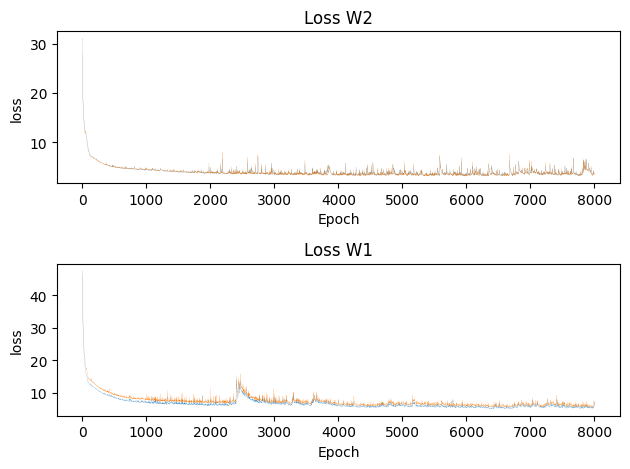

In [11]:
plot_loss_val_loss("25_06_23/log_dir/history_Unwise_1.csv", "25_06_23/log_dir/history_Unwise_2.csv")


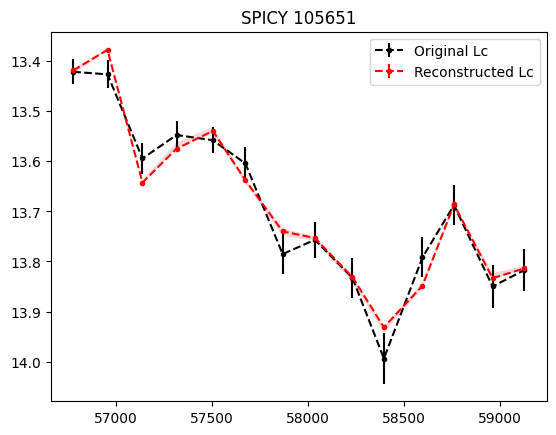

In [12]:
df_star = reconstruccion(decoding_2,lcs_scaled_W_2,lcs_raw_W_2,decoding_10_2,0,catalog_2)


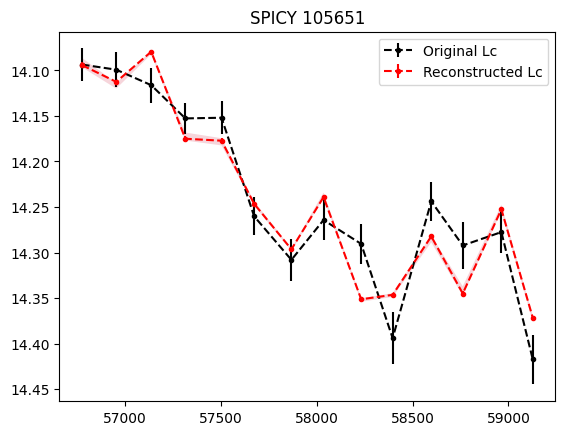

In [13]:
df_star = reconstruccion(decoding_1,lcs_scaled_W_1,lcs_raw_W_1,decoding_10_1,0,catalog_1)


In [14]:
# Función para trazar el histograma en los subplots
def plot_histogram(data_1,data_2):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))
    # Subplot 1: Catálogo general
    ax1.hist(data=data_1.loc[data_1['split'] == "train"],x="log_10(R)_W1", bins=50, color='b',
            density=True, histtype='step', label='Training set')
    ax1.hist(data=data_1.loc[data_1['split'] == "test"],x="log_10(R)_W1", bins=50, color='r',
            density=True, histtype='step', label='Testing set')
    ax1.set_xlabel("log_10(R)")
    ax1.set_ylabel("No of samples")
    ax1.legend()
    ax1.set_title('Error W1')
    # Subplot 2: Estrellas con subtype
    ax2.hist(data=data_2.loc[data_2['split'] == "train"],x="log_10(R)_W2", bins=50, color='b',
            density=True, histtype='step', label='Training set')
    ax2.hist(data=data_2.loc[data_2['split'] == "test"],x="log_10(R)_W2", bins=50, color='r',
            density=True, histtype='step', label='Testing set')
    ax2.set_xlabel("log_10(R)")
    ax2.set_ylabel("No of samples")
    ax2.legend()
    ax2.set_title('Error W2')
    # Ajustar los espacios entre los subplots
    plt.subplots_adjust(hspace=0.4)

    # Mostrar los subplots
    plt.show()
    return

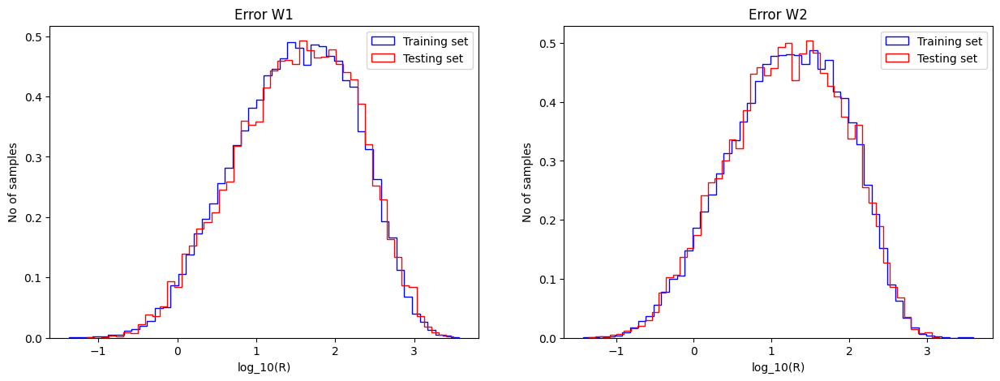

In [15]:
plot_histogram(catalog_1,catalog_2)

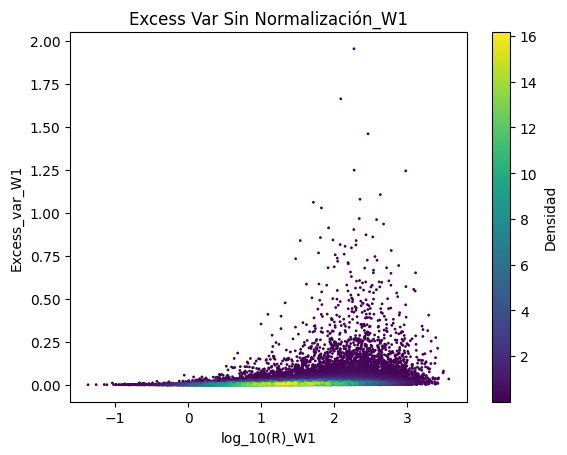

In [16]:
fig = scatter_plot_con_densidad(catalog_1["log_10(R)_W1"],
                               catalog_1["Excess_var_sin_norm_W1"],
                                "Excess Var Sin Normalización_W1",
                               "log_10(R)_W1",
                               "Excess_var_W1")

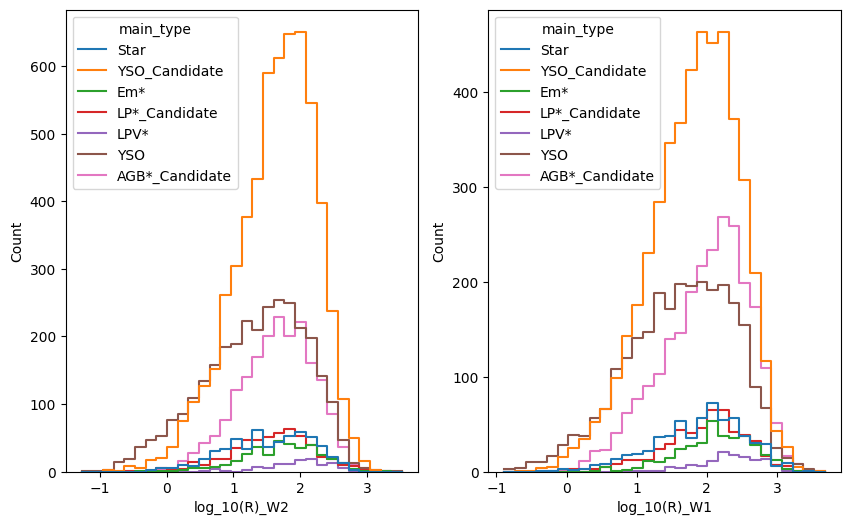

In [375]:
plot_histogram_class(spicy, "main_type", "log_10(R)_W2", "log_10(R)_W1", top_n=7)

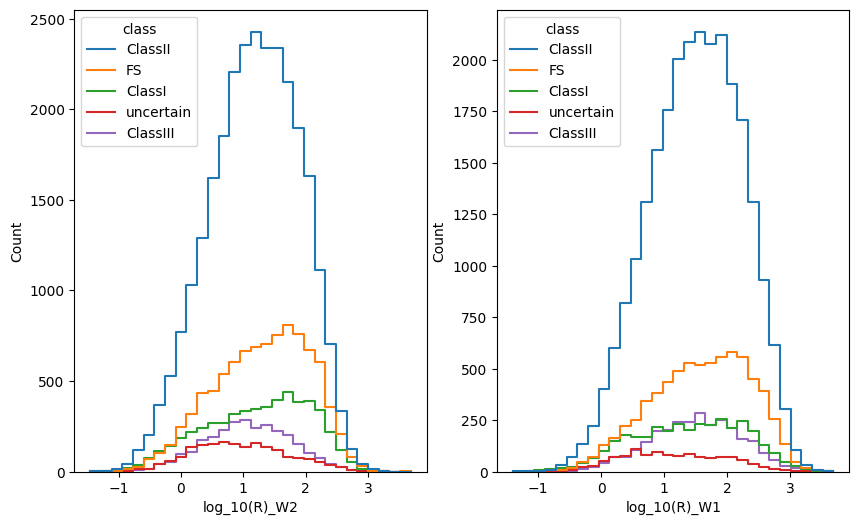

In [376]:
plot_histogram_class(spicy, "class", "log_10(R)_W2", "log_10(R)_W1", top_n=7)

In [17]:

import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import itertools
import pandas as pd
import numpy as np

def plot_subplots_with_labels(spicy, i):
    # Obtener el número de columnas del encoding
    num_cols = len([col for col in spicy.columns if col[1:] == f"_encod_W{i}"])

    # Crear la lista de nombres de columnas
    column_names = [f'{j}_encod_W{i}' for j in range(num_cols)]

    df_encodings = spicy.dropna(subset=column_names)[column_names]

    class_labels = spicy.dropna(subset=column_names)["class"]
    # Convertir las categorías en valores numéricos en df_encodings
    colores, unique_labels = pd.factorize(class_labels)
    palett = plt.cm.get_cmap('Set1')

    # Crear la lista de patches para la leyenda
    legend_elements = [Patch(facecolor=palett(i), edgecolor='r', label=label) for i, label in enumerate(unique_labels)]
    
    # Obtener todas las combinaciones de columnas en df_encodings
    combinaciones = list(itertools.combinations(range(len(df_encodings.columns)), 2))

    # Configuración de la figura y los ejes
    num_plots = len(combinaciones)
    num_cols = 3
    num_rows = int(np.ceil(num_plots / num_cols))

    fig, axs = plt.subplots(num_rows, num_cols, figsize=(5*num_cols, 5*num_rows))  # Ajustar el número de subplots y el tamaño de la figura según el número de combinaciones

    # Convertir axs en una lista 1-D si tiene más de una subplot, esto facilita el acceso a los subplots en el siguiente bucle
    axs = axs.flatten()

    # Graficar cada combinación de columnas desde df_encodings
    for i, combinacion in enumerate(combinaciones):
        x_col, y_col = combinacion
        axs[i].scatter(df_encodings.iloc[:, x_col], df_encodings.iloc[:, y_col], marker='*', s=0.01, c=colores, cmap=palett, alpha=0.5)  # Se añade alpha aquí
        axs[i].set_xlabel(df_encodings.columns[x_col])
        axs[i].set_ylabel(df_encodings.columns[y_col])

    # Eliminar los subplots extras que no se utilizaron
    for i in range(num_plots, num_rows*num_cols):
        fig.delaxes(axs[i])

    # Añadir la leyenda a la figura
    fig.legend(handles=legend_elements, loc='upper center', ncol=len(unique_labels), fontsize='large', bbox_to_anchor=(0.5, 0.9))
    return 



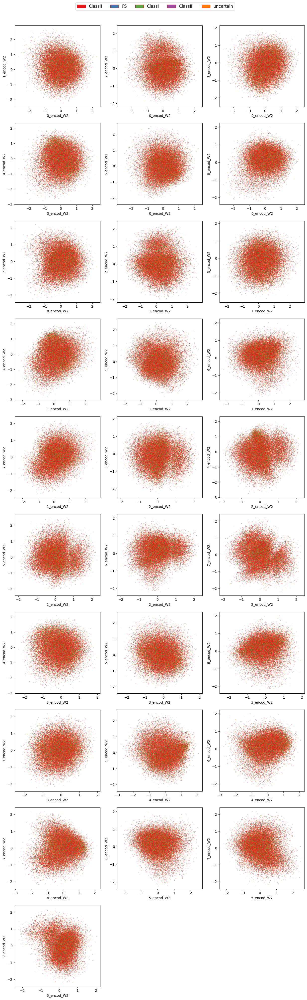

In [18]:
plot_subplots_with_labels(spicy, 2)

In [24]:
from sklearn.preprocessing import StandardScaler

In [25]:
scaler = StandardScaler()


In [26]:
spicy_DBscan = spicy.dropna(subset=['0_encod_W2', '1_encod_W2', '2_encod_W2',
       '3_encod_W2','0_encod_W1', '1_encod_W1', '2_encod_W1',
       '3_encod_W1','Jmag', 'Hmag', 'Kmag', 'Plx', 'pmRA', 'pmDE', 'RPmag', 'Gmag', 'BPmag'])[["SPICY",'0_encod_W2', '1_encod_W2', '2_encod_W2',
       '3_encod_W2','0_encod_W1', '1_encod_W1', '2_encod_W1',
       '3_encod_W1','Jmag', 'Hmag', 'Kmag', 'Plx', 'pmRA', 'pmDE', 'RPmag', 'Gmag', 'BPmag']].reset_index(drop=True)

In [27]:
for columns in ['Jmag', 'Hmag', 'Kmag', 'Plx', 'pmRA', 'pmDE', 'RPmag', 'Gmag', 'BPmag']:
    spicy_DBscan[columns] = scaler.fit_transform(spicy_DBscan[columns].values.reshape(-1, 1) )

In [28]:
# Normalización estándar

from sklearn.cluster import DBSCAN

resultados = {}

# Definimos hiperparametros
eps_values = np.linspace(0.1,5,20)
min_samples_values = np.linspace(5,100,20).astype(int)
# Generar todas las combinaciones posibles de hiperparámetros
combinations = itertools.product(eps_values, min_samples_values)

# Bucle para probar distintos hiperparámetros
for params in combinations:
    eps, min_samples = params
    
    # Crear instancia de DBSCAN con los hiperparámetros
    dbscan_model = DBSCAN(eps=eps, min_samples=min_samples)

    # Ajustar el modelo a los datos
    clusters = dbscan_model.fit(spicy_DBscan.drop(columns={"SPICY"}))
    
    score = silhouette_score(spicy_DBscan.drop(columns={"SPICY"}), clusters)

    # Imprimir los resultados con los hiperparámetros probados
    print(f'Hiperparámetros: eps={eps}, min_samples={min_samples}')
    print('Número de clústeres:', len(set(labels_dbscan)))
    print("Silhouette Score: ", score)
    print('---------------------------')
    resultados[params] = score
    break

ValueError: y should be a 1d array, got an array of shape () instead.

In [29]:
from sklearn.cluster import DBSCAN
from sklearn import datasets
from sklearn.metrics import silhouette_score

# Cargamos el dataset Iris
iris = datasets.load_iris()
X = iris.data

# Aplicamos DBSCAN
dbscan = DBSCAN(eps=0.5, min_samples=5)
clusters = dbscan.fit_predict(X)

# Evaluamos la calidad de los clusters con el Coeficiente de Silueta
# Los valores más altos de Silhouette Score indican una mejor separación de los clusters
score = silhouette_score(X, clusters)

print("Silhouette Score: ", score)


Silhouette Score:  0.48603419703456857


In [1]:
dbscan = DBSCAN(eps=4, min_samples=5)
clusters = dbscan.fit_predict(spicy_DBscan.drop(columns={"SPICY"}).values.reshape(-1, 1))

NameError: name 'DBSCAN' is not defined

In [ ]:
score = silhouette_score(spicy_DBscan.drop(columns={"SPICY"}).values.reshape(-1, 1) , clusters)
